# GCN

In [5]:
pip install node2vec

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 62.6 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.2.1
    Uninstalling networkx-3.2.1:
      Successfully uninstalled networkx-3.2.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
momepy 0.7.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
osmnx 1.9.3 requires shapely>=2.0, but you have shapely 1.8.5.post1 which is incompatible.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [6]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.4 MB/s eta 0:00:0000:01


In [9]:
pip install keras_preprocessing

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [65]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math
import torch
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV, cross_validate, cross_val_predict, cross_val_score, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, log_loss, precision_recall_fscore_support
from sklearn.utils import class_weight, resample
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import networkx as nx
import torch
import torch.nn as nn
import torch.nn.functional as F
# from torch_geometric.nn import GCNConv
# from torch_geometric.data import Data
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier, BaggingClassifier
from xgboost import XGBClassifier
from keras_preprocessing.sequence import pad_sequences
from transformers import BertTokenizer, BertForSequenceClassification, AdamW, BertConfig, get_linear_schedule_with_warmup
from tqdm import tqdm, trange
import torch
import zipfile
import os
import re
from io import BytesIO
from tensorflow.keras import layers, losses
import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn
from torch_geometric.nn import GATConv, GCNConv
import matplotlib.pyplot as plt
import csv
from keras.optimizers import Adam
from torch_geometric.nn import GCNConv
import csv
from random import choice
import optuna
from torch_geometric.nn import GATConv
import torch.optim as optim
import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn
from torch_geometric.nn import GATConv
import matplotlib.pyplot as plt
import csv
import networkx as nx
import pickle
from datetime import datetime
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from node2vec import Node2Vec
from torch_geometric.data import Data
from imblearn.over_sampling import SMOTE, ADASYN
import tensorflow as tf
from tensorflow.keras import layers
from imblearn.ensemble import BalancedBaggingClassifier
from gensim.models import Word2Vec
import time
import sys
import importlib

## Import Text Data

In [11]:
# Import the preprocessed CSV files
train_df = pd.read_csv('../input/train-test-filled/train_df_filled_null.csv')
test_df = pd.read_csv('../input/train-test-filled/test_df_filled_null.csv')

train_df.loc[train_df['text'] == 'No textual information', 'text'] = ''
test_df.loc[test_df['text'] == 'No textual information', 'text'] = ''

X_all = train_df['text']
y_all = train_df['label']
X_test = test_df['text']

In [12]:
# train_df.head(50)

## Import Graph Data

In [16]:
# Specify the directory containing the source data
source_data_dir = "../input/data-chall-train-test-edgelist/"

# Read training data
train_domains = list()
with open(os.path.join(source_data_dir, "train.txt"), 'r') as f:
    for line in f:
        l = line.split(',')
        train_domains.append(l[0])

# Read test data
test_domains = list()
with open(os.path.join(source_data_dir, "test.txt"), 'r') as f:
    for line in f:
        l = line.split(',')
        test_domains.append(l[0])

In [14]:
#Read edgelist.txt
edgelist = pd.read_csv('../input/data-chall-train-test-edgelist/edgelist.txt', delimiter=' ',header=None,names=["source", "target"])

# Create a directed graph
G = nx.read_edgelist('../input/data-chall-train-test-edgelist/edgelist.txt', delimiter=' ', create_using=nx.DiGraph())

print('Number of nodes:', G.number_of_nodes())
print('Number of edges:', G.number_of_edges())

Number of nodes: 65208
Number of edges: 1642073


# Assign text to empty text URLs

## Helper Functions

In [17]:
# Add the directory containing helper_functions.py to the system path
sys.path.append('../input/challenge2/Data Challenge 2/')

# Now you can import the module
import helper_functions

# Reload the module to ensure any changes are reflected
importlib.reload(helper_functions)

# Import the specific functions you need
from helper_functions import (
    plot_pca,
    plot_umap,
    plot_cfm,
    print_classification_metrics,
    cv_loss,
    baseline_cross_val,
    write_submission
)


2024-06-09 13:21:39.866457: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-09 13:21:39.866595: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-09 13:21:39.976145: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


#### Feature Generation Functions

In [18]:
def avg_neighbor_degree(G, node):
    neighbors = list(G.neighbors(node))
    if len(neighbors) == 0:
        return 0
    total_degree = sum(G.degree(neighbor) for neighbor in neighbors)
    return total_degree / len(neighbors)

In [19]:
def jaccard_sim(a, b):
    if a and b:  # Check if both sets are not empty
        intersection = len(a.intersection(b))
        union = len(a.union(b))
        jacc = intersection / (union + 1)
    else:
        jacc = 0
    return jacc

In [20]:
def adamic_sim(G, neighbour_set):
    index = 0
    if len(neighbour_set) == 0:
        return 0
    else: 
        for neighbour in neighbour_set:
            if len(G.adj[neighbour]) == 0:
                continue  # Skip if the neighbor has no connections
            adar = 1 / math.log(len(G.adj[neighbour]) + 1)
            index += adar
        return index

In [21]:
# Embedding Similarity: Function to be used to create a feature

def avg_cosine_sim(G, node, embeddings_df):
    neighbors = list(G.neighbors(node))
    
    if len(neighbors) == 0:
        return 0
    
    # Get the node2vec embedding for the specific node
    node_embedding = embeddings_df.loc[node].values.reshape(1, -1)
    
    # Calculate cosine similarity with each neighbor and collect the results
    cosine_sims = []
    for neighbor in neighbors:
        if neighbor in embeddings_df.index:
            neighbor_embedding = embeddings_df.loc[neighbor].values.reshape(1, -1)
            cosine_sim = cosine_similarity(node_embedding, neighbor_embedding)[0][0]
            cosine_sims.append(cosine_sim)
    
    # Check if there are valid cosine similarities
    if cosine_sims:
        avg_cosine_sim = np.mean(cosine_sims)
    else:
        avg_cosine_sim = 0
    
    return avg_cosine_sim

#### Plot Training History

In [22]:
def plot_history(history):
    fig = plt.figure(figsize=(12, 6))

    ax1 = fig.add_subplot(1, 2, 1)  # Create subplot in the first position of a 1x2 grid
    ax1.plot(history.history['accuracy'], linewidth=2)
    ax1.plot(history.history['val_accuracy'], linewidth=2)
    ax1.set_title('Model Accuracy')
    ax1.set_ylabel('Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.legend(['Train Set', 'Validation Set'], loc='lower right')

    ax2 = fig.add_subplot(1, 2, 2)  # Create subplot in the second position of a 1x2 grid
    ax2.plot(history.history['loss'])
    ax2.plot(history.history['val_loss'])
    ax2.set_title('Model Loss')
    ax2.set_ylabel('Loss')
    ax2.set_xlabel('Epoch')
    ax2.legend(['Train Set', 'Validation Set'], loc='upper right')

    plt.show()


## TEXT

### TF-IDF & SVD

In [23]:
# TF_IDF
vec = TfidfVectorizer(decode_error='ignore', 
                      strip_accents='unicode', 
                      sublinear_tf = True, 
                      min_df = 10, 
                      max_df = 500,
                      max_features=3000)

X_train_tfidf = vec.fit_transform(X_all)
X_test_tfidf = vec.transform(X_test)

In [24]:
# Concatenate training and test embeddings
embeddings_tfidf = np.concatenate([X_train_tfidf.toarray(), X_test_tfidf.toarray()], axis=0)

# Create DataFrame
column_names = [f"tfidf_{i}" for i in range(embeddings_tfidf.shape[1])]
embeddings_tfidf = pd.DataFrame(embeddings_tfidf, columns=column_names)

# Set 'domain' column as index
embeddings_tfidf['domain'] = train_domains + test_domains
embeddings_tfidf.set_index('domain', inplace=True)

# BERT

In [4]:
# pip install keras_preprocessing

In [29]:
# Load the fine-tuned BERT model and tokenizer
model_save_path = '/Users/csykianakis/Desktop/fine_tuned_bert_6_full'
tokenizer = BertTokenizer.from_pretrained(model_save_path)
model = BertModel.from_pretrained(model_save_path)

# Load the data
# train_df = pd.read_csv('/Users/csykianakis/Downloads/train_df_filled_null.csv')
# test_df = pd.read_csv('/Users/csykianakis/Downloads/test_df_filled_null.csv')

# Define max sequence length
max_seq_length = 512

# Function to tokenize and embed text
def embed_text(texts, tokenizer, model, max_seq_length):
    embeddings = []
    for text in texts:
        input_ids = tokenizer.encode(text, add_special_tokens=True, max_length=max_seq_length, truncation=True)
        input_ids = input_ids[:max_seq_length]  # Truncate if necessary
        input_ids += [tokenizer.pad_token_id] * (max_seq_length - len(input_ids))  # Pad if necessary
        attention_mask = [1] * len(input_ids)  # Create attention mask
        input_tensor = torch.tensor(input_ids).unsqueeze(0)
        attention_mask_tensor = torch.tensor(attention_mask).unsqueeze(0)  # Convert attention mask to tensor
        with torch.no_grad():
            outputs = model(input_tensor, attention_mask=attention_mask_tensor)  # Pass attention mask to model
        cls_output = outputs.last_hidden_state[:, 0, :]
        embeddings.append(cls_output.numpy())
    return np.concatenate(embeddings)

# Tokenize and embed text in train_df
train_embeddings_array = embed_text(train_df['text'], tokenizer, model, max_seq_length)

# Tokenize and embed text in test_df
test_embeddings_array = embed_text(test_df['text'], tokenizer, model, max_seq_length)

# df = pd.DataFrame(train_embeddings_array)
# df.to_csv('train_embeddings_fine_tuned_bert6_cls_array_without_null.csv', index=False)

# df1= pd.DataFrame(test_embeddings_array)
# df1.to_csv('test_embeddings_fine_tuned_bert6_cls_array_without_null.csv', index=False)

In [25]:
# Load the array
train_bert_ids_df = pd.read_csv('/kaggle/input/train-test-embeddings-fine-tuned-bert6-cls/train_embeddings_fine_tuned_bert6_cls_array_without_null.csv')
train_bert_ids = train_bert_ids_df.values

test_bert_ids_df = pd.read_csv('/kaggle/input/train-test-embeddings-fine-tuned-bert6-cls/test_embeddings_fine_tuned_bert6_cls_array_without_null.csv')
test_bert_ids = test_bert_ids_df.values

In [26]:
train_bert_ids.shape

(1812, 768)

In [27]:
# Concatenate training and test embeddings
embeddings_greek_bert = np.concatenate([train_bert_ids, test_bert_ids], axis=0)

# Create DataFrame
column_names = [f"bert_{i}" for i in range(embeddings_greek_bert.shape[1])]
embeddings_greek_bert = pd.DataFrame(embeddings_greek_bert, columns=column_names)

# Set 'domain' column as index
embeddings_greek_bert['domain'] = train_domains + test_domains
embeddings_greek_bert.set_index('domain', inplace=True)

### Dov2Vec & SVD

In [28]:
# Prepare TaggedDocuments for training and test sets
tagged_X_docs = [TaggedDocument(text.split(), ['d{}'.format(idx)]) for idx, text in enumerate(X_all)]
tagged_X_t_docs = [TaggedDocument(text.split(), ['d{}'.format(idx)]) for idx, text in enumerate(X_test)]

# Initialize and train Doc2Vec model
model_d2v = Doc2Vec(
    vector_size=32,  # Dimensionality of document vectors
    window=6,       # Maximum distance between words considered in context
    min_count=2,     # Ignore words with frequency below this threshold
    workers=8      # Number of training passes over the corpus 
)

model_d2v.build_vocab(tagged_X_docs)  
model_d2v.train(tagged_X_docs, total_examples=model_d2v.corpus_count, epochs=10)

# Prepare feature matrices
X_train_d2v = np.array([model_d2v.dv[i] for i in range(len(X_all))])  
X_test_d2v = np.array([model_d2v.dv[i] for i in range(len(X_test))])

In [29]:
# Concatenate training and test embeddings
embeddings_d2v = np.concatenate([X_train_d2v, X_test_d2v])

# Create DataFrame
column_names = [f"d2v_{i}" for i in range(embeddings_d2v.shape[1])]
embeddings_d2v = pd.DataFrame(embeddings_d2v, columns=column_names)

# Set 'domain' column as index
embeddings_d2v['domain'] = train_domains + test_domains
embeddings_d2v.set_index('domain', inplace=True)

In [30]:
embeddings_d2v.shape

(2417, 32)

## GRAPH

### Node2Vec

In [31]:
# start_time = datetime.now()

# # Generate walks
# node2vec = Node2Vec(G, dimensions=64, walk_length=15, num_walks=100)

# # Train model
# model_n2v = node2vec.fit(window=6, min_count=1)

# filename = 'n2v_model.sav'
# pickle.dump(model_n2v, open(filename, 'wb'))  # save model
# # model_n2v = pickle.load(open(filename, 'rb'))  # open model

# print('Total execution time was:', datetime.now() - start_time) # 0:51:05.886603

In [32]:
# filename = 'n2v_model.sav'
# model_n2v = pickle.load(open(filename, 'rb'))  # open model

# # Generate features for training and testing data
# X_train_n2v = np.array([model_n2v.wv.get_vector(domain) for domain in train_domains])
# X_test_n2v = np.array([model_n2v.wv.get_vector(domain) for domain in test_domains])

In [33]:
import pickle

# Load the saved Node2Vec model
filename = '../input/challenge2/Data Challenge 2/n2v_model_128.sav'
model_n2v = pickle.load(open(filename, 'rb'))

# Generate features for training and testing data
X_train_n2v = np.array([model_n2v.wv.get_vector(domain) for domain in train_domains])
X_test_n2v = np.array([model_n2v.wv.get_vector(domain) for domain in test_domains])

In [34]:
# Concatenate training and test embeddings
embeddings_n2v = np.concatenate([X_train_n2v, X_test_n2v])

# Create DataFrame
column_names = [f"n2v_{i}" for i in range(embeddings_n2v.shape[1])]
embeddings_n2v = pd.DataFrame(embeddings_n2v, columns=column_names)

# Set 'domain' column as index
embeddings_n2v['domain'] = train_domains + test_domains
embeddings_n2v.set_index('domain', inplace=True)

In [35]:
embeddings_n2v.shape

(2417, 128)

## GRAPH & TEXT

###  Deepwalk

In [36]:
def random_walk(G, node, walk_length):
    # Starts from vertex "node" and performs a random walk of length "walk length". Returns a list of the visited vertices
    walk = [node]

    for _ in range(walk_length-1):
        neighbors = list(G.neighbors(walk[-1]))
        if len(neighbors) > 0:
            neighbor = choice(neighbors)
            walk.append(neighbor)
        else:
            break

    walk = [str(node) for node in walk]
    return walk


def generate_walks(G, num_walks, walk_length):
    # Runs "num_walks" random walks from each node, and returns a list of all random walk
    walks = []

    for _ in range(num_walks):
        for node in G.nodes():
            walk = random_walk(G, node, walk_length)
            walks.append(walk)

    return walks

In [39]:
walks = generate_walks(G, 7, 40)
print(walks[0])
model_w2v = Word2Vec(walks, vector_size=128, window=10, min_count=0, sg=1, workers=8, epochs=5)

X_train_deep = np.zeros((len(train_domains), 128))
for i, domain in enumerate(train_domains):
    X_train_deep[i,:] = model_w2v.wv[domain]

X_test_deep = np.zeros((len(test_domains), 128))
for i, domain in enumerate(test_domains):
    X_test_deep[i,:] = model_w2v.wv[domain]

['blog.com.gr', 'aftodioikisi.gr']


In [40]:
# Concatenate training and test embeddings
embeddings_deep = np.concatenate([X_train_deep, X_test_deep])

# Create DataFrame
column_names = [f"d2v_{i}" for i in range(embeddings_deep.shape[1])]
embeddings_deep = pd.DataFrame(embeddings_deep, columns=column_names)

# Set 'domain' column as index
embeddings_deep['domain'] = train_domains + test_domains
embeddings_deep.set_index('domain', inplace=True)

## Features

In [41]:
degree_centrality = nx.degree_centrality(G)

In [42]:
def extract_node_features(G, node):
    neighbors = set(G.neighbors(node)) # get neighbors
    second_degree_neighbors = {nbr for neighbor in neighbors for nbr in G.neighbors(neighbor)}

    # Create features
    in_degree = G.in_degree(node)
    out_degree = G.out_degree(node)
    avg_neigh_degree = nx.average_neighbor_degree(G, nodes=[node])[node]
    
    sum_neigh_degree = sum(G.degree(neighbor) for neighbor in neighbors) if neighbors else 0
    min_neigh_degree = min(G.degree(neighbor) for neighbor in neighbors) if neighbors else 0
    max_neigh_degree = max(G.degree(neighbor) for neighbor in neighbors) if neighbors else 0
    diff_neigh_degree = max_neigh_degree - min_neigh_degree if neighbors else 0
    
    sum_2nd_neigh_degree = sum(G.degree(neighbor) for neighbor in second_degree_neighbors) if second_degree_neighbors else 0
    min_2nd_neigh_degree = min(G.degree(neighbor) for neighbor in second_degree_neighbors) if second_degree_neighbors else 0
    max_2nd_neigh_degree = max(G.degree(neighbor) for neighbor in second_degree_neighbors) if second_degree_neighbors else 0
    diff_2nd_neigh_degree = max_2nd_neigh_degree - min_2nd_neigh_degree if second_degree_neighbors else 0
    
    jaccard = jaccard_sim(neighbors, second_degree_neighbors)
    adamic = adamic_sim(G, neighbors)
    
    return {'node': node, 
            'in_degree': in_degree,
            'out_degree': out_degree,
            'avg_neigh_degree': avg_neigh_degree, 
            'sum_neigh_degree': sum_neigh_degree,
            'min_neigh_degree': min_neigh_degree,
            'max_neigh_degree': max_neigh_degree,
            'diff_neigh_degree': diff_neigh_degree,
            'sum_2nd_neigh_degree': sum_2nd_neigh_degree,
            'min_2nd_neigh_degree': min_2nd_neigh_degree,
            'max_2nd_neigh_degree': max_2nd_neigh_degree,
            'diff_2nd_neigh_degree': diff_2nd_neigh_degree,
            'jaccard': jaccard,
            'adamic': adamic}

In [50]:
# start_time = time.time()

# # Create an empty DataFrame to store all node features
# features_all = pd.DataFrame()

# # Iterate over all nodes in the graph
# for node in G.nodes():  
    
#     # Extract features for the current node
#     features = extract_node_features(G, node)
    
#     # Add additional features for the current node
#     features['degree_centrality']  = degree_centrality[node]
#     features['avg_cos_bert'] = avg_cosine_sim(G, node, embeddings_greek_bert) if node in embeddings_greek_bert.index else 0
#     features['avg_cos_tfidf'] = avg_cosine_sim(G, node, embeddings_tfidf) if node in embeddings_tfidf.index else 0
#     features['avg_cos_d2v'] = avg_cosine_sim(G, node, embeddings_d2v) if node in embeddings_d2v.index else 0
#     features['avg_cos_n2v'] = avg_cosine_sim(G, node, embeddings_n2v) if node in embeddings_n2v.index else 0
#     features['avg_cos_deep'] = avg_cosine_sim(G, node, embeddings_deep) if node in embeddings_deep.index else 0
    
#         # Convert features dictionary to DataFrame
#     features_df = pd.DataFrame(features, index=[0])
    
#     # Concatenate with features_train DataFrame
#     features_all = pd.concat([features_all, features_df], ignore_index=True)

# print(time.time() - start_time)

In [51]:
# features_all = pd.read_csv('../input/features-files/features_all.csv')
# features_train = pd.read_csv('../input/features-files/features_train.csv')
# features_test = pd.read_csv('../input/features-files/features_test.csv')

In [52]:
# features_train.shape

In [53]:
# Create training set features
features_train = pd.DataFrame()

for node in train_domains:  
    
    features = extract_node_features(G, node)
    features['degree_centrality']  = degree_centrality[node]
    
    features['avg_cos_bert'] = avg_cosine_sim(G, node, embeddings_greek_bert)
    features['avg_cos_tfidf']  = avg_cosine_sim(G, node, embeddings_tfidf)
    features['avg_cos_d2v']  = avg_cosine_sim(G, node, embeddings_d2v)
    features['avg_cos_n2v']  = avg_cosine_sim(G, node, embeddings_n2v)
    features['avg_cos_deep']  = avg_cosine_sim(G, node, embeddings_deep)
    
    # Convert features dictionary to DataFrame
    features_df = pd.DataFrame(features, index=[0])
    
    # Concatenate with features_train DataFrame
    features_train = pd.concat([features_train, features_df], ignore_index=True)

In [54]:
# Create test set features
features_test = pd.DataFrame()

for node in test_domains:  

    features = extract_node_features(G, node)
    features['degree_centrality']  = degree_centrality[node]
    
    features['avg_cos_bert'] = avg_cosine_sim(G, node, embeddings_greek_bert)
    features['avg_cos_tfidf']  = avg_cosine_sim(G, node, embeddings_tfidf)
    features['avg_cos_d2v']  = avg_cosine_sim(G, node, embeddings_d2v)
    features['avg_cos_n2v']  = avg_cosine_sim(G, node, embeddings_n2v)
    features['avg_cos_deep']  = avg_cosine_sim(G, node, embeddings_deep)
    
        # Convert features dictionary to DataFrame
    features_df = pd.DataFrame(features, index=[0])
    
    # Concatenate with features_train DataFrame
    features_test = pd.concat([features_test, features_df], ignore_index=True)

In [66]:
# features_train.to_csv('features_train_bert_6cls.csv', index=False)  
# features_test.to_csv('features_test_bert_6cls.csv', index=False)  

In [55]:
# features_train.head()

In [56]:
# features_all = pd.read_csv('/kaggle/input/features-files-bert-c/features_all_bert.csv')

In [43]:
features_train = pd.read_csv('/kaggle/input/features-files-bert-c/features_train_bert.csv')

In [44]:
features_test = pd.read_csv('/kaggle/input/features-files-bert-c/features_test_bert.csv')

**Feature Selection**

In [59]:
X_sel = features_train.drop(columns=['node'])
column_names = features_train.drop(columns=['node']).columns

# Transform X_train and X_test
scaler = RobustScaler()
X_sel = scaler.fit_transform(X_sel)

# Select features using SelectKBest
sel = SelectKBest(mutual_info_classif, k=X_sel.shape[1])
X_sel = sel.fit_transform(X_sel, y_all)

# Get selected feature indices
selected_indices = sel.get_support(indices=True)

# Get selected feature names and scores
selected_feature_names = column_names[selected_indices]
selected_feature_scores = sel.scores_[selected_indices]

# Create DataFrame with selected features and scores
feature_scores = pd.DataFrame({'Feature Name': selected_feature_names, 'Score': selected_feature_scores})

# Sort feature scores in descending order
feature_scores = feature_scores.sort_values(by='Score', ascending=False)
print(feature_scores)

             Feature Name     Score
6       diff_neigh_degree  0.150886
7    sum_2nd_neigh_degree  0.122038
5        max_neigh_degree  0.121257
3        sum_neigh_degree  0.118490
14           avg_cos_bert  0.115037
0               in_degree  0.113623
2        avg_neigh_degree  0.105154
17            avg_cos_n2v  0.099309
13      degree_centrality  0.095853
12                 adamic  0.089460
15          avg_cos_tfidf  0.074212
4        min_neigh_degree  0.068760
16            avg_cos_d2v  0.067542
10  diff_2nd_neigh_degree  0.065313
1              out_degree  0.065136
18           avg_cos_deep  0.053298
11                jaccard  0.038862
8    min_2nd_neigh_degree  0.036854
9    max_2nd_neigh_degree  0.025372


## Select Final Datasets

Text features (e.g., doc2vec embeddings) might capture semantic information about the nodes, which could be relevant if the nodes represent entities with textual descriptions.
Node2vec features capture the structural information of the graph, which can be valuable for tasks that depend on the graph topology.
Additional node features such as betweenness centrality, cosine similarity, in-degree, and out-degree can provide supplementary information about the nodes' importance, connectivity, and relationships.

In [64]:
# X_train_d2v & X_train_n2v | scaler | 0.837
# X_train_d2v & X_train_n2v | svd | scaler | 0.880
# X_train_d2v & X_train_deep | scaler | 1.035
# X_train_feat | scaler | 2.236
# X_train_tfidf (1K) & X_train_n2v | svd | scaler | 0.839
# X_train_tfidf (3K) & X_train_n2v | svd | scaler | 0.817


In [45]:
X = np.hstack((X_train_tfidf.toarray(),train_bert_ids, X_train_d2v,X_train_n2v,X_train_deep,
               features_train.drop(columns=['node','min_neigh_degree','min_2nd_neigh_degree','max_2nd_neigh_degree'
                                           ,'avg_cos_deep','jaccard'])))
X_t = np.hstack((X_test_tfidf.toarray(),test_bert_ids, X_test_d2v,X_test_n2v,X_test_deep,
                 features_test.drop(columns=['node','min_neigh_degree','min_2nd_neigh_degree','max_2nd_neigh_degree'
                                           ,'avg_cos_deep','jaccard'])))
y = y_all

In [ ]:
# X = np.hstack((X_train_tfidf.toarray(), train_bert_ids,X_train_n2v,X_train_deep,
#                features_train.drop(columns=['node'])))
# X_t = np.hstack((X_test_tfidf.toarray(), test_bert_ids,X_test_n2v,X_test_deep,
#                  features_test.drop(columns=['node'])))
# y = y_all

In [68]:
# X = np.hstack((train_bert_ids, X_train_deep,X_train_n2v,
#                features_train.drop(columns=['node'])))
# X_t = np.hstack((test_bert_ids, X_test_deep,X_test_n2v,
#                  features_test.drop(columns=['node'])))
# y = y_all

In [ ]:
# X = np.hstack((train_bert_ids,
#                features_train.drop(columns=['node'])))
# X_t = np.hstack((test_bert_ids,
#                  features_test.drop(columns=['node'])))
# y = y_all

In [46]:
# Scale the data using StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Scale the data using StandardScaler
scaler = StandardScaler()
X_t = scaler.fit_transform(X_t)

In [48]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Drop the 'node' column
features_train = features_train.drop(columns=['node'])

# Scale the data using StandardScaler
scaler = StandardScaler()
features_train_scaled = scaler.fit_transform(X)

# Drop the 'node' column
features_test = features_test.drop(columns=['node'])

scaler = StandardScaler()
features_test_scaled = scaler.fit_transform(X_t)


In [49]:
from sklearn.model_selection import train_test_split

# Split the features and labels into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(features_train_scaled, y_all, test_size=0.15, random_state=42)

# MLP

In [50]:
# Define model class
class kmodel(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout, n_classes):
        super(kmodel, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, hidden_dim)
        self.fc2 = torch.nn.Linear(hidden_dim, n_classes)
        self.dropout = torch.nn.Dropout(dropout)
        
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [ ]:
# true_labels = []
# predicted_labels = []
# losses = []

# # Perform cross-validation
# for fold, (train_index, val_index) in enumerate(skf.split(X_tensor, y_tensor)):

#     # Split data into training and validation sets for this fold
#     X_train, X_val = X_tensor[train_index], X_tensor[val_index]
#     y_train, y_val = y_tensor[train_index], y_tensor[val_index]

#     # Create DataLoader for training and validation
#     train_dataset = TensorDataset(X_train, y_train)
#     val_dataset = TensorDataset(X_val, y_val)

#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

#     # Calculate class weights for this fold
#     class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(y_train.numpy()), y=y_train.numpy())
#     class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
    
#     # Initialize model, loss, optimizer with loss weighted for each class
#     model = kmodel(input_dim=input_dim, hidden_dim=hidden_dim, dropout=dropout, n_classes=n_classes).to(device)
#     loss_fn = torch.nn.CrossEntropyLoss(weight=class_weights)
#     optimizer = optim.Adam(model.parameters(), lr=lr)
  
#     # Training loop
#     for epoch in range(n_epochs):
#         model.train()
#         for batch_idx, (data, target) in enumerate(train_loader):
#             data, target = data.to(device), target.to(device)
#             optimizer.zero_grad()
#             output = model(data)
#             loss = loss_fn(output, target)
#             loss.backward()
#             optimizer.step()

#     # Validation loop
#     model.eval()
#     true_labels_fold = []
#     predicted_labels_fold = []
#     with torch.no_grad():
#         for data, target in val_loader:
#             data, target = data.to(device), target.to(device)
#             output = model(data)
#             _, predicted = torch.max(output, 1)
#             true_labels_fold.extend(target.cpu().numpy())
#             predicted_labels_fold.extend(predicted.cpu().numpy())
    
#     # Append true and predicted labels for this fold to the global lists
#     true_labels.extend(true_labels_fold)
#     predicted_labels.extend(predicted_labels_fold)

#     # Compute loss for this fold
#     val_loss = np.mean([loss_fn(model(data.to(device)), target.to(device)).item() for data, target in val_loader])
#     losses.append(val_loss)

In [51]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Apply Early Stopping to avoid overfiting
early_stopping = EarlyStopping(
    monitor="val_loss",
    verbose=1,
    patience=200,
    min_delta=1e-4,
    restore_best_weights=True)

In [52]:
# Reduced learning reate to boost performance on training without overfiting
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    verbose=1,
    patience=200,
    mode="min",
    factor=0.2,
    min_lr=1e-9)

In [53]:
# Define the function to create the model architecture
def define_solid_model(X):
    input_dim = X.shape[1]

    model = tf.keras.Sequential()
    model.add(layers.InputLayer(input_shape=(input_dim,)))

    # # Layer 1
    # model.add(layers.Dense(1024, activation='relu'))
    # model.add(layers.Dropout(0.1))

    # # Layer 2
    # model.add(layers.Dense(512, activation='relu'))
    # model.add(layers.Dropout(0.1))
    
    # # Layer 2
    # model.add(layers.Dense(256, activation='relu'))
    # model.add(layers.Dropout(0.1))

    # Layer 3
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dropout(0.5))

    # Layer 3
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dropout(0.5))

    # Output layer
    model.add(layers.Dense(9, activation='softmax'))

    return model

# Create the model


In [56]:
# Train the final model with the best hyperparameters on the entire dataset
# mlp_model = define_model()
mlp_model = define_solid_model(X)

# Calculate class weights for the entire dataset
# class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y), y=y)
# class_weights = {i: class_weights[i] for i in range(len(class_weights))}

# Compile the final model with class weights
learning_rate = 0.00001
optimizer = Adam(learning_rate=learning_rate)

mlp_model.compile(optimizer=optimizer,
                  loss=losses.SparseCategoricalCrossentropy(),
                  metrics=['accuracy'])

# Train the final model
mlp_hs = mlp_model.fit(X, y_all,
                       validation_split=0.05,
                       epochs=2000,
                       callbacks=[ reduce_lr],
                       # class_weight=class_weights,
                       verbose=0)

mlp_model.summary()

I0000 00:00:1717939964.934983     430 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.



Epoch 318: ReduceLROnPlateau reducing learning rate to 1.9999999494757505e-06.

Epoch 518: ReduceLROnPlateau reducing learning rate to 3.999999989900971e-07.

Epoch 718: ReduceLROnPlateau reducing learning rate to 8.00000009348878e-08.

Epoch 918: ReduceLROnPlateau reducing learning rate to 1.5999999902760466e-08.

Epoch 1118: ReduceLROnPlateau reducing learning rate to 3.1999999094978194e-09.

Epoch 1318: ReduceLROnPlateau reducing learning rate to 1e-09.


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │       260,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 9)              │           297 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 788,765 (3.01 MB)

 Trainable params: 262,921 (1.00 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 525,844 (2.01 MB)

In [59]:
# Get class probabilities from MLP model
y_pred_prob = mlp_model.predict(X_t)

# Convert logits to probabilities using softmax
y_pred = tf.nn.softmax(y_pred_prob, axis=-1)  

# Evaluate MLP model
mlp_loss = mlp_model.evaluate(X, y)
print("MLP Model Log Loss:", mlp_loss[0])  # Log loss is the first element of the evaluation result
print("MLP Model Accuracy:", mlp_loss[1])  # Accuracy is the second element of the evaluation result


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9821 - loss: 0.1010
MLP Model Log Loss: 0.14180175960063934
MLP Model Accuracy: 0.9740617871284485


In [57]:
def plot_history(history):
    fig = plt.figure(figsize=(12, 6))

    ax1 = fig.add_subplot(1, 2, 1)  # Create subplot in the first position of a 1x2 grid
    ax1.plot(history.history['accuracy'], linewidth=2)
    ax1.plot(history.history['val_accuracy'], linewidth=2)
    ax1.set_title('Model Accuracy')
    ax1.set_ylabel('Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.legend(['Train Set', 'Validation Set'], loc='lower right')

    ax2 = fig.add_subplot(1, 2, 2)  # Create subplot in the second position of a 1x2 grid
    ax2.plot(history.history['loss'])
    ax2.plot(history.history['val_loss'])
    ax2.set_title('Model Loss')
    ax2.set_ylabel('Loss')
    ax2.set_xlabel('Epoch')
    ax2.legend(['Train Set', 'Validation Set'], loc='upper right')

    plt.show()


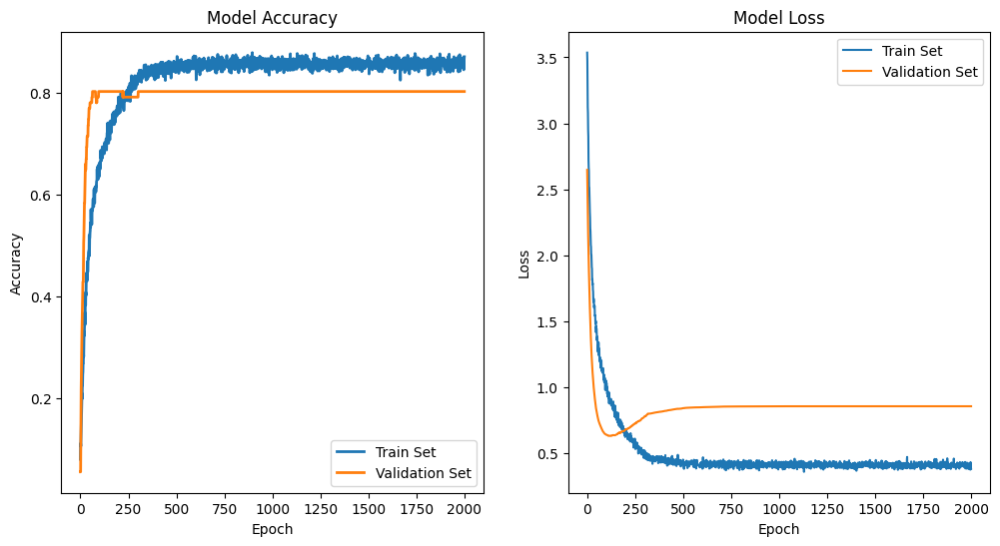

In [58]:
plot_history(mlp_hs)

In [62]:
import csv

# Write predictions to a file
with open('sample_submission_mlp.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    headers = ['domain_name'] + [f'class_{i}' for i in range(9)]
    writer.writerow(headers)
    for i, test_host in enumerate(test_domains):
        row = [test_host] + y_pred[i].numpy().tolist()
        writer.writerow(row)

# GCN TORCH

### features

In [104]:
# Read edgelist
edgelist = pd.read_csv('../input/data-chall-train-test-edgelist/edgelist.txt', delimiter=' ', header=None, names=["source", "target"])

# Create directed graph
G = nx.read_edgelist('../input/data-chall-train-test-edgelist/edgelist.txt', delimiter=' ', create_using=nx.DiGraph())

# Create dict to use later in the model
node_to_idx = {node: i for i, node in enumerate(G.nodes())}

# Number of nodes and edges
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()

print('Number of nodes:', num_nodes)
print('Number of edges:', num_edges)

Number of nodes: 65208
Number of edges: 1642073


In [105]:
y = np.array(y_all)

X_combined = np.vstack((X, X_t))

domains_combined = train_domains + test_domains

In [106]:
# # Step 2: Perform Truncated SVD
# n_components = 2000
# svd = TruncatedSVD(n_components=n_components)
# X_combined= svd.fit_transform(X_combined)

# # Optionally, you can inverse transform the transformed data
# # X_original = svd.inverse_transform(X_svd)

In [110]:
# Initialize placeholder for all node features
feature_dim = X_combined.shape[1]
all_features = np.zeros((num_nodes, feature_dim))

# Fill in features for the nodes in the train and dataset
for i, node in enumerate(domains_combined):
    idx = node_to_idx[node]
    all_features[idx] = X_combined[i]

### tensors

In [111]:
# Create tensor for features
x = torch.tensor(all_features, dtype=torch.float)

# Create tensor that stores edges
edge_index = torch.zeros((2, num_edges), dtype=torch.long)
for i, edge in enumerate(G.edges()):
    edge_index[0, i] = node_to_idx[edge[0]]
    edge_index[1, i] = node_to_idx[edge[1]]

In [114]:
# Create data object
data = Data(x=x, edge_index=edge_index)

In [115]:
# import torch

# # Clear GPU memory
# torch.cuda.empty_cache()

### train val test split

In [116]:
# Split data into training, validation, and test sets
idx_train = [node_to_idx[node] for node in train_domains]
idx_test = [node_to_idx[node] for node in test_domains]

# Assuming y is the labels for the 2000 nodes
idx_train, idx_val, y_train, y_val = train_test_split(idx_train, y, test_size=0.1, random_state=123, stratify=y)

# Transform the numpy matrices/vectors to torch tensors
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
y_train = torch.LongTensor(y_train).to(device)
y_val = torch.LongTensor(y_val).to(device)
idx_train = torch.LongTensor(idx_train).to(device)
idx_val = torch.LongTensor(idx_val).to(device)
idx_test = torch.LongTensor(idx_test).to(device)
data = data.to(device)

### model  class

In [117]:
# ### GNN Model
# class GNN(nn.Module):
#     def __init__(self, n_feat, hidden_dim, n_class, dropout):
#         super(GNN, self).__init__()
#         self.mp1 = GCNConv(n_feat, hidden_dim)
#         self.mp2 = GCNConv(hidden_dim, hidden_dim)
#         self.fc = nn.Linear(hidden_dim, n_class)
#         self.dropout = nn.Dropout(dropout)
#         self.relu = nn.LeakyReLU()

#     def forward(self, data):
#         x, edge_index = data.x, data.edge_index
#         h1 = self.relu(self.mp1(x, edge_index))
#         h1 = self.dropout(h1)
#         h2 = self.relu(self.mp2(h1, edge_index))
#         out = self.fc(h2)
#         return F.log_softmax(out, dim=1)

class GNN(nn.Module):
    def __init__(self, n_feat, hidden_dim, n_class, dropout):
        super(GNN, self).__init__()
        self.mp1 = GCNConv(n_feat, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.mp2 = GCNConv(hidden_dim, hidden_dim)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.fc = nn.Linear(hidden_dim, n_class)
        self.dropout = nn.Dropout(dropout)
        self.relu = nn.LeakyReLU()

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        h1 = self.relu(self.bn1(self.mp1(x, edge_index)))
        h1 = self.dropout(h1)
        h2 = self.relu(self.bn2(self.mp2(h1, edge_index)))
        h2 = self.dropout(h2)
        out = self.fc(h2)
        return F.log_softmax(out, dim=1)


### build model

In [118]:
# Hyperparameters
epochs = 500
n_hidden = hidden_dim = 64
n_feat = feature_dim
lr = 0.0005
dropout_rate = 0.5
n_classtest_host = 9

# kernel_sizes = [3,4]
# n_filters = 40
# static = True

In [120]:

# Calculate class weights for this fold
class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(y), y=y)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)



model = GNN(n_feat, hidden_dim, n_class, dropout_rate).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr,weight_decay=0.001)
loss_function = torch.nn.CrossEntropyLoss(weight=class_weights)
# optimizer = optim.Adam(model.parameters(), lr=0.01, weight_decay=0.001)  # Set weight decay here


In [121]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def model_summary(model):
    print(model)
    print("\nModel Summary:")
    print("Layer Name \t\t\t Parameters \t Output Shape")
    print("="*70)
    total_params = 0
    for name, param in model.named_parameters():
        if param.requires_grad:
            total_params += param.numel()
            print(f"{name:20} \t {param.numel():10} \t {list(param.size())}")
    print("="*70)
    print(f"Total Trainable Parameters: {total_params}")

# Call model_summary function with your model
model_summary(model)

GNN(
  (mp1): GCNConv(4070, 64)
  (mp2): GCNConv(64, 64)
  (fc): Linear(in_features=64, out_features=9, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (relu): LeakyReLU(negative_slope=0.01)
)

Model Summary:
Layer Name 			 Parameters 	 Output Shape
mp1.bias             	         64 	 [64]
mp1.lin.weight       	     260480 	 [64, 4070]
mp2.bias             	         64 	 [64]
mp2.lin.weight       	       4096 	 [64, 64]
fc.weight            	        576 	 [9, 64]
fc.bias              	          9 	 [9]
Total Trainable Parameters: 265289


### train model

In [122]:
# early_stopping_patience = 10
# early_stopping_counter = 0

# for epoch in range(1, epochs + 1):
#     # ... rest of the code is the same

#     if loss_val < best_val_loss:
#         best_val_loss = loss_val
#         early_stopping_counter = 0
#     else:
#         early_stopping_counter += 1

#     if early_stopping_counter >= early_stopping_patience:
#         print("Early stopping at epoch:", epoch)
#         break


In [123]:
# Lists to store training and validation losses
train_losses = []
val_losses = []

best_val_loss = float('inf')
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()
    output = model(data)
    loss = loss_function(output[idx_train], y_train)
    loss.backward()
    optimizer.step()

    model.eval()
    with torch.no_grad():
        output = model(data)
        loss_val = loss_function(output[idx_val], y_val)

    # Save the best model
    if loss_val < best_val_loss:
        best_val_loss = loss_val
        torch.save(model.state_dict(), 'model_best.pth.tar')

    # Append losses to lists
    train_losses.append(loss.item())
    val_losses.append(loss_val.item())

    if epoch % 5 == 0:
        print(f'Epoch: {epoch:3d}, Train Loss: {loss:.7f}, Val Loss: {loss_val:.7f}')

Epoch:   0, Train Loss: 2.1973937, Val Loss: 2.1767979
Epoch:   5, Train Loss: 2.0963852, Val Loss: 2.0928793
Epoch:  10, Train Loss: 2.0118837, Val Loss: 2.0153534
Epoch:  15, Train Loss: 1.9228518, Val Loss: 1.9352119
Epoch:  20, Train Loss: 1.8278294, Val Loss: 1.8437281
Epoch:  25, Train Loss: 1.7273011, Val Loss: 1.7454334
Epoch:  30, Train Loss: 1.6420989, Val Loss: 1.6486045
Epoch:  35, Train Loss: 1.5493106, Val Loss: 1.5551745
Epoch:  40, Train Loss: 1.4592443, Val Loss: 1.4639946
Epoch:  45, Train Loss: 1.3932616, Val Loss: 1.3828800
Epoch:  50, Train Loss: 1.3014903, Val Loss: 1.3070138
Epoch:  55, Train Loss: 1.2486011, Val Loss: 1.2416582
Epoch:  60, Train Loss: 1.1799639, Val Loss: 1.1869988
Epoch:  65, Train Loss: 1.1387883, Val Loss: 1.1317101
Epoch:  70, Train Loss: 1.0891676, Val Loss: 1.0878205
Epoch:  75, Train Loss: 1.0534003, Val Loss: 1.0461524
Epoch:  80, Train Loss: 1.0093089, Val Loss: 1.0136490
Epoch:  85, Train Loss: 0.9774663, Val Loss: 0.9828998
Epoch:  90

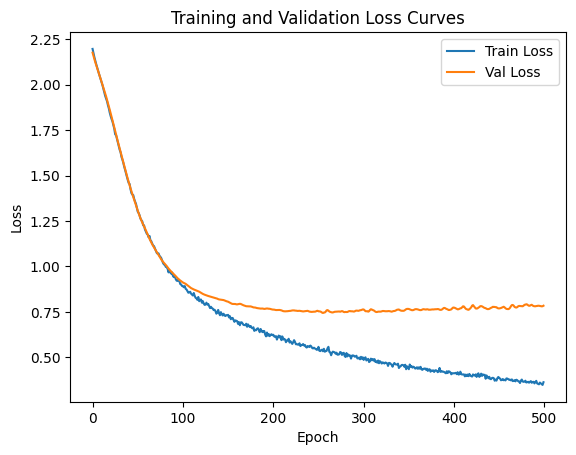

In [124]:
# Plotting the loss curves
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Curves')
plt.legend()
plt.show()

In [125]:
# Convert the domain column to a list
domains = test_df['domain'].tolist()

# Pass the test data through your trained model to get the predictions
model.eval()
with torch.no_grad():
    output_probs_test = model(data)[idx_test]  # Assuming data contains the test set features and edge indices

# Apply softmax to convert logits to probabilities and move to CPU before converting to numpy
probabilities = torch.nn.functional.softmax(output_probs_test, dim=1).cpu().numpy()

# Write predictions to a CSV file
with open('sample_submission_11.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    header = ['domain_name'] + [f'class_{i}' for i in range(probabilities.shape[1])]
    writer.writerow(header)
    for i, test_host in enumerate(domains):
        row = probabilities[i].tolist()
        row.insert(0, test_host)
        writer.writerow(row)


# GAT TORCH

Epoch:   5, Train Loss: 2.0081241, Val Loss: 1.9625192
Epoch:  10, Train Loss: 1.8691481, Val Loss: 1.8303826
Epoch:  15, Train Loss: 1.7864425, Val Loss: 1.7342695
Epoch:  20, Train Loss: 1.7236476, Val Loss: 1.6826375
Epoch:  25, Train Loss: 1.6695737, Val Loss: 1.6109973
Epoch:  30, Train Loss: 1.5791156, Val Loss: 1.5176215
Epoch:  35, Train Loss: 1.5284901, Val Loss: 1.4495077
Epoch:  40, Train Loss: 1.5046138, Val Loss: 1.4319251
Epoch:  45, Train Loss: 1.4337518, Val Loss: 1.3533508
Epoch:  50, Train Loss: 1.3690082, Val Loss: 1.2753608
Epoch:  55, Train Loss: 1.3030322, Val Loss: 1.2310767
Epoch:  60, Train Loss: 1.2267549, Val Loss: 1.1639382
Epoch:  65, Train Loss: 1.1771524, Val Loss: 1.1095337
Epoch:  70, Train Loss: 1.1570590, Val Loss: 1.0646564
Epoch:  75, Train Loss: 1.1021012, Val Loss: 1.0463591
Epoch:  80, Train Loss: 1.0891035, Val Loss: 1.0117104
Epoch:  85, Train Loss: 1.0481272, Val Loss: 0.9875172
Epoch:  90, Train Loss: 1.0107691, Val Loss: 0.9557852
Epoch:  95

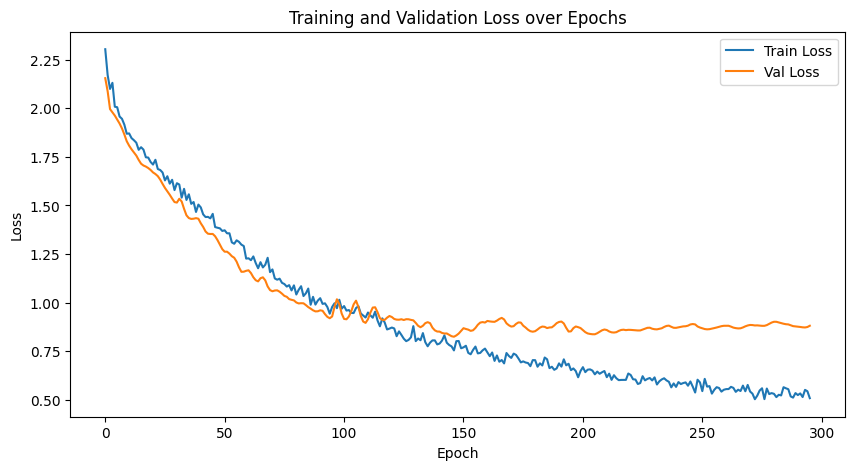

In [126]:
class GAT(nn.Module):
    def __init__(self, n_feat, hidden_dim, n_class, dropout=0.5):
        super(GAT, self).__init__()
        self.gat1 = GATConv(n_feat, hidden_dim, heads=5, dropout=dropout)
        self.gat2 = GATConv(hidden_dim * 5, hidden_dim, heads=4, dropout=dropout)
        self.fc = nn.Linear(hidden_dim * 4, n_class)
        self.dropout = nn.Dropout(dropout)
        self.relu = nn.LeakyReLU()

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        h1 = self.relu(self.gat1(x, edge_index))
        h1 = self.dropout(h1)
        h2 = self.relu(self.gat2(h1, edge_index))
        h2 = self.dropout(h2)
        out = self.fc(h2)
        return F.log_softmax(out, dim=1)

# Initialize model, optimizer, and loss function
model = GAT(n_feat=4070, hidden_dim=64, n_class=9, dropout=0.5).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=50, verbose=True)
loss_function = nn.CrossEntropyLoss()

train_losses = []
val_losses = []

epochs = 800
patience = 150  # Number of epochs with no improvement after which training will be stopped
early_stopping_counter = 0

# Train the model
best_val_loss = float('inf')
for epoch in range(1, epochs + 1):
    model.train()
    optimizer.zero_grad()
    output = model(data)
    loss = loss_function(output[idx_train], y_train)
    loss.backward()
    optimizer.step()

    model.eval()
    with torch.no_grad():
        output = model(data)
        loss_val = loss_function(output[idx_val], y_val)

    # Step the scheduler
    scheduler.step(loss_val)

    # Check early stopping condition
    if loss_val < best_val_loss:
        best_val_loss = loss_val
        early_stopping_counter = 0
        # Save the best model
        torch.save({
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict(),
        }, 'model_best.pth.tar')
    else:
        early_stopping_counter += 1

    if early_stopping_counter >= patience:
        print(f"Early stopping triggered after {epoch} epochs.")
        break

    if epoch % 5 == 0:
        print(f'Epoch: {epoch:3d}, Train Loss: {loss:.7f}, Val Loss: {loss_val:.7f}')

    # Store losses for plotting
    train_losses.append(loss.item())
    val_losses.append(loss_val.item())

# Plotting the training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss over Epochs')
plt.show()

# Make predictions
model.eval()
checkpoint = torch.load('model_best.pth.tar')
model.load_state_dict(checkpoint['state_dict'])
output = model(data)
y_pred = torch.exp(output[idx_test]).detach().cpu().numpy()

# Write predictions to a file
with open('sample_submission_atte4.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    headers = ['domain_name'] + [f'class_{i}' for i in range(n_class)]
    writer.writerow(headers)
    for i, test_host in enumerate(test_domains):
        row = [test_host] + y_pred[i].tolist()
        writer.writerow(row)


Epoch:   5, Train Loss: 1.9910003, Val Loss: 1.9379323
Epoch:  10, Train Loss: 1.8744153, Val Loss: 1.8715706
Epoch:  15, Train Loss: 1.7908651, Val Loss: 1.7537801
Epoch:  20, Train Loss: 1.7250615, Val Loss: 1.6861420
Epoch:  25, Train Loss: 1.6780814, Val Loss: 1.5933768
Epoch:  30, Train Loss: 1.5736600, Val Loss: 1.5222172
Epoch:  35, Train Loss: 1.5356550, Val Loss: 1.4352673
Epoch:  40, Train Loss: 1.4413676, Val Loss: 1.3705711
Epoch:  45, Train Loss: 1.4286962, Val Loss: 1.2727439
Epoch:  50, Train Loss: 1.3302675, Val Loss: 1.1972892
Epoch:  55, Train Loss: 1.2534494, Val Loss: 1.1411195
Epoch:  60, Train Loss: 1.2079881, Val Loss: 1.0915407
Epoch:  65, Train Loss: 1.1774188, Val Loss: 1.0779506
Epoch:  70, Train Loss: 1.1407807, Val Loss: 1.0175703
Epoch:  75, Train Loss: 1.0891370, Val Loss: 1.0113800
Epoch:  80, Train Loss: 1.0804915, Val Loss: 0.9885147
Epoch:  85, Train Loss: 1.0149434, Val Loss: 0.9423977
Epoch:  90, Train Loss: 1.0000685, Val Loss: 0.9350299
Epoch:  95

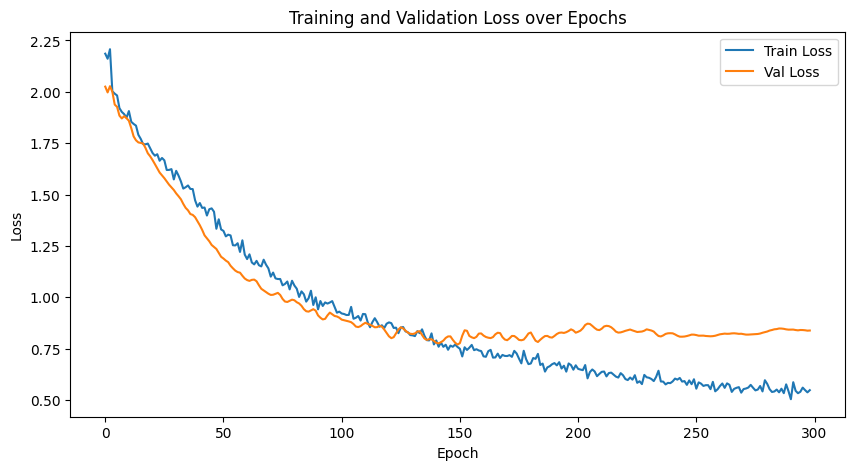

In [130]:
import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn
from torch_geometric.nn import GATConv
import csv

class GAT(nn.Module):
    def __init__(self, n_feat, hidden_dim, n_class, dropout=0.5):
        super(GAT, self).__init__()
        self.gat1 = GATConv(n_feat, hidden_dim, heads=5, dropout=dropout)
        self.gat2 = GATConv(hidden_dim * 5, hidden_dim, heads=4, dropout=dropout)
        self.fc = nn.Linear(hidden_dim * 4, n_class)
        self.dropout = nn.Dropout(dropout)
        self.relu = nn.LeakyReLU()

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        h1 = self.relu(self.gat1(x, edge_index))
        h1 = self.dropout(h1)
        h2 = self.relu(self.gat2(h1, edge_index))
        h2 = self.dropout(h2)
        out = self.fc(h2)
        return F.log_softmax(out, dim=1), h2

# Initialize model, optimizer, and loss function
model = GAT(n_feat=4070, hidden_dim=64, n_class=9, dropout=0.5).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=50, verbose=True)
loss_function = nn.CrossEntropyLoss()

train_losses = []
val_losses = []

epochs = 800
patience = 150  # Number of epochs with no improvement after which training will be stopped
early_stopping_counter = 0

# Train the model
best_val_loss = float('inf')
for epoch in range(1, epochs + 1):
    model.train()
    optimizer.zero_grad()
    output, _ = model(data)
    loss = loss_function(output[idx_train], y_train)
    loss.backward()
    optimizer.step()

    model.eval()
    with torch.no_grad():
        output, _ = model(data)
        loss_val = loss_function(output[idx_val], y_val)

    # Step the scheduler
    scheduler.step(loss_val)

    # Check early stopping condition
    if loss_val < best_val_loss:
        best_val_loss = loss_val
        early_stopping_counter = 0
        # Save the best model
        torch.save({
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict(),
        }, 'model_best.pth.tar')
    else:
        early_stopping_counter += 1

    if early_stopping_counter >= patience:
        print(f"Early stopping triggered after {epoch} epochs.")
        break

    if epoch % 5 == 0:
        print(f'Epoch: {epoch:3d}, Train Loss: {loss:.7f}, Val Loss: {loss_val:.7f}')

    # Store losses for plotting
    train_losses.append(loss.item())
    val_losses.append(loss_val.item())

# Plotting the training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss over Epochs')
plt.show()

# Extract features for XGBoost
model.eval()
checkpoint = torch.load('model_best.pth.tar')
model.load_state_dict(checkpoint['state_dict'])
_, features = model(data)




In [131]:
# Convert features to numpy array
train_features = features[idx_train].detach().cpu().numpy()
val_features = features[idx_val].detach().cpu().numpy()
test_features = features[idx_test].detach().cpu().numpy()

y_train = y_train.cpu().numpy()
y_val = y_val.cpu().numpy()

In [132]:
import xgboost as xgb
from sklearn.metrics import accuracy_score

# Create the XGBoost classifier
xgb_model = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1)

# Train the model
xgb_model.fit(train_features, y_train, eval_set=[(val_features, y_val)], early_stopping_rounds=10, verbose=True)

# Make predictions
y_pred = xgb_model.predict_proba(test_features)

# Write predictions to a file
with open('sample_submission_xgb.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    headers = ['domain_name'] + [f'class_{i}' for i in range(9)]
    writer.writerow(headers)
    for i, test_host in enumerate(test_domains):
        row = [test_host] + y_pred[i].tolist()
        writer.writerow(row)

[0]	validation_0-mlogloss:1.93055
[1]	validation_0-mlogloss:1.75387
[2]	validation_0-mlogloss:1.60926
[3]	validation_0-mlogloss:1.49485
[4]	validation_0-mlogloss:1.39705
[5]	validation_0-mlogloss:1.31673
[6]	validation_0-mlogloss:1.24810
[7]	validation_0-mlogloss:1.19001
[8]	validation_0-mlogloss:1.13876
[9]	validation_0-mlogloss:1.09100
[10]	validation_0-mlogloss:1.04833
[11]	validation_0-mlogloss:1.01056
[12]	validation_0-mlogloss:0.97493
[13]	validation_0-mlogloss:0.94527
[14]	validation_0-mlogloss:0.91978
[15]	validation_0-mlogloss:0.89491
[16]	validation_0-mlogloss:0.87527
[17]	validation_0-mlogloss:0.85639
[18]	validation_0-mlogloss:0.84248
[19]	validation_0-mlogloss:0.82558
[20]	validation_0-mlogloss:0.81387
[21]	validation_0-mlogloss:0.80213
[22]	validation_0-mlogloss:0.78967
[23]	validation_0-mlogloss:0.77948
[24]	validation_0-mlogloss:0.77099
[25]	validation_0-mlogloss:0.76593
[26]	validation_0-mlogloss:0.75880
[27]	validation_0-mlogloss:0.75237
[28]	validation_0-mlogloss:0.7

In [133]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [4, 6, 8],
    'min_child_weight': [1, 5, 10],
    'subsample': [ 0.9, 1.0],
#     'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2],
#     'reg_alpha': [0, 0.01, 0.1],
#     'reg_lambda': [1, 1.5, 2]
}

# Create the base model
xgb_model = xgb.XGBClassifier(objective='multi:softprob', num_class=9, use_label_encoder=False, eval_metric='mlogloss')

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(train_features, y_train, eval_set=[(val_features, y_val)], early_stopping_rounds=10, verbose=True)

# Get the best parameters from the grid search
best_params = grid_search.best_params_

# Train the model with the best parameters
xgb_model = xgb.XGBClassifier(**best_params, objective='multi:softprob', num_class=9, use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(train_features, y_train, eval_set=[(val_features, y_val)], early_stopping_rounds=10, verbose=True)

# Make predictions
y_pred = xgb_model.predict_proba(test_features)

# Write predictions to a file
with open('sample_submission_xgb1.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    headers = ['domain_name'] + [f'class_{i}' for i in range(9)]
    writer.writerow(headers)
    for i, test_host in enumerate(test_domains):
        row = [test_host] + y_pred[i].tolist()
        writer.writerow(row)


Fitting 3 folds for each of 19683 candidates, totalling 59049 fits


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`se

[0]	validation_0-mlogloss:2.17215
[0]	validation_0-mlogloss:2.17178
[0]	validation_0-mlogloss:2.17251
[1]	validation_0-mlogloss:2.14834
[1]	validation_0-mlogloss:2.14786
[0]	validation_0-mlogloss:2.17158
[1]	validation_0-mlogloss:2.14876
[2]	validation_0-mlogloss:2.12455
[2]	validation_0-mlogloss:2.12431
[1]	validation_0-mlogloss:2.14688
[2]	validation_0-mlogloss:2.12673
[3]	validation_0-mlogloss:2.10145
[3]	validation_0-mlogloss:2.10135
[2]	validation_0-mlogloss:2.12230
[3]	validation_0-mlogloss:2.10246
[4]	validation_0-mlogloss:2.07833
[4]	validation_0-mlogloss:2.07947
[3]	validation_0-mlogloss:2.09894
[4]	validation_0-mlogloss:2.08050
[5]	validation_0-mlogloss:2.05674
[5]	validation_0-mlogloss:2.05690
[4]	validation_0-mlogloss:2.07689
[5]	validation_0-mlogloss:2.05806
[6]	validation_0-mlogloss:2.03773
[6]	validation_0-mlogloss:2.03562
[6]	validation_0-mlogloss:2.03725
[5]	validation_0-mlogloss:2.05548
[7]	validation_0-mlogloss:2.01736
[7]	validation_0-mlogloss:2.01510
[7]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[96]	validation_0-mlogloss:1.14691
[98]	validation_0-mlogloss:1.14153
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  21.6s
[0]	validation_0-mlogloss:2.17155
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  21.6s
[0]	validation_0-mlogloss:2.17235
[99]	validation_0-mlogloss:1.13682
[97]	validation_0-mlogloss:1.14237
[1]	validation_0-mlogloss:2.14695
[1]	validation_0-mlogloss:2.14803


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.13736
[2]	validation_0-mlogloss:2.12228
[2]	validation_0-mlogloss:2.12243
[99]	validation_0-mlogloss:1.13262
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  22.2s
[0]	validation_0-mlogloss:2.17032
[3]	validation_0-mlogloss:2.09848
[3]	validation_0-mlogloss:2.09851


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.14410
[4]	validation_0-mlogloss:2.07573
[4]	validation_0-mlogloss:2.07749
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  22.4s
[0]	validation_0-mlogloss:2.17063
[2]	validation_0-mlogloss:2.11948
[5]	validation_0-mlogloss:2.05392
[5]	validation_0-mlogloss:2.05495
[1]	validation_0-mlogloss:2.14543
[3]	validation_0-mlogloss:2.09562
[6]	validation_0-mlogloss:2.03332
[6]	validation_0-mlogloss:2.03376
[2]	validation_0-mlogloss:2.12047
[7]	validation_0-mlogloss:2.01264
[4]	validation_0-mlogloss:2.07217
[7]	validation_0-mlogloss:2.01301
[3]	validation_0-mlogloss:2.09648
[8]	validation_0-mlogloss:1.99214
[5]	validation_0-mlogloss:2.04890
[8]	validation_0-mlogloss:1.99292
[4]	validation_0-mlogloss:2.07407
[9]	validation_0-mlogloss:1.97361
[6]	validation_0-mlogloss:2.02724
[9]	validation_0-mlogloss:1.97319
[5]	validation_0-mlogloss:2.05174
[10]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.13448
[91]	validation_0-mlogloss:1.17733
[92]	validation_0-mlogloss:1.15120
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  21.3s
[0]	validation_0-mlogloss:2.17186
[92]	validation_0-mlogloss:1.17243
[93]	validation_0-mlogloss:1.14599
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  21.5s
[0]	validation_0-mlogloss:2.17220
[1]	validation_0-mlogloss:2.14696
[93]	validation_0-mlogloss:1.16718
[1]	validation_0-mlogloss:2.14935
[94]	validation_0-mlogloss:1.14123
[2]	validation_0-mlogloss:2.12149
[94]	validation_0-mlogloss:1.16235
[2]	validation_0-mlogloss:2.12624
[95]	validation_0-mlogloss:1.13627
[3]	validation_0-mlogloss:2.09718
[95]	validation_0-mlogloss:1.15749
[3]	validation_0-mlogloss:2.10346
[96]	validation_0-mlogloss:1.13112

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.13815
[7]	validation_0-mlogloss:2.01929
[8]	validation_0-mlogloss:1.99136
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  22.7s
[0]	validation_0-mlogloss:2.17244
[8]	validation_0-mlogloss:1.99897
[9]	validation_0-mlogloss:1.97109
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  22.3s
[0]	validation_0-mlogloss:2.17346
[1]	validation_0-mlogloss:2.14938
[9]	validation_0-mlogloss:1.97973
[10]	validation_0-mlogloss:1.95239
[1]	validation_0-mlogloss:2.15048
[2]	validation_0-mlogloss:2.12610
[10]	validation_0-mlogloss:1.96159
[2]	validation_0-mlogloss:2.12864
[11]	validation_0-mlogloss:1.93418
[3]	validation_0-mlogloss:2.10414
[11]	validation_0-mlogloss:1.94319
[3]	validation_0-mlogloss:2.10463
[12]	validation_0-mlogloss:1.91608
[4]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-mlogloss:1.15201
[99]	validation_0-mlogloss:1.14886
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  22.1s
[0]	validation_0-mlogloss:2.17200
[96]	validation_0-mlogloss:1.16498


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.14742
[97]	validation_0-mlogloss:1.16026
[1]	validation_0-mlogloss:2.14807
[99]	validation_0-mlogloss:1.14241
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  22.5s
[0]	validation_0-mlogloss:2.17212
[98]	validation_0-mlogloss:1.15588
[2]	validation_0-mlogloss:2.12435


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.14847
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  21.0s
[0]	validation_0-mlogloss:2.17287
[99]	validation_0-mlogloss:1.15130
[3]	validation_0-mlogloss:2.10167


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.12504
[1]	validation_0-mlogloss:2.14915
[4]	validation_0-mlogloss:2.08023
[3]	validation_0-mlogloss:2.10160
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  21.2s
[0]	validation_0-mlogloss:2.17123
[2]	validation_0-mlogloss:2.12429
[5]	validation_0-mlogloss:2.05955
[4]	validation_0-mlogloss:2.07941
[3]	validation_0-mlogloss:2.10149
[1]	validation_0-mlogloss:2.14561
[6]	validation_0-mlogloss:2.03888
[5]	validation_0-mlogloss:2.05837
[4]	validation_0-mlogloss:2.08095
[2]	validation_0-mlogloss:2.12113
[7]	validation_0-mlogloss:2.01875
[6]	validation_0-mlogloss:2.03823
[5]	validation_0-mlogloss:2.05819
[3]	validation_0-mlogloss:2.09749
[7]	validation_0-mlogloss:2.01813
[8]	validation_0-mlogloss:1.99865
[6]	validation_0-mlogloss:2.03702
[4]	validation_0-mlogloss:2.07406
[8]	validation_0-mlogloss:1.99777
[9]	validation_0-mlogloss:1.97933
[7]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-mlogloss:1.15103
[97]	validation_0-mlogloss:1.15136
[90]	validation_0-mlogloss:1.16795
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  21.4s
[0]	validation_0-mlogloss:2.17164
[98]	validation_0-mlogloss:1.14664
[98]	validation_0-mlogloss:1.14622
[91]	validation_0-mlogloss:1.16276
[1]	validation_0-mlogloss:2.14718
[99]	validation_0-mlogloss:1.14182
[99]	validation_0-mlogloss:1.14154
[92]	validation_0-mlogloss:1.15767
[2]	validation_0-mlogloss:2.12342


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  22.3s
[0]	validation_0-mlogloss:2.17276
[3]	validation_0-mlogloss:2.10021
[93]	validation_0-mlogloss:1.15227
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  22.7s
[0]	validation_0-mlogloss:2.17278
[1]	validation_0-mlogloss:2.14867
[4]	validation_0-mlogloss:2.07817
[94]	validation_0-mlogloss:1.14755
[1]	validation_0-mlogloss:2.15020
[2]	validation_0-mlogloss:2.12396
[5]	validation_0-mlogloss:2.05627
[95]	validation_0-mlogloss:1.14246
[2]	validation_0-mlogloss:2.12769
[3]	validation_0-mlogloss:2.10050
[6]	validation_0-mlogloss:2.03562
[3]	validation_0-mlogloss:2.10537
[96]	validation_0-mlogloss:1.13724
[4]	validation_0-mlogloss:2.07976
[7]	validation_0-mlogloss:2.01520
[4]	validation_0-mlogloss:2.08443
[9

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.01758
[10]	validation_0-mlogloss:1.95810
[7]	validation_0-mlogloss:2.02313
[11]	validation_0-mlogloss:1.94007
[8]	validation_0-mlogloss:1.99744
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  23.4s
[0]	validation_0-mlogloss:2.17307
[8]	validation_0-mlogloss:2.00340
[12]	validation_0-mlogloss:1.92295
[9]	validation_0-mlogloss:1.97731
[1]	validation_0-mlogloss:2.15003
[9]	validation_0-mlogloss:1.98441
[13]	validation_0-mlogloss:1.90611
[10]	validation_0-mlogloss:1.95845
[2]	validation_0-mlogloss:2.12736
[10]	validation_0-mlogloss:1.96656
[3]	validation_0-mlogloss:2.10643
[14]	validation_0-mlogloss:1.88929
[11]	validation_0-mlogloss:1.94067
[11]	validation_0-mlogloss:1.94842
[4]	validation_0-mlogloss:2.08523
[15]	validation_0-mlogloss:1.87191
[12]	validation_0-mlogloss:1.92248
[12]	validation_0-mlogloss:1.93147
[5]	validation_0-mlogloss:2.0640

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.16115
[95]	validation_0-mlogloss:1.17237
[99]	validation_0-mlogloss:1.14716
[99]	validation_0-mlogloss:1.15664
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  21.3s
[0]	validation_0-mlogloss:2.17406
[96]	validation_0-mlogloss:1.16771


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.15165
[97]	validation_0-mlogloss:1.16234
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  22.3s
[0]	validation_0-mlogloss:2.17266
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  21.7s
[0]	validation_0-mlogloss:2.17274
[2]	validation_0-mlogloss:2.13066
[98]	validation_0-mlogloss:1.15792
[1]	validation_0-mlogloss:2.14949
[1]	validation_0-mlogloss:2.14904
[3]	validation_0-mlogloss:2.10762
[99]	validation_0-mlogloss:1.15320
[2]	validation_0-mlogloss:2.12585
[2]	validation_0-mlogloss:2.12634
[4]	validation_0-mlogloss:2.08684


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.10281
[3]	validation_0-mlogloss:2.10427
[5]	validation_0-mlogloss:2.06643
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  20.7s
[0]	validation_0-mlogloss:2.17326
[4]	validation_0-mlogloss:2.08129
[4]	validation_0-mlogloss:2.08324
[6]	validation_0-mlogloss:2.04653
[1]	validation_0-mlogloss:2.15003
[5]	validation_0-mlogloss:2.06059
[5]	validation_0-mlogloss:2.06300
[7]	validation_0-mlogloss:2.02552
[2]	validation_0-mlogloss:2.12579
[6]	validation_0-mlogloss:2.04091
[8]	validation_0-mlogloss:2.00683
[6]	validation_0-mlogloss:2.04273
[3]	validation_0-mlogloss:2.10352
[7]	validation_0-mlogloss:2.02118
[9]	validation_0-mlogloss:1.98687
[7]	validation_0-mlogloss:2.02272
[4]	validation_0-mlogloss:2.08355
[8]	validation_0-mlogloss:2.00187
[10]	validation_0-mlogloss:1.96779
[8]	validation_0-mlogloss:2.00298
[5]	validation_0-mlogloss:2.06151
[9]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[91]	validation_0-mlogloss:1.18806
[91]	validation_0-mlogloss:1.18850
[92]	validation_0-mlogloss:1.18787
[92]	validation_0-mlogloss:1.18298
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  20.7s
[0]	validation_0-mlogloss:2.17220
[92]	validation_0-mlogloss:1.18350
[93]	validation_0-mlogloss:1.18285
[93]	validation_0-mlogloss:1.17786
[1]	validation_0-mlogloss:2.14705
[93]	validation_0-mlogloss:1.17827
[94]	validation_0-mlogloss:1.17828
[94]	validation_0-mlogloss:1.17328
[2]	validation_0-mlogloss:2.12316
[94]	validation_0-mlogloss:1.17336
[95]	validation_0-mlogloss:1.17344
[95]	validation_0-mlogloss:1.16824
[3]	validation_0-mlogloss:2.09984
[95]	validation_0-mlogloss:1.16842
[96]	validation_0-mlogloss:1.16924
[96]	validation_0-mlogloss:1.16397
[4]	validation_0-mlogloss:2.07711
[96]	validation_0-mlogloss:1.16324
[97]	validation_0-mlogloss:1.16473
[97]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.01320
[99]	validation_0-mlogloss:1.14882
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  21.4s
[0]	validation_0-mlogloss:2.17223
[8]	validation_0-mlogloss:1.99293
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  22.2s
[0]	validation_0-mlogloss:2.17287
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  22.4s
[0]	validation_0-mlogloss:2.17216
[1]	validation_0-mlogloss:2.14837
[9]	validation_0-mlogloss:1.97373
[1]	validation_0-mlogloss:2.14891
[1]	validation_0-mlogloss:2.14836
[2]	validation_0-mlogloss:2.12499
[10]	validation_0-mlogloss:1.95536
[2]	validation_0-mlogloss:2.12500
[2]	validation_0-mlogloss:2.12457
[3]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.18995
[95]	validation_0-mlogloss:1.15774
[94]	validation_0-mlogloss:1.18485
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  22.9s
[0]	validation_0-mlogloss:2.17179
[93]	validation_0-mlogloss:1.18473
[96]	validation_0-mlogloss:1.15262
[95]	validation_0-mlogloss:1.17969
[1]	validation_0-mlogloss:2.14787
[94]	validation_0-mlogloss:1.17991
[97]	validation_0-mlogloss:1.14773
[96]	validation_0-mlogloss:1.17505
[2]	validation_0-mlogloss:2.12433
[98]	validation_0-mlogloss:1.14284
[95]	validation_0-mlogloss:1.17494
[97]	validation_0-mlogloss:1.17007
[3]	validation_0-mlogloss:2.10148
[99]	validation_0-mlogloss:1.13814
[96]	validation_0-mlogloss:1.17023
[98]	validation_0-mlogloss:1.16549
[4]	validation_0-mlogloss:2.07836


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-mlogloss:1.16537
[99]	validation_0-mlogloss:1.16085
[5]	validation_0-mlogloss:2.05677
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  22.0s
[0]	validation_0-mlogloss:2.17251


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.16084
[6]	validation_0-mlogloss:2.03777
[1]	validation_0-mlogloss:2.14878
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  22.4s
[0]	validation_0-mlogloss:2.17159
[99]	validation_0-mlogloss:1.15598
[7]	validation_0-mlogloss:2.01715
[2]	validation_0-mlogloss:2.12676
[1]	validation_0-mlogloss:2.14689


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:1.99622
[3]	validation_0-mlogloss:2.10250
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  22.9s
[0]	validation_0-mlogloss:2.17155
[2]	validation_0-mlogloss:2.12232
[9]	validation_0-mlogloss:1.97796
[4]	validation_0-mlogloss:2.08055
[1]	validation_0-mlogloss:2.14696
[3]	validation_0-mlogloss:2.09897
[10]	validation_0-mlogloss:1.95847
[5]	validation_0-mlogloss:2.05811
[2]	validation_0-mlogloss:2.12243
[4]	validation_0-mlogloss:2.07692
[11]	validation_0-mlogloss:1.94022
[6]	validation_0-mlogloss:2.03730
[3]	validation_0-mlogloss:2.09864
[5]	validation_0-mlogloss:2.05552
[12]	validation_0-mlogloss:1.92322
[7]	validation_0-mlogloss:2.01629
[4]	validation_0-mlogloss:2.07589
[6]	validation_0-mlogloss:2.03462
[13]	validation_0-mlogloss:1.90665
[8]	validation_0-mlogloss:1.99624
[5]	validation_0-mlogloss:2.05406
[7]	validation_0-mlogloss:2.01473
[14]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-mlogloss:1.18201
[89]	validation_0-mlogloss:1.18224
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  21.0s
[0]	validation_0-mlogloss:2.17235
[95]	validation_0-mlogloss:1.16022
[90]	validation_0-mlogloss:1.17666
[90]	validation_0-mlogloss:1.17694
[1]	validation_0-mlogloss:2.14804
[96]	validation_0-mlogloss:1.15609
[91]	validation_0-mlogloss:1.17123
[91]	validation_0-mlogloss:1.17193
[2]	validation_0-mlogloss:2.12245
[97]	validation_0-mlogloss:1.15139
[92]	validation_0-mlogloss:1.16641
[92]	validation_0-mlogloss:1.16693
[3]	validation_0-mlogloss:2.09853
[98]	validation_0-mlogloss:1.14687
[93]	validation_0-mlogloss:1.16119
[93]	validation_0-mlogloss:1.16186
[4]	validation_0-mlogloss:2.07752
[99]	validation_0-mlogloss:1.14220


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.15675
[94]	validation_0-mlogloss:1.15701
[5]	validation_0-mlogloss:2.05498
[95]	validation_0-mlogloss:1.15167
[95]	validation_0-mlogloss:1.15209
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  21.2s
[0]	validation_0-mlogloss:2.17032
[6]	validation_0-mlogloss:2.03379
[96]	validation_0-mlogloss:1.14767
[96]	validation_0-mlogloss:1.14693
[1]	validation_0-mlogloss:2.14411
[7]	validation_0-mlogloss:2.01305
[97]	validation_0-mlogloss:1.14294
[97]	validation_0-mlogloss:1.14242
[2]	validation_0-mlogloss:2.11950
[8]	validation_0-mlogloss:1.99285
[98]	validation_0-mlogloss:1.13855
[98]	validation_0-mlogloss:1.13736
[3]	validation_0-mlogloss:2.09564
[9]	validation_0-mlogloss:1.97314
[99]	validation_0-mlogloss:1.13385
[99]	validation_0-mlogloss:1.13260
[10]	validation_0-mlogloss:1.95312
[4]	validation_0-mlogloss:2.07220


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.93413
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  21.6s
[0]	validation_0-mlogloss:2.17064
[5]	validation_0-mlogloss:2.04894
[12]	validation_0-mlogloss:1.91652
[1]	validation_0-mlogloss:2.14544
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  22.2s
[0]	validation_0-mlogloss:2.17187
[6]	validation_0-mlogloss:2.02732
[2]	validation_0-mlogloss:2.12049
[13]	validation_0-mlogloss:1.89850
[7]	validation_0-mlogloss:2.00648
[1]	validation_0-mlogloss:2.14697
[14]	validation_0-mlogloss:1.88223
[3]	validation_0-mlogloss:2.09651
[15]	validation_0-mlogloss:1.86599
[8]	validation_0-mlogloss:1.98538
[2]	validation_0-mlogloss:2.12151
[4]	validation_0-mlogloss:2.07411
[16]	validation_0-mlogloss:1.84963
[3]	validation_0-mlogloss:2.0972

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.22821
[84]	validation_0-mlogloss:1.21562
[88]	validation_0-mlogloss:1.17276
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  21.7s
[0]	validation_0-mlogloss:2.17221
[84]	validation_0-mlogloss:1.22286
[85]	validation_0-mlogloss:1.20982
[1]	validation_0-mlogloss:2.14936
[89]	validation_0-mlogloss:1.16739
[85]	validation_0-mlogloss:1.21746
[86]	validation_0-mlogloss:1.20418
[2]	validation_0-mlogloss:2.12626
[90]	validation_0-mlogloss:1.16222
[86]	validation_0-mlogloss:1.21184
[87]	validation_0-mlogloss:1.19891
[3]	validation_0-mlogloss:2.10349
[91]	validation_0-mlogloss:1.15714
[87]	validation_0-mlogloss:1.20673
[88]	validation_0-mlogloss:1.19361
[4]	validation_0-mlogloss:2.08203
[92]	validation_0-mlogloss:1.15202
[88]	validation_0-mlogloss:1.20130
[89]	validation_0-mlogloss:1.18850
[5]	validation_0-mlogloss:2.06038
[93]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.90896
[96]	validation_0-mlogloss:1.16264
[97]	validation_0-mlogloss:1.14850
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  23.3s
[0]	validation_0-mlogloss:2.17244
[14]	validation_0-mlogloss:1.89170
[97]	validation_0-mlogloss:1.15791
[98]	validation_0-mlogloss:1.14387
[1]	validation_0-mlogloss:2.14939
[15]	validation_0-mlogloss:1.87625
[98]	validation_0-mlogloss:1.15347
[99]	validation_0-mlogloss:1.13879
[2]	validation_0-mlogloss:2.12611


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:1.86041
[99]	validation_0-mlogloss:1.14902
[3]	validation_0-mlogloss:2.10417
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  22.9s
[0]	validation_0-mlogloss:2.17346


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:1.84426
[4]	validation_0-mlogloss:2.08167
[1]	validation_0-mlogloss:2.15049
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  23.0s
[0]	validation_0-mlogloss:2.17201
[18]	validation_0-mlogloss:1.82847
[5]	validation_0-mlogloss:2.05993
[2]	validation_0-mlogloss:2.12865
[1]	validation_0-mlogloss:2.14808
[19]	validation_0-mlogloss:1.81347
[6]	validation_0-mlogloss:2.04083
[3]	validation_0-mlogloss:2.10465
[2]	validation_0-mlogloss:2.12437
[7]	validation_0-mlogloss:2.02105
[20]	validation_0-mlogloss:1.79844
[4]	validation_0-mlogloss:2.08335
[8]	validation_0-mlogloss:2.00047
[3]	validation_0-mlogloss:2.10169
[21]	validation_0-mlogloss:1.78428
[5]	validation_0-mlogloss:2.06174
[9]	validation_0-mlogloss:1.98298
[22]	validation_0-mlogloss:1.77005
[4]	validation_0-mlogloss:2.08025
[6]	validation_0-mlogloss:2.04149
[10]	validation_0-mlogloss:1.96394
[2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:1.24192
[88]	validation_0-mlogloss:1.20311
[90]	validation_0-mlogloss:1.18783
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  22.1s
[0]	validation_0-mlogloss:2.17225
[81]	validation_0-mlogloss:1.23552
[89]	validation_0-mlogloss:1.19786
[91]	validation_0-mlogloss:1.18269
[1]	validation_0-mlogloss:2.14860
[82]	validation_0-mlogloss:1.22984
[90]	validation_0-mlogloss:1.19299
[92]	validation_0-mlogloss:1.17790
[2]	validation_0-mlogloss:2.12517
[83]	validation_0-mlogloss:1.22390
[91]	validation_0-mlogloss:1.18806
[93]	validation_0-mlogloss:1.17250
[3]	validation_0-mlogloss:2.10175
[84]	validation_0-mlogloss:1.21814
[92]	validation_0-mlogloss:1.18286
[94]	validation_0-mlogloss:1.16803
[4]	validation_0-mlogloss:2.07956
[85]	validation_0-mlogloss:1.21297
[93]	validation_0-mlogloss:1.17764
[95]	validation_0-mlogloss:1.16279
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:1.96067
[99]	validation_0-mlogloss:1.15091
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  21.4s
[0]	validation_0-mlogloss:2.17287
[91]	validation_0-mlogloss:1.18158


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94327
[1]	validation_0-mlogloss:2.14916
[92]	validation_0-mlogloss:1.17657
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  21.0s
[0]	validation_0-mlogloss:2.17123
[12]	validation_0-mlogloss:1.92549
[2]	validation_0-mlogloss:2.12431
[93]	validation_0-mlogloss:1.17138
[1]	validation_0-mlogloss:2.14562
[13]	validation_0-mlogloss:1.90853
[3]	validation_0-mlogloss:2.10151
[94]	validation_0-mlogloss:1.16651
[2]	validation_0-mlogloss:2.12114
[14]	validation_0-mlogloss:1.89141
[4]	validation_0-mlogloss:2.08098
[95]	validation_0-mlogloss:1.16152
[3]	validation_0-mlogloss:2.09751
[15]	validation_0-mlogloss:1.87483
[5]	validation_0-mlogloss:2.05822
[96]	validation_0-mlogloss:1.15638
[4]	validation_0-mlogloss:2.07408
[16]	validation_0-mlogloss:1.85871
[6]	validation_0-mlogloss:2.03706
[97]	validation_0-mlogloss:1.15180
[17]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:1.81055
[7]	validation_0-mlogloss:2.00960
[9]	validation_0-mlogloss:1.97747
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  22.5s
[0]	validation_0-mlogloss:2.17164
[20]	validation_0-mlogloss:1.79512
[10]	validation_0-mlogloss:1.95803
[8]	validation_0-mlogloss:1.98951
[1]	validation_0-mlogloss:2.14719
[11]	validation_0-mlogloss:1.93928
[21]	validation_0-mlogloss:1.78070
[9]	validation_0-mlogloss:1.96996
[2]	validation_0-mlogloss:2.12344
[12]	validation_0-mlogloss:1.92199
[22]	validation_0-mlogloss:1.76666
[10]	validation_0-mlogloss:1.95109
[3]	validation_0-mlogloss:2.10023
[23]	validation_0-mlogloss:1.75281
[13]	validation_0-mlogloss:1.90433
[11]	validation_0-mlogloss:1.93280
[4]	validation_0-mlogloss:2.07819
[24]	validation_0-mlogloss:1.73919
[14]	validation_0-mlogloss:1.88805
[12]	validation_0-mlogloss:1.91450
[5]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.17942
[85]	validation_0-mlogloss:1.19560
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  21.8s
[0]	validation_0-mlogloss:2.17276
[79]	validation_0-mlogloss:1.25202
[93]	validation_0-mlogloss:1.17445
[1]	validation_0-mlogloss:2.14867
[86]	validation_0-mlogloss:1.18999
[80]	validation_0-mlogloss:1.24653
[94]	validation_0-mlogloss:1.17002
[2]	validation_0-mlogloss:2.12397
[87]	validation_0-mlogloss:1.18434
[81]	validation_0-mlogloss:1.24060
[3]	validation_0-mlogloss:2.10052
[95]	validation_0-mlogloss:1.16507
[88]	validation_0-mlogloss:1.17899
[82]	validation_0-mlogloss:1.23495
[96]	validation_0-mlogloss:1.16094
[4]	validation_0-mlogloss:2.07978
[83]	validation_0-mlogloss:1.22945
[89]	validation_0-mlogloss:1.17358
[97]	validation_0-mlogloss:1.15649
[84]	validation_0-mlogloss:1.22390
[5]	validation_0-mlogloss:2.05851
[98]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.01783
[91]	validation_0-mlogloss:1.16299
[86]	validation_0-mlogloss:1.21258
[8]	validation_0-mlogloss:1.99757
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  21.6s
[0]	validation_0-mlogloss:2.17279
[92]	validation_0-mlogloss:1.15789
[9]	validation_0-mlogloss:1.97735
[87]	validation_0-mlogloss:1.20736
[1]	validation_0-mlogloss:2.15021
[93]	validation_0-mlogloss:1.15256
[10]	validation_0-mlogloss:1.95851
[88]	validation_0-mlogloss:1.20186
[2]	validation_0-mlogloss:2.12771
[94]	validation_0-mlogloss:1.14778
[11]	validation_0-mlogloss:1.94069
[89]	validation_0-mlogloss:1.19664
[3]	validation_0-mlogloss:2.10539
[95]	validation_0-mlogloss:1.14266
[12]	validation_0-mlogloss:1.92268
[90]	validation_0-mlogloss:1.19116
[4]	validation_0-mlogloss:2.08445
[96]	validation_0-mlogloss:1.13742
[13]	validation_0-mlogloss:1.90454
[91]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:1.84022
[95]	validation_0-mlogloss:1.16579
[9]	validation_0-mlogloss:1.98445
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  23.4s
[0]	validation_0-mlogloss:2.17307
[18]	validation_0-mlogloss:1.82512
[10]	validation_0-mlogloss:1.96661
[96]	validation_0-mlogloss:1.16096
[1]	validation_0-mlogloss:2.15003
[19]	validation_0-mlogloss:1.81038
[11]	validation_0-mlogloss:1.94848
[97]	validation_0-mlogloss:1.15594
[2]	validation_0-mlogloss:2.12735
[20]	validation_0-mlogloss:1.79582
[12]	validation_0-mlogloss:1.93153
[98]	validation_0-mlogloss:1.15149
[3]	validation_0-mlogloss:2.10643
[21]	validation_0-mlogloss:1.78142
[13]	validation_0-mlogloss:1.91450
[99]	validation_0-mlogloss:1.14663
[4]	validation_0-mlogloss:2.08524


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.76767
[14]	validation_0-mlogloss:1.89785
[5]	validation_0-mlogloss:2.06410
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  22.9s
[0]	validation_0-mlogloss:2.17407
[15]	validation_0-mlogloss:1.88261
[23]	validation_0-mlogloss:1.75277
[6]	validation_0-mlogloss:2.04574
[1]	validation_0-mlogloss:2.15166
[16]	validation_0-mlogloss:1.86689
[7]	validation_0-mlogloss:2.02642
[24]	validation_0-mlogloss:1.73960
[2]	validation_0-mlogloss:2.13068
[8]	validation_0-mlogloss:2.00615
[17]	validation_0-mlogloss:1.85088
[25]	validation_0-mlogloss:1.72573
[3]	validation_0-mlogloss:2.10764
[9]	validation_0-mlogloss:1.98929
[18]	validation_0-mlogloss:1.83479
[26]	validation_0-mlogloss:1.71321
[4]	validation_0-mlogloss:2.08687
[10]	validation_0-mlogloss:1.97082
[19]	validation_0-mlogloss:1.82009
[27]	validation_0-mlogloss:1.69969
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.23704
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  22.4s
[0]	validation_0-mlogloss:2.17267
[89]	validation_0-mlogloss:1.20189
[96]	validation_0-mlogloss:1.16640
[84]	validation_0-mlogloss:1.23160
[1]	validation_0-mlogloss:2.14950
[97]	validation_0-mlogloss:1.16141
[90]	validation_0-mlogloss:1.19690
[85]	validation_0-mlogloss:1.22591
[2]	validation_0-mlogloss:2.12640
[91]	validation_0-mlogloss:1.19177
[98]	validation_0-mlogloss:1.15646
[86]	validation_0-mlogloss:1.22094
[3]	validation_0-mlogloss:2.10433
[92]	validation_0-mlogloss:1.18716
[99]	validation_0-mlogloss:1.15176
[87]	validation_0-mlogloss:1.21569


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.18178
[4]	validation_0-mlogloss:2.08330
[88]	validation_0-mlogloss:1.21014
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  21.5s
[0]	validation_0-mlogloss:2.17274
[94]	validation_0-mlogloss:1.17732
[5]	validation_0-mlogloss:2.06303
[89]	validation_0-mlogloss:1.20484
[1]	validation_0-mlogloss:2.14905
[95]	validation_0-mlogloss:1.17223
[6]	validation_0-mlogloss:2.04277
[90]	validation_0-mlogloss:1.19995
[2]	validation_0-mlogloss:2.12588
[96]	validation_0-mlogloss:1.16757
[7]	validation_0-mlogloss:2.02276
[91]	validation_0-mlogloss:1.19490
[3]	validation_0-mlogloss:2.10285
[97]	validation_0-mlogloss:1.16221
[8]	validation_0-mlogloss:2.00298
[92]	validation_0-mlogloss:1.18963
[4]	validation_0-mlogloss:2.08133
[98]	validation_0-mlogloss:1.15778
[9]	validation_0-mlogloss:1.98365
[93]	validation_0-mlogloss:1.18441
[99]	validation_0-mlogloss:1.15

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.18012
[10]	validation_0-mlogloss:1.96546
[6]	validation_0-mlogloss:2.04095
[95]	validation_0-mlogloss:1.17555
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  20.7s
[0]	validation_0-mlogloss:2.17327
[11]	validation_0-mlogloss:1.94678
[7]	validation_0-mlogloss:2.02122
[96]	validation_0-mlogloss:1.17126
[1]	validation_0-mlogloss:2.15008
[12]	validation_0-mlogloss:1.92964
[8]	validation_0-mlogloss:2.00192
[97]	validation_0-mlogloss:1.16649
[2]	validation_0-mlogloss:2.12584
[13]	validation_0-mlogloss:1.91242
[9]	validation_0-mlogloss:1.98396
[98]	validation_0-mlogloss:1.16209
[3]	validation_0-mlogloss:2.10357
[14]	validation_0-mlogloss:1.89585
[10]	validation_0-mlogloss:1.96504
[99]	validation_0-mlogloss:1.15752
[4]	validation_0-mlogloss:2.08360
[15]	validation_0-mlogloss:1.87954
[11]	validation_0-mlogloss:1.94802


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:2.06157
[16]	validation_0-mlogloss:1.86393
[12]	validation_0-mlogloss:1.93094
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  20.7s
[0]	validation_0-mlogloss:2.17221
[6]	validation_0-mlogloss:2.04115
[13]	validation_0-mlogloss:1.91422
[17]	validation_0-mlogloss:1.84802
[1]	validation_0-mlogloss:2.14689
[7]	validation_0-mlogloss:2.02157
[14]	validation_0-mlogloss:1.89725
[18]	validation_0-mlogloss:1.83247
[2]	validation_0-mlogloss:2.12277
[8]	validation_0-mlogloss:2.00136
[15]	validation_0-mlogloss:1.88074
[3]	validation_0-mlogloss:2.09984
[19]	validation_0-mlogloss:1.81638
[9]	validation_0-mlogloss:1.98268
[16]	validation_0-mlogloss:1.86488
[20]	validation_0-mlogloss:1.80128
[4]	validation_0-mlogloss:2.07710
[10]	validation_0-mlogloss:1.96342
[17]	validation_0-mlogloss:1.84815
[5]	validation_0-mlogloss:2.05482
[21]	validation_0-mlogloss:1.78

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.15412
[83]	validation_0-mlogloss:1.21505
[93]	validation_0-mlogloss:1.18279
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  22.9s
[0]	validation_0-mlogloss:2.17225
[99]	validation_0-mlogloss:1.14934
[84]	validation_0-mlogloss:1.20921
[94]	validation_0-mlogloss:1.17819


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.14840
[85]	validation_0-mlogloss:1.20324
[95]	validation_0-mlogloss:1.17335
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  22.2s
[0]	validation_0-mlogloss:2.17284
[2]	validation_0-mlogloss:2.12501
[86]	validation_0-mlogloss:1.19767
[96]	validation_0-mlogloss:1.16916
[1]	validation_0-mlogloss:2.14892
[3]	validation_0-mlogloss:2.10261
[87]	validation_0-mlogloss:1.19217
[97]	validation_0-mlogloss:1.16465
[2]	validation_0-mlogloss:2.12502
[4]	validation_0-mlogloss:2.08112
[88]	validation_0-mlogloss:1.18666
[98]	validation_0-mlogloss:1.16022
[3]	validation_0-mlogloss:2.10246
[5]	validation_0-mlogloss:2.05946
[89]	validation_0-mlogloss:1.18095
[99]	validation_0-mlogloss:1.15556
[4]	validation_0-mlogloss:2.08227


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:2.03916
[90]	validation_0-mlogloss:1.17549
[5]	validation_0-mlogloss:2.06095
[7]	validation_0-mlogloss:2.01906
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  22.0s
[0]	validation_0-mlogloss:2.17212
[91]	validation_0-mlogloss:1.17025
[6]	validation_0-mlogloss:2.03990
[8]	validation_0-mlogloss:1.99990
[1]	validation_0-mlogloss:2.14831
[92]	validation_0-mlogloss:1.16519
[7]	validation_0-mlogloss:2.01990
[9]	validation_0-mlogloss:1.98158
[2]	validation_0-mlogloss:2.12461
[93]	validation_0-mlogloss:1.15996
[8]	validation_0-mlogloss:2.00001
[10]	validation_0-mlogloss:1.96325
[3]	validation_0-mlogloss:2.10151
[94]	validation_0-mlogloss:1.15495
[9]	validation_0-mlogloss:1.98006
[11]	validation_0-mlogloss:1.94578
[4]	validation_0-mlogloss:2.07966
[95]	validation_0-mlogloss:1.14990
[10]	validation_0-mlogloss:1.96156
[12]	validation_0-mlogloss:1.92880

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:1.95664
[17]	validation_0-mlogloss:1.84611
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  23.0s
[0]	validation_0-mlogloss:2.17185
[16]	validation_0-mlogloss:1.86039
[11]	validation_0-mlogloss:1.93786
[18]	validation_0-mlogloss:1.83107
[1]	validation_0-mlogloss:2.14791
[17]	validation_0-mlogloss:1.84470
[12]	validation_0-mlogloss:1.92044
[19]	validation_0-mlogloss:1.81563
[2]	validation_0-mlogloss:2.12458
[18]	validation_0-mlogloss:1.82949
[13]	validation_0-mlogloss:1.90291
[20]	validation_0-mlogloss:1.79987
[3]	validation_0-mlogloss:2.10178
[19]	validation_0-mlogloss:1.81459
[14]	validation_0-mlogloss:1.88541
[4]	validation_0-mlogloss:2.07858
[21]	validation_0-mlogloss:1.78554
[20]	validation_0-mlogloss:1.80059
[5]	validation_0-mlogloss:2.05694
[15]	validation_0-mlogloss:1.86979
[22]	validation_0-mlogloss:1.77143
[21]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.16232
[87]	validation_0-mlogloss:1.19486
[99]	validation_0-mlogloss:1.15532


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[95]	validation_0-mlogloss:1.15785
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  22.2s
[0]	validation_0-mlogloss:2.17281
[88]	validation_0-mlogloss:1.18978
[96]	validation_0-mlogloss:1.15272
[1]	validation_0-mlogloss:2.14910
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  22.7s
[0]	validation_0-mlogloss:2.17167
[89]	validation_0-mlogloss:1.18426
[97]	validation_0-mlogloss:1.14782
[2]	validation_0-mlogloss:2.12719
[1]	validation_0-mlogloss:2.14701
[90]	validation_0-mlogloss:1.17930
[98]	validation_0-mlogloss:1.14290
[3]	validation_0-mlogloss:2.10296
[2]	validation_0-mlogloss:2.12247
[91]	validation_0-mlogloss:1.17413
[4]	validation_0-mlogloss:2.08107
[99]	validation_0-mlogloss:1.13821
[92]	validation_0-mlogloss:1.16938
[3]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:2.05896
[93]	validation_0-mlogloss:1.16399
[4]	validation_0-mlogloss:2.07717
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  22.2s
[0]	validation_0-mlogloss:2.17161
[6]	validation_0-mlogloss:2.03811
[94]	validation_0-mlogloss:1.15946
[5]	validation_0-mlogloss:2.05580
[1]	validation_0-mlogloss:2.14709
[7]	validation_0-mlogloss:2.01715
[95]	validation_0-mlogloss:1.15428
[6]	validation_0-mlogloss:2.03490
[2]	validation_0-mlogloss:2.12263
[8]	validation_0-mlogloss:1.99712
[96]	validation_0-mlogloss:1.14959
[7]	validation_0-mlogloss:2.01463
[3]	validation_0-mlogloss:2.09890
[9]	validation_0-mlogloss:1.97652
[97]	validation_0-mlogloss:1.14442
[8]	validation_0-mlogloss:1.99415
[4]	validation_0-mlogloss:2.07618
[10]	validation_0-mlogloss:1.95674
[98]	validation_0-mlogloss:1.13999
[9]	validation_0-mlogloss:1.97419
[5]	validation_0-mlogloss:2.05437
[11

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:1.95534
[6]	validation_0-mlogloss:2.03382
[12]	validation_0-mlogloss:1.92076
[11]	validation_0-mlogloss:1.93679
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  21.5s
[0]	validation_0-mlogloss:2.17238
[7]	validation_0-mlogloss:2.01319
[13]	validation_0-mlogloss:1.90298
[12]	validation_0-mlogloss:1.91928
[1]	validation_0-mlogloss:2.14812
[8]	validation_0-mlogloss:1.99279
[14]	validation_0-mlogloss:1.88636
[2]	validation_0-mlogloss:2.12250
[13]	validation_0-mlogloss:1.90163
[9]	validation_0-mlogloss:1.97434
[15]	validation_0-mlogloss:1.86962
[3]	validation_0-mlogloss:2.09842
[10]	validation_0-mlogloss:1.95505
[14]	validation_0-mlogloss:1.88484
[16]	validation_0-mlogloss:1.85315
[4]	validation_0-mlogloss:2.07746
[11]	validation_0-mlogloss:1.93728
[15]	validation_0-mlogloss:1.86796
[17]	validation_0-mlogloss:1.83686
[5]	validation_0-mlogloss:2.05

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.15861
[92]	validation_0-mlogloss:1.16748
[86]	validation_0-mlogloss:1.20089
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  21.1s
[0]	validation_0-mlogloss:2.17037
[95]	validation_0-mlogloss:1.15357
[93]	validation_0-mlogloss:1.16227
[87]	validation_0-mlogloss:1.19595
[1]	validation_0-mlogloss:2.14425
[96]	validation_0-mlogloss:1.14843
[94]	validation_0-mlogloss:1.15773
[88]	validation_0-mlogloss:1.19041
[2]	validation_0-mlogloss:2.11951
[97]	validation_0-mlogloss:1.14393
[95]	validation_0-mlogloss:1.15264
[89]	validation_0-mlogloss:1.18516
[3]	validation_0-mlogloss:2.09544
[98]	validation_0-mlogloss:1.13887
[96]	validation_0-mlogloss:1.14864
[90]	validation_0-mlogloss:1.18011
[4]	validation_0-mlogloss:2.07198
[99]	validation_0-mlogloss:1.13414
[97]	validation_0-mlogloss:1.14375
[91]	validation_0-mlogloss:1.17513
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.13928
[92]	validation_0-mlogloss:1.17033
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  22.1s
[0]	validation_0-mlogloss:2.17071
[6]	validation_0-mlogloss:2.02737
[99]	validation_0-mlogloss:1.13460
[93]	validation_0-mlogloss:1.16541
[1]	validation_0-mlogloss:2.14544
[7]	validation_0-mlogloss:2.00647


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.16116
[2]	validation_0-mlogloss:2.12050
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  21.6s
[0]	validation_0-mlogloss:2.17187
[8]	validation_0-mlogloss:1.98550
[95]	validation_0-mlogloss:1.15641
[3]	validation_0-mlogloss:2.09674
[1]	validation_0-mlogloss:2.14707
[9]	validation_0-mlogloss:1.96599
[96]	validation_0-mlogloss:1.15224
[4]	validation_0-mlogloss:2.07411
[2]	validation_0-mlogloss:2.12165
[10]	validation_0-mlogloss:1.94681
[97]	validation_0-mlogloss:1.14765
[5]	validation_0-mlogloss:2.05194
[3]	validation_0-mlogloss:2.09754
[11]	validation_0-mlogloss:1.92812
[98]	validation_0-mlogloss:1.14341
[6]	validation_0-mlogloss:2.03093
[4]	validation_0-mlogloss:2.07619
[99]	validation_0-mlogloss:1.13853
[12]	validation_0-mlogloss:1.90972
[7]	validation_0-mlogloss:2.01016
[5]	validation_0-mlogloss:2.05415


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.89193
[8]	validation_0-mlogloss:1.99051
[6]	validation_0-mlogloss:2.03293
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  21.5s
[0]	validation_0-mlogloss:2.17218
[14]	validation_0-mlogloss:1.87459
[9]	validation_0-mlogloss:1.97144
[7]	validation_0-mlogloss:2.01238
[1]	validation_0-mlogloss:2.14939
[15]	validation_0-mlogloss:1.85783
[10]	validation_0-mlogloss:1.95262
[8]	validation_0-mlogloss:1.99207
[2]	validation_0-mlogloss:2.12638
[11]	validation_0-mlogloss:1.93438
[16]	validation_0-mlogloss:1.84114
[9]	validation_0-mlogloss:1.97173
[3]	validation_0-mlogloss:2.10366
[12]	validation_0-mlogloss:1.91712
[17]	validation_0-mlogloss:1.82442
[10]	validation_0-mlogloss:1.95275
[4]	validation_0-mlogloss:2.08225
[13]	validation_0-mlogloss:1.90011
[18]	validation_0-mlogloss:1.80887
[5]	validation_0-mlogloss:2.06065
[11]	validation_0-mlogloss:1.9345

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.14543
[92]	validation_0-mlogloss:1.17999
[95]	validation_0-mlogloss:1.16772
[99]	validation_0-mlogloss:1.14043
[93]	validation_0-mlogloss:1.17497
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  23.5s
[0]	validation_0-mlogloss:2.17250
[96]	validation_0-mlogloss:1.16318


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.16989
[1]	validation_0-mlogloss:2.14938
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  22.6s
[0]	validation_0-mlogloss:2.17351
[97]	validation_0-mlogloss:1.15840
[95]	validation_0-mlogloss:1.16534
[2]	validation_0-mlogloss:2.12615
[1]	validation_0-mlogloss:2.15064
[98]	validation_0-mlogloss:1.15377
[96]	validation_0-mlogloss:1.16024
[3]	validation_0-mlogloss:2.10473
[2]	validation_0-mlogloss:2.12898
[99]	validation_0-mlogloss:1.14924
[97]	validation_0-mlogloss:1.15531
[4]	validation_0-mlogloss:2.08214


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.10509
[5]	validation_0-mlogloss:2.06040
[98]	validation_0-mlogloss:1.15034
[4]	validation_0-mlogloss:2.08382
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  22.9s
[0]	validation_0-mlogloss:2.17202
[99]	validation_0-mlogloss:1.14564
[6]	validation_0-mlogloss:2.04126
[5]	validation_0-mlogloss:2.06229


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.14833
[7]	validation_0-mlogloss:2.02152
[6]	validation_0-mlogloss:2.04201
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  22.0s
[0]	validation_0-mlogloss:2.17230
[2]	validation_0-mlogloss:2.12472
[8]	validation_0-mlogloss:2.00097
[7]	validation_0-mlogloss:2.02068
[1]	validation_0-mlogloss:2.14835
[3]	validation_0-mlogloss:2.10205
[9]	validation_0-mlogloss:1.98378
[8]	validation_0-mlogloss:2.00157
[2]	validation_0-mlogloss:2.12512
[10]	validation_0-mlogloss:1.96492
[4]	validation_0-mlogloss:2.08066
[9]	validation_0-mlogloss:1.98138
[3]	validation_0-mlogloss:2.10174
[11]	validation_0-mlogloss:1.94687
[5]	validation_0-mlogloss:2.06008
[10]	validation_0-mlogloss:1.96198
[4]	validation_0-mlogloss:2.07961
[12]	validation_0-mlogloss:1.92992
[6]	validation_0-mlogloss:2.03936
[11]	validation_0-mlogloss:1.94403
[5]	validation_0-mlogloss:2.05865
[13

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[86]	validation_0-mlogloss:1.20902
[87]	validation_0-mlogloss:1.20379
[98]	validation_0-mlogloss:1.15614
[99]	validation_0-mlogloss:1.15150
[87]	validation_0-mlogloss:1.20343
[88]	validation_0-mlogloss:1.19824
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  21.4s
[0]	validation_0-mlogloss:2.17251


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[88]	validation_0-mlogloss:1.19832
[89]	validation_0-mlogloss:1.19263
[1]	validation_0-mlogloss:2.14883
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  21.3s
[0]	validation_0-mlogloss:2.17128
[89]	validation_0-mlogloss:1.19332
[90]	validation_0-mlogloss:1.18718
[2]	validation_0-mlogloss:2.12398
[1]	validation_0-mlogloss:2.14569
[90]	validation_0-mlogloss:1.18808
[91]	validation_0-mlogloss:1.18172
[3]	validation_0-mlogloss:2.10105
[2]	validation_0-mlogloss:2.12101
[91]	validation_0-mlogloss:1.18303
[92]	validation_0-mlogloss:1.17643
[4]	validation_0-mlogloss:2.08057
[3]	validation_0-mlogloss:2.09761
[92]	validation_0-mlogloss:1.17801
[93]	validation_0-mlogloss:1.17128
[5]	validation_0-mlogloss:2.05817
[4]	validation_0-mlogloss:2.07440
[93]	validation_0-mlogloss:1.17283
[6]	validation_0-mlogloss:2.03740
[94]	validation_0-mlogloss:1.16671
[5]	validation_0-mlogloss:2.05

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.14340
[10]	validation_0-mlogloss:1.95183
[12]	validation_0-mlogloss:1.92246
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  22.6s
[0]	validation_0-mlogloss:2.17172
[11]	validation_0-mlogloss:1.93356
[13]	validation_0-mlogloss:1.90496
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  23.2s
[0]	validation_0-mlogloss:2.17280
[1]	validation_0-mlogloss:2.14732
[14]	validation_0-mlogloss:1.88872
[12]	validation_0-mlogloss:1.91529
[1]	validation_0-mlogloss:2.14869
[2]	validation_0-mlogloss:2.12346
[15]	validation_0-mlogloss:1.87312
[13]	validation_0-mlogloss:1.89769
[2]	validation_0-mlogloss:2.12387
[3]	validation_0-mlogloss:2.10060
[16]	validation_0-mlogloss:1.85668
[14]	validation_0-mlogloss:1.88055
[3]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.15912
[84]	validation_0-mlogloss:1.23057
[84]	validation_0-mlogloss:1.22567
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  21.8s
[0]	validation_0-mlogloss:2.17306
[93]	validation_0-mlogloss:1.15379
[85]	validation_0-mlogloss:1.22516
[85]	validation_0-mlogloss:1.21997
[1]	validation_0-mlogloss:2.15054
[86]	validation_0-mlogloss:1.21979
[94]	validation_0-mlogloss:1.14906
[2]	validation_0-mlogloss:2.12810
[86]	validation_0-mlogloss:1.21433
[87]	validation_0-mlogloss:1.21456
[95]	validation_0-mlogloss:1.14395
[3]	validation_0-mlogloss:2.10584
[87]	validation_0-mlogloss:1.20925
[88]	validation_0-mlogloss:1.20933
[96]	validation_0-mlogloss:1.13880
[4]	validation_0-mlogloss:2.08483
[88]	validation_0-mlogloss:1.20373
[89]	validation_0-mlogloss:1.20408
[97]	validation_0-mlogloss:1.13394
[5]	validation_0-mlogloss:2.06384
[89]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.18923
[8]	validation_0-mlogloss:2.00381
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  23.3s
[0]	validation_0-mlogloss:2.17312
[92]	validation_0-mlogloss:1.18315
[93]	validation_0-mlogloss:1.18419
[9]	validation_0-mlogloss:1.98492
[1]	validation_0-mlogloss:2.15013
[93]	validation_0-mlogloss:1.17800
[94]	validation_0-mlogloss:1.17946
[10]	validation_0-mlogloss:1.96719
[2]	validation_0-mlogloss:2.12749
[94]	validation_0-mlogloss:1.17303
[95]	validation_0-mlogloss:1.17453
[3]	validation_0-mlogloss:2.10640
[11]	validation_0-mlogloss:1.94914
[95]	validation_0-mlogloss:1.16785
[96]	validation_0-mlogloss:1.16997
[4]	validation_0-mlogloss:2.08567
[12]	validation_0-mlogloss:1.93222
[96]	validation_0-mlogloss:1.16316
[97]	validation_0-mlogloss:1.16517
[5]	validation_0-mlogloss:2.06459
[13]	validation_0-mlogloss:1.91508
[97]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.14890
[8]	validation_0-mlogloss:2.00672
[16]	validation_0-mlogloss:1.86745
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  22.4s
[0]	validation_0-mlogloss:2.17380
[9]	validation_0-mlogloss:1.98989
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  22.7s
[0]	validation_0-mlogloss:2.17271
[17]	validation_0-mlogloss:1.85146
[1]	validation_0-mlogloss:2.15145
[10]	validation_0-mlogloss:1.97146
[1]	validation_0-mlogloss:2.14935
[2]	validation_0-mlogloss:2.13051
[18]	validation_0-mlogloss:1.83541
[11]	validation_0-mlogloss:1.95369
[3]	validation_0-mlogloss:2.10750
[2]	validation_0-mlogloss:2.12630
[19]	validation_0-mlogloss:1.82055
[12]	validation_0-mlogloss:1.93666
[4]	validation_0-mlogloss:2.08689
[3]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[79]	validation_0-mlogloss:1.25653
[93]	validation_0-mlogloss:1.18351
[84]	validation_0-mlogloss:1.23266
[94]	validation_0-mlogloss:1.17902
[80]	validation_0-mlogloss:1.25044
[85]	validation_0-mlogloss:1.22696
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  22.0s
[0]	validation_0-mlogloss:2.17277
[95]	validation_0-mlogloss:1.17395
[86]	validation_0-mlogloss:1.22181
[81]	validation_0-mlogloss:1.24404
[1]	validation_0-mlogloss:2.14909
[96]	validation_0-mlogloss:1.16926
[87]	validation_0-mlogloss:1.21672
[82]	validation_0-mlogloss:1.23828
[2]	validation_0-mlogloss:2.12598
[97]	validation_0-mlogloss:1.16398
[88]	validation_0-mlogloss:1.21119
[83]	validation_0-mlogloss:1.23211
[3]	validation_0-mlogloss:2.10298
[98]	validation_0-mlogloss:1.15957
[89]	validation_0-mlogloss:1.20569
[84]	validation_0-mlogloss:1.22642
[4]	validation_0-mlogloss:2.08138
[99]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:2.06081
[85]	validation_0-mlogloss:1.22119
[91]	validation_0-mlogloss:1.19583
[6]	validation_0-mlogloss:2.04123
[86]	validation_0-mlogloss:1.21584
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  21.5s
[0]	validation_0-mlogloss:2.17342
[92]	validation_0-mlogloss:1.19056
[7]	validation_0-mlogloss:2.02155
[87]	validation_0-mlogloss:1.21025
[1]	validation_0-mlogloss:2.15069
[93]	validation_0-mlogloss:1.18528
[8]	validation_0-mlogloss:2.00227
[2]	validation_0-mlogloss:2.12648
[88]	validation_0-mlogloss:1.20503
[94]	validation_0-mlogloss:1.18099
[9]	validation_0-mlogloss:1.98436
[3]	validation_0-mlogloss:2.10414
[89]	validation_0-mlogloss:1.20004
[95]	validation_0-mlogloss:1.17644
[10]	validation_0-mlogloss:1.96547
[4]	validation_0-mlogloss:2.08422
[90]	validation_0-mlogloss:1.19486
[96]	validation_0-mlogloss:1.17213
[11]	validation_0-mlogloss:1.94

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:2.00200
[14]	validation_0-mlogloss:1.89785
[94]	validation_0-mlogloss:1.17464
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  21.6s
[0]	validation_0-mlogloss:2.17211
[9]	validation_0-mlogloss:1.98334
[15]	validation_0-mlogloss:1.88136
[95]	validation_0-mlogloss:1.16957
[1]	validation_0-mlogloss:2.14688
[10]	validation_0-mlogloss:1.96410
[16]	validation_0-mlogloss:1.86543
[96]	validation_0-mlogloss:1.16443
[2]	validation_0-mlogloss:2.12291
[11]	validation_0-mlogloss:1.94594
[17]	validation_0-mlogloss:1.84889
[97]	validation_0-mlogloss:1.15990
[3]	validation_0-mlogloss:2.09981
[12]	validation_0-mlogloss:1.92865
[18]	validation_0-mlogloss:1.83386
[98]	validation_0-mlogloss:1.15471
[4]	validation_0-mlogloss:2.07766
[13]	validation_0-mlogloss:1.91135
[19]	validation_0-mlogloss:1.81855
[99]	validation_0-mlogloss:1.15004
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:1.89541
[20]	validation_0-mlogloss:1.80341
[6]	validation_0-mlogloss:2.03453
[15]	validation_0-mlogloss:1.87996
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  22.8s
[0]	validation_0-mlogloss:2.17231
[21]	validation_0-mlogloss:1.78893
[16]	validation_0-mlogloss:1.86380
[7]	validation_0-mlogloss:2.01424
[1]	validation_0-mlogloss:2.14839
[22]	validation_0-mlogloss:1.77479
[17]	validation_0-mlogloss:1.84753
[8]	validation_0-mlogloss:1.99404
[2]	validation_0-mlogloss:2.12509
[23]	validation_0-mlogloss:1.76118
[18]	validation_0-mlogloss:1.83169
[9]	validation_0-mlogloss:1.97478
[3]	validation_0-mlogloss:2.10277
[24]	validation_0-mlogloss:1.74781
[19]	validation_0-mlogloss:1.81672
[4]	validation_0-mlogloss:2.08129
[10]	validation_0-mlogloss:1.95644
[25]	validation_0-mlogloss:1.73402
[20]	validation_0-mlogloss:1.80200
[5]	validation_0-mlogloss:2.05

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[79]	validation_0-mlogloss:1.26235
[96]	validation_0-mlogloss:1.16908
[82]	validation_0-mlogloss:1.22433
[97]	validation_0-mlogloss:1.16474
[80]	validation_0-mlogloss:1.25661
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  22.7s
[0]	validation_0-mlogloss:2.17284
[83]	validation_0-mlogloss:1.21837
[98]	validation_0-mlogloss:1.16040
[81]	validation_0-mlogloss:1.25068
[1]	validation_0-mlogloss:2.14898
[84]	validation_0-mlogloss:1.21255
[99]	validation_0-mlogloss:1.15557
[82]	validation_0-mlogloss:1.24495
[2]	validation_0-mlogloss:2.12512
[85]	validation_0-mlogloss:1.20662


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.23919
[3]	validation_0-mlogloss:2.10261
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  22.1s
[0]	validation_0-mlogloss:2.17215
[86]	validation_0-mlogloss:1.20107
[84]	validation_0-mlogloss:1.23358
[4]	validation_0-mlogloss:2.08245
[1]	validation_0-mlogloss:2.14834
[87]	validation_0-mlogloss:1.19549
[85]	validation_0-mlogloss:1.22776
[5]	validation_0-mlogloss:2.06102
[2]	validation_0-mlogloss:2.12455
[88]	validation_0-mlogloss:1.19005
[86]	validation_0-mlogloss:1.22207
[6]	validation_0-mlogloss:2.04001
[3]	validation_0-mlogloss:2.10135
[89]	validation_0-mlogloss:1.18435
[87]	validation_0-mlogloss:1.21692
[7]	validation_0-mlogloss:2.01995
[4]	validation_0-mlogloss:2.07947
[90]	validation_0-mlogloss:1.17893
[88]	validation_0-mlogloss:1.21159
[8]	validation_0-mlogloss:2.00004
[5]	validation_0-mlogloss:2.05690
[91]	validation_0-mlogloss:1.1736

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.16182
[15]	validation_0-mlogloss:1.86897
[18]	validation_0-mlogloss:1.82963
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  23.6s
[0]	validation_0-mlogloss:2.17178
[99]	validation_0-mlogloss:1.15697
[16]	validation_0-mlogloss:1.85197
[19]	validation_0-mlogloss:1.81480
[1]	validation_0-mlogloss:2.14786


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:1.83558
[20]	validation_0-mlogloss:1.79998
[2]	validation_0-mlogloss:2.12431
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  22.8s
[0]	validation_0-mlogloss:2.17251
[18]	validation_0-mlogloss:1.81950
[21]	validation_0-mlogloss:1.78571
[3]	validation_0-mlogloss:2.10145
[1]	validation_0-mlogloss:2.14876
[22]	validation_0-mlogloss:1.77192
[19]	validation_0-mlogloss:1.80445
[4]	validation_0-mlogloss:2.07833
[2]	validation_0-mlogloss:2.12673
[23]	validation_0-mlogloss:1.75715
[20]	validation_0-mlogloss:1.78924
[5]	validation_0-mlogloss:2.05674
[3]	validation_0-mlogloss:2.10246
[21]	validation_0-mlogloss:1.77463
[24]	validation_0-mlogloss:1.74398
[6]	validation_0-mlogloss:2.03773
[4]	validation_0-mlogloss:2.08050
[22]	validation_0-mlogloss:1.76030
[25]	validation_0-mlogloss:1.73033
[7]	validation_0-mlogloss:2.01736
[5]	validation_0-mlogloss:2.0580

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:1.22694
[85]	validation_0-mlogloss:1.20361
[99]	validation_0-mlogloss:1.13682
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  22.2s
[0]	validation_0-mlogloss:2.17158
[83]	validation_0-mlogloss:1.22111
[86]	validation_0-mlogloss:1.19854
[100]	validation_0-mlogloss:1.13216
[1]	validation_0-mlogloss:2.14688
[84]	validation_0-mlogloss:1.21568
[87]	validation_0-mlogloss:1.19375
[101]	validation_0-mlogloss:1.12742
[2]	validation_0-mlogloss:2.12230
[85]	validation_0-mlogloss:1.21012
[88]	validation_0-mlogloss:1.18866
[102]	validation_0-mlogloss:1.12306
[3]	validation_0-mlogloss:2.09894
[86]	validation_0-mlogloss:1.20517
[89]	validation_0-mlogloss:1.18316
[103]	validation_0-mlogloss:1.11852
[87]	validation_0-mlogloss:1.19994
[4]	validation_0-mlogloss:2.07689
[90]	validation_0-mlogloss:1.17821
[104]	validation_0-mlogloss:1.11442
[88]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.16179
[186]	validation_0-mlogloss:0.88748
[187]	validation_0-mlogloss:0.87121
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  42.9s
[0]	validation_0-mlogloss:2.17155
[94]	validation_0-mlogloss:1.15694
[188]	validation_0-mlogloss:0.86944
[187]	validation_0-mlogloss:0.88551
[1]	validation_0-mlogloss:2.14695
[95]	validation_0-mlogloss:1.15204
[189]	validation_0-mlogloss:0.86741
[188]	validation_0-mlogloss:0.88400
[2]	validation_0-mlogloss:2.12228
[190]	validation_0-mlogloss:0.86586
[189]	validation_0-mlogloss:0.88205
[96]	validation_0-mlogloss:1.14691
[191]	validation_0-mlogloss:0.86413
[3]	validation_0-mlogloss:2.09848
[190]	validation_0-mlogloss:0.88057
[97]	validation_0-mlogloss:1.14237
[192]	validation_0-mlogloss:0.86248
[191]	validation_0-mlogloss:0.87903
[4]	validation_0-mlogloss:2.07573
[98]	validation_0-mlogloss:1.13736
[193]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.91857
[106]	validation_0-mlogloss:1.10057
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  42.2s
[0]	validation_0-mlogloss:2.17235
[13]	validation_0-mlogloss:1.90111
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  42.0s
[0]	validation_0-mlogloss:2.17032
[107]	validation_0-mlogloss:1.09652
[1]	validation_0-mlogloss:2.14803
[14]	validation_0-mlogloss:1.88373
[1]	validation_0-mlogloss:2.14410
[108]	validation_0-mlogloss:1.09218
[2]	validation_0-mlogloss:2.12243
[15]	validation_0-mlogloss:1.86697
[109]	validation_0-mlogloss:1.08786
[2]	validation_0-mlogloss:2.11948
[3]	validation_0-mlogloss:2.09851
[16]	validation_0-mlogloss:1.85047
[110]	validation_0-mlogloss:1.08395
[3]	validation_0-mlogloss:2.09562
[4]	validation_0-mlogloss:2.0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[85]	validation_0-mlogloss:1.18861
[105]	validation_0-mlogloss:1.10703
[92]	validation_0-mlogloss:1.17070
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  45.1s
[0]	validation_0-mlogloss:2.17063
[86]	validation_0-mlogloss:1.18292
[106]	validation_0-mlogloss:1.10262
[93]	validation_0-mlogloss:1.16591
[1]	validation_0-mlogloss:2.14543
[87]	validation_0-mlogloss:1.17744
[107]	validation_0-mlogloss:1.09841
[94]	validation_0-mlogloss:1.16165
[2]	validation_0-mlogloss:2.12047
[108]	validation_0-mlogloss:1.09405
[88]	validation_0-mlogloss:1.17216
[95]	validation_0-mlogloss:1.15686
[3]	validation_0-mlogloss:2.09648
[109]	validation_0-mlogloss:1.08988
[96]	validation_0-mlogloss:1.15268
[89]	validation_0-mlogloss:1.16676
[4]	validation_0-mlogloss:2.07407
[110]	validation_0-mlogloss:1.08560
[97]	validation_0-mlogloss:1.14795
[90]	validation_0-mlogloss:1.16146
[5]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[176]	validation_0-mlogloss:0.88043
[189]	validation_0-mlogloss:0.88149
[87]	validation_0-mlogloss:1.19820
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  44.1s
[0]	validation_0-mlogloss:2.17186
[177]	validation_0-mlogloss:0.87865
[190]	validation_0-mlogloss:0.87993
[88]	validation_0-mlogloss:1.19279
[1]	validation_0-mlogloss:2.14696
[178]	validation_0-mlogloss:0.87684
[191]	validation_0-mlogloss:0.87850
[89]	validation_0-mlogloss:1.18771
[192]	validation_0-mlogloss:0.87695
[2]	validation_0-mlogloss:2.12149
[179]	validation_0-mlogloss:0.87513
[90]	validation_0-mlogloss:1.18222
[180]	validation_0-mlogloss:0.87355
[3]	validation_0-mlogloss:2.09718
[193]	validation_0-mlogloss:0.87515
[91]	validation_0-mlogloss:1.17733
[194]	validation_0-mlogloss:0.87355
[181]	validation_0-mlogloss:0.87145
[4]	validation_0-mlogloss:2.07577
[92]	validation_0-mlogloss:1.17243
[182]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[95]	validation_0-mlogloss:1.15749
[8]	validation_0-mlogloss:1.99136
[186]	validation_0-mlogloss:0.86293
[96]	validation_0-mlogloss:1.15270
[9]	validation_0-mlogloss:1.97109
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  44.0s
[0]	validation_0-mlogloss:2.17220
[187]	validation_0-mlogloss:0.86146
[10]	validation_0-mlogloss:1.95239
[1]	validation_0-mlogloss:2.14935
[97]	validation_0-mlogloss:1.14778
[188]	validation_0-mlogloss:0.85969
[2]	validation_0-mlogloss:2.12624
[11]	validation_0-mlogloss:1.93418
[98]	validation_0-mlogloss:1.14326
[189]	validation_0-mlogloss:0.85815
[3]	validation_0-mlogloss:2.10346
[12]	validation_0-mlogloss:1.91608
[99]	validation_0-mlogloss:1.13815
[190]	validation_0-mlogloss:0.85648
[4]	validation_0-mlogloss:2.08199
[13]	validation_0-mlogloss:1.89811
[191]	validation_0-mlogloss:0.85496
[100]	validation_0-mlogloss:1.13297
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.90888
[22]	validation_0-mlogloss:1.75998
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  46.9s
[0]	validation_0-mlogloss:2.17244
[14]	validation_0-mlogloss:1.89162
[109]	validation_0-mlogloss:1.09231
[23]	validation_0-mlogloss:1.74479
[1]	validation_0-mlogloss:2.14938
[15]	validation_0-mlogloss:1.87616
[110]	validation_0-mlogloss:1.08815
[24]	validation_0-mlogloss:1.73116
[2]	validation_0-mlogloss:2.12610
[16]	validation_0-mlogloss:1.86032
[111]	validation_0-mlogloss:1.08370
[25]	validation_0-mlogloss:1.71758
[3]	validation_0-mlogloss:2.10414
[112]	validation_0-mlogloss:1.07948
[17]	validation_0-mlogloss:1.84417
[26]	validation_0-mlogloss:1.70495
[4]	validation_0-mlogloss:2.08164
[18]	validation_0-mlogloss:1.82838
[113]	validation_0-mlogloss:1.07559
[27]	validation_0-mlogloss:1.69154
[5]	validation_0-mlogloss:2.05989
[19]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[104]	validation_0-mlogloss:1.12262
[91]	validation_0-mlogloss:1.18213
[111]	validation_0-mlogloss:1.09902
[105]	validation_0-mlogloss:1.11771
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  46.1s
[0]	validation_0-mlogloss:2.17346
[92]	validation_0-mlogloss:1.17733
[112]	validation_0-mlogloss:1.09539
[106]	validation_0-mlogloss:1.11323
[1]	validation_0-mlogloss:2.15048
[93]	validation_0-mlogloss:1.17193
[113]	validation_0-mlogloss:1.09146
[2]	validation_0-mlogloss:2.12864
[107]	validation_0-mlogloss:1.10899
[94]	validation_0-mlogloss:1.16737
[114]	validation_0-mlogloss:1.08793
[3]	validation_0-mlogloss:2.10463
[108]	validation_0-mlogloss:1.10461
[95]	validation_0-mlogloss:1.16213
[115]	validation_0-mlogloss:1.08420
[109]	validation_0-mlogloss:1.10007
[4]	validation_0-mlogloss:2.08332
[96]	validation_0-mlogloss:1.15745
[116]	validation_0-mlogloss:1.08022
[110]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[87]	validation_0-mlogloss:1.20900
[185]	validation_0-mlogloss:0.88182
[198]	validation_0-mlogloss:0.86102
[186]	validation_0-mlogloss:0.88008
[88]	validation_0-mlogloss:1.20354
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  46.1s
[0]	validation_0-mlogloss:2.17200
[199]	validation_0-mlogloss:0.85910
[187]	validation_0-mlogloss:0.87824
[89]	validation_0-mlogloss:1.19828
[1]	validation_0-mlogloss:2.14807


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[188]	validation_0-mlogloss:0.87648
[90]	validation_0-mlogloss:1.19342
[2]	validation_0-mlogloss:2.12435
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  44.1s
[0]	validation_0-mlogloss:2.17212
[189]	validation_0-mlogloss:0.87450
[91]	validation_0-mlogloss:1.18848
[3]	validation_0-mlogloss:2.10167
[1]	validation_0-mlogloss:2.14847
[190]	validation_0-mlogloss:0.87295
[92]	validation_0-mlogloss:1.18322
[4]	validation_0-mlogloss:2.08023
[191]	validation_0-mlogloss:0.87116
[2]	validation_0-mlogloss:2.12504
[93]	validation_0-mlogloss:1.17799
[5]	validation_0-mlogloss:2.05955
[192]	validation_0-mlogloss:0.86959
[3]	validation_0-mlogloss:2.10160
[94]	validation_0-mlogloss:1.17381
[193]	validation_0-mlogloss:0.86774
[6]	validation_0-mlogloss:2.03888
[4]	validation_0-mlogloss:2.07941
[95]	validation_0-mlogloss:1.16925
[194]	validation_0-mlogloss:0.86608
[7]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.92500
[101]	validation_0-mlogloss:1.14158
[11]	validation_0-mlogloss:1.94312
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  43.6s
[0]	validation_0-mlogloss:2.17287
[102]	validation_0-mlogloss:1.13699
[13]	validation_0-mlogloss:1.90769
[12]	validation_0-mlogloss:1.92533
[1]	validation_0-mlogloss:2.14915
[103]	validation_0-mlogloss:1.13238
[14]	validation_0-mlogloss:1.89118
[13]	validation_0-mlogloss:1.90837
[2]	validation_0-mlogloss:2.12429
[104]	validation_0-mlogloss:1.12824
[15]	validation_0-mlogloss:1.87454
[14]	validation_0-mlogloss:1.89124
[105]	validation_0-mlogloss:1.12414
[3]	validation_0-mlogloss:2.10149
[16]	validation_0-mlogloss:1.85850
[15]	validation_0-mlogloss:1.87464
[106]	validation_0-mlogloss:1.11963
[4]	validation_0-mlogloss:2.08095
[17]	validation_0-mlogloss:1.84239
[16]	validation_0-mlogloss:1.85852
[107]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[91]	validation_0-mlogloss:1.18408
[100]	validation_0-mlogloss:1.13709
[101]	validation_0-mlogloss:1.13231
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  44.5s
[0]	validation_0-mlogloss:2.17123
[92]	validation_0-mlogloss:1.17926
[101]	validation_0-mlogloss:1.13244
[102]	validation_0-mlogloss:1.12745
[1]	validation_0-mlogloss:2.14561
[93]	validation_0-mlogloss:1.17433
[102]	validation_0-mlogloss:1.12771
[103]	validation_0-mlogloss:1.12268
[2]	validation_0-mlogloss:2.12113
[94]	validation_0-mlogloss:1.17000
[103]	validation_0-mlogloss:1.12306
[104]	validation_0-mlogloss:1.11826
[3]	validation_0-mlogloss:2.09749
[95]	validation_0-mlogloss:1.16505
[104]	validation_0-mlogloss:1.11857
[105]	validation_0-mlogloss:1.11397
[4]	validation_0-mlogloss:2.07406
[96]	validation_0-mlogloss:1.16087
[105]	validation_0-mlogloss:1.11446
[106]	validation_0-mlogloss:1.10949
[5]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-mlogloss:1.16795
[193]	validation_0-mlogloss:0.88043
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  45.4s
[0]	validation_0-mlogloss:2.17164
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  46.0s
[0]	validation_0-mlogloss:2.17276
[91]	validation_0-mlogloss:1.16276
[194]	validation_0-mlogloss:0.87880
[1]	validation_0-mlogloss:2.14718
[1]	validation_0-mlogloss:2.14867
[92]	validation_0-mlogloss:1.15767
[195]	validation_0-mlogloss:0.87716
[2]	validation_0-mlogloss:2.12342
[2]	validation_0-mlogloss:2.12396
[93]	validation_0-mlogloss:1.15227
[196]	validation_0-mlogloss:0.87569
[3]	validation_0-mlogloss:2.10021
[3]	validation_0-mlogloss:2.10050
[197]	validation_0-mlogloss:0.87402
[94]	validation_0-mlogloss:1.14755
[4]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-mlogloss:1.13241
[7]	validation_0-mlogloss:2.01520
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  44.6s
[0]	validation_0-mlogloss:2.17278
[7]	validation_0-mlogloss:2.01758
[98]	validation_0-mlogloss:1.12770
[8]	validation_0-mlogloss:1.99572
[1]	validation_0-mlogloss:2.15020
[8]	validation_0-mlogloss:1.99744
[99]	validation_0-mlogloss:1.12295
[9]	validation_0-mlogloss:1.97670
[2]	validation_0-mlogloss:2.12769
[9]	validation_0-mlogloss:1.97731
[100]	validation_0-mlogloss:1.11836
[10]	validation_0-mlogloss:1.95810
[3]	validation_0-mlogloss:2.10537
[10]	validation_0-mlogloss:1.95845
[101]	validation_0-mlogloss:1.11359
[11]	validation_0-mlogloss:1.94007
[4]	validation_0-mlogloss:2.08443
[11]	validation_0-mlogloss:1.94067
[102]	validation_0-mlogloss:1.10880
[12]	validation_0-mlogloss:1.92295
[5]	validation_0-mlogloss:2.06340
[12]	validation_0-mlogloss:1.9

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.12617
[103]	validation_0-mlogloss:1.13360
[106]	validation_0-mlogloss:1.11413
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  47.0s
[0]	validation_0-mlogloss:2.17307
[107]	validation_0-mlogloss:1.12237
[104]	validation_0-mlogloss:1.12928
[107]	validation_0-mlogloss:1.10974
[1]	validation_0-mlogloss:2.15003
[108]	validation_0-mlogloss:1.11790
[105]	validation_0-mlogloss:1.12434
[108]	validation_0-mlogloss:1.10503
[2]	validation_0-mlogloss:2.12736
[109]	validation_0-mlogloss:1.11394
[106]	validation_0-mlogloss:1.11992
[3]	validation_0-mlogloss:2.10643
[109]	validation_0-mlogloss:1.10097
[110]	validation_0-mlogloss:1.11001
[107]	validation_0-mlogloss:1.11574
[4]	validation_0-mlogloss:2.08523
[110]	validation_0-mlogloss:1.09671
[111]	validation_0-mlogloss:1.10588
[108]	validation_0-mlogloss:1.11142
[5]	validation_0-mlogloss:2.06409
[111]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.18192
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  45.8s
[0]	validation_0-mlogloss:2.17406
[197]	validation_0-mlogloss:0.86063
[94]	validation_0-mlogloss:1.17746
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  44.4s
[0]	validation_0-mlogloss:2.17266
[1]	validation_0-mlogloss:2.15165
[198]	validation_0-mlogloss:0.85899
[95]	validation_0-mlogloss:1.17237
[1]	validation_0-mlogloss:2.14949
[2]	validation_0-mlogloss:2.13066
[199]	validation_0-mlogloss:0.85754
[96]	validation_0-mlogloss:1.16771
[2]	validation_0-mlogloss:2.12634
[3]	validation_0-mlogloss:2.10762
[97]	validation_0-mlogloss:1.16234


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.10427
[4]	validation_0-mlogloss:2.08684
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  46.7s
[0]	validation_0-mlogloss:2.17274
[98]	validation_0-mlogloss:1.15792
[5]	validation_0-mlogloss:2.06643
[4]	validation_0-mlogloss:2.08324
[1]	validation_0-mlogloss:2.14904
[99]	validation_0-mlogloss:1.15320
[6]	validation_0-mlogloss:2.04653
[5]	validation_0-mlogloss:2.06300
[2]	validation_0-mlogloss:2.12585
[100]	validation_0-mlogloss:1.14870
[7]	validation_0-mlogloss:2.02552
[6]	validation_0-mlogloss:2.04273
[3]	validation_0-mlogloss:2.10281
[101]	validation_0-mlogloss:1.14376
[8]	validation_0-mlogloss:2.00683
[4]	validation_0-mlogloss:2.08129
[7]	validation_0-mlogloss:2.02272
[102]	validation_0-mlogloss:1.13881
[9]	validation_0-mlogloss:1.98687
[5]	validation_0-mlogloss:2.06059
[8]	validation_0-mlogloss:2.00298
[103]	validation_0-mlogloss:1.13414


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.17336
[94]	validation_0-mlogloss:1.17328
[103]	validation_0-mlogloss:1.13846
[95]	validation_0-mlogloss:1.16842
[95]	validation_0-mlogloss:1.16824
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  42.8s
[0]	validation_0-mlogloss:2.17326
[104]	validation_0-mlogloss:1.13431
[96]	validation_0-mlogloss:1.16324
[96]	validation_0-mlogloss:1.16397
[1]	validation_0-mlogloss:2.15003
[105]	validation_0-mlogloss:1.12996
[97]	validation_0-mlogloss:1.15868
[97]	validation_0-mlogloss:1.15894
[2]	validation_0-mlogloss:2.12579
[106]	validation_0-mlogloss:1.12547
[98]	validation_0-mlogloss:1.15349
[98]	validation_0-mlogloss:1.15451
[3]	validation_0-mlogloss:2.10352
[107]	validation_0-mlogloss:1.12148
[99]	validation_0-mlogloss:1.14882
[99]	validation_0-mlogloss:1.14975
[4]	validation_0-mlogloss:2.08355
[108]	validation_0-mlogloss:1.11675
[100]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.18787
[187]	validation_0-mlogloss:0.88282
[186]	validation_0-mlogloss:0.88660
[93]	validation_0-mlogloss:1.18285
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  42.5s
[0]	validation_0-mlogloss:2.17220
[188]	validation_0-mlogloss:0.88081
[187]	validation_0-mlogloss:0.88452
[94]	validation_0-mlogloss:1.17828
[1]	validation_0-mlogloss:2.14705
[189]	validation_0-mlogloss:0.87910
[188]	validation_0-mlogloss:0.88265
[95]	validation_0-mlogloss:1.17344
[190]	validation_0-mlogloss:0.87739
[189]	validation_0-mlogloss:0.88090
[2]	validation_0-mlogloss:2.12316
[96]	validation_0-mlogloss:1.16924
[191]	validation_0-mlogloss:0.87581
[190]	validation_0-mlogloss:0.87921
[3]	validation_0-mlogloss:2.09984
[97]	validation_0-mlogloss:1.16473
[192]	validation_0-mlogloss:0.87435
[191]	validation_0-mlogloss:0.87718
[4]	validation_0-mlogloss:2.07711
[193]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[105]	validation_0-mlogloss:1.12855
[11]	validation_0-mlogloss:1.93701
[199]	validation_0-mlogloss:0.86346
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  44.4s
[0]	validation_0-mlogloss:2.17223


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.12451
[12]	validation_0-mlogloss:1.91895
[1]	validation_0-mlogloss:2.14837
[107]	validation_0-mlogloss:1.12030
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  45.4s
[0]	validation_0-mlogloss:2.17287
[13]	validation_0-mlogloss:1.90155
[2]	validation_0-mlogloss:2.12499
[108]	validation_0-mlogloss:1.11594
[1]	validation_0-mlogloss:2.14891
[14]	validation_0-mlogloss:1.88422
[3]	validation_0-mlogloss:2.10258
[109]	validation_0-mlogloss:1.11161
[2]	validation_0-mlogloss:2.12500
[15]	validation_0-mlogloss:1.86774
[4]	validation_0-mlogloss:2.08108
[110]	validation_0-mlogloss:1.10740
[3]	validation_0-mlogloss:2.10244
[16]	validation_0-mlogloss:1.85139
[5]	validation_0-mlogloss:2.05942
[111]	validation_0-mlogloss:1.10350
[4]	validation_0-mlogloss:2.08224
[17]	validation_0-mlogloss:1.83521
[6]	validation_0-mlogloss:2.03912
[112]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[84]	validation_0-mlogloss:1.23268
[85]	validation_0-mlogloss:1.23104
[94]	validation_0-mlogloss:1.15517
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  43.2s
[0]	validation_0-mlogloss:2.17216
[85]	validation_0-mlogloss:1.22693
[86]	validation_0-mlogloss:1.22557
[95]	validation_0-mlogloss:1.15024
[1]	validation_0-mlogloss:2.14836
[87]	validation_0-mlogloss:1.22030
[86]	validation_0-mlogloss:1.22127
[96]	validation_0-mlogloss:1.14510
[2]	validation_0-mlogloss:2.12457
[88]	validation_0-mlogloss:1.21490
[87]	validation_0-mlogloss:1.21612
[97]	validation_0-mlogloss:1.14017
[3]	validation_0-mlogloss:2.10138
[88]	validation_0-mlogloss:1.21061
[89]	validation_0-mlogloss:1.20948
[98]	validation_0-mlogloss:1.13533
[4]	validation_0-mlogloss:2.07951
[89]	validation_0-mlogloss:1.20532
[90]	validation_0-mlogloss:1.20459
[5]	validation_0-mlogloss:2.05694
[99]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[192]	validation_0-mlogloss:0.87481
[195]	validation_0-mlogloss:0.89096
[110]	validation_0-mlogloss:1.08872
[196]	validation_0-mlogloss:0.88950
[193]	validation_0-mlogloss:0.87309
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  47.3s
[0]	validation_0-mlogloss:2.17179
[111]	validation_0-mlogloss:1.08457
[197]	validation_0-mlogloss:0.88784
[194]	validation_0-mlogloss:0.87147
[1]	validation_0-mlogloss:2.14787
[112]	validation_0-mlogloss:1.08060
[198]	validation_0-mlogloss:0.88651
[2]	validation_0-mlogloss:2.12433
[195]	validation_0-mlogloss:0.86983
[113]	validation_0-mlogloss:1.07675
[199]	validation_0-mlogloss:0.88503
[3]	validation_0-mlogloss:2.10148
[196]	validation_0-mlogloss:0.86809
[114]	validation_0-mlogloss:1.07300


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.07836
[197]	validation_0-mlogloss:0.86662
[115]	validation_0-mlogloss:1.06924
[5]	validation_0-mlogloss:2.05677
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  45.4s
[0]	validation_0-mlogloss:2.17251
[198]	validation_0-mlogloss:0.86528
[116]	validation_0-mlogloss:1.06527
[6]	validation_0-mlogloss:2.03777
[1]	validation_0-mlogloss:2.14878
[199]	validation_0-mlogloss:0.86383
[117]	validation_0-mlogloss:1.06130


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.01715
[2]	validation_0-mlogloss:2.12676
[118]	validation_0-mlogloss:1.05762
[8]	validation_0-mlogloss:1.99622
[3]	validation_0-mlogloss:2.10250
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  46.3s
[0]	validation_0-mlogloss:2.17159
[119]	validation_0-mlogloss:1.05371
[9]	validation_0-mlogloss:1.97796
[4]	validation_0-mlogloss:2.08055
[1]	validation_0-mlogloss:2.14689
[120]	validation_0-mlogloss:1.04993
[10]	validation_0-mlogloss:1.95847
[5]	validation_0-mlogloss:2.05811
[2]	validation_0-mlogloss:2.12232
[121]	validation_0-mlogloss:1.04613
[11]	validation_0-mlogloss:1.94022
[6]	validation_0-mlogloss:2.03730
[3]	validation_0-mlogloss:2.09897
[122]	validation_0-mlogloss:1.04259
[7]	validation_0-mlogloss:2.01629
[12]	validation_0-mlogloss:1.92322
[123]	validation_0-mlogloss:1.03886
[4]	validation_0-mlogloss:2.07692
[8]	validation_0-mlogloss:1.996

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[84]	validation_0-mlogloss:1.20987
[72]	validation_0-mlogloss:1.28119
[80]	validation_0-mlogloss:1.23860
[85]	validation_0-mlogloss:1.20393
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  43.1s
[0]	validation_0-mlogloss:2.17155
[73]	validation_0-mlogloss:1.27476
[81]	validation_0-mlogloss:1.23283
[86]	validation_0-mlogloss:1.19885
[1]	validation_0-mlogloss:2.14696
[74]	validation_0-mlogloss:1.26813
[82]	validation_0-mlogloss:1.22703
[87]	validation_0-mlogloss:1.19405
[2]	validation_0-mlogloss:2.12243
[75]	validation_0-mlogloss:1.26195
[83]	validation_0-mlogloss:1.22116
[88]	validation_0-mlogloss:1.18899
[3]	validation_0-mlogloss:2.09864
[76]	validation_0-mlogloss:1.25561
[84]	validation_0-mlogloss:1.21573
[89]	validation_0-mlogloss:1.18349
[4]	validation_0-mlogloss:2.07589
[77]	validation_0-mlogloss:1.24991
[85]	validation_0-mlogloss:1.21018
[90]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.10198
[195]	validation_0-mlogloss:0.87165
[182]	validation_0-mlogloss:0.88267
[196]	validation_0-mlogloss:0.86973
[107]	validation_0-mlogloss:1.09783
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  43.1s
[0]	validation_0-mlogloss:2.17235
[183]	validation_0-mlogloss:0.88051
[197]	validation_0-mlogloss:0.86840
[108]	validation_0-mlogloss:1.09347
[1]	validation_0-mlogloss:2.14804
[184]	validation_0-mlogloss:0.87867
[198]	validation_0-mlogloss:0.86673
[109]	validation_0-mlogloss:1.08930
[2]	validation_0-mlogloss:2.12245
[185]	validation_0-mlogloss:0.87674
[199]	validation_0-mlogloss:0.86540
[110]	validation_0-mlogloss:1.08504
[3]	validation_0-mlogloss:2.09853
[186]	validation_0-mlogloss:0.87529


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[111]	validation_0-mlogloss:1.08066
[4]	validation_0-mlogloss:2.07752
[187]	validation_0-mlogloss:0.87326
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  43.1s
[0]	validation_0-mlogloss:2.17032
[112]	validation_0-mlogloss:1.07669
[188]	validation_0-mlogloss:0.87149
[5]	validation_0-mlogloss:2.05498
[1]	validation_0-mlogloss:2.14411
[113]	validation_0-mlogloss:1.07255
[189]	validation_0-mlogloss:0.86978
[6]	validation_0-mlogloss:2.03379
[2]	validation_0-mlogloss:2.11950
[114]	validation_0-mlogloss:1.06884
[190]	validation_0-mlogloss:0.86814
[7]	validation_0-mlogloss:2.01305
[3]	validation_0-mlogloss:2.09564
[115]	validation_0-mlogloss:1.06486
[191]	validation_0-mlogloss:0.86615
[8]	validation_0-mlogloss:1.99285
[4]	validation_0-mlogloss:2.07220
[116]	validation_0-mlogloss:1.06109
[192]	validation_0-mlogloss:0.86427
[9]	validation_0-mlogloss:1.97314
[117]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[124]	validation_0-mlogloss:1.03216
[12]	validation_0-mlogloss:1.90916
[17]	validation_0-mlogloss:1.83296
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  45.3s
[0]	validation_0-mlogloss:2.17064
[125]	validation_0-mlogloss:1.02853
[13]	validation_0-mlogloss:1.89120
[18]	validation_0-mlogloss:1.81645
[1]	validation_0-mlogloss:2.14544
[126]	validation_0-mlogloss:1.02479
[14]	validation_0-mlogloss:1.87365
[19]	validation_0-mlogloss:1.80149
[2]	validation_0-mlogloss:2.12049
[127]	validation_0-mlogloss:1.02135
[20]	validation_0-mlogloss:1.78675
[3]	validation_0-mlogloss:2.09651
[128]	validation_0-mlogloss:1.01791
[15]	validation_0-mlogloss:1.85668
[129]	validation_0-mlogloss:1.01442
[4]	validation_0-mlogloss:2.07411
[21]	validation_0-mlogloss:1.77197
[16]	validation_0-mlogloss:1.83996
[130]	validation_0-mlogloss:1.01084
[5]	validation_0-mlogloss:2.05178
[22]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:1.21792
[69]	validation_0-mlogloss:1.30545
[88]	validation_0-mlogloss:1.19145
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  45.0s
[0]	validation_0-mlogloss:2.17187
[81]	validation_0-mlogloss:1.21186
[89]	validation_0-mlogloss:1.18617
[70]	validation_0-mlogloss:1.29852
[82]	validation_0-mlogloss:1.20605
[1]	validation_0-mlogloss:2.14697
[90]	validation_0-mlogloss:1.18103
[71]	validation_0-mlogloss:1.29222
[83]	validation_0-mlogloss:1.20009
[2]	validation_0-mlogloss:2.12151
[91]	validation_0-mlogloss:1.17631
[84]	validation_0-mlogloss:1.19456
[72]	validation_0-mlogloss:1.28588
[3]	validation_0-mlogloss:2.09721
[92]	validation_0-mlogloss:1.17152
[85]	validation_0-mlogloss:1.18917
[73]	validation_0-mlogloss:1.27986
[4]	validation_0-mlogloss:2.07580
[93]	validation_0-mlogloss:1.16666
[86]	validation_0-mlogloss:1.18360
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[174]	validation_0-mlogloss:0.89592
[104]	validation_0-mlogloss:1.12720
[187]	validation_0-mlogloss:0.86177
[175]	validation_0-mlogloss:0.89400
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  44.9s
[0]	validation_0-mlogloss:2.17221
[105]	validation_0-mlogloss:1.12323
[188]	validation_0-mlogloss:0.86003
[176]	validation_0-mlogloss:0.89206
[1]	validation_0-mlogloss:2.14936
[106]	validation_0-mlogloss:1.11928
[189]	validation_0-mlogloss:0.85851
[177]	validation_0-mlogloss:0.88998
[2]	validation_0-mlogloss:2.12626
[107]	validation_0-mlogloss:1.11507
[190]	validation_0-mlogloss:0.85695
[178]	validation_0-mlogloss:0.88820
[3]	validation_0-mlogloss:2.10349
[108]	validation_0-mlogloss:1.11102
[191]	validation_0-mlogloss:0.85545
[179]	validation_0-mlogloss:0.88649
[4]	validation_0-mlogloss:2.08203
[109]	validation_0-mlogloss:1.10716
[192]	validation_0-mlogloss:0.85410
[180]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[187]	validation_0-mlogloss:0.87212
[12]	validation_0-mlogloss:1.92619
[117]	validation_0-mlogloss:1.07684
[188]	validation_0-mlogloss:0.87023
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  46.8s
[0]	validation_0-mlogloss:2.17244
[13]	validation_0-mlogloss:1.90896
[118]	validation_0-mlogloss:1.07326
[189]	validation_0-mlogloss:0.86836
[1]	validation_0-mlogloss:2.14939
[14]	validation_0-mlogloss:1.89170
[119]	validation_0-mlogloss:1.06977
[190]	validation_0-mlogloss:0.86669
[2]	validation_0-mlogloss:2.12611
[15]	validation_0-mlogloss:1.87625
[120]	validation_0-mlogloss:1.06622
[191]	validation_0-mlogloss:0.86502
[3]	validation_0-mlogloss:2.10417
[16]	validation_0-mlogloss:1.86041
[121]	validation_0-mlogloss:1.06253
[192]	validation_0-mlogloss:0.86351
[4]	validation_0-mlogloss:2.08167
[17]	validation_0-mlogloss:1.84426
[122]	validation_0-mlogloss:1.05906
[193]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.92888
[129]	validation_0-mlogloss:1.03606
[25]	validation_0-mlogloss:1.72876
[13]	validation_0-mlogloss:1.91247
[130]	validation_0-mlogloss:1.03269
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  46.7s
[0]	validation_0-mlogloss:2.17346
[14]	validation_0-mlogloss:1.89562
[26]	validation_0-mlogloss:1.71599
[1]	validation_0-mlogloss:2.15049
[131]	validation_0-mlogloss:1.02942
[2]	validation_0-mlogloss:2.12865
[15]	validation_0-mlogloss:1.87861
[27]	validation_0-mlogloss:1.70358
[132]	validation_0-mlogloss:1.02622
[16]	validation_0-mlogloss:1.86207
[133]	validation_0-mlogloss:1.02302
[28]	validation_0-mlogloss:1.69042
[3]	validation_0-mlogloss:2.10465
[17]	validation_0-mlogloss:1.84511
[4]	validation_0-mlogloss:2.08335
[29]	validation_0-mlogloss:1.67780
[134]	validation_0-mlogloss:1.02017
[18]	validation_0-mlogloss:1.82945
[135]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[81]	validation_0-mlogloss:1.23699
[91]	validation_0-mlogloss:1.18491
[71]	validation_0-mlogloss:1.30262
[82]	validation_0-mlogloss:1.23111
[92]	validation_0-mlogloss:1.17996
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  46.3s
[0]	validation_0-mlogloss:2.17201
[72]	validation_0-mlogloss:1.29569
[83]	validation_0-mlogloss:1.22530
[93]	validation_0-mlogloss:1.17489
[1]	validation_0-mlogloss:2.14808
[73]	validation_0-mlogloss:1.28972
[84]	validation_0-mlogloss:1.21943
[94]	validation_0-mlogloss:1.16990
[74]	validation_0-mlogloss:1.28354
[2]	validation_0-mlogloss:2.12437
[85]	validation_0-mlogloss:1.21368
[95]	validation_0-mlogloss:1.16536
[75]	validation_0-mlogloss:1.27737
[3]	validation_0-mlogloss:2.10169
[86]	validation_0-mlogloss:1.20873
[96]	validation_0-mlogloss:1.16033
[76]	validation_0-mlogloss:1.27111
[4]	validation_0-mlogloss:2.08025
[87]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.14662
[182]	validation_0-mlogloss:0.90221
[192]	validation_0-mlogloss:0.87027
[99]	validation_0-mlogloss:1.14194
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  45.3s
[0]	validation_0-mlogloss:2.17225
[183]	validation_0-mlogloss:0.90031
[193]	validation_0-mlogloss:0.86842
[1]	validation_0-mlogloss:2.14860
[100]	validation_0-mlogloss:1.13735
[184]	validation_0-mlogloss:0.89843
[194]	validation_0-mlogloss:0.86678
[2]	validation_0-mlogloss:2.12517
[101]	validation_0-mlogloss:1.13272
[185]	validation_0-mlogloss:0.89645
[195]	validation_0-mlogloss:0.86540
[3]	validation_0-mlogloss:2.10175
[186]	validation_0-mlogloss:0.89492
[102]	validation_0-mlogloss:1.12784
[196]	validation_0-mlogloss:0.86369
[187]	validation_0-mlogloss:0.89307
[4]	validation_0-mlogloss:2.07956
[197]	validation_0-mlogloss:0.86226
[103]	validation_0-mlogloss:1.12306
[188]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.01830
[106]	validation_0-mlogloss:1.10989
[191]	validation_0-mlogloss:0.88651
[8]	validation_0-mlogloss:1.99794
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  44.1s
[0]	validation_0-mlogloss:2.17287
[107]	validation_0-mlogloss:1.10587
[192]	validation_0-mlogloss:0.88450
[9]	validation_0-mlogloss:1.97964
[1]	validation_0-mlogloss:2.14916
[108]	validation_0-mlogloss:1.10164
[193]	validation_0-mlogloss:0.88282
[10]	validation_0-mlogloss:1.96067
[2]	validation_0-mlogloss:2.12431
[194]	validation_0-mlogloss:0.88112
[109]	validation_0-mlogloss:1.09728
[3]	validation_0-mlogloss:2.10151
[11]	validation_0-mlogloss:1.94327
[195]	validation_0-mlogloss:0.87949
[110]	validation_0-mlogloss:1.09324
[4]	validation_0-mlogloss:2.08098
[196]	validation_0-mlogloss:0.87783
[12]	validation_0-mlogloss:1.92549
[111]	validation_0-mlogloss:1.08964
[197]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:1.99676
[16]	validation_0-mlogloss:1.85871
[115]	validation_0-mlogloss:1.07359
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  43.2s
[0]	validation_0-mlogloss:2.17123
[9]	validation_0-mlogloss:1.97747
[17]	validation_0-mlogloss:1.84193
[116]	validation_0-mlogloss:1.06982
[1]	validation_0-mlogloss:2.14562
[10]	validation_0-mlogloss:1.95803
[18]	validation_0-mlogloss:1.82627
[117]	validation_0-mlogloss:1.06602
[2]	validation_0-mlogloss:2.12114
[11]	validation_0-mlogloss:1.93928
[19]	validation_0-mlogloss:1.81055
[118]	validation_0-mlogloss:1.06220
[3]	validation_0-mlogloss:2.09751
[12]	validation_0-mlogloss:1.92199
[20]	validation_0-mlogloss:1.79512
[119]	validation_0-mlogloss:1.05846
[4]	validation_0-mlogloss:2.07408
[13]	validation_0-mlogloss:1.90433
[21]	validation_0-mlogloss:1.78070
[120]	validation_0-mlogloss:1.05476
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-mlogloss:1.18918
[97]	validation_0-mlogloss:1.15059
[78]	validation_0-mlogloss:1.23680
[91]	validation_0-mlogloss:1.18425
[98]	validation_0-mlogloss:1.14624
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  45.7s
[0]	validation_0-mlogloss:2.17164
[79]	validation_0-mlogloss:1.23053
[92]	validation_0-mlogloss:1.17942
[99]	validation_0-mlogloss:1.14141
[1]	validation_0-mlogloss:2.14719
[80]	validation_0-mlogloss:1.22447
[93]	validation_0-mlogloss:1.17445
[100]	validation_0-mlogloss:1.13668
[2]	validation_0-mlogloss:2.12344
[81]	validation_0-mlogloss:1.21837
[94]	validation_0-mlogloss:1.17002
[101]	validation_0-mlogloss:1.13203
[3]	validation_0-mlogloss:2.10023
[82]	validation_0-mlogloss:1.21265
[95]	validation_0-mlogloss:1.16507
[102]	validation_0-mlogloss:1.12738
[4]	validation_0-mlogloss:2.07819
[96]	validation_0-mlogloss:1.16094
[83]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.17565
[194]	validation_0-mlogloss:0.87918
[177]	validation_0-mlogloss:0.88139
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  44.9s
[0]	validation_0-mlogloss:2.17276
[195]	validation_0-mlogloss:0.87753
[94]	validation_0-mlogloss:1.17082
[178]	validation_0-mlogloss:0.87956
[1]	validation_0-mlogloss:2.14867
[196]	validation_0-mlogloss:0.87604
[95]	validation_0-mlogloss:1.16579
[179]	validation_0-mlogloss:0.87764
[197]	validation_0-mlogloss:0.87437
[2]	validation_0-mlogloss:2.12397
[96]	validation_0-mlogloss:1.16096
[180]	validation_0-mlogloss:0.87567
[198]	validation_0-mlogloss:0.87280
[3]	validation_0-mlogloss:2.10052
[97]	validation_0-mlogloss:1.15594
[181]	validation_0-mlogloss:0.87364
[199]	validation_0-mlogloss:0.87117
[4]	validation_0-mlogloss:2.07978
[98]	validation_0-mlogloss:1.15149
[182]	validation_0-mlogloss:0.87195


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:2.05851
[99]	validation_0-mlogloss:1.14663
[183]	validation_0-mlogloss:0.87028
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  44.5s
[0]	validation_0-mlogloss:2.17279
[6]	validation_0-mlogloss:2.03784
[100]	validation_0-mlogloss:1.14143
[184]	validation_0-mlogloss:0.86871
[1]	validation_0-mlogloss:2.15021
[7]	validation_0-mlogloss:2.01783
[101]	validation_0-mlogloss:1.13660
[185]	validation_0-mlogloss:0.86704
[2]	validation_0-mlogloss:2.12771
[8]	validation_0-mlogloss:1.99757
[102]	validation_0-mlogloss:1.13199
[186]	validation_0-mlogloss:0.86549
[3]	validation_0-mlogloss:2.10539
[9]	validation_0-mlogloss:1.97735
[103]	validation_0-mlogloss:1.12726
[187]	validation_0-mlogloss:0.86370
[4]	validation_0-mlogloss:2.08445
[10]	validation_0-mlogloss:1.95851
[104]	validation_0-mlogloss:1.12261
[188]	validation_0-mlogloss:0.86204
[5]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[116]	validation_0-mlogloss:1.07242
[22]	validation_0-mlogloss:1.76767
[17]	validation_0-mlogloss:1.85088
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  46.5s
[0]	validation_0-mlogloss:2.17307
[117]	validation_0-mlogloss:1.06837
[23]	validation_0-mlogloss:1.75277
[18]	validation_0-mlogloss:1.83479
[1]	validation_0-mlogloss:2.15003
[118]	validation_0-mlogloss:1.06445
[24]	validation_0-mlogloss:1.73960
[19]	validation_0-mlogloss:1.82009
[2]	validation_0-mlogloss:2.12735
[119]	validation_0-mlogloss:1.06064
[25]	validation_0-mlogloss:1.72573
[20]	validation_0-mlogloss:1.80489
[3]	validation_0-mlogloss:2.10643
[120]	validation_0-mlogloss:1.05673
[26]	validation_0-mlogloss:1.71321
[4]	validation_0-mlogloss:2.08524
[21]	validation_0-mlogloss:1.79086
[121]	validation_0-mlogloss:1.05300
[27]	validation_0-mlogloss:1.69969
[5]	validation_0-mlogloss:2.06410
[22]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.15646
[103]	validation_0-mlogloss:1.13820
[82]	validation_0-mlogloss:1.24032
[99]	validation_0-mlogloss:1.15176
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  46.6s
[0]	validation_0-mlogloss:2.17407
[104]	validation_0-mlogloss:1.13405
[83]	validation_0-mlogloss:1.23431
[100]	validation_0-mlogloss:1.14717
[1]	validation_0-mlogloss:2.15166
[105]	validation_0-mlogloss:1.13006
[84]	validation_0-mlogloss:1.22839
[101]	validation_0-mlogloss:1.14238
[2]	validation_0-mlogloss:2.13068
[85]	validation_0-mlogloss:1.22261
[106]	validation_0-mlogloss:1.12591
[102]	validation_0-mlogloss:1.13787
[3]	validation_0-mlogloss:2.10764
[86]	validation_0-mlogloss:1.21754
[107]	validation_0-mlogloss:1.12170
[103]	validation_0-mlogloss:1.13337
[4]	validation_0-mlogloss:2.08687
[87]	validation_0-mlogloss:1.21266
[108]	validation_0-mlogloss:1.11723
[104]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.89260
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  44.0s
[0]	validation_0-mlogloss:2.17267
[100]	validation_0-mlogloss:1.15279
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  45.4s
[0]	validation_0-mlogloss:2.17274
[1]	validation_0-mlogloss:2.14950
[185]	validation_0-mlogloss:0.89084
[101]	validation_0-mlogloss:1.14767
[2]	validation_0-mlogloss:2.12640
[1]	validation_0-mlogloss:2.14905
[186]	validation_0-mlogloss:0.88901
[3]	validation_0-mlogloss:2.10433
[102]	validation_0-mlogloss:1.14305
[187]	validation_0-mlogloss:0.88724
[2]	validation_0-mlogloss:2.12588
[4]	validation_0-mlogloss:2.08330
[103]	validation_0-mlogloss:1.13852
[188]	validation_0-mlogloss:0.88536
[3]	validation_0-mlogloss:2.10285
[5]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:1.89725
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  43.7s
[0]	validation_0-mlogloss:2.17327
[116]	validation_0-mlogloss:1.08515
[16]	validation_0-mlogloss:1.86393
[15]	validation_0-mlogloss:1.88074
[1]	validation_0-mlogloss:2.15008
[117]	validation_0-mlogloss:1.08146
[17]	validation_0-mlogloss:1.84802
[16]	validation_0-mlogloss:1.86488
[118]	validation_0-mlogloss:1.07786
[2]	validation_0-mlogloss:2.12584
[18]	validation_0-mlogloss:1.83247
[17]	validation_0-mlogloss:1.84815
[119]	validation_0-mlogloss:1.07408
[3]	validation_0-mlogloss:2.10357
[19]	validation_0-mlogloss:1.81638
[18]	validation_0-mlogloss:1.83307
[120]	validation_0-mlogloss:1.07036
[4]	validation_0-mlogloss:2.08360
[20]	validation_0-mlogloss:1.80128
[19]	validation_0-mlogloss:1.81781
[121]	validation_0-mlogloss:1.06665
[5]	validation_0-mlogloss:2.06157
[21]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-mlogloss:1.19314
[77]	validation_0-mlogloss:1.27056
[89]	validation_0-mlogloss:1.19928
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  42.2s
[0]	validation_0-mlogloss:2.17221
[91]	validation_0-mlogloss:1.18764
[78]	validation_0-mlogloss:1.26463
[90]	validation_0-mlogloss:1.19402
[1]	validation_0-mlogloss:2.14689
[92]	validation_0-mlogloss:1.18257
[79]	validation_0-mlogloss:1.25872
[91]	validation_0-mlogloss:1.18897
[2]	validation_0-mlogloss:2.12277
[93]	validation_0-mlogloss:1.17747
[80]	validation_0-mlogloss:1.25252
[92]	validation_0-mlogloss:1.18389
[3]	validation_0-mlogloss:2.09984
[94]	validation_0-mlogloss:1.17288
[81]	validation_0-mlogloss:1.24655
[93]	validation_0-mlogloss:1.17866
[4]	validation_0-mlogloss:2.07710
[82]	validation_0-mlogloss:1.24115
[95]	validation_0-mlogloss:1.16785
[94]	validation_0-mlogloss:1.17376
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[198]	validation_0-mlogloss:0.86614
[102]	validation_0-mlogloss:1.11648
[189]	validation_0-mlogloss:0.89206
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  45.0s
[0]	validation_0-mlogloss:2.17225
[199]	validation_0-mlogloss:0.86457
[103]	validation_0-mlogloss:1.11189
[190]	validation_0-mlogloss:0.89052
[1]	validation_0-mlogloss:2.14840


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[104]	validation_0-mlogloss:1.10735
[191]	validation_0-mlogloss:0.88890
[2]	validation_0-mlogloss:2.12501
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  45.6s
[0]	validation_0-mlogloss:2.17284
[192]	validation_0-mlogloss:0.88721
[105]	validation_0-mlogloss:1.10279
[3]	validation_0-mlogloss:2.10261
[1]	validation_0-mlogloss:2.14892
[193]	validation_0-mlogloss:0.88536
[106]	validation_0-mlogloss:1.09824
[4]	validation_0-mlogloss:2.08112
[2]	validation_0-mlogloss:2.12502
[194]	validation_0-mlogloss:0.88374
[107]	validation_0-mlogloss:1.09382
[5]	validation_0-mlogloss:2.05946
[3]	validation_0-mlogloss:2.10246
[195]	validation_0-mlogloss:0.88210
[108]	validation_0-mlogloss:1.08965
[6]	validation_0-mlogloss:2.03916
[196]	validation_0-mlogloss:0.88054
[4]	validation_0-mlogloss:2.08227
[109]	validation_0-mlogloss:1.08535
[7]	validation_0-mlogloss:2.01906
[197]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[112]	validation_0-mlogloss:1.07341
[10]	validation_0-mlogloss:1.96325
[8]	validation_0-mlogloss:2.00001
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  44.0s
[0]	validation_0-mlogloss:2.17212
[113]	validation_0-mlogloss:1.06922
[11]	validation_0-mlogloss:1.94578
[9]	validation_0-mlogloss:1.98006
[1]	validation_0-mlogloss:2.14831
[114]	validation_0-mlogloss:1.06529
[12]	validation_0-mlogloss:1.92880
[10]	validation_0-mlogloss:1.96156
[2]	validation_0-mlogloss:2.12461
[115]	validation_0-mlogloss:1.06115
[13]	validation_0-mlogloss:1.91258
[11]	validation_0-mlogloss:1.94401
[3]	validation_0-mlogloss:2.10151
[116]	validation_0-mlogloss:1.05719
[14]	validation_0-mlogloss:1.89588
[12]	validation_0-mlogloss:1.92643
[4]	validation_0-mlogloss:2.07966
[117]	validation_0-mlogloss:1.05334
[15]	validation_0-mlogloss:1.87895
[13]	validation_0-mlogloss:1.90862
[5]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.18479
[87]	validation_0-mlogloss:1.19750
[93]	validation_0-mlogloss:1.18442
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  46.9s
[0]	validation_0-mlogloss:2.17185
[95]	validation_0-mlogloss:1.17963
[88]	validation_0-mlogloss:1.19232
[94]	validation_0-mlogloss:1.17958
[1]	validation_0-mlogloss:2.14791
[96]	validation_0-mlogloss:1.17500
[89]	validation_0-mlogloss:1.18721
[95]	validation_0-mlogloss:1.17440
[2]	validation_0-mlogloss:2.12458
[97]	validation_0-mlogloss:1.17018
[90]	validation_0-mlogloss:1.18215
[96]	validation_0-mlogloss:1.16960
[3]	validation_0-mlogloss:2.10178
[98]	validation_0-mlogloss:1.16562
[91]	validation_0-mlogloss:1.17729
[97]	validation_0-mlogloss:1.16470
[4]	validation_0-mlogloss:2.07858
[99]	validation_0-mlogloss:1.16085
[92]	validation_0-mlogloss:1.17241
[98]	validation_0-mlogloss:1.16016
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[196]	validation_0-mlogloss:0.86849
[106]	validation_0-mlogloss:1.10287
[197]	validation_0-mlogloss:0.85758
[197]	validation_0-mlogloss:0.86703
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  45.2s
[0]	validation_0-mlogloss:2.17281
[198]	validation_0-mlogloss:0.85580
[107]	validation_0-mlogloss:1.09879
[1]	validation_0-mlogloss:2.14910
[198]	validation_0-mlogloss:0.86570
[199]	validation_0-mlogloss:0.85393
[108]	validation_0-mlogloss:1.09464


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.12719
[199]	validation_0-mlogloss:0.86424
[109]	validation_0-mlogloss:1.09025
[3]	validation_0-mlogloss:2.10296
[110]	validation_0-mlogloss:1.08629
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  43.9s
[0]	validation_0-mlogloss:2.17167
[4]	validation_0-mlogloss:2.08107
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  46.6s
[0]	validation_0-mlogloss:2.17161
[111]	validation_0-mlogloss:1.08219
[1]	validation_0-mlogloss:2.14701
[5]	validation_0-mlogloss:2.05896
[1]	validation_0-mlogloss:2.14709
[112]	validation_0-mlogloss:1.07799
[2]	validation_0-mlogloss:2.12247
[6]	validation_0-mlogloss:2.03811
[2]	validation_0-mlogloss:2.12263
[113]	validation_0-mlogloss:1.07383
[3]	validation_0-mlogloss:2.09924
[7]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:1.22136
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  42.6s
[0]	validation_0-mlogloss:2.17238
[81]	validation_0-mlogloss:1.22762
[90]	validation_0-mlogloss:1.18499
[83]	validation_0-mlogloss:1.21543
[1]	validation_0-mlogloss:2.14812
[82]	validation_0-mlogloss:1.22191
[91]	validation_0-mlogloss:1.17989
[84]	validation_0-mlogloss:1.20968
[2]	validation_0-mlogloss:2.12250
[83]	validation_0-mlogloss:1.21577
[92]	validation_0-mlogloss:1.17477
[85]	validation_0-mlogloss:1.20454
[3]	validation_0-mlogloss:2.09842
[84]	validation_0-mlogloss:1.21007
[93]	validation_0-mlogloss:1.16958
[86]	validation_0-mlogloss:1.19920
[4]	validation_0-mlogloss:2.07746
[85]	validation_0-mlogloss:1.20439
[94]	validation_0-mlogloss:1.16539
[87]	validation_0-mlogloss:1.19361
[5]	validation_0-mlogloss:2.05497
[95]	validation_0-mlogloss:1.16085
[86]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[187]	validation_0-mlogloss:0.87530
[104]	validation_0-mlogloss:1.11609
[188]	validation_0-mlogloss:0.86880
[188]	validation_0-mlogloss:0.87339
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  43.1s
[0]	validation_0-mlogloss:2.17037
[105]	validation_0-mlogloss:1.11200
[189]	validation_0-mlogloss:0.86690
[189]	validation_0-mlogloss:0.87166
[1]	validation_0-mlogloss:2.14425
[106]	validation_0-mlogloss:1.10809
[190]	validation_0-mlogloss:0.86528
[190]	validation_0-mlogloss:0.87001
[2]	validation_0-mlogloss:2.11951
[107]	validation_0-mlogloss:1.10405
[191]	validation_0-mlogloss:0.86380
[191]	validation_0-mlogloss:0.86806
[3]	validation_0-mlogloss:2.09544
[108]	validation_0-mlogloss:1.09978
[192]	validation_0-mlogloss:0.86239
[192]	validation_0-mlogloss:0.86618
[109]	validation_0-mlogloss:1.09553
[4]	validation_0-mlogloss:2.07198
[193]	validation_0-mlogloss:0.86073
[193]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[116]	validation_0-mlogloss:1.06846
[11]	validation_0-mlogloss:1.92812
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  44.9s
[0]	validation_0-mlogloss:2.17071
[117]	validation_0-mlogloss:1.06471
[12]	validation_0-mlogloss:1.90972
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  45.2s
[0]	validation_0-mlogloss:2.17187
[1]	validation_0-mlogloss:2.14544
[118]	validation_0-mlogloss:1.06088
[1]	validation_0-mlogloss:2.14707
[13]	validation_0-mlogloss:1.89193
[2]	validation_0-mlogloss:2.12050
[119]	validation_0-mlogloss:1.05782
[2]	validation_0-mlogloss:2.12165
[14]	validation_0-mlogloss:1.87459
[3]	validation_0-mlogloss:2.09674
[120]	validation_0-mlogloss:1.05413
[3]	validation_0-mlogloss:2.09754
[15]	validation_0-mlogloss:1.85783
[4]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-mlogloss:1.27459
[76]	validation_0-mlogloss:1.26381
[86]	validation_0-mlogloss:1.18413
[76]	validation_0-mlogloss:1.26858
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  43.9s
[0]	validation_0-mlogloss:2.17218
[77]	validation_0-mlogloss:1.25778
[87]	validation_0-mlogloss:1.17850
[77]	validation_0-mlogloss:1.26258
[1]	validation_0-mlogloss:2.14939
[78]	validation_0-mlogloss:1.25176
[88]	validation_0-mlogloss:1.17317
[78]	validation_0-mlogloss:1.25685
[2]	validation_0-mlogloss:2.12638
[79]	validation_0-mlogloss:1.24600
[89]	validation_0-mlogloss:1.16766
[3]	validation_0-mlogloss:2.10366
[79]	validation_0-mlogloss:1.25124
[80]	validation_0-mlogloss:1.24057
[90]	validation_0-mlogloss:1.16244
[4]	validation_0-mlogloss:2.08225
[80]	validation_0-mlogloss:1.24538
[81]	validation_0-mlogloss:1.23469
[91]	validation_0-mlogloss:1.15720
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[191]	validation_0-mlogloss:0.89154
[189]	validation_0-mlogloss:0.87047
[118]	validation_0-mlogloss:1.06472
[192]	validation_0-mlogloss:0.88962
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  46.3s
[0]	validation_0-mlogloss:2.17250
[190]	validation_0-mlogloss:0.86897
[119]	validation_0-mlogloss:1.06084
[193]	validation_0-mlogloss:0.88811
[1]	validation_0-mlogloss:2.14938
[191]	validation_0-mlogloss:0.86735
[120]	validation_0-mlogloss:1.05727
[194]	validation_0-mlogloss:0.88670
[2]	validation_0-mlogloss:2.12615
[192]	validation_0-mlogloss:0.86587
[121]	validation_0-mlogloss:1.05343
[195]	validation_0-mlogloss:0.88533
[3]	validation_0-mlogloss:2.10473
[193]	validation_0-mlogloss:0.86441
[122]	validation_0-mlogloss:1.04985
[4]	validation_0-mlogloss:2.08214
[196]	validation_0-mlogloss:0.88389
[194]	validation_0-mlogloss:0.86266
[123]	validation_0-mlogloss:1.04620
[197]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:2.00097
[198]	validation_0-mlogloss:0.85626
[127]	validation_0-mlogloss:1.03215
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  45.4s
[0]	validation_0-mlogloss:2.17351
[9]	validation_0-mlogloss:1.98378
[199]	validation_0-mlogloss:0.85471
[128]	validation_0-mlogloss:1.02859
[1]	validation_0-mlogloss:2.15064
[10]	validation_0-mlogloss:1.96492
[129]	validation_0-mlogloss:1.02512
[2]	validation_0-mlogloss:2.12898


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94687
[130]	validation_0-mlogloss:1.02197
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  46.1s
[0]	validation_0-mlogloss:2.17202
[3]	validation_0-mlogloss:2.10509
[12]	validation_0-mlogloss:1.92992
[131]	validation_0-mlogloss:1.01872
[1]	validation_0-mlogloss:2.14833
[4]	validation_0-mlogloss:2.08382
[13]	validation_0-mlogloss:1.91362
[132]	validation_0-mlogloss:1.01547
[5]	validation_0-mlogloss:2.06229
[2]	validation_0-mlogloss:2.12472
[14]	validation_0-mlogloss:1.89668
[133]	validation_0-mlogloss:1.01227
[6]	validation_0-mlogloss:2.04201
[3]	validation_0-mlogloss:2.10205
[15]	validation_0-mlogloss:1.87967
[134]	validation_0-mlogloss:1.00910
[7]	validation_0-mlogloss:2.02068
[4]	validation_0-mlogloss:2.08066
[16]	validation_0-mlogloss:1.86316
[135]	validation_0-mlogloss:1.00614
[8]	validation_0-mlogloss:2.00157
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-mlogloss:1.27422
[68]	validation_0-mlogloss:1.32314
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  43.1s
[0]	validation_0-mlogloss:2.17230
[62]	validation_0-mlogloss:1.36056
[76]	validation_0-mlogloss:1.26844
[69]	validation_0-mlogloss:1.31638
[1]	validation_0-mlogloss:2.14835
[63]	validation_0-mlogloss:1.35340
[77]	validation_0-mlogloss:1.26219
[70]	validation_0-mlogloss:1.30968
[2]	validation_0-mlogloss:2.12512
[64]	validation_0-mlogloss:1.34671
[78]	validation_0-mlogloss:1.25656
[71]	validation_0-mlogloss:1.30332
[3]	validation_0-mlogloss:2.10174
[65]	validation_0-mlogloss:1.33988
[79]	validation_0-mlogloss:1.25045
[72]	validation_0-mlogloss:1.29629
[4]	validation_0-mlogloss:2.07961
[66]	validation_0-mlogloss:1.33270
[80]	validation_0-mlogloss:1.24461
[73]	validation_0-mlogloss:1.29032
[5]	validation_0-mlogloss:2.05865
[81]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.06298
[196]	validation_0-mlogloss:0.87841
[180]	validation_0-mlogloss:0.89551
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  43.0s
[0]	validation_0-mlogloss:2.17251
[197]	validation_0-mlogloss:0.87691
[119]	validation_0-mlogloss:1.05953
[181]	validation_0-mlogloss:0.89351
[198]	validation_0-mlogloss:0.87526
[1]	validation_0-mlogloss:2.14883
[199]	validation_0-mlogloss:0.87380
[120]	validation_0-mlogloss:1.05574
[182]	validation_0-mlogloss:0.89175


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.12398
[121]	validation_0-mlogloss:1.05184
[183]	validation_0-mlogloss:0.88963
[122]	validation_0-mlogloss:1.04827
[3]	validation_0-mlogloss:2.10105
[184]	validation_0-mlogloss:0.88758
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  42.1s
[0]	validation_0-mlogloss:2.17128
[123]	validation_0-mlogloss:1.04484
[4]	validation_0-mlogloss:2.08057
[185]	validation_0-mlogloss:0.88575
[124]	validation_0-mlogloss:1.04154
[1]	validation_0-mlogloss:2.14569
[5]	validation_0-mlogloss:2.05817
[125]	validation_0-mlogloss:1.03797
[2]	validation_0-mlogloss:2.12101
[186]	validation_0-mlogloss:0.88410
[126]	validation_0-mlogloss:1.03429
[6]	validation_0-mlogloss:2.03740
[3]	validation_0-mlogloss:2.09761
[187]	validation_0-mlogloss:0.88202
[127]	validation_0-mlogloss:1.03073
[7]	validation_0-mlogloss:2.01736
[188]	validation_0-mlogloss:0.88019
[4]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[140]	validation_0-mlogloss:0.98815
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  45.5s
[0]	validation_0-mlogloss:2.17172
[20]	validation_0-mlogloss:1.79452
[16]	validation_0-mlogloss:1.84727
[141]	validation_0-mlogloss:0.98534
[1]	validation_0-mlogloss:2.14732
[21]	validation_0-mlogloss:1.78007
[17]	validation_0-mlogloss:1.83080
[142]	validation_0-mlogloss:0.98234
[2]	validation_0-mlogloss:2.12346
[22]	validation_0-mlogloss:1.76606
[143]	validation_0-mlogloss:0.97924
[18]	validation_0-mlogloss:1.81540
[3]	validation_0-mlogloss:2.10060
[23]	validation_0-mlogloss:1.75129
[144]	validation_0-mlogloss:0.97614
[19]	validation_0-mlogloss:1.79977
[4]	validation_0-mlogloss:2.07889
[24]	validation_0-mlogloss:1.73740
[145]	validation_0-mlogloss:0.97349
[20]	validation_0-mlogloss:1.78432
[5]	validation_0-mlogloss:2.05698
[25]	validation_0-mlogloss:1.72370
[146]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[76]	validation_0-mlogloss:1.26851
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  43.4s
[0]	validation_0-mlogloss:2.17280
[55]	validation_0-mlogloss:1.41697
[70]	validation_0-mlogloss:1.29012
[77]	validation_0-mlogloss:1.26250
[1]	validation_0-mlogloss:2.14869
[56]	validation_0-mlogloss:1.40919
[71]	validation_0-mlogloss:1.28345
[78]	validation_0-mlogloss:1.25656
[2]	validation_0-mlogloss:2.12387
[57]	validation_0-mlogloss:1.40161
[72]	validation_0-mlogloss:1.27681
[79]	validation_0-mlogloss:1.25072
[3]	validation_0-mlogloss:2.10085
[58]	validation_0-mlogloss:1.39345
[80]	validation_0-mlogloss:1.24459
[73]	validation_0-mlogloss:1.27009
[4]	validation_0-mlogloss:2.08009
[59]	validation_0-mlogloss:1.38579
[81]	validation_0-mlogloss:1.23854
[74]	validation_0-mlogloss:1.26413
[5]	validation_0-mlogloss:2.05843
[60]	validation_0-mlogloss:1.37846
[82]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[187]	validation_0-mlogloss:0.86478
[117]	validation_0-mlogloss:1.08219
[170]	validation_0-mlogloss:0.91236
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  44.0s
[0]	validation_0-mlogloss:2.17306
[188]	validation_0-mlogloss:0.86293
[118]	validation_0-mlogloss:1.07857
[171]	validation_0-mlogloss:0.91010
[1]	validation_0-mlogloss:2.15054
[189]	validation_0-mlogloss:0.86142
[119]	validation_0-mlogloss:1.07501
[172]	validation_0-mlogloss:0.90785
[2]	validation_0-mlogloss:2.12810
[190]	validation_0-mlogloss:0.85994
[120]	validation_0-mlogloss:1.07146
[173]	validation_0-mlogloss:0.90589
[3]	validation_0-mlogloss:2.10584
[191]	validation_0-mlogloss:0.85843
[121]	validation_0-mlogloss:1.06772
[174]	validation_0-mlogloss:0.90373
[4]	validation_0-mlogloss:2.08483
[192]	validation_0-mlogloss:0.85691
[122]	validation_0-mlogloss:1.06424
[175]	validation_0-mlogloss:0.90171
[5]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[130]	validation_0-mlogloss:1.03819
[183]	validation_0-mlogloss:0.88640
[13]	validation_0-mlogloss:1.91508
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  45.9s
[0]	validation_0-mlogloss:2.17312
[131]	validation_0-mlogloss:1.03503
[184]	validation_0-mlogloss:0.88478
[14]	validation_0-mlogloss:1.89847
[1]	validation_0-mlogloss:2.15013
[132]	validation_0-mlogloss:1.03182
[185]	validation_0-mlogloss:0.88311
[15]	validation_0-mlogloss:1.88325
[2]	validation_0-mlogloss:2.12749
[133]	validation_0-mlogloss:1.02864
[186]	validation_0-mlogloss:0.88137
[3]	validation_0-mlogloss:2.10640
[16]	validation_0-mlogloss:1.86745
[134]	validation_0-mlogloss:1.02562
[187]	validation_0-mlogloss:0.87946
[4]	validation_0-mlogloss:2.08567
[17]	validation_0-mlogloss:1.85146
[135]	validation_0-mlogloss:1.02259
[188]	validation_0-mlogloss:0.87746
[5]	validation_0-mlogloss:2.06459
[18]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[147]	validation_0-mlogloss:0.98915
[17]	validation_0-mlogloss:1.85420
[30]	validation_0-mlogloss:1.67244
[148]	validation_0-mlogloss:0.98657
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  45.6s
[0]	validation_0-mlogloss:2.17380
[18]	validation_0-mlogloss:1.83863
[31]	validation_0-mlogloss:1.66097
[149]	validation_0-mlogloss:0.98406
[1]	validation_0-mlogloss:2.15145
[19]	validation_0-mlogloss:1.82389
[32]	validation_0-mlogloss:1.64933
[150]	validation_0-mlogloss:0.98147
[2]	validation_0-mlogloss:2.13051
[20]	validation_0-mlogloss:1.80852
[151]	validation_0-mlogloss:0.97881
[3]	validation_0-mlogloss:2.10750
[33]	validation_0-mlogloss:1.63716
[21]	validation_0-mlogloss:1.79445
[152]	validation_0-mlogloss:0.97639
[4]	validation_0-mlogloss:2.08689
[34]	validation_0-mlogloss:1.62606
[22]	validation_0-mlogloss:1.78039
[153]	validation_0-mlogloss:0.97380
[5]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[69]	validation_0-mlogloss:1.32300
[80]	validation_0-mlogloss:1.25295
[52]	validation_0-mlogloss:1.45217
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  44.2s
[0]	validation_0-mlogloss:2.17271
[70]	validation_0-mlogloss:1.31657
[81]	validation_0-mlogloss:1.24706
[53]	validation_0-mlogloss:1.44401
[1]	validation_0-mlogloss:2.14935
[71]	validation_0-mlogloss:1.30958
[82]	validation_0-mlogloss:1.24128
[54]	validation_0-mlogloss:1.43604
[2]	validation_0-mlogloss:2.12630
[72]	validation_0-mlogloss:1.30297
[83]	validation_0-mlogloss:1.23569
[55]	validation_0-mlogloss:1.42780
[3]	validation_0-mlogloss:2.10428
[73]	validation_0-mlogloss:1.29675
[84]	validation_0-mlogloss:1.23017
[56]	validation_0-mlogloss:1.41941
[4]	validation_0-mlogloss:2.08332
[74]	validation_0-mlogloss:1.29040
[85]	validation_0-mlogloss:1.22486
[57]	validation_0-mlogloss:1.41180
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[187]	validation_0-mlogloss:0.88818
[108]	validation_0-mlogloss:1.10951
[170]	validation_0-mlogloss:0.93070
[188]	validation_0-mlogloss:0.88630
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  42.8s
[0]	validation_0-mlogloss:2.17277
[109]	validation_0-mlogloss:1.10510
[171]	validation_0-mlogloss:0.92879
[189]	validation_0-mlogloss:0.88438
[1]	validation_0-mlogloss:2.14909
[172]	validation_0-mlogloss:0.92696
[110]	validation_0-mlogloss:1.10100
[190]	validation_0-mlogloss:0.88271
[2]	validation_0-mlogloss:2.12598
[173]	validation_0-mlogloss:0.92490
[111]	validation_0-mlogloss:1.09725
[191]	validation_0-mlogloss:0.88080
[3]	validation_0-mlogloss:2.10298
[174]	validation_0-mlogloss:0.92257
[112]	validation_0-mlogloss:1.09325
[192]	validation_0-mlogloss:0.87914
[4]	validation_0-mlogloss:2.08138
[175]	validation_0-mlogloss:0.92074
[113]	validation_0-mlogloss:1.08922
[193]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94847
[183]	validation_0-mlogloss:0.90533
[120]	validation_0-mlogloss:1.06245
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  42.5s
[0]	validation_0-mlogloss:2.17342
[12]	validation_0-mlogloss:1.93143
[184]	validation_0-mlogloss:0.90338
[121]	validation_0-mlogloss:1.05892
[1]	validation_0-mlogloss:2.15069
[13]	validation_0-mlogloss:1.91474
[185]	validation_0-mlogloss:0.90148
[122]	validation_0-mlogloss:1.05560
[2]	validation_0-mlogloss:2.12648
[186]	validation_0-mlogloss:0.89989
[14]	validation_0-mlogloss:1.89785
[123]	validation_0-mlogloss:1.05189
[187]	validation_0-mlogloss:0.89799
[3]	validation_0-mlogloss:2.10414
[15]	validation_0-mlogloss:1.88136
[124]	validation_0-mlogloss:1.04850
[188]	validation_0-mlogloss:0.89635
[4]	validation_0-mlogloss:2.08422
[16]	validation_0-mlogloss:1.86543
[125]	validation_0-mlogloss:1.04500
[189]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:1.87996
[27]	validation_0-mlogloss:1.70801
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  42.2s
[0]	validation_0-mlogloss:2.17211
[136]	validation_0-mlogloss:1.00842
[16]	validation_0-mlogloss:1.86380
[28]	validation_0-mlogloss:1.69559
[137]	validation_0-mlogloss:1.00529
[1]	validation_0-mlogloss:2.14688
[17]	validation_0-mlogloss:1.84753
[29]	validation_0-mlogloss:1.68377
[138]	validation_0-mlogloss:1.00225
[2]	validation_0-mlogloss:2.12291
[18]	validation_0-mlogloss:1.83169
[30]	validation_0-mlogloss:1.67109
[139]	validation_0-mlogloss:0.99936
[3]	validation_0-mlogloss:2.09981
[19]	validation_0-mlogloss:1.81672
[31]	validation_0-mlogloss:1.65917
[140]	validation_0-mlogloss:0.99635
[4]	validation_0-mlogloss:2.07766
[20]	validation_0-mlogloss:1.80200
[32]	validation_0-mlogloss:1.64670
[141]	validation_0-mlogloss:0.99327
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:1.25310
[59]	validation_0-mlogloss:1.37975
[88]	validation_0-mlogloss:1.20514
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  45.4s
[0]	validation_0-mlogloss:2.17231
[81]	validation_0-mlogloss:1.24701
[89]	validation_0-mlogloss:1.19961
[60]	validation_0-mlogloss:1.37217
[1]	validation_0-mlogloss:2.14839
[82]	validation_0-mlogloss:1.24162
[90]	validation_0-mlogloss:1.19419
[61]	validation_0-mlogloss:1.36453
[2]	validation_0-mlogloss:2.12509
[83]	validation_0-mlogloss:1.23564
[91]	validation_0-mlogloss:1.18892
[62]	validation_0-mlogloss:1.35664
[3]	validation_0-mlogloss:2.10277
[84]	validation_0-mlogloss:1.23018
[92]	validation_0-mlogloss:1.18369
[4]	validation_0-mlogloss:2.08129
[63]	validation_0-mlogloss:1.34889
[85]	validation_0-mlogloss:1.22471
[93]	validation_0-mlogloss:1.17856
[5]	validation_0-mlogloss:2.05967
[64]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[197]	validation_0-mlogloss:0.87950
[166]	validation_0-mlogloss:0.91194
[107]	validation_0-mlogloss:1.11993
[198]	validation_0-mlogloss:0.87777
[167]	validation_0-mlogloss:0.90981
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  44.9s
[0]	validation_0-mlogloss:2.17284
[108]	validation_0-mlogloss:1.11545
[199]	validation_0-mlogloss:0.87613
[168]	validation_0-mlogloss:0.90778
[1]	validation_0-mlogloss:2.14898
[109]	validation_0-mlogloss:1.11147


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[169]	validation_0-mlogloss:0.90559
[2]	validation_0-mlogloss:2.12512
[110]	validation_0-mlogloss:1.10724
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  43.0s
[0]	validation_0-mlogloss:2.17215
[170]	validation_0-mlogloss:0.90360
[3]	validation_0-mlogloss:2.10261
[111]	validation_0-mlogloss:1.10284
[1]	validation_0-mlogloss:2.14834
[171]	validation_0-mlogloss:0.90140
[4]	validation_0-mlogloss:2.08245
[112]	validation_0-mlogloss:1.09864
[2]	validation_0-mlogloss:2.12455
[172]	validation_0-mlogloss:0.89949
[5]	validation_0-mlogloss:2.06102
[113]	validation_0-mlogloss:1.09477
[3]	validation_0-mlogloss:2.10135
[173]	validation_0-mlogloss:0.89727
[6]	validation_0-mlogloss:2.04001
[114]	validation_0-mlogloss:1.09082
[4]	validation_0-mlogloss:2.07947
[174]	validation_0-mlogloss:0.89531
[7]	validation_0-mlogloss:2.01995
[115]	validation_0-mlogloss:1.08689
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.64360
[30]	validation_0-mlogloss:1.65586
[141]	validation_0-mlogloss:0.99444
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  46.3s
[0]	validation_0-mlogloss:2.17178
[33]	validation_0-mlogloss:1.63239
[31]	validation_0-mlogloss:1.64429
[142]	validation_0-mlogloss:0.99129
[1]	validation_0-mlogloss:2.14786
[32]	validation_0-mlogloss:1.63267
[34]	validation_0-mlogloss:1.62131
[143]	validation_0-mlogloss:0.98822
[2]	validation_0-mlogloss:2.12431
[35]	validation_0-mlogloss:1.61028
[33]	validation_0-mlogloss:1.62032
[144]	validation_0-mlogloss:0.98506
[3]	validation_0-mlogloss:2.10145
[34]	validation_0-mlogloss:1.60918
[145]	validation_0-mlogloss:0.98220
[36]	validation_0-mlogloss:1.59937
[4]	validation_0-mlogloss:2.07833
[146]	validation_0-mlogloss:0.97947
[35]	validation_0-mlogloss:1.59880
[37]	validation_0-mlogloss:1.58822
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[58]	validation_0-mlogloss:1.38355
[89]	validation_0-mlogloss:1.20889
[88]	validation_0-mlogloss:1.19104
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  45.0s
[0]	validation_0-mlogloss:2.17251
[59]	validation_0-mlogloss:1.37561
[90]	validation_0-mlogloss:1.20384
[89]	validation_0-mlogloss:1.18609
[1]	validation_0-mlogloss:2.14876
[60]	validation_0-mlogloss:1.36795
[91]	validation_0-mlogloss:1.19875
[90]	validation_0-mlogloss:1.18109
[2]	validation_0-mlogloss:2.12673
[61]	validation_0-mlogloss:1.36011
[92]	validation_0-mlogloss:1.19377
[91]	validation_0-mlogloss:1.17617
[3]	validation_0-mlogloss:2.10246
[62]	validation_0-mlogloss:1.35293
[93]	validation_0-mlogloss:1.18879
[92]	validation_0-mlogloss:1.17115
[4]	validation_0-mlogloss:2.08050
[63]	validation_0-mlogloss:1.34558
[94]	validation_0-mlogloss:1.18388
[93]	validation_0-mlogloss:1.16608
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[112]	validation_0-mlogloss:1.08596
[204]	validation_0-mlogloss:0.84643
[172]	validation_0-mlogloss:0.89945
[113]	validation_0-mlogloss:1.08221
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  45.0s
[0]	validation_0-mlogloss:2.17158
[205]	validation_0-mlogloss:0.84509
[173]	validation_0-mlogloss:0.89746
[114]	validation_0-mlogloss:1.07857
[206]	validation_0-mlogloss:0.84361
[1]	validation_0-mlogloss:2.14688
[174]	validation_0-mlogloss:0.89556
[115]	validation_0-mlogloss:1.07469
[207]	validation_0-mlogloss:0.84200
[2]	validation_0-mlogloss:2.12230
[208]	validation_0-mlogloss:0.84064
[175]	validation_0-mlogloss:0.89351
[116]	validation_0-mlogloss:1.07062
[3]	validation_0-mlogloss:2.09894
[209]	validation_0-mlogloss:0.83913
[176]	validation_0-mlogloss:0.89177
[117]	validation_0-mlogloss:1.06697
[4]	validation_0-mlogloss:2.07689
[210]	validation_0-mlogloss:0.83755
[177]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[261]	validation_0-mlogloss:0.78168
[75]	validation_0-mlogloss:1.26151
[198]	validation_0-mlogloss:0.86746
[262]	validation_0-mlogloss:0.78084
[199]	validation_0-mlogloss:0.86613
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17155
[76]	validation_0-mlogloss:1.25520
[263]	validation_0-mlogloss:0.78022
[200]	validation_0-mlogloss:0.86457
[1]	validation_0-mlogloss:2.14695
[77]	validation_0-mlogloss:1.24949
[264]	validation_0-mlogloss:0.77948
[201]	validation_0-mlogloss:0.86280
[2]	validation_0-mlogloss:2.12228
[78]	validation_0-mlogloss:1.24349
[265]	validation_0-mlogloss:0.77878
[202]	validation_0-mlogloss:0.86130
[3]	validation_0-mlogloss:2.09848
[266]	validation_0-mlogloss:0.77812
[79]	validation_0-mlogloss:1.23773
[203]	validation_0-mlogloss:0.85976
[267]	validation_0-mlogloss:0.77718
[4]	validation_0-mlogloss:2.07573
[80]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[235]	validation_0-mlogloss:0.82107
[106]	validation_0-mlogloss:1.10057
[31]	validation_0-mlogloss:1.64023
[236]	validation_0-mlogloss:0.82002
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17235
[32]	validation_0-mlogloss:1.62769
[107]	validation_0-mlogloss:1.09652
[237]	validation_0-mlogloss:0.81904
[1]	validation_0-mlogloss:2.14803
[33]	validation_0-mlogloss:1.61579
[108]	validation_0-mlogloss:1.09218
[238]	validation_0-mlogloss:0.81783
[2]	validation_0-mlogloss:2.12243
[109]	validation_0-mlogloss:1.08786
[34]	validation_0-mlogloss:1.60399
[239]	validation_0-mlogloss:0.81654
[3]	validation_0-mlogloss:2.09851
[240]	validation_0-mlogloss:0.81579
[110]	validation_0-mlogloss:1.08395
[35]	validation_0-mlogloss:1.59307
[241]	validation_0-mlogloss:0.81479
[4]	validation_0-mlogloss:2.07749
[111]	validation_0-mlogloss:1.08037
[36]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[158]	validation_0-mlogloss:0.93293
[82]	validation_0-mlogloss:1.22211
[51]	validation_0-mlogloss:1.43819
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17032
[159]	validation_0-mlogloss:0.93055
[83]	validation_0-mlogloss:1.21601
[52]	validation_0-mlogloss:1.42945
[1]	validation_0-mlogloss:2.14410
[160]	validation_0-mlogloss:0.92826
[53]	validation_0-mlogloss:1.42140
[84]	validation_0-mlogloss:1.21023
[2]	validation_0-mlogloss:2.11948
[161]	validation_0-mlogloss:0.92621
[54]	validation_0-mlogloss:1.41312
[85]	validation_0-mlogloss:1.20451
[3]	validation_0-mlogloss:2.09562
[162]	validation_0-mlogloss:0.92367
[55]	validation_0-mlogloss:1.40506
[86]	validation_0-mlogloss:1.19887
[4]	validation_0-mlogloss:2.07217
[163]	validation_0-mlogloss:0.92111
[56]	validation_0-mlogloss:1.39769
[87]	validation_0-mlogloss:1.19378
[164]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[212]	validation_0-mlogloss:0.83001
[119]	validation_0-mlogloss:1.03197
[180]	validation_0-mlogloss:0.89720
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17063
[213]	validation_0-mlogloss:0.82864
[120]	validation_0-mlogloss:1.02826
[181]	validation_0-mlogloss:0.89546
[1]	validation_0-mlogloss:2.14543
[214]	validation_0-mlogloss:0.82738
[121]	validation_0-mlogloss:1.02480
[182]	validation_0-mlogloss:0.89375
[2]	validation_0-mlogloss:2.12047
[215]	validation_0-mlogloss:0.82581
[122]	validation_0-mlogloss:1.02126
[183]	validation_0-mlogloss:0.89185
[3]	validation_0-mlogloss:2.09648
[216]	validation_0-mlogloss:0.82480
[123]	validation_0-mlogloss:1.01764
[184]	validation_0-mlogloss:0.89008
[217]	validation_0-mlogloss:0.82353
[4]	validation_0-mlogloss:2.07407
[185]	validation_0-mlogloss:0.88810
[124]	validation_0-mlogloss:1.01432
[218]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[265]	validation_0-mlogloss:0.79387
[73]	validation_0-mlogloss:1.27942
[195]	validation_0-mlogloss:0.84867
[266]	validation_0-mlogloss:0.79318
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17186
[74]	validation_0-mlogloss:1.27352
[196]	validation_0-mlogloss:0.84700
[267]	validation_0-mlogloss:0.79232
[1]	validation_0-mlogloss:2.14696
[197]	validation_0-mlogloss:0.84561
[75]	validation_0-mlogloss:1.26735
[268]	validation_0-mlogloss:0.79148
[2]	validation_0-mlogloss:2.12149
[198]	validation_0-mlogloss:0.84408
[76]	validation_0-mlogloss:1.26110
[269]	validation_0-mlogloss:0.79087
[199]	validation_0-mlogloss:0.84249
[3]	validation_0-mlogloss:2.09718
[270]	validation_0-mlogloss:0.79008
[77]	validation_0-mlogloss:1.25502
[200]	validation_0-mlogloss:0.84077
[4]	validation_0-mlogloss:2.07577
[271]	validation_0-mlogloss:0.78942
[78]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[101]	validation_0-mlogloss:1.12835
[226]	validation_0-mlogloss:0.80522
[28]	validation_0-mlogloss:1.67879
[102]	validation_0-mlogloss:1.12374
[227]	validation_0-mlogloss:0.80439
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17220
[29]	validation_0-mlogloss:1.66621
[228]	validation_0-mlogloss:0.80336
[103]	validation_0-mlogloss:1.11902
[1]	validation_0-mlogloss:2.14935
[229]	validation_0-mlogloss:0.80207
[30]	validation_0-mlogloss:1.65351
[2]	validation_0-mlogloss:2.12624
[104]	validation_0-mlogloss:1.11418
[230]	validation_0-mlogloss:0.80112
[31]	validation_0-mlogloss:1.64110
[3]	validation_0-mlogloss:2.10346
[105]	validation_0-mlogloss:1.10972
[231]	validation_0-mlogloss:0.80010
[32]	validation_0-mlogloss:1.62921
[4]	validation_0-mlogloss:2.08199
[106]	validation_0-mlogloss:1.10536
[232]	validation_0-mlogloss:0.79899
[33]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[167]	validation_0-mlogloss:0.90969
[65]	validation_0-mlogloss:1.34115
[92]	validation_0-mlogloss:1.18170
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17244
[168]	validation_0-mlogloss:0.90776
[66]	validation_0-mlogloss:1.33401
[93]	validation_0-mlogloss:1.17668
[1]	validation_0-mlogloss:2.14938
[169]	validation_0-mlogloss:0.90574
[67]	validation_0-mlogloss:1.32715
[2]	validation_0-mlogloss:2.12610
[94]	validation_0-mlogloss:1.17196
[170]	validation_0-mlogloss:0.90377
[3]	validation_0-mlogloss:2.10414
[68]	validation_0-mlogloss:1.32053
[95]	validation_0-mlogloss:1.16705
[171]	validation_0-mlogloss:0.90156
[4]	validation_0-mlogloss:2.08164
[96]	validation_0-mlogloss:1.16252
[69]	validation_0-mlogloss:1.31362
[172]	validation_0-mlogloss:0.89938
[5]	validation_0-mlogloss:2.05989
[70]	validation_0-mlogloss:1.30665
[97]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[128]	validation_0-mlogloss:1.02614
[193]	validation_0-mlogloss:0.86948
[218]	validation_0-mlogloss:0.85213
[129]	validation_0-mlogloss:1.02250
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17346
[194]	validation_0-mlogloss:0.86769
[219]	validation_0-mlogloss:0.85092
[130]	validation_0-mlogloss:1.01930
[1]	validation_0-mlogloss:2.15048
[195]	validation_0-mlogloss:0.86629
[220]	validation_0-mlogloss:0.84979
[131]	validation_0-mlogloss:1.01617
[2]	validation_0-mlogloss:2.12864
[196]	validation_0-mlogloss:0.86432
[221]	validation_0-mlogloss:0.84850
[132]	validation_0-mlogloss:1.01278
[3]	validation_0-mlogloss:2.10463
[197]	validation_0-mlogloss:0.86274
[222]	validation_0-mlogloss:0.84729
[133]	validation_0-mlogloss:1.00923
[4]	validation_0-mlogloss:2.08332
[198]	validation_0-mlogloss:0.86102
[223]	validation_0-mlogloss:0.84605
[134]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[74]	validation_0-mlogloss:1.28390
[211]	validation_0-mlogloss:0.84059
[279]	validation_0-mlogloss:0.77336
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17200
[75]	validation_0-mlogloss:1.27774
[212]	validation_0-mlogloss:0.83906
[280]	validation_0-mlogloss:0.77279
[1]	validation_0-mlogloss:2.14807
[76]	validation_0-mlogloss:1.27140
[213]	validation_0-mlogloss:0.83766
[281]	validation_0-mlogloss:0.77219
[2]	validation_0-mlogloss:2.12435
[214]	validation_0-mlogloss:0.83620
[77]	validation_0-mlogloss:1.26545
[282]	validation_0-mlogloss:0.77160
[215]	validation_0-mlogloss:0.83457
[283]	validation_0-mlogloss:0.77123
[78]	validation_0-mlogloss:1.25940
[3]	validation_0-mlogloss:2.10167
[216]	validation_0-mlogloss:0.83338
[284]	validation_0-mlogloss:0.77081
[79]	validation_0-mlogloss:1.25356
[4]	validation_0-mlogloss:2.08023
[285]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.17799
[232]	validation_0-mlogloss:0.81454
[17]	validation_0-mlogloss:1.84239
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.1min
[0]	validation_0-mlogloss:2.17212
[94]	validation_0-mlogloss:1.17381
[233]	validation_0-mlogloss:0.81370
[1]	validation_0-mlogloss:2.14847
[18]	validation_0-mlogloss:1.82701
[95]	validation_0-mlogloss:1.16925
[234]	validation_0-mlogloss:0.81272
[2]	validation_0-mlogloss:2.12504
[19]	validation_0-mlogloss:1.81101
[235]	validation_0-mlogloss:0.81132
[96]	validation_0-mlogloss:1.16498
[3]	validation_0-mlogloss:2.10160
[236]	validation_0-mlogloss:0.81025
[20]	validation_0-mlogloss:1.79543
[97]	validation_0-mlogloss:1.16026
[237]	validation_0-mlogloss:0.80932
[4]	validation_0-mlogloss:2.07941
[21]	validation_0-mlogloss:1.78110
[98]	validation_0-mlogloss:1.15588
[238]	validation_0-mlogloss:0.80826
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[153]	validation_0-mlogloss:0.96435
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17287
[71]	validation_0-mlogloss:1.29771
[154]	validation_0-mlogloss:0.96190
[56]	validation_0-mlogloss:1.40703
[1]	validation_0-mlogloss:2.14915
[155]	validation_0-mlogloss:0.95942
[72]	validation_0-mlogloss:1.29076
[57]	validation_0-mlogloss:1.39872
[2]	validation_0-mlogloss:2.12429
[156]	validation_0-mlogloss:0.95713
[73]	validation_0-mlogloss:1.28427
[58]	validation_0-mlogloss:1.39054
[3]	validation_0-mlogloss:2.10149
[157]	validation_0-mlogloss:0.95483
[74]	validation_0-mlogloss:1.27765
[59]	validation_0-mlogloss:1.38244
[4]	validation_0-mlogloss:2.08095
[158]	validation_0-mlogloss:0.95247
[75]	validation_0-mlogloss:1.27146
[60]	validation_0-mlogloss:1.37463
[5]	validation_0-mlogloss:2.05819
[159]	validation_0-mlogloss:0.95018
[76]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.88077
[127]	validation_0-mlogloss:1.03718
[199]	validation_0-mlogloss:0.85883
[185]	validation_0-mlogloss:0.87897
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17123
[128]	validation_0-mlogloss:1.03393
[200]	validation_0-mlogloss:0.85743
[186]	validation_0-mlogloss:0.87678
[1]	validation_0-mlogloss:2.14561
[129]	validation_0-mlogloss:1.03044
[201]	validation_0-mlogloss:0.85582
[187]	validation_0-mlogloss:0.87487
[2]	validation_0-mlogloss:2.12113
[130]	validation_0-mlogloss:1.02722
[202]	validation_0-mlogloss:0.85400
[188]	validation_0-mlogloss:0.87297
[131]	validation_0-mlogloss:1.02405
[3]	validation_0-mlogloss:2.09749
[203]	validation_0-mlogloss:0.85270
[189]	validation_0-mlogloss:0.87120
[132]	validation_0-mlogloss:1.02084
[204]	validation_0-mlogloss:0.85096
[4]	validation_0-mlogloss:2.07406
[190]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.20656
[285]	validation_0-mlogloss:0.76698
[223]	validation_0-mlogloss:0.83858
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17164
[84]	validation_0-mlogloss:1.20104
[286]	validation_0-mlogloss:0.76651
[224]	validation_0-mlogloss:0.83731
[1]	validation_0-mlogloss:2.14718
[287]	validation_0-mlogloss:0.76579
[85]	validation_0-mlogloss:1.19548
[225]	validation_0-mlogloss:0.83611
[288]	validation_0-mlogloss:0.76514
[2]	validation_0-mlogloss:2.12342
[86]	validation_0-mlogloss:1.18984
[226]	validation_0-mlogloss:0.83473
[289]	validation_0-mlogloss:0.76472
[3]	validation_0-mlogloss:2.10021
[227]	validation_0-mlogloss:0.83345
[87]	validation_0-mlogloss:1.18419
[290]	validation_0-mlogloss:0.76406
[4]	validation_0-mlogloss:2.07817
[228]	validation_0-mlogloss:0.83230
[291]	validation_0-mlogloss:0.76355
[88]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.92295
[238]	validation_0-mlogloss:0.82137
[96]	validation_0-mlogloss:1.13724
[13]	validation_0-mlogloss:1.90611
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17276
[239]	validation_0-mlogloss:0.82039
[97]	validation_0-mlogloss:1.13241
[14]	validation_0-mlogloss:1.88929
[1]	validation_0-mlogloss:2.14867
[240]	validation_0-mlogloss:0.81913
[98]	validation_0-mlogloss:1.12770
[2]	validation_0-mlogloss:2.12396
[15]	validation_0-mlogloss:1.87191
[241]	validation_0-mlogloss:0.81792
[242]	validation_0-mlogloss:0.81697
[99]	validation_0-mlogloss:1.12295
[3]	validation_0-mlogloss:2.10050
[16]	validation_0-mlogloss:1.85529
[243]	validation_0-mlogloss:0.81630
[4]	validation_0-mlogloss:2.07976
[100]	validation_0-mlogloss:1.11836
[17]	validation_0-mlogloss:1.83885
[244]	validation_0-mlogloss:0.81528
[5]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[51]	validation_0-mlogloss:1.45129
[147]	validation_0-mlogloss:0.94879
[63]	validation_0-mlogloss:1.35510
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17278
[52]	validation_0-mlogloss:1.44299
[148]	validation_0-mlogloss:0.94632
[64]	validation_0-mlogloss:1.34799
[1]	validation_0-mlogloss:2.15020
[53]	validation_0-mlogloss:1.43515
[149]	validation_0-mlogloss:0.94371
[65]	validation_0-mlogloss:1.34116
[2]	validation_0-mlogloss:2.12769
[54]	validation_0-mlogloss:1.42706
[150]	validation_0-mlogloss:0.94107
[66]	validation_0-mlogloss:1.33422
[3]	validation_0-mlogloss:2.10537
[55]	validation_0-mlogloss:1.41931
[151]	validation_0-mlogloss:0.93865
[67]	validation_0-mlogloss:1.32740
[4]	validation_0-mlogloss:2.08443
[152]	validation_0-mlogloss:0.93589
[56]	validation_0-mlogloss:1.41151
[68]	validation_0-mlogloss:1.32085
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[206]	validation_0-mlogloss:0.84700
[144]	validation_0-mlogloss:0.98422
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17307
[194]	validation_0-mlogloss:0.89057
[207]	validation_0-mlogloss:0.84550
[145]	validation_0-mlogloss:0.98098
[1]	validation_0-mlogloss:2.15003
[195]	validation_0-mlogloss:0.88916
[208]	validation_0-mlogloss:0.84398
[146]	validation_0-mlogloss:0.97836
[2]	validation_0-mlogloss:2.12736
[196]	validation_0-mlogloss:0.88777
[209]	validation_0-mlogloss:0.84247
[147]	validation_0-mlogloss:0.97558
[3]	validation_0-mlogloss:2.10643
[197]	validation_0-mlogloss:0.88592
[210]	validation_0-mlogloss:0.84103
[148]	validation_0-mlogloss:0.97307
[4]	validation_0-mlogloss:2.08523
[198]	validation_0-mlogloss:0.88431
[211]	validation_0-mlogloss:0.83940
[149]	validation_0-mlogloss:0.97041
[5]	validation_0-mlogloss:2.06409
[199]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[289]	validation_0-mlogloss:0.79414
[89]	validation_0-mlogloss:1.20203
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17406
[239]	validation_0-mlogloss:0.81126
[290]	validation_0-mlogloss:0.79360
[240]	validation_0-mlogloss:0.81027
[1]	validation_0-mlogloss:2.15165
[90]	validation_0-mlogloss:1.19704
[291]	validation_0-mlogloss:0.79293
[241]	validation_0-mlogloss:0.80937
[91]	validation_0-mlogloss:1.19191
[2]	validation_0-mlogloss:2.13066
[292]	validation_0-mlogloss:0.79229
[242]	validation_0-mlogloss:0.80857
[92]	validation_0-mlogloss:1.18730
[3]	validation_0-mlogloss:2.10762
[293]	validation_0-mlogloss:0.79172
[243]	validation_0-mlogloss:0.80731
[93]	validation_0-mlogloss:1.18192
[4]	validation_0-mlogloss:2.08684
[294]	validation_0-mlogloss:0.79117
[244]	validation_0-mlogloss:0.80649
[5]	validation_0-mlogloss:2.06643
[94]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.15320
[251]	validation_0-mlogloss:0.79968
[11]	validation_0-mlogloss:1.94954
[100]	validation_0-mlogloss:1.14870
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17266
[252]	validation_0-mlogloss:0.79880
[12]	validation_0-mlogloss:1.93193
[101]	validation_0-mlogloss:1.14376
[1]	validation_0-mlogloss:2.14949
[253]	validation_0-mlogloss:0.79790
[13]	validation_0-mlogloss:1.91478
[102]	validation_0-mlogloss:1.13881
[2]	validation_0-mlogloss:2.12634
[254]	validation_0-mlogloss:0.79694
[103]	validation_0-mlogloss:1.13414
[14]	validation_0-mlogloss:1.89821
[255]	validation_0-mlogloss:0.79622
[3]	validation_0-mlogloss:2.10427
[104]	validation_0-mlogloss:1.12961
[15]	validation_0-mlogloss:1.88172
[256]	validation_0-mlogloss:0.79533
[4]	validation_0-mlogloss:2.08324
[105]	validation_0-mlogloss:1.12511
[16]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[53]	validation_0-mlogloss:1.44275
[39]	validation_0-mlogloss:1.56768
[144]	validation_0-mlogloss:0.98554
[54]	validation_0-mlogloss:1.43482
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17274
[40]	validation_0-mlogloss:1.55771
[145]	validation_0-mlogloss:0.98283
[55]	validation_0-mlogloss:1.42666
[1]	validation_0-mlogloss:2.14904
[41]	validation_0-mlogloss:1.54775
[146]	validation_0-mlogloss:0.98012
[56]	validation_0-mlogloss:1.41826
[2]	validation_0-mlogloss:2.12585
[42]	validation_0-mlogloss:1.53804
[147]	validation_0-mlogloss:0.97761
[57]	validation_0-mlogloss:1.41077
[3]	validation_0-mlogloss:2.10281
[43]	validation_0-mlogloss:1.52789
[148]	validation_0-mlogloss:0.97499
[58]	validation_0-mlogloss:1.40269
[4]	validation_0-mlogloss:2.08129
[44]	validation_0-mlogloss:1.51808
[149]	validation_0-mlogloss:0.97227
[59]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[138]	validation_0-mlogloss:1.00047
[199]	validation_0-mlogloss:0.87716
[174]	validation_0-mlogloss:0.91018
[139]	validation_0-mlogloss:0.99725
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17326
[200]	validation_0-mlogloss:0.87552
[175]	validation_0-mlogloss:0.90804
[140]	validation_0-mlogloss:0.99415
[1]	validation_0-mlogloss:2.15003
[201]	validation_0-mlogloss:0.87409
[176]	validation_0-mlogloss:0.90609
[202]	validation_0-mlogloss:0.87250
[141]	validation_0-mlogloss:0.99134
[2]	validation_0-mlogloss:2.12579
[177]	validation_0-mlogloss:0.90409
[203]	validation_0-mlogloss:0.87099
[142]	validation_0-mlogloss:0.98830
[3]	validation_0-mlogloss:2.10352
[178]	validation_0-mlogloss:0.90202
[204]	validation_0-mlogloss:0.86942
[143]	validation_0-mlogloss:0.98514
[4]	validation_0-mlogloss:2.08355
[179]	validation_0-mlogloss:0.89986
[205]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:1.24124
[263]	validation_0-mlogloss:0.78824
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  59.8s
[0]	validation_0-mlogloss:2.17220
[226]	validation_0-mlogloss:0.82585
[264]	validation_0-mlogloss:0.78745
[83]	validation_0-mlogloss:1.23525
[1]	validation_0-mlogloss:2.14705
[227]	validation_0-mlogloss:0.82460
[265]	validation_0-mlogloss:0.78671
[84]	validation_0-mlogloss:1.22980
[228]	validation_0-mlogloss:0.82339
[2]	validation_0-mlogloss:2.12316
[266]	validation_0-mlogloss:0.78578
[85]	validation_0-mlogloss:1.22414
[229]	validation_0-mlogloss:0.82245
[3]	validation_0-mlogloss:2.09984
[267]	validation_0-mlogloss:0.78510
[86]	validation_0-mlogloss:1.21875
[230]	validation_0-mlogloss:0.82104
[268]	validation_0-mlogloss:0.78433
[4]	validation_0-mlogloss:2.07711
[87]	validation_0-mlogloss:1.21379
[231]	validation_0-mlogloss:0.81980
[269]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[114]	validation_0-mlogloss:1.09151
[262]	validation_0-mlogloss:0.78980
[30]	validation_0-mlogloss:1.65721
[115]	validation_0-mlogloss:1.08782
[263]	validation_0-mlogloss:0.78920
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17223
[31]	validation_0-mlogloss:1.64502
[264]	validation_0-mlogloss:0.78847
[116]	validation_0-mlogloss:1.08384
[1]	validation_0-mlogloss:2.14837
[32]	validation_0-mlogloss:1.63302
[265]	validation_0-mlogloss:0.78784
[117]	validation_0-mlogloss:1.08004
[2]	validation_0-mlogloss:2.12499
[33]	validation_0-mlogloss:1.62177
[266]	validation_0-mlogloss:0.78707
[118]	validation_0-mlogloss:1.07624
[3]	validation_0-mlogloss:2.10258
[267]	validation_0-mlogloss:0.78624
[34]	validation_0-mlogloss:1.61033
[119]	validation_0-mlogloss:1.07263
[4]	validation_0-mlogloss:2.08108
[268]	validation_0-mlogloss:0.78561
[120]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[148]	validation_0-mlogloss:0.98085
[60]	validation_0-mlogloss:1.36917
[31]	validation_0-mlogloss:1.65567
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17287
[149]	validation_0-mlogloss:0.97813
[61]	validation_0-mlogloss:1.36143
[1]	validation_0-mlogloss:2.14891
[32]	validation_0-mlogloss:1.64334
[150]	validation_0-mlogloss:0.97548
[62]	validation_0-mlogloss:1.35349
[2]	validation_0-mlogloss:2.12500
[151]	validation_0-mlogloss:0.97257
[33]	validation_0-mlogloss:1.63158
[63]	validation_0-mlogloss:1.34571
[152]	validation_0-mlogloss:0.97023
[3]	validation_0-mlogloss:2.10244
[34]	validation_0-mlogloss:1.62028
[64]	validation_0-mlogloss:1.33846
[153]	validation_0-mlogloss:0.96730
[4]	validation_0-mlogloss:2.08224
[35]	validation_0-mlogloss:1.60944
[65]	validation_0-mlogloss:1.33128
[154]	validation_0-mlogloss:0.96460
[5]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-mlogloss:0.93973
[190]	validation_0-mlogloss:0.86477
[131]	validation_0-mlogloss:1.03942
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17216
[191]	validation_0-mlogloss:0.86327
[161]	validation_0-mlogloss:0.93734
[132]	validation_0-mlogloss:1.03609
[1]	validation_0-mlogloss:2.14836
[192]	validation_0-mlogloss:0.86168
[162]	validation_0-mlogloss:0.93484
[133]	validation_0-mlogloss:1.03288
[2]	validation_0-mlogloss:2.12457
[193]	validation_0-mlogloss:0.86025
[134]	validation_0-mlogloss:1.02983
[163]	validation_0-mlogloss:0.93234
[3]	validation_0-mlogloss:2.10138
[194]	validation_0-mlogloss:0.85843
[135]	validation_0-mlogloss:1.02668
[164]	validation_0-mlogloss:0.92985
[4]	validation_0-mlogloss:2.07951
[195]	validation_0-mlogloss:0.85675
[136]	validation_0-mlogloss:1.02380
[165]	validation_0-mlogloss:0.92768
[5]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[237]	validation_0-mlogloss:0.83693
[100]	validation_0-mlogloss:1.13347
[265]	validation_0-mlogloss:0.78755
[238]	validation_0-mlogloss:0.83611
[101]	validation_0-mlogloss:1.12871
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17179
[266]	validation_0-mlogloss:0.78659
[239]	validation_0-mlogloss:0.83510
[102]	validation_0-mlogloss:1.12435
[1]	validation_0-mlogloss:2.14787
[267]	validation_0-mlogloss:0.78616
[240]	validation_0-mlogloss:0.83409
[103]	validation_0-mlogloss:1.11993
[2]	validation_0-mlogloss:2.12433
[268]	validation_0-mlogloss:0.78563
[241]	validation_0-mlogloss:0.83313
[104]	validation_0-mlogloss:1.11582
[3]	validation_0-mlogloss:2.10148
[269]	validation_0-mlogloss:0.78479
[242]	validation_0-mlogloss:0.83237
[105]	validation_0-mlogloss:1.11092
[270]	validation_0-mlogloss:0.78418
[4]	validation_0-mlogloss:2.07836
[243]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.63341
[273]	validation_0-mlogloss:0.80518
[134]	validation_0-mlogloss:1.00223
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17251
[274]	validation_0-mlogloss:0.80436
[33]	validation_0-mlogloss:1.62146
[135]	validation_0-mlogloss:0.99922
[275]	validation_0-mlogloss:0.80359
[1]	validation_0-mlogloss:2.14878
[34]	validation_0-mlogloss:1.61036
[276]	validation_0-mlogloss:0.80279
[136]	validation_0-mlogloss:0.99598
[2]	validation_0-mlogloss:2.12676
[35]	validation_0-mlogloss:1.59909
[277]	validation_0-mlogloss:0.80215
[137]	validation_0-mlogloss:0.99307
[3]	validation_0-mlogloss:2.10250
[36]	validation_0-mlogloss:1.58801
[278]	validation_0-mlogloss:0.80150
[138]	validation_0-mlogloss:0.98978
[4]	validation_0-mlogloss:2.08055
[37]	validation_0-mlogloss:1.57652
[279]	validation_0-mlogloss:0.80078
[139]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[56]	validation_0-mlogloss:1.39972
[159]	validation_0-mlogloss:0.93285
[24]	validation_0-mlogloss:1.73312
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17159
[57]	validation_0-mlogloss:1.39201
[160]	validation_0-mlogloss:0.93065
[25]	validation_0-mlogloss:1.71956
[1]	validation_0-mlogloss:2.14689
[58]	validation_0-mlogloss:1.38336
[161]	validation_0-mlogloss:0.92816
[26]	validation_0-mlogloss:1.70605
[2]	validation_0-mlogloss:2.12232
[59]	validation_0-mlogloss:1.37541
[162]	validation_0-mlogloss:0.92579
[27]	validation_0-mlogloss:1.69296
[3]	validation_0-mlogloss:2.09897
[163]	validation_0-mlogloss:0.92336
[60]	validation_0-mlogloss:1.36774
[28]	validation_0-mlogloss:1.68023
[4]	validation_0-mlogloss:2.07692
[164]	validation_0-mlogloss:0.92129
[61]	validation_0-mlogloss:1.35990
[29]	validation_0-mlogloss:1.66737
[5]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.05318
[184]	validation_0-mlogloss:0.87723
[153]	validation_0-mlogloss:0.95573
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17155
[119]	validation_0-mlogloss:1.04936
[185]	validation_0-mlogloss:0.87561
[154]	validation_0-mlogloss:0.95343
[1]	validation_0-mlogloss:2.14696
[120]	validation_0-mlogloss:1.04586
[186]	validation_0-mlogloss:0.87376
[155]	validation_0-mlogloss:0.95088
[2]	validation_0-mlogloss:2.12243
[121]	validation_0-mlogloss:1.04233
[187]	validation_0-mlogloss:0.87196
[156]	validation_0-mlogloss:0.94871
[3]	validation_0-mlogloss:2.09864
[188]	validation_0-mlogloss:0.87030
[122]	validation_0-mlogloss:1.03897
[157]	validation_0-mlogloss:0.94644
[4]	validation_0-mlogloss:2.07589
[189]	validation_0-mlogloss:0.86827
[123]	validation_0-mlogloss:1.03519
[158]	validation_0-mlogloss:0.94392
[5]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[220]	validation_0-mlogloss:0.82286
[95]	validation_0-mlogloss:1.15167
[267]	validation_0-mlogloss:0.79273
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17235
[268]	validation_0-mlogloss:0.79210
[1]	validation_0-mlogloss:2.14804
[221]	validation_0-mlogloss:0.82204
[96]	validation_0-mlogloss:1.14767
[269]	validation_0-mlogloss:0.79159
[2]	validation_0-mlogloss:2.12245
[270]	validation_0-mlogloss:0.79085
[222]	validation_0-mlogloss:0.82083
[97]	validation_0-mlogloss:1.14294
[3]	validation_0-mlogloss:2.09853
[271]	validation_0-mlogloss:0.79002
[223]	validation_0-mlogloss:0.81959
[98]	validation_0-mlogloss:1.13855
[4]	validation_0-mlogloss:2.07752
[272]	validation_0-mlogloss:0.78923
[224]	validation_0-mlogloss:0.81848
[99]	validation_0-mlogloss:1.13385
[5]	validation_0-mlogloss:2.05498
[273]	validation_0-mlogloss:0.78876
[225]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[121]	validation_0-mlogloss:1.04240
[249]	validation_0-mlogloss:0.79244
[27]	validation_0-mlogloss:1.69068
[122]	validation_0-mlogloss:1.03899
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  59.9s
[0]	validation_0-mlogloss:2.17032
[250]	validation_0-mlogloss:0.79143
[28]	validation_0-mlogloss:1.67780
[251]	validation_0-mlogloss:0.79049
[123]	validation_0-mlogloss:1.03548
[1]	validation_0-mlogloss:2.14411
[29]	validation_0-mlogloss:1.66532
[252]	validation_0-mlogloss:0.78957
[124]	validation_0-mlogloss:1.03216
[2]	validation_0-mlogloss:2.11950
[30]	validation_0-mlogloss:1.65287
[253]	validation_0-mlogloss:0.78889
[125]	validation_0-mlogloss:1.02853
[3]	validation_0-mlogloss:2.09564
[31]	validation_0-mlogloss:1.64054
[254]	validation_0-mlogloss:0.78818
[126]	validation_0-mlogloss:1.02479
[4]	validation_0-mlogloss:2.07220
[255]	validation_0-mlogloss:0.78723
[32]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[165]	validation_0-mlogloss:0.91386
[70]	validation_0-mlogloss:1.29680
[40]	validation_0-mlogloss:1.52915
[166]	validation_0-mlogloss:0.91132
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17064
[71]	validation_0-mlogloss:1.29023
[167]	validation_0-mlogloss:0.90937
[41]	validation_0-mlogloss:1.51904
[1]	validation_0-mlogloss:2.14544
[72]	validation_0-mlogloss:1.28365
[168]	validation_0-mlogloss:0.90703
[42]	validation_0-mlogloss:1.50930
[2]	validation_0-mlogloss:2.12049
[73]	validation_0-mlogloss:1.27769
[169]	validation_0-mlogloss:0.90456
[43]	validation_0-mlogloss:1.49891
[3]	validation_0-mlogloss:2.09651
[74]	validation_0-mlogloss:1.27137
[170]	validation_0-mlogloss:0.90220
[44]	validation_0-mlogloss:1.48921
[4]	validation_0-mlogloss:2.07411
[75]	validation_0-mlogloss:1.26474
[171]	validation_0-mlogloss:0.89993
[5]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[155]	validation_0-mlogloss:0.92499
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17187
[115]	validation_0-mlogloss:1.06811
[194]	validation_0-mlogloss:0.87470
[156]	validation_0-mlogloss:0.92274
[116]	validation_0-mlogloss:1.06414
[1]	validation_0-mlogloss:2.14697
[195]	validation_0-mlogloss:0.87316
[157]	validation_0-mlogloss:0.92043
[117]	validation_0-mlogloss:1.06005
[2]	validation_0-mlogloss:2.12151
[196]	validation_0-mlogloss:0.87173
[158]	validation_0-mlogloss:0.91784
[197]	validation_0-mlogloss:0.87012
[118]	validation_0-mlogloss:1.05604
[3]	validation_0-mlogloss:2.09721
[159]	validation_0-mlogloss:0.91595
[198]	validation_0-mlogloss:0.86857
[119]	validation_0-mlogloss:1.05220
[4]	validation_0-mlogloss:2.07580
[160]	validation_0-mlogloss:0.91343
[199]	validation_0-mlogloss:0.86705
[120]	validation_0-mlogloss:1.04842
[5]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[253]	validation_0-mlogloss:0.78062
[90]	validation_0-mlogloss:1.19135
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17221
[210]	validation_0-mlogloss:0.83553
[254]	validation_0-mlogloss:0.77957
[91]	validation_0-mlogloss:1.18654
[1]	validation_0-mlogloss:2.14936
[211]	validation_0-mlogloss:0.83412
[255]	validation_0-mlogloss:0.77867
[92]	validation_0-mlogloss:1.18177
[2]	validation_0-mlogloss:2.12626
[212]	validation_0-mlogloss:0.83256
[256]	validation_0-mlogloss:0.77781
[93]	validation_0-mlogloss:1.17679
[213]	validation_0-mlogloss:0.83146
[3]	validation_0-mlogloss:2.10349
[257]	validation_0-mlogloss:0.77704
[94]	validation_0-mlogloss:1.17206
[258]	validation_0-mlogloss:0.77626
[214]	validation_0-mlogloss:0.83008
[4]	validation_0-mlogloss:2.08203
[259]	validation_0-mlogloss:0.77537
[215]	validation_0-mlogloss:0.82848
[95]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:1.56503
[130]	validation_0-mlogloss:1.03269
[256]	validation_0-mlogloss:0.78187
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17244
[40]	validation_0-mlogloss:1.55510
[131]	validation_0-mlogloss:1.02942
[257]	validation_0-mlogloss:0.78092
[1]	validation_0-mlogloss:2.14939
[41]	validation_0-mlogloss:1.54522
[258]	validation_0-mlogloss:0.78005
[132]	validation_0-mlogloss:1.02622
[2]	validation_0-mlogloss:2.12611
[42]	validation_0-mlogloss:1.53527
[259]	validation_0-mlogloss:0.77929
[133]	validation_0-mlogloss:1.02302
[3]	validation_0-mlogloss:2.10417
[43]	validation_0-mlogloss:1.52510
[260]	validation_0-mlogloss:0.77840
[134]	validation_0-mlogloss:1.02017
[4]	validation_0-mlogloss:2.08167
[44]	validation_0-mlogloss:1.51503
[261]	validation_0-mlogloss:0.77783
[135]	validation_0-mlogloss:1.01705
[5]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.25644
[39]	validation_0-mlogloss:1.56314
[170]	validation_0-mlogloss:0.92875
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17346
[79]	validation_0-mlogloss:1.25041
[40]	validation_0-mlogloss:1.55278
[171]	validation_0-mlogloss:0.92671
[1]	validation_0-mlogloss:2.15049
[80]	validation_0-mlogloss:1.24465
[41]	validation_0-mlogloss:1.54206
[172]	validation_0-mlogloss:0.92449
[2]	validation_0-mlogloss:2.12865
[81]	validation_0-mlogloss:1.23885
[42]	validation_0-mlogloss:1.53216
[173]	validation_0-mlogloss:0.92264
[3]	validation_0-mlogloss:2.10465
[82]	validation_0-mlogloss:1.23308
[43]	validation_0-mlogloss:1.52264
[174]	validation_0-mlogloss:0.92061
[4]	validation_0-mlogloss:2.08335
[83]	validation_0-mlogloss:1.22745
[44]	validation_0-mlogloss:1.51322
[175]	validation_0-mlogloss:0.91852
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[161]	validation_0-mlogloss:0.93272
[203]	validation_0-mlogloss:0.85280
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17201
[125]	validation_0-mlogloss:1.04656
[162]	validation_0-mlogloss:0.93031
[204]	validation_0-mlogloss:0.85115
[1]	validation_0-mlogloss:2.14808
[126]	validation_0-mlogloss:1.04331
[163]	validation_0-mlogloss:0.92799
[205]	validation_0-mlogloss:0.84978
[2]	validation_0-mlogloss:2.12437
[127]	validation_0-mlogloss:1.03994
[206]	validation_0-mlogloss:0.84834
[164]	validation_0-mlogloss:0.92586
[3]	validation_0-mlogloss:2.10169
[207]	validation_0-mlogloss:0.84668
[128]	validation_0-mlogloss:1.03667
[165]	validation_0-mlogloss:0.92382
[208]	validation_0-mlogloss:0.84531
[129]	validation_0-mlogloss:1.03329
[4]	validation_0-mlogloss:2.08025
[166]	validation_0-mlogloss:0.92108
[209]	validation_0-mlogloss:0.84378
[130]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[254]	validation_0-mlogloss:0.79427
[79]	validation_0-mlogloss:1.24781
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17225
[255]	validation_0-mlogloss:0.79353
[217]	validation_0-mlogloss:0.84636
[80]	validation_0-mlogloss:1.24192
[1]	validation_0-mlogloss:2.14860
[256]	validation_0-mlogloss:0.79260
[218]	validation_0-mlogloss:0.84501
[81]	validation_0-mlogloss:1.23552
[257]	validation_0-mlogloss:0.79168
[2]	validation_0-mlogloss:2.12517
[219]	validation_0-mlogloss:0.84380
[82]	validation_0-mlogloss:1.22984
[258]	validation_0-mlogloss:0.79085
[220]	validation_0-mlogloss:0.84264
[3]	validation_0-mlogloss:2.10175
[259]	validation_0-mlogloss:0.78997
[83]	validation_0-mlogloss:1.22390
[221]	validation_0-mlogloss:0.84110
[4]	validation_0-mlogloss:2.07956
[260]	validation_0-mlogloss:0.78952
[222]	validation_0-mlogloss:0.83992
[84]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[115]	validation_0-mlogloss:1.07359
[260]	validation_0-mlogloss:0.80218
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17287
[37]	validation_0-mlogloss:1.58108
[116]	validation_0-mlogloss:1.06982
[261]	validation_0-mlogloss:0.80148
[1]	validation_0-mlogloss:2.14916
[38]	validation_0-mlogloss:1.57006
[117]	validation_0-mlogloss:1.06602
[262]	validation_0-mlogloss:0.80076
[2]	validation_0-mlogloss:2.12431
[263]	validation_0-mlogloss:0.80005
[39]	validation_0-mlogloss:1.55933
[118]	validation_0-mlogloss:1.06220
[3]	validation_0-mlogloss:2.10151
[264]	validation_0-mlogloss:0.79938
[40]	validation_0-mlogloss:1.54916
[119]	validation_0-mlogloss:1.05846
[265]	validation_0-mlogloss:0.79880
[4]	validation_0-mlogloss:2.08098
[41]	validation_0-mlogloss:1.53871
[120]	validation_0-mlogloss:1.05476
[266]	validation_0-mlogloss:0.79808
[5]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[148]	validation_0-mlogloss:0.96665
[32]	validation_0-mlogloss:1.63693
[69]	validation_0-mlogloss:1.30981
[149]	validation_0-mlogloss:0.96390
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  59.8s
[0]	validation_0-mlogloss:2.17123
[33]	validation_0-mlogloss:1.62510
[70]	validation_0-mlogloss:1.30320
[150]	validation_0-mlogloss:0.96117
[34]	validation_0-mlogloss:1.61375
[1]	validation_0-mlogloss:2.14562
[71]	validation_0-mlogloss:1.29653
[151]	validation_0-mlogloss:0.95831
[35]	validation_0-mlogloss:1.60213
[2]	validation_0-mlogloss:2.12114
[72]	validation_0-mlogloss:1.29021
[152]	validation_0-mlogloss:0.95568
[36]	validation_0-mlogloss:1.59099
[3]	validation_0-mlogloss:2.09751
[73]	validation_0-mlogloss:1.28435
[153]	validation_0-mlogloss:0.95297
[37]	validation_0-mlogloss:1.58031
[4]	validation_0-mlogloss:2.07408
[154]	validation_0-mlogloss:0.95028
[74]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[213]	validation_0-mlogloss:0.83447
[130]	validation_0-mlogloss:0.99904
[172]	validation_0-mlogloss:0.91829
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17164
[214]	validation_0-mlogloss:0.83324
[131]	validation_0-mlogloss:0.99546
[173]	validation_0-mlogloss:0.91639
[1]	validation_0-mlogloss:2.14719
[215]	validation_0-mlogloss:0.83158
[132]	validation_0-mlogloss:0.99224
[174]	validation_0-mlogloss:0.91447
[2]	validation_0-mlogloss:2.12344
[216]	validation_0-mlogloss:0.83048
[133]	validation_0-mlogloss:0.98903
[175]	validation_0-mlogloss:0.91262
[3]	validation_0-mlogloss:2.10023
[217]	validation_0-mlogloss:0.82933
[134]	validation_0-mlogloss:0.98581
[176]	validation_0-mlogloss:0.91068
[4]	validation_0-mlogloss:2.07819
[218]	validation_0-mlogloss:0.82821
[135]	validation_0-mlogloss:0.98254
[177]	validation_0-mlogloss:0.90882
[219]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[72]	validation_0-mlogloss:1.29420
[207]	validation_0-mlogloss:0.83247
[256]	validation_0-mlogloss:0.80551
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17276
[73]	validation_0-mlogloss:1.28828
[208]	validation_0-mlogloss:0.83093
[257]	validation_0-mlogloss:0.80477
[1]	validation_0-mlogloss:2.14867
[74]	validation_0-mlogloss:1.28240
[209]	validation_0-mlogloss:0.82956
[258]	validation_0-mlogloss:0.80385
[2]	validation_0-mlogloss:2.12397
[259]	validation_0-mlogloss:0.80297
[210]	validation_0-mlogloss:0.82794
[75]	validation_0-mlogloss:1.27607
[3]	validation_0-mlogloss:2.10052
[260]	validation_0-mlogloss:0.80240
[211]	validation_0-mlogloss:0.82685
[76]	validation_0-mlogloss:1.26967
[261]	validation_0-mlogloss:0.80180
[4]	validation_0-mlogloss:2.07978
[212]	validation_0-mlogloss:0.82535
[77]	validation_0-mlogloss:1.26376
[262]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[108]	validation_0-mlogloss:1.10464
[250]	validation_0-mlogloss:0.78373
[37]	validation_0-mlogloss:1.58222
[251]	validation_0-mlogloss:0.78272
[109]	validation_0-mlogloss:1.10067
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17279
[38]	validation_0-mlogloss:1.57187
[252]	validation_0-mlogloss:0.78189
[110]	validation_0-mlogloss:1.09648
[1]	validation_0-mlogloss:2.15021
[39]	validation_0-mlogloss:1.56122
[253]	validation_0-mlogloss:0.78102
[111]	validation_0-mlogloss:1.09207
[2]	validation_0-mlogloss:2.12771
[40]	validation_0-mlogloss:1.55124
[254]	validation_0-mlogloss:0.78028
[112]	validation_0-mlogloss:1.08812
[3]	validation_0-mlogloss:2.10539
[255]	validation_0-mlogloss:0.77957
[41]	validation_0-mlogloss:1.54098
[4]	validation_0-mlogloss:2.08445
[113]	validation_0-mlogloss:1.08439
[256]	validation_0-mlogloss:0.77877
[42]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[151]	validation_0-mlogloss:0.95549
[79]	validation_0-mlogloss:1.25827
[43]	validation_0-mlogloss:1.53239
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17307
[152]	validation_0-mlogloss:0.95283
[80]	validation_0-mlogloss:1.25243
[1]	validation_0-mlogloss:2.15003
[44]	validation_0-mlogloss:1.52237
[153]	validation_0-mlogloss:0.95015
[81]	validation_0-mlogloss:1.24686
[2]	validation_0-mlogloss:2.12735
[45]	validation_0-mlogloss:1.51290
[154]	validation_0-mlogloss:0.94701
[82]	validation_0-mlogloss:1.24168
[3]	validation_0-mlogloss:2.10643
[46]	validation_0-mlogloss:1.50400
[155]	validation_0-mlogloss:0.94420
[83]	validation_0-mlogloss:1.23606
[4]	validation_0-mlogloss:2.08524
[47]	validation_0-mlogloss:1.49496
[156]	validation_0-mlogloss:0.94158
[84]	validation_0-mlogloss:1.23071
[5]	validation_0-mlogloss:2.06410
[48]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[224]	validation_0-mlogloss:0.84879
[188]	validation_0-mlogloss:0.88315
[150]	validation_0-mlogloss:0.96952
[225]	validation_0-mlogloss:0.84771
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17407
[189]	validation_0-mlogloss:0.88119
[151]	validation_0-mlogloss:0.96666
[226]	validation_0-mlogloss:0.84646
[1]	validation_0-mlogloss:2.15166
[190]	validation_0-mlogloss:0.87963
[152]	validation_0-mlogloss:0.96397
[227]	validation_0-mlogloss:0.84526
[2]	validation_0-mlogloss:2.13068
[191]	validation_0-mlogloss:0.87780
[153]	validation_0-mlogloss:0.96126
[228]	validation_0-mlogloss:0.84419
[3]	validation_0-mlogloss:2.10764
[192]	validation_0-mlogloss:0.87649
[154]	validation_0-mlogloss:0.95869
[229]	validation_0-mlogloss:0.84272
[193]	validation_0-mlogloss:0.87481
[4]	validation_0-mlogloss:2.08687
[155]	validation_0-mlogloss:0.95613
[230]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[265]	validation_0-mlogloss:0.78701
[225]	validation_0-mlogloss:0.83022
[69]	validation_0-mlogloss:1.32329
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17267
[266]	validation_0-mlogloss:0.78609
[226]	validation_0-mlogloss:0.82896
[70]	validation_0-mlogloss:1.31679
[1]	validation_0-mlogloss:2.14950
[267]	validation_0-mlogloss:0.78547
[227]	validation_0-mlogloss:0.82770
[71]	validation_0-mlogloss:1.30998
[2]	validation_0-mlogloss:2.12640
[268]	validation_0-mlogloss:0.78485
[228]	validation_0-mlogloss:0.82643
[72]	validation_0-mlogloss:1.30300
[269]	validation_0-mlogloss:0.78440
[3]	validation_0-mlogloss:2.10433
[229]	validation_0-mlogloss:0.82525
[73]	validation_0-mlogloss:1.29706
[270]	validation_0-mlogloss:0.78356
[4]	validation_0-mlogloss:2.08330
[230]	validation_0-mlogloss:0.82415
[74]	validation_0-mlogloss:1.29091
[271]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:1.68077
[101]	validation_0-mlogloss:1.14767
[264]	validation_0-mlogloss:0.79281
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17274
[30]	validation_0-mlogloss:1.66806
[102]	validation_0-mlogloss:1.14305
[265]	validation_0-mlogloss:0.79201
[1]	validation_0-mlogloss:2.14905
[103]	validation_0-mlogloss:1.13852
[31]	validation_0-mlogloss:1.65641
[266]	validation_0-mlogloss:0.79124
[2]	validation_0-mlogloss:2.12588
[104]	validation_0-mlogloss:1.13437
[32]	validation_0-mlogloss:1.64460
[267]	validation_0-mlogloss:0.79024
[3]	validation_0-mlogloss:2.10285
[105]	validation_0-mlogloss:1.13002
[268]	validation_0-mlogloss:0.78940
[33]	validation_0-mlogloss:1.63301
[4]	validation_0-mlogloss:2.08133
[106]	validation_0-mlogloss:1.12553
[269]	validation_0-mlogloss:0.78890
[34]	validation_0-mlogloss:1.62263
[270]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[134]	validation_0-mlogloss:1.02295
[30]	validation_0-mlogloss:1.67044
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  60.0s
[0]	validation_0-mlogloss:2.17327
[59]	validation_0-mlogloss:1.38992
[135]	validation_0-mlogloss:1.02011
[31]	validation_0-mlogloss:1.65852
[1]	validation_0-mlogloss:2.15008
[136]	validation_0-mlogloss:1.01715
[60]	validation_0-mlogloss:1.38230
[32]	validation_0-mlogloss:1.64605
[2]	validation_0-mlogloss:2.12584
[137]	validation_0-mlogloss:1.01428
[61]	validation_0-mlogloss:1.37502
[33]	validation_0-mlogloss:1.63442
[3]	validation_0-mlogloss:2.10357
[138]	validation_0-mlogloss:1.01137
[62]	validation_0-mlogloss:1.36763
[34]	validation_0-mlogloss:1.62272
[4]	validation_0-mlogloss:2.08360
[139]	validation_0-mlogloss:1.00818
[63]	validation_0-mlogloss:1.36050
[35]	validation_0-mlogloss:1.61187
[5]	validation_0-mlogloss:2.06157
[140]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[146]	validation_0-mlogloss:0.98624
[203]	validation_0-mlogloss:0.85834
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  60.0s
[0]	validation_0-mlogloss:2.17221
[172]	validation_0-mlogloss:0.91241
[147]	validation_0-mlogloss:0.98360
[204]	validation_0-mlogloss:0.85650
[1]	validation_0-mlogloss:2.14689
[173]	validation_0-mlogloss:0.91032
[148]	validation_0-mlogloss:0.98080
[205]	validation_0-mlogloss:0.85505
[2]	validation_0-mlogloss:2.12277
[174]	validation_0-mlogloss:0.90818
[149]	validation_0-mlogloss:0.97809
[206]	validation_0-mlogloss:0.85384
[175]	validation_0-mlogloss:0.90616
[3]	validation_0-mlogloss:2.09984
[150]	validation_0-mlogloss:0.97545
[207]	validation_0-mlogloss:0.85221
[176]	validation_0-mlogloss:0.90404
[4]	validation_0-mlogloss:2.07710
[151]	validation_0-mlogloss:0.97254
[208]	validation_0-mlogloss:0.85099
[177]	validation_0-mlogloss:0.90175
[152]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[81]	validation_0-mlogloss:1.22676
[241]	validation_0-mlogloss:0.82194
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17225
[267]	validation_0-mlogloss:0.78578
[82]	validation_0-mlogloss:1.22104
[242]	validation_0-mlogloss:0.82099
[268]	validation_0-mlogloss:0.78515
[1]	validation_0-mlogloss:2.14840
[243]	validation_0-mlogloss:0.82040
[83]	validation_0-mlogloss:1.21505
[269]	validation_0-mlogloss:0.78445
[2]	validation_0-mlogloss:2.12501
[244]	validation_0-mlogloss:0.81925
[84]	validation_0-mlogloss:1.20921
[270]	validation_0-mlogloss:0.78392
[3]	validation_0-mlogloss:2.10261
[245]	validation_0-mlogloss:0.81838
[271]	validation_0-mlogloss:0.78310
[85]	validation_0-mlogloss:1.20324
[4]	validation_0-mlogloss:2.08112
[246]	validation_0-mlogloss:0.81741
[272]	validation_0-mlogloss:0.78241
[86]	validation_0-mlogloss:1.19767
[247]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[110]	validation_0-mlogloss:1.08140
[275]	validation_0-mlogloss:0.79402
[28]	validation_0-mlogloss:1.69175
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17284
[111]	validation_0-mlogloss:1.07741
[276]	validation_0-mlogloss:0.79355
[29]	validation_0-mlogloss:1.67978
[1]	validation_0-mlogloss:2.14892
[277]	validation_0-mlogloss:0.79303
[112]	validation_0-mlogloss:1.07341
[30]	validation_0-mlogloss:1.66769
[2]	validation_0-mlogloss:2.12502
[278]	validation_0-mlogloss:0.79273
[113]	validation_0-mlogloss:1.06922
[31]	validation_0-mlogloss:1.65576
[3]	validation_0-mlogloss:2.10246
[279]	validation_0-mlogloss:0.79212
[114]	validation_0-mlogloss:1.06529
[32]	validation_0-mlogloss:1.64343
[280]	validation_0-mlogloss:0.79162
[4]	validation_0-mlogloss:2.08227
[115]	validation_0-mlogloss:1.06115
[281]	validation_0-mlogloss:0.79107
[33]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[131]	validation_0-mlogloss:1.00296
[21]	validation_0-mlogloss:1.78625
[49]	validation_0-mlogloss:1.47369
[132]	validation_0-mlogloss:0.99972
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17212
[22]	validation_0-mlogloss:1.77246
[50]	validation_0-mlogloss:1.46533
[133]	validation_0-mlogloss:0.99649
[1]	validation_0-mlogloss:2.14831
[23]	validation_0-mlogloss:1.75765
[51]	validation_0-mlogloss:1.45694
[134]	validation_0-mlogloss:0.99326
[2]	validation_0-mlogloss:2.12461
[24]	validation_0-mlogloss:1.74454
[52]	validation_0-mlogloss:1.44839
[135]	validation_0-mlogloss:0.99001
[3]	validation_0-mlogloss:2.10151
[25]	validation_0-mlogloss:1.73081
[53]	validation_0-mlogloss:1.44042
[136]	validation_0-mlogloss:0.98708
[4]	validation_0-mlogloss:2.07966
[26]	validation_0-mlogloss:1.71824
[54]	validation_0-mlogloss:1.43232
[137]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[206]	validation_0-mlogloss:0.85402
[178]	validation_0-mlogloss:0.92136
[159]	validation_0-mlogloss:0.93238
[207]	validation_0-mlogloss:0.85253
[179]	validation_0-mlogloss:0.91948
[160]	validation_0-mlogloss:0.93019
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17185
[208]	validation_0-mlogloss:0.85103
[161]	validation_0-mlogloss:0.92773
[180]	validation_0-mlogloss:0.91756
[1]	validation_0-mlogloss:2.14791
[209]	validation_0-mlogloss:0.84948
[162]	validation_0-mlogloss:0.92534
[181]	validation_0-mlogloss:0.91567
[2]	validation_0-mlogloss:2.12458
[163]	validation_0-mlogloss:0.92290
[210]	validation_0-mlogloss:0.84811
[182]	validation_0-mlogloss:0.91379
[3]	validation_0-mlogloss:2.10178
[164]	validation_0-mlogloss:0.92082
[211]	validation_0-mlogloss:0.84653
[183]	validation_0-mlogloss:0.91186
[4]	validation_0-mlogloss:2.07858
[165]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[257]	validation_0-mlogloss:0.78708
[88]	validation_0-mlogloss:1.18978
[270]	validation_0-mlogloss:0.80690
[258]	validation_0-mlogloss:0.78625
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17281
[89]	validation_0-mlogloss:1.18426
[271]	validation_0-mlogloss:0.80609
[259]	validation_0-mlogloss:0.78560
[1]	validation_0-mlogloss:2.14910
[90]	validation_0-mlogloss:1.17930
[272]	validation_0-mlogloss:0.80525
[260]	validation_0-mlogloss:0.78496
[2]	validation_0-mlogloss:2.12719
[273]	validation_0-mlogloss:0.80442
[261]	validation_0-mlogloss:0.78404
[91]	validation_0-mlogloss:1.17413
[3]	validation_0-mlogloss:2.10296
[262]	validation_0-mlogloss:0.78339
[274]	validation_0-mlogloss:0.80362
[92]	validation_0-mlogloss:1.16938
[4]	validation_0-mlogloss:2.08107
[263]	validation_0-mlogloss:0.78268
[275]	validation_0-mlogloss:0.80285
[93]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:1.72094
[115]	validation_0-mlogloss:1.06650
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17167
[291]	validation_0-mlogloss:0.76379
[26]	validation_0-mlogloss:1.70762
[116]	validation_0-mlogloss:1.06264
[292]	validation_0-mlogloss:0.76330
[1]	validation_0-mlogloss:2.14701
[27]	validation_0-mlogloss:1.69434
[117]	validation_0-mlogloss:1.05893
[293]	validation_0-mlogloss:0.76270
[2]	validation_0-mlogloss:2.12247
[28]	validation_0-mlogloss:1.68157
[118]	validation_0-mlogloss:1.05493
[294]	validation_0-mlogloss:0.76212
[3]	validation_0-mlogloss:2.09924
[295]	validation_0-mlogloss:0.76154
[119]	validation_0-mlogloss:1.05105
[29]	validation_0-mlogloss:1.66877
[296]	validation_0-mlogloss:0.76112
[4]	validation_0-mlogloss:2.07717
[120]	validation_0-mlogloss:1.04711
[30]	validation_0-mlogloss:1.65613
[297]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.60843
[8]	validation_0-mlogloss:1.99415
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17161
[125]	validation_0-mlogloss:1.02944
[35]	validation_0-mlogloss:1.59716
[9]	validation_0-mlogloss:1.97419
[1]	validation_0-mlogloss:2.14709
[126]	validation_0-mlogloss:1.02623
[36]	validation_0-mlogloss:1.58596
[10]	validation_0-mlogloss:1.95534
[2]	validation_0-mlogloss:2.12263
[127]	validation_0-mlogloss:1.02252
[37]	validation_0-mlogloss:1.57514
[11]	validation_0-mlogloss:1.93679
[3]	validation_0-mlogloss:2.09890
[128]	validation_0-mlogloss:1.01917
[38]	validation_0-mlogloss:1.56477
[4]	validation_0-mlogloss:2.07618
[12]	validation_0-mlogloss:1.91928
[129]	validation_0-mlogloss:1.01549
[39]	validation_0-mlogloss:1.55427
[5]	validation_0-mlogloss:2.05437
[130]	validation_0-mlogloss:1.01235
[13]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[152]	validation_0-mlogloss:0.94821
[159]	validation_0-mlogloss:0.93287
[197]	validation_0-mlogloss:0.87021
[160]	validation_0-mlogloss:0.93063
[153]	validation_0-mlogloss:0.94563
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17238
[198]	validation_0-mlogloss:0.86859
[161]	validation_0-mlogloss:0.92857
[154]	validation_0-mlogloss:0.94267
[1]	validation_0-mlogloss:2.14812
[199]	validation_0-mlogloss:0.86727
[162]	validation_0-mlogloss:0.92606
[155]	validation_0-mlogloss:0.94023
[2]	validation_0-mlogloss:2.12250
[200]	validation_0-mlogloss:0.86576
[163]	validation_0-mlogloss:0.92354
[156]	validation_0-mlogloss:0.93781
[3]	validation_0-mlogloss:2.09842
[201]	validation_0-mlogloss:0.86396
[157]	validation_0-mlogloss:0.93540
[164]	validation_0-mlogloss:0.92118
[4]	validation_0-mlogloss:2.07746
[202]	validation_0-mlogloss:0.86242
[158]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[84]	validation_0-mlogloss:1.21163
[245]	validation_0-mlogloss:0.79499
[253]	validation_0-mlogloss:0.79114
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17037
[85]	validation_0-mlogloss:1.20617
[254]	validation_0-mlogloss:0.79042
[246]	validation_0-mlogloss:0.79401
[1]	validation_0-mlogloss:2.14425
[86]	validation_0-mlogloss:1.20089
[255]	validation_0-mlogloss:0.78948
[247]	validation_0-mlogloss:0.79318
[87]	validation_0-mlogloss:1.19595
[2]	validation_0-mlogloss:2.11951
[256]	validation_0-mlogloss:0.78863
[248]	validation_0-mlogloss:0.79209
[88]	validation_0-mlogloss:1.19041
[3]	validation_0-mlogloss:2.09544
[249]	validation_0-mlogloss:0.79114
[257]	validation_0-mlogloss:0.78774
[89]	validation_0-mlogloss:1.18516
[250]	validation_0-mlogloss:0.79049
[258]	validation_0-mlogloss:0.78706
[4]	validation_0-mlogloss:2.07198
[90]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[37]	validation_0-mlogloss:1.56162
[292]	validation_0-mlogloss:0.76159
[126]	validation_0-mlogloss:1.03340
[38]	validation_0-mlogloss:1.55092
[293]	validation_0-mlogloss:0.76115
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17071
[127]	validation_0-mlogloss:1.03038
[39]	validation_0-mlogloss:1.54005
[294]	validation_0-mlogloss:0.76083
[1]	validation_0-mlogloss:2.14544
[128]	validation_0-mlogloss:1.02713
[295]	validation_0-mlogloss:0.76048
[40]	validation_0-mlogloss:1.53019
[2]	validation_0-mlogloss:2.12050
[129]	validation_0-mlogloss:1.02368
[296]	validation_0-mlogloss:0.75995
[41]	validation_0-mlogloss:1.52014
[3]	validation_0-mlogloss:2.09674
[297]	validation_0-mlogloss:0.75944
[130]	validation_0-mlogloss:1.02050
[42]	validation_0-mlogloss:1.51010
[4]	validation_0-mlogloss:2.07411
[298]	validation_0-mlogloss:0.75907
[131]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.48036
[7]	validation_0-mlogloss:2.01016
[134]	validation_0-mlogloss:1.00821
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17187
[46]	validation_0-mlogloss:1.47107
[8]	validation_0-mlogloss:1.99051
[135]	validation_0-mlogloss:1.00515
[1]	validation_0-mlogloss:2.14707
[9]	validation_0-mlogloss:1.97144
[136]	validation_0-mlogloss:1.00231
[47]	validation_0-mlogloss:1.46186
[2]	validation_0-mlogloss:2.12165
[137]	validation_0-mlogloss:0.99906
[10]	validation_0-mlogloss:1.95262
[48]	validation_0-mlogloss:1.45242
[3]	validation_0-mlogloss:2.09754
[138]	validation_0-mlogloss:0.99599
[11]	validation_0-mlogloss:1.93438
[49]	validation_0-mlogloss:1.44346
[4]	validation_0-mlogloss:2.07619
[139]	validation_0-mlogloss:0.99273
[12]	validation_0-mlogloss:1.91712
[50]	validation_0-mlogloss:1.43501
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[147]	validation_0-mlogloss:0.98434
[188]	validation_0-mlogloss:0.85874
[151]	validation_0-mlogloss:0.95081
[189]	validation_0-mlogloss:0.85715
[148]	validation_0-mlogloss:0.98183
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17218
[152]	validation_0-mlogloss:0.94825
[149]	validation_0-mlogloss:0.97935
[190]	validation_0-mlogloss:0.85565
[1]	validation_0-mlogloss:2.14939
[153]	validation_0-mlogloss:0.94575
[150]	validation_0-mlogloss:0.97662
[191]	validation_0-mlogloss:0.85416
[2]	validation_0-mlogloss:2.12638
[154]	validation_0-mlogloss:0.94296
[151]	validation_0-mlogloss:0.97384
[192]	validation_0-mlogloss:0.85256
[3]	validation_0-mlogloss:2.10366
[155]	validation_0-mlogloss:0.94015
[152]	validation_0-mlogloss:0.97143
[193]	validation_0-mlogloss:0.85126
[4]	validation_0-mlogloss:2.08225
[156]	validation_0-mlogloss:0.93784
[153]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[101]	validation_0-mlogloss:1.13617
[257]	validation_0-mlogloss:0.78576
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17250
[257]	validation_0-mlogloss:0.81468
[102]	validation_0-mlogloss:1.13169
[258]	validation_0-mlogloss:0.78478
[1]	validation_0-mlogloss:2.14938
[258]	validation_0-mlogloss:0.81407
[259]	validation_0-mlogloss:0.78411
[103]	validation_0-mlogloss:1.12724
[2]	validation_0-mlogloss:2.12615
[259]	validation_0-mlogloss:0.81340
[260]	validation_0-mlogloss:0.78317
[104]	validation_0-mlogloss:1.12301
[3]	validation_0-mlogloss:2.10473
[260]	validation_0-mlogloss:0.81266
[261]	validation_0-mlogloss:0.78248
[105]	validation_0-mlogloss:1.11817
[4]	validation_0-mlogloss:2.08214
[261]	validation_0-mlogloss:0.81200
[262]	validation_0-mlogloss:0.78162
[106]	validation_0-mlogloss:1.11368
[262]	validation_0-mlogloss:0.81126
[5]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[298]	validation_0-mlogloss:0.75858
[37]	validation_0-mlogloss:1.58549
[140]	validation_0-mlogloss:0.98985
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17351
[299]	validation_0-mlogloss:0.75807
[38]	validation_0-mlogloss:1.57498
[141]	validation_0-mlogloss:0.98672
[1]	validation_0-mlogloss:2.15064


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:1.56444
[142]	validation_0-mlogloss:0.98387
[2]	validation_0-mlogloss:2.12898
[143]	validation_0-mlogloss:0.98087
[40]	validation_0-mlogloss:1.55412
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17202
[3]	validation_0-mlogloss:2.10509
[144]	validation_0-mlogloss:0.97798
[41]	validation_0-mlogloss:1.54343
[1]	validation_0-mlogloss:2.14833
[4]	validation_0-mlogloss:2.08382
[145]	validation_0-mlogloss:0.97487
[42]	validation_0-mlogloss:1.53355
[2]	validation_0-mlogloss:2.12472
[5]	validation_0-mlogloss:2.06229
[146]	validation_0-mlogloss:0.97220
[43]	validation_0-mlogloss:1.52404
[6]	validation_0-mlogloss:2.04201
[3]	validation_0-mlogloss:2.10205
[147]	validation_0-mlogloss:0.96944
[44]	validation_0-mlogloss:1.51455
[7]	validation_0-mlogloss:2.02068
[4]	validation_0-mlogloss:2.08066
[148]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[130]	validation_0-mlogloss:1.02240
[146]	validation_0-mlogloss:0.98312
[184]	validation_0-mlogloss:0.88572
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17230
[147]	validation_0-mlogloss:0.98044
[131]	validation_0-mlogloss:1.01880
[185]	validation_0-mlogloss:0.88400
[1]	validation_0-mlogloss:2.14835
[186]	validation_0-mlogloss:0.88225
[132]	validation_0-mlogloss:1.01589
[148]	validation_0-mlogloss:0.97792
[187]	validation_0-mlogloss:0.88042
[2]	validation_0-mlogloss:2.12512
[188]	validation_0-mlogloss:0.87863
[133]	validation_0-mlogloss:1.01234
[149]	validation_0-mlogloss:0.97508
[3]	validation_0-mlogloss:2.10174
[189]	validation_0-mlogloss:0.87660
[150]	validation_0-mlogloss:0.97218
[190]	validation_0-mlogloss:0.87500
[134]	validation_0-mlogloss:1.00920
[4]	validation_0-mlogloss:2.07961
[191]	validation_0-mlogloss:0.87325
[151]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[231]	validation_0-mlogloss:0.81688
[95]	validation_0-mlogloss:1.16164
[257]	validation_0-mlogloss:0.80600
[232]	validation_0-mlogloss:0.81581
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17251
[96]	validation_0-mlogloss:1.15741
[258]	validation_0-mlogloss:0.80529
[233]	validation_0-mlogloss:0.81500
[259]	validation_0-mlogloss:0.80409
[1]	validation_0-mlogloss:2.14883
[97]	validation_0-mlogloss:1.15250
[260]	validation_0-mlogloss:0.80338
[234]	validation_0-mlogloss:0.81399
[2]	validation_0-mlogloss:2.12398
[98]	validation_0-mlogloss:1.14819
[261]	validation_0-mlogloss:0.80282
[235]	validation_0-mlogloss:0.81307
[3]	validation_0-mlogloss:2.10105
[99]	validation_0-mlogloss:1.14337
[262]	validation_0-mlogloss:0.80205
[236]	validation_0-mlogloss:0.81202
[4]	validation_0-mlogloss:2.08057
[100]	validation_0-mlogloss:1.13877
[263]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.61455
[271]	validation_0-mlogloss:0.78154
[131]	validation_0-mlogloss:1.01662
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  59.1s
[0]	validation_0-mlogloss:2.17128
[272]	validation_0-mlogloss:0.78048
[35]	validation_0-mlogloss:1.60300
[132]	validation_0-mlogloss:1.01345
[273]	validation_0-mlogloss:0.77975
[1]	validation_0-mlogloss:2.14569
[36]	validation_0-mlogloss:1.59185
[274]	validation_0-mlogloss:0.77901
[133]	validation_0-mlogloss:1.01029
[2]	validation_0-mlogloss:2.12101
[37]	validation_0-mlogloss:1.58117
[275]	validation_0-mlogloss:0.77806
[134]	validation_0-mlogloss:1.00672
[3]	validation_0-mlogloss:2.09761
[38]	validation_0-mlogloss:1.57060
[276]	validation_0-mlogloss:0.77738
[135]	validation_0-mlogloss:1.00366
[39]	validation_0-mlogloss:1.56045
[4]	validation_0-mlogloss:2.07440
[277]	validation_0-mlogloss:0.77679
[136]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:1.74157
[61]	validation_0-mlogloss:1.36874
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17172
[159]	validation_0-mlogloss:0.93684
[62]	validation_0-mlogloss:1.36145
[24]	validation_0-mlogloss:1.72780
[1]	validation_0-mlogloss:2.14732
[160]	validation_0-mlogloss:0.93466
[63]	validation_0-mlogloss:1.35399
[25]	validation_0-mlogloss:1.71443
[161]	validation_0-mlogloss:0.93247
[2]	validation_0-mlogloss:2.12346
[64]	validation_0-mlogloss:1.34637
[26]	validation_0-mlogloss:1.70141
[162]	validation_0-mlogloss:0.92991
[3]	validation_0-mlogloss:2.10060
[65]	validation_0-mlogloss:1.33922
[27]	validation_0-mlogloss:1.68870
[163]	validation_0-mlogloss:0.92734
[4]	validation_0-mlogloss:2.07889
[66]	validation_0-mlogloss:1.33229
[164]	validation_0-mlogloss:0.92490
[28]	validation_0-mlogloss:1.67584
[5]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[146]	validation_0-mlogloss:0.95273
[124]	validation_0-mlogloss:1.04437
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17280
[195]	validation_0-mlogloss:0.87780
[147]	validation_0-mlogloss:0.95001
[125]	validation_0-mlogloss:1.04054
[196]	validation_0-mlogloss:0.87629
[1]	validation_0-mlogloss:2.14869
[148]	validation_0-mlogloss:0.94761
[126]	validation_0-mlogloss:1.03695
[197]	validation_0-mlogloss:0.87462
[2]	validation_0-mlogloss:2.12387
[149]	validation_0-mlogloss:0.94500
[127]	validation_0-mlogloss:1.03338
[198]	validation_0-mlogloss:0.87294
[3]	validation_0-mlogloss:2.10085
[150]	validation_0-mlogloss:0.94236
[128]	validation_0-mlogloss:1.02998
[199]	validation_0-mlogloss:0.87131
[4]	validation_0-mlogloss:2.08009
[151]	validation_0-mlogloss:0.93988
[129]	validation_0-mlogloss:1.02634
[200]	validation_0-mlogloss:0.86957
[152]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[87]	validation_0-mlogloss:1.21456
[216]	validation_0-mlogloss:0.83647
[242]	validation_0-mlogloss:0.79187
[243]	validation_0-mlogloss:0.79067
[88]	validation_0-mlogloss:1.20933
[217]	validation_0-mlogloss:0.83537
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17306
[244]	validation_0-mlogloss:0.78958
[218]	validation_0-mlogloss:0.83406
[89]	validation_0-mlogloss:1.20408
[1]	validation_0-mlogloss:2.15054
[245]	validation_0-mlogloss:0.78865
[219]	validation_0-mlogloss:0.83287
[2]	validation_0-mlogloss:2.12810
[90]	validation_0-mlogloss:1.19905
[246]	validation_0-mlogloss:0.78769
[220]	validation_0-mlogloss:0.83147
[3]	validation_0-mlogloss:2.10584
[91]	validation_0-mlogloss:1.19411
[247]	validation_0-mlogloss:0.78684
[221]	validation_0-mlogloss:0.83016
[4]	validation_0-mlogloss:2.08483
[92]	validation_0-mlogloss:1.18923
[248]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[138]	validation_0-mlogloss:1.01381
[51]	validation_0-mlogloss:1.46011
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17312
[273]	validation_0-mlogloss:0.77963
[139]	validation_0-mlogloss:1.01114
[52]	validation_0-mlogloss:1.45168
[1]	validation_0-mlogloss:2.15013
[274]	validation_0-mlogloss:0.77901
[140]	validation_0-mlogloss:1.00824
[2]	validation_0-mlogloss:2.12749
[53]	validation_0-mlogloss:1.44311
[275]	validation_0-mlogloss:0.77823
[141]	validation_0-mlogloss:1.00547
[3]	validation_0-mlogloss:2.10640
[54]	validation_0-mlogloss:1.43461
[276]	validation_0-mlogloss:0.77750
[4]	validation_0-mlogloss:2.08567
[142]	validation_0-mlogloss:1.00272
[55]	validation_0-mlogloss:1.42680
[277]	validation_0-mlogloss:0.77690
[5]	validation_0-mlogloss:2.06459
[278]	validation_0-mlogloss:0.77609
[143]	validation_0-mlogloss:1.00008
[56]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[165]	validation_0-mlogloss:0.94558
[77]	validation_0-mlogloss:1.27049
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17380
[27]	validation_0-mlogloss:1.71394
[166]	validation_0-mlogloss:0.94331
[78]	validation_0-mlogloss:1.26477
[1]	validation_0-mlogloss:2.15145
[28]	validation_0-mlogloss:1.70163
[167]	validation_0-mlogloss:0.94108
[79]	validation_0-mlogloss:1.25877
[2]	validation_0-mlogloss:2.13051
[29]	validation_0-mlogloss:1.68865
[168]	validation_0-mlogloss:0.93914
[80]	validation_0-mlogloss:1.25295
[3]	validation_0-mlogloss:2.10750
[30]	validation_0-mlogloss:1.67630
[169]	validation_0-mlogloss:0.93746
[81]	validation_0-mlogloss:1.24706
[4]	validation_0-mlogloss:2.08689
[31]	validation_0-mlogloss:1.66373
[170]	validation_0-mlogloss:0.93526
[82]	validation_0-mlogloss:1.24128
[5]	validation_0-mlogloss:2.06660
[32]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[129]	validation_0-mlogloss:1.03933
[209]	validation_0-mlogloss:0.85070
[157]	validation_0-mlogloss:0.95228
[130]	validation_0-mlogloss:1.03605
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17271
[210]	validation_0-mlogloss:0.84925
[158]	validation_0-mlogloss:0.95020
[131]	validation_0-mlogloss:1.03249
[211]	validation_0-mlogloss:0.84785
[1]	validation_0-mlogloss:2.14935
[159]	validation_0-mlogloss:0.94769
[132]	validation_0-mlogloss:1.02925
[212]	validation_0-mlogloss:0.84614
[2]	validation_0-mlogloss:2.12630
[160]	validation_0-mlogloss:0.94542
[133]	validation_0-mlogloss:1.02633
[213]	validation_0-mlogloss:0.84453
[161]	validation_0-mlogloss:0.94294
[3]	validation_0-mlogloss:2.10428
[134]	validation_0-mlogloss:1.02339
[214]	validation_0-mlogloss:0.84323
[162]	validation_0-mlogloss:0.94053
[4]	validation_0-mlogloss:2.08332
[215]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[243]	validation_0-mlogloss:0.81196
[74]	validation_0-mlogloss:1.28677
[218]	validation_0-mlogloss:0.85019
[244]	validation_0-mlogloss:0.81078
[75]	validation_0-mlogloss:1.28062
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17277
[219]	validation_0-mlogloss:0.84903
[245]	validation_0-mlogloss:0.81006
[76]	validation_0-mlogloss:1.27431
[220]	validation_0-mlogloss:0.84785
[1]	validation_0-mlogloss:2.14909
[246]	validation_0-mlogloss:0.80924
[77]	validation_0-mlogloss:1.26833
[221]	validation_0-mlogloss:0.84629
[2]	validation_0-mlogloss:2.12598
[247]	validation_0-mlogloss:0.80815
[222]	validation_0-mlogloss:0.84501
[78]	validation_0-mlogloss:1.26214
[248]	validation_0-mlogloss:0.80715
[3]	validation_0-mlogloss:2.10298
[223]	validation_0-mlogloss:0.84375
[249]	validation_0-mlogloss:0.80634
[79]	validation_0-mlogloss:1.25653
[4]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[121]	validation_0-mlogloss:1.05892
[275]	validation_0-mlogloss:0.79614
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17342
[46]	validation_0-mlogloss:1.50157
[122]	validation_0-mlogloss:1.05560
[276]	validation_0-mlogloss:0.79545
[1]	validation_0-mlogloss:2.15069
[47]	validation_0-mlogloss:1.49220
[123]	validation_0-mlogloss:1.05189
[277]	validation_0-mlogloss:0.79476
[2]	validation_0-mlogloss:2.12648
[48]	validation_0-mlogloss:1.48362
[124]	validation_0-mlogloss:1.04850
[278]	validation_0-mlogloss:0.79404
[3]	validation_0-mlogloss:2.10414
[49]	validation_0-mlogloss:1.47499
[279]	validation_0-mlogloss:0.79326
[125]	validation_0-mlogloss:1.04500
[4]	validation_0-mlogloss:2.08422
[280]	validation_0-mlogloss:0.79247
[50]	validation_0-mlogloss:1.46603
[126]	validation_0-mlogloss:1.04166
[281]	validation_0-mlogloss:0.79156
[5]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[143]	validation_0-mlogloss:0.98721
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  59.0s
[0]	validation_0-mlogloss:2.17211
[22]	validation_0-mlogloss:1.77390
[67]	validation_0-mlogloss:1.33363
[144]	validation_0-mlogloss:0.98453
[1]	validation_0-mlogloss:2.14688
[23]	validation_0-mlogloss:1.75925
[68]	validation_0-mlogloss:1.32627
[145]	validation_0-mlogloss:0.98184
[2]	validation_0-mlogloss:2.12291
[24]	validation_0-mlogloss:1.74519
[146]	validation_0-mlogloss:0.97900
[69]	validation_0-mlogloss:1.31913
[3]	validation_0-mlogloss:2.09981
[25]	validation_0-mlogloss:1.73157
[147]	validation_0-mlogloss:0.97604
[70]	validation_0-mlogloss:1.31251
[26]	validation_0-mlogloss:1.71959
[4]	validation_0-mlogloss:2.07766
[71]	validation_0-mlogloss:1.30571
[148]	validation_0-mlogloss:0.97354
[27]	validation_0-mlogloss:1.70706
[72]	validation_0-mlogloss:1.29938
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[139]	validation_0-mlogloss:0.98050
[172]	validation_0-mlogloss:0.92431
[217]	validation_0-mlogloss:0.83726
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17231
[140]	validation_0-mlogloss:0.97759
[173]	validation_0-mlogloss:0.92228
[218]	validation_0-mlogloss:0.83606
[1]	validation_0-mlogloss:2.14839
[219]	validation_0-mlogloss:0.83472
[174]	validation_0-mlogloss:0.92030
[141]	validation_0-mlogloss:0.97466
[2]	validation_0-mlogloss:2.12509
[220]	validation_0-mlogloss:0.83354
[175]	validation_0-mlogloss:0.91835
[142]	validation_0-mlogloss:0.97159
[3]	validation_0-mlogloss:2.10277
[221]	validation_0-mlogloss:0.83244
[176]	validation_0-mlogloss:0.91642
[143]	validation_0-mlogloss:0.96872
[4]	validation_0-mlogloss:2.08129
[222]	validation_0-mlogloss:0.83133
[177]	validation_0-mlogloss:0.91450
[144]	validation_0-mlogloss:0.96621
[5]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[213]	validation_0-mlogloss:0.83238
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17284
[69]	validation_0-mlogloss:1.32429
[255]	validation_0-mlogloss:0.80983
[214]	validation_0-mlogloss:0.83082
[1]	validation_0-mlogloss:2.14898
[256]	validation_0-mlogloss:0.80909
[70]	validation_0-mlogloss:1.31755
[215]	validation_0-mlogloss:0.82958
[257]	validation_0-mlogloss:0.80822
[2]	validation_0-mlogloss:2.12512
[71]	validation_0-mlogloss:1.31111
[216]	validation_0-mlogloss:0.82835
[258]	validation_0-mlogloss:0.80725
[3]	validation_0-mlogloss:2.10261
[72]	validation_0-mlogloss:1.30479
[217]	validation_0-mlogloss:0.82716
[259]	validation_0-mlogloss:0.80630
[4]	validation_0-mlogloss:2.08245
[218]	validation_0-mlogloss:0.82602
[73]	validation_0-mlogloss:1.29884
[260]	validation_0-mlogloss:0.80551
[5]	validation_0-mlogloss:2.06102
[219]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.12445
[255]	validation_0-mlogloss:0.78675
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17283
[38]	validation_0-mlogloss:1.57792
[256]	validation_0-mlogloss:0.78591
[107]	validation_0-mlogloss:1.11993
[1]	validation_0-mlogloss:2.15110
[39]	validation_0-mlogloss:1.56743
[257]	validation_0-mlogloss:0.78531
[108]	validation_0-mlogloss:1.11545
[2]	validation_0-mlogloss:2.12858
[3]	validation_0-mlogloss:2.10526
[258]	validation_0-mlogloss:0.78464
[40]	validation_0-mlogloss:1.55758
[109]	validation_0-mlogloss:1.11147
[4]	validation_0-mlogloss:2.08390
[259]	validation_0-mlogloss:0.78384
[41]	validation_0-mlogloss:1.54731
[110]	validation_0-mlogloss:1.10724
[5]	validation_0-mlogloss:2.06308
[260]	validation_0-mlogloss:0.78319
[6]	validation_0-mlogloss:2.04213
[42]	validation_0-mlogloss:1.53795
[111]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[146]	validation_0-mlogloss:0.97947
[55]	validation_0-mlogloss:1.42402
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17299
[56]	validation_0-mlogloss:1.41618
[77]	validation_0-mlogloss:1.27515
[147]	validation_0-mlogloss:0.97645
[1]	validation_0-mlogloss:2.14988
[57]	validation_0-mlogloss:1.40794
[78]	validation_0-mlogloss:1.26922
[58]	validation_0-mlogloss:1.40011
[148]	validation_0-mlogloss:0.97355
[2]	validation_0-mlogloss:2.12671
[59]	validation_0-mlogloss:1.39264
[3]	validation_0-mlogloss:2.10495
[79]	validation_0-mlogloss:1.26354
[60]	validation_0-mlogloss:1.38471
[149]	validation_0-mlogloss:0.97093
[4]	validation_0-mlogloss:2.08375
[61]	validation_0-mlogloss:1.37692
[80]	validation_0-mlogloss:1.25758
[150]	validation_0-mlogloss:0.96809
[5]	validation_0-mlogloss:2.06340
[62]	validation_0-mlogloss:1.36951
[151]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[179]	validation_0-mlogloss:0.90126
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  15.7s
[0]	validation_0-mlogloss:2.17393
[46]	validation_0-mlogloss:1.50597
[1]	validation_0-mlogloss:2.15051
[108]	validation_0-mlogloss:1.12105
[180]	validation_0-mlogloss:0.89920
[47]	validation_0-mlogloss:1.49699
[2]	validation_0-mlogloss:2.12942
[109]	validation_0-mlogloss:1.11719
[48]	validation_0-mlogloss:1.48783
[181]	validation_0-mlogloss:0.89730
[3]	validation_0-mlogloss:2.10676
[49]	validation_0-mlogloss:1.47850
[4]	validation_0-mlogloss:2.08603
[110]	validation_0-mlogloss:1.11301
[182]	validation_0-mlogloss:0.89528
[50]	validation_0-mlogloss:1.46939
[5]	validation_0-mlogloss:2.06533
[111]	validation_0-mlogloss:1.10898
[183]	validation_0-mlogloss:0.89341
[6]	validation_0-mlogloss:2.04548
[51]	validation_0-mlogloss:1.46094
[7]	validation_0-mlogloss:2.02516
[52]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[218]	validation_0-mlogloss:0.84050
[145]	validation_0-mlogloss:0.99756
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  15.5s
[0]	validation_0-mlogloss:2.17198
[56]	validation_0-mlogloss:1.41861
[219]	validation_0-mlogloss:0.83936
[146]	validation_0-mlogloss:0.99481
[1]	validation_0-mlogloss:2.14895
[57]	validation_0-mlogloss:1.41089
[220]	validation_0-mlogloss:0.83790
[147]	validation_0-mlogloss:0.99226
[2]	validation_0-mlogloss:2.12595
[58]	validation_0-mlogloss:1.40326
[3]	validation_0-mlogloss:2.10269
[59]	validation_0-mlogloss:1.39532
[221]	validation_0-mlogloss:0.83654
[148]	validation_0-mlogloss:0.98970
[4]	validation_0-mlogloss:2.08176
[60]	validation_0-mlogloss:1.38793
[222]	validation_0-mlogloss:0.83535
[149]	validation_0-mlogloss:0.98703
[5]	validation_0-mlogloss:2.06171
[61]	validation_0-mlogloss:1.38030
[223]	validation_0-mlogloss:0.83409
[6]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.92271
[42]	validation_0-mlogloss:1.53651
[252]	validation_0-mlogloss:0.80351
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  15.1s
[0]	validation_0-mlogloss:2.17267
[178]	validation_0-mlogloss:0.92085
[43]	validation_0-mlogloss:1.52680
[1]	validation_0-mlogloss:2.14883
[253]	validation_0-mlogloss:0.80269
[179]	validation_0-mlogloss:0.91900
[44]	validation_0-mlogloss:1.51670
[2]	validation_0-mlogloss:2.12589
[45]	validation_0-mlogloss:1.50700
[254]	validation_0-mlogloss:0.80183
[3]	validation_0-mlogloss:2.10433
[180]	validation_0-mlogloss:0.91708
[46]	validation_0-mlogloss:1.49789
[4]	validation_0-mlogloss:2.08332
[255]	validation_0-mlogloss:0.80097
[181]	validation_0-mlogloss:0.91531
[47]	validation_0-mlogloss:1.48842
[5]	validation_0-mlogloss:2.06287
[256]	validation_0-mlogloss:0.80007
[182]	validation_0-mlogloss:0.91344
[6]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-mlogloss:1.37591
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17276
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  16.3s
[0]	validation_0-mlogloss:2.17234
[224]	validation_0-mlogloss:0.85108
[62]	validation_0-mlogloss:1.36847
[1]	validation_0-mlogloss:2.14930
[1]	validation_0-mlogloss:2.14782
[63]	validation_0-mlogloss:1.36155
[225]	validation_0-mlogloss:0.84991
[2]	validation_0-mlogloss:2.12622
[2]	validation_0-mlogloss:2.12445
[3]	validation_0-mlogloss:2.10312
[64]	validation_0-mlogloss:1.35394
[226]	validation_0-mlogloss:0.84892
[3]	validation_0-mlogloss:2.10132
[4]	validation_0-mlogloss:2.08236
[227]	validation_0-mlogloss:0.84777
[65]	validation_0-mlogloss:1.34679
[4]	validation_0-mlogloss:2.0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[254]	validation_0-mlogloss:0.82044
[37]	validation_0-mlogloss:1.58721
[35]	validation_0-mlogloss:1.60106
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  15.9s
[0]	validation_0-mlogloss:2.17275
[38]	validation_0-mlogloss:1.57659
[255]	validation_0-mlogloss:0.81970
[1]	validation_0-mlogloss:2.14998
[36]	validation_0-mlogloss:1.58994
[39]	validation_0-mlogloss:1.56564
[2]	validation_0-mlogloss:2.12662
[37]	validation_0-mlogloss:1.57940
[256]	validation_0-mlogloss:0.81852
[40]	validation_0-mlogloss:1.55537
[3]	validation_0-mlogloss:2.10464
[38]	validation_0-mlogloss:1.56876
[257]	validation_0-mlogloss:0.81772
[41]	validation_0-mlogloss:1.54557
[4]	validation_0-mlogloss:2.08344
[39]	validation_0-mlogloss:1.55814
[258]	validation_0-mlogloss:0.81684
[42]	validation_0-mlogloss:1.53581
[5]	validation_0-mlogloss:2.06236
[40]	validation_0-mlogloss:1.54835
[6]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.18761
[55]	validation_0-mlogloss:1.42494
[86]	validation_0-mlogloss:1.20370
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17280
[93]	validation_0-mlogloss:1.18261
[56]	validation_0-mlogloss:1.41700
[1]	validation_0-mlogloss:2.14955
[87]	validation_0-mlogloss:1.19845
[94]	validation_0-mlogloss:1.17850
[57]	validation_0-mlogloss:1.40920
[2]	validation_0-mlogloss:2.12601
[88]	validation_0-mlogloss:1.19307
[95]	validation_0-mlogloss:1.17360
[58]	validation_0-mlogloss:1.40125
[3]	validation_0-mlogloss:2.10349
[89]	validation_0-mlogloss:1.18791
[96]	validation_0-mlogloss:1.16888
[59]	validation_0-mlogloss:1.39326
[4]	validation_0-mlogloss:2.08280
[97]	validation_0-mlogloss:1.16418
[90]	validation_0-mlogloss:1.18271
[5]	validation_0-mlogloss:2.06190
[60]	validation_0-mlogloss:1.38552
[98]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.02237
[62]	validation_0-mlogloss:1.37039
[93]	validation_0-mlogloss:1.16767
[8]	validation_0-mlogloss:2.00285
[63]	validation_0-mlogloss:1.36303
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  16.5s
[0]	validation_0-mlogloss:2.17350
[94]	validation_0-mlogloss:1.16281
[9]	validation_0-mlogloss:1.98296
[64]	validation_0-mlogloss:1.35578
[1]	validation_0-mlogloss:2.15201
[95]	validation_0-mlogloss:1.15795
[10]	validation_0-mlogloss:1.96482
[65]	validation_0-mlogloss:1.34865
[2]	validation_0-mlogloss:2.12993
[96]	validation_0-mlogloss:1.15290
[11]	validation_0-mlogloss:1.94687
[66]	validation_0-mlogloss:1.34181
[3]	validation_0-mlogloss:2.10704
[12]	validation_0-mlogloss:1.92982
[97]	validation_0-mlogloss:1.14810
[67]	validation_0-mlogloss:1.33475
[4]	validation_0-mlogloss:2.08622
[13]	validation_0-mlogloss:1.91231
[5]	validation_0-mlogloss:2.066

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.02646
[15]	validation_0-mlogloss:1.88025
[70]	validation_0-mlogloss:1.31461
[8]	validation_0-mlogloss:2.00712
[16]	validation_0-mlogloss:1.86431
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  17.7s
[0]	validation_0-mlogloss:2.17363
[71]	validation_0-mlogloss:1.30775
[9]	validation_0-mlogloss:1.98873
[17]	validation_0-mlogloss:1.84800
[1]	validation_0-mlogloss:2.15098
[72]	validation_0-mlogloss:1.30125
[10]	validation_0-mlogloss:1.97140
[2]	validation_0-mlogloss:2.12858
[18]	validation_0-mlogloss:1.83280
[73]	validation_0-mlogloss:1.29483
[11]	validation_0-mlogloss:1.95298
[3]	validation_0-mlogloss:2.10716
[19]	validation_0-mlogloss:1.81754
[74]	validation_0-mlogloss:1.28864
[12]	validation_0-mlogloss:1.93647
[4]	validation_0-mlogloss:2.08617
[20]	validation_0-mlogloss:1.80279
[75]	validation_0-mlogloss:1.28207
[5]	validation_0-mlogloss:2.066

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:1.57811
[33]	validation_0-mlogloss:1.64553
[46]	validation_0-mlogloss:1.50058
[40]	validation_0-mlogloss:1.56845
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  16.1s
[0]	validation_0-mlogloss:2.17461
[34]	validation_0-mlogloss:1.63458
[47]	validation_0-mlogloss:1.49162
[1]	validation_0-mlogloss:2.15232
[41]	validation_0-mlogloss:1.55844
[35]	validation_0-mlogloss:1.62376
[2]	validation_0-mlogloss:2.13156
[42]	validation_0-mlogloss:1.54825
[48]	validation_0-mlogloss:1.48268
[36]	validation_0-mlogloss:1.61290
[3]	validation_0-mlogloss:2.10963
[43]	validation_0-mlogloss:1.53842
[49]	validation_0-mlogloss:1.47420
[37]	validation_0-mlogloss:1.60159
[4]	validation_0-mlogloss:2.08937
[44]	validation_0-mlogloss:1.52885
[50]	validation_0-mlogloss:1.46566
[38]	validation_0-mlogloss:1.59108
[5]	validation_0-mlogloss:2.06909
[45]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.18989
[98]	validation_0-mlogloss:1.16543
[61]	validation_0-mlogloss:1.39097
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  16.3s
[0]	validation_0-mlogloss:2.17283
[94]	validation_0-mlogloss:1.18519
[99]	validation_0-mlogloss:1.16087
[62]	validation_0-mlogloss:1.38358
[1]	validation_0-mlogloss:2.15052
[95]	validation_0-mlogloss:1.18012
[63]	validation_0-mlogloss:1.37592
[2]	validation_0-mlogloss:2.12804


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[96]	validation_0-mlogloss:1.17516
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  15.5s
[0]	validation_0-mlogloss:2.17358
[64]	validation_0-mlogloss:1.36863
[3]	validation_0-mlogloss:2.10560
[97]	validation_0-mlogloss:1.16991
[65]	validation_0-mlogloss:1.36147
[1]	validation_0-mlogloss:2.15019
[4]	validation_0-mlogloss:2.08501
[98]	validation_0-mlogloss:1.16547
[66]	validation_0-mlogloss:1.35447
[2]	validation_0-mlogloss:2.12767
[99]	validation_0-mlogloss:1.16092
[67]	validation_0-mlogloss:1.34754
[5]	validation_0-mlogloss:2.06549
[3]	validation_0-mlogloss:2.10665


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[68]	validation_0-mlogloss:1.34051
[4]	validation_0-mlogloss:2.08584
[6]	validation_0-mlogloss:2.04595
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  15.0s
[0]	validation_0-mlogloss:2.17360
[5]	validation_0-mlogloss:2.06556
[69]	validation_0-mlogloss:1.33396
[7]	validation_0-mlogloss:2.02636
[6]	validation_0-mlogloss:2.04642
[8]	validation_0-mlogloss:2.00634
[1]	validation_0-mlogloss:2.15070
[70]	validation_0-mlogloss:1.32734
[7]	validation_0-mlogloss:2.02675
[9]	validation_0-mlogloss:1.98799
[71]	validation_0-mlogloss:1.32084
[2]	validation_0-mlogloss:2.12815
[8]	validation_0-mlogloss:2.00718
[72]	validation_0-mlogloss:1.31436
[10]	validation_0-mlogloss:1.96996
[3]	validation_0-mlogloss:2.10561
[73]	validation_0-mlogloss:1.30794
[9]	validation_0-mlogloss:1.98905
[11]	validation_0-mlogloss:1.95211
[74]	validation_0-mlogloss:1.30159
[4]	validation_0-mlogloss:2.08521
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.62962
[34]	validation_0-mlogloss:1.63345
[29]	validation_0-mlogloss:1.68598
[35]	validation_0-mlogloss:1.61856
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  15.1s
[0]	validation_0-mlogloss:2.17237
[35]	validation_0-mlogloss:1.62246
[30]	validation_0-mlogloss:1.67376
[1]	validation_0-mlogloss:2.14790
[36]	validation_0-mlogloss:1.60731
[36]	validation_0-mlogloss:1.61198
[31]	validation_0-mlogloss:1.66149
[2]	validation_0-mlogloss:2.12497
[37]	validation_0-mlogloss:1.59657
[37]	validation_0-mlogloss:1.60080
[32]	validation_0-mlogloss:1.65022
[3]	validation_0-mlogloss:2.10213
[38]	validation_0-mlogloss:1.58599
[38]	validation_0-mlogloss:1.58973
[33]	validation_0-mlogloss:1.63851
[4]	validation_0-mlogloss:2.08004
[39]	validation_0-mlogloss:1.57528
[39]	validation_0-mlogloss:1.57898
[34]	validation_0-mlogloss:1.62757
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[95]	validation_0-mlogloss:1.18100
[98]	validation_0-mlogloss:1.16386
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  16.0s
[0]	validation_0-mlogloss:2.17332
[62]	validation_0-mlogloss:1.36366
[96]	validation_0-mlogloss:1.17620
[1]	validation_0-mlogloss:2.15069
[99]	validation_0-mlogloss:1.15922


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-mlogloss:1.35633
[97]	validation_0-mlogloss:1.17148
[2]	validation_0-mlogloss:2.12755
[64]	validation_0-mlogloss:1.34917
[3]	validation_0-mlogloss:2.10623
[98]	validation_0-mlogloss:1.16712
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  16.9s
[0]	validation_0-mlogloss:2.17301
[65]	validation_0-mlogloss:1.34177
[4]	validation_0-mlogloss:2.08532
[99]	validation_0-mlogloss:1.16214
[1]	validation_0-mlogloss:2.14993


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:2.06429
[2]	validation_0-mlogloss:2.12711
[66]	validation_0-mlogloss:1.33475
[6]	validation_0-mlogloss:2.04460
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  16.2s
[0]	validation_0-mlogloss:2.17429
[3]	validation_0-mlogloss:2.10548
[67]	validation_0-mlogloss:1.32813
[1]	validation_0-mlogloss:2.15291
[7]	validation_0-mlogloss:2.02457
[4]	validation_0-mlogloss:2.08498
[68]	validation_0-mlogloss:1.32129
[2]	validation_0-mlogloss:2.13119
[8]	validation_0-mlogloss:2.00577
[5]	validation_0-mlogloss:2.06461
[69]	validation_0-mlogloss:1.31420
[3]	validation_0-mlogloss:2.10909
[9]	validation_0-mlogloss:1.98797
[6]	validation_0-mlogloss:2.04456
[4]	validation_0-mlogloss:2.08880
[70]	validation_0-mlogloss:1.30703
[10]	validation_0-mlogloss:1.97008
[7]	validation_0-mlogloss:2.02588
[5]	validation_0-mlogloss:2.06936
[71]	validation_0-mlogloss:1.30050
[11

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[42]	validation_0-mlogloss:1.54699
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  16.9s
[0]	validation_0-mlogloss:2.17403
[39]	validation_0-mlogloss:1.57344
[39]	validation_0-mlogloss:1.58770
[43]	validation_0-mlogloss:1.53739
[1]	validation_0-mlogloss:2.15136
[40]	validation_0-mlogloss:1.57806
[40]	validation_0-mlogloss:1.56314
[2]	validation_0-mlogloss:2.12923
[44]	validation_0-mlogloss:1.52801
[41]	validation_0-mlogloss:1.56811
[3]	validation_0-mlogloss:2.10839
[41]	validation_0-mlogloss:1.55317
[45]	validation_0-mlogloss:1.51846
[42]	validation_0-mlogloss:1.55797
[4]	validation_0-mlogloss:2.08779
[42]	validation_0-mlogloss:1.54361
[46]	validation_0-mlogloss:1.50904
[5]	validation_0-mlogloss:2.06777
[43]	validation_0-mlogloss:1.54822
[43]	validation_0-mlogloss:1.53430
[47]	validation_0-mlogloss:1.49981
[6]	validation_0-mlogloss:2.04871
[44]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.36437
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  15.0s
[0]	validation_0-mlogloss:2.17521
[95]	validation_0-mlogloss:1.18664
[66]	validation_0-mlogloss:1.35728
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  16.0s
[0]	validation_0-mlogloss:2.17368
[1]	validation_0-mlogloss:2.15347
[96]	validation_0-mlogloss:1.18215
[67]	validation_0-mlogloss:1.35019
[1]	validation_0-mlogloss:2.15175
[2]	validation_0-mlogloss:2.13320
[97]	validation_0-mlogloss:1.17751
[68]	validation_0-mlogloss:1.34321
[3]	validation_0-mlogloss:2.11181
[2]	validation_0-mlogloss:2.12984
[98]	validation_0-mlogloss:1.17291
[4]	validation_0-mlogloss:2.09191
[69]	validation_0-mlogloss:1.33639
[3]	validation_0-mlogloss:2.10787
[99]	validation_0-mlogloss:1.1684

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[70]	validation_0-mlogloss:1.32973
[4]	validation_0-mlogloss:2.08751
[5]	validation_0-mlogloss:2.07187
[5]	validation_0-mlogloss:2.06819
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  16.5s
[0]	validation_0-mlogloss:2.17441
[71]	validation_0-mlogloss:1.32322
[6]	validation_0-mlogloss:2.05274
[6]	validation_0-mlogloss:2.04845
[7]	validation_0-mlogloss:2.03314
[72]	validation_0-mlogloss:1.31640
[1]	validation_0-mlogloss:2.15112
[8]	validation_0-mlogloss:2.01443
[7]	validation_0-mlogloss:2.02924
[9]	validation_0-mlogloss:1.99595
[73]	validation_0-mlogloss:1.31016
[2]	validation_0-mlogloss:2.12856
[8]	validation_0-mlogloss:2.00951
[10]	validation_0-mlogloss:1.97800
[3]	validation_0-mlogloss:2.10797
[11]	validation_0-mlogloss:1.96040
[74]	validation_0-mlogloss:1.30375
[9]	validation_0-mlogloss:1.99147
[12]	validation_0-mlogloss:1.94314
[4]	validation_0-mlogloss:2.08789
[7

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[33]	validation_0-mlogloss:1.64649
[29]	validation_0-mlogloss:1.70067
[39]	validation_0-mlogloss:1.59026
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  15.1s
[0]	validation_0-mlogloss:2.17415
[34]	validation_0-mlogloss:1.63600
[30]	validation_0-mlogloss:1.68871
[40]	validation_0-mlogloss:1.57998
[1]	validation_0-mlogloss:2.15156
[35]	validation_0-mlogloss:1.62511
[41]	validation_0-mlogloss:1.57034
[31]	validation_0-mlogloss:1.67634
[2]	validation_0-mlogloss:2.12923
[42]	validation_0-mlogloss:1.56088
[32]	validation_0-mlogloss:1.66481
[3]	validation_0-mlogloss:2.10726
[36]	validation_0-mlogloss:1.61395
[43]	validation_0-mlogloss:1.55167
[4]	validation_0-mlogloss:2.08728
[33]	validation_0-mlogloss:1.65321
[37]	validation_0-mlogloss:1.60326
[5]	validation_0-mlogloss:2.06600
[44]	validation_0-mlogloss:1.54231
[34]	validation_0-mlogloss:1.64187
[38]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-mlogloss:1.20921
[60]	validation_0-mlogloss:1.39534
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  14.7s
[0]	validation_0-mlogloss:2.17326
[89]	validation_0-mlogloss:1.21590
[91]	validation_0-mlogloss:1.20440
[61]	validation_0-mlogloss:1.38791
[1]	validation_0-mlogloss:2.14933
[90]	validation_0-mlogloss:1.21045
[92]	validation_0-mlogloss:1.19925
[62]	validation_0-mlogloss:1.38049
[2]	validation_0-mlogloss:2.12692
[91]	validation_0-mlogloss:1.20561
[93]	validation_0-mlogloss:1.19408
[63]	validation_0-mlogloss:1.37330
[3]	validation_0-mlogloss:2.10464
[92]	validation_0-mlogloss:1.20050
[94]	validation_0-mlogloss:1.18936
[64]	validation_0-mlogloss:1.36558
[4]	validation_0-mlogloss:2.08343
[93]	validation_0-mlogloss:1.19551
[95]	validation_0-mlogloss:1.18455
[65]	validation_0-mlogloss:1.35849
[5]	validation_0-mlogloss:2.06295
[94]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[70]	validation_0-mlogloss:1.32517
[99]	validation_0-mlogloss:1.16652
[10]	validation_0-mlogloss:1.96727
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  16.2s
[0]	validation_0-mlogloss:2.17357
[71]	validation_0-mlogloss:1.31872


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94885
[1]	validation_0-mlogloss:2.15125
[72]	validation_0-mlogloss:1.31211
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  15.6s
[0]	validation_0-mlogloss:2.17343
[12]	validation_0-mlogloss:1.93216
[2]	validation_0-mlogloss:2.12868
[73]	validation_0-mlogloss:1.30612
[1]	validation_0-mlogloss:2.15084
[13]	validation_0-mlogloss:1.91465
[3]	validation_0-mlogloss:2.10841
[74]	validation_0-mlogloss:1.29980
[2]	validation_0-mlogloss:2.12836
[4]	validation_0-mlogloss:2.08848
[14]	validation_0-mlogloss:1.89757
[75]	validation_0-mlogloss:1.29358
[3]	validation_0-mlogloss:2.10704
[5]	validation_0-mlogloss:2.06817
[15]	validation_0-mlogloss:1.88133
[76]	validation_0-mlogloss:1.28732
[4]	validation_0-mlogloss:2.08671
[6]	validation_0-mlogloss:2.04862
[16]	validation_0-mlogloss:1.86557
[77]	validation_0-mlogloss:1.28126
[5]	validation_0-mlogloss:2.06630


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:1.70079
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  15.1s
[0]	validation_0-mlogloss:2.17284
[38]	validation_0-mlogloss:1.58199
[30]	validation_0-mlogloss:1.68568
[29]	validation_0-mlogloss:1.68854
[1]	validation_0-mlogloss:2.15111
[39]	validation_0-mlogloss:1.57160
[31]	validation_0-mlogloss:1.67363
[30]	validation_0-mlogloss:1.67613
[2]	validation_0-mlogloss:2.12856
[32]	validation_0-mlogloss:1.66206
[40]	validation_0-mlogloss:1.56189
[31]	validation_0-mlogloss:1.66427
[3]	validation_0-mlogloss:2.10525
[33]	validation_0-mlogloss:1.65036
[41]	validation_0-mlogloss:1.55185
[32]	validation_0-mlogloss:1.65263
[4]	validation_0-mlogloss:2.08390
[34]	validation_0-mlogloss:1.63881
[42]	validation_0-mlogloss:1.54183
[33]	validation_0-mlogloss:1.64134
[5]	validation_0-mlogloss:2.06309
[35]	validation_0-mlogloss:1.62784
[43]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.33385
[92]	validation_0-mlogloss:1.20503
[96]	validation_0-mlogloss:1.18171
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  16.6s
[0]	validation_0-mlogloss:2.17299
[68]	validation_0-mlogloss:1.32731
[93]	validation_0-mlogloss:1.20004
[97]	validation_0-mlogloss:1.17675
[1]	validation_0-mlogloss:2.14980
[69]	validation_0-mlogloss:1.32024
[94]	validation_0-mlogloss:1.19536
[98]	validation_0-mlogloss:1.17180
[2]	validation_0-mlogloss:2.12681
[70]	validation_0-mlogloss:1.31351
[95]	validation_0-mlogloss:1.19016
[3]	validation_0-mlogloss:2.10505
[99]	validation_0-mlogloss:1.16683
[71]	validation_0-mlogloss:1.30720
[4]	validation_0-mlogloss:2.08387


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[96]	validation_0-mlogloss:1.18571
[72]	validation_0-mlogloss:1.30068
[5]	validation_0-mlogloss:2.06354
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  15.7s
[0]	validation_0-mlogloss:2.17394
[97]	validation_0-mlogloss:1.18090
[73]	validation_0-mlogloss:1.29415
[6]	validation_0-mlogloss:2.04476
[1]	validation_0-mlogloss:2.15053
[98]	validation_0-mlogloss:1.17644
[74]	validation_0-mlogloss:1.28810
[7]	validation_0-mlogloss:2.02530
[99]	validation_0-mlogloss:1.17184
[2]	validation_0-mlogloss:2.12944
[75]	validation_0-mlogloss:1.28187


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:2.00644
[3]	validation_0-mlogloss:2.10679
[9]	validation_0-mlogloss:1.98810
[76]	validation_0-mlogloss:1.27542
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  16.1s
[0]	validation_0-mlogloss:2.17199
[4]	validation_0-mlogloss:2.08607
[10]	validation_0-mlogloss:1.96935
[1]	validation_0-mlogloss:2.14896
[77]	validation_0-mlogloss:1.26961
[5]	validation_0-mlogloss:2.06537
[11]	validation_0-mlogloss:1.95194
[2]	validation_0-mlogloss:2.12597
[6]	validation_0-mlogloss:2.04553
[12]	validation_0-mlogloss:1.93472
[78]	validation_0-mlogloss:1.26372
[7]	validation_0-mlogloss:2.02522
[3]	validation_0-mlogloss:2.10271
[13]	validation_0-mlogloss:1.91777
[8]	validation_0-mlogloss:2.00513
[79]	validation_0-mlogloss:1.25786
[9]	validation_0-mlogloss:1.98593
[14]	validation_0-mlogloss:1.90167
[4]	validation_0-mlogloss:2.08178
[80]	validation_0-mlogloss:1.25214
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-mlogloss:1.61717
[24]	validation_0-mlogloss:1.74550
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  16.0s
[0]	validation_0-mlogloss:2.17268
[32]	validation_0-mlogloss:1.64812
[36]	validation_0-mlogloss:1.60621
[1]	validation_0-mlogloss:2.14884
[25]	validation_0-mlogloss:1.73202
[33]	validation_0-mlogloss:1.63644
[37]	validation_0-mlogloss:1.59486
[2]	validation_0-mlogloss:2.12590
[26]	validation_0-mlogloss:1.71861
[34]	validation_0-mlogloss:1.62523
[3]	validation_0-mlogloss:2.10435
[38]	validation_0-mlogloss:1.58434
[35]	validation_0-mlogloss:1.61420
[27]	validation_0-mlogloss:1.70549
[4]	validation_0-mlogloss:2.08335
[39]	validation_0-mlogloss:1.57412
[36]	validation_0-mlogloss:1.60354
[28]	validation_0-mlogloss:1.69294
[5]	validation_0-mlogloss:2.06291
[40]	validation_0-mlogloss:1.56415
[37]	validation_0-mlogloss:1.59278
[29]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  15.7s
[0]	validation_0-mlogloss:2.17277
[99]	validation_0-mlogloss:1.15735
[65]	validation_0-mlogloss:1.34742
[87]	validation_0-mlogloss:1.20927
[1]	validation_0-mlogloss:2.14931


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:1.34052
[88]	validation_0-mlogloss:1.20433
[2]	validation_0-mlogloss:2.12623
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  15.3s
[0]	validation_0-mlogloss:2.17235
[67]	validation_0-mlogloss:1.33375
[3]	validation_0-mlogloss:2.10314
[89]	validation_0-mlogloss:1.19920
[1]	validation_0-mlogloss:2.14783
[68]	validation_0-mlogloss:1.32656
[4]	validation_0-mlogloss:2.08239
[90]	validation_0-mlogloss:1.19398
[2]	validation_0-mlogloss:2.12447
[5]	validation_0-mlogloss:2.06018
[69]	validation_0-mlogloss:1.31962
[91]	validation_0-mlogloss:1.18908
[3]	validation_0-mlogloss:2.10118
[6]	validation_0-mlogloss:2.03964
[70]	validation_0-mlogloss:1.31280
[92]	validation_0-mlogloss:1.18397
[4]	validation_0-mlogloss:2.07853
[7]	validation_0-mlogloss:2.01926
[71]	validation_0-mlogloss:1.30596
[93]	validation_0-mlogloss:1.17879
[5]	validation_0-mlogloss:2.056

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.26205
[15]	validation_0-mlogloss:1.87659
[12]	validation_0-mlogloss:1.92148
[79]	validation_0-mlogloss:1.25566
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  16.6s
[0]	validation_0-mlogloss:2.17276
[16]	validation_0-mlogloss:1.86063
[13]	validation_0-mlogloss:1.90407
[1]	validation_0-mlogloss:2.15000
[80]	validation_0-mlogloss:1.24997
[17]	validation_0-mlogloss:1.84471
[2]	validation_0-mlogloss:2.12664
[14]	validation_0-mlogloss:1.88719
[81]	validation_0-mlogloss:1.24398
[18]	validation_0-mlogloss:1.82879
[3]	validation_0-mlogloss:2.10466
[15]	validation_0-mlogloss:1.87100
[82]	validation_0-mlogloss:1.23841
[19]	validation_0-mlogloss:1.81370
[4]	validation_0-mlogloss:2.08347
[16]	validation_0-mlogloss:1.85491
[83]	validation_0-mlogloss:1.23249
[20]	validation_0-mlogloss:1.79921
[5]	validation_0-mlogloss:2.06239
[17]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.63441
[37]	validation_0-mlogloss:1.58717
[22]	validation_0-mlogloss:1.77485
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  15.8s
[0]	validation_0-mlogloss:2.17282
[33]	validation_0-mlogloss:1.62303
[38]	validation_0-mlogloss:1.57656
[23]	validation_0-mlogloss:1.76116
[1]	validation_0-mlogloss:2.14958
[39]	validation_0-mlogloss:1.56566
[34]	validation_0-mlogloss:1.61185
[24]	validation_0-mlogloss:1.74747
[2]	validation_0-mlogloss:2.12599
[40]	validation_0-mlogloss:1.55538
[35]	validation_0-mlogloss:1.60125
[25]	validation_0-mlogloss:1.73428
[3]	validation_0-mlogloss:2.10347
[41]	validation_0-mlogloss:1.54560
[36]	validation_0-mlogloss:1.59025
[26]	validation_0-mlogloss:1.72125
[4]	validation_0-mlogloss:2.08279
[42]	validation_0-mlogloss:1.53576
[37]	validation_0-mlogloss:1.57972
[27]	validation_0-mlogloss:1.70865
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.23505
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  15.7s
[0]	validation_0-mlogloss:2.17351
[61]	validation_0-mlogloss:1.38003
[92]	validation_0-mlogloss:1.17346
[84]	validation_0-mlogloss:1.22947
[1]	validation_0-mlogloss:2.15202
[62]	validation_0-mlogloss:1.37297
[93]	validation_0-mlogloss:1.16840
[2]	validation_0-mlogloss:2.12995
[85]	validation_0-mlogloss:1.22363
[63]	validation_0-mlogloss:1.36587
[94]	validation_0-mlogloss:1.16364
[3]	validation_0-mlogloss:2.10709
[86]	validation_0-mlogloss:1.21790
[64]	validation_0-mlogloss:1.35887
[95]	validation_0-mlogloss:1.15879
[4]	validation_0-mlogloss:2.08628
[87]	validation_0-mlogloss:1.21254
[65]	validation_0-mlogloss:1.35232
[96]	validation_0-mlogloss:1.15377
[5]	validation_0-mlogloss:2.06638
[88]	validation_0-mlogloss:1.20744
[66]	validation_0-mlogloss:1.34571
[97]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:1.97150
[92]	validation_0-mlogloss:1.18676
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  16.9s
[0]	validation_0-mlogloss:2.17363
[70]	validation_0-mlogloss:1.32030
[11]	validation_0-mlogloss:1.95309
[1]	validation_0-mlogloss:2.15098
[93]	validation_0-mlogloss:1.18135
[71]	validation_0-mlogloss:1.31406
[12]	validation_0-mlogloss:1.93651
[2]	validation_0-mlogloss:2.12835
[13]	validation_0-mlogloss:1.91938
[3]	validation_0-mlogloss:2.10694
[94]	validation_0-mlogloss:1.17635
[72]	validation_0-mlogloss:1.30751
[14]	validation_0-mlogloss:1.90246
[4]	validation_0-mlogloss:2.08595
[95]	validation_0-mlogloss:1.17123
[73]	validation_0-mlogloss:1.30138
[5]	validation_0-mlogloss:2.06604
[15]	validation_0-mlogloss:1.88680
[96]	validation_0-mlogloss:1.16609
[74]	validation_0-mlogloss:1.29566
[16]	validation_0-mlogloss:1.87106
[6]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[77]	validation_0-mlogloss:1.27722
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  16.7s
[0]	validation_0-mlogloss:2.17461
[9]	validation_0-mlogloss:1.99150
[1]	validation_0-mlogloss:2.15232
[20]	validation_0-mlogloss:1.80992
[78]	validation_0-mlogloss:1.27144
[10]	validation_0-mlogloss:1.97305
[2]	validation_0-mlogloss:2.13159
[21]	validation_0-mlogloss:1.79562
[79]	validation_0-mlogloss:1.26539
[11]	validation_0-mlogloss:1.95571
[3]	validation_0-mlogloss:2.10967
[22]	validation_0-mlogloss:1.78159
[12]	validation_0-mlogloss:1.93868
[80]	validation_0-mlogloss:1.25953
[4]	validation_0-mlogloss:2.08940
[23]	validation_0-mlogloss:1.76808
[13]	validation_0-mlogloss:1.92248
[5]	validation_0-mlogloss:2.06914
[81]	validation_0-mlogloss:1.25392
[24]	validation_0-mlogloss:1.75476
[14]	validation_0-mlogloss:1.90634
[6]	validation_0-mlogloss:2.04961
[82]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.51997
[28]	validation_0-mlogloss:1.70668
[36]	validation_0-mlogloss:1.61286
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  17.3s
[0]	validation_0-mlogloss:2.17284
[46]	validation_0-mlogloss:1.51116
[29]	validation_0-mlogloss:1.69430
[37]	validation_0-mlogloss:1.60155
[1]	validation_0-mlogloss:2.15052
[47]	validation_0-mlogloss:1.50156
[30]	validation_0-mlogloss:1.68153
[38]	validation_0-mlogloss:1.59105
[2]	validation_0-mlogloss:2.12768
[48]	validation_0-mlogloss:1.49217
[31]	validation_0-mlogloss:1.66905
[39]	validation_0-mlogloss:1.58099
[3]	validation_0-mlogloss:2.10524
[32]	validation_0-mlogloss:1.65781
[49]	validation_0-mlogloss:1.48328
[40]	validation_0-mlogloss:1.57091
[4]	validation_0-mlogloss:2.08465
[33]	validation_0-mlogloss:1.64633
[50]	validation_0-mlogloss:1.47481
[41]	validation_0-mlogloss:1.56076
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.19518
[84]	validation_0-mlogloss:1.24307
[53]	validation_0-mlogloss:1.44544
[93]	validation_0-mlogloss:1.18969
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  15.9s
[0]	validation_0-mlogloss:2.17358
[85]	validation_0-mlogloss:1.23771
[54]	validation_0-mlogloss:1.43710
[94]	validation_0-mlogloss:1.18497
[1]	validation_0-mlogloss:2.15020
[86]	validation_0-mlogloss:1.23233
[95]	validation_0-mlogloss:1.17996
[55]	validation_0-mlogloss:1.42852
[2]	validation_0-mlogloss:2.12768
[87]	validation_0-mlogloss:1.22732
[96]	validation_0-mlogloss:1.17499
[3]	validation_0-mlogloss:2.10667
[56]	validation_0-mlogloss:1.42069
[88]	validation_0-mlogloss:1.22169
[4]	validation_0-mlogloss:2.08586
[97]	validation_0-mlogloss:1.16983
[57]	validation_0-mlogloss:1.41248
[89]	validation_0-mlogloss:1.21610
[5]	validation_0-mlogloss:2.06559
[98]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.02682
[92]	validation_0-mlogloss:1.20098
[60]	validation_0-mlogloss:1.38978
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  15.6s
[0]	validation_0-mlogloss:2.17364
[8]	validation_0-mlogloss:2.00725
[93]	validation_0-mlogloss:1.19554
[61]	validation_0-mlogloss:1.38249
[1]	validation_0-mlogloss:2.15074
[9]	validation_0-mlogloss:1.98920
[94]	validation_0-mlogloss:1.19121
[62]	validation_0-mlogloss:1.37518
[2]	validation_0-mlogloss:2.12819
[10]	validation_0-mlogloss:1.97170
[95]	validation_0-mlogloss:1.18666
[63]	validation_0-mlogloss:1.36793
[3]	validation_0-mlogloss:2.10567
[11]	validation_0-mlogloss:1.95448
[96]	validation_0-mlogloss:1.18187
[64]	validation_0-mlogloss:1.36128
[4]	validation_0-mlogloss:2.08528
[12]	validation_0-mlogloss:1.93776
[97]	validation_0-mlogloss:1.17685
[65]	validation_0-mlogloss:1.35385
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.02314
[67]	validation_0-mlogloss:1.33937
[15]	validation_0-mlogloss:1.88995
[8]	validation_0-mlogloss:2.00435
[68]	validation_0-mlogloss:1.33310
[16]	validation_0-mlogloss:1.87350
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  15.1s
[0]	validation_0-mlogloss:2.17237
[9]	validation_0-mlogloss:1.98553
[69]	validation_0-mlogloss:1.32624
[17]	validation_0-mlogloss:1.85761
[1]	validation_0-mlogloss:2.14791
[10]	validation_0-mlogloss:1.96691
[70]	validation_0-mlogloss:1.31972
[18]	validation_0-mlogloss:1.84198
[2]	validation_0-mlogloss:2.12498
[11]	validation_0-mlogloss:1.94895
[19]	validation_0-mlogloss:1.82705
[71]	validation_0-mlogloss:1.31336
[3]	validation_0-mlogloss:2.10215
[12]	validation_0-mlogloss:1.93168
[20]	validation_0-mlogloss:1.81235
[72]	validation_0-mlogloss:1.30660
[4]	validation_0-mlogloss:2.08006
[13]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:1.49348
[41]	validation_0-mlogloss:1.55354
[30]	validation_0-mlogloss:1.66253
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  16.2s
[0]	validation_0-mlogloss:2.17333
[49]	validation_0-mlogloss:1.48506
[42]	validation_0-mlogloss:1.54382
[31]	validation_0-mlogloss:1.65071
[1]	validation_0-mlogloss:2.15069
[50]	validation_0-mlogloss:1.47609
[43]	validation_0-mlogloss:1.53442
[32]	validation_0-mlogloss:1.63860
[2]	validation_0-mlogloss:2.12756
[51]	validation_0-mlogloss:1.46734
[44]	validation_0-mlogloss:1.52481
[33]	validation_0-mlogloss:1.62726
[3]	validation_0-mlogloss:2.10624
[52]	validation_0-mlogloss:1.45832
[45]	validation_0-mlogloss:1.51440
[34]	validation_0-mlogloss:1.61618
[4]	validation_0-mlogloss:2.08533
[53]	validation_0-mlogloss:1.45029
[46]	validation_0-mlogloss:1.50541
[5]	validation_0-mlogloss:2.06431
[35]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.18991
[52]	validation_0-mlogloss:1.45692
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  15.7s
[0]	validation_0-mlogloss:2.17306
[79]	validation_0-mlogloss:1.24929
[94]	validation_0-mlogloss:1.18571
[1]	validation_0-mlogloss:2.14998
[53]	validation_0-mlogloss:1.44874
[80]	validation_0-mlogloss:1.24340
[95]	validation_0-mlogloss:1.18098
[2]	validation_0-mlogloss:2.12717
[54]	validation_0-mlogloss:1.44078
[81]	validation_0-mlogloss:1.23740
[96]	validation_0-mlogloss:1.17613
[3]	validation_0-mlogloss:2.10542
[55]	validation_0-mlogloss:1.43301
[82]	validation_0-mlogloss:1.23160
[97]	validation_0-mlogloss:1.17141
[4]	validation_0-mlogloss:2.08496
[56]	validation_0-mlogloss:1.42520
[83]	validation_0-mlogloss:1.22579
[98]	validation_0-mlogloss:1.16709
[5]	validation_0-mlogloss:2.06460
[57]	validation_0-mlogloss:1.41746
[84]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.02588
[59]	validation_0-mlogloss:1.40161
[86]	validation_0-mlogloss:1.20916
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  15.8s
[0]	validation_0-mlogloss:2.17429
[8]	validation_0-mlogloss:2.00632
[1]	validation_0-mlogloss:2.15299
[60]	validation_0-mlogloss:1.39405
[87]	validation_0-mlogloss:1.20390
[9]	validation_0-mlogloss:1.98711
[2]	validation_0-mlogloss:2.13127
[61]	validation_0-mlogloss:1.38654
[88]	validation_0-mlogloss:1.19861
[10]	validation_0-mlogloss:1.96888
[3]	validation_0-mlogloss:2.10918
[62]	validation_0-mlogloss:1.37907
[89]	validation_0-mlogloss:1.19336
[11]	validation_0-mlogloss:1.95125
[4]	validation_0-mlogloss:2.08889
[63]	validation_0-mlogloss:1.37182
[12]	validation_0-mlogloss:1.93386
[90]	validation_0-mlogloss:1.18807
[5]	validation_0-mlogloss:2.06962
[64]	validation_0-mlogloss:1.36462
[91]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:1.89330
[72]	validation_0-mlogloss:1.31048
[23]	validation_0-mlogloss:1.76443
[16]	validation_0-mlogloss:1.87791
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  17.3s
[0]	validation_0-mlogloss:2.17404
[73]	validation_0-mlogloss:1.30412
[24]	validation_0-mlogloss:1.75100
[17]	validation_0-mlogloss:1.86186
[1]	validation_0-mlogloss:2.15136
[74]	validation_0-mlogloss:1.29804
[25]	validation_0-mlogloss:1.73747
[18]	validation_0-mlogloss:1.84656
[2]	validation_0-mlogloss:2.12924
[75]	validation_0-mlogloss:1.29149
[19]	validation_0-mlogloss:1.83181
[26]	validation_0-mlogloss:1.72459
[3]	validation_0-mlogloss:2.10840
[76]	validation_0-mlogloss:1.28530
[20]	validation_0-mlogloss:1.81773
[4]	validation_0-mlogloss:2.08780
[27]	validation_0-mlogloss:1.71105
[77]	validation_0-mlogloss:1.27889
[21]	validation_0-mlogloss:1.80343
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  16.6s
[0]	validation_0-mlogloss:2.17521
[51]	validation_0-mlogloss:1.46278
[47]	validation_0-mlogloss:1.51082
[32]	validation_0-mlogloss:1.66271
[1]	validation_0-mlogloss:2.15348
[48]	validation_0-mlogloss:1.50147
[33]	validation_0-mlogloss:1.65166
[52]	validation_0-mlogloss:1.45446
[2]	validation_0-mlogloss:2.13322
[34]	validation_0-mlogloss:1.64094
[49]	validation_0-mlogloss:1.49289
[53]	validation_0-mlogloss:1.44652
[3]	validation_0-mlogloss:2.11183
[35]	validation_0-mlogloss:1.63042
[50]	validation_0-mlogloss:1.48449
[4]	validation_0-mlogloss:2.09193
[54]	validation_0-mlogloss:1.43830
[36]	validation_0-mlogloss:1.61959
[51]	validation_0-mlogloss:1.47601
[5]	validation_0-mlogloss:2.07190
[55]	validation_0-mlogloss:1.43041
[37]	validation_0-mlogloss:1.60840
[52]	validation_0-mlogloss:1.46772
[6]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.17250
[86]	validation_0-mlogloss:1.23263
[56]	validation_0-mlogloss:1.43751
[87]	validation_0-mlogloss:1.22744
[99]	validation_0-mlogloss:1.16810
[57]	validation_0-mlogloss:1.42980
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  15.2s
[0]	validation_0-mlogloss:2.17368
[88]	validation_0-mlogloss:1.22222
[58]	validation_0-mlogloss:1.42208
[1]	validation_0-mlogloss:2.15176


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-mlogloss:1.21711
[59]	validation_0-mlogloss:1.41411
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  16.7s
[0]	validation_0-mlogloss:2.17442
[2]	validation_0-mlogloss:2.12985
[90]	validation_0-mlogloss:1.21200
[1]	validation_0-mlogloss:2.15113
[60]	validation_0-mlogloss:1.40667
[3]	validation_0-mlogloss:2.10788
[91]	validation_0-mlogloss:1.20718
[2]	validation_0-mlogloss:2.12856
[61]	validation_0-mlogloss:1.39909
[4]	validation_0-mlogloss:2.08753
[92]	validation_0-mlogloss:1.20231
[3]	validation_0-mlogloss:2.10797
[62]	validation_0-mlogloss:1.39179
[5]	validation_0-mlogloss:2.06821
[93]	validation_0-mlogloss:1.19681
[4]	validation_0-mlogloss:2.08789
[63]	validation_0-mlogloss:1.38418
[6]	validation_0-mlogloss:2.04848
[94]	validation_0-mlogloss:1.19191
[5]	validation_0-mlogloss:2.06821
[64]	validation_0-mlogloss:1.37703
[7]	validation_0-mlogloss:2.0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[71]	validation_0-mlogloss:1.32934
[13]	validation_0-mlogloss:1.92311
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  14.4s
[0]	validation_0-mlogloss:2.17416
[12]	validation_0-mlogloss:1.94221
[72]	validation_0-mlogloss:1.32293
[1]	validation_0-mlogloss:2.15157
[14]	validation_0-mlogloss:1.90705
[13]	validation_0-mlogloss:1.92670
[73]	validation_0-mlogloss:1.31656
[2]	validation_0-mlogloss:2.12925
[15]	validation_0-mlogloss:1.89103
[14]	validation_0-mlogloss:1.91042
[74]	validation_0-mlogloss:1.31038
[3]	validation_0-mlogloss:2.10729
[16]	validation_0-mlogloss:1.87554
[15]	validation_0-mlogloss:1.89529
[75]	validation_0-mlogloss:1.30402
[4]	validation_0-mlogloss:2.08730
[17]	validation_0-mlogloss:1.85957
[16]	validation_0-mlogloss:1.87919
[76]	validation_0-mlogloss:1.29809
[5]	validation_0-mlogloss:2.06605
[18]	validation_0-mlogloss:1.84424
[17]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:1.57710
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  14.2s
[0]	validation_0-mlogloss:2.17326
[41]	validation_0-mlogloss:1.56182
[30]	validation_0-mlogloss:1.67916
[41]	validation_0-mlogloss:1.56700
[1]	validation_0-mlogloss:2.14934
[42]	validation_0-mlogloss:1.55213
[31]	validation_0-mlogloss:1.66687
[42]	validation_0-mlogloss:1.55717
[2]	validation_0-mlogloss:2.12693
[43]	validation_0-mlogloss:1.54214
[32]	validation_0-mlogloss:1.65541
[43]	validation_0-mlogloss:1.54765
[3]	validation_0-mlogloss:2.10466
[44]	validation_0-mlogloss:1.53220
[33]	validation_0-mlogloss:1.64376
[44]	validation_0-mlogloss:1.53854
[4]	validation_0-mlogloss:2.08346
[45]	validation_0-mlogloss:1.52269
[34]	validation_0-mlogloss:1.63294
[45]	validation_0-mlogloss:1.52954
[5]	validation_0-mlogloss:2.06285
[46]	validation_0-mlogloss:1.51349
[35]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-mlogloss:1.21534
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  15.1s
[0]	validation_0-mlogloss:2.17358
[56]	validation_0-mlogloss:1.41854
[90]	validation_0-mlogloss:1.21036
[1]	validation_0-mlogloss:2.15126
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  15.6s
[0]	validation_0-mlogloss:2.17344
[57]	validation_0-mlogloss:1.41095
[91]	validation_0-mlogloss:1.20553
[2]	validation_0-mlogloss:2.12869
[1]	validation_0-mlogloss:2.15085
[58]	validation_0-mlogloss:1.40334
[92]	validation_0-mlogloss:1.20042
[3]	validation_0-mlogloss:2.10843
[2]	validation_0-mlogloss:2.12838
[93]	validation_0-mlogloss:1.19541
[59]	validation_0-mlogloss:1.39521
[4]	validation_0-mlogloss:2.08850
[3]	validation_0-mlogloss:2.10706
[94]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.35053
[11]	validation_0-mlogloss:1.95796
[10]	validation_0-mlogloss:1.96998
[66]	validation_0-mlogloss:1.34346
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  15.2s
[0]	validation_0-mlogloss:2.17289
[12]	validation_0-mlogloss:1.94061
[11]	validation_0-mlogloss:1.95283
[67]	validation_0-mlogloss:1.33693
[1]	validation_0-mlogloss:2.15122
[13]	validation_0-mlogloss:1.92505
[12]	validation_0-mlogloss:1.93578
[2]	validation_0-mlogloss:2.12872
[68]	validation_0-mlogloss:1.33015
[14]	validation_0-mlogloss:1.90909
[13]	validation_0-mlogloss:1.91862
[3]	validation_0-mlogloss:2.10549
[69]	validation_0-mlogloss:1.32306
[14]	validation_0-mlogloss:1.90253
[4]	validation_0-mlogloss:2.08419
[15]	validation_0-mlogloss:1.89282
[15]	validation_0-mlogloss:1.88662
[70]	validation_0-mlogloss:1.31608
[5]	validation_0-mlogloss:2.06343
[16]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-mlogloss:1.53631
[37]	validation_0-mlogloss:1.59144
[44]	validation_0-mlogloss:1.52875
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  16.7s
[0]	validation_0-mlogloss:2.17306
[45]	validation_0-mlogloss:1.52673
[38]	validation_0-mlogloss:1.58092
[45]	validation_0-mlogloss:1.51922
[1]	validation_0-mlogloss:2.14990
[46]	validation_0-mlogloss:1.51738
[39]	validation_0-mlogloss:1.57062
[46]	validation_0-mlogloss:1.51037
[2]	validation_0-mlogloss:2.12697
[47]	validation_0-mlogloss:1.50803
[40]	validation_0-mlogloss:1.56100
[3]	validation_0-mlogloss:2.10526
[47]	validation_0-mlogloss:1.50133
[4]	validation_0-mlogloss:2.08413
[48]	validation_0-mlogloss:1.49927
[41]	validation_0-mlogloss:1.55095
[48]	validation_0-mlogloss:1.49251
[5]	validation_0-mlogloss:2.06374
[49]	validation_0-mlogloss:1.49057
[42]	validation_0-mlogloss:1.54078
[49]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-mlogloss:1.38965
[94]	validation_0-mlogloss:1.17829
[99]	validation_0-mlogloss:1.17258
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  16.5s
[0]	validation_0-mlogloss:2.17396
[61]	validation_0-mlogloss:1.38211
[95]	validation_0-mlogloss:1.17359
[1]	validation_0-mlogloss:2.15057


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[62]	validation_0-mlogloss:1.37480
[96]	validation_0-mlogloss:1.16848
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  16.5s
[0]	validation_0-mlogloss:2.17208
[2]	validation_0-mlogloss:2.12956
[63]	validation_0-mlogloss:1.36767
[97]	validation_0-mlogloss:1.16383
[1]	validation_0-mlogloss:2.14908
[3]	validation_0-mlogloss:2.10696
[64]	validation_0-mlogloss:1.35998
[98]	validation_0-mlogloss:1.15892
[4]	validation_0-mlogloss:2.08628
[2]	validation_0-mlogloss:2.12639
[65]	validation_0-mlogloss:1.35263
[99]	validation_0-mlogloss:1.15427
[5]	validation_0-mlogloss:2.06553
[3]	validation_0-mlogloss:2.10323


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:1.34547
[6]	validation_0-mlogloss:2.04568
[4]	validation_0-mlogloss:2.08233
[7]	validation_0-mlogloss:2.02542
[67]	validation_0-mlogloss:1.33853
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  15.6s
[0]	validation_0-mlogloss:2.17276
[5]	validation_0-mlogloss:2.06231
[8]	validation_0-mlogloss:2.00537
[68]	validation_0-mlogloss:1.33160
[1]	validation_0-mlogloss:2.14859
[6]	validation_0-mlogloss:2.04261
[9]	validation_0-mlogloss:1.98622
[2]	validation_0-mlogloss:2.12571
[69]	validation_0-mlogloss:1.32465
[7]	validation_0-mlogloss:2.02268
[10]	validation_0-mlogloss:1.96780
[3]	validation_0-mlogloss:2.10423
[70]	validation_0-mlogloss:1.31804
[8]	validation_0-mlogloss:2.00305
[11]	validation_0-mlogloss:1.94969
[4]	validation_0-mlogloss:2.08327
[71]	validation_0-mlogloss:1.31150
[9]	validation_0-mlogloss:1.98414
[12]	validation_0-mlogloss:1.93231
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[41]	validation_0-mlogloss:1.55244
[36]	validation_0-mlogloss:1.60022
[33]	validation_0-mlogloss:1.63805
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  14.8s
[0]	validation_0-mlogloss:2.17293
[42]	validation_0-mlogloss:1.54300
[37]	validation_0-mlogloss:1.58954
[34]	validation_0-mlogloss:1.62657
[1]	validation_0-mlogloss:2.14945
[43]	validation_0-mlogloss:1.53366
[38]	validation_0-mlogloss:1.57896
[35]	validation_0-mlogloss:1.61552
[2]	validation_0-mlogloss:2.12645
[44]	validation_0-mlogloss:1.52431
[39]	validation_0-mlogloss:1.56811
[36]	validation_0-mlogloss:1.60483
[3]	validation_0-mlogloss:2.10341
[45]	validation_0-mlogloss:1.51416
[40]	validation_0-mlogloss:1.55785
[37]	validation_0-mlogloss:1.59365
[4]	validation_0-mlogloss:2.08270
[46]	validation_0-mlogloss:1.50527
[41]	validation_0-mlogloss:1.54756
[38]	validation_0-mlogloss:1.58249
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.18575
[90]	validation_0-mlogloss:1.19548
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  14.8s
[0]	validation_0-mlogloss:2.17241
[57]	validation_0-mlogloss:1.40614
[93]	validation_0-mlogloss:1.18064
[91]	validation_0-mlogloss:1.19041
[1]	validation_0-mlogloss:2.14778
[58]	validation_0-mlogloss:1.39831
[94]	validation_0-mlogloss:1.17581
[92]	validation_0-mlogloss:1.18541
[2]	validation_0-mlogloss:2.12443
[59]	validation_0-mlogloss:1.39030
[95]	validation_0-mlogloss:1.17097
[93]	validation_0-mlogloss:1.18025
[3]	validation_0-mlogloss:2.10121
[60]	validation_0-mlogloss:1.38302
[96]	validation_0-mlogloss:1.16617
[94]	validation_0-mlogloss:1.17528
[4]	validation_0-mlogloss:2.07866
[61]	validation_0-mlogloss:1.37545
[97]	validation_0-mlogloss:1.16184
[95]	validation_0-mlogloss:1.17003
[5]	validation_0-mlogloss:2.05710
[62]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[64]	validation_0-mlogloss:1.35310
[98]	validation_0-mlogloss:1.15594
[8]	validation_0-mlogloss:1.99591
[65]	validation_0-mlogloss:1.34607
[99]	validation_0-mlogloss:1.15128
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  15.9s
[0]	validation_0-mlogloss:2.17289
[9]	validation_0-mlogloss:1.97686
[66]	validation_0-mlogloss:1.33920
[1]	validation_0-mlogloss:2.15009
[10]	validation_0-mlogloss:1.95797


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.33246
[2]	validation_0-mlogloss:2.12679
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  15.4s
[0]	validation_0-mlogloss:2.17275
[11]	validation_0-mlogloss:1.93926
[68]	validation_0-mlogloss:1.32605
[3]	validation_0-mlogloss:2.10485
[1]	validation_0-mlogloss:2.14956
[12]	validation_0-mlogloss:1.92220
[4]	validation_0-mlogloss:2.08369
[69]	validation_0-mlogloss:1.31940
[2]	validation_0-mlogloss:2.12624
[13]	validation_0-mlogloss:1.90476
[5]	validation_0-mlogloss:2.06269
[70]	validation_0-mlogloss:1.31295
[3]	validation_0-mlogloss:2.10397
[14]	validation_0-mlogloss:1.88801
[6]	validation_0-mlogloss:2.04253
[4]	validation_0-mlogloss:2.08324
[71]	validation_0-mlogloss:1.30640
[7]	validation_0-mlogloss:2.02233
[5]	validation_0-mlogloss:2.06215
[15]	validation_0-mlogloss:1.87183
[72]	validation_0-mlogloss:1.29996
[8]	validation_0-mlogloss:2.00362

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-mlogloss:1.61091
[42]	validation_0-mlogloss:1.52945
[37]	validation_0-mlogloss:1.59262
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  16.3s
[0]	validation_0-mlogloss:2.17356
[36]	validation_0-mlogloss:1.59957
[43]	validation_0-mlogloss:1.51934
[38]	validation_0-mlogloss:1.58178
[1]	validation_0-mlogloss:2.15214
[37]	validation_0-mlogloss:1.58861
[44]	validation_0-mlogloss:1.50991
[2]	validation_0-mlogloss:2.13031
[39]	validation_0-mlogloss:1.57133
[38]	validation_0-mlogloss:1.57837
[3]	validation_0-mlogloss:2.10752
[45]	validation_0-mlogloss:1.50073
[40]	validation_0-mlogloss:1.56156
[4]	validation_0-mlogloss:2.08675
[39]	validation_0-mlogloss:1.56788
[46]	validation_0-mlogloss:1.49157
[41]	validation_0-mlogloss:1.55139
[5]	validation_0-mlogloss:2.06690
[40]	validation_0-mlogloss:1.55755
[42]	validation_0-mlogloss:1.54130
[47]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.18714
[97]	validation_0-mlogloss:1.16386
[65]	validation_0-mlogloss:1.35842
[95]	validation_0-mlogloss:1.18208
[98]	validation_0-mlogloss:1.15903
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  17.2s
[0]	validation_0-mlogloss:2.17376
[66]	validation_0-mlogloss:1.35121
[96]	validation_0-mlogloss:1.17782
[1]	validation_0-mlogloss:2.15106
[99]	validation_0-mlogloss:1.15398
[67]	validation_0-mlogloss:1.34411
[2]	validation_0-mlogloss:2.12847
[97]	validation_0-mlogloss:1.17322
[68]	validation_0-mlogloss:1.33783


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.10724
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  16.3s
[0]	validation_0-mlogloss:2.17468
[98]	validation_0-mlogloss:1.16864
[69]	validation_0-mlogloss:1.33069
[4]	validation_0-mlogloss:2.08625
[1]	validation_0-mlogloss:2.15244
[99]	validation_0-mlogloss:1.16400
[70]	validation_0-mlogloss:1.32396
[5]	validation_0-mlogloss:2.06618
[2]	validation_0-mlogloss:2.13175
[71]	validation_0-mlogloss:1.31766


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:2.04794
[3]	validation_0-mlogloss:2.10988
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  16.5s
[0]	validation_0-mlogloss:2.17289
[72]	validation_0-mlogloss:1.31107
[7]	validation_0-mlogloss:2.02893
[4]	validation_0-mlogloss:2.08964
[73]	validation_0-mlogloss:1.30450
[1]	validation_0-mlogloss:2.15061
[8]	validation_0-mlogloss:2.00990
[5]	validation_0-mlogloss:2.06941
[2]	validation_0-mlogloss:2.12817
[74]	validation_0-mlogloss:1.29857
[9]	validation_0-mlogloss:1.99159
[6]	validation_0-mlogloss:2.04993
[75]	validation_0-mlogloss:1.29227
[10]	validation_0-mlogloss:1.97317
[3]	validation_0-mlogloss:2.10577
[7]	validation_0-mlogloss:2.02997
[11]	validation_0-mlogloss:1.95587
[76]	validation_0-mlogloss:1.28591
[4]	validation_0-mlogloss:2.08522
[8]	validation_0-mlogloss:2.01132
[12]	validation_0-mlogloss:1.93872
[77]	validation_0-mlogloss:1.28015
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.65877
[35]	validation_0-mlogloss:1.62465
[26]	validation_0-mlogloss:1.72674
[36]	validation_0-mlogloss:1.61381
[33]	validation_0-mlogloss:1.64721
[27]	validation_0-mlogloss:1.71383
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  14.8s
[0]	validation_0-mlogloss:2.17363
[37]	validation_0-mlogloss:1.60255
[34]	validation_0-mlogloss:1.63615
[28]	validation_0-mlogloss:1.70146
[1]	validation_0-mlogloss:2.15023
[35]	validation_0-mlogloss:1.62489
[38]	validation_0-mlogloss:1.59205
[29]	validation_0-mlogloss:1.68893
[2]	validation_0-mlogloss:2.12731
[36]	validation_0-mlogloss:1.61427
[39]	validation_0-mlogloss:1.58202
[3]	validation_0-mlogloss:2.10638
[30]	validation_0-mlogloss:1.67637
[37]	validation_0-mlogloss:1.60358
[40]	validation_0-mlogloss:1.57204
[4]	validation_0-mlogloss:2.08563
[31]	validation_0-mlogloss:1.66454
[41]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.17322
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  14.4s
[0]	validation_0-mlogloss:2.17362
[62]	validation_0-mlogloss:1.37848
[87]	validation_0-mlogloss:1.21956
[99]	validation_0-mlogloss:1.16851
[1]	validation_0-mlogloss:2.15076
[63]	validation_0-mlogloss:1.37149


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[88]	validation_0-mlogloss:1.21456
[2]	validation_0-mlogloss:2.12823
[64]	validation_0-mlogloss:1.36385
[89]	validation_0-mlogloss:1.20943
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  14.3s
[0]	validation_0-mlogloss:2.17246
[3]	validation_0-mlogloss:2.10576
[65]	validation_0-mlogloss:1.35680
[90]	validation_0-mlogloss:1.20429
[1]	validation_0-mlogloss:2.14802
[4]	validation_0-mlogloss:2.08553
[66]	validation_0-mlogloss:1.34993
[91]	validation_0-mlogloss:1.19944
[2]	validation_0-mlogloss:2.12515
[5]	validation_0-mlogloss:2.06394
[67]	validation_0-mlogloss:1.34321
[92]	validation_0-mlogloss:1.19431
[3]	validation_0-mlogloss:2.10247
[6]	validation_0-mlogloss:2.04387
[68]	validation_0-mlogloss:1.33635
[93]	validation_0-mlogloss:1.18918
[7]	validation_0-mlogloss:2.02385
[4]	validation_0-mlogloss:2.08043
[69]	validation_0-mlogloss:1.32934
[94]	validation_0-mlogloss:1.1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-mlogloss:1.29045
[10]	validation_0-mlogloss:1.96233
[14]	validation_0-mlogloss:1.89871
[76]	validation_0-mlogloss:1.28423
[11]	validation_0-mlogloss:1.94367
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  15.6s
[0]	validation_0-mlogloss:2.17349
[15]	validation_0-mlogloss:1.88274
[77]	validation_0-mlogloss:1.27806
[12]	validation_0-mlogloss:1.92671
[1]	validation_0-mlogloss:2.15091
[16]	validation_0-mlogloss:1.86688
[78]	validation_0-mlogloss:1.27176
[2]	validation_0-mlogloss:2.12782
[13]	validation_0-mlogloss:1.90951
[17]	validation_0-mlogloss:1.85119
[79]	validation_0-mlogloss:1.26532
[3]	validation_0-mlogloss:2.10658
[14]	validation_0-mlogloss:1.89293
[18]	validation_0-mlogloss:1.83577
[80]	validation_0-mlogloss:1.25982
[4]	validation_0-mlogloss:2.08571
[15]	validation_0-mlogloss:1.87673
[19]	validation_0-mlogloss:1.82056
[81]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  15.6s
[0]	validation_0-mlogloss:2.17310
[27]	validation_0-mlogloss:1.71652
[39]	validation_0-mlogloss:1.57400
[34]	validation_0-mlogloss:1.61862
[1]	validation_0-mlogloss:2.14994
[28]	validation_0-mlogloss:1.70413
[40]	validation_0-mlogloss:1.56375
[35]	validation_0-mlogloss:1.60817
[2]	validation_0-mlogloss:2.12716
[29]	validation_0-mlogloss:1.69194
[41]	validation_0-mlogloss:1.55397
[36]	validation_0-mlogloss:1.59707
[3]	validation_0-mlogloss:2.10544
[30]	validation_0-mlogloss:1.67997
[42]	validation_0-mlogloss:1.54431
[37]	validation_0-mlogloss:1.58655
[4]	validation_0-mlogloss:2.08498
[31]	validation_0-mlogloss:1.66776
[43]	validation_0-mlogloss:1.53495
[38]	validation_0-mlogloss:1.57595
[5]	validation_0-mlogloss:2.06436
[32]	validation_0-mlogloss:1.65627
[44]	validation_0-mlogloss:1.52535
[6]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-mlogloss:1.38479
[91]	validation_0-mlogloss:1.18539
[88]	validation_0-mlogloss:1.21749
[62]	validation_0-mlogloss:1.37756
[92]	validation_0-mlogloss:1.18055
[89]	validation_0-mlogloss:1.21206
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  16.0s
[0]	validation_0-mlogloss:2.17434
[63]	validation_0-mlogloss:1.37052
[93]	validation_0-mlogloss:1.17547
[90]	validation_0-mlogloss:1.20665
[1]	validation_0-mlogloss:2.15309
[64]	validation_0-mlogloss:1.36332
[2]	validation_0-mlogloss:2.13145
[91]	validation_0-mlogloss:1.20149
[94]	validation_0-mlogloss:1.17067
[65]	validation_0-mlogloss:1.35677
[3]	validation_0-mlogloss:2.10940
[92]	validation_0-mlogloss:1.19654
[95]	validation_0-mlogloss:1.16579
[4]	validation_0-mlogloss:2.08917
[66]	validation_0-mlogloss:1.35025
[93]	validation_0-mlogloss:1.19113
[96]	validation_0-mlogloss:1.16072
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.16603
[71]	validation_0-mlogloss:1.31810
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  17.0s
[0]	validation_0-mlogloss:2.17408
[10]	validation_0-mlogloss:1.97688
[99]	validation_0-mlogloss:1.16113
[1]	validation_0-mlogloss:2.15145
[72]	validation_0-mlogloss:1.31155


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.95877
[2]	validation_0-mlogloss:2.12937
[73]	validation_0-mlogloss:1.30535
[12]	validation_0-mlogloss:1.94249
[3]	validation_0-mlogloss:2.10859
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  15.6s
[0]	validation_0-mlogloss:2.17527
[74]	validation_0-mlogloss:1.29947
[13]	validation_0-mlogloss:1.92588
[4]	validation_0-mlogloss:2.08836
[1]	validation_0-mlogloss:2.15357
[75]	validation_0-mlogloss:1.29329
[14]	validation_0-mlogloss:1.90917
[2]	validation_0-mlogloss:2.13336
[5]	validation_0-mlogloss:2.06840
[76]	validation_0-mlogloss:1.28712
[15]	validation_0-mlogloss:1.89385
[3]	validation_0-mlogloss:2.11205
[6]	validation_0-mlogloss:2.04934
[77]	validation_0-mlogloss:1.28114
[16]	validation_0-mlogloss:1.87851
[4]	validation_0-mlogloss:2.09218
[7]	validation_0-mlogloss:2.03078
[5]	validation_0-mlogloss:2.07227
[78]	validation_0-mlogloss:1.27

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.66400
[40]	validation_0-mlogloss:1.57973
[30]	validation_0-mlogloss:1.69014
[33]	validation_0-mlogloss:1.65299
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  15.6s
[0]	validation_0-mlogloss:2.17389
[31]	validation_0-mlogloss:1.67770
[41]	validation_0-mlogloss:1.56978
[34]	validation_0-mlogloss:1.64228
[1]	validation_0-mlogloss:2.15201
[32]	validation_0-mlogloss:1.66653
[42]	validation_0-mlogloss:1.55966
[35]	validation_0-mlogloss:1.63173
[2]	validation_0-mlogloss:2.13036
[33]	validation_0-mlogloss:1.65508
[43]	validation_0-mlogloss:1.54998
[36]	validation_0-mlogloss:1.62091
[3]	validation_0-mlogloss:2.10839
[34]	validation_0-mlogloss:1.64421
[44]	validation_0-mlogloss:1.54024
[37]	validation_0-mlogloss:1.60973
[35]	validation_0-mlogloss:1.63308
[4]	validation_0-mlogloss:2.08810
[45]	validation_0-mlogloss:1.53057
[38]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.20557
[96]	validation_0-mlogloss:1.18337
[58]	validation_0-mlogloss:1.41357
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  15.0s
[0]	validation_0-mlogloss:2.17447
[94]	validation_0-mlogloss:1.20122
[97]	validation_0-mlogloss:1.17815
[59]	validation_0-mlogloss:1.40630
[95]	validation_0-mlogloss:1.19658
[1]	validation_0-mlogloss:2.15123
[98]	validation_0-mlogloss:1.17384
[60]	validation_0-mlogloss:1.39864
[96]	validation_0-mlogloss:1.19185
[99]	validation_0-mlogloss:1.16921
[2]	validation_0-mlogloss:2.12867
[61]	validation_0-mlogloss:1.39139
[97]	validation_0-mlogloss:1.18690
[3]	validation_0-mlogloss:2.10813
[62]	validation_0-mlogloss:1.38380


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.18224
[4]	validation_0-mlogloss:2.08809
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  14.2s
[0]	validation_0-mlogloss:2.17421
[63]	validation_0-mlogloss:1.37663
[99]	validation_0-mlogloss:1.17753
[5]	validation_0-mlogloss:2.06856
[1]	validation_0-mlogloss:2.15166


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[64]	validation_0-mlogloss:1.36999
[6]	validation_0-mlogloss:2.04985
[2]	validation_0-mlogloss:2.12940
[65]	validation_0-mlogloss:1.36266
[3]	validation_0-mlogloss:2.10748
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  14.2s
[0]	validation_0-mlogloss:2.17325
[7]	validation_0-mlogloss:2.03053
[66]	validation_0-mlogloss:1.35530
[4]	validation_0-mlogloss:2.08752
[1]	validation_0-mlogloss:2.14949
[8]	validation_0-mlogloss:2.01120
[67]	validation_0-mlogloss:1.34813
[5]	validation_0-mlogloss:2.06631
[2]	validation_0-mlogloss:2.12714
[9]	validation_0-mlogloss:1.99314
[68]	validation_0-mlogloss:1.34189
[6]	validation_0-mlogloss:2.04611
[3]	validation_0-mlogloss:2.10492
[10]	validation_0-mlogloss:1.97585
[7]	validation_0-mlogloss:2.02628
[69]	validation_0-mlogloss:1.33508
[4]	validation_0-mlogloss:2.08383
[11]	validation_0-mlogloss:1.95904
[8]	validation_0-mlogloss:2.00747
[7

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:1.58826
[37]	validation_0-mlogloss:1.60139
[31]	validation_0-mlogloss:1.66005
[40]	validation_0-mlogloss:1.57812
[38]	validation_0-mlogloss:1.59081
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  15.6s
[0]	validation_0-mlogloss:2.17369
[32]	validation_0-mlogloss:1.64829
[39]	validation_0-mlogloss:1.58008
[41]	validation_0-mlogloss:1.56805
[1]	validation_0-mlogloss:2.15140
[33]	validation_0-mlogloss:1.63701
[40]	validation_0-mlogloss:1.56987
[42]	validation_0-mlogloss:1.55825
[2]	validation_0-mlogloss:2.12892
[41]	validation_0-mlogloss:1.56005
[3]	validation_0-mlogloss:2.10874
[34]	validation_0-mlogloss:1.62622
[43]	validation_0-mlogloss:1.54871
[42]	validation_0-mlogloss:1.55038
[4]	validation_0-mlogloss:2.08886
[44]	validation_0-mlogloss:1.53961
[35]	validation_0-mlogloss:1.61571
[43]	validation_0-mlogloss:1.54110
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  15.6s
[0]	validation_0-mlogloss:2.17336
[99]	validation_0-mlogloss:1.16832
[60]	validation_0-mlogloss:1.40165
[87]	validation_0-mlogloss:1.21551
[1]	validation_0-mlogloss:2.15081
[61]	validation_0-mlogloss:1.39394


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[88]	validation_0-mlogloss:1.21019
[2]	validation_0-mlogloss:2.12848
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  15.4s
[0]	validation_0-mlogloss:2.17283
[62]	validation_0-mlogloss:1.38635
[89]	validation_0-mlogloss:1.20524
[3]	validation_0-mlogloss:2.10705
[1]	validation_0-mlogloss:2.15110
[63]	validation_0-mlogloss:1.37926
[4]	validation_0-mlogloss:2.08684
[90]	validation_0-mlogloss:1.19987
[2]	validation_0-mlogloss:2.12858
[64]	validation_0-mlogloss:1.37190
[5]	validation_0-mlogloss:2.06617
[91]	validation_0-mlogloss:1.19493
[3]	validation_0-mlogloss:2.10526
[65]	validation_0-mlogloss:1.36473
[6]	validation_0-mlogloss:2.04548
[92]	validation_0-mlogloss:1.18997
[4]	validation_0-mlogloss:2.08390
[66]	validation_0-mlogloss:1.35787
[7]	validation_0-mlogloss:2.02612
[93]	validation_0-mlogloss:1.18486
[5]	validation_0-mlogloss:2.06308
[67]	validation_0-mlogloss:1.3509

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:1.90178
[12]	validation_0-mlogloss:1.93032
[74]	validation_0-mlogloss:1.30487
[15]	validation_0-mlogloss:1.88575
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  16.9s
[0]	validation_0-mlogloss:2.17299
[13]	validation_0-mlogloss:1.91310
[75]	validation_0-mlogloss:1.29845
[16]	validation_0-mlogloss:1.86984
[1]	validation_0-mlogloss:2.14988
[14]	validation_0-mlogloss:1.89617
[76]	validation_0-mlogloss:1.29205
[17]	validation_0-mlogloss:1.85364
[2]	validation_0-mlogloss:2.12671
[15]	validation_0-mlogloss:1.88027
[77]	validation_0-mlogloss:1.28562
[18]	validation_0-mlogloss:1.83839
[3]	validation_0-mlogloss:2.10495
[16]	validation_0-mlogloss:1.86456
[78]	validation_0-mlogloss:1.27963
[19]	validation_0-mlogloss:1.82328
[4]	validation_0-mlogloss:2.08375
[17]	validation_0-mlogloss:1.84802
[79]	validation_0-mlogloss:1.27387
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  15.2s
[0]	validation_0-mlogloss:2.17393
[41]	validation_0-mlogloss:1.55610
[39]	validation_0-mlogloss:1.56961
[28]	validation_0-mlogloss:1.69997
[1]	validation_0-mlogloss:2.15051
[42]	validation_0-mlogloss:1.54647
[40]	validation_0-mlogloss:1.56003
[29]	validation_0-mlogloss:1.68662
[2]	validation_0-mlogloss:2.12942
[43]	validation_0-mlogloss:1.53729
[41]	validation_0-mlogloss:1.55013
[30]	validation_0-mlogloss:1.67401
[3]	validation_0-mlogloss:2.10676
[44]	validation_0-mlogloss:1.52772
[42]	validation_0-mlogloss:1.53986
[31]	validation_0-mlogloss:1.66155
[4]	validation_0-mlogloss:2.08603
[45]	validation_0-mlogloss:1.51826
[32]	validation_0-mlogloss:1.65009
[43]	validation_0-mlogloss:1.53001
[5]	validation_0-mlogloss:2.06533
[46]	validation_0-mlogloss:1.50920
[6]	validation_0-mlogloss:2.04548
[33]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[100]	validation_0-mlogloss:1.14826
[64]	validation_0-mlogloss:1.35837
[90]	validation_0-mlogloss:1.19817
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  15.7s
[0]	validation_0-mlogloss:2.17198
[101]	validation_0-mlogloss:1.14367
[65]	validation_0-mlogloss:1.35112
[91]	validation_0-mlogloss:1.19337
[1]	validation_0-mlogloss:2.14895
[102]	validation_0-mlogloss:1.13908
[66]	validation_0-mlogloss:1.34445
[92]	validation_0-mlogloss:1.18854
[2]	validation_0-mlogloss:2.12595
[103]	validation_0-mlogloss:1.13473
[67]	validation_0-mlogloss:1.33732
[93]	validation_0-mlogloss:1.18309
[3]	validation_0-mlogloss:2.10269
[104]	validation_0-mlogloss:1.13046
[68]	validation_0-mlogloss:1.33031
[94]	validation_0-mlogloss:1.17833
[4]	validation_0-mlogloss:2.08176
[105]	validation_0-mlogloss:1.12604
[69]	validation_0-mlogloss:1.32377
[95]	validation_0-mlogloss:1.17332
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-mlogloss:1.19414
[170]	validation_0-mlogloss:0.93203
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  30.6s
[0]	validation_0-mlogloss:2.17267
[193]	validation_0-mlogloss:0.87804
[171]	validation_0-mlogloss:0.93009
[91]	validation_0-mlogloss:1.18918
[1]	validation_0-mlogloss:2.14883
[194]	validation_0-mlogloss:0.87615
[172]	validation_0-mlogloss:0.92804
[2]	validation_0-mlogloss:2.12589
[92]	validation_0-mlogloss:1.18407
[195]	validation_0-mlogloss:0.87472
[173]	validation_0-mlogloss:0.92613
[196]	validation_0-mlogloss:0.87308
[3]	validation_0-mlogloss:2.10433
[93]	validation_0-mlogloss:1.17889
[174]	validation_0-mlogloss:0.92396
[197]	validation_0-mlogloss:0.87148
[4]	validation_0-mlogloss:2.08332
[94]	validation_0-mlogloss:1.17406
[175]	validation_0-mlogloss:0.92196
[198]	validation_0-mlogloss:0.86971
[5]	validation_0-mlogloss:2.06287
[95]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.02338
[178]	validation_0-mlogloss:0.91554
[97]	validation_0-mlogloss:1.16011
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  29.8s
[0]	validation_0-mlogloss:2.17276
[8]	validation_0-mlogloss:2.00338
[179]	validation_0-mlogloss:0.91376
[98]	validation_0-mlogloss:1.15525
[1]	validation_0-mlogloss:2.14930
[180]	validation_0-mlogloss:0.91188
[9]	validation_0-mlogloss:1.98472
[99]	validation_0-mlogloss:1.15064
[181]	validation_0-mlogloss:0.90989
[2]	validation_0-mlogloss:2.12622
[10]	validation_0-mlogloss:1.96698
[100]	validation_0-mlogloss:1.14612
[182]	validation_0-mlogloss:0.90812
[3]	validation_0-mlogloss:2.10312
[11]	validation_0-mlogloss:1.94940
[101]	validation_0-mlogloss:1.14157
[183]	validation_0-mlogloss:0.90622
[4]	validation_0-mlogloss:2.08236
[12]	validation_0-mlogloss:1.93231
[184]	validation_0-mlogloss:0.90431
[102]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[116]	validation_0-mlogloss:1.07802
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  28.8s
[0]	validation_0-mlogloss:2.17234
[27]	validation_0-mlogloss:1.71054
[20]	validation_0-mlogloss:1.79922
[117]	validation_0-mlogloss:1.07438
[1]	validation_0-mlogloss:2.14782
[28]	validation_0-mlogloss:1.69804
[21]	validation_0-mlogloss:1.78480
[118]	validation_0-mlogloss:1.07070
[2]	validation_0-mlogloss:2.12445
[29]	validation_0-mlogloss:1.68576
[22]	validation_0-mlogloss:1.77075
[119]	validation_0-mlogloss:1.06707
[3]	validation_0-mlogloss:2.10132
[30]	validation_0-mlogloss:1.67345
[23]	validation_0-mlogloss:1.75614
[120]	validation_0-mlogloss:1.06327
[4]	validation_0-mlogloss:2.07868
[31]	validation_0-mlogloss:1.66101
[24]	validation_0-mlogloss:1.74256
[121]	validation_0-mlogloss:1.05968
[5]	validation_0-mlogloss:2.05700
[32]	validation_0-mlogloss:1.64925
[25]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.15980
[105]	validation_0-mlogloss:1.12222
[74]	validation_0-mlogloss:1.27488
[99]	validation_0-mlogloss:1.15506
[106]	validation_0-mlogloss:1.11794
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  32.0s
[0]	validation_0-mlogloss:2.17275
[75]	validation_0-mlogloss:1.26875
[100]	validation_0-mlogloss:1.15066
[107]	validation_0-mlogloss:1.11370
[1]	validation_0-mlogloss:2.14998
[76]	validation_0-mlogloss:1.26247
[108]	validation_0-mlogloss:1.10922
[101]	validation_0-mlogloss:1.14596
[2]	validation_0-mlogloss:2.12662
[109]	validation_0-mlogloss:1.10481
[77]	validation_0-mlogloss:1.25592
[102]	validation_0-mlogloss:1.14139
[3]	validation_0-mlogloss:2.10464
[110]	validation_0-mlogloss:1.10062
[103]	validation_0-mlogloss:1.13695
[78]	validation_0-mlogloss:1.24956
[4]	validation_0-mlogloss:2.08344
[111]	validation_0-mlogloss:1.09641
[104]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[85]	validation_0-mlogloss:1.22282
[198]	validation_0-mlogloss:0.88224
[161]	validation_0-mlogloss:0.93168
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  31.4s
[0]	validation_0-mlogloss:2.17280
[86]	validation_0-mlogloss:1.21707
[199]	validation_0-mlogloss:0.88064
[162]	validation_0-mlogloss:0.92952
[1]	validation_0-mlogloss:2.14955
[87]	validation_0-mlogloss:1.21172
[163]	validation_0-mlogloss:0.92696


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.12601
[88]	validation_0-mlogloss:1.20661
[164]	validation_0-mlogloss:0.92481
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  30.6s
[0]	validation_0-mlogloss:2.17350
[3]	validation_0-mlogloss:2.10349
[89]	validation_0-mlogloss:1.20138
[165]	validation_0-mlogloss:0.92280
[1]	validation_0-mlogloss:2.15201
[4]	validation_0-mlogloss:2.08280
[90]	validation_0-mlogloss:1.19610
[2]	validation_0-mlogloss:2.12993
[166]	validation_0-mlogloss:0.92040
[5]	validation_0-mlogloss:2.06190
[91]	validation_0-mlogloss:1.19088
[3]	validation_0-mlogloss:2.10704
[167]	validation_0-mlogloss:0.91824
[6]	validation_0-mlogloss:2.04157
[92]	validation_0-mlogloss:1.18596
[4]	validation_0-mlogloss:2.08622
[168]	validation_0-mlogloss:0.91614
[7]	validation_0-mlogloss:2.02237
[5]	validation_0-mlogloss:2.06632
[93]	validation_0-mlogloss:1.18058
[169]	validation_0-mlogloss:0.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[36]	validation_0-mlogloss:1.59951
[36]	validation_0-mlogloss:1.60997
[122]	validation_0-mlogloss:1.05310
[37]	validation_0-mlogloss:1.59903
[37]	validation_0-mlogloss:1.58885
[123]	validation_0-mlogloss:1.04958
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  33.3s
[0]	validation_0-mlogloss:2.17363
[38]	validation_0-mlogloss:1.58837
[1]	validation_0-mlogloss:2.15098
[38]	validation_0-mlogloss:1.57831
[124]	validation_0-mlogloss:1.04590
[2]	validation_0-mlogloss:2.12858
[39]	validation_0-mlogloss:1.57811
[125]	validation_0-mlogloss:1.04211
[39]	validation_0-mlogloss:1.56786
[3]	validation_0-mlogloss:2.10716
[40]	validation_0-mlogloss:1.56845
[126]	validation_0-mlogloss:1.03866
[40]	validation_0-mlogloss:1.55748
[4]	validation_0-mlogloss:2.08617
[41]	validation_0-mlogloss:1.55844
[127]	validation_0-mlogloss:1.03517
[41]	validation_0-mlogloss:1.54732
[5]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[109]	validation_0-mlogloss:1.12282
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  32.5s
[0]	validation_0-mlogloss:2.17461
[117]	validation_0-mlogloss:1.08462
[82]	validation_0-mlogloss:1.24843
[110]	validation_0-mlogloss:1.11890
[1]	validation_0-mlogloss:2.15232
[118]	validation_0-mlogloss:1.08089
[83]	validation_0-mlogloss:1.24260
[2]	validation_0-mlogloss:2.13156
[111]	validation_0-mlogloss:1.11477
[119]	validation_0-mlogloss:1.07717
[84]	validation_0-mlogloss:1.23676
[3]	validation_0-mlogloss:2.10963
[112]	validation_0-mlogloss:1.11093
[120]	validation_0-mlogloss:1.07380
[85]	validation_0-mlogloss:1.23133
[4]	validation_0-mlogloss:2.08937
[113]	validation_0-mlogloss:1.10726
[121]	validation_0-mlogloss:1.07013
[86]	validation_0-mlogloss:1.22617
[5]	validation_0-mlogloss:2.06909
[122]	validation_0-mlogloss:1.06636
[114]	validation_0-mlogloss:1.10321
[87]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[166]	validation_0-mlogloss:0.93663
[77]	validation_0-mlogloss:1.28349
[186]	validation_0-mlogloss:0.91378
[167]	validation_0-mlogloss:0.93441
[78]	validation_0-mlogloss:1.27757
[187]	validation_0-mlogloss:0.91189
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  29.9s
[0]	validation_0-mlogloss:2.17283
[168]	validation_0-mlogloss:0.93227
[79]	validation_0-mlogloss:1.27143
[188]	validation_0-mlogloss:0.90990
[1]	validation_0-mlogloss:2.15052
[169]	validation_0-mlogloss:0.93023
[80]	validation_0-mlogloss:1.26548
[189]	validation_0-mlogloss:0.90794
[2]	validation_0-mlogloss:2.12804
[170]	validation_0-mlogloss:0.92770
[190]	validation_0-mlogloss:0.90636
[81]	validation_0-mlogloss:1.25952
[171]	validation_0-mlogloss:0.92563
[3]	validation_0-mlogloss:2.10560
[191]	validation_0-mlogloss:0.90474
[82]	validation_0-mlogloss:1.25387
[172]	validation_0-mlogloss:0.92331
[4]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[182]	validation_0-mlogloss:0.90258
[92]	validation_0-mlogloss:1.20066
[13]	validation_0-mlogloss:1.91885
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  32.4s
[0]	validation_0-mlogloss:2.17358
[183]	validation_0-mlogloss:0.90061
[93]	validation_0-mlogloss:1.19524
[1]	validation_0-mlogloss:2.15019
[14]	validation_0-mlogloss:1.90256
[184]	validation_0-mlogloss:0.89895
[2]	validation_0-mlogloss:2.12767
[94]	validation_0-mlogloss:1.19091
[15]	validation_0-mlogloss:1.88642
[185]	validation_0-mlogloss:0.89707
[3]	validation_0-mlogloss:2.10665
[95]	validation_0-mlogloss:1.18635
[186]	validation_0-mlogloss:0.89544
[16]	validation_0-mlogloss:1.87074
[187]	validation_0-mlogloss:0.89341
[4]	validation_0-mlogloss:2.08584
[96]	validation_0-mlogloss:1.18154
[17]	validation_0-mlogloss:1.85449
[188]	validation_0-mlogloss:0.89155
[5]	validation_0-mlogloss:2.06556
[97]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[108]	validation_0-mlogloss:1.12688
[16]	validation_0-mlogloss:1.87324
[28]	validation_0-mlogloss:1.70064
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  28.8s
[0]	validation_0-mlogloss:2.17360
[109]	validation_0-mlogloss:1.12270
[17]	validation_0-mlogloss:1.85735
[29]	validation_0-mlogloss:1.68806
[1]	validation_0-mlogloss:2.15070
[110]	validation_0-mlogloss:1.11854
[18]	validation_0-mlogloss:1.84170
[30]	validation_0-mlogloss:1.67551
[2]	validation_0-mlogloss:2.12815
[111]	validation_0-mlogloss:1.11458
[19]	validation_0-mlogloss:1.82678
[31]	validation_0-mlogloss:1.66364
[3]	validation_0-mlogloss:2.10561
[112]	validation_0-mlogloss:1.11047
[20]	validation_0-mlogloss:1.81204
[32]	validation_0-mlogloss:1.65166
[4]	validation_0-mlogloss:2.08521
[113]	validation_0-mlogloss:1.10635
[21]	validation_0-mlogloss:1.79800
[33]	validation_0-mlogloss:1.64018
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[108]	validation_0-mlogloss:1.11887
[98]	validation_0-mlogloss:1.16387
[81]	validation_0-mlogloss:1.25248
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  29.5s
[0]	validation_0-mlogloss:2.17237
[109]	validation_0-mlogloss:1.11466
[99]	validation_0-mlogloss:1.15919
[82]	validation_0-mlogloss:1.24733
[1]	validation_0-mlogloss:2.14790
[110]	validation_0-mlogloss:1.11057
[100]	validation_0-mlogloss:1.15467
[83]	validation_0-mlogloss:1.24173
[2]	validation_0-mlogloss:2.12497
[111]	validation_0-mlogloss:1.10661
[101]	validation_0-mlogloss:1.14985
[84]	validation_0-mlogloss:1.23642
[3]	validation_0-mlogloss:2.10213
[112]	validation_0-mlogloss:1.10233
[102]	validation_0-mlogloss:1.14528
[85]	validation_0-mlogloss:1.23066
[4]	validation_0-mlogloss:2.08004
[113]	validation_0-mlogloss:1.09822
[103]	validation_0-mlogloss:1.14074
[86]	validation_0-mlogloss:1.22550
[5]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[174]	validation_0-mlogloss:0.92945
[191]	validation_0-mlogloss:0.88241
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  31.3s
[0]	validation_0-mlogloss:2.17332
[83]	validation_0-mlogloss:1.22584
[175]	validation_0-mlogloss:0.92738
[192]	validation_0-mlogloss:0.88078
[1]	validation_0-mlogloss:2.15069
[176]	validation_0-mlogloss:0.92556
[84]	validation_0-mlogloss:1.22011
[193]	validation_0-mlogloss:0.87909
[2]	validation_0-mlogloss:2.12755
[177]	validation_0-mlogloss:0.92372
[85]	validation_0-mlogloss:1.21485
[194]	validation_0-mlogloss:0.87715
[3]	validation_0-mlogloss:2.10623
[178]	validation_0-mlogloss:0.92180
[195]	validation_0-mlogloss:0.87547
[86]	validation_0-mlogloss:1.20937
[4]	validation_0-mlogloss:2.08532
[179]	validation_0-mlogloss:0.92005
[196]	validation_0-mlogloss:0.87364
[87]	validation_0-mlogloss:1.20414
[180]	validation_0-mlogloss:0.91802
[5]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[91]	validation_0-mlogloss:1.18345
[9]	validation_0-mlogloss:1.98797
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  30.7s
[0]	validation_0-mlogloss:2.17301
[185]	validation_0-mlogloss:0.90858
[10]	validation_0-mlogloss:1.97008
[92]	validation_0-mlogloss:1.17856
[186]	validation_0-mlogloss:0.90676
[1]	validation_0-mlogloss:2.14993
[11]	validation_0-mlogloss:1.95275
[93]	validation_0-mlogloss:1.17348
[187]	validation_0-mlogloss:0.90516
[2]	validation_0-mlogloss:2.12711
[188]	validation_0-mlogloss:0.90355
[12]	validation_0-mlogloss:1.93523
[94]	validation_0-mlogloss:1.16874
[3]	validation_0-mlogloss:2.10548
[189]	validation_0-mlogloss:0.90161
[13]	validation_0-mlogloss:1.91917
[95]	validation_0-mlogloss:1.16391
[4]	validation_0-mlogloss:2.08498
[190]	validation_0-mlogloss:0.89982
[14]	validation_0-mlogloss:1.90324
[5]	validation_0-mlogloss:2.06461
[96]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:1.76742
[14]	validation_0-mlogloss:1.90086
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  30.5s
[0]	validation_0-mlogloss:2.17429
[105]	validation_0-mlogloss:1.11784
[24]	validation_0-mlogloss:1.75365
[15]	validation_0-mlogloss:1.88465
[1]	validation_0-mlogloss:2.15291
[106]	validation_0-mlogloss:1.11328
[16]	validation_0-mlogloss:1.86877
[25]	validation_0-mlogloss:1.74063
[2]	validation_0-mlogloss:2.13119
[107]	validation_0-mlogloss:1.10906
[17]	validation_0-mlogloss:1.85270
[26]	validation_0-mlogloss:1.72773
[3]	validation_0-mlogloss:2.10909
[108]	validation_0-mlogloss:1.10486
[18]	validation_0-mlogloss:1.83743
[27]	validation_0-mlogloss:1.71517
[4]	validation_0-mlogloss:2.08880
[109]	validation_0-mlogloss:1.10076
[19]	validation_0-mlogloss:1.82263
[5]	validation_0-mlogloss:2.06936
[28]	validation_0-mlogloss:1.70276
[110]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[103]	validation_0-mlogloss:1.15223
[117]	validation_0-mlogloss:1.08088
[107]	validation_0-mlogloss:1.13466
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  32.9s
[0]	validation_0-mlogloss:2.17403
[104]	validation_0-mlogloss:1.14784
[118]	validation_0-mlogloss:1.07688
[108]	validation_0-mlogloss:1.13042
[1]	validation_0-mlogloss:2.15136
[105]	validation_0-mlogloss:1.14343
[119]	validation_0-mlogloss:1.07319
[2]	validation_0-mlogloss:2.12923
[109]	validation_0-mlogloss:1.12615
[106]	validation_0-mlogloss:1.13884
[120]	validation_0-mlogloss:1.06923
[3]	validation_0-mlogloss:2.10839
[110]	validation_0-mlogloss:1.12197
[107]	validation_0-mlogloss:1.13462
[121]	validation_0-mlogloss:1.06556
[4]	validation_0-mlogloss:2.08779
[108]	validation_0-mlogloss:1.13039
[111]	validation_0-mlogloss:1.11785
[122]	validation_0-mlogloss:1.06185
[5]	validation_0-mlogloss:2.06777
[109]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[191]	validation_0-mlogloss:0.89519
[84]	validation_0-mlogloss:1.24292
[186]	validation_0-mlogloss:0.91523
[192]	validation_0-mlogloss:0.89348
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  31.6s
[0]	validation_0-mlogloss:2.17521
[85]	validation_0-mlogloss:1.23746
[187]	validation_0-mlogloss:0.91328
[193]	validation_0-mlogloss:0.89178
[1]	validation_0-mlogloss:2.15347
[86]	validation_0-mlogloss:1.23235
[194]	validation_0-mlogloss:0.88976
[188]	validation_0-mlogloss:0.91135
[2]	validation_0-mlogloss:2.13320
[87]	validation_0-mlogloss:1.22722
[195]	validation_0-mlogloss:0.88815
[189]	validation_0-mlogloss:0.90929
[3]	validation_0-mlogloss:2.11181
[88]	validation_0-mlogloss:1.22200
[196]	validation_0-mlogloss:0.88611
[190]	validation_0-mlogloss:0.90765
[4]	validation_0-mlogloss:2.09191
[89]	validation_0-mlogloss:1.21692
[197]	validation_0-mlogloss:0.88442
[191]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.19661
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  29.1s
[0]	validation_0-mlogloss:2.17368
[195]	validation_0-mlogloss:0.89862
[9]	validation_0-mlogloss:1.99595
[94]	validation_0-mlogloss:1.19170
[10]	validation_0-mlogloss:1.97800
[1]	validation_0-mlogloss:2.15175
[196]	validation_0-mlogloss:0.89702
[95]	validation_0-mlogloss:1.18658
[11]	validation_0-mlogloss:1.96040
[197]	validation_0-mlogloss:0.89531
[2]	validation_0-mlogloss:2.12984
[96]	validation_0-mlogloss:1.18164
[198]	validation_0-mlogloss:0.89362
[12]	validation_0-mlogloss:1.94314
[3]	validation_0-mlogloss:2.10787
[97]	validation_0-mlogloss:1.17641
[199]	validation_0-mlogloss:0.89180
[13]	validation_0-mlogloss:1.92630
[4]	validation_0-mlogloss:2.08751
[98]	validation_0-mlogloss:1.17196
[14]	validation_0-mlogloss:1.91067
[5]	validation_0-mlogloss:2.06819


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.16744
[15]	validation_0-mlogloss:1.89479
[6]	validation_0-mlogloss:2.04845
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  32.3s
[0]	validation_0-mlogloss:2.17441
[100]	validation_0-mlogloss:1.16306
[16]	validation_0-mlogloss:1.87893
[7]	validation_0-mlogloss:2.02924
[1]	validation_0-mlogloss:2.15112
[101]	validation_0-mlogloss:1.15799
[17]	validation_0-mlogloss:1.86353
[8]	validation_0-mlogloss:2.00951
[102]	validation_0-mlogloss:1.15349
[2]	validation_0-mlogloss:2.12856
[18]	validation_0-mlogloss:1.84779
[9]	validation_0-mlogloss:1.99147
[3]	validation_0-mlogloss:2.10797
[103]	validation_0-mlogloss:1.14870
[19]	validation_0-mlogloss:1.83291
[10]	validation_0-mlogloss:1.97367
[4]	validation_0-mlogloss:2.08789
[104]	validation_0-mlogloss:1.14388
[20]	validation_0-mlogloss:1.81901
[105]	validation_0-mlogloss:1.13928
[11]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[91]	validation_0-mlogloss:1.20561
[94]	validation_0-mlogloss:1.18936
[111]	validation_0-mlogloss:1.12350
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  28.7s
[0]	validation_0-mlogloss:2.17415
[92]	validation_0-mlogloss:1.20050
[112]	validation_0-mlogloss:1.11941
[95]	validation_0-mlogloss:1.18455
[1]	validation_0-mlogloss:2.15156
[93]	validation_0-mlogloss:1.19551
[113]	validation_0-mlogloss:1.11529
[2]	validation_0-mlogloss:2.12923
[96]	validation_0-mlogloss:1.17969
[94]	validation_0-mlogloss:1.19080
[114]	validation_0-mlogloss:1.11159
[3]	validation_0-mlogloss:2.10726
[97]	validation_0-mlogloss:1.17531
[95]	validation_0-mlogloss:1.18546
[115]	validation_0-mlogloss:1.10786
[4]	validation_0-mlogloss:2.08728
[98]	validation_0-mlogloss:1.17046
[96]	validation_0-mlogloss:1.18068
[116]	validation_0-mlogloss:1.10407
[5]	validation_0-mlogloss:2.06600
[99]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.91597
[176]	validation_0-mlogloss:0.91940
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  28.4s
[0]	validation_0-mlogloss:2.17326
[80]	validation_0-mlogloss:1.26368
[178]	validation_0-mlogloss:0.91410
[177]	validation_0-mlogloss:0.91734
[1]	validation_0-mlogloss:2.14933
[81]	validation_0-mlogloss:1.25797
[179]	validation_0-mlogloss:0.91199
[178]	validation_0-mlogloss:0.91540
[2]	validation_0-mlogloss:2.12692
[180]	validation_0-mlogloss:0.90991
[82]	validation_0-mlogloss:1.25272
[179]	validation_0-mlogloss:0.91331
[3]	validation_0-mlogloss:2.10464
[181]	validation_0-mlogloss:0.90792
[83]	validation_0-mlogloss:1.24699
[180]	validation_0-mlogloss:0.91151
[4]	validation_0-mlogloss:2.08343
[182]	validation_0-mlogloss:0.90593
[84]	validation_0-mlogloss:1.24148
[181]	validation_0-mlogloss:0.90943
[183]	validation_0-mlogloss:0.90401
[5]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[100]	validation_0-mlogloss:1.16297
[20]	validation_0-mlogloss:1.80334
[199]	validation_0-mlogloss:0.87594
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  29.5s
[0]	validation_0-mlogloss:2.17357
[101]	validation_0-mlogloss:1.15817


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-mlogloss:1.78860
[1]	validation_0-mlogloss:2.15125
[102]	validation_0-mlogloss:1.15377
[22]	validation_0-mlogloss:1.77459
[2]	validation_0-mlogloss:2.12868
[103]	validation_0-mlogloss:1.14939
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  30.7s
[0]	validation_0-mlogloss:2.17343
[23]	validation_0-mlogloss:1.76091
[3]	validation_0-mlogloss:2.10841
[104]	validation_0-mlogloss:1.14520
[1]	validation_0-mlogloss:2.15084
[24]	validation_0-mlogloss:1.74730
[4]	validation_0-mlogloss:2.08848
[2]	validation_0-mlogloss:2.12836
[105]	validation_0-mlogloss:1.14080
[5]	validation_0-mlogloss:2.06817
[3]	validation_0-mlogloss:2.10704
[25]	validation_0-mlogloss:1.73390
[106]	validation_0-mlogloss:1.13687
[6]	validation_0-mlogloss:2.04862
[4]	validation_0-mlogloss:2.08671
[107]	validation_0-mlogloss:1.13266
[26]	validation_0-mlogloss:1.72039
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.19699
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  30.1s
[0]	validation_0-mlogloss:2.17284
[107]	validation_0-mlogloss:1.11792
[90]	validation_0-mlogloss:1.21520
[94]	validation_0-mlogloss:1.19196
[1]	validation_0-mlogloss:2.15111
[108]	validation_0-mlogloss:1.11382
[91]	validation_0-mlogloss:1.21001
[95]	validation_0-mlogloss:1.18675
[2]	validation_0-mlogloss:2.12856
[109]	validation_0-mlogloss:1.10988
[92]	validation_0-mlogloss:1.20503
[96]	validation_0-mlogloss:1.18171
[3]	validation_0-mlogloss:2.10525
[110]	validation_0-mlogloss:1.10606
[93]	validation_0-mlogloss:1.20004
[97]	validation_0-mlogloss:1.17675
[4]	validation_0-mlogloss:2.08390
[111]	validation_0-mlogloss:1.10188
[94]	validation_0-mlogloss:1.19536
[5]	validation_0-mlogloss:2.06309
[98]	validation_0-mlogloss:1.17180
[112]	validation_0-mlogloss:1.09794
[95]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[186]	validation_0-mlogloss:0.90274
[91]	validation_0-mlogloss:1.19230
[181]	validation_0-mlogloss:0.92913
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  32.2s
[0]	validation_0-mlogloss:2.17299
[187]	validation_0-mlogloss:0.90083
[92]	validation_0-mlogloss:1.18701
[182]	validation_0-mlogloss:0.92708
[1]	validation_0-mlogloss:2.14980
[188]	validation_0-mlogloss:0.89905
[93]	validation_0-mlogloss:1.18191
[183]	validation_0-mlogloss:0.92504
[2]	validation_0-mlogloss:2.12681
[189]	validation_0-mlogloss:0.89735
[94]	validation_0-mlogloss:1.17726
[3]	validation_0-mlogloss:2.10505
[184]	validation_0-mlogloss:0.92325
[190]	validation_0-mlogloss:0.89570
[95]	validation_0-mlogloss:1.17254
[4]	validation_0-mlogloss:2.08387
[185]	validation_0-mlogloss:0.92120
[191]	validation_0-mlogloss:0.89417
[5]	validation_0-mlogloss:2.06354
[96]	validation_0-mlogloss:1.16744
[186]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:1.90167
[195]	validation_0-mlogloss:0.90261
[105]	validation_0-mlogloss:1.12650
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  31.0s
[0]	validation_0-mlogloss:2.17394
[15]	validation_0-mlogloss:1.88487
[196]	validation_0-mlogloss:0.90073
[1]	validation_0-mlogloss:2.15053
[106]	validation_0-mlogloss:1.12202
[16]	validation_0-mlogloss:1.86868
[197]	validation_0-mlogloss:0.89902
[2]	validation_0-mlogloss:2.12944
[107]	validation_0-mlogloss:1.11793
[198]	validation_0-mlogloss:0.89732
[17]	validation_0-mlogloss:1.85184
[3]	validation_0-mlogloss:2.10679
[108]	validation_0-mlogloss:1.11385
[199]	validation_0-mlogloss:0.89536
[18]	validation_0-mlogloss:1.83659
[4]	validation_0-mlogloss:2.08607
[109]	validation_0-mlogloss:1.10969
[19]	validation_0-mlogloss:1.82267
[5]	validation_0-mlogloss:2.06537
[110]	validation_0-mlogloss:1.10547


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:1.80730
[6]	validation_0-mlogloss:2.04553
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  31.6s
[0]	validation_0-mlogloss:2.17199
[111]	validation_0-mlogloss:1.10111
[21]	validation_0-mlogloss:1.79391
[7]	validation_0-mlogloss:2.02522
[112]	validation_0-mlogloss:1.09721
[1]	validation_0-mlogloss:2.14896
[22]	validation_0-mlogloss:1.77940
[8]	validation_0-mlogloss:2.00513
[113]	validation_0-mlogloss:1.09314
[2]	validation_0-mlogloss:2.12597
[23]	validation_0-mlogloss:1.76577
[9]	validation_0-mlogloss:1.98593
[114]	validation_0-mlogloss:1.08931
[3]	validation_0-mlogloss:2.10271
[24]	validation_0-mlogloss:1.75197
[10]	validation_0-mlogloss:1.96751
[115]	validation_0-mlogloss:1.08519
[4]	validation_0-mlogloss:2.08178
[25]	validation_0-mlogloss:1.73918
[11]	validation_0-mlogloss:1.94937
[116]	validation_0-mlogloss:1.08139
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.26009
[91]	validation_0-mlogloss:1.19596
[105]	validation_0-mlogloss:1.12608
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  30.3s
[0]	validation_0-mlogloss:2.17268
[79]	validation_0-mlogloss:1.25429
[92]	validation_0-mlogloss:1.19089
[106]	validation_0-mlogloss:1.12159
[1]	validation_0-mlogloss:2.14884
[93]	validation_0-mlogloss:1.18550
[80]	validation_0-mlogloss:1.24839
[107]	validation_0-mlogloss:1.11745
[2]	validation_0-mlogloss:2.12590
[94]	validation_0-mlogloss:1.18118
[108]	validation_0-mlogloss:1.11325
[81]	validation_0-mlogloss:1.24236
[3]	validation_0-mlogloss:2.10435
[95]	validation_0-mlogloss:1.17660
[109]	validation_0-mlogloss:1.10907
[82]	validation_0-mlogloss:1.23708
[4]	validation_0-mlogloss:2.08335
[110]	validation_0-mlogloss:1.10487
[96]	validation_0-mlogloss:1.17194
[83]	validation_0-mlogloss:1.23129
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[187]	validation_0-mlogloss:0.89935
[84]	validation_0-mlogloss:1.22722
[166]	validation_0-mlogloss:0.92952
[188]	validation_0-mlogloss:0.89761
[167]	validation_0-mlogloss:0.92753
[85]	validation_0-mlogloss:1.22130
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  29.1s
[0]	validation_0-mlogloss:2.17277
[168]	validation_0-mlogloss:0.92556
[189]	validation_0-mlogloss:0.89589
[86]	validation_0-mlogloss:1.21549
[1]	validation_0-mlogloss:2.14931
[169]	validation_0-mlogloss:0.92313
[87]	validation_0-mlogloss:1.21049
[190]	validation_0-mlogloss:0.89413
[2]	validation_0-mlogloss:2.12623
[170]	validation_0-mlogloss:0.92100
[88]	validation_0-mlogloss:1.20535
[191]	validation_0-mlogloss:0.89269
[171]	validation_0-mlogloss:0.91864
[89]	validation_0-mlogloss:1.19963
[3]	validation_0-mlogloss:2.10314
[192]	validation_0-mlogloss:0.89099
[90]	validation_0-mlogloss:1.19427
[172]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[98]	validation_0-mlogloss:1.15464
[180]	validation_0-mlogloss:0.90030
[11]	validation_0-mlogloss:1.94349
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  29.3s
[0]	validation_0-mlogloss:2.17235
[181]	validation_0-mlogloss:0.89830
[99]	validation_0-mlogloss:1.14991
[12]	validation_0-mlogloss:1.92639
[1]	validation_0-mlogloss:2.14783
[182]	validation_0-mlogloss:0.89640
[100]	validation_0-mlogloss:1.14540
[13]	validation_0-mlogloss:1.90904
[2]	validation_0-mlogloss:2.12447
[183]	validation_0-mlogloss:0.89442
[101]	validation_0-mlogloss:1.14053
[14]	validation_0-mlogloss:1.89270
[3]	validation_0-mlogloss:2.10118
[184]	validation_0-mlogloss:0.89246
[102]	validation_0-mlogloss:1.13590
[15]	validation_0-mlogloss:1.87659
[185]	validation_0-mlogloss:0.89032
[4]	validation_0-mlogloss:2.07853
[103]	validation_0-mlogloss:1.13132
[16]	validation_0-mlogloss:1.86063
[186]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[116]	validation_0-mlogloss:1.07704
[17]	validation_0-mlogloss:1.83883
[29]	validation_0-mlogloss:1.67843
[117]	validation_0-mlogloss:1.07280
[30]	validation_0-mlogloss:1.66618
[18]	validation_0-mlogloss:1.82320
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  31.4s
[0]	validation_0-mlogloss:2.17276
[118]	validation_0-mlogloss:1.06904
[31]	validation_0-mlogloss:1.65386
[1]	validation_0-mlogloss:2.15000
[19]	validation_0-mlogloss:1.80772
[119]	validation_0-mlogloss:1.06540
[2]	validation_0-mlogloss:2.12664
[32]	validation_0-mlogloss:1.64246
[20]	validation_0-mlogloss:1.79247
[120]	validation_0-mlogloss:1.06135
[3]	validation_0-mlogloss:2.10466
[33]	validation_0-mlogloss:1.63057
[21]	validation_0-mlogloss:1.77749
[121]	validation_0-mlogloss:1.05734
[4]	validation_0-mlogloss:2.08347
[34]	validation_0-mlogloss:1.61974
[22]	validation_0-mlogloss:1.76329
[122]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.12441
[76]	validation_0-mlogloss:1.27664
[89]	validation_0-mlogloss:1.18864
[107]	validation_0-mlogloss:1.12023
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  31.0s
[0]	validation_0-mlogloss:2.17282
[77]	validation_0-mlogloss:1.27034
[90]	validation_0-mlogloss:1.18342
[108]	validation_0-mlogloss:1.11612
[1]	validation_0-mlogloss:2.14958
[78]	validation_0-mlogloss:1.26408
[91]	validation_0-mlogloss:1.17834
[109]	validation_0-mlogloss:1.11194
[2]	validation_0-mlogloss:2.12599
[79]	validation_0-mlogloss:1.25835
[92]	validation_0-mlogloss:1.17346
[110]	validation_0-mlogloss:1.10802
[3]	validation_0-mlogloss:2.10347
[80]	validation_0-mlogloss:1.25262
[93]	validation_0-mlogloss:1.16840
[111]	validation_0-mlogloss:1.10420
[4]	validation_0-mlogloss:2.08279
[81]	validation_0-mlogloss:1.24649
[94]	validation_0-mlogloss:1.16364
[112]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[162]	validation_0-mlogloss:0.93644
[84]	validation_0-mlogloss:1.23800
[176]	validation_0-mlogloss:0.90099
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  31.3s
[0]	validation_0-mlogloss:2.17351
[163]	validation_0-mlogloss:0.93425
[85]	validation_0-mlogloss:1.23285
[177]	validation_0-mlogloss:0.89888
[1]	validation_0-mlogloss:2.15202
[164]	validation_0-mlogloss:0.93180
[86]	validation_0-mlogloss:1.22770
[2]	validation_0-mlogloss:2.12995
[178]	validation_0-mlogloss:0.89688
[165]	validation_0-mlogloss:0.92955
[3]	validation_0-mlogloss:2.10709
[87]	validation_0-mlogloss:1.22244
[179]	validation_0-mlogloss:0.89537
[166]	validation_0-mlogloss:0.92725
[4]	validation_0-mlogloss:2.08628
[167]	validation_0-mlogloss:0.92522
[180]	validation_0-mlogloss:0.89323
[5]	validation_0-mlogloss:2.06638
[88]	validation_0-mlogloss:1.21718
[181]	validation_0-mlogloss:0.89112
[168]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[105]	validation_0-mlogloss:1.13906
[27]	validation_0-mlogloss:1.71596
[187]	validation_0-mlogloss:0.88673
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  33.2s
[0]	validation_0-mlogloss:2.17363
[106]	validation_0-mlogloss:1.13512
[28]	validation_0-mlogloss:1.70290
[188]	validation_0-mlogloss:0.88458
[1]	validation_0-mlogloss:2.15098
[29]	validation_0-mlogloss:1.69073
[107]	validation_0-mlogloss:1.13089
[189]	validation_0-mlogloss:0.88299
[2]	validation_0-mlogloss:2.12835
[30]	validation_0-mlogloss:1.67858
[108]	validation_0-mlogloss:1.12672
[190]	validation_0-mlogloss:0.88137
[3]	validation_0-mlogloss:2.10694
[31]	validation_0-mlogloss:1.66705
[109]	validation_0-mlogloss:1.12280
[191]	validation_0-mlogloss:0.87978
[4]	validation_0-mlogloss:2.08595
[32]	validation_0-mlogloss:1.65520
[192]	validation_0-mlogloss:0.87803
[5]	validation_0-mlogloss:2.06604
[110]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[117]	validation_0-mlogloss:1.09142
[13]	validation_0-mlogloss:1.92248
[40]	validation_0-mlogloss:1.56906
[14]	validation_0-mlogloss:1.90634
[118]	validation_0-mlogloss:1.08781
[41]	validation_0-mlogloss:1.55907
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  32.2s
[0]	validation_0-mlogloss:2.17461
[15]	validation_0-mlogloss:1.88962
[119]	validation_0-mlogloss:1.08419
[42]	validation_0-mlogloss:1.54891
[1]	validation_0-mlogloss:2.15232
[16]	validation_0-mlogloss:1.87369
[120]	validation_0-mlogloss:1.08085
[43]	validation_0-mlogloss:1.53908
[2]	validation_0-mlogloss:2.13159
[17]	validation_0-mlogloss:1.85716
[3]	validation_0-mlogloss:2.10967
[121]	validation_0-mlogloss:1.07714
[44]	validation_0-mlogloss:1.52944
[18]	validation_0-mlogloss:1.84209
[4]	validation_0-mlogloss:2.08940
[45]	validation_0-mlogloss:1.51997
[122]	validation_0-mlogloss:1.07397
[19]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[125]	validation_0-mlogloss:1.05655
[99]	validation_0-mlogloss:1.16085
[86]	validation_0-mlogloss:1.23233
[126]	validation_0-mlogloss:1.05292
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  32.6s
[0]	validation_0-mlogloss:2.17284
[100]	validation_0-mlogloss:1.15630
[87]	validation_0-mlogloss:1.22732
[127]	validation_0-mlogloss:1.04953
[1]	validation_0-mlogloss:2.15052
[101]	validation_0-mlogloss:1.15128
[88]	validation_0-mlogloss:1.22169
[128]	validation_0-mlogloss:1.04621
[2]	validation_0-mlogloss:2.12768
[102]	validation_0-mlogloss:1.14675
[89]	validation_0-mlogloss:1.21610
[129]	validation_0-mlogloss:1.04266
[3]	validation_0-mlogloss:2.10524
[103]	validation_0-mlogloss:1.14193
[90]	validation_0-mlogloss:1.21098
[130]	validation_0-mlogloss:1.03934
[4]	validation_0-mlogloss:2.08465
[104]	validation_0-mlogloss:1.13710
[91]	validation_0-mlogloss:1.20607
[131]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[172]	validation_0-mlogloss:0.92341
[64]	validation_0-mlogloss:1.36128
[159]	validation_0-mlogloss:0.96650
[173]	validation_0-mlogloss:0.92124
[160]	validation_0-mlogloss:0.96379
[65]	validation_0-mlogloss:1.35385
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  29.4s
[0]	validation_0-mlogloss:2.17358
[161]	validation_0-mlogloss:0.96132
[174]	validation_0-mlogloss:0.91937
[66]	validation_0-mlogloss:1.34657
[1]	validation_0-mlogloss:2.15020
[175]	validation_0-mlogloss:0.91731
[162]	validation_0-mlogloss:0.95919
[2]	validation_0-mlogloss:2.12768
[67]	validation_0-mlogloss:1.33937
[176]	validation_0-mlogloss:0.91529
[163]	validation_0-mlogloss:0.95697
[3]	validation_0-mlogloss:2.10667
[68]	validation_0-mlogloss:1.33310
[177]	validation_0-mlogloss:0.91311
[164]	validation_0-mlogloss:0.95475
[4]	validation_0-mlogloss:2.08586
[69]	validation_0-mlogloss:1.32624
[165]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[187]	validation_0-mlogloss:0.90758
[24]	validation_0-mlogloss:1.75649
[87]	validation_0-mlogloss:1.21787
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  29.0s
[0]	validation_0-mlogloss:2.17364
[188]	validation_0-mlogloss:0.90591
[25]	validation_0-mlogloss:1.74338
[1]	validation_0-mlogloss:2.15074
[88]	validation_0-mlogloss:1.21290
[189]	validation_0-mlogloss:0.90400
[26]	validation_0-mlogloss:1.73089
[190]	validation_0-mlogloss:0.90232
[27]	validation_0-mlogloss:1.71783
[89]	validation_0-mlogloss:1.20779
[2]	validation_0-mlogloss:2.12819
[191]	validation_0-mlogloss:0.90082
[28]	validation_0-mlogloss:1.70529
[3]	validation_0-mlogloss:2.10567
[90]	validation_0-mlogloss:1.20262
[29]	validation_0-mlogloss:1.69293
[192]	validation_0-mlogloss:0.89904
[4]	validation_0-mlogloss:2.08528
[30]	validation_0-mlogloss:1.68090
[91]	validation_0-mlogloss:1.19776
[193]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94895
[97]	validation_0-mlogloss:1.16863
[37]	validation_0-mlogloss:1.60052
[12]	validation_0-mlogloss:1.93168
[98]	validation_0-mlogloss:1.16372
[38]	validation_0-mlogloss:1.58950
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  29.1s
[0]	validation_0-mlogloss:2.17237
[13]	validation_0-mlogloss:1.91455
[99]	validation_0-mlogloss:1.15908
[39]	validation_0-mlogloss:1.57880
[1]	validation_0-mlogloss:2.14791
[14]	validation_0-mlogloss:1.89839
[100]	validation_0-mlogloss:1.15442
[40]	validation_0-mlogloss:1.56869
[2]	validation_0-mlogloss:2.12498
[15]	validation_0-mlogloss:1.88231
[101]	validation_0-mlogloss:1.14988
[3]	validation_0-mlogloss:2.10215
[41]	validation_0-mlogloss:1.55838
[16]	validation_0-mlogloss:1.86645
[102]	validation_0-mlogloss:1.14510
[4]	validation_0-mlogloss:2.08006
[42]	validation_0-mlogloss:1.54848
[17]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[136]	validation_0-mlogloss:1.01428
[111]	validation_0-mlogloss:1.11146
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  31.7s
[0]	validation_0-mlogloss:2.17333
[91]	validation_0-mlogloss:1.18299
[137]	validation_0-mlogloss:1.01135
[112]	validation_0-mlogloss:1.10754
[1]	validation_0-mlogloss:2.15069
[92]	validation_0-mlogloss:1.17800
[138]	validation_0-mlogloss:1.00852
[113]	validation_0-mlogloss:1.10370
[2]	validation_0-mlogloss:2.12756
[93]	validation_0-mlogloss:1.17293
[139]	validation_0-mlogloss:1.00515
[114]	validation_0-mlogloss:1.09991
[3]	validation_0-mlogloss:2.10624
[140]	validation_0-mlogloss:1.00191
[94]	validation_0-mlogloss:1.16821
[115]	validation_0-mlogloss:1.09622
[4]	validation_0-mlogloss:2.08533
[141]	validation_0-mlogloss:0.99892
[95]	validation_0-mlogloss:1.16331
[116]	validation_0-mlogloss:1.09238
[5]	validation_0-mlogloss:2.06431
[142]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[147]	validation_0-mlogloss:0.97136
[57]	validation_0-mlogloss:1.41746
[173]	validation_0-mlogloss:0.93129
[148]	validation_0-mlogloss:0.96859
[58]	validation_0-mlogloss:1.40952
[174]	validation_0-mlogloss:0.92940
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  30.5s
[0]	validation_0-mlogloss:2.17306
[149]	validation_0-mlogloss:0.96583
[175]	validation_0-mlogloss:0.92733
[59]	validation_0-mlogloss:1.40161
[1]	validation_0-mlogloss:2.14998
[176]	validation_0-mlogloss:0.92546
[150]	validation_0-mlogloss:0.96320
[60]	validation_0-mlogloss:1.39405
[2]	validation_0-mlogloss:2.12717
[177]	validation_0-mlogloss:0.92371
[151]	validation_0-mlogloss:0.96054
[61]	validation_0-mlogloss:1.38654
[3]	validation_0-mlogloss:2.10542
[178]	validation_0-mlogloss:0.92178
[152]	validation_0-mlogloss:0.95796
[4]	validation_0-mlogloss:2.08496
[62]	validation_0-mlogloss:1.37907
[179]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[81]	validation_0-mlogloss:1.25510
[172]	validation_0-mlogloss:0.91148
[24]	validation_0-mlogloss:1.75100
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  30.4s
[0]	validation_0-mlogloss:2.17429
[82]	validation_0-mlogloss:1.24948
[173]	validation_0-mlogloss:0.90960
[1]	validation_0-mlogloss:2.15299
[25]	validation_0-mlogloss:1.73747
[83]	validation_0-mlogloss:1.24375
[174]	validation_0-mlogloss:0.90759
[2]	validation_0-mlogloss:2.13127
[26]	validation_0-mlogloss:1.72459
[84]	validation_0-mlogloss:1.23826
[175]	validation_0-mlogloss:0.90564
[3]	validation_0-mlogloss:2.10918
[27]	validation_0-mlogloss:1.71105
[176]	validation_0-mlogloss:0.90402
[85]	validation_0-mlogloss:1.23247
[4]	validation_0-mlogloss:2.08889
[28]	validation_0-mlogloss:1.69832
[5]	validation_0-mlogloss:2.06962
[177]	validation_0-mlogloss:0.90193
[86]	validation_0-mlogloss:1.22718
[29]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:1.73708
[47]	validation_0-mlogloss:1.49711
[106]	validation_0-mlogloss:1.12631
[27]	validation_0-mlogloss:1.72462
[48]	validation_0-mlogloss:1.48831
[107]	validation_0-mlogloss:1.12200
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  32.8s
[0]	validation_0-mlogloss:2.17404
[28]	validation_0-mlogloss:1.71161
[49]	validation_0-mlogloss:1.47984
[1]	validation_0-mlogloss:2.15136
[108]	validation_0-mlogloss:1.11751
[29]	validation_0-mlogloss:1.69949
[2]	validation_0-mlogloss:2.12924
[50]	validation_0-mlogloss:1.47127
[109]	validation_0-mlogloss:1.11342
[30]	validation_0-mlogloss:1.68737
[3]	validation_0-mlogloss:2.10840
[51]	validation_0-mlogloss:1.46278
[110]	validation_0-mlogloss:1.10924
[31]	validation_0-mlogloss:1.67593
[4]	validation_0-mlogloss:2.08780
[111]	validation_0-mlogloss:1.10493
[52]	validation_0-mlogloss:1.45446
[5]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[125]	validation_0-mlogloss:1.06418
[136]	validation_0-mlogloss:1.03108
[101]	validation_0-mlogloss:1.15812
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  31.9s
[0]	validation_0-mlogloss:2.17521
[126]	validation_0-mlogloss:1.06058
[137]	validation_0-mlogloss:1.02813
[102]	validation_0-mlogloss:1.15362
[1]	validation_0-mlogloss:2.15348
[127]	validation_0-mlogloss:1.05702
[138]	validation_0-mlogloss:1.02503
[103]	validation_0-mlogloss:1.14887
[2]	validation_0-mlogloss:2.13322
[128]	validation_0-mlogloss:1.05367
[139]	validation_0-mlogloss:1.02217
[104]	validation_0-mlogloss:1.14405
[3]	validation_0-mlogloss:2.11183
[129]	validation_0-mlogloss:1.04999
[105]	validation_0-mlogloss:1.13945
[140]	validation_0-mlogloss:1.01927
[4]	validation_0-mlogloss:2.09193
[130]	validation_0-mlogloss:1.04669
[106]	validation_0-mlogloss:1.13489
[5]	validation_0-mlogloss:2.07190
[141]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[196]	validation_0-mlogloss:0.88602
[67]	validation_0-mlogloss:1.35621
[172]	validation_0-mlogloss:0.92894
[197]	validation_0-mlogloss:0.88434
[68]	validation_0-mlogloss:1.34923
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  32.4s
[0]	validation_0-mlogloss:2.17368
[173]	validation_0-mlogloss:0.92674
[198]	validation_0-mlogloss:0.88265
[69]	validation_0-mlogloss:1.34257
[1]	validation_0-mlogloss:2.15176
[174]	validation_0-mlogloss:0.92484
[199]	validation_0-mlogloss:0.88065
[70]	validation_0-mlogloss:1.33582
[175]	validation_0-mlogloss:0.92280
[2]	validation_0-mlogloss:2.12985


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[71]	validation_0-mlogloss:1.32934
[176]	validation_0-mlogloss:0.92076
[3]	validation_0-mlogloss:2.10788
[177]	validation_0-mlogloss:0.91870
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  29.3s
[0]	validation_0-mlogloss:2.17442
[72]	validation_0-mlogloss:1.32293
[4]	validation_0-mlogloss:2.08753
[178]	validation_0-mlogloss:0.91673
[1]	validation_0-mlogloss:2.15113
[73]	validation_0-mlogloss:1.31656
[5]	validation_0-mlogloss:2.06821
[179]	validation_0-mlogloss:0.91466
[2]	validation_0-mlogloss:2.12856
[74]	validation_0-mlogloss:1.31038
[6]	validation_0-mlogloss:2.04848
[180]	validation_0-mlogloss:0.91264
[3]	validation_0-mlogloss:2.10797
[75]	validation_0-mlogloss:1.30402
[7]	validation_0-mlogloss:2.02928
[181]	validation_0-mlogloss:0.91039
[4]	validation_0-mlogloss:2.08789
[76]	validation_0-mlogloss:1.29809
[8]	validation_0-mlogloss:2.00955
[182]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.20389
[24]	validation_0-mlogloss:1.75860
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  27.9s
[0]	validation_0-mlogloss:2.17416
[21]	validation_0-mlogloss:1.80465
[94]	validation_0-mlogloss:1.19954
[25]	validation_0-mlogloss:1.74514
[1]	validation_0-mlogloss:2.15157
[22]	validation_0-mlogloss:1.79067
[95]	validation_0-mlogloss:1.19486
[26]	validation_0-mlogloss:1.73193
[2]	validation_0-mlogloss:2.12925
[23]	validation_0-mlogloss:1.77673
[96]	validation_0-mlogloss:1.19015
[27]	validation_0-mlogloss:1.71903
[3]	validation_0-mlogloss:2.10729
[24]	validation_0-mlogloss:1.76344
[97]	validation_0-mlogloss:1.18510
[28]	validation_0-mlogloss:1.70661
[25]	validation_0-mlogloss:1.75053
[98]	validation_0-mlogloss:1.18020
[4]	validation_0-mlogloss:2.08730
[26]	validation_0-mlogloss:1.73804
[29]	validation_0-mlogloss:1.69423
[99]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.08489
[116]	validation_0-mlogloss:1.09340
[99]	validation_0-mlogloss:1.16759
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  28.5s
[0]	validation_0-mlogloss:2.17326
[119]	validation_0-mlogloss:1.08122
[117]	validation_0-mlogloss:1.08918
[100]	validation_0-mlogloss:1.16316
[1]	validation_0-mlogloss:2.14934
[120]	validation_0-mlogloss:1.07751
[118]	validation_0-mlogloss:1.08541
[101]	validation_0-mlogloss:1.15843
[2]	validation_0-mlogloss:2.12693
[121]	validation_0-mlogloss:1.07384
[102]	validation_0-mlogloss:1.15397
[119]	validation_0-mlogloss:1.08157
[3]	validation_0-mlogloss:2.10466
[122]	validation_0-mlogloss:1.07042
[103]	validation_0-mlogloss:1.14959
[120]	validation_0-mlogloss:1.07759
[4]	validation_0-mlogloss:2.08346
[123]	validation_0-mlogloss:1.06668
[104]	validation_0-mlogloss:1.14533
[121]	validation_0-mlogloss:1.07360
[5]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[71]	validation_0-mlogloss:1.30962
[198]	validation_0-mlogloss:0.87718
[182]	validation_0-mlogloss:0.91814
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  30.5s
[0]	validation_0-mlogloss:2.17358
[72]	validation_0-mlogloss:1.30256
[199]	validation_0-mlogloss:0.87578
[183]	validation_0-mlogloss:0.91617
[1]	validation_0-mlogloss:2.15126
[73]	validation_0-mlogloss:1.29584
[184]	validation_0-mlogloss:0.91434
[2]	validation_0-mlogloss:2.12869


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[185]	validation_0-mlogloss:0.91246
[74]	validation_0-mlogloss:1.28955
[3]	validation_0-mlogloss:2.10843
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  30.3s
[0]	validation_0-mlogloss:2.17344
[186]	validation_0-mlogloss:0.91073
[75]	validation_0-mlogloss:1.28335
[4]	validation_0-mlogloss:2.08850
[1]	validation_0-mlogloss:2.15085
[187]	validation_0-mlogloss:0.90904
[76]	validation_0-mlogloss:1.27724
[5]	validation_0-mlogloss:2.06819
[2]	validation_0-mlogloss:2.12838
[188]	validation_0-mlogloss:0.90749
[77]	validation_0-mlogloss:1.27092
[189]	validation_0-mlogloss:0.90557
[3]	validation_0-mlogloss:2.10706
[6]	validation_0-mlogloss:2.04871
[190]	validation_0-mlogloss:0.90370
[78]	validation_0-mlogloss:1.26467
[4]	validation_0-mlogloss:2.08674
[7]	validation_0-mlogloss:2.02902
[191]	validation_0-mlogloss:0.90207
[79]	validation_0-mlogloss:1.25890
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.91862
[16]	validation_0-mlogloss:1.87687
[87]	validation_0-mlogloss:1.21368
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  29.3s
[0]	validation_0-mlogloss:2.17289
[14]	validation_0-mlogloss:1.90253
[17]	validation_0-mlogloss:1.86078
[88]	validation_0-mlogloss:1.20844
[1]	validation_0-mlogloss:2.15122
[15]	validation_0-mlogloss:1.88662
[18]	validation_0-mlogloss:1.84541
[2]	validation_0-mlogloss:2.12872
[89]	validation_0-mlogloss:1.20346
[16]	validation_0-mlogloss:1.87045
[19]	validation_0-mlogloss:1.83061
[3]	validation_0-mlogloss:2.10549
[90]	validation_0-mlogloss:1.19807
[17]	validation_0-mlogloss:1.85439
[20]	validation_0-mlogloss:1.81599
[4]	validation_0-mlogloss:2.08419
[91]	validation_0-mlogloss:1.19293
[18]	validation_0-mlogloss:1.83903
[21]	validation_0-mlogloss:1.80188
[5]	validation_0-mlogloss:2.06343
[92]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[123]	validation_0-mlogloss:1.07819
[115]	validation_0-mlogloss:1.08618
[131]	validation_0-mlogloss:1.03942
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  32.2s
[0]	validation_0-mlogloss:2.17306
[124]	validation_0-mlogloss:1.07472
[116]	validation_0-mlogloss:1.08239
[132]	validation_0-mlogloss:1.03593
[1]	validation_0-mlogloss:2.14990
[125]	validation_0-mlogloss:1.07115
[117]	validation_0-mlogloss:1.07845
[133]	validation_0-mlogloss:1.03264
[2]	validation_0-mlogloss:2.12697
[126]	validation_0-mlogloss:1.06772
[118]	validation_0-mlogloss:1.07480
[134]	validation_0-mlogloss:1.02956
[3]	validation_0-mlogloss:2.10526
[119]	validation_0-mlogloss:1.07109
[127]	validation_0-mlogloss:1.06438
[4]	validation_0-mlogloss:2.08413
[135]	validation_0-mlogloss:1.02656
[120]	validation_0-mlogloss:1.06767
[128]	validation_0-mlogloss:1.06116
[5]	validation_0-mlogloss:2.06374
[136]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[188]	validation_0-mlogloss:0.88949
[191]	validation_0-mlogloss:0.91070
[69]	validation_0-mlogloss:1.32465
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  30.5s
[0]	validation_0-mlogloss:2.17396
[189]	validation_0-mlogloss:0.88762
[192]	validation_0-mlogloss:0.90892
[1]	validation_0-mlogloss:2.15057
[70]	validation_0-mlogloss:1.31804
[190]	validation_0-mlogloss:0.88628
[193]	validation_0-mlogloss:0.90711
[2]	validation_0-mlogloss:2.12956
[71]	validation_0-mlogloss:1.31150
[191]	validation_0-mlogloss:0.88457
[194]	validation_0-mlogloss:0.90520
[3]	validation_0-mlogloss:2.10696
[72]	validation_0-mlogloss:1.30476
[192]	validation_0-mlogloss:0.88292
[195]	validation_0-mlogloss:0.90337
[4]	validation_0-mlogloss:2.08628
[73]	validation_0-mlogloss:1.29856
[193]	validation_0-mlogloss:0.88124
[196]	validation_0-mlogloss:0.90150
[5]	validation_0-mlogloss:2.06553
[194]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.26743
[199]	validation_0-mlogloss:0.87049
[10]	validation_0-mlogloss:1.96780
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  31.5s
[0]	validation_0-mlogloss:2.17208
[79]	validation_0-mlogloss:1.26100


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94969
[1]	validation_0-mlogloss:2.14908
[80]	validation_0-mlogloss:1.25529
[12]	validation_0-mlogloss:1.93231
[2]	validation_0-mlogloss:2.12639
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  29.7s
[0]	validation_0-mlogloss:2.17276
[81]	validation_0-mlogloss:1.24907
[13]	validation_0-mlogloss:1.91470
[3]	validation_0-mlogloss:2.10323
[1]	validation_0-mlogloss:2.14859
[82]	validation_0-mlogloss:1.24369
[14]	validation_0-mlogloss:1.89855
[4]	validation_0-mlogloss:2.08233
[2]	validation_0-mlogloss:2.12571
[83]	validation_0-mlogloss:1.23788
[15]	validation_0-mlogloss:1.88221
[3]	validation_0-mlogloss:2.10423
[5]	validation_0-mlogloss:2.06231
[84]	validation_0-mlogloss:1.23215
[16]	validation_0-mlogloss:1.86614
[4]	validation_0-mlogloss:2.08327
[6]	validation_0-mlogloss:2.04261
[85]	validation_0-mlogloss:1.22665
[17]	validation_0-mlogloss:1.850

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[109]	validation_0-mlogloss:1.10811
[126]	validation_0-mlogloss:1.05222
[108]	validation_0-mlogloss:1.11129
[110]	validation_0-mlogloss:1.10398
[127]	validation_0-mlogloss:1.04870
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  29.0s
[0]	validation_0-mlogloss:2.17293
[109]	validation_0-mlogloss:1.10687
[128]	validation_0-mlogloss:1.04568
[1]	validation_0-mlogloss:2.14945
[111]	validation_0-mlogloss:1.10011
[110]	validation_0-mlogloss:1.10263
[129]	validation_0-mlogloss:1.04235
[112]	validation_0-mlogloss:1.09588
[2]	validation_0-mlogloss:2.12645
[111]	validation_0-mlogloss:1.09844
[130]	validation_0-mlogloss:1.03913
[113]	validation_0-mlogloss:1.09182
[3]	validation_0-mlogloss:2.10341
[112]	validation_0-mlogloss:1.09454
[131]	validation_0-mlogloss:1.03577
[4]	validation_0-mlogloss:2.08270
[114]	validation_0-mlogloss:1.08786
[113]	validation_0-mlogloss:1.09035
[132]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[178]	validation_0-mlogloss:0.90024
[177]	validation_0-mlogloss:0.90756
[65]	validation_0-mlogloss:1.34607
[178]	validation_0-mlogloss:0.90557
[179]	validation_0-mlogloss:0.89815
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  29.0s
[0]	validation_0-mlogloss:2.17241
[66]	validation_0-mlogloss:1.33920
[179]	validation_0-mlogloss:0.90356
[180]	validation_0-mlogloss:0.89620
[1]	validation_0-mlogloss:2.14778
[67]	validation_0-mlogloss:1.33246
[180]	validation_0-mlogloss:0.90188
[181]	validation_0-mlogloss:0.89426
[2]	validation_0-mlogloss:2.12443
[68]	validation_0-mlogloss:1.32605
[181]	validation_0-mlogloss:0.89985
[182]	validation_0-mlogloss:0.89228
[3]	validation_0-mlogloss:2.10121
[69]	validation_0-mlogloss:1.31940
[182]	validation_0-mlogloss:0.89794
[183]	validation_0-mlogloss:0.89038
[4]	validation_0-mlogloss:2.07866
[183]	validation_0-mlogloss:0.89594
[70]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[85]	validation_0-mlogloss:1.22508
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  30.4s
[0]	validation_0-mlogloss:2.17289
[19]	validation_0-mlogloss:1.80827
[86]	validation_0-mlogloss:1.21979
[1]	validation_0-mlogloss:2.15009
[20]	validation_0-mlogloss:1.79310
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  30.9s
[0]	validation_0-mlogloss:2.17275
[87]	validation_0-mlogloss:1.21510
[2]	validation_0-mlogloss:2.12679
[1]	validation_0-mlogloss:2.14956
[21]	validation_0-mlogloss:1.77819
[88]	validation_0-mlogloss:1.20987
[3]	validation_0-mlogloss:2.10485
[2]	validation_0-mlogloss:2.12624
[22]	validation_0-mlogloss:1.76406
[89]	validation_0-mlogloss:1.20478
[4]	validation_0-mlogloss:2.08369
[3]	validation_0-mlogloss:2.10397
[23]	validation_0-mlogloss:1.75

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[105]	validation_0-mlogloss:1.13895
[107]	validation_0-mlogloss:1.11676
[121]	validation_0-mlogloss:1.05117
[106]	validation_0-mlogloss:1.13503
[108]	validation_0-mlogloss:1.11204
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  30.6s
[0]	validation_0-mlogloss:2.17356
[122]	validation_0-mlogloss:1.04774
[1]	validation_0-mlogloss:2.15214
[107]	validation_0-mlogloss:1.13073
[109]	validation_0-mlogloss:1.10799
[123]	validation_0-mlogloss:1.04404
[2]	validation_0-mlogloss:2.13031
[108]	validation_0-mlogloss:1.12649
[110]	validation_0-mlogloss:1.10371
[124]	validation_0-mlogloss:1.04061
[3]	validation_0-mlogloss:2.10752
[109]	validation_0-mlogloss:1.12229
[111]	validation_0-mlogloss:1.09941
[125]	validation_0-mlogloss:1.03702
[4]	validation_0-mlogloss:2.08675
[110]	validation_0-mlogloss:1.11833
[112]	validation_0-mlogloss:1.09542
[126]	validation_0-mlogloss:1.03365
[5]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  32.7s
[0]	validation_0-mlogloss:2.17376
[82]	validation_0-mlogloss:1.25133
[187]	validation_0-mlogloss:0.91214
[189]	validation_0-mlogloss:0.88665
[1]	validation_0-mlogloss:2.15106
[83]	validation_0-mlogloss:1.24565
[188]	validation_0-mlogloss:0.91005
[190]	validation_0-mlogloss:0.88485
[2]	validation_0-mlogloss:2.12847
[84]	validation_0-mlogloss:1.24000
[189]	validation_0-mlogloss:0.90806
[191]	validation_0-mlogloss:0.88333
[3]	validation_0-mlogloss:2.10724
[85]	validation_0-mlogloss:1.23461
[190]	validation_0-mlogloss:0.90659
[192]	validation_0-mlogloss:0.88164
[4]	validation_0-mlogloss:2.08625
[86]	validation_0-mlogloss:1.22902
[191]	validation_0-mlogloss:0.90497
[193]	validation_0-mlogloss:0.87997
[5]	validation_0-mlogloss:2.06618
[87]	validation_0-mlogloss:1.22339
[192]	validation_0-mlogloss:0.90315
[194]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  31.4s
[0]	validation_0-mlogloss:2.17468
[95]	validation_0-mlogloss:1.18274
[14]	validation_0-mlogloss:1.90637
[1]	validation_0-mlogloss:2.15244
[96]	validation_0-mlogloss:1.17750


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:1.88970
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  31.4s
[0]	validation_0-mlogloss:2.17289
[2]	validation_0-mlogloss:2.13175
[97]	validation_0-mlogloss:1.17281
[16]	validation_0-mlogloss:1.87381
[1]	validation_0-mlogloss:2.15061
[3]	validation_0-mlogloss:2.10988
[98]	validation_0-mlogloss:1.16788
[17]	validation_0-mlogloss:1.85732
[2]	validation_0-mlogloss:2.12817
[4]	validation_0-mlogloss:2.08964
[99]	validation_0-mlogloss:1.16331
[18]	validation_0-mlogloss:1.84212
[5]	validation_0-mlogloss:2.06941
[3]	validation_0-mlogloss:2.10577
[100]	validation_0-mlogloss:1.15857
[19]	validation_0-mlogloss:1.82816
[6]	validation_0-mlogloss:2.04993
[4]	validation_0-mlogloss:2.08522
[101]	validation_0-mlogloss:1.15388
[20]	validation_0-mlogloss:1.81294
[7]	validation_0-mlogloss:2.02997
[5]	validation_0-mlogloss:2.06578
[102]	validation_0-mlogloss:1.1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  29.3s
[0]	validation_0-mlogloss:2.17363
[95]	validation_0-mlogloss:1.17970
[108]	validation_0-mlogloss:1.12849
[119]	validation_0-mlogloss:1.07742
[1]	validation_0-mlogloss:2.15023
[96]	validation_0-mlogloss:1.17485
[109]	validation_0-mlogloss:1.12435
[120]	validation_0-mlogloss:1.07381
[2]	validation_0-mlogloss:2.12731
[110]	validation_0-mlogloss:1.12015
[97]	validation_0-mlogloss:1.17049
[121]	validation_0-mlogloss:1.07028
[3]	validation_0-mlogloss:2.10638
[98]	validation_0-mlogloss:1.16566
[111]	validation_0-mlogloss:1.11604
[122]	validation_0-mlogloss:1.06637
[4]	validation_0-mlogloss:2.08563
[112]	validation_0-mlogloss:1.11191
[123]	validation_0-mlogloss:1.06294
[99]	validation_0-mlogloss:1.16110
[5]	validation_0-mlogloss:2.06555
[124]	validation_0-mlogloss:1.05948
[113]	validation_0-mlogloss:1.10776
[100]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[190]	validation_0-mlogloss:0.90360
[73]	validation_0-mlogloss:1.30359
[168]	validation_0-mlogloss:0.93342
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  28.2s
[0]	validation_0-mlogloss:2.17362
[191]	validation_0-mlogloss:0.90209
[74]	validation_0-mlogloss:1.29720
[169]	validation_0-mlogloss:0.93100
[192]	validation_0-mlogloss:0.90032
[1]	validation_0-mlogloss:2.15076
[75]	validation_0-mlogloss:1.29045
[170]	validation_0-mlogloss:0.92896
[193]	validation_0-mlogloss:0.89854
[2]	validation_0-mlogloss:2.12823
[171]	validation_0-mlogloss:0.92645
[76]	validation_0-mlogloss:1.28423
[194]	validation_0-mlogloss:0.89669
[3]	validation_0-mlogloss:2.10576
[172]	validation_0-mlogloss:0.92425
[77]	validation_0-mlogloss:1.27806
[195]	validation_0-mlogloss:0.89495
[4]	validation_0-mlogloss:2.08553
[173]	validation_0-mlogloss:0.92215
[196]	validation_0-mlogloss:0.89330
[78]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:1.24819
[9]	validation_0-mlogloss:1.98594
[178]	validation_0-mlogloss:0.91161
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  27.6s
[0]	validation_0-mlogloss:2.17246
[83]	validation_0-mlogloss:1.24220
[10]	validation_0-mlogloss:1.96730
[179]	validation_0-mlogloss:0.90956
[1]	validation_0-mlogloss:2.14802
[84]	validation_0-mlogloss:1.23682
[11]	validation_0-mlogloss:1.94935
[180]	validation_0-mlogloss:0.90775
[2]	validation_0-mlogloss:2.12515
[85]	validation_0-mlogloss:1.23099
[12]	validation_0-mlogloss:1.93210
[181]	validation_0-mlogloss:0.90560
[3]	validation_0-mlogloss:2.10247
[86]	validation_0-mlogloss:1.22543
[13]	validation_0-mlogloss:1.91489
[182]	validation_0-mlogloss:0.90378
[4]	validation_0-mlogloss:2.08043
[87]	validation_0-mlogloss:1.22041
[14]	validation_0-mlogloss:1.89871
[183]	validation_0-mlogloss:0.90197
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  30.6s
[0]	validation_0-mlogloss:2.17349
[105]	validation_0-mlogloss:1.13289
[32]	validation_0-mlogloss:1.65037
[21]	validation_0-mlogloss:1.78319
[1]	validation_0-mlogloss:2.15091
[106]	validation_0-mlogloss:1.12848
[33]	validation_0-mlogloss:1.63878
[22]	validation_0-mlogloss:1.76917
[2]	validation_0-mlogloss:2.12782
[107]	validation_0-mlogloss:1.12438
[34]	validation_0-mlogloss:1.62785
[3]	validation_0-mlogloss:2.10658
[23]	validation_0-mlogloss:1.75520
[108]	validation_0-mlogloss:1.11986
[35]	validation_0-mlogloss:1.61677
[4]	validation_0-mlogloss:2.08571
[24]	validation_0-mlogloss:1.74158
[109]	validation_0-mlogloss:1.11542
[36]	validation_0-mlogloss:1.60579
[5]	validation_0-mlogloss:2.06471
[110]	validation_0-mlogloss:1.11115
[25]	validation_0-mlogloss:1.72829
[37]	validation_0-mlogloss:1.59536
[6]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[121]	validation_0-mlogloss:1.07490
[90]	validation_0-mlogloss:1.20665
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  29.6s
[0]	validation_0-mlogloss:2.17310
[104]	validation_0-mlogloss:1.12404
[122]	validation_0-mlogloss:1.07150
[91]	validation_0-mlogloss:1.20149
[1]	validation_0-mlogloss:2.14994
[105]	validation_0-mlogloss:1.11978
[123]	validation_0-mlogloss:1.06748
[2]	validation_0-mlogloss:2.12716
[92]	validation_0-mlogloss:1.19654
[106]	validation_0-mlogloss:1.11556
[124]	validation_0-mlogloss:1.06393
[3]	validation_0-mlogloss:2.10544
[93]	validation_0-mlogloss:1.19113
[107]	validation_0-mlogloss:1.11117
[125]	validation_0-mlogloss:1.06026
[4]	validation_0-mlogloss:2.08498
[94]	validation_0-mlogloss:1.18622
[126]	validation_0-mlogloss:1.05712
[108]	validation_0-mlogloss:1.10701
[5]	validation_0-mlogloss:2.06436
[95]	validation_0-mlogloss:1.18105
[127]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[164]	validation_0-mlogloss:0.94115
[176]	validation_0-mlogloss:0.90499
[71]	validation_0-mlogloss:1.31810
[165]	validation_0-mlogloss:0.93892
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  29.7s
[0]	validation_0-mlogloss:2.17434
[177]	validation_0-mlogloss:0.90284
[166]	validation_0-mlogloss:0.93669
[72]	validation_0-mlogloss:1.31155
[1]	validation_0-mlogloss:2.15309
[178]	validation_0-mlogloss:0.90086
[167]	validation_0-mlogloss:0.93460
[73]	validation_0-mlogloss:1.30535
[2]	validation_0-mlogloss:2.13145
[179]	validation_0-mlogloss:0.89903
[168]	validation_0-mlogloss:0.93265
[3]	validation_0-mlogloss:2.10940
[74]	validation_0-mlogloss:1.29947
[180]	validation_0-mlogloss:0.89695
[169]	validation_0-mlogloss:0.93063
[4]	validation_0-mlogloss:2.08917
[75]	validation_0-mlogloss:1.29329
[181]	validation_0-mlogloss:0.89500
[170]	validation_0-mlogloss:0.92846
[5]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  31.9s
[0]	validation_0-mlogloss:2.17408
[191]	validation_0-mlogloss:0.88903
[25]	validation_0-mlogloss:1.75031
[94]	validation_0-mlogloss:1.19090
[1]	validation_0-mlogloss:2.15145
[192]	validation_0-mlogloss:0.88730
[26]	validation_0-mlogloss:1.73792
[95]	validation_0-mlogloss:1.18583
[2]	validation_0-mlogloss:2.12937
[193]	validation_0-mlogloss:0.88581
[27]	validation_0-mlogloss:1.72554
[96]	validation_0-mlogloss:1.18138
[3]	validation_0-mlogloss:2.10859
[194]	validation_0-mlogloss:0.88376
[28]	validation_0-mlogloss:1.71272
[4]	validation_0-mlogloss:2.08836
[97]	validation_0-mlogloss:1.17670
[195]	validation_0-mlogloss:0.88203
[29]	validation_0-mlogloss:1.70074
[5]	validation_0-mlogloss:2.06840
[98]	validation_0-mlogloss:1.17208
[196]	validation_0-mlogloss:0.88043
[30]	validation_0-mlogloss:1.68866
[6]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  30.2s
[0]	validation_0-mlogloss:2.17527
[103]	validation_0-mlogloss:1.15069
[11]	validation_0-mlogloss:1.95973
[35]	validation_0-mlogloss:1.63210
[1]	validation_0-mlogloss:2.15357
[12]	validation_0-mlogloss:1.94276
[104]	validation_0-mlogloss:1.14646
[36]	validation_0-mlogloss:1.62107
[2]	validation_0-mlogloss:2.13336
[13]	validation_0-mlogloss:1.92678
[105]	validation_0-mlogloss:1.14246
[37]	validation_0-mlogloss:1.61018
[3]	validation_0-mlogloss:2.11205
[14]	validation_0-mlogloss:1.91104
[38]	validation_0-mlogloss:1.59965
[106]	validation_0-mlogloss:1.13854
[4]	validation_0-mlogloss:2.09218
[15]	validation_0-mlogloss:1.89468
[39]	validation_0-mlogloss:1.58949
[107]	validation_0-mlogloss:1.13408
[5]	validation_0-mlogloss:2.07227
[16]	validation_0-mlogloss:1.87904
[40]	validation_0-mlogloss:1.57973
[108]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[104]	validation_0-mlogloss:1.15504
[137]	validation_0-mlogloss:1.02612
[117]	validation_0-mlogloss:1.09083
[105]	validation_0-mlogloss:1.15069
[138]	validation_0-mlogloss:1.02330
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  31.5s
[0]	validation_0-mlogloss:2.17389
[118]	validation_0-mlogloss:1.08677
[106]	validation_0-mlogloss:1.14637
[139]	validation_0-mlogloss:1.02016
[119]	validation_0-mlogloss:1.08307
[1]	validation_0-mlogloss:2.15201
[107]	validation_0-mlogloss:1.14201
[140]	validation_0-mlogloss:1.01674
[120]	validation_0-mlogloss:1.07941
[2]	validation_0-mlogloss:2.13036
[108]	validation_0-mlogloss:1.13746
[141]	validation_0-mlogloss:1.01329
[121]	validation_0-mlogloss:1.07586
[3]	validation_0-mlogloss:2.10839
[109]	validation_0-mlogloss:1.13325
[142]	validation_0-mlogloss:1.01034
[122]	validation_0-mlogloss:1.07196
[4]	validation_0-mlogloss:2.08810
[110]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[53]	validation_0-mlogloss:1.45400
[168]	validation_0-mlogloss:0.95519
[181]	validation_0-mlogloss:0.91181
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  28.8s
[0]	validation_0-mlogloss:2.17447
[169]	validation_0-mlogloss:0.95296
[182]	validation_0-mlogloss:0.90970
[54]	validation_0-mlogloss:1.44570
[1]	validation_0-mlogloss:2.15123
[170]	validation_0-mlogloss:0.95078
[183]	validation_0-mlogloss:0.90771
[55]	validation_0-mlogloss:1.43738
[2]	validation_0-mlogloss:2.12867
[171]	validation_0-mlogloss:0.94881
[184]	validation_0-mlogloss:0.90604
[56]	validation_0-mlogloss:1.42963
[3]	validation_0-mlogloss:2.10813
[172]	validation_0-mlogloss:0.94670
[185]	validation_0-mlogloss:0.90414
[173]	validation_0-mlogloss:0.94443
[57]	validation_0-mlogloss:1.42130
[4]	validation_0-mlogloss:2.08809
[186]	validation_0-mlogloss:0.90226
[174]	validation_0-mlogloss:0.94224
[187]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[188]	validation_0-mlogloss:0.91468
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  27.8s
[0]	validation_0-mlogloss:2.17421
[70]	validation_0-mlogloss:1.32860
[189]	validation_0-mlogloss:0.91266
[18]	validation_0-mlogloss:1.84851
[1]	validation_0-mlogloss:2.15166
[190]	validation_0-mlogloss:0.91106
[71]	validation_0-mlogloss:1.32201
[19]	validation_0-mlogloss:1.83385
[2]	validation_0-mlogloss:2.12940
[191]	validation_0-mlogloss:0.90943
[72]	validation_0-mlogloss:1.31551
[20]	validation_0-mlogloss:1.81947
[3]	validation_0-mlogloss:2.10748
[192]	validation_0-mlogloss:0.90753
[73]	validation_0-mlogloss:1.30909
[21]	validation_0-mlogloss:1.80535
[4]	validation_0-mlogloss:2.08752
[193]	validation_0-mlogloss:0.90575
[74]	validation_0-mlogloss:1.30268
[22]	validation_0-mlogloss:1.79139
[5]	validation_0-mlogloss:2.06631
[194]	validation_0-mlogloss:0.90391
[75]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.93620
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  28.0s
[0]	validation_0-mlogloss:2.17325
[29]	validation_0-mlogloss:1.70163
[81]	validation_0-mlogloss:1.25996
[13]	validation_0-mlogloss:1.91918
[1]	validation_0-mlogloss:2.14949
[30]	validation_0-mlogloss:1.68948
[82]	validation_0-mlogloss:1.25438
[14]	validation_0-mlogloss:1.90344
[2]	validation_0-mlogloss:2.12714
[31]	validation_0-mlogloss:1.67728
[83]	validation_0-mlogloss:1.24843
[15]	validation_0-mlogloss:1.88755
[32]	validation_0-mlogloss:1.66568
[3]	validation_0-mlogloss:2.10492
[84]	validation_0-mlogloss:1.24270
[16]	validation_0-mlogloss:1.87189
[33]	validation_0-mlogloss:1.65413
[4]	validation_0-mlogloss:2.08383
[85]	validation_0-mlogloss:1.23752
[17]	validation_0-mlogloss:1.85668
[34]	validation_0-mlogloss:1.64280
[5]	validation_0-mlogloss:2.06344
[86]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[128]	validation_0-mlogloss:1.05599
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  30.3s
[0]	validation_0-mlogloss:2.17369
[146]	validation_0-mlogloss:0.99301
[106]	validation_0-mlogloss:1.12470
[129]	validation_0-mlogloss:1.05286
[1]	validation_0-mlogloss:2.15140
[147]	validation_0-mlogloss:0.99023
[107]	validation_0-mlogloss:1.12036
[130]	validation_0-mlogloss:1.04944
[2]	validation_0-mlogloss:2.12892
[148]	validation_0-mlogloss:0.98748
[131]	validation_0-mlogloss:1.04619
[108]	validation_0-mlogloss:1.11613
[3]	validation_0-mlogloss:2.10874
[149]	validation_0-mlogloss:0.98463
[132]	validation_0-mlogloss:1.04283
[109]	validation_0-mlogloss:1.11207
[4]	validation_0-mlogloss:2.08886
[150]	validation_0-mlogloss:0.98179
[133]	validation_0-mlogloss:1.03973
[110]	validation_0-mlogloss:1.10809
[5]	validation_0-mlogloss:2.06860
[151]	validation_0-mlogloss:0.97896
[134]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[155]	validation_0-mlogloss:0.96000
[184]	validation_0-mlogloss:0.91633
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  29.5s
[0]	validation_0-mlogloss:2.17336
[49]	validation_0-mlogloss:1.49025
[156]	validation_0-mlogloss:0.95766
[185]	validation_0-mlogloss:0.91447
[1]	validation_0-mlogloss:2.15081
[50]	validation_0-mlogloss:1.48157
[186]	validation_0-mlogloss:0.91267
[157]	validation_0-mlogloss:0.95507
[2]	validation_0-mlogloss:2.12848
[51]	validation_0-mlogloss:1.47316
[187]	validation_0-mlogloss:0.91097
[158]	validation_0-mlogloss:0.95258
[3]	validation_0-mlogloss:2.10705
[52]	validation_0-mlogloss:1.46490
[188]	validation_0-mlogloss:0.90936
[159]	validation_0-mlogloss:0.95043
[4]	validation_0-mlogloss:2.08684
[189]	validation_0-mlogloss:0.90755
[53]	validation_0-mlogloss:1.45661
[160]	validation_0-mlogloss:0.94814
[5]	validation_0-mlogloss:2.06617
[190]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  29.3s
[0]	validation_0-mlogloss:2.17283
[171]	validation_0-mlogloss:0.92405
[16]	validation_0-mlogloss:1.86984
[64]	validation_0-mlogloss:1.37190
[1]	validation_0-mlogloss:2.15110
[172]	validation_0-mlogloss:0.92209
[17]	validation_0-mlogloss:1.85364
[65]	validation_0-mlogloss:1.36473
[2]	validation_0-mlogloss:2.12858
[173]	validation_0-mlogloss:0.92001
[18]	validation_0-mlogloss:1.83839
[66]	validation_0-mlogloss:1.35787
[3]	validation_0-mlogloss:2.10526
[174]	validation_0-mlogloss:0.91793
[19]	validation_0-mlogloss:1.82328
[67]	validation_0-mlogloss:1.35090
[4]	validation_0-mlogloss:2.08390
[175]	validation_0-mlogloss:0.91602
[20]	validation_0-mlogloss:1.80844
[68]	validation_0-mlogloss:1.34414
[5]	validation_0-mlogloss:2.06308
[176]	validation_0-mlogloss:0.91432
[21]	validation_0-mlogloss:1.79380
[69]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-mlogloss:1.52772
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  32.1s
[0]	validation_0-mlogloss:2.17299
[30]	validation_0-mlogloss:1.66993
[93]	validation_0-mlogloss:1.19699
[45]	validation_0-mlogloss:1.51826
[1]	validation_0-mlogloss:2.14988
[31]	validation_0-mlogloss:1.65817
[94]	validation_0-mlogloss:1.19195
[46]	validation_0-mlogloss:1.50920
[2]	validation_0-mlogloss:2.12671
[32]	validation_0-mlogloss:1.64613
[95]	validation_0-mlogloss:1.18686
[3]	validation_0-mlogloss:2.10495
[47]	validation_0-mlogloss:1.50019
[33]	validation_0-mlogloss:1.63450
[96]	validation_0-mlogloss:1.18180
[4]	validation_0-mlogloss:2.08375
[48]	validation_0-mlogloss:1.49138
[34]	validation_0-mlogloss:1.62327
[97]	validation_0-mlogloss:1.17680
[5]	validation_0-mlogloss:2.06340
[49]	validation_0-mlogloss:1.48297
[35]	validation_0-mlogloss:1.61247
[98]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[145]	validation_0-mlogloss:1.01049
[136]	validation_0-mlogloss:1.01225
[106]	validation_0-mlogloss:1.12195
[146]	validation_0-mlogloss:1.00789
[137]	validation_0-mlogloss:1.00937
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  30.6s
[0]	validation_0-mlogloss:2.17393
[107]	validation_0-mlogloss:1.11783
[147]	validation_0-mlogloss:1.00522
[138]	validation_0-mlogloss:1.00650
[1]	validation_0-mlogloss:2.15051
[139]	validation_0-mlogloss:1.00345
[148]	validation_0-mlogloss:1.00244
[108]	validation_0-mlogloss:1.11364
[2]	validation_0-mlogloss:2.12942
[140]	validation_0-mlogloss:1.00008
[149]	validation_0-mlogloss:0.99994
[109]	validation_0-mlogloss:1.10944
[3]	validation_0-mlogloss:2.10676
[141]	validation_0-mlogloss:0.99686
[150]	validation_0-mlogloss:0.99742
[110]	validation_0-mlogloss:1.10528
[4]	validation_0-mlogloss:2.08603
[142]	validation_0-mlogloss:0.99396
[151]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-mlogloss:0.94500
[52]	validation_0-mlogloss:1.45168
[194]	validation_0-mlogloss:0.87731
[161]	validation_0-mlogloss:0.94270
[195]	validation_0-mlogloss:0.87580
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  31.0s
[0]	validation_0-mlogloss:2.17198
[53]	validation_0-mlogloss:1.44307
[162]	validation_0-mlogloss:0.94051
[196]	validation_0-mlogloss:0.87374
[1]	validation_0-mlogloss:2.14895
[54]	validation_0-mlogloss:1.43499
[197]	validation_0-mlogloss:0.87218
[163]	validation_0-mlogloss:0.93847
[2]	validation_0-mlogloss:2.12595
[55]	validation_0-mlogloss:1.42701
[198]	validation_0-mlogloss:0.87044
[164]	validation_0-mlogloss:0.93639
[3]	validation_0-mlogloss:2.10269
[56]	validation_0-mlogloss:1.41861
[199]	validation_0-mlogloss:0.86862
[165]	validation_0-mlogloss:0.93420
[57]	validation_0-mlogloss:1.41089
[200]	validation_0-mlogloss:0.86710
[4]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:1.24868
[261]	validation_0-mlogloss:0.79408
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  41.5s
[0]	validation_0-mlogloss:2.17267
[140]	validation_0-mlogloss:1.00660
[262]	validation_0-mlogloss:0.79323
[81]	validation_0-mlogloss:1.24268
[1]	validation_0-mlogloss:2.14883
[141]	validation_0-mlogloss:1.00352
[263]	validation_0-mlogloss:0.79260
[142]	validation_0-mlogloss:1.00078
[2]	validation_0-mlogloss:2.12589
[82]	validation_0-mlogloss:1.23722
[264]	validation_0-mlogloss:0.79169
[143]	validation_0-mlogloss:0.99818
[3]	validation_0-mlogloss:2.10433
[265]	validation_0-mlogloss:0.79100
[83]	validation_0-mlogloss:1.23142
[144]	validation_0-mlogloss:0.99542
[266]	validation_0-mlogloss:0.79013
[4]	validation_0-mlogloss:2.08332
[84]	validation_0-mlogloss:1.22551
[267]	validation_0-mlogloss:0.78930
[145]	validation_0-mlogloss:0.99253
[5]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.67345
[173]	validation_0-mlogloss:0.92613
[110]	validation_0-mlogloss:1.10234
[31]	validation_0-mlogloss:1.66101
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  41.7s
[0]	validation_0-mlogloss:2.17276
[174]	validation_0-mlogloss:0.92396
[111]	validation_0-mlogloss:1.09847
[32]	validation_0-mlogloss:1.64925
[1]	validation_0-mlogloss:2.14930
[175]	validation_0-mlogloss:0.92196
[112]	validation_0-mlogloss:1.09412
[33]	validation_0-mlogloss:1.63749
[176]	validation_0-mlogloss:0.91951
[2]	validation_0-mlogloss:2.12622
[113]	validation_0-mlogloss:1.09004
[34]	validation_0-mlogloss:1.62607
[177]	validation_0-mlogloss:0.91752
[3]	validation_0-mlogloss:2.10312
[114]	validation_0-mlogloss:1.08611
[178]	validation_0-mlogloss:0.91554
[35]	validation_0-mlogloss:1.61524
[4]	validation_0-mlogloss:2.08236
[115]	validation_0-mlogloss:1.08211
[179]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.15506
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  41.6s
[0]	validation_0-mlogloss:2.17234
[221]	validation_0-mlogloss:0.83364
[132]	validation_0-mlogloss:1.01777
[100]	validation_0-mlogloss:1.15066
[1]	validation_0-mlogloss:2.14782
[222]	validation_0-mlogloss:0.83210
[133]	validation_0-mlogloss:1.01447
[101]	validation_0-mlogloss:1.14596
[2]	validation_0-mlogloss:2.12445
[223]	validation_0-mlogloss:0.83096
[134]	validation_0-mlogloss:1.01102
[224]	validation_0-mlogloss:0.82982
[102]	validation_0-mlogloss:1.14139
[3]	validation_0-mlogloss:2.10132
[135]	validation_0-mlogloss:1.00789
[225]	validation_0-mlogloss:0.82853
[103]	validation_0-mlogloss:1.13695
[4]	validation_0-mlogloss:2.07868
[136]	validation_0-mlogloss:1.00461
[226]	validation_0-mlogloss:0.82728
[104]	validation_0-mlogloss:1.13277
[5]	validation_0-mlogloss:2.05700
[227]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  43.6s
[0]	validation_0-mlogloss:2.17275
[59]	validation_0-mlogloss:1.38115
[167]	validation_0-mlogloss:0.93907
[201]	validation_0-mlogloss:0.85697
[1]	validation_0-mlogloss:2.14998
[60]	validation_0-mlogloss:1.37359
[168]	validation_0-mlogloss:0.93705
[202]	validation_0-mlogloss:0.85536
[2]	validation_0-mlogloss:2.12662
[169]	validation_0-mlogloss:0.93489
[61]	validation_0-mlogloss:1.36595
[203]	validation_0-mlogloss:0.85378
[3]	validation_0-mlogloss:2.10464
[170]	validation_0-mlogloss:0.93259
[204]	validation_0-mlogloss:0.85222
[62]	validation_0-mlogloss:1.35829
[4]	validation_0-mlogloss:2.08344
[171]	validation_0-mlogloss:0.93069
[205]	validation_0-mlogloss:0.85060
[63]	validation_0-mlogloss:1.35075
[172]	validation_0-mlogloss:0.92862
[5]	validation_0-mlogloss:2.06236
[206]	validation_0-mlogloss:0.84923
[64]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[265]	validation_0-mlogloss:0.80608
[136]	validation_0-mlogloss:0.99824
[79]	validation_0-mlogloss:1.25758
[266]	validation_0-mlogloss:0.80551
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  44.1s
[0]	validation_0-mlogloss:2.17280
[137]	validation_0-mlogloss:0.99535
[267]	validation_0-mlogloss:0.80493
[80]	validation_0-mlogloss:1.25166
[1]	validation_0-mlogloss:2.14955
[138]	validation_0-mlogloss:0.99247
[268]	validation_0-mlogloss:0.80394
[81]	validation_0-mlogloss:1.24550
[2]	validation_0-mlogloss:2.12601
[269]	validation_0-mlogloss:0.80332
[139]	validation_0-mlogloss:0.98922
[82]	validation_0-mlogloss:1.23984
[3]	validation_0-mlogloss:2.10349
[270]	validation_0-mlogloss:0.80283
[140]	validation_0-mlogloss:0.98641
[271]	validation_0-mlogloss:0.80223
[83]	validation_0-mlogloss:1.23413
[4]	validation_0-mlogloss:2.08280
[141]	validation_0-mlogloss:0.98339
[272]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:1.70632
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  43.7s
[0]	validation_0-mlogloss:2.17350
[164]	validation_0-mlogloss:0.92481
[106]	validation_0-mlogloss:1.11745
[1]	validation_0-mlogloss:2.15201
[28]	validation_0-mlogloss:1.69364
[165]	validation_0-mlogloss:0.92280
[107]	validation_0-mlogloss:1.11309
[2]	validation_0-mlogloss:2.12993
[29]	validation_0-mlogloss:1.68138
[166]	validation_0-mlogloss:0.92040
[108]	validation_0-mlogloss:1.10854
[3]	validation_0-mlogloss:2.10704
[167]	validation_0-mlogloss:0.91824
[30]	validation_0-mlogloss:1.66879
[109]	validation_0-mlogloss:1.10462
[4]	validation_0-mlogloss:2.08622
[168]	validation_0-mlogloss:0.91614
[31]	validation_0-mlogloss:1.65641
[110]	validation_0-mlogloss:1.10043
[5]	validation_0-mlogloss:2.06632
[169]	validation_0-mlogloss:0.91399
[32]	validation_0-mlogloss:1.64451
[111]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[143]	validation_0-mlogloss:1.00901
[123]	validation_0-mlogloss:1.06269
[230]	validation_0-mlogloss:0.82326
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  46.0s
[0]	validation_0-mlogloss:2.17363
[144]	validation_0-mlogloss:1.00609
[124]	validation_0-mlogloss:1.05916
[231]	validation_0-mlogloss:0.82193
[1]	validation_0-mlogloss:2.15098
[145]	validation_0-mlogloss:1.00353
[125]	validation_0-mlogloss:1.05601
[232]	validation_0-mlogloss:0.82108
[2]	validation_0-mlogloss:2.12858
[146]	validation_0-mlogloss:1.00089
[233]	validation_0-mlogloss:0.82005
[3]	validation_0-mlogloss:2.10716
[126]	validation_0-mlogloss:1.05242
[147]	validation_0-mlogloss:0.99832
[234]	validation_0-mlogloss:0.81867
[4]	validation_0-mlogloss:2.08617
[127]	validation_0-mlogloss:1.04900
[235]	validation_0-mlogloss:0.81741
[148]	validation_0-mlogloss:0.99569
[5]	validation_0-mlogloss:2.06625
[128]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-mlogloss:1.38746
[189]	validation_0-mlogloss:0.89239
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  45.4s
[0]	validation_0-mlogloss:2.17461
[204]	validation_0-mlogloss:0.88275
[190]	validation_0-mlogloss:0.89111
[62]	validation_0-mlogloss:1.38012
[1]	validation_0-mlogloss:2.15232
[205]	validation_0-mlogloss:0.88124
[191]	validation_0-mlogloss:0.88950
[63]	validation_0-mlogloss:1.37294
[2]	validation_0-mlogloss:2.13156
[206]	validation_0-mlogloss:0.87969
[192]	validation_0-mlogloss:0.88783
[64]	validation_0-mlogloss:1.36524
[3]	validation_0-mlogloss:2.10963
[207]	validation_0-mlogloss:0.87835
[193]	validation_0-mlogloss:0.88601
[65]	validation_0-mlogloss:1.35788
[4]	validation_0-mlogloss:2.08937
[208]	validation_0-mlogloss:0.87701
[194]	validation_0-mlogloss:0.88400
[5]	validation_0-mlogloss:2.06909
[66]	validation_0-mlogloss:1.35072
[209]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[293]	validation_0-mlogloss:0.77712
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  44.8s
[0]	validation_0-mlogloss:2.17283
[86]	validation_0-mlogloss:1.23188
[149]	validation_0-mlogloss:0.97883
[294]	validation_0-mlogloss:0.77668
[1]	validation_0-mlogloss:2.15052
[295]	validation_0-mlogloss:0.77601
[87]	validation_0-mlogloss:1.22688
[150]	validation_0-mlogloss:0.97626
[296]	validation_0-mlogloss:0.77549
[2]	validation_0-mlogloss:2.12804
[151]	validation_0-mlogloss:0.97331
[88]	validation_0-mlogloss:1.22124
[297]	validation_0-mlogloss:0.77480
[152]	validation_0-mlogloss:0.97037
[3]	validation_0-mlogloss:2.10560
[89]	validation_0-mlogloss:1.21566
[298]	validation_0-mlogloss:0.77415
[153]	validation_0-mlogloss:0.96741
[299]	validation_0-mlogloss:0.77367
[90]	validation_0-mlogloss:1.21060
[4]	validation_0-mlogloss:2.08501
[154]	validation_0-mlogloss:0.96456
[91]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[155]	validation_0-mlogloss:0.96202
[92]	validation_0-mlogloss:1.20066
[6]	validation_0-mlogloss:2.04595
[156]	validation_0-mlogloss:0.95940
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  41.6s
[0]	validation_0-mlogloss:2.17358
[93]	validation_0-mlogloss:1.19524
[7]	validation_0-mlogloss:2.02636
[157]	validation_0-mlogloss:0.95693
[1]	validation_0-mlogloss:2.15019
[94]	validation_0-mlogloss:1.19091
[8]	validation_0-mlogloss:2.00634
[158]	validation_0-mlogloss:0.95496
[2]	validation_0-mlogloss:2.12767
[95]	validation_0-mlogloss:1.18635
[9]	validation_0-mlogloss:1.98799
[159]	validation_0-mlogloss:0.95241
[3]	validation_0-mlogloss:2.10665
[96]	validation_0-mlogloss:1.18154
[10]	validation_0-mlogloss:1.96996
[160]	validation_0-mlogloss:0.95014
[4]	validation_0-mlogloss:2.08584
[97]	validation_0-mlogloss:1.17660
[161]	validation_0-mlogloss:0.94781
[11]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[227]	validation_0-mlogloss:0.84597
[119]	validation_0-mlogloss:1.07509
[117]	validation_0-mlogloss:1.08205
[228]	validation_0-mlogloss:0.84455
[120]	validation_0-mlogloss:1.07126
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  41.6s
[0]	validation_0-mlogloss:2.17360
[229]	validation_0-mlogloss:0.84345
[118]	validation_0-mlogloss:1.07828
[121]	validation_0-mlogloss:1.06763
[1]	validation_0-mlogloss:2.15070
[230]	validation_0-mlogloss:0.84212
[119]	validation_0-mlogloss:1.07444
[122]	validation_0-mlogloss:1.06424
[231]	validation_0-mlogloss:0.84102
[2]	validation_0-mlogloss:2.12815
[120]	validation_0-mlogloss:1.07066
[232]	validation_0-mlogloss:0.83996
[123]	validation_0-mlogloss:1.06055
[3]	validation_0-mlogloss:2.10561
[121]	validation_0-mlogloss:1.06661
[233]	validation_0-mlogloss:0.83856
[124]	validation_0-mlogloss:1.05694
[4]	validation_0-mlogloss:2.08521
[122]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[176]	validation_0-mlogloss:0.91422
[174]	validation_0-mlogloss:0.91470
[53]	validation_0-mlogloss:1.44447
[177]	validation_0-mlogloss:0.91217
[175]	validation_0-mlogloss:0.91268
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  40.6s
[0]	validation_0-mlogloss:2.17237
[54]	validation_0-mlogloss:1.43613
[178]	validation_0-mlogloss:0.91030
[176]	validation_0-mlogloss:0.91039
[1]	validation_0-mlogloss:2.14790
[55]	validation_0-mlogloss:1.42802
[179]	validation_0-mlogloss:0.90824
[177]	validation_0-mlogloss:0.90828
[2]	validation_0-mlogloss:2.12497
[56]	validation_0-mlogloss:1.42043
[180]	validation_0-mlogloss:0.90639
[178]	validation_0-mlogloss:0.90635
[3]	validation_0-mlogloss:2.10213
[57]	validation_0-mlogloss:1.41275
[181]	validation_0-mlogloss:0.90429
[179]	validation_0-mlogloss:0.90428
[4]	validation_0-mlogloss:2.08004
[182]	validation_0-mlogloss:0.90236
[58]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[158]	validation_0-mlogloss:0.96533
[94]	validation_0-mlogloss:1.16874
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  43.8s
[0]	validation_0-mlogloss:2.17332
[159]	validation_0-mlogloss:0.96289
[95]	validation_0-mlogloss:1.16391
[1]	validation_0-mlogloss:2.15069


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-mlogloss:0.96064
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  43.0s
[0]	validation_0-mlogloss:2.17301
[96]	validation_0-mlogloss:1.15889
[2]	validation_0-mlogloss:2.12755
[161]	validation_0-mlogloss:0.95808
[1]	validation_0-mlogloss:2.14993
[3]	validation_0-mlogloss:2.10623
[97]	validation_0-mlogloss:1.15415
[162]	validation_0-mlogloss:0.95575
[2]	validation_0-mlogloss:2.12711
[4]	validation_0-mlogloss:2.08532
[98]	validation_0-mlogloss:1.14950
[163]	validation_0-mlogloss:0.95354
[3]	validation_0-mlogloss:2.10548
[5]	validation_0-mlogloss:2.06429
[99]	validation_0-mlogloss:1.14473
[164]	validation_0-mlogloss:0.95125
[4]	validation_0-mlogloss:2.08498
[6]	validation_0-mlogloss:2.04460
[165]	validation_0-mlogloss:0.94890
[100]	validation_0-mlogloss:1.14013
[5]	validation_0-mlogloss:2.06461
[7]	validation_0-mlogloss:2.02457
[166]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[113]	validation_0-mlogloss:1.09637
[109]	validation_0-mlogloss:1.12615
[210]	validation_0-mlogloss:0.84637
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  42.5s
[0]	validation_0-mlogloss:2.17429
[114]	validation_0-mlogloss:1.09252
[110]	validation_0-mlogloss:1.12197
[211]	validation_0-mlogloss:0.84509
[1]	validation_0-mlogloss:2.15291
[115]	validation_0-mlogloss:1.08869
[212]	validation_0-mlogloss:0.84371
[111]	validation_0-mlogloss:1.11785
[2]	validation_0-mlogloss:2.13119
[116]	validation_0-mlogloss:1.08460
[213]	validation_0-mlogloss:0.84256
[112]	validation_0-mlogloss:1.11401
[3]	validation_0-mlogloss:2.10909
[214]	validation_0-mlogloss:0.84119
[117]	validation_0-mlogloss:1.08088
[113]	validation_0-mlogloss:1.10991
[4]	validation_0-mlogloss:2.08880
[215]	validation_0-mlogloss:0.84012
[118]	validation_0-mlogloss:1.07688
[5]	validation_0-mlogloss:2.06936
[114]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.91895
[190]	validation_0-mlogloss:0.88782
[78]	validation_0-mlogloss:1.28206
[185]	validation_0-mlogloss:0.91698
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  45.9s
[0]	validation_0-mlogloss:2.17403
[191]	validation_0-mlogloss:0.88630
[79]	validation_0-mlogloss:1.27621
[186]	validation_0-mlogloss:0.91523
[1]	validation_0-mlogloss:2.15136
[192]	validation_0-mlogloss:0.88472
[80]	validation_0-mlogloss:1.27044
[2]	validation_0-mlogloss:2.12923
[187]	validation_0-mlogloss:0.91328
[193]	validation_0-mlogloss:0.88321
[81]	validation_0-mlogloss:1.26466
[3]	validation_0-mlogloss:2.10839
[188]	validation_0-mlogloss:0.91135
[194]	validation_0-mlogloss:0.88163
[82]	validation_0-mlogloss:1.25900
[4]	validation_0-mlogloss:2.08779
[189]	validation_0-mlogloss:0.90929
[195]	validation_0-mlogloss:0.87995
[83]	validation_0-mlogloss:1.25328
[5]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[181]	validation_0-mlogloss:0.91408
[298]	validation_0-mlogloss:0.79686
[105]	validation_0-mlogloss:1.13928
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  45.1s
[0]	validation_0-mlogloss:2.17521
[182]	validation_0-mlogloss:0.91204
[299]	validation_0-mlogloss:0.79659
[106]	validation_0-mlogloss:1.13472
[1]	validation_0-mlogloss:2.15347
[183]	validation_0-mlogloss:0.91012
[107]	validation_0-mlogloss:1.13037
[2]	validation_0-mlogloss:2.13320
[184]	validation_0-mlogloss:0.90805


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[108]	validation_0-mlogloss:1.12624
[185]	validation_0-mlogloss:0.90620
[3]	validation_0-mlogloss:2.11181
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  45.3s
[0]	validation_0-mlogloss:2.17368
[109]	validation_0-mlogloss:1.12206
[186]	validation_0-mlogloss:0.90435
[4]	validation_0-mlogloss:2.09191
[1]	validation_0-mlogloss:2.15175
[110]	validation_0-mlogloss:1.11769
[5]	validation_0-mlogloss:2.07187
[187]	validation_0-mlogloss:0.90245
[2]	validation_0-mlogloss:2.12984
[111]	validation_0-mlogloss:1.11354
[6]	validation_0-mlogloss:2.05274
[188]	validation_0-mlogloss:0.90043
[3]	validation_0-mlogloss:2.10787
[7]	validation_0-mlogloss:2.03314
[112]	validation_0-mlogloss:1.10923
[189]	validation_0-mlogloss:0.89830
[4]	validation_0-mlogloss:2.08751
[190]	validation_0-mlogloss:0.89687
[113]	validation_0-mlogloss:1.10510
[8]	validation_0-mlogloss:2.01443
[191]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[214]	validation_0-mlogloss:0.85364
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  41.3s
[0]	validation_0-mlogloss:2.17441
[91]	validation_0-mlogloss:1.20440
[103]	validation_0-mlogloss:1.15759
[215]	validation_0-mlogloss:0.85181
[1]	validation_0-mlogloss:2.15112
[92]	validation_0-mlogloss:1.19925
[104]	validation_0-mlogloss:1.15352
[216]	validation_0-mlogloss:0.85027
[2]	validation_0-mlogloss:2.12856
[93]	validation_0-mlogloss:1.19408
[105]	validation_0-mlogloss:1.14921
[217]	validation_0-mlogloss:0.84894
[3]	validation_0-mlogloss:2.10797
[94]	validation_0-mlogloss:1.18936
[106]	validation_0-mlogloss:1.14490
[218]	validation_0-mlogloss:0.84757
[4]	validation_0-mlogloss:2.08789
[107]	validation_0-mlogloss:1.14056
[219]	validation_0-mlogloss:0.84631
[95]	validation_0-mlogloss:1.18455
[220]	validation_0-mlogloss:0.84511
[5]	validation_0-mlogloss:2.06820
[108]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.93419
[67]	validation_0-mlogloss:1.35075
[68]	validation_0-mlogloss:1.34358
[178]	validation_0-mlogloss:0.93234
[158]	validation_0-mlogloss:0.96056
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  39.8s
[0]	validation_0-mlogloss:2.17415
[69]	validation_0-mlogloss:1.33654
[179]	validation_0-mlogloss:0.93038
[159]	validation_0-mlogloss:0.95801
[1]	validation_0-mlogloss:2.15156
[70]	validation_0-mlogloss:1.32990
[180]	validation_0-mlogloss:0.92839
[160]	validation_0-mlogloss:0.95556
[71]	validation_0-mlogloss:1.32323
[2]	validation_0-mlogloss:2.12923
[181]	validation_0-mlogloss:0.92642
[161]	validation_0-mlogloss:0.95329
[72]	validation_0-mlogloss:1.31692
[162]	validation_0-mlogloss:0.95065
[3]	validation_0-mlogloss:2.10726
[182]	validation_0-mlogloss:0.92456
[163]	validation_0-mlogloss:0.94805
[4]	validation_0-mlogloss:2.08728
[73]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.19513
[270]	validation_0-mlogloss:0.79000
[167]	validation_0-mlogloss:0.93799
[94]	validation_0-mlogloss:1.19093
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  39.6s
[0]	validation_0-mlogloss:2.17326
[271]	validation_0-mlogloss:0.78926
[168]	validation_0-mlogloss:0.93569
[95]	validation_0-mlogloss:1.18617
[272]	validation_0-mlogloss:0.78847
[1]	validation_0-mlogloss:2.14933
[169]	validation_0-mlogloss:0.93347
[273]	validation_0-mlogloss:0.78777
[96]	validation_0-mlogloss:1.18136
[2]	validation_0-mlogloss:2.12692
[170]	validation_0-mlogloss:0.93114
[274]	validation_0-mlogloss:0.78706
[97]	validation_0-mlogloss:1.17673
[3]	validation_0-mlogloss:2.10464
[171]	validation_0-mlogloss:0.92891
[275]	validation_0-mlogloss:0.78647
[98]	validation_0-mlogloss:1.17239
[4]	validation_0-mlogloss:2.08343
[172]	validation_0-mlogloss:0.92691
[276]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[194]	validation_0-mlogloss:0.88459
[23]	validation_0-mlogloss:1.76091
[119]	validation_0-mlogloss:1.08611
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  42.9s
[0]	validation_0-mlogloss:2.17357
[195]	validation_0-mlogloss:0.88289
[24]	validation_0-mlogloss:1.74730
[120]	validation_0-mlogloss:1.08241
[1]	validation_0-mlogloss:2.15125
[196]	validation_0-mlogloss:0.88105
[25]	validation_0-mlogloss:1.73390
[121]	validation_0-mlogloss:1.07881
[197]	validation_0-mlogloss:0.87934
[2]	validation_0-mlogloss:2.12868
[198]	validation_0-mlogloss:0.87775
[26]	validation_0-mlogloss:1.72039
[122]	validation_0-mlogloss:1.07538
[3]	validation_0-mlogloss:2.10841
[199]	validation_0-mlogloss:0.87625
[123]	validation_0-mlogloss:1.07138
[4]	validation_0-mlogloss:2.08848
[27]	validation_0-mlogloss:1.70729
[200]	validation_0-mlogloss:0.87452
[124]	validation_0-mlogloss:1.06779
[5]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[211]	validation_0-mlogloss:0.87050
[84]	validation_0-mlogloss:1.24524
[103]	validation_0-mlogloss:1.13539
[212]	validation_0-mlogloss:0.86887
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  42.0s
[0]	validation_0-mlogloss:2.17343
[85]	validation_0-mlogloss:1.23917
[213]	validation_0-mlogloss:0.86757
[104]	validation_0-mlogloss:1.13108
[1]	validation_0-mlogloss:2.15084
[86]	validation_0-mlogloss:1.23369
[214]	validation_0-mlogloss:0.86600
[2]	validation_0-mlogloss:2.12836
[105]	validation_0-mlogloss:1.12659
[215]	validation_0-mlogloss:0.86491
[3]	validation_0-mlogloss:2.10704
[87]	validation_0-mlogloss:1.22840
[106]	validation_0-mlogloss:1.12227
[4]	validation_0-mlogloss:2.08671
[216]	validation_0-mlogloss:0.86361
[88]	validation_0-mlogloss:1.22322
[107]	validation_0-mlogloss:1.11792
[217]	validation_0-mlogloss:0.86226
[5]	validation_0-mlogloss:2.06630
[218]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[151]	validation_0-mlogloss:0.97795
[168]	validation_0-mlogloss:0.92783
[66]	validation_0-mlogloss:1.35486
[152]	validation_0-mlogloss:0.97554
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  42.6s
[0]	validation_0-mlogloss:2.17284
[169]	validation_0-mlogloss:0.92572
[67]	validation_0-mlogloss:1.34808
[153]	validation_0-mlogloss:0.97280
[1]	validation_0-mlogloss:2.15111
[170]	validation_0-mlogloss:0.92344
[68]	validation_0-mlogloss:1.34185
[154]	validation_0-mlogloss:0.97043
[2]	validation_0-mlogloss:2.12856
[171]	validation_0-mlogloss:0.92128
[69]	validation_0-mlogloss:1.33547
[155]	validation_0-mlogloss:0.96808
[3]	validation_0-mlogloss:2.10525
[172]	validation_0-mlogloss:0.91917
[70]	validation_0-mlogloss:1.32901
[156]	validation_0-mlogloss:0.96586
[4]	validation_0-mlogloss:2.08390
[173]	validation_0-mlogloss:0.91729
[157]	validation_0-mlogloss:0.96325
[71]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[180]	validation_0-mlogloss:0.93132
[117]	validation_0-mlogloss:1.07744
[287]	validation_0-mlogloss:0.78455
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  45.5s
[0]	validation_0-mlogloss:2.17299
[181]	validation_0-mlogloss:0.92913
[288]	validation_0-mlogloss:0.78375
[118]	validation_0-mlogloss:1.07377
[1]	validation_0-mlogloss:2.14980
[182]	validation_0-mlogloss:0.92708
[289]	validation_0-mlogloss:0.78300
[119]	validation_0-mlogloss:1.07005
[2]	validation_0-mlogloss:2.12681
[290]	validation_0-mlogloss:0.78235
[183]	validation_0-mlogloss:0.92504
[120]	validation_0-mlogloss:1.06661
[3]	validation_0-mlogloss:2.10505
[291]	validation_0-mlogloss:0.78168
[184]	validation_0-mlogloss:0.92325
[121]	validation_0-mlogloss:1.06296
[4]	validation_0-mlogloss:2.08387
[292]	validation_0-mlogloss:0.78093
[185]	validation_0-mlogloss:0.92120
[293]	validation_0-mlogloss:0.78008
[5]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[128]	validation_0-mlogloss:1.03880
[192]	validation_0-mlogloss:0.90839
[12]	validation_0-mlogloss:1.93472
[129]	validation_0-mlogloss:1.03534
[193]	validation_0-mlogloss:0.90650
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  43.5s
[0]	validation_0-mlogloss:2.17394
[13]	validation_0-mlogloss:1.91777
[130]	validation_0-mlogloss:1.03223
[194]	validation_0-mlogloss:0.90455
[1]	validation_0-mlogloss:2.15053
[14]	validation_0-mlogloss:1.90167
[131]	validation_0-mlogloss:1.02893
[195]	validation_0-mlogloss:0.90261
[2]	validation_0-mlogloss:2.12944
[15]	validation_0-mlogloss:1.88487
[196]	validation_0-mlogloss:0.90073
[132]	validation_0-mlogloss:1.02546
[3]	validation_0-mlogloss:2.10679
[16]	validation_0-mlogloss:1.86868
[197]	validation_0-mlogloss:0.89902
[133]	validation_0-mlogloss:1.02208
[4]	validation_0-mlogloss:2.08607
[17]	validation_0-mlogloss:1.85184
[198]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[229]	validation_0-mlogloss:0.82631
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  44.6s
[0]	validation_0-mlogloss:2.17199
[107]	validation_0-mlogloss:1.11745
[94]	validation_0-mlogloss:1.18118
[230]	validation_0-mlogloss:0.82528
[1]	validation_0-mlogloss:2.14896
[108]	validation_0-mlogloss:1.11325
[95]	validation_0-mlogloss:1.17660
[231]	validation_0-mlogloss:0.82410
[2]	validation_0-mlogloss:2.12597
[109]	validation_0-mlogloss:1.10907
[232]	validation_0-mlogloss:0.82293
[96]	validation_0-mlogloss:1.17194
[3]	validation_0-mlogloss:2.10271
[233]	validation_0-mlogloss:0.82172
[110]	validation_0-mlogloss:1.10487
[97]	validation_0-mlogloss:1.16693
[234]	validation_0-mlogloss:0.82038
[4]	validation_0-mlogloss:2.08178
[111]	validation_0-mlogloss:1.10077
[98]	validation_0-mlogloss:1.16198
[235]	validation_0-mlogloss:0.81949
[112]	validation_0-mlogloss:1.09639
[5]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[166]	validation_0-mlogloss:0.93122
[53]	validation_0-mlogloss:1.43646
[152]	validation_0-mlogloss:0.97461
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  42.4s
[0]	validation_0-mlogloss:2.17268
[167]	validation_0-mlogloss:0.92895
[153]	validation_0-mlogloss:0.97217
[54]	validation_0-mlogloss:1.42797
[1]	validation_0-mlogloss:2.14884
[168]	validation_0-mlogloss:0.92689
[154]	validation_0-mlogloss:0.96978
[55]	validation_0-mlogloss:1.41946
[2]	validation_0-mlogloss:2.12590
[169]	validation_0-mlogloss:0.92485
[155]	validation_0-mlogloss:0.96721
[3]	validation_0-mlogloss:2.10435
[56]	validation_0-mlogloss:1.41177
[170]	validation_0-mlogloss:0.92230
[156]	validation_0-mlogloss:0.96478
[4]	validation_0-mlogloss:2.08335
[171]	validation_0-mlogloss:0.92026
[57]	validation_0-mlogloss:1.40357
[157]	validation_0-mlogloss:0.96231
[172]	validation_0-mlogloss:0.91814
[5]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[285]	validation_0-mlogloss:0.78643
[161]	validation_0-mlogloss:0.94164
[286]	validation_0-mlogloss:0.78555
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  41.7s
[0]	validation_0-mlogloss:2.17277
[107]	validation_0-mlogloss:1.11415
[162]	validation_0-mlogloss:0.93902
[287]	validation_0-mlogloss:0.78501
[1]	validation_0-mlogloss:2.14931
[108]	validation_0-mlogloss:1.10971
[288]	validation_0-mlogloss:0.78453
[163]	validation_0-mlogloss:0.93644
[2]	validation_0-mlogloss:2.12623
[289]	validation_0-mlogloss:0.78402
[109]	validation_0-mlogloss:1.10537
[164]	validation_0-mlogloss:0.93410
[290]	validation_0-mlogloss:0.78368
[3]	validation_0-mlogloss:2.10314
[110]	validation_0-mlogloss:1.10114
[291]	validation_0-mlogloss:0.78305
[165]	validation_0-mlogloss:0.93175
[4]	validation_0-mlogloss:2.08239
[111]	validation_0-mlogloss:1.09693
[292]	validation_0-mlogloss:0.78238
[166]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.06904
[173]	validation_0-mlogloss:0.91446
[12]	validation_0-mlogloss:1.92639
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  41.7s
[0]	validation_0-mlogloss:2.17235
[119]	validation_0-mlogloss:1.06540
[174]	validation_0-mlogloss:0.91232
[13]	validation_0-mlogloss:1.90904
[1]	validation_0-mlogloss:2.14783
[120]	validation_0-mlogloss:1.06135
[175]	validation_0-mlogloss:0.91020
[14]	validation_0-mlogloss:1.89270
[2]	validation_0-mlogloss:2.12447
[121]	validation_0-mlogloss:1.05734
[176]	validation_0-mlogloss:0.90823
[15]	validation_0-mlogloss:1.87659
[177]	validation_0-mlogloss:0.90611
[122]	validation_0-mlogloss:1.05370
[3]	validation_0-mlogloss:2.10118
[16]	validation_0-mlogloss:1.86063
[178]	validation_0-mlogloss:0.90414
[123]	validation_0-mlogloss:1.05029
[4]	validation_0-mlogloss:2.07853
[17]	validation_0-mlogloss:1.84471
[179]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[240]	validation_0-mlogloss:0.80616
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  44.5s
[0]	validation_0-mlogloss:2.17276
[101]	validation_0-mlogloss:1.13041
[122]	validation_0-mlogloss:1.06308
[241]	validation_0-mlogloss:0.80509
[1]	validation_0-mlogloss:2.15000
[102]	validation_0-mlogloss:1.12594
[123]	validation_0-mlogloss:1.05937
[242]	validation_0-mlogloss:0.80420
[2]	validation_0-mlogloss:2.12664
[103]	validation_0-mlogloss:1.12144
[243]	validation_0-mlogloss:0.80323
[124]	validation_0-mlogloss:1.05588
[3]	validation_0-mlogloss:2.10466
[244]	validation_0-mlogloss:0.80209
[104]	validation_0-mlogloss:1.11712
[125]	validation_0-mlogloss:1.05240
[245]	validation_0-mlogloss:0.80114
[4]	validation_0-mlogloss:2.08347
[126]	validation_0-mlogloss:1.04924
[105]	validation_0-mlogloss:1.11288
[246]	validation_0-mlogloss:0.80008
[5]	validation_0-mlogloss:2.06239
[127]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  43.5s
[0]	validation_0-mlogloss:2.17282
[147]	validation_0-mlogloss:0.96743
[46]	validation_0-mlogloss:1.50166
[173]	validation_0-mlogloss:0.92612
[174]	validation_0-mlogloss:0.92424
[1]	validation_0-mlogloss:2.14958
[148]	validation_0-mlogloss:0.96468
[47]	validation_0-mlogloss:1.49236
[175]	validation_0-mlogloss:0.92219
[2]	validation_0-mlogloss:2.12599
[176]	validation_0-mlogloss:0.92019
[149]	validation_0-mlogloss:0.96206
[48]	validation_0-mlogloss:1.48336
[3]	validation_0-mlogloss:2.10347
[177]	validation_0-mlogloss:0.91838
[178]	validation_0-mlogloss:0.91650
[150]	validation_0-mlogloss:0.95945
[49]	validation_0-mlogloss:1.47471
[4]	validation_0-mlogloss:2.08279
[179]	validation_0-mlogloss:0.91478
[151]	validation_0-mlogloss:0.95669
[50]	validation_0-mlogloss:1.46613
[180]	validation_0-mlogloss:0.91285
[5]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  42.7s
[0]	validation_0-mlogloss:2.17351
[260]	validation_0-mlogloss:0.79320
[143]	validation_0-mlogloss:0.98557
[99]	validation_0-mlogloss:1.16420
[1]	validation_0-mlogloss:2.15202
[261]	validation_0-mlogloss:0.79242
[100]	validation_0-mlogloss:1.15990
[144]	validation_0-mlogloss:0.98270
[2]	validation_0-mlogloss:2.12995
[262]	validation_0-mlogloss:0.79183
[101]	validation_0-mlogloss:1.15550
[145]	validation_0-mlogloss:0.97996
[3]	validation_0-mlogloss:2.10709
[263]	validation_0-mlogloss:0.79115
[102]	validation_0-mlogloss:1.15146
[146]	validation_0-mlogloss:0.97707
[264]	validation_0-mlogloss:0.79041
[4]	validation_0-mlogloss:2.08628
[265]	validation_0-mlogloss:0.78962
[103]	validation_0-mlogloss:1.14727
[147]	validation_0-mlogloss:0.97436
[5]	validation_0-mlogloss:2.06638
[266]	validation_0-mlogloss:0.78889
[104]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.63255
[131]	validation_0-mlogloss:1.04382
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  46.1s
[0]	validation_0-mlogloss:2.17363
[176]	validation_0-mlogloss:0.90697
[35]	validation_0-mlogloss:1.62170
[132]	validation_0-mlogloss:1.04064
[1]	validation_0-mlogloss:2.15098
[177]	validation_0-mlogloss:0.90506
[36]	validation_0-mlogloss:1.61057
[133]	validation_0-mlogloss:1.03749
[2]	validation_0-mlogloss:2.12835
[178]	validation_0-mlogloss:0.90310
[37]	validation_0-mlogloss:1.59961
[3]	validation_0-mlogloss:2.10694
[134]	validation_0-mlogloss:1.03437
[179]	validation_0-mlogloss:0.90115
[38]	validation_0-mlogloss:1.58897
[4]	validation_0-mlogloss:2.08595
[135]	validation_0-mlogloss:1.03133
[180]	validation_0-mlogloss:0.89921
[5]	validation_0-mlogloss:2.06604
[39]	validation_0-mlogloss:1.57870
[136]	validation_0-mlogloss:1.02842
[181]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[145]	validation_0-mlogloss:0.99261
[113]	validation_0-mlogloss:1.09896
[248]	validation_0-mlogloss:0.83146
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  46.1s
[0]	validation_0-mlogloss:2.17461
[146]	validation_0-mlogloss:0.98967
[114]	validation_0-mlogloss:1.09511
[249]	validation_0-mlogloss:0.83059
[1]	validation_0-mlogloss:2.15232
[147]	validation_0-mlogloss:0.98675
[250]	validation_0-mlogloss:0.82945
[115]	validation_0-mlogloss:1.09096
[2]	validation_0-mlogloss:2.13159
[148]	validation_0-mlogloss:0.98429
[251]	validation_0-mlogloss:0.82841
[116]	validation_0-mlogloss:1.08697
[3]	validation_0-mlogloss:2.10967
[149]	validation_0-mlogloss:0.98136
[252]	validation_0-mlogloss:0.82741
[117]	validation_0-mlogloss:1.08316
[4]	validation_0-mlogloss:2.08940
[150]	validation_0-mlogloss:0.97891
[253]	validation_0-mlogloss:0.82645
[118]	validation_0-mlogloss:1.07930
[5]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[195]	validation_0-mlogloss:0.88281
[161]	validation_0-mlogloss:0.94797
[46]	validation_0-mlogloss:1.51494
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  45.1s
[0]	validation_0-mlogloss:2.17284
[196]	validation_0-mlogloss:0.88080
[162]	validation_0-mlogloss:0.94576
[47]	validation_0-mlogloss:1.50568
[1]	validation_0-mlogloss:2.15052
[197]	validation_0-mlogloss:0.87923
[163]	validation_0-mlogloss:0.94374
[48]	validation_0-mlogloss:1.49664
[198]	validation_0-mlogloss:0.87752
[2]	validation_0-mlogloss:2.12768
[164]	validation_0-mlogloss:0.94154
[199]	validation_0-mlogloss:0.87556
[49]	validation_0-mlogloss:1.48797
[165]	validation_0-mlogloss:0.93933
[3]	validation_0-mlogloss:2.10524
[200]	validation_0-mlogloss:0.87401
[50]	validation_0-mlogloss:1.47945
[166]	validation_0-mlogloss:0.93679
[4]	validation_0-mlogloss:2.08465
[201]	validation_0-mlogloss:0.87235
[51]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[131]	validation_0-mlogloss:1.04304
[261]	validation_0-mlogloss:0.79747
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  41.4s
[0]	validation_0-mlogloss:2.17358
[78]	validation_0-mlogloss:1.26907
[262]	validation_0-mlogloss:0.79664
[132]	validation_0-mlogloss:1.03982
[1]	validation_0-mlogloss:2.15020
[263]	validation_0-mlogloss:0.79595
[79]	validation_0-mlogloss:1.26335
[133]	validation_0-mlogloss:1.03665
[264]	validation_0-mlogloss:0.79501
[2]	validation_0-mlogloss:2.12768
[134]	validation_0-mlogloss:1.03376
[80]	validation_0-mlogloss:1.25733
[265]	validation_0-mlogloss:0.79429
[3]	validation_0-mlogloss:2.10667
[135]	validation_0-mlogloss:1.03031
[266]	validation_0-mlogloss:0.79360
[81]	validation_0-mlogloss:1.25122
[4]	validation_0-mlogloss:2.08586
[136]	validation_0-mlogloss:1.02748
[267]	validation_0-mlogloss:0.79268
[82]	validation_0-mlogloss:1.24591
[5]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[164]	validation_0-mlogloss:0.95475
[106]	validation_0-mlogloss:1.12743
[30]	validation_0-mlogloss:1.68090
[165]	validation_0-mlogloss:0.95237
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  40.8s
[0]	validation_0-mlogloss:2.17364
[107]	validation_0-mlogloss:1.12314
[31]	validation_0-mlogloss:1.66856
[166]	validation_0-mlogloss:0.94998
[1]	validation_0-mlogloss:2.15074
[108]	validation_0-mlogloss:1.11877
[32]	validation_0-mlogloss:1.65679
[167]	validation_0-mlogloss:0.94766
[2]	validation_0-mlogloss:2.12819
[109]	validation_0-mlogloss:1.11456
[33]	validation_0-mlogloss:1.64506
[168]	validation_0-mlogloss:0.94552
[3]	validation_0-mlogloss:2.10567
[110]	validation_0-mlogloss:1.11047
[169]	validation_0-mlogloss:0.94334
[34]	validation_0-mlogloss:1.63354
[4]	validation_0-mlogloss:2.08528
[170]	validation_0-mlogloss:0.94112
[111]	validation_0-mlogloss:1.10651
[35]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[136]	validation_0-mlogloss:1.01428
[106]	validation_0-mlogloss:1.13166
[218]	validation_0-mlogloss:0.84170
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  40.5s
[0]	validation_0-mlogloss:2.17237
[137]	validation_0-mlogloss:1.01135
[107]	validation_0-mlogloss:1.12749
[219]	validation_0-mlogloss:0.84028
[1]	validation_0-mlogloss:2.14791
[138]	validation_0-mlogloss:1.00852
[108]	validation_0-mlogloss:1.12337
[220]	validation_0-mlogloss:0.83879
[2]	validation_0-mlogloss:2.12498
[139]	validation_0-mlogloss:1.00515
[221]	validation_0-mlogloss:0.83787
[109]	validation_0-mlogloss:1.11929
[3]	validation_0-mlogloss:2.10215
[222]	validation_0-mlogloss:0.83639
[140]	validation_0-mlogloss:1.00191
[110]	validation_0-mlogloss:1.11537
[4]	validation_0-mlogloss:2.08006
[223]	validation_0-mlogloss:0.83520
[141]	validation_0-mlogloss:0.99892
[111]	validation_0-mlogloss:1.11146
[224]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[209]	validation_0-mlogloss:0.85414
[177]	validation_0-mlogloss:0.92371
[61]	validation_0-mlogloss:1.37111
[210]	validation_0-mlogloss:0.85275
[178]	validation_0-mlogloss:0.92178
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  44.3s
[0]	validation_0-mlogloss:2.17333
[62]	validation_0-mlogloss:1.36336
[211]	validation_0-mlogloss:0.85127
[179]	validation_0-mlogloss:0.92001
[1]	validation_0-mlogloss:2.15069
[63]	validation_0-mlogloss:1.35580
[212]	validation_0-mlogloss:0.84985
[180]	validation_0-mlogloss:0.91802
[2]	validation_0-mlogloss:2.12756
[213]	validation_0-mlogloss:0.84845
[181]	validation_0-mlogloss:0.91588
[64]	validation_0-mlogloss:1.34865
[214]	validation_0-mlogloss:0.84714
[3]	validation_0-mlogloss:2.10624
[182]	validation_0-mlogloss:0.91416
[65]	validation_0-mlogloss:1.34118
[215]	validation_0-mlogloss:0.84587
[4]	validation_0-mlogloss:2.08533
[183]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[130]	validation_0-mlogloss:1.02345
[264]	validation_0-mlogloss:0.80856
[70]	validation_0-mlogloss:1.32378
[265]	validation_0-mlogloss:0.80800
[131]	validation_0-mlogloss:1.01979
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  43.3s
[0]	validation_0-mlogloss:2.17306
[71]	validation_0-mlogloss:1.31705
[266]	validation_0-mlogloss:0.80739
[132]	validation_0-mlogloss:1.01644
[1]	validation_0-mlogloss:2.14998
[267]	validation_0-mlogloss:0.80659
[72]	validation_0-mlogloss:1.31048
[2]	validation_0-mlogloss:2.12717
[133]	validation_0-mlogloss:1.01332
[268]	validation_0-mlogloss:0.80556
[73]	validation_0-mlogloss:1.30412
[3]	validation_0-mlogloss:2.10542
[269]	validation_0-mlogloss:0.80485
[134]	validation_0-mlogloss:1.00998
[74]	validation_0-mlogloss:1.29804
[270]	validation_0-mlogloss:0.80433
[4]	validation_0-mlogloss:2.08496
[135]	validation_0-mlogloss:1.00691
[75]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  43.1s
[0]	validation_0-mlogloss:2.17429
[159]	validation_0-mlogloss:0.94060
[28]	validation_0-mlogloss:1.69832
[98]	validation_0-mlogloss:1.16451
[1]	validation_0-mlogloss:2.15299
[160]	validation_0-mlogloss:0.93826
[29]	validation_0-mlogloss:1.68616
[99]	validation_0-mlogloss:1.15944
[2]	validation_0-mlogloss:2.13127
[161]	validation_0-mlogloss:0.93576
[100]	validation_0-mlogloss:1.15437
[30]	validation_0-mlogloss:1.67367
[3]	validation_0-mlogloss:2.10918
[162]	validation_0-mlogloss:0.93340
[101]	validation_0-mlogloss:1.14964
[31]	validation_0-mlogloss:1.66151
[4]	validation_0-mlogloss:2.08889
[163]	validation_0-mlogloss:0.93079
[102]	validation_0-mlogloss:1.14484
[32]	validation_0-mlogloss:1.64974
[5]	validation_0-mlogloss:2.06962
[164]	validation_0-mlogloss:0.92860
[103]	validation_0-mlogloss:1.13998
[33]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  45.7s
[0]	validation_0-mlogloss:2.17404
[150]	validation_0-mlogloss:0.99272
[131]	validation_0-mlogloss:1.04347
[229]	validation_0-mlogloss:0.83253
[1]	validation_0-mlogloss:2.15136
[151]	validation_0-mlogloss:0.99020
[230]	validation_0-mlogloss:0.83134
[132]	validation_0-mlogloss:1.04024
[2]	validation_0-mlogloss:2.12924
[231]	validation_0-mlogloss:0.83013
[152]	validation_0-mlogloss:0.98773
[133]	validation_0-mlogloss:1.03692
[3]	validation_0-mlogloss:2.10840
[232]	validation_0-mlogloss:0.82897
[153]	validation_0-mlogloss:0.98541
[134]	validation_0-mlogloss:1.03379
[4]	validation_0-mlogloss:2.08780
[233]	validation_0-mlogloss:0.82793
[135]	validation_0-mlogloss:1.03081
[5]	validation_0-mlogloss:2.06779
[154]	validation_0-mlogloss:0.98290
[234]	validation_0-mlogloss:0.82658
[136]	validation_0-mlogloss:1.02775
[6]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[212]	validation_0-mlogloss:0.87215
[197]	validation_0-mlogloss:0.88434
[66]	validation_0-mlogloss:1.35749
[213]	validation_0-mlogloss:0.87080
[198]	validation_0-mlogloss:0.88265
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  44.9s
[0]	validation_0-mlogloss:2.17521
[67]	validation_0-mlogloss:1.35034
[214]	validation_0-mlogloss:0.86950
[199]	validation_0-mlogloss:0.88065
[1]	validation_0-mlogloss:2.15348
[68]	validation_0-mlogloss:1.34334
[215]	validation_0-mlogloss:0.86819
[200]	validation_0-mlogloss:0.87910
[2]	validation_0-mlogloss:2.13322
[69]	validation_0-mlogloss:1.33647
[201]	validation_0-mlogloss:0.87747
[216]	validation_0-mlogloss:0.86699
[3]	validation_0-mlogloss:2.11183
[70]	validation_0-mlogloss:1.32982
[202]	validation_0-mlogloss:0.87582
[217]	validation_0-mlogloss:0.86561
[4]	validation_0-mlogloss:2.09193
[71]	validation_0-mlogloss:1.32331
[203]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[290]	validation_0-mlogloss:0.78156
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  44.3s
[0]	validation_0-mlogloss:2.17368
[144]	validation_0-mlogloss:0.99885
[291]	validation_0-mlogloss:0.78100
[78]	validation_0-mlogloss:1.28628
[292]	validation_0-mlogloss:0.78046
[1]	validation_0-mlogloss:2.15176
[145]	validation_0-mlogloss:0.99590
[79]	validation_0-mlogloss:1.28007
[293]	validation_0-mlogloss:0.77967
[2]	validation_0-mlogloss:2.12985
[146]	validation_0-mlogloss:0.99306
[80]	validation_0-mlogloss:1.27412
[294]	validation_0-mlogloss:0.77898
[3]	validation_0-mlogloss:2.10788
[147]	validation_0-mlogloss:0.99031
[295]	validation_0-mlogloss:0.77829
[81]	validation_0-mlogloss:1.26813
[296]	validation_0-mlogloss:0.77781
[148]	validation_0-mlogloss:0.98776
[4]	validation_0-mlogloss:2.08753
[82]	validation_0-mlogloss:1.26249
[297]	validation_0-mlogloss:0.77717
[149]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[153]	validation_0-mlogloss:0.97377
[87]	validation_0-mlogloss:1.23550
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  41.4s
[0]	validation_0-mlogloss:2.17442
[9]	validation_0-mlogloss:1.99151
[154]	validation_0-mlogloss:0.97092
[88]	validation_0-mlogloss:1.22999
[1]	validation_0-mlogloss:2.15113
[10]	validation_0-mlogloss:1.97370
[155]	validation_0-mlogloss:0.96834
[89]	validation_0-mlogloss:1.22440
[2]	validation_0-mlogloss:2.12856
[11]	validation_0-mlogloss:1.95603
[156]	validation_0-mlogloss:0.96573
[90]	validation_0-mlogloss:1.21933
[3]	validation_0-mlogloss:2.10797
[12]	validation_0-mlogloss:1.93995
[157]	validation_0-mlogloss:0.96319
[91]	validation_0-mlogloss:1.21447
[4]	validation_0-mlogloss:2.08789
[13]	validation_0-mlogloss:1.92311
[158]	validation_0-mlogloss:0.96122
[92]	validation_0-mlogloss:1.20935
[5]	validation_0-mlogloss:2.06821
[14]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[220]	validation_0-mlogloss:0.86050
[121]	validation_0-mlogloss:1.07384
[117]	validation_0-mlogloss:1.08918
[221]	validation_0-mlogloss:0.85891
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  40.0s
[0]	validation_0-mlogloss:2.17416
[122]	validation_0-mlogloss:1.07042
[118]	validation_0-mlogloss:1.08541
[222]	validation_0-mlogloss:0.85748
[1]	validation_0-mlogloss:2.15157
[123]	validation_0-mlogloss:1.06668
[119]	validation_0-mlogloss:1.08157
[223]	validation_0-mlogloss:0.85628
[2]	validation_0-mlogloss:2.12925
[224]	validation_0-mlogloss:0.85507
[124]	validation_0-mlogloss:1.06313
[120]	validation_0-mlogloss:1.07759
[225]	validation_0-mlogloss:0.85384
[3]	validation_0-mlogloss:2.10729
[125]	validation_0-mlogloss:1.05968
[121]	validation_0-mlogloss:1.07360
[226]	validation_0-mlogloss:0.85283
[4]	validation_0-mlogloss:2.08730
[126]	validation_0-mlogloss:1.05642
[122]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[180]	validation_0-mlogloss:0.90957
[184]	validation_0-mlogloss:0.90335
[61]	validation_0-mlogloss:1.38801
[181]	validation_0-mlogloss:0.90757
[185]	validation_0-mlogloss:0.90132
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  39.4s
[0]	validation_0-mlogloss:2.17326
[62]	validation_0-mlogloss:1.38058
[182]	validation_0-mlogloss:0.90561
[186]	validation_0-mlogloss:0.89949
[1]	validation_0-mlogloss:2.14934
[63]	validation_0-mlogloss:1.37339
[183]	validation_0-mlogloss:0.90369
[187]	validation_0-mlogloss:0.89733
[2]	validation_0-mlogloss:2.12693
[64]	validation_0-mlogloss:1.36567
[184]	validation_0-mlogloss:0.90183
[188]	validation_0-mlogloss:0.89548
[3]	validation_0-mlogloss:2.10466
[65]	validation_0-mlogloss:1.35866
[185]	validation_0-mlogloss:0.90012
[189]	validation_0-mlogloss:0.89377
[4]	validation_0-mlogloss:2.08346
[186]	validation_0-mlogloss:0.89833
[66]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  43.2s
[0]	validation_0-mlogloss:2.17358
[161]	validation_0-mlogloss:0.96267
[90]	validation_0-mlogloss:1.19807
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  41.9s
[0]	validation_0-mlogloss:2.17344
[1]	validation_0-mlogloss:2.15126
[162]	validation_0-mlogloss:0.96038
[91]	validation_0-mlogloss:1.19293
[1]	validation_0-mlogloss:2.15085
[163]	validation_0-mlogloss:0.95803
[2]	validation_0-mlogloss:2.12869
[2]	validation_0-mlogloss:2.12838
[92]	validation_0-mlogloss:1.18799
[164]	validation_0-mlogloss:0.95568
[3]	validation_0-mlogloss:2.10843
[3]	validation_0-mlogloss:2.10706
[93]	validation_0-mlogloss:1.18301
[165]	validation_0-mlogloss:0.95342
[4]	validation_0-mlogloss:2.08850
[4]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[112]	validation_0-mlogloss:1.11880
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  42.2s
[0]	validation_0-mlogloss:2.17289
[117]	validation_0-mlogloss:1.08974
[206]	validation_0-mlogloss:0.86024
[113]	validation_0-mlogloss:1.11487
[1]	validation_0-mlogloss:2.15122
[118]	validation_0-mlogloss:1.08575
[207]	validation_0-mlogloss:0.85874
[114]	validation_0-mlogloss:1.11104
[2]	validation_0-mlogloss:2.12872
[208]	validation_0-mlogloss:0.85708
[119]	validation_0-mlogloss:1.08219
[115]	validation_0-mlogloss:1.10738
[3]	validation_0-mlogloss:2.10549
[209]	validation_0-mlogloss:0.85562
[120]	validation_0-mlogloss:1.07824
[116]	validation_0-mlogloss:1.10335
[4]	validation_0-mlogloss:2.08419
[210]	validation_0-mlogloss:0.85414
[121]	validation_0-mlogloss:1.07439
[117]	validation_0-mlogloss:1.09950
[211]	validation_0-mlogloss:0.85267
[5]	validation_0-mlogloss:2.06343
[122]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[196]	validation_0-mlogloss:0.90150
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  45.3s
[0]	validation_0-mlogloss:2.17306
[202]	validation_0-mlogloss:0.87524
[81]	validation_0-mlogloss:1.24784
[197]	validation_0-mlogloss:0.89977
[1]	validation_0-mlogloss:2.14990
[203]	validation_0-mlogloss:0.87396
[82]	validation_0-mlogloss:1.24223
[198]	validation_0-mlogloss:0.89805
[2]	validation_0-mlogloss:2.12697
[204]	validation_0-mlogloss:0.87246
[83]	validation_0-mlogloss:1.23657
[199]	validation_0-mlogloss:0.89625
[3]	validation_0-mlogloss:2.10526
[205]	validation_0-mlogloss:0.87101
[84]	validation_0-mlogloss:1.23086
[200]	validation_0-mlogloss:0.89448
[4]	validation_0-mlogloss:2.08413
[206]	validation_0-mlogloss:0.86926
[201]	validation_0-mlogloss:0.89292
[85]	validation_0-mlogloss:1.22541
[207]	validation_0-mlogloss:0.86764
[5]	validation_0-mlogloss:2.06374
[202]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[295]	validation_0-mlogloss:0.80048
[171]	validation_0-mlogloss:0.92245
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  43.6s
[0]	validation_0-mlogloss:2.17396
[86]	validation_0-mlogloss:1.22152
[296]	validation_0-mlogloss:0.80003
[172]	validation_0-mlogloss:0.92056
[1]	validation_0-mlogloss:2.15057
[87]	validation_0-mlogloss:1.21618
[297]	validation_0-mlogloss:0.79954
[173]	validation_0-mlogloss:0.91844
[2]	validation_0-mlogloss:2.12956
[298]	validation_0-mlogloss:0.79889
[88]	validation_0-mlogloss:1.21078
[174]	validation_0-mlogloss:0.91652
[299]	validation_0-mlogloss:0.79852
[3]	validation_0-mlogloss:2.10696
[89]	validation_0-mlogloss:1.20557
[175]	validation_0-mlogloss:0.91421
[4]	validation_0-mlogloss:2.08628
[90]	validation_0-mlogloss:1.20035


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[176]	validation_0-mlogloss:0.91237
[5]	validation_0-mlogloss:2.06553
[91]	validation_0-mlogloss:1.19556
[177]	validation_0-mlogloss:0.91021
[6]	validation_0-mlogloss:2.04568
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  44.3s
[0]	validation_0-mlogloss:2.17208
[92]	validation_0-mlogloss:1.19074
[178]	validation_0-mlogloss:0.90831
[7]	validation_0-mlogloss:2.02542
[1]	validation_0-mlogloss:2.14908
[93]	validation_0-mlogloss:1.18520
[179]	validation_0-mlogloss:0.90655
[8]	validation_0-mlogloss:2.00537
[2]	validation_0-mlogloss:2.12639
[180]	validation_0-mlogloss:0.90483
[94]	validation_0-mlogloss:1.18039
[9]	validation_0-mlogloss:1.98622
[3]	validation_0-mlogloss:2.10323
[181]	validation_0-mlogloss:0.90270
[95]	validation_0-mlogloss:1.17536
[10]	validation_0-mlogloss:1.96780
[182]	validation_0-mlogloss:0.90077
[4]	validation_0-mlogloss:2.08233
[96]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[108]	validation_0-mlogloss:1.11903
[93]	validation_0-mlogloss:1.18064
[201]	validation_0-mlogloss:0.86615
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  41.1s
[0]	validation_0-mlogloss:2.17276
[202]	validation_0-mlogloss:0.86412
[109]	validation_0-mlogloss:1.11479
[94]	validation_0-mlogloss:1.17581
[1]	validation_0-mlogloss:2.14859
[203]	validation_0-mlogloss:0.86259
[110]	validation_0-mlogloss:1.11061
[95]	validation_0-mlogloss:1.17097
[2]	validation_0-mlogloss:2.12571
[204]	validation_0-mlogloss:0.86095
[111]	validation_0-mlogloss:1.10658
[96]	validation_0-mlogloss:1.16617
[3]	validation_0-mlogloss:2.10423
[205]	validation_0-mlogloss:0.85925
[112]	validation_0-mlogloss:1.10261
[97]	validation_0-mlogloss:1.16184
[4]	validation_0-mlogloss:2.08327
[206]	validation_0-mlogloss:0.85769
[113]	validation_0-mlogloss:1.09868
[207]	validation_0-mlogloss:0.85609
[98]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-mlogloss:1.28184
[194]	validation_0-mlogloss:0.88991
[173]	validation_0-mlogloss:0.91613
[76]	validation_0-mlogloss:1.27558
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  41.0s
[0]	validation_0-mlogloss:2.17293
[195]	validation_0-mlogloss:0.88819
[174]	validation_0-mlogloss:0.91380
[196]	validation_0-mlogloss:0.88659
[77]	validation_0-mlogloss:1.26951
[1]	validation_0-mlogloss:2.14945
[175]	validation_0-mlogloss:0.91164
[197]	validation_0-mlogloss:0.88504
[2]	validation_0-mlogloss:2.12645
[78]	validation_0-mlogloss:1.26339
[176]	validation_0-mlogloss:0.90967
[198]	validation_0-mlogloss:0.88329
[3]	validation_0-mlogloss:2.10341
[79]	validation_0-mlogloss:1.25696
[177]	validation_0-mlogloss:0.90756
[199]	validation_0-mlogloss:0.88167
[4]	validation_0-mlogloss:2.08270
[80]	validation_0-mlogloss:1.25132
[178]	validation_0-mlogloss:0.90557
[200]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:1.25226
[158]	validation_0-mlogloss:0.94532
[269]	validation_0-mlogloss:0.78492
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  40.3s
[0]	validation_0-mlogloss:2.17241
[270]	validation_0-mlogloss:0.78413
[159]	validation_0-mlogloss:0.94266
[81]	validation_0-mlogloss:1.24647
[1]	validation_0-mlogloss:2.14778
[271]	validation_0-mlogloss:0.78337
[160]	validation_0-mlogloss:0.94040
[82]	validation_0-mlogloss:1.24138
[2]	validation_0-mlogloss:2.12443
[272]	validation_0-mlogloss:0.78254
[161]	validation_0-mlogloss:0.93796
[83]	validation_0-mlogloss:1.23595
[273]	validation_0-mlogloss:0.78191
[3]	validation_0-mlogloss:2.10121
[162]	validation_0-mlogloss:0.93546
[274]	validation_0-mlogloss:0.78114
[84]	validation_0-mlogloss:1.23070
[4]	validation_0-mlogloss:2.07866
[163]	validation_0-mlogloss:0.93309
[275]	validation_0-mlogloss:0.78058
[85]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.88864
[104]	validation_0-mlogloss:1.13471
[23]	validation_0-mlogloss:1.75006
[185]	validation_0-mlogloss:0.88696
[105]	validation_0-mlogloss:1.13046
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  43.3s
[0]	validation_0-mlogloss:2.17289
[186]	validation_0-mlogloss:0.88514
[24]	validation_0-mlogloss:1.73603
[106]	validation_0-mlogloss:1.12660
[1]	validation_0-mlogloss:2.15009
[187]	validation_0-mlogloss:0.88320
[25]	validation_0-mlogloss:1.72278
[107]	validation_0-mlogloss:1.12247
[2]	validation_0-mlogloss:2.12679
[188]	validation_0-mlogloss:0.88160
[3]	validation_0-mlogloss:2.10485
[108]	validation_0-mlogloss:1.11830
[26]	validation_0-mlogloss:1.70938
[189]	validation_0-mlogloss:0.87988
[4]	validation_0-mlogloss:2.08369
[109]	validation_0-mlogloss:1.11429
[27]	validation_0-mlogloss:1.69636
[190]	validation_0-mlogloss:0.87822
[5]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[111]	validation_0-mlogloss:1.08925
[207]	validation_0-mlogloss:0.86922
[92]	validation_0-mlogloss:1.18931
[112]	validation_0-mlogloss:1.08521
[208]	validation_0-mlogloss:0.86767
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  43.3s
[0]	validation_0-mlogloss:2.17275
[93]	validation_0-mlogloss:1.18390
[209]	validation_0-mlogloss:0.86632
[113]	validation_0-mlogloss:1.08153
[1]	validation_0-mlogloss:2.14956
[210]	validation_0-mlogloss:0.86506
[94]	validation_0-mlogloss:1.17888
[114]	validation_0-mlogloss:1.07778
[2]	validation_0-mlogloss:2.12624
[211]	validation_0-mlogloss:0.86370
[95]	validation_0-mlogloss:1.17405
[115]	validation_0-mlogloss:1.07386
[3]	validation_0-mlogloss:2.10397
[212]	validation_0-mlogloss:0.86209
[96]	validation_0-mlogloss:1.16912
[116]	validation_0-mlogloss:1.06986
[213]	validation_0-mlogloss:0.86092
[4]	validation_0-mlogloss:2.08324
[97]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.88656
[69]	validation_0-mlogloss:1.32688
[164]	validation_0-mlogloss:0.93526
[185]	validation_0-mlogloss:0.88479
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  42.4s
[0]	validation_0-mlogloss:2.17356
[165]	validation_0-mlogloss:0.93313
[70]	validation_0-mlogloss:1.32041
[1]	validation_0-mlogloss:2.15214
[186]	validation_0-mlogloss:0.88298
[166]	validation_0-mlogloss:0.93090
[71]	validation_0-mlogloss:1.31412
[2]	validation_0-mlogloss:2.13031
[187]	validation_0-mlogloss:0.88126
[167]	validation_0-mlogloss:0.92882
[72]	validation_0-mlogloss:1.30759
[3]	validation_0-mlogloss:2.10752
[188]	validation_0-mlogloss:0.87943
[168]	validation_0-mlogloss:0.92675
[73]	validation_0-mlogloss:1.30145
[4]	validation_0-mlogloss:2.08675
[189]	validation_0-mlogloss:0.87788
[169]	validation_0-mlogloss:0.92482
[5]	validation_0-mlogloss:2.06690
[74]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[276]	validation_0-mlogloss:0.78230
[103]	validation_0-mlogloss:1.14493
[166]	validation_0-mlogloss:0.95343
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  45.4s
[0]	validation_0-mlogloss:2.17376
[277]	validation_0-mlogloss:0.78162
[104]	validation_0-mlogloss:1.14065
[167]	validation_0-mlogloss:0.95128
[1]	validation_0-mlogloss:2.15106
[278]	validation_0-mlogloss:0.78084
[105]	validation_0-mlogloss:1.13626
[279]	validation_0-mlogloss:0.78016
[2]	validation_0-mlogloss:2.12847
[168]	validation_0-mlogloss:0.94922
[106]	validation_0-mlogloss:1.13176
[280]	validation_0-mlogloss:0.77955
[3]	validation_0-mlogloss:2.10724
[169]	validation_0-mlogloss:0.94730
[107]	validation_0-mlogloss:1.12749
[281]	validation_0-mlogloss:0.77897
[4]	validation_0-mlogloss:2.08625
[170]	validation_0-mlogloss:0.94508
[282]	validation_0-mlogloss:0.77812
[108]	validation_0-mlogloss:1.12338
[5]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:1.84212
[120]	validation_0-mlogloss:1.07568
[184]	validation_0-mlogloss:0.91767
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  44.6s
[0]	validation_0-mlogloss:2.17468
[19]	validation_0-mlogloss:1.82816
[1]	validation_0-mlogloss:2.15244
[121]	validation_0-mlogloss:1.07189
[185]	validation_0-mlogloss:0.91576
[20]	validation_0-mlogloss:1.81294
[2]	validation_0-mlogloss:2.13175
[122]	validation_0-mlogloss:1.06823
[186]	validation_0-mlogloss:0.91402
[21]	validation_0-mlogloss:1.79980
[3]	validation_0-mlogloss:2.10988
[123]	validation_0-mlogloss:1.06456
[187]	validation_0-mlogloss:0.91214
[22]	validation_0-mlogloss:1.78541
[4]	validation_0-mlogloss:2.08964
[124]	validation_0-mlogloss:1.06108
[188]	validation_0-mlogloss:0.91005
[23]	validation_0-mlogloss:1.77218
[5]	validation_0-mlogloss:2.06941
[125]	validation_0-mlogloss:1.05776
[189]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.13739
[235]	validation_0-mlogloss:0.82625
[124]	validation_0-mlogloss:1.05948
[107]	validation_0-mlogloss:1.13305
[236]	validation_0-mlogloss:0.82533
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  44.7s
[0]	validation_0-mlogloss:2.17289
[125]	validation_0-mlogloss:1.05573
[108]	validation_0-mlogloss:1.12849
[237]	validation_0-mlogloss:0.82431
[1]	validation_0-mlogloss:2.15061
[238]	validation_0-mlogloss:0.82320
[126]	validation_0-mlogloss:1.05257
[109]	validation_0-mlogloss:1.12435
[239]	validation_0-mlogloss:0.82220
[2]	validation_0-mlogloss:2.12817
[127]	validation_0-mlogloss:1.04907
[110]	validation_0-mlogloss:1.12015
[240]	validation_0-mlogloss:0.82127
[128]	validation_0-mlogloss:1.04539
[3]	validation_0-mlogloss:2.10577
[111]	validation_0-mlogloss:1.11604
[241]	validation_0-mlogloss:0.82039
[129]	validation_0-mlogloss:1.04175
[112]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[163]	validation_0-mlogloss:0.95841
[48]	validation_0-mlogloss:1.48933
[180]	validation_0-mlogloss:0.90859
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  40.9s
[0]	validation_0-mlogloss:2.17363
[164]	validation_0-mlogloss:0.95621
[181]	validation_0-mlogloss:0.90636
[49]	validation_0-mlogloss:1.48064
[165]	validation_0-mlogloss:0.95385
[182]	validation_0-mlogloss:0.90432
[1]	validation_0-mlogloss:2.15023
[50]	validation_0-mlogloss:1.47190
[166]	validation_0-mlogloss:0.95148
[183]	validation_0-mlogloss:0.90235
[2]	validation_0-mlogloss:2.12731
[51]	validation_0-mlogloss:1.46371
[167]	validation_0-mlogloss:0.94917
[184]	validation_0-mlogloss:0.90079
[3]	validation_0-mlogloss:2.10638
[52]	validation_0-mlogloss:1.45513
[168]	validation_0-mlogloss:0.94700
[185]	validation_0-mlogloss:0.89891
[4]	validation_0-mlogloss:2.08563
[169]	validation_0-mlogloss:0.94479
[186]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[290]	validation_0-mlogloss:0.79013
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  40.5s
[0]	validation_0-mlogloss:2.17362
[99]	validation_0-mlogloss:1.15999
[291]	validation_0-mlogloss:0.78942
[143]	validation_0-mlogloss:0.99712
[1]	validation_0-mlogloss:2.15076
[292]	validation_0-mlogloss:0.78871
[100]	validation_0-mlogloss:1.15554
[144]	validation_0-mlogloss:0.99440
[2]	validation_0-mlogloss:2.12823
[293]	validation_0-mlogloss:0.78815
[101]	validation_0-mlogloss:1.15069
[294]	validation_0-mlogloss:0.78766
[145]	validation_0-mlogloss:0.99149
[3]	validation_0-mlogloss:2.10576
[295]	validation_0-mlogloss:0.78718
[102]	validation_0-mlogloss:1.14605
[146]	validation_0-mlogloss:0.98869
[4]	validation_0-mlogloss:2.08553
[296]	validation_0-mlogloss:0.78656
[103]	validation_0-mlogloss:1.14147
[147]	validation_0-mlogloss:0.98590
[5]	validation_0-mlogloss:2.06394
[297]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  38.8s
[0]	validation_0-mlogloss:2.17246
[108]	validation_0-mlogloss:1.11986
[10]	validation_0-mlogloss:1.96730
[152]	validation_0-mlogloss:0.97230
[1]	validation_0-mlogloss:2.14802
[109]	validation_0-mlogloss:1.11542
[11]	validation_0-mlogloss:1.94935
[153]	validation_0-mlogloss:0.96961
[2]	validation_0-mlogloss:2.12515
[110]	validation_0-mlogloss:1.11115
[12]	validation_0-mlogloss:1.93210
[154]	validation_0-mlogloss:0.96709
[3]	validation_0-mlogloss:2.10247
[111]	validation_0-mlogloss:1.10696
[13]	validation_0-mlogloss:1.91489
[155]	validation_0-mlogloss:0.96422
[112]	validation_0-mlogloss:1.10300
[4]	validation_0-mlogloss:2.08043
[14]	validation_0-mlogloss:1.89871
[156]	validation_0-mlogloss:0.96176
[113]	validation_0-mlogloss:1.09883
[5]	validation_0-mlogloss:2.05949
[15]	validation_0-mlogloss:1.88274
[157]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[120]	validation_0-mlogloss:1.06029
[251]	validation_0-mlogloss:0.80460
[141]	validation_0-mlogloss:1.01057
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  43.5s
[0]	validation_0-mlogloss:2.17349
[252]	validation_0-mlogloss:0.80386
[121]	validation_0-mlogloss:1.05667
[142]	validation_0-mlogloss:1.00771
[253]	validation_0-mlogloss:0.80313
[1]	validation_0-mlogloss:2.15091
[122]	validation_0-mlogloss:1.05300
[143]	validation_0-mlogloss:1.00474
[254]	validation_0-mlogloss:0.80216
[2]	validation_0-mlogloss:2.12782
[123]	validation_0-mlogloss:1.04927
[144]	validation_0-mlogloss:1.00199
[255]	validation_0-mlogloss:0.80108
[3]	validation_0-mlogloss:2.10658
[145]	validation_0-mlogloss:0.99922
[124]	validation_0-mlogloss:1.04567
[256]	validation_0-mlogloss:0.79997
[4]	validation_0-mlogloss:2.08571
[257]	validation_0-mlogloss:0.79911
[146]	validation_0-mlogloss:0.99680
[125]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[181]	validation_0-mlogloss:0.91686
[157]	validation_0-mlogloss:0.94618
[37]	validation_0-mlogloss:1.60005
[182]	validation_0-mlogloss:0.91516
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  42.1s
[0]	validation_0-mlogloss:2.17310
[158]	validation_0-mlogloss:0.94388
[38]	validation_0-mlogloss:1.58918
[183]	validation_0-mlogloss:0.91300
[1]	validation_0-mlogloss:2.14994
[159]	validation_0-mlogloss:0.94175
[39]	validation_0-mlogloss:1.57866
[184]	validation_0-mlogloss:0.91126
[2]	validation_0-mlogloss:2.12716
[160]	validation_0-mlogloss:0.93929
[185]	validation_0-mlogloss:0.90933
[40]	validation_0-mlogloss:1.56886
[3]	validation_0-mlogloss:2.10544
[186]	validation_0-mlogloss:0.90756
[161]	validation_0-mlogloss:0.93687
[41]	validation_0-mlogloss:1.55870
[4]	validation_0-mlogloss:2.08498
[187]	validation_0-mlogloss:0.90591
[162]	validation_0-mlogloss:0.93468
[42]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[91]	validation_0-mlogloss:1.20572
[261]	validation_0-mlogloss:0.79248
[130]	validation_0-mlogloss:1.03611
[262]	validation_0-mlogloss:0.79188
[92]	validation_0-mlogloss:1.20070
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  41.7s
[0]	validation_0-mlogloss:2.17434
[131]	validation_0-mlogloss:1.03273
[263]	validation_0-mlogloss:0.79079
[1]	validation_0-mlogloss:2.15309
[93]	validation_0-mlogloss:1.19557
[132]	validation_0-mlogloss:1.02935
[264]	validation_0-mlogloss:0.79005
[2]	validation_0-mlogloss:2.13145
[94]	validation_0-mlogloss:1.19090
[133]	validation_0-mlogloss:1.02610
[265]	validation_0-mlogloss:0.78921
[3]	validation_0-mlogloss:2.10940
[266]	validation_0-mlogloss:0.78836
[95]	validation_0-mlogloss:1.18583
[134]	validation_0-mlogloss:1.02306
[4]	validation_0-mlogloss:2.08917
[267]	validation_0-mlogloss:0.78774
[96]	validation_0-mlogloss:1.18138
[135]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[122]	validation_0-mlogloss:1.07664
[162]	validation_0-mlogloss:0.94596
[32]	validation_0-mlogloss:1.66534
[163]	validation_0-mlogloss:0.94366
[123]	validation_0-mlogloss:1.07305
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  45.1s
[0]	validation_0-mlogloss:2.17408
[33]	validation_0-mlogloss:1.65381
[1]	validation_0-mlogloss:2.15145
[164]	validation_0-mlogloss:0.94115
[124]	validation_0-mlogloss:1.06968
[34]	validation_0-mlogloss:1.64282
[2]	validation_0-mlogloss:2.12937
[165]	validation_0-mlogloss:0.93892
[125]	validation_0-mlogloss:1.06615
[35]	validation_0-mlogloss:1.63210
[3]	validation_0-mlogloss:2.10859
[166]	validation_0-mlogloss:0.93669
[36]	validation_0-mlogloss:1.62107
[126]	validation_0-mlogloss:1.06287
[4]	validation_0-mlogloss:2.08836
[167]	validation_0-mlogloss:0.93460
[37]	validation_0-mlogloss:1.61018
[127]	validation_0-mlogloss:1.05953
[5]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[250]	validation_0-mlogloss:0.83175
[157]	validation_0-mlogloss:0.96864
[126]	validation_0-mlogloss:1.05825
[251]	validation_0-mlogloss:0.83085
[158]	validation_0-mlogloss:0.96593
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  43.7s
[0]	validation_0-mlogloss:2.17527
[127]	validation_0-mlogloss:1.05473
[252]	validation_0-mlogloss:0.82977
[159]	validation_0-mlogloss:0.96346
[1]	validation_0-mlogloss:2.15357
[128]	validation_0-mlogloss:1.05107
[253]	validation_0-mlogloss:0.82878
[160]	validation_0-mlogloss:0.96081
[2]	validation_0-mlogloss:2.13336
[254]	validation_0-mlogloss:0.82774
[129]	validation_0-mlogloss:1.04748
[161]	validation_0-mlogloss:0.95860
[255]	validation_0-mlogloss:0.82686
[3]	validation_0-mlogloss:2.11205
[130]	validation_0-mlogloss:1.04439
[162]	validation_0-mlogloss:0.95608
[256]	validation_0-mlogloss:0.82598
[4]	validation_0-mlogloss:2.09218
[131]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[204]	validation_0-mlogloss:0.87371
[43]	validation_0-mlogloss:1.55279
[171]	validation_0-mlogloss:0.93292
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  43.7s
[0]	validation_0-mlogloss:2.17389
[205]	validation_0-mlogloss:0.87211
[172]	validation_0-mlogloss:0.93069
[44]	validation_0-mlogloss:1.54335
[1]	validation_0-mlogloss:2.15201
[206]	validation_0-mlogloss:0.87055
[173]	validation_0-mlogloss:0.92843
[45]	validation_0-mlogloss:1.53330
[207]	validation_0-mlogloss:0.86878
[2]	validation_0-mlogloss:2.13036
[174]	validation_0-mlogloss:0.92632
[46]	validation_0-mlogloss:1.52428
[208]	validation_0-mlogloss:0.86739
[3]	validation_0-mlogloss:2.10839
[175]	validation_0-mlogloss:0.92424
[47]	validation_0-mlogloss:1.51512
[209]	validation_0-mlogloss:0.86574
[4]	validation_0-mlogloss:2.08810
[176]	validation_0-mlogloss:0.92220
[210]	validation_0-mlogloss:0.86420
[48]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[264]	validation_0-mlogloss:0.80053
[124]	validation_0-mlogloss:1.07605
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  40.7s
[0]	validation_0-mlogloss:2.17447
[265]	validation_0-mlogloss:0.79982
[74]	validation_0-mlogloss:1.30268
[125]	validation_0-mlogloss:1.07251
[266]	validation_0-mlogloss:0.79895
[1]	validation_0-mlogloss:2.15123
[75]	validation_0-mlogloss:1.29639
[126]	validation_0-mlogloss:1.06906
[267]	validation_0-mlogloss:0.79808
[2]	validation_0-mlogloss:2.12867
[76]	validation_0-mlogloss:1.28994
[127]	validation_0-mlogloss:1.06567
[268]	validation_0-mlogloss:0.79733
[3]	validation_0-mlogloss:2.10813
[269]	validation_0-mlogloss:0.79667
[128]	validation_0-mlogloss:1.06260
[77]	validation_0-mlogloss:1.28391
[4]	validation_0-mlogloss:2.08809
[270]	validation_0-mlogloss:0.79563
[129]	validation_0-mlogloss:1.05925
[78]	validation_0-mlogloss:1.27788
[5]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[101]	validation_0-mlogloss:1.15864
[156]	validation_0-mlogloss:0.98331
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  40.1s
[0]	validation_0-mlogloss:2.17421
[29]	validation_0-mlogloss:1.70163
[102]	validation_0-mlogloss:1.15391
[157]	validation_0-mlogloss:0.98095
[1]	validation_0-mlogloss:2.15166
[30]	validation_0-mlogloss:1.68948
[158]	validation_0-mlogloss:0.97849
[103]	validation_0-mlogloss:1.14908
[2]	validation_0-mlogloss:2.12940
[31]	validation_0-mlogloss:1.67728
[159]	validation_0-mlogloss:0.97623
[3]	validation_0-mlogloss:2.10748
[104]	validation_0-mlogloss:1.14484
[32]	validation_0-mlogloss:1.66568
[160]	validation_0-mlogloss:0.97360
[4]	validation_0-mlogloss:2.08752
[105]	validation_0-mlogloss:1.14045
[33]	validation_0-mlogloss:1.65413
[161]	validation_0-mlogloss:0.97111
[5]	validation_0-mlogloss:2.06631
[106]	validation_0-mlogloss:1.13619
[162]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[221]	validation_0-mlogloss:0.84518
[145]	validation_0-mlogloss:0.99564
[113]	validation_0-mlogloss:1.10995
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  39.2s
[0]	validation_0-mlogloss:2.17325
[222]	validation_0-mlogloss:0.84381
[146]	validation_0-mlogloss:0.99301
[114]	validation_0-mlogloss:1.10616
[1]	validation_0-mlogloss:2.14949
[223]	validation_0-mlogloss:0.84254
[147]	validation_0-mlogloss:0.99023
[115]	validation_0-mlogloss:1.10245
[2]	validation_0-mlogloss:2.12714
[224]	validation_0-mlogloss:0.84134
[148]	validation_0-mlogloss:0.98748
[116]	validation_0-mlogloss:1.09854
[225]	validation_0-mlogloss:0.83999
[3]	validation_0-mlogloss:2.10492
[149]	validation_0-mlogloss:0.98463
[226]	validation_0-mlogloss:0.83849
[117]	validation_0-mlogloss:1.09468
[4]	validation_0-mlogloss:2.08383
[150]	validation_0-mlogloss:0.98179
[227]	validation_0-mlogloss:0.83719
[118]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-mlogloss:1.38938
[218]	validation_0-mlogloss:0.85050
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  42.9s
[0]	validation_0-mlogloss:2.17369
[183]	validation_0-mlogloss:0.91801
[61]	validation_0-mlogloss:1.38176
[219]	validation_0-mlogloss:0.84892
[1]	validation_0-mlogloss:2.15140
[184]	validation_0-mlogloss:0.91633
[220]	validation_0-mlogloss:0.84742
[62]	validation_0-mlogloss:1.37390
[185]	validation_0-mlogloss:0.91447
[2]	validation_0-mlogloss:2.12892
[221]	validation_0-mlogloss:0.84636
[186]	validation_0-mlogloss:0.91267
[63]	validation_0-mlogloss:1.36649
[3]	validation_0-mlogloss:2.10874
[222]	validation_0-mlogloss:0.84505
[187]	validation_0-mlogloss:0.91097
[64]	validation_0-mlogloss:1.35931
[4]	validation_0-mlogloss:2.08886
[223]	validation_0-mlogloss:0.84350
[188]	validation_0-mlogloss:0.90936
[224]	validation_0-mlogloss:0.84249
[5]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[258]	validation_0-mlogloss:0.81796
[63]	validation_0-mlogloss:1.37926
[121]	validation_0-mlogloss:1.06579
[259]	validation_0-mlogloss:0.81722
[64]	validation_0-mlogloss:1.37190
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  41.6s
[0]	validation_0-mlogloss:2.17336
[122]	validation_0-mlogloss:1.06232
[260]	validation_0-mlogloss:0.81647
[65]	validation_0-mlogloss:1.36473
[1]	validation_0-mlogloss:2.15081
[261]	validation_0-mlogloss:0.81583
[123]	validation_0-mlogloss:1.05857
[262]	validation_0-mlogloss:0.81492
[66]	validation_0-mlogloss:1.35787
[2]	validation_0-mlogloss:2.12848
[124]	validation_0-mlogloss:1.05492
[263]	validation_0-mlogloss:0.81390
[3]	validation_0-mlogloss:2.10705
[67]	validation_0-mlogloss:1.35090
[125]	validation_0-mlogloss:1.05140
[264]	validation_0-mlogloss:0.81302
[4]	validation_0-mlogloss:2.08684
[68]	validation_0-mlogloss:1.34414
[265]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.65178
[153]	validation_0-mlogloss:0.96508
[96]	validation_0-mlogloss:1.18180
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  42.4s
[0]	validation_0-mlogloss:2.17492
[33]	validation_0-mlogloss:1.64052
[154]	validation_0-mlogloss:0.96232
[1]	validation_0-mlogloss:2.15437
[97]	validation_0-mlogloss:1.17680
[2]	validation_0-mlogloss:2.13418
[155]	validation_0-mlogloss:0.96000
[34]	validation_0-mlogloss:1.62917
[98]	validation_0-mlogloss:1.17206
[3]	validation_0-mlogloss:2.11339
[156]	validation_0-mlogloss:0.95766
[35]	validation_0-mlogloss:1.61835
[4]	validation_0-mlogloss:2.09433
[99]	validation_0-mlogloss:1.16719
[157]	validation_0-mlogloss:0.95507
[36]	validation_0-mlogloss:1.60728
[5]	validation_0-mlogloss:2.07508
[100]	validation_0-mlogloss:1.16222
[6]	validation_0-mlogloss:2.05611
[158]	validation_0-mlogloss:0.95258
[37]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[236]	validation_0-mlogloss:0.82409
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  11.9s
[0]	validation_0-mlogloss:2.17583
[176]	validation_0-mlogloss:0.92169
[108]	validation_0-mlogloss:1.13504
[1]	validation_0-mlogloss:2.15526
[237]	validation_0-mlogloss:0.82306
[177]	validation_0-mlogloss:0.91959
[2]	validation_0-mlogloss:2.13494
[109]	validation_0-mlogloss:1.13129
[238]	validation_0-mlogloss:0.82172
[178]	validation_0-mlogloss:0.91768
[3]	validation_0-mlogloss:2.11538
[110]	validation_0-mlogloss:1.12726
[239]	validation_0-mlogloss:0.82069
[4]	validation_0-mlogloss:2.09540
[179]	validation_0-mlogloss:0.91568
[240]	validation_0-mlogloss:0.81963
[111]	validation_0-mlogloss:1.12318
[5]	validation_0-mlogloss:2.07653
[180]	validation_0-mlogloss:0.91379
[241]	validation_0-mlogloss:0.81854
[6]	validation_0-mlogloss:2.05821
[112]	validation_0-mlogloss:1.11931
[181]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[236]	validation_0-mlogloss:0.83054
[72]	validation_0-mlogloss:1.33923
[162]	validation_0-mlogloss:0.96881
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  45.1s
[0]	validation_0-mlogloss:2.17585
[73]	validation_0-mlogloss:1.33277
[237]	validation_0-mlogloss:0.82957
[163]	validation_0-mlogloss:0.96654
[1]	validation_0-mlogloss:2.15547
[74]	validation_0-mlogloss:1.32651
[238]	validation_0-mlogloss:0.82831
[164]	validation_0-mlogloss:0.96441
[2]	validation_0-mlogloss:2.13599
[75]	validation_0-mlogloss:1.31996
[239]	validation_0-mlogloss:0.82731
[3]	validation_0-mlogloss:2.11579
[165]	validation_0-mlogloss:0.96211
[76]	validation_0-mlogloss:1.31372
[240]	validation_0-mlogloss:0.82628
[4]	validation_0-mlogloss:2.09725
[77]	validation_0-mlogloss:1.30778
[166]	validation_0-mlogloss:0.96016
[241]	validation_0-mlogloss:0.82517
[5]	validation_0-mlogloss:2.07841
[78]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:1.73990
[262]	validation_0-mlogloss:0.80380
[185]	validation_0-mlogloss:0.92212
[28]	validation_0-mlogloss:1.72738
[263]	validation_0-mlogloss:0.80305
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  11.5s
[0]	validation_0-mlogloss:2.17388
[186]	validation_0-mlogloss:0.92041
[29]	validation_0-mlogloss:1.71576
[264]	validation_0-mlogloss:0.80217
[1]	validation_0-mlogloss:2.15258
[30]	validation_0-mlogloss:1.70400
[187]	validation_0-mlogloss:0.91855
[265]	validation_0-mlogloss:0.80128
[2]	validation_0-mlogloss:2.13158
[31]	validation_0-mlogloss:1.69159
[188]	validation_0-mlogloss:0.91650
[266]	validation_0-mlogloss:0.80036
[3]	validation_0-mlogloss:2.11044
[32]	validation_0-mlogloss:1.68075
[189]	validation_0-mlogloss:0.91457
[267]	validation_0-mlogloss:0.79982
[4]	validation_0-mlogloss:2.09158
[33]	validation_0-mlogloss:1.66885
[190]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[72]	validation_0-mlogloss:1.33348
[36]	validation_0-mlogloss:1.63395
[220]	validation_0-mlogloss:0.86674
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  43.8s
[0]	validation_0-mlogloss:2.17560
[73]	validation_0-mlogloss:1.32662
[37]	validation_0-mlogloss:1.62319
[1]	validation_0-mlogloss:2.15414
[221]	validation_0-mlogloss:0.86532
[74]	validation_0-mlogloss:1.32002
[38]	validation_0-mlogloss:1.61247
[2]	validation_0-mlogloss:2.13284
[222]	validation_0-mlogloss:0.86421
[75]	validation_0-mlogloss:1.31377
[39]	validation_0-mlogloss:1.60192
[3]	validation_0-mlogloss:2.11237
[223]	validation_0-mlogloss:0.86283
[76]	validation_0-mlogloss:1.30788
[40]	validation_0-mlogloss:1.59204
[4]	validation_0-mlogloss:2.09237
[77]	validation_0-mlogloss:1.30211
[224]	validation_0-mlogloss:0.86160
[41]	validation_0-mlogloss:1.58205
[5]	validation_0-mlogloss:2.07321
[78]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  11.8s
[0]	validation_0-mlogloss:2.17495
[63]	validation_0-mlogloss:1.39120
[28]	validation_0-mlogloss:1.72243
[246]	validation_0-mlogloss:0.83805
[1]	validation_0-mlogloss:2.15399
[64]	validation_0-mlogloss:1.38420
[29]	validation_0-mlogloss:1.71057
[247]	validation_0-mlogloss:0.83695
[2]	validation_0-mlogloss:2.13267
[65]	validation_0-mlogloss:1.37689
[30]	validation_0-mlogloss:1.69855
[248]	validation_0-mlogloss:0.83603
[3]	validation_0-mlogloss:2.11224
[66]	validation_0-mlogloss:1.36962
[31]	validation_0-mlogloss:1.68611
[249]	validation_0-mlogloss:0.83518
[4]	validation_0-mlogloss:2.09289
[67]	validation_0-mlogloss:1.36239
[32]	validation_0-mlogloss:1.67405
[5]	validation_0-mlogloss:2.07407
[250]	validation_0-mlogloss:0.83419
[33]	validation_0-mlogloss:1.66301
[68]	validation_0-mlogloss:1.35585
[6]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:1.36709
[284]	validation_0-mlogloss:0.80790
[40]	validation_0-mlogloss:1.58496
[67]	validation_0-mlogloss:1.36024
[285]	validation_0-mlogloss:0.80727
[41]	validation_0-mlogloss:1.57492
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  13.4s
[0]	validation_0-mlogloss:2.17477
[68]	validation_0-mlogloss:1.35285
[286]	validation_0-mlogloss:0.80665
[42]	validation_0-mlogloss:1.56519
[1]	validation_0-mlogloss:2.15272
[69]	validation_0-mlogloss:1.34578
[287]	validation_0-mlogloss:0.80597
[43]	validation_0-mlogloss:1.55581
[2]	validation_0-mlogloss:2.13126
[70]	validation_0-mlogloss:1.33903
[288]	validation_0-mlogloss:0.80540
[44]	validation_0-mlogloss:1.54614
[3]	validation_0-mlogloss:2.11007
[71]	validation_0-mlogloss:1.33273
[289]	validation_0-mlogloss:0.80468
[45]	validation_0-mlogloss:1.53591
[4]	validation_0-mlogloss:2.08974
[72]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.25854
[57]	validation_0-mlogloss:1.43245
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  43.9s
[0]	validation_0-mlogloss:2.17460
[16]	validation_0-mlogloss:1.88002
[84]	validation_0-mlogloss:1.25350
[58]	validation_0-mlogloss:1.42467
[1]	validation_0-mlogloss:2.15372
[85]	validation_0-mlogloss:1.24733
[17]	validation_0-mlogloss:1.86392
[59]	validation_0-mlogloss:1.41667
[86]	validation_0-mlogloss:1.24159
[2]	validation_0-mlogloss:2.13254
[18]	validation_0-mlogloss:1.84919
[60]	validation_0-mlogloss:1.40862
[87]	validation_0-mlogloss:1.23616
[3]	validation_0-mlogloss:2.11232
[19]	validation_0-mlogloss:1.83481
[61]	validation_0-mlogloss:1.40068
[88]	validation_0-mlogloss:1.23010
[4]	validation_0-mlogloss:2.09251
[20]	validation_0-mlogloss:1.81995
[62]	validation_0-mlogloss:1.39332
[89]	validation_0-mlogloss:1.22446
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[73]	validation_0-mlogloss:1.31819
[16]	validation_0-mlogloss:1.88433
[31]	validation_0-mlogloss:1.67653
[74]	validation_0-mlogloss:1.31168
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  12.5s
[0]	validation_0-mlogloss:2.17518
[17]	validation_0-mlogloss:1.86814
[32]	validation_0-mlogloss:1.66450
[75]	validation_0-mlogloss:1.30539
[1]	validation_0-mlogloss:2.15485
[18]	validation_0-mlogloss:1.85331
[33]	validation_0-mlogloss:1.65336
[76]	validation_0-mlogloss:1.29938
[2]	validation_0-mlogloss:2.13309
[19]	validation_0-mlogloss:1.83936
[34]	validation_0-mlogloss:1.64189
[77]	validation_0-mlogloss:1.29294
[3]	validation_0-mlogloss:2.11233
[20]	validation_0-mlogloss:1.82503
[35]	validation_0-mlogloss:1.63103
[78]	validation_0-mlogloss:1.28692
[4]	validation_0-mlogloss:2.09289
[21]	validation_0-mlogloss:1.81118
[79]	validation_0-mlogloss:1.28075
[36]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[43]	validation_0-mlogloss:1.55151
[56]	validation_0-mlogloss:1.43448
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  12.7s
[0]	validation_0-mlogloss:2.17536
[27]	validation_0-mlogloss:1.72857
[44]	validation_0-mlogloss:1.54213
[1]	validation_0-mlogloss:2.15552
[57]	validation_0-mlogloss:1.42634
[28]	validation_0-mlogloss:1.71586
[45]	validation_0-mlogloss:1.53263
[2]	validation_0-mlogloss:2.13549
[58]	validation_0-mlogloss:1.41827
[29]	validation_0-mlogloss:1.70344
[46]	validation_0-mlogloss:1.52338
[3]	validation_0-mlogloss:2.11532
[30]	validation_0-mlogloss:1.69108
[59]	validation_0-mlogloss:1.41023
[4]	validation_0-mlogloss:2.09650
[47]	validation_0-mlogloss:1.51438
[31]	validation_0-mlogloss:1.67898
[60]	validation_0-mlogloss:1.40275
[5]	validation_0-mlogloss:2.07786
[48]	validation_0-mlogloss:1.50567
[32]	validation_0-mlogloss:1.66707
[61]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-mlogloss:1.22315
[50]	validation_0-mlogloss:1.51146
[72]	validation_0-mlogloss:1.32082
[90]	validation_0-mlogloss:1.21779
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  13.9s
[0]	validation_0-mlogloss:2.17631
[51]	validation_0-mlogloss:1.50287
[73]	validation_0-mlogloss:1.31432
[91]	validation_0-mlogloss:1.21247
[1]	validation_0-mlogloss:2.15616
[52]	validation_0-mlogloss:1.49405
[74]	validation_0-mlogloss:1.30812
[2]	validation_0-mlogloss:2.13622
[92]	validation_0-mlogloss:1.20739
[53]	validation_0-mlogloss:1.48570
[75]	validation_0-mlogloss:1.30168
[3]	validation_0-mlogloss:2.11703
[93]	validation_0-mlogloss:1.20235
[54]	validation_0-mlogloss:1.47696
[4]	validation_0-mlogloss:2.09754
[76]	validation_0-mlogloss:1.29536
[55]	validation_0-mlogloss:1.46922
[94]	validation_0-mlogloss:1.19698
[5]	validation_0-mlogloss:2.07895
[77]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  13.3s
[0]	validation_0-mlogloss:2.17638
[63]	validation_0-mlogloss:1.40692
[13]	validation_0-mlogloss:1.94366
[84]	validation_0-mlogloss:1.24793
[1]	validation_0-mlogloss:2.15666
[14]	validation_0-mlogloss:1.92871
[64]	validation_0-mlogloss:1.39945
[2]	validation_0-mlogloss:2.13745
[85]	validation_0-mlogloss:1.24257
[15]	validation_0-mlogloss:1.91314
[65]	validation_0-mlogloss:1.39207
[3]	validation_0-mlogloss:2.11754
[86]	validation_0-mlogloss:1.23713
[16]	validation_0-mlogloss:1.89853
[66]	validation_0-mlogloss:1.38522
[4]	validation_0-mlogloss:2.09940
[17]	validation_0-mlogloss:1.88370
[87]	validation_0-mlogloss:1.23195
[67]	validation_0-mlogloss:1.37833
[5]	validation_0-mlogloss:2.08055
[18]	validation_0-mlogloss:1.86897
[68]	validation_0-mlogloss:1.37144
[88]	validation_0-mlogloss:1.22664
[6]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:1.83685
[82]	validation_0-mlogloss:1.28207
[33]	validation_0-mlogloss:1.67987
[21]	validation_0-mlogloss:1.82421
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  13.4s
[0]	validation_0-mlogloss:2.17457
[83]	validation_0-mlogloss:1.27622
[34]	validation_0-mlogloss:1.66916
[22]	validation_0-mlogloss:1.81083
[1]	validation_0-mlogloss:2.15376
[35]	validation_0-mlogloss:1.65835
[84]	validation_0-mlogloss:1.27040
[23]	validation_0-mlogloss:1.79764
[2]	validation_0-mlogloss:2.13324
[85]	validation_0-mlogloss:1.26494
[36]	validation_0-mlogloss:1.64752
[24]	validation_0-mlogloss:1.78458
[3]	validation_0-mlogloss:2.11262
[37]	validation_0-mlogloss:1.63645
[86]	validation_0-mlogloss:1.25928
[25]	validation_0-mlogloss:1.77151
[4]	validation_0-mlogloss:2.09424
[38]	validation_0-mlogloss:1.62650
[87]	validation_0-mlogloss:1.25322
[26]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[54]	validation_0-mlogloss:1.48014
[18]	validation_0-mlogloss:1.86618
[40]	validation_0-mlogloss:1.60176
[55]	validation_0-mlogloss:1.47200
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  12.3s
[0]	validation_0-mlogloss:2.17601
[41]	validation_0-mlogloss:1.59218
[19]	validation_0-mlogloss:1.85229
[42]	validation_0-mlogloss:1.58264
[1]	validation_0-mlogloss:2.15528
[56]	validation_0-mlogloss:1.46365
[43]	validation_0-mlogloss:1.57301
[20]	validation_0-mlogloss:1.83754
[2]	validation_0-mlogloss:2.13417
[44]	validation_0-mlogloss:1.56367
[57]	validation_0-mlogloss:1.45600
[45]	validation_0-mlogloss:1.55376
[21]	validation_0-mlogloss:1.82369
[3]	validation_0-mlogloss:2.11411
[46]	validation_0-mlogloss:1.54503
[58]	validation_0-mlogloss:1.44786
[22]	validation_0-mlogloss:1.80933
[4]	validation_0-mlogloss:2.09444
[47]	validation_0-mlogloss:1.53539
[59]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.54787
[92]	validation_0-mlogloss:1.22567
[62]	validation_0-mlogloss:1.40753
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  12.0s
[0]	validation_0-mlogloss:2.17522
[46]	validation_0-mlogloss:1.53829
[93]	validation_0-mlogloss:1.22021
[63]	validation_0-mlogloss:1.40027
[1]	validation_0-mlogloss:2.15459
[47]	validation_0-mlogloss:1.52873
[94]	validation_0-mlogloss:1.21570
[64]	validation_0-mlogloss:1.39323
[2]	validation_0-mlogloss:2.13369
[48]	validation_0-mlogloss:1.51978
[95]	validation_0-mlogloss:1.21073
[65]	validation_0-mlogloss:1.38592
[3]	validation_0-mlogloss:2.11298
[49]	validation_0-mlogloss:1.51157
[96]	validation_0-mlogloss:1.20602
[4]	validation_0-mlogloss:2.09375
[66]	validation_0-mlogloss:1.37865
[50]	validation_0-mlogloss:1.50280
[97]	validation_0-mlogloss:1.20087
[5]	validation_0-mlogloss:2.07518
[67]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.03834
[69]	validation_0-mlogloss:1.35812
[53]	validation_0-mlogloss:1.47762
[8]	validation_0-mlogloss:2.01996
[70]	validation_0-mlogloss:1.35130
[54]	validation_0-mlogloss:1.46901
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  11.6s
[0]	validation_0-mlogloss:2.17499
[9]	validation_0-mlogloss:2.00229
[71]	validation_0-mlogloss:1.34469
[55]	validation_0-mlogloss:1.46054
[1]	validation_0-mlogloss:2.15341
[10]	validation_0-mlogloss:1.98452
[56]	validation_0-mlogloss:1.45212
[72]	validation_0-mlogloss:1.33794
[2]	validation_0-mlogloss:2.13262
[11]	validation_0-mlogloss:1.96748
[57]	validation_0-mlogloss:1.44395
[73]	validation_0-mlogloss:1.33123
[3]	validation_0-mlogloss:2.11189
[12]	validation_0-mlogloss:1.95103
[58]	validation_0-mlogloss:1.43598
[74]	validation_0-mlogloss:1.32461
[13]	validation_0-mlogloss:1.93467
[4]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[86]	validation_0-mlogloss:1.25046
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  13.2s
[0]	validation_0-mlogloss:2.17514
[30]	validation_0-mlogloss:1.69496
[41]	validation_0-mlogloss:1.57959
[87]	validation_0-mlogloss:1.24514
[1]	validation_0-mlogloss:2.15433
[31]	validation_0-mlogloss:1.68350
[42]	validation_0-mlogloss:1.56992
[88]	validation_0-mlogloss:1.23909
[2]	validation_0-mlogloss:2.13353
[32]	validation_0-mlogloss:1.67157
[43]	validation_0-mlogloss:1.56062
[89]	validation_0-mlogloss:1.23355
[3]	validation_0-mlogloss:2.11365
[33]	validation_0-mlogloss:1.66013
[44]	validation_0-mlogloss:1.55099
[90]	validation_0-mlogloss:1.22833
[4]	validation_0-mlogloss:2.09413
[34]	validation_0-mlogloss:1.64867
[45]	validation_0-mlogloss:1.54083
[91]	validation_0-mlogloss:1.22315
[5]	validation_0-mlogloss:2.07510
[46]	validation_0-mlogloss:1.53174
[35]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  12.6s
[0]	validation_0-mlogloss:2.17490
[15]	validation_0-mlogloss:1.90442
[44]	validation_0-mlogloss:1.54622
[56]	validation_0-mlogloss:1.44523
[1]	validation_0-mlogloss:2.15480
[57]	validation_0-mlogloss:1.43753
[16]	validation_0-mlogloss:1.88939
[45]	validation_0-mlogloss:1.53673
[2]	validation_0-mlogloss:2.13373
[58]	validation_0-mlogloss:1.42974
[17]	validation_0-mlogloss:1.87297
[46]	validation_0-mlogloss:1.52776
[3]	validation_0-mlogloss:2.11339
[59]	validation_0-mlogloss:1.42173
[18]	validation_0-mlogloss:1.85811
[47]	validation_0-mlogloss:1.51865
[4]	validation_0-mlogloss:2.09419
[60]	validation_0-mlogloss:1.41371
[19]	validation_0-mlogloss:1.84390
[48]	validation_0-mlogloss:1.50940
[5]	validation_0-mlogloss:2.07555
[61]	validation_0-mlogloss:1.40583
[20]	validation_0-mlogloss:1.82954
[49]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[85]	validation_0-mlogloss:1.24367
[59]	validation_0-mlogloss:1.42384
[44]	validation_0-mlogloss:1.54296
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  12.3s
[0]	validation_0-mlogloss:2.17591
[86]	validation_0-mlogloss:1.23793
[60]	validation_0-mlogloss:1.41612
[1]	validation_0-mlogloss:2.15607
[45]	validation_0-mlogloss:1.53320
[87]	validation_0-mlogloss:1.23259
[61]	validation_0-mlogloss:1.40812
[2]	validation_0-mlogloss:2.13615
[46]	validation_0-mlogloss:1.52424
[88]	validation_0-mlogloss:1.22710
[3]	validation_0-mlogloss:2.11637
[62]	validation_0-mlogloss:1.40092
[47]	validation_0-mlogloss:1.51522
[4]	validation_0-mlogloss:2.09786
[89]	validation_0-mlogloss:1.22167
[63]	validation_0-mlogloss:1.39363
[48]	validation_0-mlogloss:1.50642
[5]	validation_0-mlogloss:2.07949
[90]	validation_0-mlogloss:1.21611
[64]	validation_0-mlogloss:1.38645
[49]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:1.90378
[74]	validation_0-mlogloss:1.31973
[59]	validation_0-mlogloss:1.41680
[17]	validation_0-mlogloss:1.88885
[75]	validation_0-mlogloss:1.31353
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  13.3s
[0]	validation_0-mlogloss:2.17660
[60]	validation_0-mlogloss:1.40924
[18]	validation_0-mlogloss:1.87448
[76]	validation_0-mlogloss:1.30727
[1]	validation_0-mlogloss:2.15686
[61]	validation_0-mlogloss:1.40143
[19]	validation_0-mlogloss:1.86038
[77]	validation_0-mlogloss:1.30130
[2]	validation_0-mlogloss:2.13679
[20]	validation_0-mlogloss:1.84592
[62]	validation_0-mlogloss:1.39428
[78]	validation_0-mlogloss:1.29535
[3]	validation_0-mlogloss:2.11754
[21]	validation_0-mlogloss:1.83249
[63]	validation_0-mlogloss:1.38728
[4]	validation_0-mlogloss:2.09885
[79]	validation_0-mlogloss:1.28963
[22]	validation_0-mlogloss:1.81921
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:1.73213
[45]	validation_0-mlogloss:1.56409
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  12.7s
[0]	validation_0-mlogloss:2.17673
[30]	validation_0-mlogloss:1.72046
[85]	validation_0-mlogloss:1.24861
[46]	validation_0-mlogloss:1.55492
[1]	validation_0-mlogloss:2.15706
[31]	validation_0-mlogloss:1.70842
[86]	validation_0-mlogloss:1.24319
[47]	validation_0-mlogloss:1.54504
[2]	validation_0-mlogloss:2.13819
[32]	validation_0-mlogloss:1.69737
[87]	validation_0-mlogloss:1.23783
[48]	validation_0-mlogloss:1.53587
[3]	validation_0-mlogloss:2.11877
[33]	validation_0-mlogloss:1.68595
[88]	validation_0-mlogloss:1.23236
[4]	validation_0-mlogloss:2.10061
[49]	validation_0-mlogloss:1.52651
[34]	validation_0-mlogloss:1.67543
[89]	validation_0-mlogloss:1.22716
[5]	validation_0-mlogloss:2.08200
[50]	validation_0-mlogloss:1.51780
[35]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[47]	validation_0-mlogloss:1.54748
[62]	validation_0-mlogloss:1.42096
[18]	validation_0-mlogloss:1.86908
[48]	validation_0-mlogloss:1.53869
[63]	validation_0-mlogloss:1.41368
[19]	validation_0-mlogloss:1.85520
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  12.9s
[0]	validation_0-mlogloss:2.17565
[49]	validation_0-mlogloss:1.52983
[64]	validation_0-mlogloss:1.40623
[20]	validation_0-mlogloss:1.84139
[1]	validation_0-mlogloss:2.15519
[50]	validation_0-mlogloss:1.52115
[65]	validation_0-mlogloss:1.39904
[21]	validation_0-mlogloss:1.82886
[2]	validation_0-mlogloss:2.13500
[51]	validation_0-mlogloss:1.51260
[66]	validation_0-mlogloss:1.39216
[22]	validation_0-mlogloss:1.81558
[52]	validation_0-mlogloss:1.50382
[3]	validation_0-mlogloss:2.11495
[67]	validation_0-mlogloss:1.38544
[23]	validation_0-mlogloss:1.80223
[53]	validation_0-mlogloss:1.49588
[4]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[87]	validation_0-mlogloss:1.26495
[35]	validation_0-mlogloss:1.65928
[58]	validation_0-mlogloss:1.44799
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  11.7s
[0]	validation_0-mlogloss:2.17622
[88]	validation_0-mlogloss:1.25999
[36]	validation_0-mlogloss:1.64810
[59]	validation_0-mlogloss:1.44039
[1]	validation_0-mlogloss:2.15621
[89]	validation_0-mlogloss:1.25466
[60]	validation_0-mlogloss:1.43278
[37]	validation_0-mlogloss:1.63744
[2]	validation_0-mlogloss:2.13544
[90]	validation_0-mlogloss:1.24941
[61]	validation_0-mlogloss:1.42518
[38]	validation_0-mlogloss:1.62709
[3]	validation_0-mlogloss:2.11586
[91]	validation_0-mlogloss:1.24449
[62]	validation_0-mlogloss:1.41782
[4]	validation_0-mlogloss:2.09657
[39]	validation_0-mlogloss:1.61676
[92]	validation_0-mlogloss:1.23959
[63]	validation_0-mlogloss:1.41017
[5]	validation_0-mlogloss:2.07809
[40]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.94281
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  11.2s
[0]	validation_0-mlogloss:2.17572
[48]	validation_0-mlogloss:1.52916
[14]	validation_0-mlogloss:1.92791
[72]	validation_0-mlogloss:1.34728
[1]	validation_0-mlogloss:2.15583
[49]	validation_0-mlogloss:1.51999
[15]	validation_0-mlogloss:1.91272
[73]	validation_0-mlogloss:1.34045
[2]	validation_0-mlogloss:2.13566
[50]	validation_0-mlogloss:1.51088
[16]	validation_0-mlogloss:1.89778
[74]	validation_0-mlogloss:1.33399
[3]	validation_0-mlogloss:2.11535
[17]	validation_0-mlogloss:1.88233
[51]	validation_0-mlogloss:1.50238
[75]	validation_0-mlogloss:1.32767
[4]	validation_0-mlogloss:2.09631
[52]	validation_0-mlogloss:1.49379
[76]	validation_0-mlogloss:1.32201
[5]	validation_0-mlogloss:2.07829
[18]	validation_0-mlogloss:1.86768
[53]	validation_0-mlogloss:1.48586
[77]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:1.72958
[76]	validation_0-mlogloss:1.31835
[39]	validation_0-mlogloss:1.61288
[29]	validation_0-mlogloss:1.71816
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  11.8s
[0]	validation_0-mlogloss:2.17548
[77]	validation_0-mlogloss:1.31191
[40]	validation_0-mlogloss:1.60291
[1]	validation_0-mlogloss:2.15428
[41]	validation_0-mlogloss:1.59249
[30]	validation_0-mlogloss:1.70595
[78]	validation_0-mlogloss:1.30580
[31]	validation_0-mlogloss:1.69384
[2]	validation_0-mlogloss:2.13378
[42]	validation_0-mlogloss:1.58269
[79]	validation_0-mlogloss:1.30003
[32]	validation_0-mlogloss:1.68248
[43]	validation_0-mlogloss:1.57309
[3]	validation_0-mlogloss:2.11338
[80]	validation_0-mlogloss:1.29381
[44]	validation_0-mlogloss:1.56352
[33]	validation_0-mlogloss:1.67095
[4]	validation_0-mlogloss:2.09392
[81]	validation_0-mlogloss:1.28787
[34]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:1.79135
[53]	validation_0-mlogloss:1.47596
[65]	validation_0-mlogloss:1.39058
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  12.6s
[0]	validation_0-mlogloss:2.17497
[24]	validation_0-mlogloss:1.77848
[54]	validation_0-mlogloss:1.46759
[66]	validation_0-mlogloss:1.38379
[1]	validation_0-mlogloss:2.15437
[25]	validation_0-mlogloss:1.76540
[55]	validation_0-mlogloss:1.45968
[67]	validation_0-mlogloss:1.37691
[2]	validation_0-mlogloss:2.13388
[26]	validation_0-mlogloss:1.75264
[56]	validation_0-mlogloss:1.45195
[68]	validation_0-mlogloss:1.36937
[3]	validation_0-mlogloss:2.11435
[57]	validation_0-mlogloss:1.44432
[27]	validation_0-mlogloss:1.73957
[69]	validation_0-mlogloss:1.36252
[4]	validation_0-mlogloss:2.09513
[58]	validation_0-mlogloss:1.43653
[28]	validation_0-mlogloss:1.72726
[70]	validation_0-mlogloss:1.35580
[5]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-mlogloss:1.23639
[35]	validation_0-mlogloss:1.64860
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  12.7s
[0]	validation_0-mlogloss:2.17538
[57]	validation_0-mlogloss:1.44206
[90]	validation_0-mlogloss:1.23111
[36]	validation_0-mlogloss:1.63759
[1]	validation_0-mlogloss:2.15573
[58]	validation_0-mlogloss:1.43391
[91]	validation_0-mlogloss:1.22602
[2]	validation_0-mlogloss:2.13506
[37]	validation_0-mlogloss:1.62677
[59]	validation_0-mlogloss:1.42584
[92]	validation_0-mlogloss:1.22077
[3]	validation_0-mlogloss:2.11514
[38]	validation_0-mlogloss:1.61597
[60]	validation_0-mlogloss:1.41832
[93]	validation_0-mlogloss:1.21569
[4]	validation_0-mlogloss:2.09618
[39]	validation_0-mlogloss:1.60540
[94]	validation_0-mlogloss:1.21122
[61]	validation_0-mlogloss:1.41061
[5]	validation_0-mlogloss:2.07795
[40]	validation_0-mlogloss:1.59567
[95]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.95475
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  12.6s
[0]	validation_0-mlogloss:2.17493
[68]	validation_0-mlogloss:1.36044
[47]	validation_0-mlogloss:1.52946
[13]	validation_0-mlogloss:1.93827
[1]	validation_0-mlogloss:2.15438
[69]	validation_0-mlogloss:1.35316
[48]	validation_0-mlogloss:1.52068
[2]	validation_0-mlogloss:2.13419
[14]	validation_0-mlogloss:1.92302
[70]	validation_0-mlogloss:1.34607
[49]	validation_0-mlogloss:1.51172
[3]	validation_0-mlogloss:2.11341
[15]	validation_0-mlogloss:1.90738
[71]	validation_0-mlogloss:1.33969
[4]	validation_0-mlogloss:2.09435
[50]	validation_0-mlogloss:1.50329
[16]	validation_0-mlogloss:1.89176
[5]	validation_0-mlogloss:2.07534
[72]	validation_0-mlogloss:1.33276
[51]	validation_0-mlogloss:1.49489
[17]	validation_0-mlogloss:1.87613
[6]	validation_0-mlogloss:2.05637
[73]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  13.0s
[0]	validation_0-mlogloss:2.17584
[47]	validation_0-mlogloss:1.52178
[81]	validation_0-mlogloss:1.28415
[38]	validation_0-mlogloss:1.61918
[1]	validation_0-mlogloss:2.15527
[48]	validation_0-mlogloss:1.51283
[39]	validation_0-mlogloss:1.60962
[82]	validation_0-mlogloss:1.27843
[2]	validation_0-mlogloss:2.13495
[49]	validation_0-mlogloss:1.50418
[40]	validation_0-mlogloss:1.59933
[83]	validation_0-mlogloss:1.27273
[3]	validation_0-mlogloss:2.11540
[50]	validation_0-mlogloss:1.49546
[41]	validation_0-mlogloss:1.58949
[84]	validation_0-mlogloss:1.26700
[4]	validation_0-mlogloss:2.09542
[42]	validation_0-mlogloss:1.57926
[51]	validation_0-mlogloss:1.48701
[85]	validation_0-mlogloss:1.26107
[5]	validation_0-mlogloss:2.07656
[43]	validation_0-mlogloss:1.56938
[52]	validation_0-mlogloss:1.47867
[6]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.80863
[59]	validation_0-mlogloss:1.42944
[67]	validation_0-mlogloss:1.36615
[23]	validation_0-mlogloss:1.79547
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  12.7s
[0]	validation_0-mlogloss:2.17585
[60]	validation_0-mlogloss:1.42157
[68]	validation_0-mlogloss:1.35947
[24]	validation_0-mlogloss:1.78272
[1]	validation_0-mlogloss:2.15548
[61]	validation_0-mlogloss:1.41359
[69]	validation_0-mlogloss:1.35268
[25]	validation_0-mlogloss:1.77048
[2]	validation_0-mlogloss:2.13601
[62]	validation_0-mlogloss:1.40621
[26]	validation_0-mlogloss:1.75697
[70]	validation_0-mlogloss:1.34594
[3]	validation_0-mlogloss:2.11580
[63]	validation_0-mlogloss:1.39907
[27]	validation_0-mlogloss:1.74423
[71]	validation_0-mlogloss:1.33935
[4]	validation_0-mlogloss:2.09727
[64]	validation_0-mlogloss:1.39172
[28]	validation_0-mlogloss:1.73243
[5]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[95]	validation_0-mlogloss:1.20461
[60]	validation_0-mlogloss:1.42498
[37]	validation_0-mlogloss:1.62458
[96]	validation_0-mlogloss:1.19904
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  12.6s
[0]	validation_0-mlogloss:2.17388
[61]	validation_0-mlogloss:1.41702
[38]	validation_0-mlogloss:1.61417
[97]	validation_0-mlogloss:1.19401
[62]	validation_0-mlogloss:1.40949
[1]	validation_0-mlogloss:2.15259
[39]	validation_0-mlogloss:1.60416
[98]	validation_0-mlogloss:1.18899
[63]	validation_0-mlogloss:1.40239
[2]	validation_0-mlogloss:2.13159
[40]	validation_0-mlogloss:1.59419
[99]	validation_0-mlogloss:1.18409
[64]	validation_0-mlogloss:1.39498
[3]	validation_0-mlogloss:2.11049
[41]	validation_0-mlogloss:1.58471
[65]	validation_0-mlogloss:1.38754
[4]	validation_0-mlogloss:2.09163
[42]	validation_0-mlogloss:1.57515


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:1.38021
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  11.8s
[0]	validation_0-mlogloss:2.17560
[5]	validation_0-mlogloss:2.07208
[43]	validation_0-mlogloss:1.56551
[67]	validation_0-mlogloss:1.37336
[1]	validation_0-mlogloss:2.15415
[6]	validation_0-mlogloss:2.05332
[44]	validation_0-mlogloss:1.55612
[68]	validation_0-mlogloss:1.36616
[2]	validation_0-mlogloss:2.13285
[7]	validation_0-mlogloss:2.03509
[45]	validation_0-mlogloss:1.54617
[69]	validation_0-mlogloss:1.35911
[3]	validation_0-mlogloss:2.11239
[8]	validation_0-mlogloss:2.01720
[46]	validation_0-mlogloss:1.53740
[70]	validation_0-mlogloss:1.35262
[4]	validation_0-mlogloss:2.09239
[9]	validation_0-mlogloss:1.99940
[47]	validation_0-mlogloss:1.52771
[71]	validation_0-mlogloss:1.34592
[5]	validation_0-mlogloss:2.07324
[10]	validation_0-mlogloss:1.98285
[48]	validation_0-mlogloss:1.5

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.65226
[77]	validation_0-mlogloss:1.30214
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  11.7s
[0]	validation_0-mlogloss:2.17495
[38]	validation_0-mlogloss:1.61351
[35]	validation_0-mlogloss:1.64101
[78]	validation_0-mlogloss:1.29593
[1]	validation_0-mlogloss:2.15400
[39]	validation_0-mlogloss:1.60290
[36]	validation_0-mlogloss:1.63015
[79]	validation_0-mlogloss:1.28986
[2]	validation_0-mlogloss:2.13268
[40]	validation_0-mlogloss:1.59272
[37]	validation_0-mlogloss:1.61873
[80]	validation_0-mlogloss:1.28404
[3]	validation_0-mlogloss:2.11225
[41]	validation_0-mlogloss:1.58274
[38]	validation_0-mlogloss:1.60795
[81]	validation_0-mlogloss:1.27834
[4]	validation_0-mlogloss:2.09291
[42]	validation_0-mlogloss:1.57281
[82]	validation_0-mlogloss:1.27261
[39]	validation_0-mlogloss:1.59723
[5]	validation_0-mlogloss:2.07409
[43]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:1.78476
[60]	validation_0-mlogloss:1.41415
[57]	validation_0-mlogloss:1.43478
[24]	validation_0-mlogloss:1.77088
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  11.9s
[0]	validation_0-mlogloss:2.17477
[58]	validation_0-mlogloss:1.42679
[61]	validation_0-mlogloss:1.40666
[25]	validation_0-mlogloss:1.75701
[1]	validation_0-mlogloss:2.15273
[59]	validation_0-mlogloss:1.41897
[62]	validation_0-mlogloss:1.39940
[26]	validation_0-mlogloss:1.74497
[2]	validation_0-mlogloss:2.13127
[60]	validation_0-mlogloss:1.41118
[63]	validation_0-mlogloss:1.39218
[27]	validation_0-mlogloss:1.73173
[3]	validation_0-mlogloss:2.11008
[61]	validation_0-mlogloss:1.40309
[64]	validation_0-mlogloss:1.38518
[28]	validation_0-mlogloss:1.71923
[4]	validation_0-mlogloss:2.08977
[62]	validation_0-mlogloss:1.39540
[65]	validation_0-mlogloss:1.37787
[29]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-mlogloss:1.38672
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  12.5s
[0]	validation_0-mlogloss:2.17460
[38]	validation_0-mlogloss:1.59903
[64]	validation_0-mlogloss:1.37913
[1]	validation_0-mlogloss:2.15372
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  13.3s
[0]	validation_0-mlogloss:2.17519
[39]	validation_0-mlogloss:1.58917
[65]	validation_0-mlogloss:1.37187
[2]	validation_0-mlogloss:2.13255
[1]	validation_0-mlogloss:2.15486
[40]	validation_0-mlogloss:1.57901
[66]	validation_0-mlogloss:1.36485
[3]	validation_0-mlogloss:2.11233
[2]	validation_0-mlogloss:2.13310
[67]	validation_0-mlogloss:1.35779
[41]	validation_0-mlogloss:1.56851
[4]	validation_0-mlogloss:2.09253
[3]	validation_0-mlogloss:2.11235
[68]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[71]	validation_0-mlogloss:1.32383
[34]	validation_0-mlogloss:1.64422
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  13.0s
[0]	validation_0-mlogloss:2.17536
[37]	validation_0-mlogloss:1.61278
[35]	validation_0-mlogloss:1.63327
[72]	validation_0-mlogloss:1.31681
[1]	validation_0-mlogloss:2.15553
[38]	validation_0-mlogloss:1.60187
[36]	validation_0-mlogloss:1.62249
[2]	validation_0-mlogloss:2.13551
[73]	validation_0-mlogloss:1.31023
[39]	validation_0-mlogloss:1.59126
[3]	validation_0-mlogloss:2.11534
[37]	validation_0-mlogloss:1.61166
[74]	validation_0-mlogloss:1.30387
[40]	validation_0-mlogloss:1.58152
[4]	validation_0-mlogloss:2.09652
[38]	validation_0-mlogloss:1.60113
[41]	validation_0-mlogloss:1.57137
[75]	validation_0-mlogloss:1.29746
[5]	validation_0-mlogloss:2.07789
[39]	validation_0-mlogloss:1.59042
[42]	validation_0-mlogloss:1.56169
[76]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.67003
[65]	validation_0-mlogloss:1.36911
[68]	validation_0-mlogloss:1.35071
[35]	validation_0-mlogloss:1.65891
[66]	validation_0-mlogloss:1.36186
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  14.2s
[0]	validation_0-mlogloss:2.17631
[69]	validation_0-mlogloss:1.34381
[36]	validation_0-mlogloss:1.64757
[1]	validation_0-mlogloss:2.15616
[67]	validation_0-mlogloss:1.35445
[70]	validation_0-mlogloss:1.33719
[37]	validation_0-mlogloss:1.63720
[2]	validation_0-mlogloss:2.13623
[68]	validation_0-mlogloss:1.34800
[71]	validation_0-mlogloss:1.33040
[38]	validation_0-mlogloss:1.62617
[3]	validation_0-mlogloss:2.11713
[69]	validation_0-mlogloss:1.34144
[72]	validation_0-mlogloss:1.32399
[4]	validation_0-mlogloss:2.09765
[39]	validation_0-mlogloss:1.61658
[70]	validation_0-mlogloss:1.33456
[73]	validation_0-mlogloss:1.31747
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-mlogloss:1.18184
[35]	validation_0-mlogloss:1.65857
[69]	validation_0-mlogloss:1.36480
[36]	validation_0-mlogloss:1.64774
[98]	validation_0-mlogloss:1.17711
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  12.7s
[0]	validation_0-mlogloss:2.17639
[70]	validation_0-mlogloss:1.35792
[37]	validation_0-mlogloss:1.63668
[99]	validation_0-mlogloss:1.17235
[1]	validation_0-mlogloss:2.15632
[71]	validation_0-mlogloss:1.35143
[38]	validation_0-mlogloss:1.62673
[2]	validation_0-mlogloss:2.13712
[72]	validation_0-mlogloss:1.34481


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:1.61709
[3]	validation_0-mlogloss:2.11729
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  12.9s
[0]	validation_0-mlogloss:2.17462
[73]	validation_0-mlogloss:1.33849
[40]	validation_0-mlogloss:1.60714
[4]	validation_0-mlogloss:2.09915
[1]	validation_0-mlogloss:2.15381
[74]	validation_0-mlogloss:1.33186
[5]	validation_0-mlogloss:2.08027
[41]	validation_0-mlogloss:1.59738
[2]	validation_0-mlogloss:2.13329
[75]	validation_0-mlogloss:1.32555
[6]	validation_0-mlogloss:2.06160
[42]	validation_0-mlogloss:1.58794
[3]	validation_0-mlogloss:2.11268
[76]	validation_0-mlogloss:1.31877
[7]	validation_0-mlogloss:2.04300
[43]	validation_0-mlogloss:1.57815
[4]	validation_0-mlogloss:2.09430
[77]	validation_0-mlogloss:1.31272
[8]	validation_0-mlogloss:2.02523
[44]	validation_0-mlogloss:1.56865
[5]	validation_0-mlogloss:2.07527
[9]	validation_0-mlogloss:2.007

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[68]	validation_0-mlogloss:1.37450
[33]	validation_0-mlogloss:1.67589
[27]	validation_0-mlogloss:1.74563
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  11.8s
[0]	validation_0-mlogloss:2.17601
[69]	validation_0-mlogloss:1.36743
[34]	validation_0-mlogloss:1.66469
[28]	validation_0-mlogloss:1.73372
[1]	validation_0-mlogloss:2.15529
[70]	validation_0-mlogloss:1.36086
[35]	validation_0-mlogloss:1.65360
[29]	validation_0-mlogloss:1.72162
[2]	validation_0-mlogloss:2.13418
[71]	validation_0-mlogloss:1.35416
[36]	validation_0-mlogloss:1.64251
[30]	validation_0-mlogloss:1.70950
[3]	validation_0-mlogloss:2.11413
[72]	validation_0-mlogloss:1.34772
[37]	validation_0-mlogloss:1.63180
[31]	validation_0-mlogloss:1.69797
[4]	validation_0-mlogloss:2.09446
[73]	validation_0-mlogloss:1.34118
[38]	validation_0-mlogloss:1.62142
[5]	validation_0-mlogloss:2.07571
[32]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  11.5s
[0]	validation_0-mlogloss:2.17522
[67]	validation_0-mlogloss:1.37460
[32]	validation_0-mlogloss:1.68224
[58]	validation_0-mlogloss:1.43801
[1]	validation_0-mlogloss:2.15460
[68]	validation_0-mlogloss:1.36778
[33]	validation_0-mlogloss:1.67128
[2]	validation_0-mlogloss:2.13370
[69]	validation_0-mlogloss:1.36114
[59]	validation_0-mlogloss:1.43038
[34]	validation_0-mlogloss:1.66058
[70]	validation_0-mlogloss:1.35386
[3]	validation_0-mlogloss:2.11300
[60]	validation_0-mlogloss:1.42221
[35]	validation_0-mlogloss:1.64953
[71]	validation_0-mlogloss:1.34785
[4]	validation_0-mlogloss:2.09377
[61]	validation_0-mlogloss:1.41487
[36]	validation_0-mlogloss:1.63878
[72]	validation_0-mlogloss:1.34102
[5]	validation_0-mlogloss:2.07520
[62]	validation_0-mlogloss:1.40763
[37]	validation_0-mlogloss:1.62742
[73]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[87]	validation_0-mlogloss:1.24701
[32]	validation_0-mlogloss:1.67689
[63]	validation_0-mlogloss:1.39799
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  11.2s
[0]	validation_0-mlogloss:2.17500
[88]	validation_0-mlogloss:1.24130
[33]	validation_0-mlogloss:1.66527
[64]	validation_0-mlogloss:1.39055
[1]	validation_0-mlogloss:2.15342
[34]	validation_0-mlogloss:1.65442
[89]	validation_0-mlogloss:1.23590
[65]	validation_0-mlogloss:1.38340
[2]	validation_0-mlogloss:2.13263
[35]	validation_0-mlogloss:1.64338
[90]	validation_0-mlogloss:1.23049
[66]	validation_0-mlogloss:1.37663
[3]	validation_0-mlogloss:2.11190
[36]	validation_0-mlogloss:1.63221
[91]	validation_0-mlogloss:1.22537
[67]	validation_0-mlogloss:1.36982
[4]	validation_0-mlogloss:2.09194
[37]	validation_0-mlogloss:1.62085
[92]	validation_0-mlogloss:1.22018
[68]	validation_0-mlogloss:1.36239
[5]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.54092
[12]	validation_0-mlogloss:1.94866
[76]	validation_0-mlogloss:1.31019
[46]	validation_0-mlogloss:1.53183
[13]	validation_0-mlogloss:1.93226
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  12.5s
[0]	validation_0-mlogloss:2.17515
[77]	validation_0-mlogloss:1.30427
[47]	validation_0-mlogloss:1.52221
[14]	validation_0-mlogloss:1.91703
[1]	validation_0-mlogloss:2.15434
[78]	validation_0-mlogloss:1.29800
[48]	validation_0-mlogloss:1.51266
[15]	validation_0-mlogloss:1.90131
[2]	validation_0-mlogloss:2.13355
[79]	validation_0-mlogloss:1.29157
[49]	validation_0-mlogloss:1.50388
[16]	validation_0-mlogloss:1.88551
[3]	validation_0-mlogloss:2.11366
[80]	validation_0-mlogloss:1.28556
[50]	validation_0-mlogloss:1.49499
[17]	validation_0-mlogloss:1.86948
[4]	validation_0-mlogloss:2.09415
[81]	validation_0-mlogloss:1.27972
[51]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-mlogloss:1.77479
[39]	validation_0-mlogloss:1.59603
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  12.7s
[0]	validation_0-mlogloss:2.17493
[71]	validation_0-mlogloss:1.33600
[25]	validation_0-mlogloss:1.76135
[1]	validation_0-mlogloss:2.15483
[40]	validation_0-mlogloss:1.58588
[72]	validation_0-mlogloss:1.32955
[26]	validation_0-mlogloss:1.74825
[2]	validation_0-mlogloss:2.13376
[41]	validation_0-mlogloss:1.57559
[73]	validation_0-mlogloss:1.32363
[27]	validation_0-mlogloss:1.73552
[3]	validation_0-mlogloss:2.11343
[42]	validation_0-mlogloss:1.56546
[74]	validation_0-mlogloss:1.31695
[28]	validation_0-mlogloss:1.72357
[4]	validation_0-mlogloss:2.09423
[43]	validation_0-mlogloss:1.55552
[75]	validation_0-mlogloss:1.31059
[29]	validation_0-mlogloss:1.71116
[5]	validation_0-mlogloss:2.07560
[76]	validation_0-mlogloss:1.30449
[44]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[54]	validation_0-mlogloss:1.46330
[67]	validation_0-mlogloss:1.35902
[30]	validation_0-mlogloss:1.69445
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  12.7s
[0]	validation_0-mlogloss:2.17591
[55]	validation_0-mlogloss:1.45540
[68]	validation_0-mlogloss:1.35241
[31]	validation_0-mlogloss:1.68231
[1]	validation_0-mlogloss:2.15608
[56]	validation_0-mlogloss:1.44734
[69]	validation_0-mlogloss:1.34520
[2]	validation_0-mlogloss:2.13616
[32]	validation_0-mlogloss:1.67041
[57]	validation_0-mlogloss:1.43932
[70]	validation_0-mlogloss:1.33814
[3]	validation_0-mlogloss:2.11639
[33]	validation_0-mlogloss:1.65840
[58]	validation_0-mlogloss:1.43144
[4]	validation_0-mlogloss:2.09785
[71]	validation_0-mlogloss:1.33161
[34]	validation_0-mlogloss:1.64719
[59]	validation_0-mlogloss:1.42388
[5]	validation_0-mlogloss:2.07948
[72]	validation_0-mlogloss:1.32463
[35]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:1.62239
[65]	validation_0-mlogloss:1.37353
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  13.4s
[0]	validation_0-mlogloss:2.17661
[91]	validation_0-mlogloss:1.22180
[40]	validation_0-mlogloss:1.61240
[1]	validation_0-mlogloss:2.15686
[66]	validation_0-mlogloss:1.36642
[92]	validation_0-mlogloss:1.21648
[41]	validation_0-mlogloss:1.60254
[2]	validation_0-mlogloss:2.13679
[67]	validation_0-mlogloss:1.35920
[93]	validation_0-mlogloss:1.21140
[42]	validation_0-mlogloss:1.59250
[3]	validation_0-mlogloss:2.11755
[68]	validation_0-mlogloss:1.35255
[94]	validation_0-mlogloss:1.20608
[43]	validation_0-mlogloss:1.58263
[4]	validation_0-mlogloss:2.09885
[69]	validation_0-mlogloss:1.34602
[44]	validation_0-mlogloss:1.57369
[95]	validation_0-mlogloss:1.20086
[5]	validation_0-mlogloss:2.08038
[45]	validation_0-mlogloss:1.56415
[70]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  13.0s
[0]	validation_0-mlogloss:2.17673
[75]	validation_0-mlogloss:1.30755
[12]	validation_0-mlogloss:1.96263
[51]	validation_0-mlogloss:1.50924
[1]	validation_0-mlogloss:2.15706
[13]	validation_0-mlogloss:1.94738
[76]	validation_0-mlogloss:1.30151
[52]	validation_0-mlogloss:1.50046
[2]	validation_0-mlogloss:2.13821
[14]	validation_0-mlogloss:1.93260
[77]	validation_0-mlogloss:1.29521
[53]	validation_0-mlogloss:1.49212
[3]	validation_0-mlogloss:2.11878
[15]	validation_0-mlogloss:1.91737
[78]	validation_0-mlogloss:1.28915
[54]	validation_0-mlogloss:1.48338
[4]	validation_0-mlogloss:2.10062
[16]	validation_0-mlogloss:1.90309
[55]	validation_0-mlogloss:1.47583
[79]	validation_0-mlogloss:1.28324
[5]	validation_0-mlogloss:2.08203
[17]	validation_0-mlogloss:1.88797
[6]	validation_0-mlogloss:2.06353
[56]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.31321
[41]	validation_0-mlogloss:1.60384
[30]	validation_0-mlogloss:1.71608
[79]	validation_0-mlogloss:1.30711
[42]	validation_0-mlogloss:1.59441
[31]	validation_0-mlogloss:1.70395
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  12.9s
[0]	validation_0-mlogloss:2.17565
[80]	validation_0-mlogloss:1.30113
[43]	validation_0-mlogloss:1.58475
[32]	validation_0-mlogloss:1.69332
[1]	validation_0-mlogloss:2.15520
[81]	validation_0-mlogloss:1.29491
[44]	validation_0-mlogloss:1.57527
[33]	validation_0-mlogloss:1.68167
[2]	validation_0-mlogloss:2.13501
[45]	validation_0-mlogloss:1.56627
[82]	validation_0-mlogloss:1.28907
[34]	validation_0-mlogloss:1.67057
[3]	validation_0-mlogloss:2.11497
[35]	validation_0-mlogloss:1.65954
[83]	validation_0-mlogloss:1.28337
[46]	validation_0-mlogloss:1.55714
[4]	validation_0-mlogloss:2.09682
[47]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.40192
[54]	validation_0-mlogloss:1.48033
[22]	validation_0-mlogloss:1.81384
[1]	validation_0-mlogloss:2.15621
[66]	validation_0-mlogloss:1.39491
[55]	validation_0-mlogloss:1.47247
[23]	validation_0-mlogloss:1.80085
[2]	validation_0-mlogloss:2.13545
[67]	validation_0-mlogloss:1.38792
[56]	validation_0-mlogloss:1.46420
[3]	validation_0-mlogloss:2.11587
[24]	validation_0-mlogloss:1.78781
[68]	validation_0-mlogloss:1.38073
[57]	validation_0-mlogloss:1.45615
[4]	validation_0-mlogloss:2.09659
[25]	validation_0-mlogloss:1.77484
[69]	validation_0-mlogloss:1.37402
[58]	validation_0-mlogloss:1.44819
[5]	validation_0-mlogloss:2.07811
[26]	validation_0-mlogloss:1.76224
[70]	validation_0-mlogloss:1.36741
[59]	validation_0-mlogloss:1.44059
[6]	validation_0-mlogloss:2.06085
[71]	validation_0-mlogloss:1.36100
[27]	validation_0-mlogloss:1.74996
[60]	validation_0-mlogloss:1.43298
[7]	validation_0-mlogloss:2.04334
[72]	validation_0-mlogloss:1.35451
[28]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-mlogloss:1.24835
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  11.2s
[0]	validation_0-mlogloss:2.17573
[35]	validation_0-mlogloss:1.65651
[55]	validation_0-mlogloss:1.46882
[90]	validation_0-mlogloss:1.24304
[1]	validation_0-mlogloss:2.15584
[36]	validation_0-mlogloss:1.64569
[56]	validation_0-mlogloss:1.46086
[91]	validation_0-mlogloss:1.23793
[2]	validation_0-mlogloss:2.13568
[37]	validation_0-mlogloss:1.63440
[92]	validation_0-mlogloss:1.23244
[57]	validation_0-mlogloss:1.45275
[3]	validation_0-mlogloss:2.11536
[93]	validation_0-mlogloss:1.22696
[38]	validation_0-mlogloss:1.62365
[58]	validation_0-mlogloss:1.44478
[4]	validation_0-mlogloss:2.09633
[94]	validation_0-mlogloss:1.22246
[39]	validation_0-mlogloss:1.61305
[59]	validation_0-mlogloss:1.43715
[5]	validation_0-mlogloss:2.07831
[95]	validation_0-mlogloss:1.21749
[40]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.39300
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  11.2s
[0]	validation_0-mlogloss:2.17548
[12]	validation_0-mlogloss:1.95598
[46]	validation_0-mlogloss:1.54510
[66]	validation_0-mlogloss:1.38562
[1]	validation_0-mlogloss:2.15429
[13]	validation_0-mlogloss:1.93994
[47]	validation_0-mlogloss:1.53565
[67]	validation_0-mlogloss:1.37876
[2]	validation_0-mlogloss:2.13380
[14]	validation_0-mlogloss:1.92459
[48]	validation_0-mlogloss:1.52673
[68]	validation_0-mlogloss:1.37210
[15]	validation_0-mlogloss:1.90971
[3]	validation_0-mlogloss:2.11340
[49]	validation_0-mlogloss:1.51866
[69]	validation_0-mlogloss:1.36511
[16]	validation_0-mlogloss:1.89390
[4]	validation_0-mlogloss:2.09394
[50]	validation_0-mlogloss:1.50993
[70]	validation_0-mlogloss:1.35829
[17]	validation_0-mlogloss:1.87876
[5]	validation_0-mlogloss:2.07511
[51]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  12.3s
[0]	validation_0-mlogloss:2.17497
[49]	validation_0-mlogloss:1.51087
[82]	validation_0-mlogloss:1.28135
[34]	validation_0-mlogloss:1.65650
[1]	validation_0-mlogloss:2.15438
[50]	validation_0-mlogloss:1.50218
[83]	validation_0-mlogloss:1.27544
[35]	validation_0-mlogloss:1.64573
[2]	validation_0-mlogloss:2.13389
[51]	validation_0-mlogloss:1.49336
[84]	validation_0-mlogloss:1.27018
[36]	validation_0-mlogloss:1.63471
[3]	validation_0-mlogloss:2.11436
[85]	validation_0-mlogloss:1.26406
[52]	validation_0-mlogloss:1.48456
[37]	validation_0-mlogloss:1.62399
[4]	validation_0-mlogloss:2.09514
[86]	validation_0-mlogloss:1.25835
[53]	validation_0-mlogloss:1.47628
[38]	validation_0-mlogloss:1.61388
[87]	validation_0-mlogloss:1.25291
[5]	validation_0-mlogloss:2.07642
[54]	validation_0-mlogloss:1.46789
[39]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.37036
[50]	validation_0-mlogloss:1.49907
[18]	validation_0-mlogloss:1.86302
[68]	validation_0-mlogloss:1.36361
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  12.1s
[0]	validation_0-mlogloss:2.17539
[19]	validation_0-mlogloss:1.84894
[51]	validation_0-mlogloss:1.49094
[69]	validation_0-mlogloss:1.35674
[1]	validation_0-mlogloss:2.15574
[20]	validation_0-mlogloss:1.83481
[52]	validation_0-mlogloss:1.48303
[70]	validation_0-mlogloss:1.34998
[2]	validation_0-mlogloss:2.13507
[21]	validation_0-mlogloss:1.82169
[53]	validation_0-mlogloss:1.47478
[71]	validation_0-mlogloss:1.34342
[3]	validation_0-mlogloss:2.11516
[22]	validation_0-mlogloss:1.80767
[54]	validation_0-mlogloss:1.46616
[72]	validation_0-mlogloss:1.33693
[4]	validation_0-mlogloss:2.09620
[23]	validation_0-mlogloss:1.79414
[55]	validation_0-mlogloss:1.45810
[73]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  12.6s
[0]	validation_0-mlogloss:2.17497
[82]	validation_0-mlogloss:1.26950
[52]	validation_0-mlogloss:1.48689
[35]	validation_0-mlogloss:1.64189
[1]	validation_0-mlogloss:2.15446
[83]	validation_0-mlogloss:1.26365
[53]	validation_0-mlogloss:1.47906
[36]	validation_0-mlogloss:1.63121
[2]	validation_0-mlogloss:2.13431
[84]	validation_0-mlogloss:1.25770
[37]	validation_0-mlogloss:1.62013
[54]	validation_0-mlogloss:1.47068
[3]	validation_0-mlogloss:2.11347
[4]	validation_0-mlogloss:2.09445
[55]	validation_0-mlogloss:1.46262
[38]	validation_0-mlogloss:1.60951
[85]	validation_0-mlogloss:1.25194
[5]	validation_0-mlogloss:2.07546
[39]	validation_0-mlogloss:1.59878
[56]	validation_0-mlogloss:1.45460
[86]	validation_0-mlogloss:1.24624
[6]	validation_0-mlogloss:2.05638
[40]	validation_0-mlogloss:1.58834
[57]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.80933
[55]	validation_0-mlogloss:1.45424
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  13.9s
[0]	validation_0-mlogloss:2.17586
[72]	validation_0-mlogloss:1.33936
[23]	validation_0-mlogloss:1.79599
[56]	validation_0-mlogloss:1.44662
[1]	validation_0-mlogloss:2.15532
[73]	validation_0-mlogloss:1.33315
[24]	validation_0-mlogloss:1.78340
[2]	validation_0-mlogloss:2.13502
[57]	validation_0-mlogloss:1.43857
[74]	validation_0-mlogloss:1.32682
[25]	validation_0-mlogloss:1.76963
[3]	validation_0-mlogloss:2.11550
[58]	validation_0-mlogloss:1.43071
[75]	validation_0-mlogloss:1.32066
[26]	validation_0-mlogloss:1.75697
[4]	validation_0-mlogloss:2.09554
[59]	validation_0-mlogloss:1.42324
[76]	validation_0-mlogloss:1.31446
[27]	validation_0-mlogloss:1.74503
[5]	validation_0-mlogloss:2.07675
[60]	validation_0-mlogloss:1.41583
[77]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[52]	validation_0-mlogloss:1.48762
[31]	validation_0-mlogloss:1.69697
[83]	validation_0-mlogloss:1.26581
[53]	validation_0-mlogloss:1.47929
[32]	validation_0-mlogloss:1.68577
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  13.2s
[0]	validation_0-mlogloss:2.17589
[54]	validation_0-mlogloss:1.47044
[84]	validation_0-mlogloss:1.26029
[33]	validation_0-mlogloss:1.67441
[1]	validation_0-mlogloss:2.15556
[55]	validation_0-mlogloss:1.46276
[85]	validation_0-mlogloss:1.25491
[34]	validation_0-mlogloss:1.66366
[2]	validation_0-mlogloss:2.13613
[56]	validation_0-mlogloss:1.45471
[86]	validation_0-mlogloss:1.24956
[35]	validation_0-mlogloss:1.65268
[3]	validation_0-mlogloss:2.11586
[57]	validation_0-mlogloss:1.44654
[87]	validation_0-mlogloss:1.24409
[36]	validation_0-mlogloss:1.64181
[4]	validation_0-mlogloss:2.09737
[58]	validation_0-mlogloss:1.43844
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:1.84624
[72]	validation_0-mlogloss:1.33863
[51]	validation_0-mlogloss:1.49956
[20]	validation_0-mlogloss:1.83215
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  13.1s
[0]	validation_0-mlogloss:2.17393
[73]	validation_0-mlogloss:1.33217
[52]	validation_0-mlogloss:1.49067
[21]	validation_0-mlogloss:1.81939
[1]	validation_0-mlogloss:2.15268
[74]	validation_0-mlogloss:1.32559
[53]	validation_0-mlogloss:1.48280
[22]	validation_0-mlogloss:1.80590
[2]	validation_0-mlogloss:2.13181
[75]	validation_0-mlogloss:1.31933
[54]	validation_0-mlogloss:1.47409
[23]	validation_0-mlogloss:1.79249
[3]	validation_0-mlogloss:2.11076
[55]	validation_0-mlogloss:1.46598
[76]	validation_0-mlogloss:1.31254
[24]	validation_0-mlogloss:1.77929
[4]	validation_0-mlogloss:2.09193
[25]	validation_0-mlogloss:1.76612
[56]	validation_0-mlogloss:1.45757
[77]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[49]	validation_0-mlogloss:1.51100
[80]	validation_0-mlogloss:1.29140
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  11.7s
[0]	validation_0-mlogloss:2.17568
[27]	validation_0-mlogloss:1.73840
[50]	validation_0-mlogloss:1.50182
[1]	validation_0-mlogloss:2.15426
[81]	validation_0-mlogloss:1.28559
[51]	validation_0-mlogloss:1.49311
[28]	validation_0-mlogloss:1.72640
[2]	validation_0-mlogloss:2.13301
[82]	validation_0-mlogloss:1.27978
[52]	validation_0-mlogloss:1.48426
[29]	validation_0-mlogloss:1.71427
[3]	validation_0-mlogloss:2.11266
[83]	validation_0-mlogloss:1.27377
[53]	validation_0-mlogloss:1.47590
[30]	validation_0-mlogloss:1.70214
[4]	validation_0-mlogloss:2.09269
[84]	validation_0-mlogloss:1.26803
[54]	validation_0-mlogloss:1.46777
[31]	validation_0-mlogloss:1.69057
[5]	validation_0-mlogloss:2.07368
[85]	validation_0-mlogloss:1.26235
[55]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:1.82909
[70]	validation_0-mlogloss:1.34805
[46]	validation_0-mlogloss:1.53445
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  11.6s
[0]	validation_0-mlogloss:2.17500
[21]	validation_0-mlogloss:1.81554
[71]	validation_0-mlogloss:1.34199
[1]	validation_0-mlogloss:2.15411
[47]	validation_0-mlogloss:1.52478
[22]	validation_0-mlogloss:1.80088
[72]	validation_0-mlogloss:1.33512
[2]	validation_0-mlogloss:2.13284
[23]	validation_0-mlogloss:1.78765
[48]	validation_0-mlogloss:1.51523
[73]	validation_0-mlogloss:1.32828
[3]	validation_0-mlogloss:2.11245
[24]	validation_0-mlogloss:1.77428
[74]	validation_0-mlogloss:1.32169
[49]	validation_0-mlogloss:1.50632
[4]	validation_0-mlogloss:2.09310
[75]	validation_0-mlogloss:1.31537
[25]	validation_0-mlogloss:1.76140
[50]	validation_0-mlogloss:1.49715
[5]	validation_0-mlogloss:2.07434
[26]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:1.70859
[49]	validation_0-mlogloss:1.50451
[73]	validation_0-mlogloss:1.32424
[30]	validation_0-mlogloss:1.69614
[50]	validation_0-mlogloss:1.49574
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  11.4s
[0]	validation_0-mlogloss:2.17480
[74]	validation_0-mlogloss:1.31763
[31]	validation_0-mlogloss:1.68432
[51]	validation_0-mlogloss:1.48718
[1]	validation_0-mlogloss:2.15280
[75]	validation_0-mlogloss:1.31112
[32]	validation_0-mlogloss:1.67302
[52]	validation_0-mlogloss:1.47852
[2]	validation_0-mlogloss:2.13139
[76]	validation_0-mlogloss:1.30442
[33]	validation_0-mlogloss:1.66135
[53]	validation_0-mlogloss:1.47053
[3]	validation_0-mlogloss:2.11023
[77]	validation_0-mlogloss:1.29783
[34]	validation_0-mlogloss:1.65043
[54]	validation_0-mlogloss:1.46185
[4]	validation_0-mlogloss:2.09009
[35]	validation_0-mlogloss:1.63930
[78]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  12.7s
[0]	validation_0-mlogloss:2.17467
[27]	validation_0-mlogloss:1.72674
[59]	validation_0-mlogloss:1.41754
[79]	validation_0-mlogloss:1.28419
[1]	validation_0-mlogloss:2.15382
[60]	validation_0-mlogloss:1.40951
[28]	validation_0-mlogloss:1.71445
[80]	validation_0-mlogloss:1.27809
[2]	validation_0-mlogloss:2.13267
[61]	validation_0-mlogloss:1.40159
[29]	validation_0-mlogloss:1.70199
[81]	validation_0-mlogloss:1.27227
[3]	validation_0-mlogloss:2.11249
[62]	validation_0-mlogloss:1.39426
[30]	validation_0-mlogloss:1.68964
[82]	validation_0-mlogloss:1.26632
[4]	validation_0-mlogloss:2.09271
[63]	validation_0-mlogloss:1.38754
[31]	validation_0-mlogloss:1.67796
[83]	validation_0-mlogloss:1.26046
[5]	validation_0-mlogloss:2.07339
[64]	validation_0-mlogloss:1.37998
[32]	validation_0-mlogloss:1.66602
[84]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  12.2s
[0]	validation_0-mlogloss:2.17521
[82]	validation_0-mlogloss:1.26414
[48]	validation_0-mlogloss:1.50388
[23]	validation_0-mlogloss:1.78370
[1]	validation_0-mlogloss:2.15494
[83]	validation_0-mlogloss:1.25844
[49]	validation_0-mlogloss:1.49519
[24]	validation_0-mlogloss:1.77007
[2]	validation_0-mlogloss:2.13319
[84]	validation_0-mlogloss:1.25287
[25]	validation_0-mlogloss:1.75658
[50]	validation_0-mlogloss:1.48644
[3]	validation_0-mlogloss:2.11246
[85]	validation_0-mlogloss:1.24725
[26]	validation_0-mlogloss:1.74351
[4]	validation_0-mlogloss:2.09298
[51]	validation_0-mlogloss:1.47828
[86]	validation_0-mlogloss:1.24166
[27]	validation_0-mlogloss:1.73074
[5]	validation_0-mlogloss:2.07373
[52]	validation_0-mlogloss:1.47035
[87]	validation_0-mlogloss:1.23641
[6]	validation_0-mlogloss:2.05468
[28]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:1.85387
[40]	validation_0-mlogloss:1.58321
[64]	validation_0-mlogloss:1.37504
[19]	validation_0-mlogloss:1.83905
[41]	validation_0-mlogloss:1.57292
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  12.0s
[0]	validation_0-mlogloss:2.17531
[65]	validation_0-mlogloss:1.36740
[20]	validation_0-mlogloss:1.82405
[1]	validation_0-mlogloss:2.15553
[42]	validation_0-mlogloss:1.56332
[66]	validation_0-mlogloss:1.36034
[2]	validation_0-mlogloss:2.13565
[21]	validation_0-mlogloss:1.80958
[43]	validation_0-mlogloss:1.55380
[67]	validation_0-mlogloss:1.35343
[3]	validation_0-mlogloss:2.11556
[22]	validation_0-mlogloss:1.79563
[44]	validation_0-mlogloss:1.54441
[68]	validation_0-mlogloss:1.34683
[4]	validation_0-mlogloss:2.09670
[23]	validation_0-mlogloss:1.78142
[45]	validation_0-mlogloss:1.53495
[69]	validation_0-mlogloss:1.33954
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.28959
[56]	validation_0-mlogloss:1.43641
[41]	validation_0-mlogloss:1.59763
[57]	validation_0-mlogloss:1.42845
[79]	validation_0-mlogloss:1.28384
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  13.6s
[0]	validation_0-mlogloss:2.17635
[58]	validation_0-mlogloss:1.42067
[42]	validation_0-mlogloss:1.58745
[59]	validation_0-mlogloss:1.41282
[80]	validation_0-mlogloss:1.27788
[1]	validation_0-mlogloss:2.15623
[43]	validation_0-mlogloss:1.57759
[60]	validation_0-mlogloss:1.40552
[81]	validation_0-mlogloss:1.27163
[2]	validation_0-mlogloss:2.13601
[44]	validation_0-mlogloss:1.56828
[61]	validation_0-mlogloss:1.39754
[3]	validation_0-mlogloss:2.11695
[82]	validation_0-mlogloss:1.26589
[45]	validation_0-mlogloss:1.55896
[62]	validation_0-mlogloss:1.39040
[4]	validation_0-mlogloss:2.09749
[83]	validation_0-mlogloss:1.26011
[46]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[64]	validation_0-mlogloss:1.40008
[24]	validation_0-mlogloss:1.78915
[80]	validation_0-mlogloss:1.27231
[65]	validation_0-mlogloss:1.39286
[25]	validation_0-mlogloss:1.77702
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  13.2s
[0]	validation_0-mlogloss:2.17645
[81]	validation_0-mlogloss:1.26649
[66]	validation_0-mlogloss:1.38602
[26]	validation_0-mlogloss:1.76385
[1]	validation_0-mlogloss:2.15642
[82]	validation_0-mlogloss:1.26090
[67]	validation_0-mlogloss:1.37908
[27]	validation_0-mlogloss:1.75121
[2]	validation_0-mlogloss:2.13725
[83]	validation_0-mlogloss:1.25510
[28]	validation_0-mlogloss:1.73943
[68]	validation_0-mlogloss:1.37229
[3]	validation_0-mlogloss:2.11745
[84]	validation_0-mlogloss:1.24967
[29]	validation_0-mlogloss:1.72704
[4]	validation_0-mlogloss:2.09936
[69]	validation_0-mlogloss:1.36560
[30]	validation_0-mlogloss:1.71532
[85]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[87]	validation_0-mlogloss:1.25431
[23]	validation_0-mlogloss:1.79787
[48]	validation_0-mlogloss:1.53342
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  13.0s
[0]	validation_0-mlogloss:2.17470
[88]	validation_0-mlogloss:1.24939
[49]	validation_0-mlogloss:1.52453
[24]	validation_0-mlogloss:1.78479
[1]	validation_0-mlogloss:2.15392
[89]	validation_0-mlogloss:1.24398
[50]	validation_0-mlogloss:1.51582
[25]	validation_0-mlogloss:1.77185
[2]	validation_0-mlogloss:2.13344
[51]	validation_0-mlogloss:1.50729
[26]	validation_0-mlogloss:1.75951
[90]	validation_0-mlogloss:1.23898
[3]	validation_0-mlogloss:2.11287
[27]	validation_0-mlogloss:1.74695
[52]	validation_0-mlogloss:1.49837
[91]	validation_0-mlogloss:1.23380
[4]	validation_0-mlogloss:2.09453
[28]	validation_0-mlogloss:1.73447
[92]	validation_0-mlogloss:1.22820
[53]	validation_0-mlogloss:1.49046
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.94088
[62]	validation_0-mlogloss:1.41893
[37]	validation_0-mlogloss:1.63290
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  12.4s
[0]	validation_0-mlogloss:2.17605
[63]	validation_0-mlogloss:1.41170
[14]	validation_0-mlogloss:1.92602
[38]	validation_0-mlogloss:1.62240
[1]	validation_0-mlogloss:2.15533
[64]	validation_0-mlogloss:1.40427
[15]	validation_0-mlogloss:1.91143
[39]	validation_0-mlogloss:1.61259
[2]	validation_0-mlogloss:2.13425
[65]	validation_0-mlogloss:1.39681
[16]	validation_0-mlogloss:1.89692
[40]	validation_0-mlogloss:1.60254
[3]	validation_0-mlogloss:2.11423
[66]	validation_0-mlogloss:1.38978
[17]	validation_0-mlogloss:1.88106
[41]	validation_0-mlogloss:1.59297
[4]	validation_0-mlogloss:2.09454
[67]	validation_0-mlogloss:1.38288
[42]	validation_0-mlogloss:1.58345
[18]	validation_0-mlogloss:1.86624
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:1.52300
[36]	validation_0-mlogloss:1.63823
[74]	validation_0-mlogloss:1.32859
[75]	validation_0-mlogloss:1.32227
[49]	validation_0-mlogloss:1.51381
[37]	validation_0-mlogloss:1.62690
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  11.7s
[0]	validation_0-mlogloss:2.17523
[76]	validation_0-mlogloss:1.31661
[38]	validation_0-mlogloss:1.61638
[50]	validation_0-mlogloss:1.50473
[1]	validation_0-mlogloss:2.15477
[77]	validation_0-mlogloss:1.31079
[39]	validation_0-mlogloss:1.60591
[51]	validation_0-mlogloss:1.49623
[2]	validation_0-mlogloss:2.13384
[78]	validation_0-mlogloss:1.30459
[40]	validation_0-mlogloss:1.59570
[52]	validation_0-mlogloss:1.48756
[3]	validation_0-mlogloss:2.11317
[79]	validation_0-mlogloss:1.29842
[41]	validation_0-mlogloss:1.58545
[53]	validation_0-mlogloss:1.47960
[4]	validation_0-mlogloss:2.09402
[80]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[72]	validation_0-mlogloss:1.33832
[24]	validation_0-mlogloss:1.77558
[61]	validation_0-mlogloss:1.41307
[73]	validation_0-mlogloss:1.33163
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  11.6s
[0]	validation_0-mlogloss:2.17504
[25]	validation_0-mlogloss:1.76203
[62]	validation_0-mlogloss:1.40538
[74]	validation_0-mlogloss:1.32505
[1]	validation_0-mlogloss:2.15349
[26]	validation_0-mlogloss:1.75028
[63]	validation_0-mlogloss:1.39852
[75]	validation_0-mlogloss:1.31863
[27]	validation_0-mlogloss:1.73718
[2]	validation_0-mlogloss:2.13274
[64]	validation_0-mlogloss:1.39104
[76]	validation_0-mlogloss:1.31194
[28]	validation_0-mlogloss:1.72474
[3]	validation_0-mlogloss:2.11205
[65]	validation_0-mlogloss:1.38393
[29]	validation_0-mlogloss:1.71326
[77]	validation_0-mlogloss:1.30548
[4]	validation_0-mlogloss:2.09231
[66]	validation_0-mlogloss:1.37719
[30]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[52]	validation_0-mlogloss:1.47913
[89]	validation_0-mlogloss:1.23484
[26]	validation_0-mlogloss:1.74616
[53]	validation_0-mlogloss:1.47083
[90]	validation_0-mlogloss:1.22961
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  12.4s
[0]	validation_0-mlogloss:2.17519
[27]	validation_0-mlogloss:1.73309
[54]	validation_0-mlogloss:1.46246
[91]	validation_0-mlogloss:1.22440
[1]	validation_0-mlogloss:2.15441
[28]	validation_0-mlogloss:1.72065
[55]	validation_0-mlogloss:1.45456
[92]	validation_0-mlogloss:1.21911
[2]	validation_0-mlogloss:2.13365
[29]	validation_0-mlogloss:1.70830
[93]	validation_0-mlogloss:1.21378
[56]	validation_0-mlogloss:1.44669
[3]	validation_0-mlogloss:2.11380
[57]	validation_0-mlogloss:1.43873
[94]	validation_0-mlogloss:1.20926
[30]	validation_0-mlogloss:1.69598
[4]	validation_0-mlogloss:2.09431
[95]	validation_0-mlogloss:1.20415
[58]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-mlogloss:1.39314
[10]	validation_0-mlogloss:1.98484
[36]	validation_0-mlogloss:1.62784
[64]	validation_0-mlogloss:1.38547
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  12.0s
[0]	validation_0-mlogloss:2.17497
[11]	validation_0-mlogloss:1.96833
[37]	validation_0-mlogloss:1.61733
[65]	validation_0-mlogloss:1.37841
[1]	validation_0-mlogloss:2.15482
[12]	validation_0-mlogloss:1.95168
[38]	validation_0-mlogloss:1.60724
[66]	validation_0-mlogloss:1.37127
[2]	validation_0-mlogloss:2.13378
[13]	validation_0-mlogloss:1.93586
[39]	validation_0-mlogloss:1.59735
[3]	validation_0-mlogloss:2.11348
[67]	validation_0-mlogloss:1.36415
[14]	validation_0-mlogloss:1.92063
[4]	validation_0-mlogloss:2.09431
[68]	validation_0-mlogloss:1.35746
[40]	validation_0-mlogloss:1.58741
[15]	validation_0-mlogloss:1.90495
[5]	validation_0-mlogloss:2.07581
[69]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-mlogloss:1.63710
[69]	validation_0-mlogloss:1.34733
[46]	validation_0-mlogloss:1.53299
[36]	validation_0-mlogloss:1.62639
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  12.1s
[0]	validation_0-mlogloss:2.17595
[70]	validation_0-mlogloss:1.34015
[47]	validation_0-mlogloss:1.52392
[37]	validation_0-mlogloss:1.61529
[1]	validation_0-mlogloss:2.15617
[71]	validation_0-mlogloss:1.33343
[48]	validation_0-mlogloss:1.51517
[2]	validation_0-mlogloss:2.13619
[38]	validation_0-mlogloss:1.60466
[49]	validation_0-mlogloss:1.50623
[72]	validation_0-mlogloss:1.32645
[3]	validation_0-mlogloss:2.11645
[39]	validation_0-mlogloss:1.59394
[50]	validation_0-mlogloss:1.49782
[73]	validation_0-mlogloss:1.31990
[4]	validation_0-mlogloss:2.09794
[40]	validation_0-mlogloss:1.58326
[51]	validation_0-mlogloss:1.48944
[5]	validation_0-mlogloss:2.07960
[74]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.29687
[35]	validation_0-mlogloss:1.66436
[68]	validation_0-mlogloss:1.35397
[79]	validation_0-mlogloss:1.29119
[36]	validation_0-mlogloss:1.65342
[69]	validation_0-mlogloss:1.34743
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  13.4s
[0]	validation_0-mlogloss:2.17664
[37]	validation_0-mlogloss:1.64313
[80]	validation_0-mlogloss:1.28532
[70]	validation_0-mlogloss:1.34068
[1]	validation_0-mlogloss:2.15692
[38]	validation_0-mlogloss:1.63224
[81]	validation_0-mlogloss:1.27916
[2]	validation_0-mlogloss:2.13690
[71]	validation_0-mlogloss:1.33406
[39]	validation_0-mlogloss:1.62296
[82]	validation_0-mlogloss:1.27347
[3]	validation_0-mlogloss:2.11766
[72]	validation_0-mlogloss:1.32736
[40]	validation_0-mlogloss:1.61293
[4]	validation_0-mlogloss:2.09900
[83]	validation_0-mlogloss:1.26779
[73]	validation_0-mlogloss:1.32132
[41]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-mlogloss:1.22400
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  12.7s
[0]	validation_0-mlogloss:2.17680
[60]	validation_0-mlogloss:1.43694
[24]	validation_0-mlogloss:1.79511
[91]	validation_0-mlogloss:1.21900
[1]	validation_0-mlogloss:2.15717
[61]	validation_0-mlogloss:1.42903
[25]	validation_0-mlogloss:1.78302
[92]	validation_0-mlogloss:1.21384
[2]	validation_0-mlogloss:2.13834
[93]	validation_0-mlogloss:1.20854
[62]	validation_0-mlogloss:1.42168
[26]	validation_0-mlogloss:1.76999
[3]	validation_0-mlogloss:2.11896
[94]	validation_0-mlogloss:1.20369
[27]	validation_0-mlogloss:1.75737
[63]	validation_0-mlogloss:1.41448
[28]	validation_0-mlogloss:1.74566
[95]	validation_0-mlogloss:1.19843
[4]	validation_0-mlogloss:2.10083
[64]	validation_0-mlogloss:1.40704
[5]	validation_0-mlogloss:2.08227
[29]	validation_0-mlogloss:1.73326
[65]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:1.91413
[71]	validation_0-mlogloss:1.35945
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  13.3s
[0]	validation_0-mlogloss:2.17568
[36]	validation_0-mlogloss:1.65505
[16]	validation_0-mlogloss:1.89943
[72]	validation_0-mlogloss:1.35283
[1]	validation_0-mlogloss:2.15524
[37]	validation_0-mlogloss:1.64410
[17]	validation_0-mlogloss:1.88394
[73]	validation_0-mlogloss:1.34650
[2]	validation_0-mlogloss:2.13509
[38]	validation_0-mlogloss:1.63404
[18]	validation_0-mlogloss:1.86946
[74]	validation_0-mlogloss:1.33963
[39]	validation_0-mlogloss:1.62448
[3]	validation_0-mlogloss:2.11508
[19]	validation_0-mlogloss:1.85560
[75]	validation_0-mlogloss:1.33323
[40]	validation_0-mlogloss:1.61462
[4]	validation_0-mlogloss:2.09705
[20]	validation_0-mlogloss:1.84183
[41]	validation_0-mlogloss:1.60489
[76]	validation_0-mlogloss:1.32648
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.56054
[65]	validation_0-mlogloss:1.40329
[28]	validation_0-mlogloss:1.73929
[46]	validation_0-mlogloss:1.55192
[66]	validation_0-mlogloss:1.39630
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  12.2s
[0]	validation_0-mlogloss:2.17626
[29]	validation_0-mlogloss:1.72727
[47]	validation_0-mlogloss:1.54239
[67]	validation_0-mlogloss:1.38943
[1]	validation_0-mlogloss:2.15629
[30]	validation_0-mlogloss:1.71507
[48]	validation_0-mlogloss:1.53328
[68]	validation_0-mlogloss:1.38235
[2]	validation_0-mlogloss:2.13556
[31]	validation_0-mlogloss:1.70356
[49]	validation_0-mlogloss:1.52445
[69]	validation_0-mlogloss:1.37566
[3]	validation_0-mlogloss:2.11602
[32]	validation_0-mlogloss:1.69232
[50]	validation_0-mlogloss:1.51515
[70]	validation_0-mlogloss:1.36906
[4]	validation_0-mlogloss:2.09676
[51]	validation_0-mlogloss:1.50656
[33]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:1.28744
[34]	validation_0-mlogloss:1.66854
[61]	validation_0-mlogloss:1.42384
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  12.1s
[0]	validation_0-mlogloss:2.17574
[83]	validation_0-mlogloss:1.28174
[35]	validation_0-mlogloss:1.65753
[1]	validation_0-mlogloss:2.15573
[62]	validation_0-mlogloss:1.41642
[84]	validation_0-mlogloss:1.27591
[36]	validation_0-mlogloss:1.64671
[2]	validation_0-mlogloss:2.13562
[63]	validation_0-mlogloss:1.40932
[85]	validation_0-mlogloss:1.27047
[37]	validation_0-mlogloss:1.63529
[3]	validation_0-mlogloss:2.11534
[64]	validation_0-mlogloss:1.40234
[86]	validation_0-mlogloss:1.26544
[4]	validation_0-mlogloss:2.09662
[38]	validation_0-mlogloss:1.62457
[65]	validation_0-mlogloss:1.39505
[87]	validation_0-mlogloss:1.26015
[5]	validation_0-mlogloss:2.07867
[39]	validation_0-mlogloss:1.61398
[66]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  11.5s
[0]	validation_0-mlogloss:2.17541
[52]	validation_0-mlogloss:1.49361
[19]	validation_0-mlogloss:1.84976
[79]	validation_0-mlogloss:1.30195
[1]	validation_0-mlogloss:2.15440
[53]	validation_0-mlogloss:1.48582
[20]	validation_0-mlogloss:1.83566
[80]	validation_0-mlogloss:1.29576
[2]	validation_0-mlogloss:2.13395
[54]	validation_0-mlogloss:1.47729
[21]	validation_0-mlogloss:1.82259
[81]	validation_0-mlogloss:1.28979
[55]	validation_0-mlogloss:1.46889
[3]	validation_0-mlogloss:2.11357
[22]	validation_0-mlogloss:1.80881
[82]	validation_0-mlogloss:1.28404
[56]	validation_0-mlogloss:1.46039
[4]	validation_0-mlogloss:2.09418
[23]	validation_0-mlogloss:1.79455
[83]	validation_0-mlogloss:1.27785
[57]	validation_0-mlogloss:1.45225
[5]	validation_0-mlogloss:2.07530
[24]	validation_0-mlogloss:1.78113
[84]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[41]	validation_0-mlogloss:1.58706
[74]	validation_0-mlogloss:1.33127
[21]	validation_0-mlogloss:1.81779
[42]	validation_0-mlogloss:1.57743
[75]	validation_0-mlogloss:1.32472
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  12.3s
[0]	validation_0-mlogloss:2.17501
[22]	validation_0-mlogloss:1.80471
[43]	validation_0-mlogloss:1.56818
[76]	validation_0-mlogloss:1.31830
[1]	validation_0-mlogloss:2.15444
[23]	validation_0-mlogloss:1.79172
[44]	validation_0-mlogloss:1.55859
[77]	validation_0-mlogloss:1.31229
[2]	validation_0-mlogloss:2.13395
[24]	validation_0-mlogloss:1.77870
[45]	validation_0-mlogloss:1.54849
[78]	validation_0-mlogloss:1.30613
[3]	validation_0-mlogloss:2.11445
[46]	validation_0-mlogloss:1.53949
[25]	validation_0-mlogloss:1.76554
[79]	validation_0-mlogloss:1.29971
[4]	validation_0-mlogloss:2.09528
[47]	validation_0-mlogloss:1.52984
[26]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.37130
[24]	validation_0-mlogloss:1.78137
[44]	validation_0-mlogloss:1.55520
[68]	validation_0-mlogloss:1.36456
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  11.9s
[0]	validation_0-mlogloss:2.17543
[25]	validation_0-mlogloss:1.76818
[45]	validation_0-mlogloss:1.54556
[69]	validation_0-mlogloss:1.35770
[1]	validation_0-mlogloss:2.15582
[26]	validation_0-mlogloss:1.75514
[46]	validation_0-mlogloss:1.53601
[70]	validation_0-mlogloss:1.35096
[2]	validation_0-mlogloss:2.13513
[27]	validation_0-mlogloss:1.74248
[71]	validation_0-mlogloss:1.34460
[47]	validation_0-mlogloss:1.52705
[3]	validation_0-mlogloss:2.11527
[28]	validation_0-mlogloss:1.73035
[72]	validation_0-mlogloss:1.33813
[48]	validation_0-mlogloss:1.51763
[4]	validation_0-mlogloss:2.09635
[29]	validation_0-mlogloss:1.71769
[73]	validation_0-mlogloss:1.33230
[49]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[56]	validation_0-mlogloss:1.45548
[74]	validation_0-mlogloss:1.32050
[32]	validation_0-mlogloss:1.67662
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  11.8s
[0]	validation_0-mlogloss:2.17492
[57]	validation_0-mlogloss:1.44728
[75]	validation_0-mlogloss:1.31440
[33]	validation_0-mlogloss:1.66484
[1]	validation_0-mlogloss:2.15437
[58]	validation_0-mlogloss:1.43917
[76]	validation_0-mlogloss:1.30760
[34]	validation_0-mlogloss:1.65349
[2]	validation_0-mlogloss:2.13418
[59]	validation_0-mlogloss:1.43157
[77]	validation_0-mlogloss:1.30110
[35]	validation_0-mlogloss:1.64236
[3]	validation_0-mlogloss:2.11339
[60]	validation_0-mlogloss:1.42386
[78]	validation_0-mlogloss:1.29494
[4]	validation_0-mlogloss:2.09433
[36]	validation_0-mlogloss:1.63176
[61]	validation_0-mlogloss:1.41586
[5]	validation_0-mlogloss:2.07508
[79]	validation_0-mlogloss:1.28880
[37]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:1.73206
[59]	validation_0-mlogloss:1.42423
[83]	validation_0-mlogloss:1.27387
[29]	validation_0-mlogloss:1.72045
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  13.1s
[0]	validation_0-mlogloss:2.17583
[60]	validation_0-mlogloss:1.41678
[84]	validation_0-mlogloss:1.26810
[30]	validation_0-mlogloss:1.70835
[1]	validation_0-mlogloss:2.15526
[61]	validation_0-mlogloss:1.40893
[85]	validation_0-mlogloss:1.26235
[31]	validation_0-mlogloss:1.69681
[2]	validation_0-mlogloss:2.13494
[62]	validation_0-mlogloss:1.40196
[86]	validation_0-mlogloss:1.25631
[3]	validation_0-mlogloss:2.11538
[32]	validation_0-mlogloss:1.68511
[63]	validation_0-mlogloss:1.39497
[87]	validation_0-mlogloss:1.25098
[4]	validation_0-mlogloss:2.09540
[33]	validation_0-mlogloss:1.67358
[64]	validation_0-mlogloss:1.38776
[88]	validation_0-mlogloss:1.24537
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[77]	validation_0-mlogloss:1.30260
[19]	validation_0-mlogloss:1.84955
[47]	validation_0-mlogloss:1.53078
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  12.5s
[0]	validation_0-mlogloss:2.17585
[78]	validation_0-mlogloss:1.29669
[20]	validation_0-mlogloss:1.83517
[48]	validation_0-mlogloss:1.52143
[1]	validation_0-mlogloss:2.15547
[21]	validation_0-mlogloss:1.82215
[79]	validation_0-mlogloss:1.29063
[49]	validation_0-mlogloss:1.51198
[2]	validation_0-mlogloss:2.13599
[22]	validation_0-mlogloss:1.80848
[80]	validation_0-mlogloss:1.28460
[50]	validation_0-mlogloss:1.50304
[3]	validation_0-mlogloss:2.11579
[23]	validation_0-mlogloss:1.79536
[81]	validation_0-mlogloss:1.27866
[4]	validation_0-mlogloss:2.09725
[51]	validation_0-mlogloss:1.49447
[24]	validation_0-mlogloss:1.78258
[5]	validation_0-mlogloss:2.07841
[82]	validation_0-mlogloss:1.27319
[52]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:1.75274
[45]	validation_0-mlogloss:1.55188
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  12.4s
[0]	validation_0-mlogloss:2.17388
[72]	validation_0-mlogloss:1.33665
[27]	validation_0-mlogloss:1.73990
[46]	validation_0-mlogloss:1.54269
[1]	validation_0-mlogloss:2.15258
[73]	validation_0-mlogloss:1.33016
[28]	validation_0-mlogloss:1.72738
[47]	validation_0-mlogloss:1.53321
[2]	validation_0-mlogloss:2.13158
[74]	validation_0-mlogloss:1.32358
[29]	validation_0-mlogloss:1.71576
[48]	validation_0-mlogloss:1.52435
[3]	validation_0-mlogloss:2.11044
[75]	validation_0-mlogloss:1.31725
[30]	validation_0-mlogloss:1.70400
[49]	validation_0-mlogloss:1.51532
[4]	validation_0-mlogloss:2.09158
[76]	validation_0-mlogloss:1.31045
[31]	validation_0-mlogloss:1.69159
[50]	validation_0-mlogloss:1.50653
[5]	validation_0-mlogloss:2.07204
[77]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  23.7s
[0]	validation_0-mlogloss:2.17560
[178]	validation_0-mlogloss:0.93511
[161]	validation_0-mlogloss:0.97193
[116]	validation_0-mlogloss:1.10140
[1]	validation_0-mlogloss:2.15414
[179]	validation_0-mlogloss:0.93310
[162]	validation_0-mlogloss:0.96943
[117]	validation_0-mlogloss:1.09745
[2]	validation_0-mlogloss:2.13284
[180]	validation_0-mlogloss:0.93086
[163]	validation_0-mlogloss:0.96703
[118]	validation_0-mlogloss:1.09368
[181]	validation_0-mlogloss:0.92897
[3]	validation_0-mlogloss:2.11237
[164]	validation_0-mlogloss:0.96486
[119]	validation_0-mlogloss:1.08969
[182]	validation_0-mlogloss:0.92696
[4]	validation_0-mlogloss:2.09237
[165]	validation_0-mlogloss:0.96266
[120]	validation_0-mlogloss:1.08561
[183]	validation_0-mlogloss:0.92513
[166]	validation_0-mlogloss:0.96031
[5]	validation_0-mlogloss:2.07321
[184]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[135]	validation_0-mlogloss:1.03279
[184]	validation_0-mlogloss:0.91929
[20]	validation_0-mlogloss:1.82820
[185]	validation_0-mlogloss:0.91725
[136]	validation_0-mlogloss:1.02964
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  22.7s
[0]	validation_0-mlogloss:2.17495
[21]	validation_0-mlogloss:1.81463
[186]	validation_0-mlogloss:0.91555
[137]	validation_0-mlogloss:1.02655
[1]	validation_0-mlogloss:2.15399
[22]	validation_0-mlogloss:1.79993
[187]	validation_0-mlogloss:0.91345
[138]	validation_0-mlogloss:1.02359
[2]	validation_0-mlogloss:2.13267
[23]	validation_0-mlogloss:1.78663
[188]	validation_0-mlogloss:0.91173
[139]	validation_0-mlogloss:1.02018
[3]	validation_0-mlogloss:2.11224
[189]	validation_0-mlogloss:0.90992
[24]	validation_0-mlogloss:1.77313
[140]	validation_0-mlogloss:1.01697
[190]	validation_0-mlogloss:0.90810
[4]	validation_0-mlogloss:2.09289
[25]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[33]	validation_0-mlogloss:1.66301
[13]	validation_0-mlogloss:1.93226
[149]	validation_0-mlogloss:0.99060
[34]	validation_0-mlogloss:1.65228
[150]	validation_0-mlogloss:0.98774
[14]	validation_0-mlogloss:1.91672
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  22.3s
[0]	validation_0-mlogloss:2.17477
[35]	validation_0-mlogloss:1.64110
[151]	validation_0-mlogloss:0.98463
[15]	validation_0-mlogloss:1.90175
[1]	validation_0-mlogloss:2.15272
[36]	validation_0-mlogloss:1.63024
[152]	validation_0-mlogloss:0.98180
[16]	validation_0-mlogloss:1.88588
[2]	validation_0-mlogloss:2.13126
[37]	validation_0-mlogloss:1.61881
[153]	validation_0-mlogloss:0.97868
[17]	validation_0-mlogloss:1.87059
[3]	validation_0-mlogloss:2.11007
[154]	validation_0-mlogloss:0.97613
[38]	validation_0-mlogloss:1.60803
[18]	validation_0-mlogloss:1.85553
[4]	validation_0-mlogloss:2.08974
[155]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[42]	validation_0-mlogloss:1.55825
[79]	validation_0-mlogloss:1.28228
[61]	validation_0-mlogloss:1.40068
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  25.0s
[0]	validation_0-mlogloss:2.17460
[80]	validation_0-mlogloss:1.27618
[43]	validation_0-mlogloss:1.54857
[62]	validation_0-mlogloss:1.39332
[1]	validation_0-mlogloss:2.15372
[81]	validation_0-mlogloss:1.27038
[44]	validation_0-mlogloss:1.53944
[63]	validation_0-mlogloss:1.38655
[2]	validation_0-mlogloss:2.13254
[82]	validation_0-mlogloss:1.26440
[45]	validation_0-mlogloss:1.52986
[64]	validation_0-mlogloss:1.37890
[3]	validation_0-mlogloss:2.11232
[83]	validation_0-mlogloss:1.25854
[46]	validation_0-mlogloss:1.52040
[65]	validation_0-mlogloss:1.37177
[4]	validation_0-mlogloss:2.09251
[84]	validation_0-mlogloss:1.25350
[47]	validation_0-mlogloss:1.51145
[66]	validation_0-mlogloss:1.36475
[5]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[155]	validation_0-mlogloss:0.96672
[109]	validation_0-mlogloss:1.12681
[183]	validation_0-mlogloss:0.91552
[156]	validation_0-mlogloss:0.96434
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  24.6s
[0]	validation_0-mlogloss:2.17518
[184]	validation_0-mlogloss:0.91373
[110]	validation_0-mlogloss:1.12277
[185]	validation_0-mlogloss:0.91166
[157]	validation_0-mlogloss:0.96170
[1]	validation_0-mlogloss:2.15485
[111]	validation_0-mlogloss:1.11844
[186]	validation_0-mlogloss:0.90960
[158]	validation_0-mlogloss:0.95930
[2]	validation_0-mlogloss:2.13309
[112]	validation_0-mlogloss:1.11452
[187]	validation_0-mlogloss:0.90782
[159]	validation_0-mlogloss:0.95697
[3]	validation_0-mlogloss:2.11233
[113]	validation_0-mlogloss:1.11055
[188]	validation_0-mlogloss:0.90605
[160]	validation_0-mlogloss:0.95431
[4]	validation_0-mlogloss:2.09289
[189]	validation_0-mlogloss:0.90421
[114]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:1.90042
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  24.0s
[0]	validation_0-mlogloss:2.17536
[172]	validation_0-mlogloss:0.92635
[125]	validation_0-mlogloss:1.06551
[1]	validation_0-mlogloss:2.15552
[16]	validation_0-mlogloss:1.88506
[173]	validation_0-mlogloss:0.92443
[126]	validation_0-mlogloss:1.06203
[2]	validation_0-mlogloss:2.13549
[174]	validation_0-mlogloss:0.92238
[17]	validation_0-mlogloss:1.86881
[127]	validation_0-mlogloss:1.05837
[3]	validation_0-mlogloss:2.11532
[175]	validation_0-mlogloss:0.92019
[18]	validation_0-mlogloss:1.85355
[4]	validation_0-mlogloss:2.09650
[128]	validation_0-mlogloss:1.05477
[176]	validation_0-mlogloss:0.91849
[19]	validation_0-mlogloss:1.83868
[5]	validation_0-mlogloss:2.07786
[177]	validation_0-mlogloss:0.91650
[129]	validation_0-mlogloss:1.05144
[20]	validation_0-mlogloss:1.82368
[6]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:1.57956
[28]	validation_0-mlogloss:1.73916
[150]	validation_0-mlogloss:0.98755
[41]	validation_0-mlogloss:1.56912
[29]	validation_0-mlogloss:1.72741
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  25.7s
[0]	validation_0-mlogloss:2.17631
[151]	validation_0-mlogloss:0.98513
[42]	validation_0-mlogloss:1.55896
[30]	validation_0-mlogloss:1.71538
[1]	validation_0-mlogloss:2.15616
[152]	validation_0-mlogloss:0.98261
[43]	validation_0-mlogloss:1.54949
[2]	validation_0-mlogloss:2.13622
[31]	validation_0-mlogloss:1.70397
[153]	validation_0-mlogloss:0.97968
[3]	validation_0-mlogloss:2.11703
[32]	validation_0-mlogloss:1.69245
[44]	validation_0-mlogloss:1.53951
[154]	validation_0-mlogloss:0.97697
[4]	validation_0-mlogloss:2.09754
[33]	validation_0-mlogloss:1.68111
[45]	validation_0-mlogloss:1.52973
[155]	validation_0-mlogloss:0.97442
[5]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[87]	validation_0-mlogloss:1.23195
[53]	validation_0-mlogloss:1.48878
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  25.9s
[0]	validation_0-mlogloss:2.17638
[80]	validation_0-mlogloss:1.29429
[54]	validation_0-mlogloss:1.48014
[88]	validation_0-mlogloss:1.22664
[1]	validation_0-mlogloss:2.15666
[81]	validation_0-mlogloss:1.28806
[55]	validation_0-mlogloss:1.47200
[2]	validation_0-mlogloss:2.13745
[89]	validation_0-mlogloss:1.22145
[82]	validation_0-mlogloss:1.28207
[56]	validation_0-mlogloss:1.46365
[3]	validation_0-mlogloss:2.11754
[90]	validation_0-mlogloss:1.21665
[83]	validation_0-mlogloss:1.27622
[57]	validation_0-mlogloss:1.45600
[4]	validation_0-mlogloss:2.09940
[91]	validation_0-mlogloss:1.21163
[84]	validation_0-mlogloss:1.27040
[58]	validation_0-mlogloss:1.44786
[5]	validation_0-mlogloss:2.08055
[85]	validation_0-mlogloss:1.26494
[92]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[173]	validation_0-mlogloss:0.95172
[116]	validation_0-mlogloss:1.11793
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  22.5s
[0]	validation_0-mlogloss:2.17457
[199]	validation_0-mlogloss:0.88549
[174]	validation_0-mlogloss:0.94957
[117]	validation_0-mlogloss:1.11384
[1]	validation_0-mlogloss:2.15376
[175]	validation_0-mlogloss:0.94759


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.11002
[2]	validation_0-mlogloss:2.13324
[176]	validation_0-mlogloss:0.94530
[119]	validation_0-mlogloss:1.10622
[177]	validation_0-mlogloss:0.94311
[3]	validation_0-mlogloss:2.11262
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  24.8s
[0]	validation_0-mlogloss:2.17601
[120]	validation_0-mlogloss:1.10251
[178]	validation_0-mlogloss:0.94093
[1]	validation_0-mlogloss:2.15528
[4]	validation_0-mlogloss:2.09424
[179]	validation_0-mlogloss:0.93894
[121]	validation_0-mlogloss:1.09896
[5]	validation_0-mlogloss:2.07520
[2]	validation_0-mlogloss:2.13417
[180]	validation_0-mlogloss:0.93670
[122]	validation_0-mlogloss:1.09493
[6]	validation_0-mlogloss:2.05683
[3]	validation_0-mlogloss:2.11411
[181]	validation_0-mlogloss:0.93477
[123]	validation_0-mlogloss:1.09132
[4]	validation_0-mlogloss:2.09444
[7]	validation_0-mlogloss:2.03909
[182]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.80933
[141]	validation_0-mlogloss:1.03118
[142]	validation_0-mlogloss:1.02824
[22]	validation_0-mlogloss:1.80638
[23]	validation_0-mlogloss:1.79619
[143]	validation_0-mlogloss:1.02537
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  22.1s
[0]	validation_0-mlogloss:2.17522
[23]	validation_0-mlogloss:1.79314
[144]	validation_0-mlogloss:1.02232
[24]	validation_0-mlogloss:1.78356
[1]	validation_0-mlogloss:2.15459
[145]	validation_0-mlogloss:1.01955
[24]	validation_0-mlogloss:1.77969
[146]	validation_0-mlogloss:1.01665
[25]	validation_0-mlogloss:1.77045
[2]	validation_0-mlogloss:2.13369
[147]	validation_0-mlogloss:1.01395
[25]	validation_0-mlogloss:1.76710
[148]	validation_0-mlogloss:1.01147
[3]	validation_0-mlogloss:2.11298
[26]	validation_0-mlogloss:1.75775
[26]	validation_0-mlogloss:1.75426
[149]	validation_0-mlogloss:1.00830
[4]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  22.4s
[0]	validation_0-mlogloss:2.17499
[71]	validation_0-mlogloss:1.34209
[70]	validation_0-mlogloss:1.35130
[49]	validation_0-mlogloss:1.50376
[1]	validation_0-mlogloss:2.15341
[72]	validation_0-mlogloss:1.33553
[71]	validation_0-mlogloss:1.34469
[50]	validation_0-mlogloss:1.49487
[2]	validation_0-mlogloss:2.13262
[73]	validation_0-mlogloss:1.32928
[72]	validation_0-mlogloss:1.33794
[51]	validation_0-mlogloss:1.48594
[3]	validation_0-mlogloss:2.11189
[74]	validation_0-mlogloss:1.32309
[73]	validation_0-mlogloss:1.33123
[52]	validation_0-mlogloss:1.47741
[4]	validation_0-mlogloss:2.09192
[75]	validation_0-mlogloss:1.31648
[74]	validation_0-mlogloss:1.32461
[53]	validation_0-mlogloss:1.46928
[5]	validation_0-mlogloss:2.07243
[76]	validation_0-mlogloss:1.30994
[54]	validation_0-mlogloss:1.46089
[75]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[197]	validation_0-mlogloss:0.88958
[113]	validation_0-mlogloss:1.10968
[177]	validation_0-mlogloss:0.93232
[198]	validation_0-mlogloss:0.88782
[178]	validation_0-mlogloss:0.93008
[114]	validation_0-mlogloss:1.10558
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  23.8s
[0]	validation_0-mlogloss:2.17514
[199]	validation_0-mlogloss:0.88608
[179]	validation_0-mlogloss:0.92807
[115]	validation_0-mlogloss:1.10144
[1]	validation_0-mlogloss:2.15433
[180]	validation_0-mlogloss:0.92601
[116]	validation_0-mlogloss:1.09732
[2]	validation_0-mlogloss:2.13353


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[181]	validation_0-mlogloss:0.92383
[117]	validation_0-mlogloss:1.09338
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  24.5s
[0]	validation_0-mlogloss:2.17490
[3]	validation_0-mlogloss:2.11365
[182]	validation_0-mlogloss:0.92190
[118]	validation_0-mlogloss:1.08929
[1]	validation_0-mlogloss:2.15480
[183]	validation_0-mlogloss:0.91963
[4]	validation_0-mlogloss:2.09413
[184]	validation_0-mlogloss:0.91784
[119]	validation_0-mlogloss:1.08522
[2]	validation_0-mlogloss:2.13373
[5]	validation_0-mlogloss:2.07510
[185]	validation_0-mlogloss:0.91577
[3]	validation_0-mlogloss:2.11339
[120]	validation_0-mlogloss:1.08161
[6]	validation_0-mlogloss:2.05625
[186]	validation_0-mlogloss:0.91368
[4]	validation_0-mlogloss:2.09419
[121]	validation_0-mlogloss:1.07777
[7]	validation_0-mlogloss:2.03726
[187]	validation_0-mlogloss:0.91190
[5]	validation_0-mlogloss:2.07555
[122]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  23.6s
[0]	validation_0-mlogloss:2.17591
[20]	validation_0-mlogloss:1.82954
[134]	validation_0-mlogloss:1.03228
[1]	validation_0-mlogloss:2.15607
[18]	validation_0-mlogloss:1.85581
[21]	validation_0-mlogloss:1.81574
[135]	validation_0-mlogloss:1.02903
[2]	validation_0-mlogloss:2.13615
[19]	validation_0-mlogloss:1.84093
[22]	validation_0-mlogloss:1.80160
[136]	validation_0-mlogloss:1.02579
[3]	validation_0-mlogloss:2.11637
[20]	validation_0-mlogloss:1.82597
[23]	validation_0-mlogloss:1.78806
[137]	validation_0-mlogloss:1.02274
[4]	validation_0-mlogloss:2.09786
[21]	validation_0-mlogloss:1.81187
[24]	validation_0-mlogloss:1.77471
[138]	validation_0-mlogloss:1.02007
[5]	validation_0-mlogloss:2.07949
[22]	validation_0-mlogloss:1.79805
[25]	validation_0-mlogloss:1.76127
[139]	validation_0-mlogloss:1.01683
[6]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  25.8s
[0]	validation_0-mlogloss:2.17660
[71]	validation_0-mlogloss:1.35857
[83]	validation_0-mlogloss:1.26582
[1]	validation_0-mlogloss:2.15686
[81]	validation_0-mlogloss:1.27098
[84]	validation_0-mlogloss:1.26022
[2]	validation_0-mlogloss:2.13679
[72]	validation_0-mlogloss:1.35196
[3]	validation_0-mlogloss:2.11754
[82]	validation_0-mlogloss:1.26521
[85]	validation_0-mlogloss:1.25428
[73]	validation_0-mlogloss:1.34561
[4]	validation_0-mlogloss:2.09885
[5]	validation_0-mlogloss:2.08037
[83]	validation_0-mlogloss:1.25949
[86]	validation_0-mlogloss:1.24832
[74]	validation_0-mlogloss:1.33883
[6]	validation_0-mlogloss:2.06264
[7]	validation_0-mlogloss:2.04586
[87]	validation_0-mlogloss:1.24304
[84]	validation_0-mlogloss:1.25402
[75]	validation_0-mlogloss:1.33248
[8]	validation_0-mlogloss:2.02834
[85]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[131]	validation_0-mlogloss:1.07371
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  25.3s
[0]	validation_0-mlogloss:2.17673
[132]	validation_0-mlogloss:1.06996
[1]	validation_0-mlogloss:2.15706
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  22.9s
[0]	validation_0-mlogloss:2.17565
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  25.1s
[0]	validation_0-mlogloss:2.17622
[133]	validation_0-mlogloss:1.06638
[2]	validation_0-mlogloss:2.13819
[1]	validation_0-mlogloss:2.15519
[1]	validation_0-mlogloss:2.15621
[134]	validation_0-mlogloss:1.06301
[3]	validation_0-mlogloss:2.11877
[2]	validation_0-mlogloss:2.13500
[135]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[59]	validation_0-mlogloss:1.43533
[65]	validation_0-mlogloss:1.39554
[59]	validation_0-mlogloss:1.43704
[60]	validation_0-mlogloss:1.42756
[66]	validation_0-mlogloss:1.38834
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  22.1s
[0]	validation_0-mlogloss:2.17572
[60]	validation_0-mlogloss:1.42900
[61]	validation_0-mlogloss:1.41984
[67]	validation_0-mlogloss:1.38098
[1]	validation_0-mlogloss:2.15583
[62]	validation_0-mlogloss:1.41215
[61]	validation_0-mlogloss:1.42167
[68]	validation_0-mlogloss:1.37390
[2]	validation_0-mlogloss:2.13566
[63]	validation_0-mlogloss:1.40524
[69]	validation_0-mlogloss:1.36725
[62]	validation_0-mlogloss:1.41435
[3]	validation_0-mlogloss:2.11535
[70]	validation_0-mlogloss:1.35996
[64]	validation_0-mlogloss:1.39767
[63]	validation_0-mlogloss:1.40710
[4]	validation_0-mlogloss:2.09631
[71]	validation_0-mlogloss:1.35407
[65]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[181]	validation_0-mlogloss:0.92421
[118]	validation_0-mlogloss:1.10728
[182]	validation_0-mlogloss:0.92591
[182]	validation_0-mlogloss:0.92231
[119]	validation_0-mlogloss:1.10365
[183]	validation_0-mlogloss:0.92391
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  22.2s
[0]	validation_0-mlogloss:2.17548
[183]	validation_0-mlogloss:0.92035
[120]	validation_0-mlogloss:1.09961
[184]	validation_0-mlogloss:0.92207
[1]	validation_0-mlogloss:2.15428
[184]	validation_0-mlogloss:0.91843
[185]	validation_0-mlogloss:0.92028
[121]	validation_0-mlogloss:1.09597
[2]	validation_0-mlogloss:2.13378
[185]	validation_0-mlogloss:0.91659
[186]	validation_0-mlogloss:0.91842
[122]	validation_0-mlogloss:1.09235
[186]	validation_0-mlogloss:0.91454
[3]	validation_0-mlogloss:2.11338
[187]	validation_0-mlogloss:0.91627
[123]	validation_0-mlogloss:1.08873
[187]	validation_0-mlogloss:0.91251
[4]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  24.1s
[0]	validation_0-mlogloss:2.17497
[137]	validation_0-mlogloss:1.04260
[16]	validation_0-mlogloss:1.89087
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  24.2s
[0]	validation_0-mlogloss:2.17538
[1]	validation_0-mlogloss:2.15437
[138]	validation_0-mlogloss:1.03952
[17]	validation_0-mlogloss:1.87563
[1]	validation_0-mlogloss:2.15573
[2]	validation_0-mlogloss:2.13388
[139]	validation_0-mlogloss:1.03625
[2]	validation_0-mlogloss:2.13506
[18]	validation_0-mlogloss:1.86059
[3]	validation_0-mlogloss:2.11435
[140]	validation_0-mlogloss:1.03320
[3]	validation_0-mlogloss:2.11514
[19]	validation_0-mlogloss:1.84625
[4]	validation_0-mlogloss:2.09513
[141]	validation_0-mlogloss:1.03003
[4]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[56]	validation_0-mlogloss:1.44667
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  23.9s
[0]	validation_0-mlogloss:2.17493
[68]	validation_0-mlogloss:1.36044
[58]	validation_0-mlogloss:1.43819
[1]	validation_0-mlogloss:2.15438
[57]	validation_0-mlogloss:1.43864
[69]	validation_0-mlogloss:1.35316
[59]	validation_0-mlogloss:1.43052
[2]	validation_0-mlogloss:2.13419
[58]	validation_0-mlogloss:1.43078
[70]	validation_0-mlogloss:1.34607
[60]	validation_0-mlogloss:1.42281
[3]	validation_0-mlogloss:2.11341
[59]	validation_0-mlogloss:1.42333
[61]	validation_0-mlogloss:1.41484
[71]	validation_0-mlogloss:1.33969
[4]	validation_0-mlogloss:2.09435
[60]	validation_0-mlogloss:1.41590
[62]	validation_0-mlogloss:1.40734
[72]	validation_0-mlogloss:1.33276
[5]	validation_0-mlogloss:2.07534
[61]	validation_0-mlogloss:1.40813
[63]	validation_0-mlogloss:1.39997
[6]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  26.2s
[0]	validation_0-mlogloss:2.17584
[199]	validation_0-mlogloss:0.88808
[145]	validation_0-mlogloss:1.00974
[195]	validation_0-mlogloss:0.90179
[1]	validation_0-mlogloss:2.15527


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[146]	validation_0-mlogloss:1.00693
[196]	validation_0-mlogloss:0.89995
[2]	validation_0-mlogloss:2.13495
[147]	validation_0-mlogloss:1.00370
[197]	validation_0-mlogloss:0.89841
[3]	validation_0-mlogloss:2.11540
[148]	validation_0-mlogloss:1.00101
[198]	validation_0-mlogloss:0.89662
[4]	validation_0-mlogloss:2.09542
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  24.6s
[0]	validation_0-mlogloss:2.17585
[199]	validation_0-mlogloss:0.89472
[5]	validation_0-mlogloss:2.07656
[149]	validation_0-mlogloss:0.99806
[1]	validation_0-mlogloss:2.15548
[6]	validation_0-mlogloss:2.05824
[150]	validation_0-mlogloss:0.99549
[7]	validation_0-mlogloss:2.04071
[2]	validation_0-mlogloss:2.13601


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.11580
[8]	validation_0-mlogloss:2.02254
[151]	validation_0-mlogloss:0.99275
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  25.2s
[0]	validation_0-mlogloss:2.17388
[4]	validation_0-mlogloss:2.09727
[9]	validation_0-mlogloss:2.00539
[1]	validation_0-mlogloss:2.15259
[152]	validation_0-mlogloss:0.98990
[2]	validation_0-mlogloss:2.13159
[5]	validation_0-mlogloss:2.07844
[10]	validation_0-mlogloss:1.98786
[153]	validation_0-mlogloss:0.98728
[3]	validation_0-mlogloss:2.11049
[11]	validation_0-mlogloss:1.97113
[6]	validation_0-mlogloss:2.05925
[4]	validation_0-mlogloss:2.09163
[154]	validation_0-mlogloss:0.98461
[7]	validation_0-mlogloss:2.04030
[5]	validation_0-mlogloss:2.07208
[12]	validation_0-mlogloss:1.95453
[155]	validation_0-mlogloss:0.98183
[8]	validation_0-mlogloss:2.02236
[6]	validation_0-mlogloss:2.05332
[156]	validation_0-mlogloss:0.97

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.54343
[55]	validation_0-mlogloss:1.46444
[1]	validation_0-mlogloss:2.15415
[50]	validation_0-mlogloss:1.50059
[56]	validation_0-mlogloss:1.45602
[46]	validation_0-mlogloss:1.53415
[2]	validation_0-mlogloss:2.13285
[51]	validation_0-mlogloss:1.49184
[57]	validation_0-mlogloss:1.44838
[47]	validation_0-mlogloss:1.52447
[3]	validation_0-mlogloss:2.11239
[52]	validation_0-mlogloss:1.48301
[58]	validation_0-mlogloss:1.44023
[48]	validation_0-mlogloss:1.51481
[4]	validation_0-mlogloss:2.09239
[53]	validation_0-mlogloss:1.47456
[59]	validation_0-mlogloss:1.43235
[49]	validation_0-mlogloss:1.50563
[5]	validation_0-mlogloss:2.07324
[54]	validation_0-mlogloss:1.46648
[60]	validation_0-mlogloss:1.42498
[6]	validation_0-mlogloss:2.05524
[50]	validation_0-mlogloss:1.49646
[55]	validation_0-mlogloss:1.45855
[61]	validation_0-mlogloss:1.41702
[7]	validation_0-mlogloss:2.03695
[56]	validation_0-mlogloss:1.45011
[51]	validation_0-mlogloss:1.48777
[62]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.92243
[196]	validation_0-mlogloss:0.89857
[134]	validation_0-mlogloss:1.03796
[178]	validation_0-mlogloss:0.92046
[197]	validation_0-mlogloss:0.89694
[135]	validation_0-mlogloss:1.03492
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  23.1s
[0]	validation_0-mlogloss:2.17495
[179]	validation_0-mlogloss:0.91827
[198]	validation_0-mlogloss:0.89530
[136]	validation_0-mlogloss:1.03197
[1]	validation_0-mlogloss:2.15400
[199]	validation_0-mlogloss:0.89333
[180]	validation_0-mlogloss:0.91628
[137]	validation_0-mlogloss:1.02862
[2]	validation_0-mlogloss:2.13268
[181]	validation_0-mlogloss:0.91430
[138]	validation_0-mlogloss:1.02549
[182]	validation_0-mlogloss:0.91233
[3]	validation_0-mlogloss:2.11225
[139]	validation_0-mlogloss:1.02230


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[183]	validation_0-mlogloss:0.91039
[4]	validation_0-mlogloss:2.09291
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  23.1s
[0]	validation_0-mlogloss:2.17477
[140]	validation_0-mlogloss:1.01931
[184]	validation_0-mlogloss:0.90857
[5]	validation_0-mlogloss:2.07409
[1]	validation_0-mlogloss:2.15273
[141]	validation_0-mlogloss:1.01642
[185]	validation_0-mlogloss:0.90681
[6]	validation_0-mlogloss:2.05506
[2]	validation_0-mlogloss:2.13127
[186]	validation_0-mlogloss:0.90477
[142]	validation_0-mlogloss:1.01316
[7]	validation_0-mlogloss:2.03652
[3]	validation_0-mlogloss:2.11008
[187]	validation_0-mlogloss:0.90270
[143]	validation_0-mlogloss:1.01023
[8]	validation_0-mlogloss:2.01788
[188]	validation_0-mlogloss:0.90061
[4]	validation_0-mlogloss:2.08977
[144]	validation_0-mlogloss:1.00701
[9]	validation_0-mlogloss:1.99986
[189]	validation_0-mlogloss:0.89856
[5]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:1.82599
[156]	validation_0-mlogloss:0.97429
[15]	validation_0-mlogloss:1.89578
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  24.5s
[0]	validation_0-mlogloss:2.17460
[21]	validation_0-mlogloss:1.81281
[157]	validation_0-mlogloss:0.97181
[16]	validation_0-mlogloss:1.88008
[1]	validation_0-mlogloss:2.15372
[158]	validation_0-mlogloss:0.96932
[22]	validation_0-mlogloss:1.79909
[17]	validation_0-mlogloss:1.86399
[2]	validation_0-mlogloss:2.13255
[159]	validation_0-mlogloss:0.96668
[23]	validation_0-mlogloss:1.78476
[18]	validation_0-mlogloss:1.84926
[3]	validation_0-mlogloss:2.11233
[160]	validation_0-mlogloss:0.96451
[24]	validation_0-mlogloss:1.77088
[19]	validation_0-mlogloss:1.83488
[161]	validation_0-mlogloss:0.96214
[4]	validation_0-mlogloss:2.09253
[25]	validation_0-mlogloss:1.75701
[162]	validation_0-mlogloss:0.95971
[20]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  23.9s
[0]	validation_0-mlogloss:2.17519
[40]	validation_0-mlogloss:1.58152
[62]	validation_0-mlogloss:1.39349
[52]	validation_0-mlogloss:1.46851
[1]	validation_0-mlogloss:2.15486
[41]	validation_0-mlogloss:1.57137
[63]	validation_0-mlogloss:1.38672
[53]	validation_0-mlogloss:1.45994
[2]	validation_0-mlogloss:2.13310
[42]	validation_0-mlogloss:1.56169
[64]	validation_0-mlogloss:1.37913
[54]	validation_0-mlogloss:1.45123
[3]	validation_0-mlogloss:2.11235
[43]	validation_0-mlogloss:1.55210
[65]	validation_0-mlogloss:1.37187
[55]	validation_0-mlogloss:1.44302
[4]	validation_0-mlogloss:2.09291
[44]	validation_0-mlogloss:1.54233
[66]	validation_0-mlogloss:1.36485
[56]	validation_0-mlogloss:1.43454
[5]	validation_0-mlogloss:2.07363
[45]	validation_0-mlogloss:1.53283
[67]	validation_0-mlogloss:1.35779
[6]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  24.4s
[0]	validation_0-mlogloss:2.17536
[125]	validation_0-mlogloss:1.06883
[169]	validation_0-mlogloss:0.93797
[182]	validation_0-mlogloss:0.90596
[1]	validation_0-mlogloss:2.15553
[170]	validation_0-mlogloss:0.93548
[183]	validation_0-mlogloss:0.90400
[126]	validation_0-mlogloss:1.06530
[2]	validation_0-mlogloss:2.13551
[184]	validation_0-mlogloss:0.90198
[171]	validation_0-mlogloss:0.93309
[127]	validation_0-mlogloss:1.06214
[3]	validation_0-mlogloss:2.11534
[185]	validation_0-mlogloss:0.90041
[172]	validation_0-mlogloss:0.93062
[128]	validation_0-mlogloss:1.05875
[4]	validation_0-mlogloss:2.09652
[186]	validation_0-mlogloss:0.89835
[173]	validation_0-mlogloss:0.92840
[129]	validation_0-mlogloss:1.05526
[5]	validation_0-mlogloss:2.07789
[187]	validation_0-mlogloss:0.89648
[174]	validation_0-mlogloss:0.92611
[130]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[142]	validation_0-mlogloss:1.01385
[19]	validation_0-mlogloss:1.85628
[188]	validation_0-mlogloss:0.89601
[143]	validation_0-mlogloss:1.01098
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  26.2s
[0]	validation_0-mlogloss:2.17631
[20]	validation_0-mlogloss:1.84178
[189]	validation_0-mlogloss:0.89433
[1]	validation_0-mlogloss:2.15616
[144]	validation_0-mlogloss:1.00810
[21]	validation_0-mlogloss:1.82834
[190]	validation_0-mlogloss:0.89247
[2]	validation_0-mlogloss:2.13623
[22]	validation_0-mlogloss:1.81462
[145]	validation_0-mlogloss:1.00517
[191]	validation_0-mlogloss:0.89067
[3]	validation_0-mlogloss:2.11713
[23]	validation_0-mlogloss:1.80152
[146]	validation_0-mlogloss:1.00226
[192]	validation_0-mlogloss:0.88883
[4]	validation_0-mlogloss:2.09765
[24]	validation_0-mlogloss:1.78894
[147]	validation_0-mlogloss:0.99962
[193]	validation_0-mlogloss:0.88699
[5]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[155]	validation_0-mlogloss:0.97848
[32]	validation_0-mlogloss:1.69237
[13]	validation_0-mlogloss:1.94379
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  25.8s
[0]	validation_0-mlogloss:2.17639
[156]	validation_0-mlogloss:0.97608
[33]	validation_0-mlogloss:1.68103
[14]	validation_0-mlogloss:1.92883
[1]	validation_0-mlogloss:2.15632
[157]	validation_0-mlogloss:0.97362
[34]	validation_0-mlogloss:1.67003
[15]	validation_0-mlogloss:1.91326
[2]	validation_0-mlogloss:2.13712
[158]	validation_0-mlogloss:0.97120
[16]	validation_0-mlogloss:1.89866
[35]	validation_0-mlogloss:1.65891
[3]	validation_0-mlogloss:2.11729
[159]	validation_0-mlogloss:0.96869
[17]	validation_0-mlogloss:1.88391
[36]	validation_0-mlogloss:1.64757
[4]	validation_0-mlogloss:2.09915
[18]	validation_0-mlogloss:1.86918
[160]	validation_0-mlogloss:0.96631
[37]	validation_0-mlogloss:1.63720
[5]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[58]	validation_0-mlogloss:1.44810
[46]	validation_0-mlogloss:1.54487
[76]	validation_0-mlogloss:1.31877
[59]	validation_0-mlogloss:1.44017
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  26.0s
[0]	validation_0-mlogloss:2.17462
[47]	validation_0-mlogloss:1.53528
[77]	validation_0-mlogloss:1.31272
[60]	validation_0-mlogloss:1.43290
[1]	validation_0-mlogloss:2.15381
[48]	validation_0-mlogloss:1.52611
[61]	validation_0-mlogloss:1.42525
[78]	validation_0-mlogloss:1.30643
[2]	validation_0-mlogloss:2.13329
[49]	validation_0-mlogloss:1.51717
[62]	validation_0-mlogloss:1.41754
[79]	validation_0-mlogloss:1.30033
[3]	validation_0-mlogloss:2.11268
[50]	validation_0-mlogloss:1.50781
[63]	validation_0-mlogloss:1.41041
[80]	validation_0-mlogloss:1.29432
[4]	validation_0-mlogloss:2.09430
[51]	validation_0-mlogloss:1.49909
[64]	validation_0-mlogloss:1.40302
[81]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  23.5s
[0]	validation_0-mlogloss:2.17601
[111]	validation_0-mlogloss:1.13060
[174]	validation_0-mlogloss:0.94622
[183]	validation_0-mlogloss:0.93093
[1]	validation_0-mlogloss:2.15529
[112]	validation_0-mlogloss:1.12641
[175]	validation_0-mlogloss:0.94418
[184]	validation_0-mlogloss:0.92918
[176]	validation_0-mlogloss:0.94165
[2]	validation_0-mlogloss:2.13418
[185]	validation_0-mlogloss:0.92714
[113]	validation_0-mlogloss:1.12238
[177]	validation_0-mlogloss:0.93942
[186]	validation_0-mlogloss:0.92523
[3]	validation_0-mlogloss:2.11413
[114]	validation_0-mlogloss:1.11830
[178]	validation_0-mlogloss:0.93739
[187]	validation_0-mlogloss:0.92333
[4]	validation_0-mlogloss:2.09446
[115]	validation_0-mlogloss:1.11420
[179]	validation_0-mlogloss:0.93536
[188]	validation_0-mlogloss:0.92149
[5]	validation_0-mlogloss:2.07571
[116]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[193]	validation_0-mlogloss:0.90828
[127]	validation_0-mlogloss:1.06846
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  23.1s
[0]	validation_0-mlogloss:2.17522
[17]	validation_0-mlogloss:1.87733
[194]	validation_0-mlogloss:0.90626
[128]	validation_0-mlogloss:1.06504
[1]	validation_0-mlogloss:2.15460
[195]	validation_0-mlogloss:0.90470
[18]	validation_0-mlogloss:1.86258
[129]	validation_0-mlogloss:1.06126
[196]	validation_0-mlogloss:0.90285
[2]	validation_0-mlogloss:2.13370
[19]	validation_0-mlogloss:1.84863
[197]	validation_0-mlogloss:0.90116
[130]	validation_0-mlogloss:1.05792
[3]	validation_0-mlogloss:2.11300
[20]	validation_0-mlogloss:1.83447
[198]	validation_0-mlogloss:0.89929
[131]	validation_0-mlogloss:1.05430
[4]	validation_0-mlogloss:2.09377
[199]	validation_0-mlogloss:0.89732
[21]	validation_0-mlogloss:1.82082
[132]	validation_0-mlogloss:1.05119
[5]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[134]	validation_0-mlogloss:1.04442
[7]	validation_0-mlogloss:2.03837
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  22.4s
[0]	validation_0-mlogloss:2.17500
[24]	validation_0-mlogloss:1.77979
[135]	validation_0-mlogloss:1.04107
[8]	validation_0-mlogloss:2.02000
[1]	validation_0-mlogloss:2.15342
[25]	validation_0-mlogloss:1.76719
[136]	validation_0-mlogloss:1.03788
[9]	validation_0-mlogloss:2.00230
[2]	validation_0-mlogloss:2.13263
[26]	validation_0-mlogloss:1.75436
[137]	validation_0-mlogloss:1.03463
[10]	validation_0-mlogloss:1.98453
[3]	validation_0-mlogloss:2.11190
[27]	validation_0-mlogloss:1.74169
[11]	validation_0-mlogloss:1.96749
[138]	validation_0-mlogloss:1.03155
[4]	validation_0-mlogloss:2.09194
[28]	validation_0-mlogloss:1.72978
[12]	validation_0-mlogloss:1.95105
[139]	validation_0-mlogloss:1.02811
[5]	validation_0-mlogloss:2.07246
[29]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  24.8s
[0]	validation_0-mlogloss:2.17515
[86]	validation_0-mlogloss:1.25074
[57]	validation_0-mlogloss:1.43425
[70]	validation_0-mlogloss:1.34255
[1]	validation_0-mlogloss:2.15434
[87]	validation_0-mlogloss:1.24540
[58]	validation_0-mlogloss:1.42619
[71]	validation_0-mlogloss:1.33600
[2]	validation_0-mlogloss:2.13355
[88]	validation_0-mlogloss:1.23935
[72]	validation_0-mlogloss:1.32955
[59]	validation_0-mlogloss:1.41810
[3]	validation_0-mlogloss:2.11366
[89]	validation_0-mlogloss:1.23382
[73]	validation_0-mlogloss:1.32363
[60]	validation_0-mlogloss:1.41065
[4]	validation_0-mlogloss:2.09415
[90]	validation_0-mlogloss:1.22858
[74]	validation_0-mlogloss:1.31695
[61]	validation_0-mlogloss:1.40277
[91]	validation_0-mlogloss:1.22338
[5]	validation_0-mlogloss:2.07513
[75]	validation_0-mlogloss:1.31059
[62]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[185]	validation_0-mlogloss:0.91602
[160]	validation_0-mlogloss:0.96069
[107]	validation_0-mlogloss:1.14473
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  23.9s
[0]	validation_0-mlogloss:2.17493
[186]	validation_0-mlogloss:0.91392
[161]	validation_0-mlogloss:0.95815
[1]	validation_0-mlogloss:2.15483
[108]	validation_0-mlogloss:1.14024
[187]	validation_0-mlogloss:0.91215
[162]	validation_0-mlogloss:0.95588
[2]	validation_0-mlogloss:2.13376
[188]	validation_0-mlogloss:0.91034
[109]	validation_0-mlogloss:1.13609
[189]	validation_0-mlogloss:0.90855
[163]	validation_0-mlogloss:0.95364
[3]	validation_0-mlogloss:2.11343
[110]	validation_0-mlogloss:1.13189
[190]	validation_0-mlogloss:0.90679
[4]	validation_0-mlogloss:2.09423
[164]	validation_0-mlogloss:0.95125
[111]	validation_0-mlogloss:1.12753
[191]	validation_0-mlogloss:0.90487
[5]	validation_0-mlogloss:2.07560
[165]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[174]	validation_0-mlogloss:0.92963
[13]	validation_0-mlogloss:1.93431
[119]	validation_0-mlogloss:1.09547
[175]	validation_0-mlogloss:0.92774
[14]	validation_0-mlogloss:1.91888
[120]	validation_0-mlogloss:1.09160
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  23.8s
[0]	validation_0-mlogloss:2.17591
[176]	validation_0-mlogloss:0.92574
[121]	validation_0-mlogloss:1.08774
[15]	validation_0-mlogloss:1.90328
[1]	validation_0-mlogloss:2.15608
[2]	validation_0-mlogloss:2.13616
[16]	validation_0-mlogloss:1.88748
[122]	validation_0-mlogloss:1.08414
[177]	validation_0-mlogloss:0.92353
[3]	validation_0-mlogloss:2.11639
[123]	validation_0-mlogloss:1.08081
[17]	validation_0-mlogloss:1.87160
[4]	validation_0-mlogloss:2.09785
[124]	validation_0-mlogloss:1.07726
[178]	validation_0-mlogloss:0.92135
[125]	validation_0-mlogloss:1.07376
[18]	validation_0-mlogloss:1.85577
[179]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:1.76751
[37]	validation_0-mlogloss:1.61447
[147]	validation_0-mlogloss:1.00372
[27]	validation_0-mlogloss:1.75578
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  26.5s
[0]	validation_0-mlogloss:2.17661
[38]	validation_0-mlogloss:1.60376
[148]	validation_0-mlogloss:1.00074
[1]	validation_0-mlogloss:2.15686
[28]	validation_0-mlogloss:1.74375
[39]	validation_0-mlogloss:1.59300
[149]	validation_0-mlogloss:0.99793
[2]	validation_0-mlogloss:2.13679
[29]	validation_0-mlogloss:1.73205
[40]	validation_0-mlogloss:1.58245
[150]	validation_0-mlogloss:0.99514
[3]	validation_0-mlogloss:2.11755
[30]	validation_0-mlogloss:1.72001
[151]	validation_0-mlogloss:0.99252
[41]	validation_0-mlogloss:1.57221
[4]	validation_0-mlogloss:2.09885
[31]	validation_0-mlogloss:1.70866
[5]	validation_0-mlogloss:2.08038
[152]	validation_0-mlogloss:0.98999
[32]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[84]	validation_0-mlogloss:1.25401
[55]	validation_0-mlogloss:1.47918
[80]	validation_0-mlogloss:1.30113
[81]	validation_0-mlogloss:1.29491
[56]	validation_0-mlogloss:1.47087
[85]	validation_0-mlogloss:1.24850
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  25.2s
[0]	validation_0-mlogloss:2.17673
[57]	validation_0-mlogloss:1.46326
[82]	validation_0-mlogloss:1.28907
[86]	validation_0-mlogloss:1.24302
[1]	validation_0-mlogloss:2.15706
[58]	validation_0-mlogloss:1.45494
[83]	validation_0-mlogloss:1.28337
[2]	validation_0-mlogloss:2.13821
[87]	validation_0-mlogloss:1.23775
[59]	validation_0-mlogloss:1.44689
[84]	validation_0-mlogloss:1.27752
[3]	validation_0-mlogloss:2.11878
[88]	validation_0-mlogloss:1.23238
[60]	validation_0-mlogloss:1.43949
[85]	validation_0-mlogloss:1.27206
[4]	validation_0-mlogloss:2.10062
[89]	validation_0-mlogloss:1.22716
[61]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[174]	validation_0-mlogloss:0.95384
[115]	validation_0-mlogloss:1.12850
[190]	validation_0-mlogloss:0.90657
[175]	validation_0-mlogloss:0.95181
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  23.1s
[0]	validation_0-mlogloss:2.17565
[116]	validation_0-mlogloss:1.12459
[191]	validation_0-mlogloss:0.90470
[176]	validation_0-mlogloss:0.94963
[1]	validation_0-mlogloss:2.15520
[117]	validation_0-mlogloss:1.12050
[192]	validation_0-mlogloss:0.90302
[177]	validation_0-mlogloss:0.94744
[2]	validation_0-mlogloss:2.13501
[118]	validation_0-mlogloss:1.11667
[193]	validation_0-mlogloss:0.90121
[178]	validation_0-mlogloss:0.94530
[3]	validation_0-mlogloss:2.11497
[119]	validation_0-mlogloss:1.11275
[194]	validation_0-mlogloss:0.89936
[179]	validation_0-mlogloss:0.94328
[120]	validation_0-mlogloss:1.10903
[4]	validation_0-mlogloss:2.09682
[195]	validation_0-mlogloss:0.89756
[180]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[127]	validation_0-mlogloss:1.08312
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  26.3s
[0]	validation_0-mlogloss:2.17623
[11]	validation_0-mlogloss:1.97524
[188]	validation_0-mlogloss:0.92527
[128]	validation_0-mlogloss:1.07990
[1]	validation_0-mlogloss:2.15621
[12]	validation_0-mlogloss:1.96027
[189]	validation_0-mlogloss:0.92310
[129]	validation_0-mlogloss:1.07628
[190]	validation_0-mlogloss:0.92134
[2]	validation_0-mlogloss:2.13545
[13]	validation_0-mlogloss:1.94457
[130]	validation_0-mlogloss:1.07262
[191]	validation_0-mlogloss:0.91925
[3]	validation_0-mlogloss:2.11587
[14]	validation_0-mlogloss:1.92984
[131]	validation_0-mlogloss:1.06928
[192]	validation_0-mlogloss:0.91737
[4]	validation_0-mlogloss:2.09659
[15]	validation_0-mlogloss:1.91502
[132]	validation_0-mlogloss:1.06599
[193]	validation_0-mlogloss:0.91543
[5]	validation_0-mlogloss:2.07811
[16]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.81384
[11]	validation_0-mlogloss:1.97510
[140]	validation_0-mlogloss:1.04053
[23]	validation_0-mlogloss:1.80085
[12]	validation_0-mlogloss:1.95893
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  22.3s
[0]	validation_0-mlogloss:2.17573
[141]	validation_0-mlogloss:1.03738
[24]	validation_0-mlogloss:1.78781
[13]	validation_0-mlogloss:1.94287
[142]	validation_0-mlogloss:1.03455
[1]	validation_0-mlogloss:2.15584
[143]	validation_0-mlogloss:1.03167
[25]	validation_0-mlogloss:1.77484
[14]	validation_0-mlogloss:1.92798
[2]	validation_0-mlogloss:2.13568
[144]	validation_0-mlogloss:1.02873
[26]	validation_0-mlogloss:1.76224
[3]	validation_0-mlogloss:2.11536
[15]	validation_0-mlogloss:1.91281
[145]	validation_0-mlogloss:1.02588
[4]	validation_0-mlogloss:2.09633
[16]	validation_0-mlogloss:1.89787
[27]	validation_0-mlogloss:1.74996
[146]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[73]	validation_0-mlogloss:1.33818
[52]	validation_0-mlogloss:1.48456
[62]	validation_0-mlogloss:1.41253
[53]	validation_0-mlogloss:1.47628
[63]	validation_0-mlogloss:1.40562
[74]	validation_0-mlogloss:1.33151
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  22.3s
[0]	validation_0-mlogloss:2.17548
[64]	validation_0-mlogloss:1.39806
[54]	validation_0-mlogloss:1.46789
[1]	validation_0-mlogloss:2.15429
[75]	validation_0-mlogloss:1.32513
[55]	validation_0-mlogloss:1.45998
[2]	validation_0-mlogloss:2.13380
[65]	validation_0-mlogloss:1.39096
[3]	validation_0-mlogloss:2.11340
[76]	validation_0-mlogloss:1.31844
[56]	validation_0-mlogloss:1.45225
[66]	validation_0-mlogloss:1.38420
[4]	validation_0-mlogloss:2.09394
[57]	validation_0-mlogloss:1.44462
[5]	validation_0-mlogloss:2.07511
[77]	validation_0-mlogloss:1.31200
[67]	validation_0-mlogloss:1.37721
[58]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[192]	validation_0-mlogloss:0.90709
[119]	validation_0-mlogloss:1.09227
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  24.7s
[0]	validation_0-mlogloss:2.17497
[187]	validation_0-mlogloss:0.91769
[193]	validation_0-mlogloss:0.90546
[120]	validation_0-mlogloss:1.08858
[1]	validation_0-mlogloss:2.15438
[188]	validation_0-mlogloss:0.91584
[194]	validation_0-mlogloss:0.90357
[121]	validation_0-mlogloss:1.08465
[2]	validation_0-mlogloss:2.13389
[189]	validation_0-mlogloss:0.91408
[195]	validation_0-mlogloss:0.90175
[122]	validation_0-mlogloss:1.08091
[190]	validation_0-mlogloss:0.91228
[3]	validation_0-mlogloss:2.11436
[196]	validation_0-mlogloss:0.89970
[191]	validation_0-mlogloss:0.91034
[123]	validation_0-mlogloss:1.07716
[4]	validation_0-mlogloss:2.09514
[197]	validation_0-mlogloss:0.89772
[192]	validation_0-mlogloss:0.90868
[198]	validation_0-mlogloss:0.89619
[124]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[126]	validation_0-mlogloss:1.06612
[7]	validation_0-mlogloss:2.03929
[195]	validation_0-mlogloss:0.90288
[127]	validation_0-mlogloss:1.06253
[196]	validation_0-mlogloss:0.90126
[8]	validation_0-mlogloss:2.02168
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  24.5s
[0]	validation_0-mlogloss:2.17539
[197]	validation_0-mlogloss:0.89951
[128]	validation_0-mlogloss:1.05916
[9]	validation_0-mlogloss:2.00426
[1]	validation_0-mlogloss:2.15574
[198]	validation_0-mlogloss:0.89758
[129]	validation_0-mlogloss:1.05580
[10]	validation_0-mlogloss:1.98730
[2]	validation_0-mlogloss:2.13507
[199]	validation_0-mlogloss:0.89567
[130]	validation_0-mlogloss:1.05220
[11]	validation_0-mlogloss:1.97122
[3]	validation_0-mlogloss:2.11516


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[131]	validation_0-mlogloss:1.04862
[12]	validation_0-mlogloss:1.95487
[4]	validation_0-mlogloss:2.09620
[132]	validation_0-mlogloss:1.04509
[13]	validation_0-mlogloss:1.93909
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  23.7s
[0]	validation_0-mlogloss:2.17497
[5]	validation_0-mlogloss:2.07797
[133]	validation_0-mlogloss:1.04197
[14]	validation_0-mlogloss:1.92378
[1]	validation_0-mlogloss:2.15446
[6]	validation_0-mlogloss:2.05889
[2]	validation_0-mlogloss:2.13431
[134]	validation_0-mlogloss:1.03850
[15]	validation_0-mlogloss:1.90847
[7]	validation_0-mlogloss:2.04069
[3]	validation_0-mlogloss:2.11347
[135]	validation_0-mlogloss:1.03525
[16]	validation_0-mlogloss:1.89356
[8]	validation_0-mlogloss:2.02300
[4]	validation_0-mlogloss:2.09445
[136]	validation_0-mlogloss:1.03204
[17]	validation_0-mlogloss:1.87776
[9]	validation_0-mlogloss:2.00527
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[69]	validation_0-mlogloss:1.35276
[78]	validation_0-mlogloss:1.30246
[70]	validation_0-mlogloss:1.35171
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  25.5s
[0]	validation_0-mlogloss:2.17586
[70]	validation_0-mlogloss:1.34590
[79]	validation_0-mlogloss:1.29663
[71]	validation_0-mlogloss:1.34527
[1]	validation_0-mlogloss:2.15532
[71]	validation_0-mlogloss:1.33939
[80]	validation_0-mlogloss:1.29066
[72]	validation_0-mlogloss:1.33863
[2]	validation_0-mlogloss:2.13502
[72]	validation_0-mlogloss:1.33261
[81]	validation_0-mlogloss:1.28443
[73]	validation_0-mlogloss:1.33217
[3]	validation_0-mlogloss:2.11550
[73]	validation_0-mlogloss:1.32660
[4]	validation_0-mlogloss:2.09554
[74]	validation_0-mlogloss:1.32559
[82]	validation_0-mlogloss:1.27881
[74]	validation_0-mlogloss:1.32003
[5]	validation_0-mlogloss:2.07675
[75]	validation_0-mlogloss:1.31933
[83]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[186]	validation_0-mlogloss:0.91905
[198]	validation_0-mlogloss:0.89149
[125]	validation_0-mlogloss:1.08285
[199]	validation_0-mlogloss:0.88971
[187]	validation_0-mlogloss:0.91715
[126]	validation_0-mlogloss:1.07941
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  24.7s
[0]	validation_0-mlogloss:2.17589
[188]	validation_0-mlogloss:0.91510
[127]	validation_0-mlogloss:1.07597
[1]	validation_0-mlogloss:2.15556
[189]	validation_0-mlogloss:0.91310
[128]	validation_0-mlogloss:1.07204
[2]	validation_0-mlogloss:2.13613


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[190]	validation_0-mlogloss:0.91127
[129]	validation_0-mlogloss:1.06851
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  23.4s
[0]	validation_0-mlogloss:2.17393
[3]	validation_0-mlogloss:2.11586
[191]	validation_0-mlogloss:0.90936
[130]	validation_0-mlogloss:1.06537
[4]	validation_0-mlogloss:2.09737
[1]	validation_0-mlogloss:2.15268
[192]	validation_0-mlogloss:0.90764
[131]	validation_0-mlogloss:1.06195
[5]	validation_0-mlogloss:2.07861
[2]	validation_0-mlogloss:2.13181
[193]	validation_0-mlogloss:0.90586
[132]	validation_0-mlogloss:1.05822
[6]	validation_0-mlogloss:2.05958
[3]	validation_0-mlogloss:2.11076
[194]	validation_0-mlogloss:0.90404
[133]	validation_0-mlogloss:1.05473
[7]	validation_0-mlogloss:2.04067
[4]	validation_0-mlogloss:2.09193
[195]	validation_0-mlogloss:0.90214
[8]	validation_0-mlogloss:2.02262
[134]	validation_0-mlogloss:1.05131
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  25.2s
[0]	validation_0-mlogloss:2.17568
[15]	validation_0-mlogloss:1.90619
[141]	validation_0-mlogloss:1.02940
[11]	validation_0-mlogloss:1.96663
[1]	validation_0-mlogloss:2.15426
[16]	validation_0-mlogloss:1.89095
[142]	validation_0-mlogloss:1.02659
[12]	validation_0-mlogloss:1.95153
[2]	validation_0-mlogloss:2.13301
[143]	validation_0-mlogloss:1.02378
[17]	validation_0-mlogloss:1.87520
[13]	validation_0-mlogloss:1.93551
[3]	validation_0-mlogloss:2.11266
[144]	validation_0-mlogloss:1.02043
[18]	validation_0-mlogloss:1.86034
[14]	validation_0-mlogloss:1.92043
[4]	validation_0-mlogloss:2.09269
[145]	validation_0-mlogloss:1.01766
[19]	validation_0-mlogloss:1.84624
[15]	validation_0-mlogloss:1.90532
[5]	validation_0-mlogloss:2.07368
[146]	validation_0-mlogloss:1.01483
[20]	validation_0-mlogloss:1.83215
[16]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  22.8s
[0]	validation_0-mlogloss:2.17500
[71]	validation_0-mlogloss:1.34199
[61]	validation_0-mlogloss:1.40742
[53]	validation_0-mlogloss:1.47053
[1]	validation_0-mlogloss:2.15411
[72]	validation_0-mlogloss:1.33512
[62]	validation_0-mlogloss:1.40019
[54]	validation_0-mlogloss:1.46185
[2]	validation_0-mlogloss:2.13284
[73]	validation_0-mlogloss:1.32828
[63]	validation_0-mlogloss:1.39299
[55]	validation_0-mlogloss:1.45337
[3]	validation_0-mlogloss:2.11245
[74]	validation_0-mlogloss:1.32169
[56]	validation_0-mlogloss:1.44488
[64]	validation_0-mlogloss:1.38600
[4]	validation_0-mlogloss:2.09310
[75]	validation_0-mlogloss:1.31537
[57]	validation_0-mlogloss:1.43667
[65]	validation_0-mlogloss:1.37872
[5]	validation_0-mlogloss:2.07434
[76]	validation_0-mlogloss:1.30938
[58]	validation_0-mlogloss:1.42866
[66]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.92323
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  22.0s
[0]	validation_0-mlogloss:2.17480
[118]	validation_0-mlogloss:1.09755
[171]	validation_0-mlogloss:0.93928
[178]	validation_0-mlogloss:0.92127
[1]	validation_0-mlogloss:2.15280
[119]	validation_0-mlogloss:1.09400
[172]	validation_0-mlogloss:0.93684
[179]	validation_0-mlogloss:0.91913
[2]	validation_0-mlogloss:2.13139
[120]	validation_0-mlogloss:1.09020
[173]	validation_0-mlogloss:0.93470
[180]	validation_0-mlogloss:0.91714
[3]	validation_0-mlogloss:2.11023
[121]	validation_0-mlogloss:1.08651
[174]	validation_0-mlogloss:0.93261
[181]	validation_0-mlogloss:0.91513
[4]	validation_0-mlogloss:2.09009
[122]	validation_0-mlogloss:1.08282
[182]	validation_0-mlogloss:0.91312
[175]	validation_0-mlogloss:0.93052
[5]	validation_0-mlogloss:2.07015
[123]	validation_0-mlogloss:1.07921
[183]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[140]	validation_0-mlogloss:1.02442
[191]	validation_0-mlogloss:0.89812
[19]	validation_0-mlogloss:1.83560
[141]	validation_0-mlogloss:1.02134
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  24.6s
[0]	validation_0-mlogloss:2.17467
[192]	validation_0-mlogloss:0.89633
[142]	validation_0-mlogloss:1.01842
[193]	validation_0-mlogloss:0.89492
[1]	validation_0-mlogloss:2.15382
[20]	validation_0-mlogloss:1.82095
[143]	validation_0-mlogloss:1.01543
[194]	validation_0-mlogloss:0.89302
[2]	validation_0-mlogloss:2.13267
[21]	validation_0-mlogloss:1.80629
[195]	validation_0-mlogloss:0.89114
[144]	validation_0-mlogloss:1.01267
[3]	validation_0-mlogloss:2.11249
[22]	validation_0-mlogloss:1.79297
[196]	validation_0-mlogloss:0.88911
[145]	validation_0-mlogloss:1.00973
[4]	validation_0-mlogloss:2.09271
[23]	validation_0-mlogloss:1.77956
[197]	validation_0-mlogloss:0.88728
[146]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[150]	validation_0-mlogloss:0.99534
[8]	validation_0-mlogloss:2.01706
[27]	validation_0-mlogloss:1.72674
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  24.4s
[0]	validation_0-mlogloss:2.17521
[151]	validation_0-mlogloss:0.99261
[9]	validation_0-mlogloss:1.99904
[28]	validation_0-mlogloss:1.71445
[1]	validation_0-mlogloss:2.15494
[152]	validation_0-mlogloss:0.99016
[10]	validation_0-mlogloss:1.98164
[29]	validation_0-mlogloss:1.70199
[2]	validation_0-mlogloss:2.13319
[153]	validation_0-mlogloss:0.98728
[11]	validation_0-mlogloss:1.96483
[3]	validation_0-mlogloss:2.11246
[30]	validation_0-mlogloss:1.68964
[154]	validation_0-mlogloss:0.98436
[12]	validation_0-mlogloss:1.94796
[4]	validation_0-mlogloss:2.09298
[155]	validation_0-mlogloss:0.98188
[31]	validation_0-mlogloss:1.67796
[13]	validation_0-mlogloss:1.93196
[156]	validation_0-mlogloss:0.97950
[5]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  23.7s
[0]	validation_0-mlogloss:2.17531
[44]	validation_0-mlogloss:1.53975
[52]	validation_0-mlogloss:1.47346
[69]	validation_0-mlogloss:1.33954
[1]	validation_0-mlogloss:2.15553
[45]	validation_0-mlogloss:1.52999
[53]	validation_0-mlogloss:1.46536
[70]	validation_0-mlogloss:1.33252
[2]	validation_0-mlogloss:2.13565
[46]	validation_0-mlogloss:1.52110
[54]	validation_0-mlogloss:1.45711
[3]	validation_0-mlogloss:2.11556
[71]	validation_0-mlogloss:1.32591
[47]	validation_0-mlogloss:1.51185
[4]	validation_0-mlogloss:2.09670
[55]	validation_0-mlogloss:1.44926
[72]	validation_0-mlogloss:1.31895
[48]	validation_0-mlogloss:1.50307
[5]	validation_0-mlogloss:2.07820
[56]	validation_0-mlogloss:1.44143
[73]	validation_0-mlogloss:1.31232
[49]	validation_0-mlogloss:1.49458
[6]	validation_0-mlogloss:2.05927
[57]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.90826
[175]	validation_0-mlogloss:0.93276
[142]	validation_0-mlogloss:1.02799
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  26.1s
[0]	validation_0-mlogloss:2.17635
[185]	validation_0-mlogloss:0.90640
[176]	validation_0-mlogloss:0.93067
[143]	validation_0-mlogloss:1.02491
[1]	validation_0-mlogloss:2.15623
[186]	validation_0-mlogloss:0.90424
[177]	validation_0-mlogloss:0.92863
[144]	validation_0-mlogloss:1.02193
[2]	validation_0-mlogloss:2.13601
[187]	validation_0-mlogloss:0.90214
[178]	validation_0-mlogloss:0.92655
[145]	validation_0-mlogloss:1.01861
[3]	validation_0-mlogloss:2.11695
[188]	validation_0-mlogloss:0.90005
[179]	validation_0-mlogloss:0.92449
[146]	validation_0-mlogloss:1.01579
[4]	validation_0-mlogloss:2.09749
[189]	validation_0-mlogloss:0.89836
[180]	validation_0-mlogloss:0.92225
[147]	validation_0-mlogloss:1.01273
[5]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[159]	validation_0-mlogloss:0.98036
[192]	validation_0-mlogloss:0.89892
[17]	validation_0-mlogloss:1.88402
[160]	validation_0-mlogloss:0.97751
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  25.1s
[0]	validation_0-mlogloss:2.17645
[193]	validation_0-mlogloss:0.89710
[18]	validation_0-mlogloss:1.86932
[161]	validation_0-mlogloss:0.97504
[1]	validation_0-mlogloss:2.15642
[194]	validation_0-mlogloss:0.89535
[19]	validation_0-mlogloss:1.85527
[162]	validation_0-mlogloss:0.97258
[2]	validation_0-mlogloss:2.13725
[195]	validation_0-mlogloss:0.89347
[20]	validation_0-mlogloss:1.84105
[163]	validation_0-mlogloss:0.96970
[3]	validation_0-mlogloss:2.11745
[196]	validation_0-mlogloss:0.89172
[21]	validation_0-mlogloss:1.82799
[164]	validation_0-mlogloss:0.96743
[4]	validation_0-mlogloss:2.09936
[197]	validation_0-mlogloss:0.89022
[22]	validation_0-mlogloss:1.81448
[165]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[169]	validation_0-mlogloss:0.95567
[26]	validation_0-mlogloss:1.76385
[9]	validation_0-mlogloss:2.00775
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  25.0s
[0]	validation_0-mlogloss:2.17470
[170]	validation_0-mlogloss:0.95366
[27]	validation_0-mlogloss:1.75121
[10]	validation_0-mlogloss:1.99026
[1]	validation_0-mlogloss:2.15392
[171]	validation_0-mlogloss:0.95144
[28]	validation_0-mlogloss:1.73943
[11]	validation_0-mlogloss:1.97273
[2]	validation_0-mlogloss:2.13344
[172]	validation_0-mlogloss:0.94941
[29]	validation_0-mlogloss:1.72704
[12]	validation_0-mlogloss:1.95631
[173]	validation_0-mlogloss:0.94719
[3]	validation_0-mlogloss:2.11287
[30]	validation_0-mlogloss:1.71532
[13]	validation_0-mlogloss:1.94045
[174]	validation_0-mlogloss:0.94527
[4]	validation_0-mlogloss:2.09453
[31]	validation_0-mlogloss:1.70335
[14]	validation_0-mlogloss:1.92542
[175]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:1.74519
[56]	validation_0-mlogloss:1.46525
[39]	validation_0-mlogloss:1.61259
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  22.8s
[0]	validation_0-mlogloss:2.17605
[57]	validation_0-mlogloss:1.45762
[40]	validation_0-mlogloss:1.60254
[28]	validation_0-mlogloss:1.73332
[1]	validation_0-mlogloss:2.15533
[58]	validation_0-mlogloss:1.44945
[41]	validation_0-mlogloss:1.59297
[2]	validation_0-mlogloss:2.13425
[29]	validation_0-mlogloss:1.72123
[59]	validation_0-mlogloss:1.44153
[42]	validation_0-mlogloss:1.58345
[3]	validation_0-mlogloss:2.11423
[30]	validation_0-mlogloss:1.70897
[60]	validation_0-mlogloss:1.43422
[43]	validation_0-mlogloss:1.57383
[4]	validation_0-mlogloss:2.09454
[31]	validation_0-mlogloss:1.69746
[61]	validation_0-mlogloss:1.42658
[44]	validation_0-mlogloss:1.56444
[5]	validation_0-mlogloss:2.07585
[32]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[127]	validation_0-mlogloss:1.07067
[182]	validation_0-mlogloss:0.93038
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  22.6s
[0]	validation_0-mlogloss:2.17523
[156]	validation_0-mlogloss:0.97865
[128]	validation_0-mlogloss:1.06707
[183]	validation_0-mlogloss:0.92824
[1]	validation_0-mlogloss:2.15477
[157]	validation_0-mlogloss:0.97617
[184]	validation_0-mlogloss:0.92609
[129]	validation_0-mlogloss:1.06348
[2]	validation_0-mlogloss:2.13384
[158]	validation_0-mlogloss:0.97354
[185]	validation_0-mlogloss:0.92401
[130]	validation_0-mlogloss:1.05997
[3]	validation_0-mlogloss:2.11317
[159]	validation_0-mlogloss:0.97087
[186]	validation_0-mlogloss:0.92225
[131]	validation_0-mlogloss:1.05641
[4]	validation_0-mlogloss:2.09402
[187]	validation_0-mlogloss:0.92025
[160]	validation_0-mlogloss:0.96811
[132]	validation_0-mlogloss:1.05304
[188]	validation_0-mlogloss:0.91851
[5]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[172]	validation_0-mlogloss:0.93900
[143]	validation_0-mlogloss:1.01830
[16]	validation_0-mlogloss:1.88971
[173]	validation_0-mlogloss:0.93690
[144]	validation_0-mlogloss:1.01503
[17]	validation_0-mlogloss:1.87446
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  22.6s
[0]	validation_0-mlogloss:2.17504
[174]	validation_0-mlogloss:0.93473
[145]	validation_0-mlogloss:1.01200
[18]	validation_0-mlogloss:1.85945
[1]	validation_0-mlogloss:2.15349
[175]	validation_0-mlogloss:0.93255
[146]	validation_0-mlogloss:1.00934
[19]	validation_0-mlogloss:1.84471
[176]	validation_0-mlogloss:0.93031
[2]	validation_0-mlogloss:2.13274
[147]	validation_0-mlogloss:1.00654
[20]	validation_0-mlogloss:1.83060
[177]	validation_0-mlogloss:0.92825
[148]	validation_0-mlogloss:1.00381
[3]	validation_0-mlogloss:2.11205
[21]	validation_0-mlogloss:1.81738
[178]	validation_0-mlogloss:0.92609
[149]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  24.6s
[0]	validation_0-mlogloss:2.17519
[172]	validation_0-mlogloss:0.94284
[24]	validation_0-mlogloss:1.77258
[44]	validation_0-mlogloss:1.55234
[173]	validation_0-mlogloss:0.94065
[1]	validation_0-mlogloss:2.15441
[25]	validation_0-mlogloss:1.75917
[45]	validation_0-mlogloss:1.54223
[174]	validation_0-mlogloss:0.93848
[2]	validation_0-mlogloss:2.13365
[26]	validation_0-mlogloss:1.74616
[175]	validation_0-mlogloss:0.93632
[46]	validation_0-mlogloss:1.53309
[3]	validation_0-mlogloss:2.11380
[176]	validation_0-mlogloss:0.93404
[27]	validation_0-mlogloss:1.73309
[47]	validation_0-mlogloss:1.52342
[4]	validation_0-mlogloss:2.09431
[177]	validation_0-mlogloss:0.93171
[48]	validation_0-mlogloss:1.51405
[28]	validation_0-mlogloss:1.72065
[5]	validation_0-mlogloss:2.07533
[178]	validation_0-mlogloss:0.92959
[49]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  24.4s
[0]	validation_0-mlogloss:2.17497
[70]	validation_0-mlogloss:1.34385
[48]	validation_0-mlogloss:1.51077
[27]	validation_0-mlogloss:1.73688
[1]	validation_0-mlogloss:2.15482
[71]	validation_0-mlogloss:1.33733
[49]	validation_0-mlogloss:1.50216
[28]	validation_0-mlogloss:1.72491
[2]	validation_0-mlogloss:2.13378
[72]	validation_0-mlogloss:1.33087
[3]	validation_0-mlogloss:2.11348
[50]	validation_0-mlogloss:1.49345
[29]	validation_0-mlogloss:1.71240
[73]	validation_0-mlogloss:1.32495
[4]	validation_0-mlogloss:2.09431
[30]	validation_0-mlogloss:1.70021
[51]	validation_0-mlogloss:1.48536
[74]	validation_0-mlogloss:1.31843
[5]	validation_0-mlogloss:2.07581
[31]	validation_0-mlogloss:1.68840
[52]	validation_0-mlogloss:1.47746
[75]	validation_0-mlogloss:1.31207
[6]	validation_0-mlogloss:2.05705
[76]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  23.5s
[0]	validation_0-mlogloss:2.17595
[163]	validation_0-mlogloss:0.95431
[118]	validation_0-mlogloss:1.10120
[147]	validation_0-mlogloss:1.00499
[1]	validation_0-mlogloss:2.15617
[164]	validation_0-mlogloss:0.95192
[119]	validation_0-mlogloss:1.09745
[148]	validation_0-mlogloss:1.00213
[2]	validation_0-mlogloss:2.13619
[165]	validation_0-mlogloss:0.94957
[149]	validation_0-mlogloss:0.99925
[120]	validation_0-mlogloss:1.09364
[3]	validation_0-mlogloss:2.11645
[166]	validation_0-mlogloss:0.94724
[150]	validation_0-mlogloss:0.99646
[4]	validation_0-mlogloss:2.09794
[121]	validation_0-mlogloss:1.08983
[167]	validation_0-mlogloss:0.94523
[5]	validation_0-mlogloss:2.07960
[151]	validation_0-mlogloss:0.99371
[122]	validation_0-mlogloss:1.08660
[168]	validation_0-mlogloss:0.94304
[6]	validation_0-mlogloss:2.06102
[152]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:1.61293
[185]	validation_0-mlogloss:0.91152
[155]	validation_0-mlogloss:0.98586
[1]	validation_0-mlogloss:2.15692
[41]	validation_0-mlogloss:1.60313
[186]	validation_0-mlogloss:0.90936
[156]	validation_0-mlogloss:0.98356
[2]	validation_0-mlogloss:2.13690
[42]	validation_0-mlogloss:1.59313
[187]	validation_0-mlogloss:0.90737
[157]	validation_0-mlogloss:0.98102
[3]	validation_0-mlogloss:2.11766
[43]	validation_0-mlogloss:1.58327
[188]	validation_0-mlogloss:0.90521
[158]	validation_0-mlogloss:0.97862
[4]	validation_0-mlogloss:2.09900
[44]	validation_0-mlogloss:1.57437
[189]	validation_0-mlogloss:0.90336
[159]	validation_0-mlogloss:0.97638
[5]	validation_0-mlogloss:2.08058
[45]	validation_0-mlogloss:1.56508
[190]	validation_0-mlogloss:0.90133
[160]	validation_0-mlogloss:0.97400
[6]	validation_0-mlogloss:2.06291
[46]	validation_0-mlogloss:1.55597
[191]	validation_0-mlogloss:0.89945
[161]	validation_0-mlogloss:0.97166
[7]	validation_0-mlogloss:2.04618
[47]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:1.88867
[56]	validation_0-mlogloss:1.46866
[171]	validation_0-mlogloss:0.94798
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  24.8s
[0]	validation_0-mlogloss:2.17680
[18]	validation_0-mlogloss:1.87416
[57]	validation_0-mlogloss:1.46040
[172]	validation_0-mlogloss:0.94586
[1]	validation_0-mlogloss:2.15717
[19]	validation_0-mlogloss:1.86049
[58]	validation_0-mlogloss:1.45232
[173]	validation_0-mlogloss:0.94361
[2]	validation_0-mlogloss:2.13834
[20]	validation_0-mlogloss:1.84649
[59]	validation_0-mlogloss:1.44479
[174]	validation_0-mlogloss:0.94150
[3]	validation_0-mlogloss:2.11896
[21]	validation_0-mlogloss:1.83356
[60]	validation_0-mlogloss:1.43694
[175]	validation_0-mlogloss:0.93918
[4]	validation_0-mlogloss:2.10083
[22]	validation_0-mlogloss:1.82016
[61]	validation_0-mlogloss:1.42903
[176]	validation_0-mlogloss:0.93692
[5]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.71675
[47]	validation_0-mlogloss:1.54875
[86]	validation_0-mlogloss:1.26715
[31]	validation_0-mlogloss:1.70455
[48]	validation_0-mlogloss:1.53992
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  24.9s
[0]	validation_0-mlogloss:2.17568
[87]	validation_0-mlogloss:1.26133
[32]	validation_0-mlogloss:1.69393
[49]	validation_0-mlogloss:1.53112
[1]	validation_0-mlogloss:2.15524
[88]	validation_0-mlogloss:1.25639
[33]	validation_0-mlogloss:1.68231
[50]	validation_0-mlogloss:1.52248
[2]	validation_0-mlogloss:2.13509
[89]	validation_0-mlogloss:1.25095
[34]	validation_0-mlogloss:1.67123
[51]	validation_0-mlogloss:1.51393
[3]	validation_0-mlogloss:2.11508
[90]	validation_0-mlogloss:1.24593
[35]	validation_0-mlogloss:1.66016
[52]	validation_0-mlogloss:1.50516
[4]	validation_0-mlogloss:2.09705
[91]	validation_0-mlogloss:1.24077
[36]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-mlogloss:0.98912
[102]	validation_0-mlogloss:1.17887
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  22.0s
[0]	validation_0-mlogloss:2.17626
[143]	validation_0-mlogloss:1.03279
[161]	validation_0-mlogloss:0.98661
[1]	validation_0-mlogloss:2.15629
[103]	validation_0-mlogloss:1.17407
[144]	validation_0-mlogloss:1.02986
[162]	validation_0-mlogloss:0.98428
[2]	validation_0-mlogloss:2.13556
[104]	validation_0-mlogloss:1.16951
[145]	validation_0-mlogloss:1.02703
[163]	validation_0-mlogloss:0.98203
[3]	validation_0-mlogloss:2.11602
[105]	validation_0-mlogloss:1.16478
[146]	validation_0-mlogloss:1.02410
[164]	validation_0-mlogloss:0.97975
[4]	validation_0-mlogloss:2.09676
[147]	validation_0-mlogloss:1.02130
[106]	validation_0-mlogloss:1.16035
[165]	validation_0-mlogloss:0.97719
[5]	validation_0-mlogloss:2.07832
[148]	validation_0-mlogloss:1.01869
[107]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.66854
[135]	validation_0-mlogloss:1.04876
[181]	validation_0-mlogloss:0.93669
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  22.1s
[0]	validation_0-mlogloss:2.17574
[35]	validation_0-mlogloss:1.65753
[182]	validation_0-mlogloss:0.93453
[1]	validation_0-mlogloss:2.15573
[136]	validation_0-mlogloss:1.04533
[183]	validation_0-mlogloss:0.93248
[2]	validation_0-mlogloss:2.13562
[36]	validation_0-mlogloss:1.64671
[137]	validation_0-mlogloss:1.04209
[3]	validation_0-mlogloss:2.11534
[184]	validation_0-mlogloss:0.93040
[37]	validation_0-mlogloss:1.63529
[185]	validation_0-mlogloss:0.92825
[138]	validation_0-mlogloss:1.03902
[4]	validation_0-mlogloss:2.09662
[38]	validation_0-mlogloss:1.62457
[186]	validation_0-mlogloss:0.92637
[5]	validation_0-mlogloss:2.07867
[139]	validation_0-mlogloss:1.03557
[39]	validation_0-mlogloss:1.61398
[187]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[153]	validation_0-mlogloss:0.99355
[19]	validation_0-mlogloss:1.84976
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  22.2s
[0]	validation_0-mlogloss:2.17541
[52]	validation_0-mlogloss:1.49361
[154]	validation_0-mlogloss:0.99093
[20]	validation_0-mlogloss:1.83566
[1]	validation_0-mlogloss:2.15440
[53]	validation_0-mlogloss:1.48582
[155]	validation_0-mlogloss:0.98817
[21]	validation_0-mlogloss:1.82259
[54]	validation_0-mlogloss:1.47729
[2]	validation_0-mlogloss:2.13395
[156]	validation_0-mlogloss:0.98546
[22]	validation_0-mlogloss:1.80881
[55]	validation_0-mlogloss:1.46889
[3]	validation_0-mlogloss:2.11357
[157]	validation_0-mlogloss:0.98305
[23]	validation_0-mlogloss:1.79455
[56]	validation_0-mlogloss:1.46039
[4]	validation_0-mlogloss:2.09418
[158]	validation_0-mlogloss:0.98041
[24]	validation_0-mlogloss:1.78113
[57]	validation_0-mlogloss:1.45225
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  24.1s
[0]	validation_0-mlogloss:2.17501
[40]	validation_0-mlogloss:1.59460
[96]	validation_0-mlogloss:1.20595
[64]	validation_0-mlogloss:1.39239
[1]	validation_0-mlogloss:2.15444
[97]	validation_0-mlogloss:1.20096
[41]	validation_0-mlogloss:1.58423
[65]	validation_0-mlogloss:1.38531
[2]	validation_0-mlogloss:2.13395
[98]	validation_0-mlogloss:1.19635
[42]	validation_0-mlogloss:1.57415
[66]	validation_0-mlogloss:1.37842
[3]	validation_0-mlogloss:2.11445
[99]	validation_0-mlogloss:1.19144
[67]	validation_0-mlogloss:1.37130
[43]	validation_0-mlogloss:1.56427
[4]	validation_0-mlogloss:2.09528
[100]	validation_0-mlogloss:1.18705
[68]	validation_0-mlogloss:1.36456
[44]	validation_0-mlogloss:1.55520
[5]	validation_0-mlogloss:2.07659
[101]	validation_0-mlogloss:1.18206
[69]	validation_0-mlogloss:1.35770
[45]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[166]	validation_0-mlogloss:0.96469
[131]	validation_0-mlogloss:1.05025
[96]	validation_0-mlogloss:1.20314
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  23.6s
[0]	validation_0-mlogloss:2.17543
[167]	validation_0-mlogloss:0.96217
[132]	validation_0-mlogloss:1.04672
[97]	validation_0-mlogloss:1.19826
[1]	validation_0-mlogloss:2.15582
[168]	validation_0-mlogloss:0.95985
[133]	validation_0-mlogloss:1.04359
[98]	validation_0-mlogloss:1.19352
[2]	validation_0-mlogloss:2.13513
[169]	validation_0-mlogloss:0.95765
[134]	validation_0-mlogloss:1.04019
[170]	validation_0-mlogloss:0.95533
[3]	validation_0-mlogloss:2.11527
[99]	validation_0-mlogloss:1.18862
[135]	validation_0-mlogloss:1.03697
[171]	validation_0-mlogloss:0.95294
[4]	validation_0-mlogloss:2.09635
[100]	validation_0-mlogloss:1.18408
[172]	validation_0-mlogloss:0.95070
[136]	validation_0-mlogloss:1.03355
[5]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[162]	validation_0-mlogloss:0.96265
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  22.7s
[0]	validation_0-mlogloss:2.17492
[126]	validation_0-mlogloss:1.07695
[30]	validation_0-mlogloss:1.70069
[163]	validation_0-mlogloss:0.96017
[1]	validation_0-mlogloss:2.15437
[127]	validation_0-mlogloss:1.07341
[31]	validation_0-mlogloss:1.68833
[164]	validation_0-mlogloss:0.95783
[2]	validation_0-mlogloss:2.13418
[128]	validation_0-mlogloss:1.06985
[32]	validation_0-mlogloss:1.67662
[165]	validation_0-mlogloss:0.95547
[3]	validation_0-mlogloss:2.11339
[129]	validation_0-mlogloss:1.06633
[166]	validation_0-mlogloss:0.95308
[33]	validation_0-mlogloss:1.66484
[4]	validation_0-mlogloss:2.09433
[130]	validation_0-mlogloss:1.06292
[167]	validation_0-mlogloss:0.95093
[34]	validation_0-mlogloss:1.65349
[5]	validation_0-mlogloss:2.07508
[131]	validation_0-mlogloss:1.05958
[168]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  25.0s
[0]	validation_0-mlogloss:2.17583
[38]	validation_0-mlogloss:1.61864
[163]	validation_0-mlogloss:0.96771
[65]	validation_0-mlogloss:1.38085
[1]	validation_0-mlogloss:2.15526
[39]	validation_0-mlogloss:1.60909
[164]	validation_0-mlogloss:0.96526
[66]	validation_0-mlogloss:1.37383
[2]	validation_0-mlogloss:2.13494
[165]	validation_0-mlogloss:0.96249
[40]	validation_0-mlogloss:1.59888
[67]	validation_0-mlogloss:1.36709
[3]	validation_0-mlogloss:2.11538
[166]	validation_0-mlogloss:0.96002
[41]	validation_0-mlogloss:1.58904
[4]	validation_0-mlogloss:2.09540
[68]	validation_0-mlogloss:1.36042
[167]	validation_0-mlogloss:0.95756
[42]	validation_0-mlogloss:1.57881
[5]	validation_0-mlogloss:2.07653
[69]	validation_0-mlogloss:1.35384
[168]	validation_0-mlogloss:0.95512
[43]	validation_0-mlogloss:1.56901
[6]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[72]	validation_0-mlogloss:1.33665
[35]	validation_0-mlogloss:1.65163
[73]	validation_0-mlogloss:1.33016
[97]	validation_0-mlogloss:1.19484
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  24.2s
[0]	validation_0-mlogloss:2.17585
[36]	validation_0-mlogloss:1.64111
[74]	validation_0-mlogloss:1.32358
[98]	validation_0-mlogloss:1.19000
[1]	validation_0-mlogloss:2.15547
[99]	validation_0-mlogloss:1.18543
[37]	validation_0-mlogloss:1.62996
[100]	validation_0-mlogloss:1.18097
[2]	validation_0-mlogloss:2.13599
[75]	validation_0-mlogloss:1.31725
[38]	validation_0-mlogloss:1.61998
[101]	validation_0-mlogloss:1.17667
[3]	validation_0-mlogloss:2.11579
[102]	validation_0-mlogloss:1.17232
[4]	validation_0-mlogloss:2.09725
[39]	validation_0-mlogloss:1.61027
[76]	validation_0-mlogloss:1.31045
[103]	validation_0-mlogloss:1.16772
[5]	validation_0-mlogloss:2.07841
[77]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[176]	validation_0-mlogloss:0.93273
[103]	validation_0-mlogloss:1.16659
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  24.3s
[0]	validation_0-mlogloss:2.17388
[138]	validation_0-mlogloss:1.03675
[177]	validation_0-mlogloss:0.93050
[104]	validation_0-mlogloss:1.16230
[1]	validation_0-mlogloss:2.15258
[139]	validation_0-mlogloss:1.03356
[178]	validation_0-mlogloss:0.92847
[105]	validation_0-mlogloss:1.15779
[2]	validation_0-mlogloss:2.13158
[140]	validation_0-mlogloss:1.03069
[179]	validation_0-mlogloss:0.92648
[106]	validation_0-mlogloss:1.15321
[141]	validation_0-mlogloss:1.02775
[3]	validation_0-mlogloss:2.11044
[180]	validation_0-mlogloss:0.92448
[107]	validation_0-mlogloss:1.14907
[142]	validation_0-mlogloss:1.02502
[4]	validation_0-mlogloss:2.09158
[181]	validation_0-mlogloss:0.92254
[108]	validation_0-mlogloss:1.14451
[143]	validation_0-mlogloss:1.02224
[5]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[253]	validation_0-mlogloss:0.82348
[212]	validation_0-mlogloss:0.87116
[92]	validation_0-mlogloss:1.21123
[254]	validation_0-mlogloss:0.82241
[213]	validation_0-mlogloss:0.86982
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  32.4s
[0]	validation_0-mlogloss:2.17560
[93]	validation_0-mlogloss:1.20563
[255]	validation_0-mlogloss:0.82148
[214]	validation_0-mlogloss:0.86807
[1]	validation_0-mlogloss:2.15414
[94]	validation_0-mlogloss:1.20069
[256]	validation_0-mlogloss:0.82057
[215]	validation_0-mlogloss:0.86664
[257]	validation_0-mlogloss:0.81984
[2]	validation_0-mlogloss:2.13284
[216]	validation_0-mlogloss:0.86551
[95]	validation_0-mlogloss:1.19562
[258]	validation_0-mlogloss:0.81876
[3]	validation_0-mlogloss:2.11237
[217]	validation_0-mlogloss:0.86396
[96]	validation_0-mlogloss:1.19072
[259]	validation_0-mlogloss:0.81790
[218]	validation_0-mlogloss:0.86223
[4]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[257]	validation_0-mlogloss:0.81500
[126]	validation_0-mlogloss:1.06352
[258]	validation_0-mlogloss:0.81390
[34]	validation_0-mlogloss:1.65228
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  32.2s
[0]	validation_0-mlogloss:2.17495
[127]	validation_0-mlogloss:1.06006
[259]	validation_0-mlogloss:0.81311
[35]	validation_0-mlogloss:1.64110
[1]	validation_0-mlogloss:2.15399
[260]	validation_0-mlogloss:0.81200
[128]	validation_0-mlogloss:1.05666
[36]	validation_0-mlogloss:1.63024
[261]	validation_0-mlogloss:0.81128
[2]	validation_0-mlogloss:2.13267
[129]	validation_0-mlogloss:1.05300
[262]	validation_0-mlogloss:0.81016
[37]	validation_0-mlogloss:1.61881
[3]	validation_0-mlogloss:2.11224
[263]	validation_0-mlogloss:0.80913
[130]	validation_0-mlogloss:1.04968
[38]	validation_0-mlogloss:1.60803
[264]	validation_0-mlogloss:0.80813
[4]	validation_0-mlogloss:2.09289
[131]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.69555
[64]	validation_0-mlogloss:1.38098
[159]	validation_0-mlogloss:0.96338
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  31.5s
[0]	validation_0-mlogloss:2.17477
[65]	validation_0-mlogloss:1.37385
[31]	validation_0-mlogloss:1.68371
[160]	validation_0-mlogloss:0.96072
[1]	validation_0-mlogloss:2.15272
[161]	validation_0-mlogloss:0.95805
[32]	validation_0-mlogloss:1.67260
[66]	validation_0-mlogloss:1.36709
[2]	validation_0-mlogloss:2.13126
[162]	validation_0-mlogloss:0.95555
[67]	validation_0-mlogloss:1.36024
[3]	validation_0-mlogloss:2.11007
[163]	validation_0-mlogloss:0.95313
[33]	validation_0-mlogloss:1.66090
[68]	validation_0-mlogloss:1.35285
[4]	validation_0-mlogloss:2.08974
[34]	validation_0-mlogloss:1.64996
[69]	validation_0-mlogloss:1.34578
[164]	validation_0-mlogloss:0.95061
[5]	validation_0-mlogloss:2.06997
[70]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[187]	validation_0-mlogloss:0.90447
[148]	validation_0-mlogloss:0.99952
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  34.3s
[0]	validation_0-mlogloss:2.17460
[111]	validation_0-mlogloss:1.11107
[188]	validation_0-mlogloss:0.90278
[149]	validation_0-mlogloss:0.99660
[1]	validation_0-mlogloss:2.15372
[189]	validation_0-mlogloss:0.90069
[112]	validation_0-mlogloss:1.10695
[150]	validation_0-mlogloss:0.99333
[2]	validation_0-mlogloss:2.13254
[190]	validation_0-mlogloss:0.89874
[113]	validation_0-mlogloss:1.10281
[151]	validation_0-mlogloss:0.99057
[191]	validation_0-mlogloss:0.89688
[3]	validation_0-mlogloss:2.11232
[152]	validation_0-mlogloss:0.98814
[114]	validation_0-mlogloss:1.09865
[192]	validation_0-mlogloss:0.89500
[4]	validation_0-mlogloss:2.09251
[153]	validation_0-mlogloss:0.98527
[115]	validation_0-mlogloss:1.09460
[193]	validation_0-mlogloss:0.89359
[154]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[201]	validation_0-mlogloss:0.87319
[257]	validation_0-mlogloss:0.81119
[87]	validation_0-mlogloss:1.23431
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  33.5s
[0]	validation_0-mlogloss:2.17518
[202]	validation_0-mlogloss:0.87161
[258]	validation_0-mlogloss:0.81026
[88]	validation_0-mlogloss:1.22862
[259]	validation_0-mlogloss:0.80940
[1]	validation_0-mlogloss:2.15485
[203]	validation_0-mlogloss:0.87023
[260]	validation_0-mlogloss:0.80844
[2]	validation_0-mlogloss:2.13309
[89]	validation_0-mlogloss:1.22315
[204]	validation_0-mlogloss:0.86875
[261]	validation_0-mlogloss:0.80789
[205]	validation_0-mlogloss:0.86707
[3]	validation_0-mlogloss:2.11233
[90]	validation_0-mlogloss:1.21779
[262]	validation_0-mlogloss:0.80674
[206]	validation_0-mlogloss:0.86574
[263]	validation_0-mlogloss:0.80595
[4]	validation_0-mlogloss:2.09289
[91]	validation_0-mlogloss:1.21247
[264]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.69108
[117]	validation_0-mlogloss:1.09447
[239]	validation_0-mlogloss:0.82595
[118]	validation_0-mlogloss:1.09057
[31]	validation_0-mlogloss:1.67898
[240]	validation_0-mlogloss:0.82501
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  33.4s
[0]	validation_0-mlogloss:2.17536
[119]	validation_0-mlogloss:1.08689
[241]	validation_0-mlogloss:0.82399
[32]	validation_0-mlogloss:1.66707
[1]	validation_0-mlogloss:2.15552
[242]	validation_0-mlogloss:0.82293
[120]	validation_0-mlogloss:1.08313
[33]	validation_0-mlogloss:1.65524
[2]	validation_0-mlogloss:2.13549
[243]	validation_0-mlogloss:0.82195
[121]	validation_0-mlogloss:1.07924
[34]	validation_0-mlogloss:1.64419
[3]	validation_0-mlogloss:2.11532
[244]	validation_0-mlogloss:0.82076
[122]	validation_0-mlogloss:1.07576
[4]	validation_0-mlogloss:2.09650
[35]	validation_0-mlogloss:1.63320
[245]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[55]	validation_0-mlogloss:1.46922
[80]	validation_0-mlogloss:1.27105
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  36.3s
[0]	validation_0-mlogloss:2.17631
[169]	validation_0-mlogloss:0.93860
[56]	validation_0-mlogloss:1.46117
[81]	validation_0-mlogloss:1.26498
[1]	validation_0-mlogloss:2.15616
[170]	validation_0-mlogloss:0.93625
[57]	validation_0-mlogloss:1.45301
[82]	validation_0-mlogloss:1.25928
[2]	validation_0-mlogloss:2.13622
[171]	validation_0-mlogloss:0.93387
[58]	validation_0-mlogloss:1.44491
[3]	validation_0-mlogloss:2.11703
[83]	validation_0-mlogloss:1.25344
[172]	validation_0-mlogloss:0.93157
[59]	validation_0-mlogloss:1.43743
[4]	validation_0-mlogloss:2.09754
[84]	validation_0-mlogloss:1.24793
[173]	validation_0-mlogloss:0.92939
[5]	validation_0-mlogloss:2.07895
[60]	validation_0-mlogloss:1.42958
[85]	validation_0-mlogloss:1.24257
[174]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.93729
[122]	validation_0-mlogloss:1.09939
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  35.3s
[0]	validation_0-mlogloss:2.17638
[194]	validation_0-mlogloss:0.89383
[178]	validation_0-mlogloss:0.93537
[123]	validation_0-mlogloss:1.09571
[1]	validation_0-mlogloss:2.15666
[195]	validation_0-mlogloss:0.89187
[179]	validation_0-mlogloss:0.93337
[124]	validation_0-mlogloss:1.09219
[2]	validation_0-mlogloss:2.13745
[180]	validation_0-mlogloss:0.93132
[196]	validation_0-mlogloss:0.89032
[125]	validation_0-mlogloss:1.08875
[3]	validation_0-mlogloss:2.11754
[181]	validation_0-mlogloss:0.92923
[197]	validation_0-mlogloss:0.88890
[126]	validation_0-mlogloss:1.08538
[4]	validation_0-mlogloss:2.09940
[182]	validation_0-mlogloss:0.92704
[198]	validation_0-mlogloss:0.88708
[127]	validation_0-mlogloss:1.08196
[5]	validation_0-mlogloss:2.08055
[183]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.22021
[293]	validation_0-mlogloss:0.78312
[225]	validation_0-mlogloss:0.86078
[94]	validation_0-mlogloss:1.21570
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  35.2s
[0]	validation_0-mlogloss:2.17457
[294]	validation_0-mlogloss:0.78229
[226]	validation_0-mlogloss:0.85937
[295]	validation_0-mlogloss:0.78149
[95]	validation_0-mlogloss:1.21073
[227]	validation_0-mlogloss:0.85786
[1]	validation_0-mlogloss:2.15376
[296]	validation_0-mlogloss:0.78097
[228]	validation_0-mlogloss:0.85626
[96]	validation_0-mlogloss:1.20602
[2]	validation_0-mlogloss:2.13324
[297]	validation_0-mlogloss:0.78046
[229]	validation_0-mlogloss:0.85489
[97]	validation_0-mlogloss:1.20087
[298]	validation_0-mlogloss:0.77963
[3]	validation_0-mlogloss:2.11262
[230]	validation_0-mlogloss:0.85358
[299]	validation_0-mlogloss:0.77918
[98]	validation_0-mlogloss:1.19632
[4]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[101]	validation_0-mlogloss:1.18222
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  32.0s
[0]	validation_0-mlogloss:2.17601
[7]	validation_0-mlogloss:2.03909
[235]	validation_0-mlogloss:0.84770
[102]	validation_0-mlogloss:1.17745
[1]	validation_0-mlogloss:2.15528
[236]	validation_0-mlogloss:0.84627
[8]	validation_0-mlogloss:2.02141
[103]	validation_0-mlogloss:1.17299
[237]	validation_0-mlogloss:0.84532
[2]	validation_0-mlogloss:2.13417
[9]	validation_0-mlogloss:2.00385
[104]	validation_0-mlogloss:1.16853
[238]	validation_0-mlogloss:0.84422
[3]	validation_0-mlogloss:2.11411
[10]	validation_0-mlogloss:1.98788
[239]	validation_0-mlogloss:0.84310
[105]	validation_0-mlogloss:1.16399
[4]	validation_0-mlogloss:2.09444
[11]	validation_0-mlogloss:1.97134
[240]	validation_0-mlogloss:0.84199
[106]	validation_0-mlogloss:1.15939
[5]	validation_0-mlogloss:2.07568
[241]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[155]	validation_0-mlogloss:0.99217
[52]	validation_0-mlogloss:1.48561
[56]	validation_0-mlogloss:1.45401
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  31.9s
[0]	validation_0-mlogloss:2.17522
[156]	validation_0-mlogloss:0.98963
[53]	validation_0-mlogloss:1.47762
[57]	validation_0-mlogloss:1.44594
[1]	validation_0-mlogloss:2.15459
[157]	validation_0-mlogloss:0.98712
[54]	validation_0-mlogloss:1.46901
[2]	validation_0-mlogloss:2.13369
[58]	validation_0-mlogloss:1.43791
[158]	validation_0-mlogloss:0.98455
[55]	validation_0-mlogloss:1.46054
[3]	validation_0-mlogloss:2.11298
[59]	validation_0-mlogloss:1.43027
[159]	validation_0-mlogloss:0.98206
[56]	validation_0-mlogloss:1.45212
[4]	validation_0-mlogloss:2.09375
[60]	validation_0-mlogloss:1.42211
[160]	validation_0-mlogloss:0.97956
[57]	validation_0-mlogloss:1.44395
[5]	validation_0-mlogloss:2.07518
[161]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  31.8s
[0]	validation_0-mlogloss:2.17499
[167]	validation_0-mlogloss:0.95343
[115]	validation_0-mlogloss:1.11272
[171]	validation_0-mlogloss:0.94074
[1]	validation_0-mlogloss:2.15341
[116]	validation_0-mlogloss:1.10872
[168]	validation_0-mlogloss:0.95098
[172]	validation_0-mlogloss:0.93881
[169]	validation_0-mlogloss:0.94879
[117]	validation_0-mlogloss:1.10472
[2]	validation_0-mlogloss:2.13262
[173]	validation_0-mlogloss:0.93666
[170]	validation_0-mlogloss:0.94643
[118]	validation_0-mlogloss:1.10096
[3]	validation_0-mlogloss:2.11189
[174]	validation_0-mlogloss:0.93448
[171]	validation_0-mlogloss:0.94409
[119]	validation_0-mlogloss:1.09741
[175]	validation_0-mlogloss:0.93239
[4]	validation_0-mlogloss:2.09192
[172]	validation_0-mlogloss:0.94170
[120]	validation_0-mlogloss:1.09360
[176]	validation_0-mlogloss:0.93016
[5]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[240]	validation_0-mlogloss:0.83291
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  34.4s
[0]	validation_0-mlogloss:2.17514
[101]	validation_0-mlogloss:1.16121
[241]	validation_0-mlogloss:0.83167
[1]	validation_0-mlogloss:2.15433
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  33.7s
[0]	validation_0-mlogloss:2.17490
[102]	validation_0-mlogloss:1.15662
[242]	validation_0-mlogloss:0.83062
[2]	validation_0-mlogloss:2.13353
[1]	validation_0-mlogloss:2.15480
[243]	validation_0-mlogloss:0.82966
[103]	validation_0-mlogloss:1.15208
[244]	validation_0-mlogloss:0.82842
[2]	validation_0-mlogloss:2.13373
[104]	validation_0-mlogloss:1.14782
[3]	validation_0-mlogloss:2.11365
[245]	validation_0-mlogloss:0.82738
[3]	validation_0-mlogloss:2.11339
[4]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[145]	validation_0-mlogloss:0.99912
[46]	validation_0-mlogloss:1.53113
[47]	validation_0-mlogloss:1.51522
[146]	validation_0-mlogloss:0.99633
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  33.4s
[0]	validation_0-mlogloss:2.17591
[47]	validation_0-mlogloss:1.52217
[48]	validation_0-mlogloss:1.50642
[147]	validation_0-mlogloss:0.99353
[1]	validation_0-mlogloss:2.15607
[48]	validation_0-mlogloss:1.51337
[49]	validation_0-mlogloss:1.49770
[148]	validation_0-mlogloss:0.99075
[2]	validation_0-mlogloss:2.13615
[49]	validation_0-mlogloss:1.50439
[50]	validation_0-mlogloss:1.48895
[3]	validation_0-mlogloss:2.11637
[149]	validation_0-mlogloss:0.98821
[50]	validation_0-mlogloss:1.49622
[51]	validation_0-mlogloss:1.48058
[4]	validation_0-mlogloss:2.09786
[150]	validation_0-mlogloss:0.98543
[51]	validation_0-mlogloss:1.48749
[52]	validation_0-mlogloss:1.47243
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[141]	validation_0-mlogloss:1.03516
[179]	validation_0-mlogloss:0.92331
[179]	validation_0-mlogloss:0.92909
[1]	validation_0-mlogloss:2.15686
[142]	validation_0-mlogloss:1.03222
[180]	validation_0-mlogloss:0.92701
[180]	validation_0-mlogloss:0.92113
[2]	validation_0-mlogloss:2.13679
[143]	validation_0-mlogloss:1.02912
[181]	validation_0-mlogloss:0.92488
[181]	validation_0-mlogloss:0.91893
[3]	validation_0-mlogloss:2.11754
[144]	validation_0-mlogloss:1.02612
[182]	validation_0-mlogloss:0.92276
[182]	validation_0-mlogloss:0.91668
[4]	validation_0-mlogloss:2.09885
[145]	validation_0-mlogloss:1.02280
[183]	validation_0-mlogloss:0.92068
[183]	validation_0-mlogloss:0.91443
[5]	validation_0-mlogloss:2.08037
[146]	validation_0-mlogloss:1.01996
[184]	validation_0-mlogloss:0.91887
[184]	validation_0-mlogloss:0.91242
[147]	validation_0-mlogloss:1.01673
[6]	validation_0-mlogloss:2.06264
[185]	validation_0-mlogloss:0.91689
[185]	validation_0-mlogloss:0.91026
[7]	validation_0-mlogloss:2.04586
[148]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.17114
[297]	validation_0-mlogloss:0.79376
[260]	validation_0-mlogloss:0.81439
[298]	validation_0-mlogloss:0.79324
[261]	validation_0-mlogloss:0.81333
[107]	validation_0-mlogloss:1.16634
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  35.6s
[0]	validation_0-mlogloss:2.17673
[299]	validation_0-mlogloss:0.79269
[262]	validation_0-mlogloss:0.81254
[108]	validation_0-mlogloss:1.16177
[263]	validation_0-mlogloss:0.81166
[1]	validation_0-mlogloss:2.15706
[109]	validation_0-mlogloss:1.15732
[264]	validation_0-mlogloss:0.81050
[2]	validation_0-mlogloss:2.13819


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[110]	validation_0-mlogloss:1.15298
[265]	validation_0-mlogloss:0.80957
[3]	validation_0-mlogloss:2.11877
[266]	validation_0-mlogloss:0.80864
[111]	validation_0-mlogloss:1.14920
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  35.9s
[0]	validation_0-mlogloss:2.17565
[4]	validation_0-mlogloss:2.10061
[267]	validation_0-mlogloss:0.80767
[112]	validation_0-mlogloss:1.14529
[268]	validation_0-mlogloss:0.80663
[1]	validation_0-mlogloss:2.15519
[5]	validation_0-mlogloss:2.08200
[113]	validation_0-mlogloss:1.14087
[269]	validation_0-mlogloss:0.80565
[6]	validation_0-mlogloss:2.06350
[2]	validation_0-mlogloss:2.13500
[270]	validation_0-mlogloss:0.80498
[114]	validation_0-mlogloss:1.13678
[7]	validation_0-mlogloss:2.04536
[3]	validation_0-mlogloss:2.11495
[271]	validation_0-mlogloss:0.80402
[115]	validation_0-mlogloss:1.13263
[8]	validation_0-mlogloss:2.02792
[272]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:1.70393
[138]	validation_0-mlogloss:1.05025
[25]	validation_0-mlogloss:1.77476
[32]	validation_0-mlogloss:1.69330
[139]	validation_0-mlogloss:1.04702
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  32.8s
[0]	validation_0-mlogloss:2.17622
[26]	validation_0-mlogloss:1.76218
[33]	validation_0-mlogloss:1.68165
[140]	validation_0-mlogloss:1.04384
[1]	validation_0-mlogloss:2.15621
[27]	validation_0-mlogloss:1.74989
[34]	validation_0-mlogloss:1.67055
[141]	validation_0-mlogloss:1.04089
[2]	validation_0-mlogloss:2.13544
[28]	validation_0-mlogloss:1.73795
[35]	validation_0-mlogloss:1.65951
[142]	validation_0-mlogloss:1.03803
[3]	validation_0-mlogloss:2.11586
[29]	validation_0-mlogloss:1.72592
[36]	validation_0-mlogloss:1.64874
[143]	validation_0-mlogloss:1.03508
[4]	validation_0-mlogloss:2.09657
[30]	validation_0-mlogloss:1.71372
[37]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[173]	validation_0-mlogloss:0.95347
[127]	validation_0-mlogloss:1.07567
[150]	validation_0-mlogloss:0.99985
[174]	validation_0-mlogloss:0.95066
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  31.9s
[0]	validation_0-mlogloss:2.17572
[128]	validation_0-mlogloss:1.07207
[151]	validation_0-mlogloss:0.99688
[175]	validation_0-mlogloss:0.94853
[1]	validation_0-mlogloss:2.15583
[129]	validation_0-mlogloss:1.06850
[152]	validation_0-mlogloss:0.99413
[176]	validation_0-mlogloss:0.94611
[2]	validation_0-mlogloss:2.13566
[130]	validation_0-mlogloss:1.06498
[153]	validation_0-mlogloss:0.99115
[177]	validation_0-mlogloss:0.94390
[3]	validation_0-mlogloss:2.11535
[131]	validation_0-mlogloss:1.06144
[178]	validation_0-mlogloss:0.94182
[154]	validation_0-mlogloss:0.98862
[4]	validation_0-mlogloss:2.09631
[132]	validation_0-mlogloss:1.05806
[179]	validation_0-mlogloss:0.93973
[155]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[259]	validation_0-mlogloss:0.81173
[94]	validation_0-mlogloss:1.21122
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  31.0s
[0]	validation_0-mlogloss:2.17548
[231]	validation_0-mlogloss:0.84644
[260]	validation_0-mlogloss:0.81074
[95]	validation_0-mlogloss:1.20612
[1]	validation_0-mlogloss:2.15428
[232]	validation_0-mlogloss:0.84525
[261]	validation_0-mlogloss:0.80984
[96]	validation_0-mlogloss:1.20113
[233]	validation_0-mlogloss:0.84382
[2]	validation_0-mlogloss:2.13378
[262]	validation_0-mlogloss:0.80890
[234]	validation_0-mlogloss:0.84265
[97]	validation_0-mlogloss:1.19645
[263]	validation_0-mlogloss:0.80799
[3]	validation_0-mlogloss:2.11338
[235]	validation_0-mlogloss:0.84129
[264]	validation_0-mlogloss:0.80702
[98]	validation_0-mlogloss:1.19182
[4]	validation_0-mlogloss:2.09392
[236]	validation_0-mlogloss:0.83983
[265]	validation_0-mlogloss:0.80602
[99]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[271]	validation_0-mlogloss:0.80477
[127]	validation_0-mlogloss:1.07476
[272]	validation_0-mlogloss:0.80392
[30]	validation_0-mlogloss:1.70296
[128]	validation_0-mlogloss:1.07148
[273]	validation_0-mlogloss:0.80284
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  34.7s
[0]	validation_0-mlogloss:2.17497
[31]	validation_0-mlogloss:1.69127
[129]	validation_0-mlogloss:1.06816
[274]	validation_0-mlogloss:0.80183
[1]	validation_0-mlogloss:2.15437
[32]	validation_0-mlogloss:1.67938
[275]	validation_0-mlogloss:0.80102
[130]	validation_0-mlogloss:1.06501
[276]	validation_0-mlogloss:0.80010
[2]	validation_0-mlogloss:2.13388
[131]	validation_0-mlogloss:1.06166
[33]	validation_0-mlogloss:1.66834
[277]	validation_0-mlogloss:0.79915
[132]	validation_0-mlogloss:1.05846
[3]	validation_0-mlogloss:2.11435
[278]	validation_0-mlogloss:0.79806
[34]	validation_0-mlogloss:1.65693
[133]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[151]	validation_0-mlogloss:1.00107
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  34.1s
[0]	validation_0-mlogloss:2.17538
[21]	validation_0-mlogloss:1.82176
[152]	validation_0-mlogloss:0.99859
[50]	validation_0-mlogloss:1.49958
[1]	validation_0-mlogloss:2.15573
[153]	validation_0-mlogloss:0.99584
[22]	validation_0-mlogloss:1.80774
[51]	validation_0-mlogloss:1.49146
[2]	validation_0-mlogloss:2.13506
[154]	validation_0-mlogloss:0.99290
[23]	validation_0-mlogloss:1.79408
[52]	validation_0-mlogloss:1.48354
[3]	validation_0-mlogloss:2.11514
[155]	validation_0-mlogloss:0.99040
[24]	validation_0-mlogloss:1.78089
[4]	validation_0-mlogloss:2.09618
[53]	validation_0-mlogloss:1.47515
[156]	validation_0-mlogloss:0.98809
[25]	validation_0-mlogloss:1.76759
[5]	validation_0-mlogloss:2.07795
[157]	validation_0-mlogloss:0.98547
[54]	validation_0-mlogloss:1.46656
[26]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.10552
[164]	validation_0-mlogloss:0.95655
[139]	validation_0-mlogloss:1.03227
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  33.4s
[0]	validation_0-mlogloss:2.17493
[165]	validation_0-mlogloss:0.95417
[140]	validation_0-mlogloss:1.02916
[119]	validation_0-mlogloss:1.10183
[1]	validation_0-mlogloss:2.15438
[2]	validation_0-mlogloss:2.13419
[166]	validation_0-mlogloss:0.95177
[120]	validation_0-mlogloss:1.09795
[141]	validation_0-mlogloss:1.02607
[3]	validation_0-mlogloss:2.11341
[167]	validation_0-mlogloss:0.94957
[121]	validation_0-mlogloss:1.09421
[142]	validation_0-mlogloss:1.02316
[4]	validation_0-mlogloss:2.09435
[168]	validation_0-mlogloss:0.94747
[122]	validation_0-mlogloss:1.09078
[143]	validation_0-mlogloss:1.02030
[5]	validation_0-mlogloss:2.07534
[169]	validation_0-mlogloss:0.94529
[123]	validation_0-mlogloss:1.08732
[144]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[246]	validation_0-mlogloss:0.83603
[123]	validation_0-mlogloss:1.08220
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  36.5s
[0]	validation_0-mlogloss:2.17584
[270]	validation_0-mlogloss:0.80115
[247]	validation_0-mlogloss:0.83497
[124]	validation_0-mlogloss:1.07850
[1]	validation_0-mlogloss:2.15527
[271]	validation_0-mlogloss:0.80018
[248]	validation_0-mlogloss:0.83400
[125]	validation_0-mlogloss:1.07497
[272]	validation_0-mlogloss:0.79912
[2]	validation_0-mlogloss:2.13495
[249]	validation_0-mlogloss:0.83316
[273]	validation_0-mlogloss:0.79817
[126]	validation_0-mlogloss:1.07110
[250]	validation_0-mlogloss:0.83185
[3]	validation_0-mlogloss:2.11540
[274]	validation_0-mlogloss:0.79724
[251]	validation_0-mlogloss:0.83083
[127]	validation_0-mlogloss:1.06762
[4]	validation_0-mlogloss:2.09542
[275]	validation_0-mlogloss:0.79641
[252]	validation_0-mlogloss:0.82973
[128]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  35.6s
[0]	validation_0-mlogloss:2.17585
[27]	validation_0-mlogloss:1.74423
[151]	validation_0-mlogloss:0.99275
[280]	validation_0-mlogloss:0.80648
[1]	validation_0-mlogloss:2.15548
[28]	validation_0-mlogloss:1.73243
[152]	validation_0-mlogloss:0.98990
[281]	validation_0-mlogloss:0.80596
[2]	validation_0-mlogloss:2.13601
[29]	validation_0-mlogloss:1.72019
[153]	validation_0-mlogloss:0.98728
[282]	validation_0-mlogloss:0.80509
[3]	validation_0-mlogloss:2.11580
[283]	validation_0-mlogloss:0.80430
[30]	validation_0-mlogloss:1.70837
[154]	validation_0-mlogloss:0.98461
[284]	validation_0-mlogloss:0.80353
[4]	validation_0-mlogloss:2.09727
[31]	validation_0-mlogloss:1.69624
[155]	validation_0-mlogloss:0.98183
[285]	validation_0-mlogloss:0.80279
[5]	validation_0-mlogloss:2.07844
[156]	validation_0-mlogloss:0.97919
[32]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[169]	validation_0-mlogloss:0.94697
[44]	validation_0-mlogloss:1.56140
[18]	validation_0-mlogloss:1.85976
[170]	validation_0-mlogloss:0.94502
[45]	validation_0-mlogloss:1.55207
[19]	validation_0-mlogloss:1.84560
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  35.1s
[0]	validation_0-mlogloss:2.17388
[171]	validation_0-mlogloss:0.94285
[46]	validation_0-mlogloss:1.54287
[20]	validation_0-mlogloss:1.83148
[172]	validation_0-mlogloss:0.94086
[1]	validation_0-mlogloss:2.15259
[47]	validation_0-mlogloss:1.53340
[21]	validation_0-mlogloss:1.81870
[173]	validation_0-mlogloss:0.93870
[2]	validation_0-mlogloss:2.13159
[48]	validation_0-mlogloss:1.52454
[174]	validation_0-mlogloss:0.93686
[22]	validation_0-mlogloss:1.80513
[3]	validation_0-mlogloss:2.11049
[175]	validation_0-mlogloss:0.93461
[49]	validation_0-mlogloss:1.51551
[23]	validation_0-mlogloss:1.79163
[4]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  32.6s
[0]	validation_0-mlogloss:2.17560
[127]	validation_0-mlogloss:1.07127
[152]	validation_0-mlogloss:0.99653
[98]	validation_0-mlogloss:1.18226
[1]	validation_0-mlogloss:2.15415
[128]	validation_0-mlogloss:1.06801
[153]	validation_0-mlogloss:0.99386
[99]	validation_0-mlogloss:1.17737
[2]	validation_0-mlogloss:2.13285
[154]	validation_0-mlogloss:0.99071
[129]	validation_0-mlogloss:1.06449
[100]	validation_0-mlogloss:1.17264
[3]	validation_0-mlogloss:2.11239
[155]	validation_0-mlogloss:0.98797
[130]	validation_0-mlogloss:1.06088
[101]	validation_0-mlogloss:1.16806
[4]	validation_0-mlogloss:2.09239
[156]	validation_0-mlogloss:0.98523
[131]	validation_0-mlogloss:1.05753
[102]	validation_0-mlogloss:1.16303
[157]	validation_0-mlogloss:0.98272
[5]	validation_0-mlogloss:2.07324
[132]	validation_0-mlogloss:1.05440
[158]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[270]	validation_0-mlogloss:0.80300
[226]	validation_0-mlogloss:0.84112
[115]	validation_0-mlogloss:1.10595
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  32.4s
[0]	validation_0-mlogloss:2.17495
[271]	validation_0-mlogloss:0.80204
[227]	validation_0-mlogloss:0.84003
[116]	validation_0-mlogloss:1.10223
[272]	validation_0-mlogloss:0.80128
[1]	validation_0-mlogloss:2.15400
[228]	validation_0-mlogloss:0.83843
[273]	validation_0-mlogloss:0.80059
[117]	validation_0-mlogloss:1.09824
[229]	validation_0-mlogloss:0.83716
[2]	validation_0-mlogloss:2.13268
[274]	validation_0-mlogloss:0.80002
[118]	validation_0-mlogloss:1.09444
[230]	validation_0-mlogloss:0.83602
[3]	validation_0-mlogloss:2.11225
[275]	validation_0-mlogloss:0.79909
[231]	validation_0-mlogloss:0.83484
[276]	validation_0-mlogloss:0.79852
[119]	validation_0-mlogloss:1.09098
[4]	validation_0-mlogloss:2.09291
[277]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[253]	validation_0-mlogloss:0.81029
[22]	validation_0-mlogloss:1.79909
[137]	validation_0-mlogloss:1.02862
[254]	validation_0-mlogloss:0.80920
[23]	validation_0-mlogloss:1.78476
[138]	validation_0-mlogloss:1.02549
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  32.0s
[0]	validation_0-mlogloss:2.17477
[255]	validation_0-mlogloss:0.80834
[24]	validation_0-mlogloss:1.77088
[139]	validation_0-mlogloss:1.02230
[256]	validation_0-mlogloss:0.80722
[1]	validation_0-mlogloss:2.15273
[257]	validation_0-mlogloss:0.80600
[25]	validation_0-mlogloss:1.75701
[140]	validation_0-mlogloss:1.01931
[2]	validation_0-mlogloss:2.13127
[258]	validation_0-mlogloss:0.80486
[141]	validation_0-mlogloss:1.01642
[26]	validation_0-mlogloss:1.74497
[259]	validation_0-mlogloss:0.80373
[3]	validation_0-mlogloss:2.11008
[27]	validation_0-mlogloss:1.73173
[142]	validation_0-mlogloss:1.01316
[260]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[176]	validation_0-mlogloss:0.92683
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  34.3s
[0]	validation_0-mlogloss:2.17460
[59]	validation_0-mlogloss:1.41680
[33]	validation_0-mlogloss:1.65345
[177]	validation_0-mlogloss:0.92453
[1]	validation_0-mlogloss:2.15372
[60]	validation_0-mlogloss:1.40876
[178]	validation_0-mlogloss:0.92227
[34]	validation_0-mlogloss:1.64199
[2]	validation_0-mlogloss:2.13255
[61]	validation_0-mlogloss:1.40085
[179]	validation_0-mlogloss:0.92009
[35]	validation_0-mlogloss:1.63113
[3]	validation_0-mlogloss:2.11233
[62]	validation_0-mlogloss:1.39349
[180]	validation_0-mlogloss:0.91787
[36]	validation_0-mlogloss:1.61988
[4]	validation_0-mlogloss:2.09253
[63]	validation_0-mlogloss:1.38672
[181]	validation_0-mlogloss:0.91574
[5]	validation_0-mlogloss:2.07317
[64]	validation_0-mlogloss:1.37913
[37]	validation_0-mlogloss:1.60941
[182]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[161]	validation_0-mlogloss:0.96518
[95]	validation_0-mlogloss:1.19178
[123]	validation_0-mlogloss:1.06387
[162]	validation_0-mlogloss:0.96289
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  34.0s
[0]	validation_0-mlogloss:2.17519
[163]	validation_0-mlogloss:0.96046
[124]	validation_0-mlogloss:1.06015
[96]	validation_0-mlogloss:1.18682
[1]	validation_0-mlogloss:2.15486
[164]	validation_0-mlogloss:0.95803
[125]	validation_0-mlogloss:1.05672
[97]	validation_0-mlogloss:1.18185
[2]	validation_0-mlogloss:2.13310
[165]	validation_0-mlogloss:0.95574
[126]	validation_0-mlogloss:1.05319
[98]	validation_0-mlogloss:1.17685
[3]	validation_0-mlogloss:2.11235
[166]	validation_0-mlogloss:0.95338
[127]	validation_0-mlogloss:1.04965
[99]	validation_0-mlogloss:1.17212
[4]	validation_0-mlogloss:2.09291
[167]	validation_0-mlogloss:0.95091
[128]	validation_0-mlogloss:1.04631
[100]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[102]	validation_0-mlogloss:1.15927
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  32.9s
[0]	validation_0-mlogloss:2.17536
[238]	validation_0-mlogloss:0.82651
[204]	validation_0-mlogloss:0.86815
[103]	validation_0-mlogloss:1.15479
[1]	validation_0-mlogloss:2.15553
[239]	validation_0-mlogloss:0.82545
[205]	validation_0-mlogloss:0.86655
[104]	validation_0-mlogloss:1.15052
[2]	validation_0-mlogloss:2.13551
[240]	validation_0-mlogloss:0.82453
[206]	validation_0-mlogloss:0.86488
[3]	validation_0-mlogloss:2.11534
[105]	validation_0-mlogloss:1.14655
[241]	validation_0-mlogloss:0.82349
[207]	validation_0-mlogloss:0.86333
[242]	validation_0-mlogloss:0.82259
[4]	validation_0-mlogloss:2.09652
[106]	validation_0-mlogloss:1.14209
[208]	validation_0-mlogloss:0.86163
[243]	validation_0-mlogloss:0.82163
[5]	validation_0-mlogloss:2.07789
[107]	validation_0-mlogloss:1.13792
[209]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[264]	validation_0-mlogloss:0.79699
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  36.4s
[0]	validation_0-mlogloss:2.17631
[54]	validation_0-mlogloss:1.47690
[153]	validation_0-mlogloss:0.98373
[265]	validation_0-mlogloss:0.79586
[1]	validation_0-mlogloss:2.15616
[55]	validation_0-mlogloss:1.46917
[154]	validation_0-mlogloss:0.98115
[266]	validation_0-mlogloss:0.79482
[2]	validation_0-mlogloss:2.13623
[56]	validation_0-mlogloss:1.46112
[155]	validation_0-mlogloss:0.97848
[267]	validation_0-mlogloss:0.79423
[3]	validation_0-mlogloss:2.11713
[268]	validation_0-mlogloss:0.79352
[57]	validation_0-mlogloss:1.45296
[156]	validation_0-mlogloss:0.97608
[4]	validation_0-mlogloss:2.09765
[269]	validation_0-mlogloss:0.79254
[58]	validation_0-mlogloss:1.44485
[157]	validation_0-mlogloss:0.97362
[270]	validation_0-mlogloss:0.79175
[5]	validation_0-mlogloss:2.07905
[59]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  35.6s
[0]	validation_0-mlogloss:2.17639
[84]	validation_0-mlogloss:1.27044
[32]	validation_0-mlogloss:1.69144
[184]	validation_0-mlogloss:0.91238
[1]	validation_0-mlogloss:2.15632
[85]	validation_0-mlogloss:1.26498
[185]	validation_0-mlogloss:0.91056
[33]	validation_0-mlogloss:1.68010
[2]	validation_0-mlogloss:2.13712
[86]	validation_0-mlogloss:1.25932
[186]	validation_0-mlogloss:0.90866
[34]	validation_0-mlogloss:1.66938
[3]	validation_0-mlogloss:2.11729
[87]	validation_0-mlogloss:1.25327
[187]	validation_0-mlogloss:0.90672
[35]	validation_0-mlogloss:1.65857
[4]	validation_0-mlogloss:2.09915
[88]	validation_0-mlogloss:1.24832
[188]	validation_0-mlogloss:0.90484
[36]	validation_0-mlogloss:1.64774
[5]	validation_0-mlogloss:2.08027
[89]	validation_0-mlogloss:1.24287
[189]	validation_0-mlogloss:0.90282
[37]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[189]	validation_0-mlogloss:0.91259
[130]	validation_0-mlogloss:1.07120
[102]	validation_0-mlogloss:1.17789
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  35.0s
[0]	validation_0-mlogloss:2.17462
[190]	validation_0-mlogloss:0.91083
[131]	validation_0-mlogloss:1.06769
[103]	validation_0-mlogloss:1.17342
[1]	validation_0-mlogloss:2.15381
[191]	validation_0-mlogloss:0.90877
[132]	validation_0-mlogloss:1.06396
[104]	validation_0-mlogloss:1.16914
[192]	validation_0-mlogloss:0.90705
[2]	validation_0-mlogloss:2.13329
[105]	validation_0-mlogloss:1.16460
[133]	validation_0-mlogloss:1.06043
[193]	validation_0-mlogloss:0.90521
[3]	validation_0-mlogloss:2.11268
[106]	validation_0-mlogloss:1.15996
[134]	validation_0-mlogloss:1.05699
[194]	validation_0-mlogloss:0.90317
[4]	validation_0-mlogloss:2.09430
[107]	validation_0-mlogloss:1.15576
[135]	validation_0-mlogloss:1.05386
[195]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[232]	validation_0-mlogloss:0.85144
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  32.0s
[0]	validation_0-mlogloss:2.17601
[81]	validation_0-mlogloss:1.28112
[197]	validation_0-mlogloss:0.90116
[233]	validation_0-mlogloss:0.85039
[1]	validation_0-mlogloss:2.15529
[198]	validation_0-mlogloss:0.89929
[82]	validation_0-mlogloss:1.27536
[234]	validation_0-mlogloss:0.84921
[2]	validation_0-mlogloss:2.13418
[199]	validation_0-mlogloss:0.89732
[235]	validation_0-mlogloss:0.84787
[83]	validation_0-mlogloss:1.26938
[200]	validation_0-mlogloss:0.89546
[236]	validation_0-mlogloss:0.84645
[3]	validation_0-mlogloss:2.11413
[84]	validation_0-mlogloss:1.26361
[201]	validation_0-mlogloss:0.89396
[237]	validation_0-mlogloss:0.84547
[4]	validation_0-mlogloss:2.09446
[202]	validation_0-mlogloss:0.89249
[85]	validation_0-mlogloss:1.25827
[238]	validation_0-mlogloss:0.84437
[5]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[50]	validation_0-mlogloss:1.50281
[263]	validation_0-mlogloss:0.81203
[131]	validation_0-mlogloss:1.05430
[264]	validation_0-mlogloss:0.81110
[51]	validation_0-mlogloss:1.49432
[132]	validation_0-mlogloss:1.05119
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  32.0s
[0]	validation_0-mlogloss:2.17522
[265]	validation_0-mlogloss:0.81022
[133]	validation_0-mlogloss:1.04782
[52]	validation_0-mlogloss:1.48562
[266]	validation_0-mlogloss:0.80923
[1]	validation_0-mlogloss:2.15460
[267]	validation_0-mlogloss:0.80818
[134]	validation_0-mlogloss:1.04442
[53]	validation_0-mlogloss:1.47765
[2]	validation_0-mlogloss:2.13370
[268]	validation_0-mlogloss:0.80706
[135]	validation_0-mlogloss:1.04107
[54]	validation_0-mlogloss:1.46903
[269]	validation_0-mlogloss:0.80612
[3]	validation_0-mlogloss:2.11300
[136]	validation_0-mlogloss:1.03788
[270]	validation_0-mlogloss:0.80552
[55]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[159]	validation_0-mlogloss:0.97059
[26]	validation_0-mlogloss:1.74936
[77]	validation_0-mlogloss:1.30427
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  31.6s
[0]	validation_0-mlogloss:2.17500
[160]	validation_0-mlogloss:0.96789
[27]	validation_0-mlogloss:1.73624
[78]	validation_0-mlogloss:1.29800
[1]	validation_0-mlogloss:2.15342
[161]	validation_0-mlogloss:0.96519
[28]	validation_0-mlogloss:1.72384
[79]	validation_0-mlogloss:1.29157
[162]	validation_0-mlogloss:0.96260
[2]	validation_0-mlogloss:2.13263
[29]	validation_0-mlogloss:1.71236
[163]	validation_0-mlogloss:0.95993
[80]	validation_0-mlogloss:1.28556
[3]	validation_0-mlogloss:2.11190
[30]	validation_0-mlogloss:1.70006
[164]	validation_0-mlogloss:0.95720
[81]	validation_0-mlogloss:1.27972
[4]	validation_0-mlogloss:2.09194
[31]	validation_0-mlogloss:1.68822
[165]	validation_0-mlogloss:0.95500
[82]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[107]	validation_0-mlogloss:1.13466
[143]	validation_0-mlogloss:1.01819
[198]	validation_0-mlogloss:0.89098
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  34.1s
[0]	validation_0-mlogloss:2.17515
[108]	validation_0-mlogloss:1.13075
[144]	validation_0-mlogloss:1.01542
[199]	validation_0-mlogloss:0.88923
[1]	validation_0-mlogloss:2.15434
[200]	validation_0-mlogloss:0.88740
[145]	validation_0-mlogloss:1.01243
[109]	validation_0-mlogloss:1.12667
[2]	validation_0-mlogloss:2.13355
[201]	validation_0-mlogloss:0.88574
[146]	validation_0-mlogloss:1.00961
[110]	validation_0-mlogloss:1.12270
[3]	validation_0-mlogloss:2.11366
[202]	validation_0-mlogloss:0.88402
[147]	validation_0-mlogloss:1.00689
[111]	validation_0-mlogloss:1.11820
[4]	validation_0-mlogloss:2.09415
[203]	validation_0-mlogloss:0.88216
[148]	validation_0-mlogloss:1.00424
[112]	validation_0-mlogloss:1.11409
[5]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[188]	validation_0-mlogloss:0.90207
[242]	validation_0-mlogloss:0.83090
[81]	validation_0-mlogloss:1.27737
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  33.9s
[0]	validation_0-mlogloss:2.17493
[189]	validation_0-mlogloss:0.89987
[243]	validation_0-mlogloss:0.83000
[82]	validation_0-mlogloss:1.27182
[1]	validation_0-mlogloss:2.15483
[244]	validation_0-mlogloss:0.82879
[190]	validation_0-mlogloss:0.89803
[245]	validation_0-mlogloss:0.82770
[83]	validation_0-mlogloss:1.26606
[2]	validation_0-mlogloss:2.13376
[191]	validation_0-mlogloss:0.89591
[246]	validation_0-mlogloss:0.82661
[192]	validation_0-mlogloss:0.89411
[84]	validation_0-mlogloss:1.26024
[3]	validation_0-mlogloss:2.11343
[247]	validation_0-mlogloss:0.82543
[193]	validation_0-mlogloss:0.89240
[85]	validation_0-mlogloss:1.25440
[4]	validation_0-mlogloss:2.09423
[248]	validation_0-mlogloss:0.82443
[194]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[239]	validation_0-mlogloss:0.82989
[42]	validation_0-mlogloss:1.56205
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  32.9s
[0]	validation_0-mlogloss:2.17591
[124]	validation_0-mlogloss:1.07726
[240]	validation_0-mlogloss:0.82889
[1]	validation_0-mlogloss:2.15608
[43]	validation_0-mlogloss:1.55269
[125]	validation_0-mlogloss:1.07376
[241]	validation_0-mlogloss:0.82786
[2]	validation_0-mlogloss:2.13616
[44]	validation_0-mlogloss:1.54296
[242]	validation_0-mlogloss:0.82693
[126]	validation_0-mlogloss:1.07009
[3]	validation_0-mlogloss:2.11639
[243]	validation_0-mlogloss:0.82592
[45]	validation_0-mlogloss:1.53321
[127]	validation_0-mlogloss:1.06659
[4]	validation_0-mlogloss:2.09785
[244]	validation_0-mlogloss:0.82466
[46]	validation_0-mlogloss:1.52426
[128]	validation_0-mlogloss:1.06311
[5]	validation_0-mlogloss:2.07948
[245]	validation_0-mlogloss:0.82355
[47]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[174]	validation_0-mlogloss:0.93513
[53]	validation_0-mlogloss:1.49212
[89]	validation_0-mlogloss:1.22716
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  35.9s
[0]	validation_0-mlogloss:2.17661
[175]	validation_0-mlogloss:0.93298
[54]	validation_0-mlogloss:1.48338
[90]	validation_0-mlogloss:1.22227
[1]	validation_0-mlogloss:2.15686
[176]	validation_0-mlogloss:0.93070
[55]	validation_0-mlogloss:1.47583
[2]	validation_0-mlogloss:2.13679
[91]	validation_0-mlogloss:1.21704
[177]	validation_0-mlogloss:0.92831
[56]	validation_0-mlogloss:1.46756
[3]	validation_0-mlogloss:2.11755
[92]	validation_0-mlogloss:1.21197
[178]	validation_0-mlogloss:0.92603
[57]	validation_0-mlogloss:1.45928
[4]	validation_0-mlogloss:2.09885
[179]	validation_0-mlogloss:0.92393
[93]	validation_0-mlogloss:1.20678
[58]	validation_0-mlogloss:1.45124
[5]	validation_0-mlogloss:2.08038
[180]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[199]	validation_0-mlogloss:0.89088
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  35.3s
[0]	validation_0-mlogloss:2.17673
[167]	validation_0-mlogloss:0.96369
[114]	validation_0-mlogloss:1.13715
[200]	validation_0-mlogloss:0.88915
[1]	validation_0-mlogloss:2.15706
[168]	validation_0-mlogloss:0.96129
[115]	validation_0-mlogloss:1.13300
[201]	validation_0-mlogloss:0.88789
[2]	validation_0-mlogloss:2.13821
[169]	validation_0-mlogloss:0.95901
[116]	validation_0-mlogloss:1.12901
[202]	validation_0-mlogloss:0.88659
[3]	validation_0-mlogloss:2.11878
[170]	validation_0-mlogloss:0.95700
[117]	validation_0-mlogloss:1.12488
[203]	validation_0-mlogloss:0.88475
[4]	validation_0-mlogloss:2.10062
[171]	validation_0-mlogloss:0.95476
[204]	validation_0-mlogloss:0.88304
[118]	validation_0-mlogloss:1.12071
[5]	validation_0-mlogloss:2.08203
[172]	validation_0-mlogloss:0.95270
[205]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[91]	validation_0-mlogloss:1.23793
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  35.0s
[0]	validation_0-mlogloss:2.17565
[273]	validation_0-mlogloss:0.80266
[211]	validation_0-mlogloss:0.88522
[92]	validation_0-mlogloss:1.23244
[274]	validation_0-mlogloss:0.80174
[212]	validation_0-mlogloss:0.88361
[1]	validation_0-mlogloss:2.15520
[275]	validation_0-mlogloss:0.80068
[93]	validation_0-mlogloss:1.22696
[213]	validation_0-mlogloss:0.88215
[2]	validation_0-mlogloss:2.13501
[276]	validation_0-mlogloss:0.79974
[94]	validation_0-mlogloss:1.22246
[214]	validation_0-mlogloss:0.88075
[3]	validation_0-mlogloss:2.11497
[277]	validation_0-mlogloss:0.79887
[215]	validation_0-mlogloss:0.87876
[95]	validation_0-mlogloss:1.21749
[278]	validation_0-mlogloss:0.79790
[4]	validation_0-mlogloss:2.09682
[216]	validation_0-mlogloss:0.87733
[96]	validation_0-mlogloss:1.21273
[279]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  32.4s
[0]	validation_0-mlogloss:2.17623
[115]	validation_0-mlogloss:1.12850
[239]	validation_0-mlogloss:0.84718
[22]	validation_0-mlogloss:1.81384
[1]	validation_0-mlogloss:2.15621
[240]	validation_0-mlogloss:0.84606
[116]	validation_0-mlogloss:1.12459
[23]	validation_0-mlogloss:1.80085
[241]	validation_0-mlogloss:0.84484
[117]	validation_0-mlogloss:1.12050
[2]	validation_0-mlogloss:2.13545
[242]	validation_0-mlogloss:0.84384
[24]	validation_0-mlogloss:1.78781
[3]	validation_0-mlogloss:2.11587
[118]	validation_0-mlogloss:1.11667
[243]	validation_0-mlogloss:0.84273
[25]	validation_0-mlogloss:1.77484
[4]	validation_0-mlogloss:2.09659
[119]	validation_0-mlogloss:1.11275
[244]	validation_0-mlogloss:0.84149
[26]	validation_0-mlogloss:1.76224
[245]	validation_0-mlogloss:0.84052
[120]	validation_0-mlogloss:1.10903
[5]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.39300
[46]	validation_0-mlogloss:1.54510
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  31.7s
[0]	validation_0-mlogloss:2.17573
[167]	validation_0-mlogloss:0.96802
[47]	validation_0-mlogloss:1.53565
[66]	validation_0-mlogloss:1.38562
[1]	validation_0-mlogloss:2.15584
[168]	validation_0-mlogloss:0.96549
[169]	validation_0-mlogloss:0.96322
[2]	validation_0-mlogloss:2.13568
[48]	validation_0-mlogloss:1.52673
[67]	validation_0-mlogloss:1.37876
[170]	validation_0-mlogloss:0.96052
[3]	validation_0-mlogloss:2.11536
[49]	validation_0-mlogloss:1.51866
[68]	validation_0-mlogloss:1.37210
[171]	validation_0-mlogloss:0.95841
[4]	validation_0-mlogloss:2.09633
[50]	validation_0-mlogloss:1.50993
[69]	validation_0-mlogloss:1.36511
[172]	validation_0-mlogloss:0.95621
[5]	validation_0-mlogloss:2.07831
[51]	validation_0-mlogloss:1.50160
[173]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[164]	validation_0-mlogloss:0.96225
[145]	validation_0-mlogloss:1.01747
[99]	validation_0-mlogloss:1.18761
[146]	validation_0-mlogloss:1.01492
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  30.4s
[0]	validation_0-mlogloss:2.17548
[165]	validation_0-mlogloss:0.95998
[100]	validation_0-mlogloss:1.18312
[147]	validation_0-mlogloss:1.01201
[101]	validation_0-mlogloss:1.17854
[1]	validation_0-mlogloss:2.15429
[166]	validation_0-mlogloss:0.95776
[148]	validation_0-mlogloss:1.00929
[102]	validation_0-mlogloss:1.17400
[2]	validation_0-mlogloss:2.13380
[103]	validation_0-mlogloss:1.16931
[167]	validation_0-mlogloss:0.95540
[149]	validation_0-mlogloss:1.00673
[104]	validation_0-mlogloss:1.16493
[168]	validation_0-mlogloss:0.95286
[3]	validation_0-mlogloss:2.11340
[105]	validation_0-mlogloss:1.16046
[150]	validation_0-mlogloss:1.00411
[169]	validation_0-mlogloss:0.95037
[106]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[228]	validation_0-mlogloss:0.85283
[105]	validation_0-mlogloss:1.15044
[281]	validation_0-mlogloss:0.79607
[229]	validation_0-mlogloss:0.85142
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  34.2s
[0]	validation_0-mlogloss:2.17497
[282]	validation_0-mlogloss:0.79521
[106]	validation_0-mlogloss:1.14606
[230]	validation_0-mlogloss:0.85019
[283]	validation_0-mlogloss:0.79444
[1]	validation_0-mlogloss:2.15438
[107]	validation_0-mlogloss:1.14165
[231]	validation_0-mlogloss:0.84906
[284]	validation_0-mlogloss:0.79380
[2]	validation_0-mlogloss:2.13389
[232]	validation_0-mlogloss:0.84803
[108]	validation_0-mlogloss:1.13754
[285]	validation_0-mlogloss:0.79294
[3]	validation_0-mlogloss:2.11436
[233]	validation_0-mlogloss:0.84648
[286]	validation_0-mlogloss:0.79211
[109]	validation_0-mlogloss:1.13339
[287]	validation_0-mlogloss:0.79152
[234]	validation_0-mlogloss:0.84507
[4]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  33.5s
[0]	validation_0-mlogloss:2.17539
[121]	validation_0-mlogloss:1.08465
[250]	validation_0-mlogloss:0.82663
[16]	validation_0-mlogloss:1.89356
[1]	validation_0-mlogloss:2.15574
[251]	validation_0-mlogloss:0.82566
[122]	validation_0-mlogloss:1.08091
[17]	validation_0-mlogloss:1.87776
[252]	validation_0-mlogloss:0.82456
[2]	validation_0-mlogloss:2.13507
[123]	validation_0-mlogloss:1.07716
[18]	validation_0-mlogloss:1.86302
[253]	validation_0-mlogloss:0.82337
[3]	validation_0-mlogloss:2.11516
[124]	validation_0-mlogloss:1.07333
[254]	validation_0-mlogloss:0.82206
[19]	validation_0-mlogloss:1.84894
[4]	validation_0-mlogloss:2.09620
[255]	validation_0-mlogloss:0.82093
[20]	validation_0-mlogloss:1.83481
[125]	validation_0-mlogloss:1.06987
[256]	validation_0-mlogloss:0.81978
[5]	validation_0-mlogloss:2.07797
[21]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[158]	validation_0-mlogloss:0.96957
[53]	validation_0-mlogloss:1.47906
[37]	validation_0-mlogloss:1.62013
[159]	validation_0-mlogloss:0.96705
[54]	validation_0-mlogloss:1.47068
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  32.8s
[0]	validation_0-mlogloss:2.17497
[38]	validation_0-mlogloss:1.60951
[160]	validation_0-mlogloss:0.96467
[1]	validation_0-mlogloss:2.15446
[55]	validation_0-mlogloss:1.46262
[39]	validation_0-mlogloss:1.59878
[161]	validation_0-mlogloss:0.96210
[2]	validation_0-mlogloss:2.13431
[56]	validation_0-mlogloss:1.45460
[40]	validation_0-mlogloss:1.58834
[162]	validation_0-mlogloss:0.95967
[3]	validation_0-mlogloss:2.11347
[57]	validation_0-mlogloss:1.44639
[41]	validation_0-mlogloss:1.57811
[163]	validation_0-mlogloss:0.95727
[4]	validation_0-mlogloss:2.09445
[58]	validation_0-mlogloss:1.43834
[42]	validation_0-mlogloss:1.56803
[164]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[172]	validation_0-mlogloss:0.94360
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  35.7s
[0]	validation_0-mlogloss:2.17586
[122]	validation_0-mlogloss:1.08788
[154]	validation_0-mlogloss:0.99259
[173]	validation_0-mlogloss:0.94140
[1]	validation_0-mlogloss:2.15532
[123]	validation_0-mlogloss:1.08414
[155]	validation_0-mlogloss:0.98979
[174]	validation_0-mlogloss:0.93902
[2]	validation_0-mlogloss:2.13502
[124]	validation_0-mlogloss:1.08028
[156]	validation_0-mlogloss:0.98730
[175]	validation_0-mlogloss:0.93686
[3]	validation_0-mlogloss:2.11550
[125]	validation_0-mlogloss:1.07679
[157]	validation_0-mlogloss:0.98498
[176]	validation_0-mlogloss:0.93464
[4]	validation_0-mlogloss:2.09554
[126]	validation_0-mlogloss:1.07316
[158]	validation_0-mlogloss:0.98258
[177]	validation_0-mlogloss:0.93237
[5]	validation_0-mlogloss:2.07675
[127]	validation_0-mlogloss:1.06968
[159]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[281]	validation_0-mlogloss:0.80614
[116]	validation_0-mlogloss:1.11639
[251]	validation_0-mlogloss:0.81770
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  34.7s
[0]	validation_0-mlogloss:2.17589
[282]	validation_0-mlogloss:0.80530
[117]	validation_0-mlogloss:1.11213
[252]	validation_0-mlogloss:0.81659
[1]	validation_0-mlogloss:2.15556
[283]	validation_0-mlogloss:0.80462
[253]	validation_0-mlogloss:0.81551
[118]	validation_0-mlogloss:1.10801
[2]	validation_0-mlogloss:2.13613
[284]	validation_0-mlogloss:0.80374
[254]	validation_0-mlogloss:0.81451
[119]	validation_0-mlogloss:1.10420
[285]	validation_0-mlogloss:0.80280
[3]	validation_0-mlogloss:2.11586
[255]	validation_0-mlogloss:0.81333
[286]	validation_0-mlogloss:0.80191
[120]	validation_0-mlogloss:1.10039
[256]	validation_0-mlogloss:0.81209
[4]	validation_0-mlogloss:2.09737
[287]	validation_0-mlogloss:0.80111
[257]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[134]	validation_0-mlogloss:1.05131
[18]	validation_0-mlogloss:1.86034
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  34.9s
[0]	validation_0-mlogloss:2.17393
[275]	validation_0-mlogloss:0.79502
[135]	validation_0-mlogloss:1.04797
[19]	validation_0-mlogloss:1.84624
[276]	validation_0-mlogloss:0.79409
[1]	validation_0-mlogloss:2.15268
[136]	validation_0-mlogloss:1.04455
[277]	validation_0-mlogloss:0.79321
[20]	validation_0-mlogloss:1.83215
[2]	validation_0-mlogloss:2.13181
[278]	validation_0-mlogloss:0.79220
[137]	validation_0-mlogloss:1.04145
[21]	validation_0-mlogloss:1.81939
[279]	validation_0-mlogloss:0.79186
[3]	validation_0-mlogloss:2.11076
[138]	validation_0-mlogloss:1.03866
[280]	validation_0-mlogloss:0.79119
[22]	validation_0-mlogloss:1.80590
[4]	validation_0-mlogloss:2.09193
[139]	validation_0-mlogloss:1.03547
[281]	validation_0-mlogloss:0.79018
[23]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[156]	validation_0-mlogloss:0.98630
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  32.5s
[0]	validation_0-mlogloss:2.17568
[39]	validation_0-mlogloss:1.60540
[19]	validation_0-mlogloss:1.84560
[157]	validation_0-mlogloss:0.98376
[1]	validation_0-mlogloss:2.15426
[40]	validation_0-mlogloss:1.59545
[20]	validation_0-mlogloss:1.83082
[158]	validation_0-mlogloss:0.98137
[2]	validation_0-mlogloss:2.13301
[41]	validation_0-mlogloss:1.58591
[21]	validation_0-mlogloss:1.81686
[159]	validation_0-mlogloss:0.97868
[42]	validation_0-mlogloss:1.57636
[3]	validation_0-mlogloss:2.11266
[22]	validation_0-mlogloss:1.80244
[160]	validation_0-mlogloss:0.97624
[43]	validation_0-mlogloss:1.56674
[4]	validation_0-mlogloss:2.09269
[161]	validation_0-mlogloss:0.97387
[23]	validation_0-mlogloss:1.78947
[44]	validation_0-mlogloss:1.55744
[5]	validation_0-mlogloss:2.07368
[162]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[157]	validation_0-mlogloss:0.98379
[121]	validation_0-mlogloss:1.08366
[107]	validation_0-mlogloss:1.13976
[158]	validation_0-mlogloss:0.98115
[122]	validation_0-mlogloss:1.08007
[108]	validation_0-mlogloss:1.13535
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  31.2s
[0]	validation_0-mlogloss:2.17500
[159]	validation_0-mlogloss:0.97869
[123]	validation_0-mlogloss:1.07613
[1]	validation_0-mlogloss:2.15411
[109]	validation_0-mlogloss:1.13105
[160]	validation_0-mlogloss:0.97615
[124]	validation_0-mlogloss:1.07246
[161]	validation_0-mlogloss:0.97356
[2]	validation_0-mlogloss:2.13284
[110]	validation_0-mlogloss:1.12701
[162]	validation_0-mlogloss:0.97103
[3]	validation_0-mlogloss:2.11245
[125]	validation_0-mlogloss:1.06888
[111]	validation_0-mlogloss:1.12294
[163]	validation_0-mlogloss:0.96863
[4]	validation_0-mlogloss:2.09310
[112]	validation_0-mlogloss:1.11911
[126]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[239]	validation_0-mlogloss:0.82552
[225]	validation_0-mlogloss:0.84583
[108]	validation_0-mlogloss:1.13738
[240]	validation_0-mlogloss:0.82446
[226]	validation_0-mlogloss:0.84455
[109]	validation_0-mlogloss:1.13315
[227]	validation_0-mlogloss:0.84336
[241]	validation_0-mlogloss:0.82332
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  31.0s
[0]	validation_0-mlogloss:2.17480
[242]	validation_0-mlogloss:0.82240
[228]	validation_0-mlogloss:0.84207
[110]	validation_0-mlogloss:1.12908
[1]	validation_0-mlogloss:2.15280
[229]	validation_0-mlogloss:0.84099
[243]	validation_0-mlogloss:0.82119
[111]	validation_0-mlogloss:1.12492
[2]	validation_0-mlogloss:2.13139
[244]	validation_0-mlogloss:0.82003
[230]	validation_0-mlogloss:0.83954
[112]	validation_0-mlogloss:1.12071
[3]	validation_0-mlogloss:2.11023
[231]	validation_0-mlogloss:0.83802
[245]	validation_0-mlogloss:0.81915
[113]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[289]	validation_0-mlogloss:0.78384
[43]	validation_0-mlogloss:1.55012
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  34.7s
[0]	validation_0-mlogloss:2.17467
[158]	validation_0-mlogloss:0.97460
[290]	validation_0-mlogloss:0.78328
[1]	validation_0-mlogloss:2.15382
[44]	validation_0-mlogloss:1.54087
[159]	validation_0-mlogloss:0.97205
[291]	validation_0-mlogloss:0.78259
[292]	validation_0-mlogloss:0.78204
[2]	validation_0-mlogloss:2.13267
[160]	validation_0-mlogloss:0.96965
[45]	validation_0-mlogloss:1.53132
[293]	validation_0-mlogloss:0.78132
[161]	validation_0-mlogloss:0.96704
[3]	validation_0-mlogloss:2.11249
[294]	validation_0-mlogloss:0.78067
[46]	validation_0-mlogloss:1.52231
[295]	validation_0-mlogloss:0.77987
[162]	validation_0-mlogloss:0.96477
[4]	validation_0-mlogloss:2.09271
[47]	validation_0-mlogloss:1.51321
[296]	validation_0-mlogloss:0.77910
[163]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[168]	validation_0-mlogloss:0.95038
[9]	validation_0-mlogloss:1.99904
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  33.5s
[0]	validation_0-mlogloss:2.17521
[52]	validation_0-mlogloss:1.47035
[169]	validation_0-mlogloss:0.94816
[10]	validation_0-mlogloss:1.98164
[1]	validation_0-mlogloss:2.15494
[170]	validation_0-mlogloss:0.94582
[53]	validation_0-mlogloss:1.46192
[11]	validation_0-mlogloss:1.96483
[171]	validation_0-mlogloss:0.94332
[2]	validation_0-mlogloss:2.13319
[54]	validation_0-mlogloss:1.45327
[12]	validation_0-mlogloss:1.94796
[172]	validation_0-mlogloss:0.94098
[3]	validation_0-mlogloss:2.11246
[55]	validation_0-mlogloss:1.44494
[13]	validation_0-mlogloss:1.93196
[173]	validation_0-mlogloss:0.93884
[4]	validation_0-mlogloss:2.09298
[14]	validation_0-mlogloss:1.91644
[56]	validation_0-mlogloss:1.43665
[174]	validation_0-mlogloss:0.93671
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[106]	validation_0-mlogloss:1.14372
[148]	validation_0-mlogloss:0.98630
[97]	validation_0-mlogloss:1.18298
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  32.8s
[0]	validation_0-mlogloss:2.17531
[107]	validation_0-mlogloss:1.13915
[149]	validation_0-mlogloss:0.98339
[1]	validation_0-mlogloss:2.15553
[98]	validation_0-mlogloss:1.17827
[108]	validation_0-mlogloss:1.13461
[150]	validation_0-mlogloss:0.98063
[2]	validation_0-mlogloss:2.13565
[99]	validation_0-mlogloss:1.17363
[109]	validation_0-mlogloss:1.13036
[151]	validation_0-mlogloss:0.97778
[3]	validation_0-mlogloss:2.11556
[100]	validation_0-mlogloss:1.16917
[152]	validation_0-mlogloss:0.97518
[4]	validation_0-mlogloss:2.09670
[110]	validation_0-mlogloss:1.12628
[101]	validation_0-mlogloss:1.16488
[5]	validation_0-mlogloss:2.07820
[153]	validation_0-mlogloss:0.97246
[111]	validation_0-mlogloss:1.12195
[102]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[139]	validation_0-mlogloss:1.03716
[245]	validation_0-mlogloss:0.81899
[240]	validation_0-mlogloss:0.83746
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  36.1s
[0]	validation_0-mlogloss:2.17635
[140]	validation_0-mlogloss:1.03380
[246]	validation_0-mlogloss:0.81772
[241]	validation_0-mlogloss:0.83641
[1]	validation_0-mlogloss:2.15623
[247]	validation_0-mlogloss:0.81660
[141]	validation_0-mlogloss:1.03092
[242]	validation_0-mlogloss:0.83557
[2]	validation_0-mlogloss:2.13601
[248]	validation_0-mlogloss:0.81567
[142]	validation_0-mlogloss:1.02799
[243]	validation_0-mlogloss:0.83459
[3]	validation_0-mlogloss:2.11695
[249]	validation_0-mlogloss:0.81472
[143]	validation_0-mlogloss:1.02491
[244]	validation_0-mlogloss:0.83325
[250]	validation_0-mlogloss:0.81365
[4]	validation_0-mlogloss:2.09749
[245]	validation_0-mlogloss:0.83225
[144]	validation_0-mlogloss:1.02193
[251]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[191]	validation_0-mlogloss:0.90994
[298]	validation_0-mlogloss:0.79060
[48]	validation_0-mlogloss:1.53342
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  35.8s
[0]	validation_0-mlogloss:2.17645
[192]	validation_0-mlogloss:0.90826
[299]	validation_0-mlogloss:0.79023
[1]	validation_0-mlogloss:2.15642
[49]	validation_0-mlogloss:1.52453
[193]	validation_0-mlogloss:0.90641
[2]	validation_0-mlogloss:2.13725
[50]	validation_0-mlogloss:1.51582
[194]	validation_0-mlogloss:0.90439
[3]	validation_0-mlogloss:2.11745
[51]	validation_0-mlogloss:1.50729
[195]	validation_0-mlogloss:0.90265


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.09936
[196]	validation_0-mlogloss:0.90071
[52]	validation_0-mlogloss:1.49837
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  35.0s
[0]	validation_0-mlogloss:2.17470
[197]	validation_0-mlogloss:0.89854
[5]	validation_0-mlogloss:2.08051
[53]	validation_0-mlogloss:1.49046
[1]	validation_0-mlogloss:2.15392
[198]	validation_0-mlogloss:0.89703
[6]	validation_0-mlogloss:2.06187
[54]	validation_0-mlogloss:1.48183
[2]	validation_0-mlogloss:2.13344
[199]	validation_0-mlogloss:0.89517
[7]	validation_0-mlogloss:2.04330
[55]	validation_0-mlogloss:1.47363
[200]	validation_0-mlogloss:0.89359
[3]	validation_0-mlogloss:2.11287
[8]	validation_0-mlogloss:2.02556
[56]	validation_0-mlogloss:1.46525
[201]	validation_0-mlogloss:0.89199
[4]	validation_0-mlogloss:2.09453
[9]	validation_0-mlogloss:2.00775
[57]	validation_0-mlogloss:1.45762
[202]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[85]	validation_0-mlogloss:1.26439
[133]	validation_0-mlogloss:1.06176
[76]	validation_0-mlogloss:1.31194
[86]	validation_0-mlogloss:1.25938
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  32.0s
[0]	validation_0-mlogloss:2.17605
[134]	validation_0-mlogloss:1.05832
[77]	validation_0-mlogloss:1.30548
[87]	validation_0-mlogloss:1.25407
[1]	validation_0-mlogloss:2.15533
[135]	validation_0-mlogloss:1.05511
[88]	validation_0-mlogloss:1.24845
[78]	validation_0-mlogloss:1.29938
[2]	validation_0-mlogloss:2.13425
[136]	validation_0-mlogloss:1.05174
[89]	validation_0-mlogloss:1.24297
[79]	validation_0-mlogloss:1.29376
[3]	validation_0-mlogloss:2.11423
[137]	validation_0-mlogloss:1.04861
[90]	validation_0-mlogloss:1.23767
[80]	validation_0-mlogloss:1.28757
[4]	validation_0-mlogloss:2.09454
[138]	validation_0-mlogloss:1.04572
[91]	validation_0-mlogloss:1.23254
[81]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[135]	validation_0-mlogloss:1.04310
[243]	validation_0-mlogloss:0.83521
[216]	validation_0-mlogloss:0.85873
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  31.9s
[0]	validation_0-mlogloss:2.17523
[244]	validation_0-mlogloss:0.83382
[136]	validation_0-mlogloss:1.03986
[217]	validation_0-mlogloss:0.85727
[245]	validation_0-mlogloss:0.83278
[1]	validation_0-mlogloss:2.15477
[137]	validation_0-mlogloss:1.03653
[218]	validation_0-mlogloss:0.85598
[246]	validation_0-mlogloss:0.83169
[2]	validation_0-mlogloss:2.13384
[138]	validation_0-mlogloss:1.03342
[247]	validation_0-mlogloss:0.83017
[219]	validation_0-mlogloss:0.85455
[3]	validation_0-mlogloss:2.11317
[248]	validation_0-mlogloss:0.82918
[139]	validation_0-mlogloss:1.03022
[220]	validation_0-mlogloss:0.85318
[249]	validation_0-mlogloss:0.82792
[4]	validation_0-mlogloss:2.09402
[221]	validation_0-mlogloss:0.85188
[140]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[179]	validation_0-mlogloss:0.92737
[266]	validation_0-mlogloss:0.80248
[41]	validation_0-mlogloss:1.58092
[180]	validation_0-mlogloss:0.92519
[267]	validation_0-mlogloss:0.80154
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  31.5s
[0]	validation_0-mlogloss:2.17504
[42]	validation_0-mlogloss:1.57126
[268]	validation_0-mlogloss:0.80075
[181]	validation_0-mlogloss:0.92307
[1]	validation_0-mlogloss:2.15349
[43]	validation_0-mlogloss:1.56198
[269]	validation_0-mlogloss:0.79977
[182]	validation_0-mlogloss:0.92092
[270]	validation_0-mlogloss:0.79888
[2]	validation_0-mlogloss:2.13274
[44]	validation_0-mlogloss:1.55234
[183]	validation_0-mlogloss:0.91893
[271]	validation_0-mlogloss:0.79803
[3]	validation_0-mlogloss:2.11205
[184]	validation_0-mlogloss:0.91711
[45]	validation_0-mlogloss:1.54223
[272]	validation_0-mlogloss:0.79708
[4]	validation_0-mlogloss:2.09231
[185]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.36415
[24]	validation_0-mlogloss:1.77258
[210]	validation_0-mlogloss:0.87145
[68]	validation_0-mlogloss:1.35746
[211]	validation_0-mlogloss:0.86995
[25]	validation_0-mlogloss:1.75917
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  34.3s
[0]	validation_0-mlogloss:2.17519
[212]	validation_0-mlogloss:0.86839
[69]	validation_0-mlogloss:1.35063
[26]	validation_0-mlogloss:1.74616
[1]	validation_0-mlogloss:2.15441
[213]	validation_0-mlogloss:0.86698
[70]	validation_0-mlogloss:1.34385
[27]	validation_0-mlogloss:1.73309
[2]	validation_0-mlogloss:2.13365
[214]	validation_0-mlogloss:0.86544
[71]	validation_0-mlogloss:1.33733
[215]	validation_0-mlogloss:0.86405
[28]	validation_0-mlogloss:1.72065
[3]	validation_0-mlogloss:2.11380
[72]	validation_0-mlogloss:1.33087
[216]	validation_0-mlogloss:0.86258
[4]	validation_0-mlogloss:2.09431
[29]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[137]	validation_0-mlogloss:1.03862
[62]	validation_0-mlogloss:1.40259
[85]	validation_0-mlogloss:1.24572
[138]	validation_0-mlogloss:1.03554
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  33.1s
[0]	validation_0-mlogloss:2.17497
[63]	validation_0-mlogloss:1.39527
[86]	validation_0-mlogloss:1.23988
[139]	validation_0-mlogloss:1.03229
[1]	validation_0-mlogloss:2.15482
[64]	validation_0-mlogloss:1.38830
[2]	validation_0-mlogloss:2.13378
[140]	validation_0-mlogloss:1.02918
[87]	validation_0-mlogloss:1.23424
[65]	validation_0-mlogloss:1.38130
[141]	validation_0-mlogloss:1.02608
[3]	validation_0-mlogloss:2.11348
[88]	validation_0-mlogloss:1.22863
[66]	validation_0-mlogloss:1.37451
[142]	validation_0-mlogloss:1.02314
[4]	validation_0-mlogloss:2.09431
[89]	validation_0-mlogloss:1.22336
[67]	validation_0-mlogloss:1.36758
[143]	validation_0-mlogloss:1.02014
[5]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[219]	validation_0-mlogloss:0.85311
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  33.1s
[0]	validation_0-mlogloss:2.17595
[195]	validation_0-mlogloss:0.89145
[129]	validation_0-mlogloss:1.06280
[220]	validation_0-mlogloss:0.85167
[1]	validation_0-mlogloss:2.15617
[196]	validation_0-mlogloss:0.88941
[221]	validation_0-mlogloss:0.85035
[130]	validation_0-mlogloss:1.05921
[2]	validation_0-mlogloss:2.13619
[222]	validation_0-mlogloss:0.84901
[197]	validation_0-mlogloss:0.88762
[131]	validation_0-mlogloss:1.05597
[3]	validation_0-mlogloss:2.11645
[223]	validation_0-mlogloss:0.84787
[198]	validation_0-mlogloss:0.88587
[132]	validation_0-mlogloss:1.05279
[4]	validation_0-mlogloss:2.09794
[224]	validation_0-mlogloss:0.84669
[199]	validation_0-mlogloss:0.88415
[133]	validation_0-mlogloss:1.04941
[5]	validation_0-mlogloss:2.07960
[225]	validation_0-mlogloss:0.84549
[200]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[200]	validation_0-mlogloss:0.89041
[71]	validation_0-mlogloss:1.35945
[275]	validation_0-mlogloss:0.79389
[201]	validation_0-mlogloss:0.88911
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  36.5s
[0]	validation_0-mlogloss:2.17664
[276]	validation_0-mlogloss:0.79283
[72]	validation_0-mlogloss:1.35283
[202]	validation_0-mlogloss:0.88760
[1]	validation_0-mlogloss:2.15692
[277]	validation_0-mlogloss:0.79212
[73]	validation_0-mlogloss:1.34650
[203]	validation_0-mlogloss:0.88607
[2]	validation_0-mlogloss:2.13690
[278]	validation_0-mlogloss:0.79122
[74]	validation_0-mlogloss:1.33963
[204]	validation_0-mlogloss:0.88446
[279]	validation_0-mlogloss:0.79030
[3]	validation_0-mlogloss:2.11766
[205]	validation_0-mlogloss:0.88311
[75]	validation_0-mlogloss:1.33323
[280]	validation_0-mlogloss:0.78960
[4]	validation_0-mlogloss:2.09900
[206]	validation_0-mlogloss:0.88162
[281]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-mlogloss:1.22978
[23]	validation_0-mlogloss:1.80747
[225]	validation_0-mlogloss:0.85655
[94]	validation_0-mlogloss:1.22481
[226]	validation_0-mlogloss:0.85523
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  35.8s
[0]	validation_0-mlogloss:2.17680
[24]	validation_0-mlogloss:1.79511
[227]	validation_0-mlogloss:0.85418
[95]	validation_0-mlogloss:1.22015
[228]	validation_0-mlogloss:0.85305
[1]	validation_0-mlogloss:2.15717
[25]	validation_0-mlogloss:1.78302
[96]	validation_0-mlogloss:1.21472
[229]	validation_0-mlogloss:0.85148
[97]	validation_0-mlogloss:1.20970
[2]	validation_0-mlogloss:2.13834
[26]	validation_0-mlogloss:1.76999
[98]	validation_0-mlogloss:1.20468
[230]	validation_0-mlogloss:0.85059
[3]	validation_0-mlogloss:2.11896
[27]	validation_0-mlogloss:1.75737
[99]	validation_0-mlogloss:1.19976
[231]	validation_0-mlogloss:0.84971
[4]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[64]	validation_0-mlogloss:1.40405
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  34.9s
[0]	validation_0-mlogloss:2.17568
[88]	validation_0-mlogloss:1.26198
[163]	validation_0-mlogloss:0.97489
[65]	validation_0-mlogloss:1.39669
[1]	validation_0-mlogloss:2.15524
[89]	validation_0-mlogloss:1.25662
[164]	validation_0-mlogloss:0.97269
[66]	validation_0-mlogloss:1.38950
[2]	validation_0-mlogloss:2.13509
[90]	validation_0-mlogloss:1.25143
[165]	validation_0-mlogloss:0.97027
[67]	validation_0-mlogloss:1.38217
[3]	validation_0-mlogloss:2.11508
[91]	validation_0-mlogloss:1.24655
[166]	validation_0-mlogloss:0.96759
[68]	validation_0-mlogloss:1.37510
[4]	validation_0-mlogloss:2.09705
[92]	validation_0-mlogloss:1.24168
[167]	validation_0-mlogloss:0.96529
[69]	validation_0-mlogloss:1.36837
[168]	validation_0-mlogloss:0.96294
[93]	validation_0-mlogloss:1.23597
[5]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[209]	validation_0-mlogloss:0.89063
[105]	validation_0-mlogloss:1.16478
[184]	validation_0-mlogloss:0.93040
[210]	validation_0-mlogloss:0.88899
[106]	validation_0-mlogloss:1.16035
[185]	validation_0-mlogloss:0.92825
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  31.9s
[0]	validation_0-mlogloss:2.17626
[211]	validation_0-mlogloss:0.88745
[107]	validation_0-mlogloss:1.15624
[186]	validation_0-mlogloss:0.92637
[1]	validation_0-mlogloss:2.15629
[212]	validation_0-mlogloss:0.88582
[187]	validation_0-mlogloss:0.92433
[108]	validation_0-mlogloss:1.15208
[2]	validation_0-mlogloss:2.13556
[213]	validation_0-mlogloss:0.88435
[188]	validation_0-mlogloss:0.92254
[109]	validation_0-mlogloss:1.14756
[214]	validation_0-mlogloss:0.88297
[3]	validation_0-mlogloss:2.11602
[189]	validation_0-mlogloss:0.92066
[215]	validation_0-mlogloss:0.88091
[110]	validation_0-mlogloss:1.14330
[4]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[69]	validation_0-mlogloss:1.36354
[275]	validation_0-mlogloss:0.80533
[177]	validation_0-mlogloss:0.93494
[276]	validation_0-mlogloss:0.80465
[178]	validation_0-mlogloss:0.93286
[70]	validation_0-mlogloss:1.35682
[277]	validation_0-mlogloss:0.80390
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  31.8s
[0]	validation_0-mlogloss:2.17574
[179]	validation_0-mlogloss:0.93067
[71]	validation_0-mlogloss:1.35029
[278]	validation_0-mlogloss:0.80315
[1]	validation_0-mlogloss:2.15573
[180]	validation_0-mlogloss:0.92881
[279]	validation_0-mlogloss:0.80214
[72]	validation_0-mlogloss:1.34366
[280]	validation_0-mlogloss:0.80106
[181]	validation_0-mlogloss:0.92669
[2]	validation_0-mlogloss:2.13562
[73]	validation_0-mlogloss:1.33743
[281]	validation_0-mlogloss:0.80038
[182]	validation_0-mlogloss:0.92476
[282]	validation_0-mlogloss:0.79951
[3]	validation_0-mlogloss:2.11534
[74]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[88]	validation_0-mlogloss:1.24780
[199]	validation_0-mlogloss:0.89287
[18]	validation_0-mlogloss:1.86438
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  31.4s
[0]	validation_0-mlogloss:2.17541
[89]	validation_0-mlogloss:1.24228
[19]	validation_0-mlogloss:1.84976
[200]	validation_0-mlogloss:0.89106
[90]	validation_0-mlogloss:1.23704
[1]	validation_0-mlogloss:2.15440
[20]	validation_0-mlogloss:1.83566
[201]	validation_0-mlogloss:0.88925
[21]	validation_0-mlogloss:1.82259
[91]	validation_0-mlogloss:1.23181
[2]	validation_0-mlogloss:2.13395
[22]	validation_0-mlogloss:1.80881
[202]	validation_0-mlogloss:0.88755
[92]	validation_0-mlogloss:1.22637
[3]	validation_0-mlogloss:2.11357
[203]	validation_0-mlogloss:0.88588
[23]	validation_0-mlogloss:1.79455
[93]	validation_0-mlogloss:1.22101
[204]	validation_0-mlogloss:0.88421
[4]	validation_0-mlogloss:2.09418
[24]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.93765
[76]	validation_0-mlogloss:1.30760
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  34.2s
[0]	validation_0-mlogloss:2.17501
[108]	validation_0-mlogloss:1.14850
[178]	validation_0-mlogloss:0.93543
[77]	validation_0-mlogloss:1.30110
[1]	validation_0-mlogloss:2.15444
[109]	validation_0-mlogloss:1.14428
[179]	validation_0-mlogloss:0.93320
[78]	validation_0-mlogloss:1.29494
[2]	validation_0-mlogloss:2.13395
[110]	validation_0-mlogloss:1.14028
[180]	validation_0-mlogloss:0.93105
[111]	validation_0-mlogloss:1.13613
[3]	validation_0-mlogloss:2.11445
[79]	validation_0-mlogloss:1.28880
[181]	validation_0-mlogloss:0.92887
[112]	validation_0-mlogloss:1.13179
[182]	validation_0-mlogloss:0.92669
[4]	validation_0-mlogloss:2.09528
[80]	validation_0-mlogloss:1.28267
[183]	validation_0-mlogloss:0.92471
[113]	validation_0-mlogloss:1.12777
[5]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[173]	validation_0-mlogloss:0.93816
[219]	validation_0-mlogloss:0.86624
[96]	validation_0-mlogloss:1.20314
[220]	validation_0-mlogloss:0.86505
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  33.2s
[0]	validation_0-mlogloss:2.17543
[174]	validation_0-mlogloss:0.93619
[97]	validation_0-mlogloss:1.19826
[221]	validation_0-mlogloss:0.86344
[1]	validation_0-mlogloss:2.15582
[175]	validation_0-mlogloss:0.93422
[222]	validation_0-mlogloss:0.86219
[98]	validation_0-mlogloss:1.19352
[2]	validation_0-mlogloss:2.13513
[176]	validation_0-mlogloss:0.93234
[223]	validation_0-mlogloss:0.86069
[99]	validation_0-mlogloss:1.18862
[3]	validation_0-mlogloss:2.11527
[177]	validation_0-mlogloss:0.93033
[224]	validation_0-mlogloss:0.85932
[100]	validation_0-mlogloss:1.18408
[4]	validation_0-mlogloss:2.09635
[178]	validation_0-mlogloss:0.92827
[225]	validation_0-mlogloss:0.85794
[226]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[244]	validation_0-mlogloss:0.82784
[61]	validation_0-mlogloss:1.40893
[159]	validation_0-mlogloss:0.97765
[245]	validation_0-mlogloss:0.82677
[62]	validation_0-mlogloss:1.40196
[160]	validation_0-mlogloss:0.97508
[246]	validation_0-mlogloss:0.82570
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  32.4s
[0]	validation_0-mlogloss:2.17200
[161]	validation_0-mlogloss:0.97263
[63]	validation_0-mlogloss:1.39497
[247]	validation_0-mlogloss:0.82488
[162]	validation_0-mlogloss:0.97014
[248]	validation_0-mlogloss:0.82372
[64]	validation_0-mlogloss:1.38776
[163]	validation_0-mlogloss:0.96771
[249]	validation_0-mlogloss:0.82292
[65]	validation_0-mlogloss:1.38085
[250]	validation_0-mlogloss:0.82199
[1]	validation_0-mlogloss:2.14748
[164]	validation_0-mlogloss:0.96526
[66]	validation_0-mlogloss:1.37383
[251]	validation_0-mlogloss:0.82108
[165]	validation_0-mlogloss:0.96249
[67]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[108]	validation_0-mlogloss:1.14647
[16]	validation_0-mlogloss:1.85024
[211]	validation_0-mlogloss:0.87043
[109]	validation_0-mlogloss:1.14226
[212]	validation_0-mlogloss:0.86891
[110]	validation_0-mlogloss:1.13801
[213]	validation_0-mlogloss:0.86741
[17]	validation_0-mlogloss:1.83379
[111]	validation_0-mlogloss:1.13385
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  36.5s
[0]	validation_0-mlogloss:2.17200
[214]	validation_0-mlogloss:0.86582
[215]	validation_0-mlogloss:0.86430
[112]	validation_0-mlogloss:1.12994
[216]	validation_0-mlogloss:0.86291
[113]	validation_0-mlogloss:1.12587
[18]	validation_0-mlogloss:1.81775
[217]	validation_0-mlogloss:0.86138
[1]	validation_0-mlogloss:2.14768
[114]	validation_0-mlogloss:1.12206
[218]	validation_0-mlogloss:0.86001
[115]	validation_0-mlogloss:1.11849
[219]	validation_0-mlogloss:0.85879
[116]	validation_0-mlogloss:1.11433
[220

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.92487
[43]	validation_0-mlogloss:1.51307
[185]	validation_0-mlogloss:0.92273
[27]	validation_0-mlogloss:1.69571
[186]	validation_0-mlogloss:0.92061
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  34.7s
[0]	validation_0-mlogloss:2.17234
[187]	validation_0-mlogloss:0.91858
[44]	validation_0-mlogloss:1.50319
[188]	validation_0-mlogloss:0.91662
[28]	validation_0-mlogloss:1.68323
[189]	validation_0-mlogloss:0.91459
[1]	validation_0-mlogloss:2.14871
[190]	validation_0-mlogloss:0.91278
[191]	validation_0-mlogloss:0.91084
[45]	validation_0-mlogloss:1.49434
[29]	validation_0-mlogloss:1.67003
[192]	validation_0-mlogloss:0.90910
[2]	validation_0-mlogloss:2.12610
[193]	validation_0-mlogloss:0.90725
[194]	validation_0-mlogloss:0.90541
[46]	validation_0-mlogloss:1.48567
[30]	validation_0-mlogloss:1.65726
[195]	validation_0-mlogloss:0.90361
[3]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-mlogloss:1.34750
[78]	validation_0-mlogloss:1.24823
[36]	validation_0-mlogloss:1.58495
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  34.0s
[0]	validation_0-mlogloss:2.17144
[64]	validation_0-mlogloss:1.33965
[79]	validation_0-mlogloss:1.24228
[37]	validation_0-mlogloss:1.57439
[1]	validation_0-mlogloss:2.14648
[65]	validation_0-mlogloss:1.33274
[80]	validation_0-mlogloss:1.23668
[38]	validation_0-mlogloss:1.56427
[2]	validation_0-mlogloss:2.12161
[66]	validation_0-mlogloss:1.32606
[81]	validation_0-mlogloss:1.23074
[39]	validation_0-mlogloss:1.55426
[67]	validation_0-mlogloss:1.31889
[3]	validation_0-mlogloss:2.09822
[82]	validation_0-mlogloss:1.22513
[40]	validation_0-mlogloss:1.54398
[68]	validation_0-mlogloss:1.31205
[4]	validation_0-mlogloss:2.07570
[83]	validation_0-mlogloss:1.21942
[41]	validation_0-mlogloss:1.53435
[69]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[58]	validation_0-mlogloss:1.38711
[86]	validation_0-mlogloss:1.20380
[19]	validation_0-mlogloss:1.79867
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  33.4s
[0]	validation_0-mlogloss:2.17108
[59]	validation_0-mlogloss:1.37929
[87]	validation_0-mlogloss:1.19868
[1]	validation_0-mlogloss:2.14699
[60]	validation_0-mlogloss:1.37174
[88]	validation_0-mlogloss:1.19346
[20]	validation_0-mlogloss:1.78296
[2]	validation_0-mlogloss:2.12224
[61]	validation_0-mlogloss:1.36430
[89]	validation_0-mlogloss:1.18817
[21]	validation_0-mlogloss:1.76843
[3]	validation_0-mlogloss:2.09759
[62]	validation_0-mlogloss:1.35730
[90]	validation_0-mlogloss:1.18338
[22]	validation_0-mlogloss:1.75421
[4]	validation_0-mlogloss:2.07432
[63]	validation_0-mlogloss:1.34961
[5]	validation_0-mlogloss:2.05273
[91]	validation_0-mlogloss:1.17801
[23]	validation_0-mlogloss:1.74055
[64]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.64820
[13]	validation_0-mlogloss:1.89727
[72]	validation_0-mlogloss:1.28921
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  31.9s
[0]	validation_0-mlogloss:2.17208
[31]	validation_0-mlogloss:1.63622
[73]	validation_0-mlogloss:1.28365
[14]	validation_0-mlogloss:1.87907
[1]	validation_0-mlogloss:2.14730
[32]	validation_0-mlogloss:1.62415
[74]	validation_0-mlogloss:1.27771
[15]	validation_0-mlogloss:1.86197
[75]	validation_0-mlogloss:1.27153
[2]	validation_0-mlogloss:2.12167
[33]	validation_0-mlogloss:1.61258
[16]	validation_0-mlogloss:1.84565
[76]	validation_0-mlogloss:1.26540
[3]	validation_0-mlogloss:2.09766
[34]	validation_0-mlogloss:1.60161
[17]	validation_0-mlogloss:1.82872
[77]	validation_0-mlogloss:1.25964
[4]	validation_0-mlogloss:2.07608
[35]	validation_0-mlogloss:1.59045
[18]	validation_0-mlogloss:1.81271
[78]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[54]	validation_0-mlogloss:1.41009
[24]	validation_0-mlogloss:1.72553
[38]	validation_0-mlogloss:1.55721
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.8; total time=  31.4s
[0]	validation_0-mlogloss:2.16992
[55]	validation_0-mlogloss:1.40221
[25]	validation_0-mlogloss:1.71178
[39]	validation_0-mlogloss:1.54642
[56]	validation_0-mlogloss:1.39451
[1]	validation_0-mlogloss:2.14312
[26]	validation_0-mlogloss:1.69966
[40]	validation_0-mlogloss:1.53651
[57]	validation_0-mlogloss:1.38661
[27]	validation_0-mlogloss:1.68729
[2]	validation_0-mlogloss:2.11775
[41]	validation_0-mlogloss:1.52631
[28]	validation_0-mlogloss:1.67437
[58]	validation_0-mlogloss:1.37857
[3]	validation_0-mlogloss:2.09437
[42]	validation_0-mlogloss:1.51649
[59]	validation_0-mlogloss:1.37092
[29]	validation_0-mlogloss:1.66189
[43]	validation_0-mlogloss:1.50723
[4]	validation_0-mlogloss:2.07057
[60]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:1.53165
[85]	validation_0-mlogloss:1.20326
[71]	validation_0-mlogloss:1.28860
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  35.3s
[0]	validation_0-mlogloss:2.16994
[86]	validation_0-mlogloss:1.19763
[41]	validation_0-mlogloss:1.52109
[72]	validation_0-mlogloss:1.28220
[1]	validation_0-mlogloss:2.14448
[87]	validation_0-mlogloss:1.19255
[73]	validation_0-mlogloss:1.27648
[42]	validation_0-mlogloss:1.51109
[2]	validation_0-mlogloss:2.11871
[88]	validation_0-mlogloss:1.18716
[74]	validation_0-mlogloss:1.27023
[43]	validation_0-mlogloss:1.50114
[3]	validation_0-mlogloss:2.09501
[89]	validation_0-mlogloss:1.18181
[75]	validation_0-mlogloss:1.26353
[4]	validation_0-mlogloss:2.07190
[44]	validation_0-mlogloss:1.49152
[90]	validation_0-mlogloss:1.17670
[76]	validation_0-mlogloss:1.25776
[5]	validation_0-mlogloss:2.04932
[45]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.89488
[53]	validation_0-mlogloss:1.41116
[14]	validation_0-mlogloss:1.87803
[86]	validation_0-mlogloss:1.20193
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  33.5s
[0]	validation_0-mlogloss:2.17114
[15]	validation_0-mlogloss:1.86115
[87]	validation_0-mlogloss:1.19707
[54]	validation_0-mlogloss:1.40294
[1]	validation_0-mlogloss:2.14599
[16]	validation_0-mlogloss:1.84443
[88]	validation_0-mlogloss:1.19162
[2]	validation_0-mlogloss:2.12065
[55]	validation_0-mlogloss:1.39451
[89]	validation_0-mlogloss:1.18653
[17]	validation_0-mlogloss:1.82817
[3]	validation_0-mlogloss:2.09667
[56]	validation_0-mlogloss:1.38694
[90]	validation_0-mlogloss:1.18155
[18]	validation_0-mlogloss:1.81286
[4]	validation_0-mlogloss:2.07499
[91]	validation_0-mlogloss:1.17681
[57]	validation_0-mlogloss:1.37900
[19]	validation_0-mlogloss:1.79682
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.32050
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=0.9; total time=  33.5s
[0]	validation_0-mlogloss:2.17249
[27]	validation_0-mlogloss:1.68258
[13]	validation_0-mlogloss:1.89438
[1]	validation_0-mlogloss:2.14918
[66]	validation_0-mlogloss:1.31373
[28]	validation_0-mlogloss:1.66955
[14]	validation_0-mlogloss:1.87848
[2]	validation_0-mlogloss:2.12530
[29]	validation_0-mlogloss:1.65688
[67]	validation_0-mlogloss:1.30689
[15]	validation_0-mlogloss:1.86173
[3]	validation_0-mlogloss:2.10247
[30]	validation_0-mlogloss:1.64466
[68]	validation_0-mlogloss:1.30024
[16]	validation_0-mlogloss:1.84514
[4]	validation_0-mlogloss:2.08140
[31]	validation_0-mlogloss:1.63209
[69]	validation_0-mlogloss:1.29360
[17]	validation_0-mlogloss:1.82913
[5]	validation_0-mlogloss:2.05972
[32]	validation_0-mlogloss:1.61975
[70]	validation_0-mlogloss:1.28687
[18]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:1.46391
[38]	validation_0-mlogloss:1.57305
[62]	validation_0-mlogloss:1.34782
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  37.8s
[0]	validation_0-mlogloss:2.17264
[49]	validation_0-mlogloss:1.45509
[39]	validation_0-mlogloss:1.56312
[63]	validation_0-mlogloss:1.34089
[1]	validation_0-mlogloss:2.14888
[40]	validation_0-mlogloss:1.55303
[50]	validation_0-mlogloss:1.44635
[64]	validation_0-mlogloss:1.33395
[2]	validation_0-mlogloss:2.12532
[41]	validation_0-mlogloss:1.54300
[51]	validation_0-mlogloss:1.43804
[65]	validation_0-mlogloss:1.32708
[3]	validation_0-mlogloss:2.10356
[42]	validation_0-mlogloss:1.53270
[52]	validation_0-mlogloss:1.42955
[66]	validation_0-mlogloss:1.32012
[4]	validation_0-mlogloss:2.08159
[43]	validation_0-mlogloss:1.52274
[53]	validation_0-mlogloss:1.42122
[67]	validation_0-mlogloss:1.31320
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[79]	validation_0-mlogloss:1.25180
[41]	validation_0-mlogloss:1.54258
[87]	validation_0-mlogloss:1.20589
[80]	validation_0-mlogloss:1.24605
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  35.4s
[0]	validation_0-mlogloss:2.17340
[42]	validation_0-mlogloss:1.53250
[88]	validation_0-mlogloss:1.20084
[1]	validation_0-mlogloss:2.15078
[81]	validation_0-mlogloss:1.24005
[43]	validation_0-mlogloss:1.52279
[89]	validation_0-mlogloss:1.19585
[2]	validation_0-mlogloss:2.12824
[82]	validation_0-mlogloss:1.23448
[44]	validation_0-mlogloss:1.51329
[90]	validation_0-mlogloss:1.19128
[3]	validation_0-mlogloss:2.10528
[91]	validation_0-mlogloss:1.18650
[83]	validation_0-mlogloss:1.22876
[45]	validation_0-mlogloss:1.50421
[4]	validation_0-mlogloss:2.08340
[92]	validation_0-mlogloss:1.18191
[5]	validation_0-mlogloss:2.06206
[46]	validation_0-mlogloss:1.49496
[84]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.92644
[53]	validation_0-mlogloss:1.43477
[91]	validation_0-mlogloss:1.18594
[13]	validation_0-mlogloss:1.90903
[54]	validation_0-mlogloss:1.42711
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1, subsample=1.0; total time=  34.6s
[0]	validation_0-mlogloss:2.17241
[92]	validation_0-mlogloss:1.18093
[14]	validation_0-mlogloss:1.89212
[55]	validation_0-mlogloss:1.41889
[1]	validation_0-mlogloss:2.14813
[93]	validation_0-mlogloss:1.17577
[15]	validation_0-mlogloss:1.87594
[56]	validation_0-mlogloss:1.41072
[94]	validation_0-mlogloss:1.17107
[2]	validation_0-mlogloss:2.12398
[57]	validation_0-mlogloss:1.40289
[16]	validation_0-mlogloss:1.85944
[95]	validation_0-mlogloss:1.16636
[3]	validation_0-mlogloss:2.10120
[58]	validation_0-mlogloss:1.39466
[17]	validation_0-mlogloss:1.84373
[96]	validation_0-mlogloss:1.16148
[4]	validation_0-mlogloss:2.07935
[59]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[62]	validation_0-mlogloss:1.36449
[21]	validation_0-mlogloss:1.78293
[7]	validation_0-mlogloss:2.01631
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  32.6s
[0]	validation_0-mlogloss:2.17173
[63]	validation_0-mlogloss:1.35719
[22]	validation_0-mlogloss:1.76900
[8]	validation_0-mlogloss:1.99630
[64]	validation_0-mlogloss:1.34947
[1]	validation_0-mlogloss:2.14759
[23]	validation_0-mlogloss:1.75450
[9]	validation_0-mlogloss:1.97686
[65]	validation_0-mlogloss:1.34246
[2]	validation_0-mlogloss:2.12415
[24]	validation_0-mlogloss:1.74210
[10]	validation_0-mlogloss:1.95839
[66]	validation_0-mlogloss:1.33551
[25]	validation_0-mlogloss:1.72886
[3]	validation_0-mlogloss:2.10015
[11]	validation_0-mlogloss:1.93901
[67]	validation_0-mlogloss:1.32852
[26]	validation_0-mlogloss:1.71593
[4]	validation_0-mlogloss:2.07773
[12]	validation_0-mlogloss:1.92179
[68]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[33]	validation_0-mlogloss:1.62342
[58]	validation_0-mlogloss:1.39822
[39]	validation_0-mlogloss:1.55699
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  31.2s
[0]	validation_0-mlogloss:2.17308
[34]	validation_0-mlogloss:1.61184
[59]	validation_0-mlogloss:1.39038
[40]	validation_0-mlogloss:1.54684
[1]	validation_0-mlogloss:2.14918
[35]	validation_0-mlogloss:1.60054
[60]	validation_0-mlogloss:1.38301
[41]	validation_0-mlogloss:1.53703
[2]	validation_0-mlogloss:2.12455
[36]	validation_0-mlogloss:1.58925
[61]	validation_0-mlogloss:1.37528
[42]	validation_0-mlogloss:1.52739
[3]	validation_0-mlogloss:2.10170
[37]	validation_0-mlogloss:1.57772
[62]	validation_0-mlogloss:1.36800
[43]	validation_0-mlogloss:1.51756
[4]	validation_0-mlogloss:2.08063
[63]	validation_0-mlogloss:1.36006
[38]	validation_0-mlogloss:1.56663
[44]	validation_0-mlogloss:1.50780
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[75]	validation_0-mlogloss:1.27158
[37]	validation_0-mlogloss:1.57944
[72]	validation_0-mlogloss:1.28851
[76]	validation_0-mlogloss:1.26545
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  30.8s
[0]	validation_0-mlogloss:2.17098
[38]	validation_0-mlogloss:1.56888
[73]	validation_0-mlogloss:1.28231
[77]	validation_0-mlogloss:1.25964
[39]	validation_0-mlogloss:1.55840
[1]	validation_0-mlogloss:2.14467
[74]	validation_0-mlogloss:1.27614
[40]	validation_0-mlogloss:1.54865
[78]	validation_0-mlogloss:1.25388
[75]	validation_0-mlogloss:1.26988
[2]	validation_0-mlogloss:2.12012
[41]	validation_0-mlogloss:1.53876
[79]	validation_0-mlogloss:1.24798
[76]	validation_0-mlogloss:1.26389
[3]	validation_0-mlogloss:2.09692
[42]	validation_0-mlogloss:1.52889
[77]	validation_0-mlogloss:1.25814
[80]	validation_0-mlogloss:1.24181
[4]	validation_0-mlogloss:2.07311
[43]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.75399
[98]	validation_0-mlogloss:1.14660
[62]	validation_0-mlogloss:1.35910
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  35.0s
[0]	validation_0-mlogloss:2.17109
[23]	validation_0-mlogloss:1.73987
[99]	validation_0-mlogloss:1.14159
[63]	validation_0-mlogloss:1.35170


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.14646
[24]	validation_0-mlogloss:1.72657
[64]	validation_0-mlogloss:1.34435
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  33.0s
[0]	validation_0-mlogloss:2.17222
[2]	validation_0-mlogloss:2.12202
[65]	validation_0-mlogloss:1.33737
[25]	validation_0-mlogloss:1.71380
[1]	validation_0-mlogloss:2.14769
[3]	validation_0-mlogloss:2.09861
[66]	validation_0-mlogloss:1.33046
[26]	validation_0-mlogloss:1.70086
[2]	validation_0-mlogloss:2.12360
[4]	validation_0-mlogloss:2.07611
[67]	validation_0-mlogloss:1.32369
[27]	validation_0-mlogloss:1.68833
[3]	validation_0-mlogloss:2.10054
[68]	validation_0-mlogloss:1.31711
[5]	validation_0-mlogloss:2.05374
[28]	validation_0-mlogloss:1.67535
[4]	validation_0-mlogloss:2.07910
[69]	validation_0-mlogloss:1.31070
[6]	validation_0-mlogloss:2.03316
[29]	validation_0-mlogloss:1.66307
[70]	validation_0-mlogloss:1.304

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[33]	validation_0-mlogloss:1.61978
[32]	validation_0-mlogloss:1.63488
[55]	validation_0-mlogloss:1.40369
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time=  33.1s
[0]	validation_0-mlogloss:2.17296
[34]	validation_0-mlogloss:1.60862
[33]	validation_0-mlogloss:1.62367
[56]	validation_0-mlogloss:1.39598
[1]	validation_0-mlogloss:2.14980
[35]	validation_0-mlogloss:1.59804
[34]	validation_0-mlogloss:1.61280
[57]	validation_0-mlogloss:1.38814
[2]	validation_0-mlogloss:2.12793
[36]	validation_0-mlogloss:1.58716
[35]	validation_0-mlogloss:1.60178
[3]	validation_0-mlogloss:2.10548
[58]	validation_0-mlogloss:1.38048
[37]	validation_0-mlogloss:1.57664
[36]	validation_0-mlogloss:1.59128
[4]	validation_0-mlogloss:2.08465
[59]	validation_0-mlogloss:1.37280
[38]	validation_0-mlogloss:1.56657
[37]	validation_0-mlogloss:1.58001
[5]	validation_0-mlogloss:2.06338
[60]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[47]	validation_0-mlogloss:1.49529
[78]	validation_0-mlogloss:1.26361
[79]	validation_0-mlogloss:1.25079
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  36.7s
[0]	validation_0-mlogloss:2.17315
[48]	validation_0-mlogloss:1.48603
[79]	validation_0-mlogloss:1.25780
[80]	validation_0-mlogloss:1.24516
[1]	validation_0-mlogloss:2.14948
[49]	validation_0-mlogloss:1.47709
[80]	validation_0-mlogloss:1.25209
[2]	validation_0-mlogloss:2.12657
[81]	validation_0-mlogloss:1.23942
[50]	validation_0-mlogloss:1.46884
[81]	validation_0-mlogloss:1.24670
[3]	validation_0-mlogloss:2.10538
[82]	validation_0-mlogloss:1.23383
[51]	validation_0-mlogloss:1.46019
[82]	validation_0-mlogloss:1.24156
[4]	validation_0-mlogloss:2.08394
[83]	validation_0-mlogloss:1.22793
[52]	validation_0-mlogloss:1.45160
[83]	validation_0-mlogloss:1.23613
[5]	validation_0-mlogloss:2.06287
[84]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[69]	validation_0-mlogloss:1.32286
[99]	validation_0-mlogloss:1.14752
[22]	validation_0-mlogloss:1.77792
[70]	validation_0-mlogloss:1.31582
[23]	validation_0-mlogloss:1.76439
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  34.4s
[0]	validation_0-mlogloss:2.17403
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time=  35.2s
[0]	validation_0-mlogloss:2.17277
[71]	validation_0-mlogloss:1.30924
[1]	validation_0-mlogloss:2.15151
[24]	validation_0-mlogloss:1.75072
[1]	validation_0-mlogloss:2.14911
[72]	validation_0-mlogloss:1.30272
[2]	validation_0-mlogloss:2.12989
[25]	validation_0-mlogloss:1.73757
[2]	validation_0-mlogloss:2.12553
[73]	validation_0-mlogloss:1.29592
[26]	validation_0-mlogloss:1.72477
[3]	validation_0-mlogloss:2.10641
[74]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[53]	validation_0-mlogloss:1.44267
[30]	validation_0-mlogloss:1.67288
[26]	validation_0-mlogloss:1.71773
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  32.3s
[0]	validation_0-mlogloss:2.17252
[54]	validation_0-mlogloss:1.43492
[31]	validation_0-mlogloss:1.66002
[27]	validation_0-mlogloss:1.70543
[1]	validation_0-mlogloss:2.14837
[55]	validation_0-mlogloss:1.42671
[32]	validation_0-mlogloss:1.64860
[28]	validation_0-mlogloss:1.69254
[2]	validation_0-mlogloss:2.12507
[56]	validation_0-mlogloss:1.41843
[33]	validation_0-mlogloss:1.63711
[57]	validation_0-mlogloss:1.41072
[29]	validation_0-mlogloss:1.67970
[3]	validation_0-mlogloss:2.10152
[34]	validation_0-mlogloss:1.62555
[58]	validation_0-mlogloss:1.40244
[30]	validation_0-mlogloss:1.66698
[4]	validation_0-mlogloss:2.07953
[35]	validation_0-mlogloss:1.61449
[59]	validation_0-mlogloss:1.39452
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.34822
[76]	validation_0-mlogloss:1.28204
[41]	validation_0-mlogloss:1.54477
[77]	validation_0-mlogloss:1.27630
[66]	validation_0-mlogloss:1.34113
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  30.2s
[0]	validation_0-mlogloss:2.17321
[78]	validation_0-mlogloss:1.27049
[42]	validation_0-mlogloss:1.53509
[67]	validation_0-mlogloss:1.33404
[1]	validation_0-mlogloss:2.14955
[79]	validation_0-mlogloss:1.26464
[43]	validation_0-mlogloss:1.52558
[80]	validation_0-mlogloss:1.25868
[2]	validation_0-mlogloss:2.12596
[68]	validation_0-mlogloss:1.32786
[44]	validation_0-mlogloss:1.51649
[81]	validation_0-mlogloss:1.25293
[3]	validation_0-mlogloss:2.10323
[69]	validation_0-mlogloss:1.32060
[45]	validation_0-mlogloss:1.50745
[82]	validation_0-mlogloss:1.24740
[4]	validation_0-mlogloss:2.08285
[70]	validation_0-mlogloss:1.31387
[46]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-mlogloss:1.37263
[20]	validation_0-mlogloss:1.79910
[86]	validation_0-mlogloss:1.21837
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  30.2s
[0]	validation_0-mlogloss:2.17206
[62]	validation_0-mlogloss:1.36508
[21]	validation_0-mlogloss:1.78495
[87]	validation_0-mlogloss:1.21306
[63]	validation_0-mlogloss:1.35824
[1]	validation_0-mlogloss:2.14638
[22]	validation_0-mlogloss:1.77115
[88]	validation_0-mlogloss:1.20795
[64]	validation_0-mlogloss:1.35081
[2]	validation_0-mlogloss:2.12239
[23]	validation_0-mlogloss:1.75649
[89]	validation_0-mlogloss:1.20296
[65]	validation_0-mlogloss:1.34403
[3]	validation_0-mlogloss:2.09915
[24]	validation_0-mlogloss:1.74278
[90]	validation_0-mlogloss:1.19780
[66]	validation_0-mlogloss:1.33707
[4]	validation_0-mlogloss:2.07643
[25]	validation_0-mlogloss:1.72917
[91]	validation_0-mlogloss:1.19287
[67]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.91795
[76]	validation_0-mlogloss:1.27220
[34]	validation_0-mlogloss:1.61994
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  34.7s
[0]	validation_0-mlogloss:2.17182
[13]	validation_0-mlogloss:1.90048
[77]	validation_0-mlogloss:1.26655
[35]	validation_0-mlogloss:1.60892
[1]	validation_0-mlogloss:2.14745
[78]	validation_0-mlogloss:1.26063
[14]	validation_0-mlogloss:1.88370
[36]	validation_0-mlogloss:1.59810
[2]	validation_0-mlogloss:2.12366
[79]	validation_0-mlogloss:1.25453
[37]	validation_0-mlogloss:1.58747
[15]	validation_0-mlogloss:1.86776
[3]	validation_0-mlogloss:2.10089
[80]	validation_0-mlogloss:1.24896
[38]	validation_0-mlogloss:1.57699
[16]	validation_0-mlogloss:1.85129
[4]	validation_0-mlogloss:2.07913
[81]	validation_0-mlogloss:1.24321
[39]	validation_0-mlogloss:1.56637
[17]	validation_0-mlogloss:1.83514
[82]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.63728
[57]	validation_0-mlogloss:1.40642
[21]	validation_0-mlogloss:1.78426
[58]	validation_0-mlogloss:1.39841
[33]	validation_0-mlogloss:1.62570
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  33.1s
[0]	validation_0-mlogloss:2.17243
[22]	validation_0-mlogloss:1.77034
[59]	validation_0-mlogloss:1.39066
[34]	validation_0-mlogloss:1.61439
[1]	validation_0-mlogloss:2.14815
[23]	validation_0-mlogloss:1.75626
[60]	validation_0-mlogloss:1.38330
[2]	validation_0-mlogloss:2.12491
[35]	validation_0-mlogloss:1.60425
[24]	validation_0-mlogloss:1.74217
[61]	validation_0-mlogloss:1.37584
[3]	validation_0-mlogloss:2.10253
[36]	validation_0-mlogloss:1.59296
[25]	validation_0-mlogloss:1.72898
[62]	validation_0-mlogloss:1.36874
[4]	validation_0-mlogloss:2.08153
[37]	validation_0-mlogloss:1.58216
[26]	validation_0-mlogloss:1.71597
[63]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[59]	validation_0-mlogloss:1.39281
[39]	validation_0-mlogloss:1.56626
[69]	validation_0-mlogloss:1.31201
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=0.9; total time=  33.0s
[0]	validation_0-mlogloss:2.17201
[60]	validation_0-mlogloss:1.38543
[40]	validation_0-mlogloss:1.55607
[70]	validation_0-mlogloss:1.30534
[1]	validation_0-mlogloss:2.14750
[61]	validation_0-mlogloss:1.37804
[41]	validation_0-mlogloss:1.54590
[71]	validation_0-mlogloss:1.29867
[2]	validation_0-mlogloss:2.12410
[62]	validation_0-mlogloss:1.37112
[42]	validation_0-mlogloss:1.53630
[72]	validation_0-mlogloss:1.29189
[3]	validation_0-mlogloss:2.10057
[63]	validation_0-mlogloss:1.36410
[43]	validation_0-mlogloss:1.52681
[73]	validation_0-mlogloss:1.28539
[4]	validation_0-mlogloss:2.07910
[64]	validation_0-mlogloss:1.35708
[44]	validation_0-mlogloss:1.51726
[74]	validation_0-mlogloss:1.27917
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.63025
[92]	validation_0-mlogloss:1.19196
[72]	validation_0-mlogloss:1.30547
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  37.0s
[0]	validation_0-mlogloss:2.17201
[33]	validation_0-mlogloss:1.61790
[93]	validation_0-mlogloss:1.18682
[73]	validation_0-mlogloss:1.29961
[1]	validation_0-mlogloss:2.14769
[34]	validation_0-mlogloss:1.60691
[94]	validation_0-mlogloss:1.18202
[74]	validation_0-mlogloss:1.29413
[2]	validation_0-mlogloss:2.12352
[35]	validation_0-mlogloss:1.59634
[95]	validation_0-mlogloss:1.17701
[75]	validation_0-mlogloss:1.28803
[3]	validation_0-mlogloss:2.10062
[36]	validation_0-mlogloss:1.58490
[96]	validation_0-mlogloss:1.17224
[76]	validation_0-mlogloss:1.28229
[4]	validation_0-mlogloss:2.07760
[37]	validation_0-mlogloss:1.57413
[97]	validation_0-mlogloss:1.16742
[77]	validation_0-mlogloss:1.27669
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.01572
[40]	validation_0-mlogloss:1.54396
[80]	validation_0-mlogloss:1.25948
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  34.8s
[0]	validation_0-mlogloss:2.17235
[8]	validation_0-mlogloss:1.99513
[41]	validation_0-mlogloss:1.53392
[81]	validation_0-mlogloss:1.25412
[1]	validation_0-mlogloss:2.14880
[9]	validation_0-mlogloss:1.97741
[42]	validation_0-mlogloss:1.52375
[82]	validation_0-mlogloss:1.24890
[2]	validation_0-mlogloss:2.12623
[10]	validation_0-mlogloss:1.95828
[43]	validation_0-mlogloss:1.51387
[83]	validation_0-mlogloss:1.24344
[3]	validation_0-mlogloss:2.10191
[11]	validation_0-mlogloss:1.93965
[44]	validation_0-mlogloss:1.50391
[84]	validation_0-mlogloss:1.23797
[4]	validation_0-mlogloss:2.07947
[12]	validation_0-mlogloss:1.92286
[45]	validation_0-mlogloss:1.49431
[85]	validation_0-mlogloss:1.23277
[5]	validation_0-mlogloss:2.057

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:1.78783
[60]	validation_0-mlogloss:1.36878
[28]	validation_0-mlogloss:1.68335
[21]	validation_0-mlogloss:1.77346
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=2, subsample=1.0; total time=  33.8s
[0]	validation_0-mlogloss:2.17145
[61]	validation_0-mlogloss:1.36056
[29]	validation_0-mlogloss:1.67014
[22]	validation_0-mlogloss:1.75938
[1]	validation_0-mlogloss:2.14650
[62]	validation_0-mlogloss:1.35327
[30]	validation_0-mlogloss:1.65738
[23]	validation_0-mlogloss:1.74471
[63]	validation_0-mlogloss:1.34607
[2]	validation_0-mlogloss:2.12163
[31]	validation_0-mlogloss:1.64469
[24]	validation_0-mlogloss:1.73222
[64]	validation_0-mlogloss:1.33910
[3]	validation_0-mlogloss:2.09824
[32]	validation_0-mlogloss:1.63294
[25]	validation_0-mlogloss:1.71881
[65]	validation_0-mlogloss:1.33201
[33]	validation_0-mlogloss:1.62111
[4]	validation_0-mlogloss:2.07574
[26]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-mlogloss:1.36464
[69]	validation_0-mlogloss:1.30584
[35]	validation_0-mlogloss:1.59052
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  33.2s
[0]	validation_0-mlogloss:2.17116
[62]	validation_0-mlogloss:1.35765
[70]	validation_0-mlogloss:1.29929
[36]	validation_0-mlogloss:1.57924
[1]	validation_0-mlogloss:2.14707
[63]	validation_0-mlogloss:1.34985
[71]	validation_0-mlogloss:1.29267
[37]	validation_0-mlogloss:1.56815
[64]	validation_0-mlogloss:1.34262
[2]	validation_0-mlogloss:2.12234
[72]	validation_0-mlogloss:1.28635
[65]	validation_0-mlogloss:1.33556
[38]	validation_0-mlogloss:1.55768
[3]	validation_0-mlogloss:2.09768
[73]	validation_0-mlogloss:1.28028
[66]	validation_0-mlogloss:1.32886
[4]	validation_0-mlogloss:2.07438
[39]	validation_0-mlogloss:1.54710
[74]	validation_0-mlogloss:1.27409
[67]	validation_0-mlogloss:1.32211
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.17817
[61]	validation_0-mlogloss:1.35545
[27]	validation_0-mlogloss:1.68585
[93]	validation_0-mlogloss:1.17286
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  31.7s
[0]	validation_0-mlogloss:2.17209
[28]	validation_0-mlogloss:1.67323
[62]	validation_0-mlogloss:1.34850
[94]	validation_0-mlogloss:1.16862
[1]	validation_0-mlogloss:2.14731
[29]	validation_0-mlogloss:1.66116
[63]	validation_0-mlogloss:1.34171
[95]	validation_0-mlogloss:1.16404
[2]	validation_0-mlogloss:2.12168
[96]	validation_0-mlogloss:1.15984
[64]	validation_0-mlogloss:1.33496
[30]	validation_0-mlogloss:1.64845
[3]	validation_0-mlogloss:2.09769
[97]	validation_0-mlogloss:1.15511
[31]	validation_0-mlogloss:1.63707
[65]	validation_0-mlogloss:1.32812
[4]	validation_0-mlogloss:2.07614
[98]	validation_0-mlogloss:1.15044
[32]	validation_0-mlogloss:1.62495
[66]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:2.03125
[34]	validation_0-mlogloss:1.60207
[68]	validation_0-mlogloss:1.30758
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time=  31.4s
[0]	validation_0-mlogloss:2.16993
[7]	validation_0-mlogloss:2.01002
[35]	validation_0-mlogloss:1.59092
[69]	validation_0-mlogloss:1.30037
[1]	validation_0-mlogloss:2.14314
[8]	validation_0-mlogloss:1.98997
[36]	validation_0-mlogloss:1.58009
[70]	validation_0-mlogloss:1.29363
[2]	validation_0-mlogloss:2.11778
[9]	validation_0-mlogloss:1.97014
[37]	validation_0-mlogloss:1.56874
[71]	validation_0-mlogloss:1.28699
[10]	validation_0-mlogloss:1.94981
[3]	validation_0-mlogloss:2.09442
[72]	validation_0-mlogloss:1.28042
[38]	validation_0-mlogloss:1.55780
[11]	validation_0-mlogloss:1.93069
[4]	validation_0-mlogloss:2.07063
[73]	validation_0-mlogloss:1.27366
[39]	validation_0-mlogloss:1.54709
[12]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[38]	validation_0-mlogloss:1.55789
[66]	validation_0-mlogloss:1.32099
[28]	validation_0-mlogloss:1.66800
[39]	validation_0-mlogloss:1.54723
[67]	validation_0-mlogloss:1.31406
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  35.6s
[0]	validation_0-mlogloss:2.16995
[29]	validation_0-mlogloss:1.65526
[40]	validation_0-mlogloss:1.53727
[68]	validation_0-mlogloss:1.30733
[1]	validation_0-mlogloss:2.14450
[30]	validation_0-mlogloss:1.64308
[41]	validation_0-mlogloss:1.52744
[69]	validation_0-mlogloss:1.30037
[2]	validation_0-mlogloss:2.11873
[31]	validation_0-mlogloss:1.63084
[42]	validation_0-mlogloss:1.51772
[70]	validation_0-mlogloss:1.29382
[3]	validation_0-mlogloss:2.09505
[43]	validation_0-mlogloss:1.50832
[32]	validation_0-mlogloss:1.61879
[71]	validation_0-mlogloss:1.28748
[4]	validation_0-mlogloss:2.07194
[44]	validation_0-mlogloss:1.49891
[72]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.64482
[58]	validation_0-mlogloss:1.37106
[72]	validation_0-mlogloss:1.28210
[31]	validation_0-mlogloss:1.63239
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  34.1s
[0]	validation_0-mlogloss:2.17115
[59]	validation_0-mlogloss:1.36346
[73]	validation_0-mlogloss:1.27647
[32]	validation_0-mlogloss:1.62006
[1]	validation_0-mlogloss:2.14600
[74]	validation_0-mlogloss:1.27025
[60]	validation_0-mlogloss:1.35607
[33]	validation_0-mlogloss:1.60808
[75]	validation_0-mlogloss:1.26358
[2]	validation_0-mlogloss:2.12067
[61]	validation_0-mlogloss:1.34833
[34]	validation_0-mlogloss:1.59663
[76]	validation_0-mlogloss:1.25775
[3]	validation_0-mlogloss:2.09666
[62]	validation_0-mlogloss:1.34118
[77]	validation_0-mlogloss:1.25191
[35]	validation_0-mlogloss:1.58609
[4]	validation_0-mlogloss:2.07498
[63]	validation_0-mlogloss:1.33421
[78]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:1.21296
[24]	validation_0-mlogloss:1.72702
[56]	validation_0-mlogloss:1.39283
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time=  33.4s
[0]	validation_0-mlogloss:2.17250
[83]	validation_0-mlogloss:1.20775
[25]	validation_0-mlogloss:1.71335
[57]	validation_0-mlogloss:1.38531
[1]	validation_0-mlogloss:2.14919
[84]	validation_0-mlogloss:1.20223
[26]	validation_0-mlogloss:1.70040
[58]	validation_0-mlogloss:1.37734
[2]	validation_0-mlogloss:2.12531
[85]	validation_0-mlogloss:1.19715
[27]	validation_0-mlogloss:1.68731
[59]	validation_0-mlogloss:1.36963
[3]	validation_0-mlogloss:2.10250
[86]	validation_0-mlogloss:1.19165
[28]	validation_0-mlogloss:1.67406
[60]	validation_0-mlogloss:1.36221
[4]	validation_0-mlogloss:2.08143
[87]	validation_0-mlogloss:1.18639
[29]	validation_0-mlogloss:1.66144
[61]	validation_0-mlogloss:1.35498
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:1.82637
[42]	validation_0-mlogloss:1.51912
[74]	validation_0-mlogloss:1.26943
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  37.3s
[0]	validation_0-mlogloss:2.17265
[19]	validation_0-mlogloss:1.81088
[43]	validation_0-mlogloss:1.50953
[1]	validation_0-mlogloss:2.14890
[75]	validation_0-mlogloss:1.26315
[20]	validation_0-mlogloss:1.79533
[44]	validation_0-mlogloss:1.50018
[2]	validation_0-mlogloss:2.12534
[76]	validation_0-mlogloss:1.25715
[21]	validation_0-mlogloss:1.78126
[45]	validation_0-mlogloss:1.49120
[3]	validation_0-mlogloss:2.10358
[77]	validation_0-mlogloss:1.25136
[22]	validation_0-mlogloss:1.76722
[4]	validation_0-mlogloss:2.08158
[46]	validation_0-mlogloss:1.48189
[78]	validation_0-mlogloss:1.24534
[23]	validation_0-mlogloss:1.75381
[5]	validation_0-mlogloss:2.05976
[47]	validation_0-mlogloss:1.47260
[79]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.50388
[68]	validation_0-mlogloss:1.31344
[29]	validation_0-mlogloss:1.67935
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  35.5s
[0]	validation_0-mlogloss:2.17341
[46]	validation_0-mlogloss:1.49512
[69]	validation_0-mlogloss:1.30715
[30]	validation_0-mlogloss:1.66678
[1]	validation_0-mlogloss:2.15079
[47]	validation_0-mlogloss:1.48607
[70]	validation_0-mlogloss:1.30109
[31]	validation_0-mlogloss:1.65415
[2]	validation_0-mlogloss:2.12825
[48]	validation_0-mlogloss:1.47691
[71]	validation_0-mlogloss:1.29489
[32]	validation_0-mlogloss:1.64222
[3]	validation_0-mlogloss:2.10530
[49]	validation_0-mlogloss:1.46761
[33]	validation_0-mlogloss:1.63035
[72]	validation_0-mlogloss:1.28878
[4]	validation_0-mlogloss:2.08343
[50]	validation_0-mlogloss:1.45942
[34]	validation_0-mlogloss:1.61946
[73]	validation_0-mlogloss:1.28274
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.34314
[79]	validation_0-mlogloss:1.25209
[34]	validation_0-mlogloss:1.61876
[66]	validation_0-mlogloss:1.33617
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time=  35.1s
[0]	validation_0-mlogloss:2.17241
[80]	validation_0-mlogloss:1.24628
[35]	validation_0-mlogloss:1.60788
[67]	validation_0-mlogloss:1.32909
[1]	validation_0-mlogloss:2.14824
[81]	validation_0-mlogloss:1.24027
[36]	validation_0-mlogloss:1.59725
[68]	validation_0-mlogloss:1.32222
[2]	validation_0-mlogloss:2.12412
[82]	validation_0-mlogloss:1.23471
[37]	validation_0-mlogloss:1.58655
[69]	validation_0-mlogloss:1.31541
[83]	validation_0-mlogloss:1.22900
[3]	validation_0-mlogloss:2.10124
[38]	validation_0-mlogloss:1.57652
[70]	validation_0-mlogloss:1.30878
[84]	validation_0-mlogloss:1.22336
[39]	validation_0-mlogloss:1.56610
[4]	validation_0-mlogloss:2.07937
[71]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[87]	validation_0-mlogloss:1.20857
[55]	validation_0-mlogloss:1.42198
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  32.7s
[0]	validation_0-mlogloss:2.17182
[18]	validation_0-mlogloss:1.82394
[88]	validation_0-mlogloss:1.20335
[56]	validation_0-mlogloss:1.41372
[1]	validation_0-mlogloss:2.14768
[19]	validation_0-mlogloss:1.80779
[89]	validation_0-mlogloss:1.19776
[57]	validation_0-mlogloss:1.40656
[2]	validation_0-mlogloss:2.12425
[90]	validation_0-mlogloss:1.19298
[20]	validation_0-mlogloss:1.79173
[58]	validation_0-mlogloss:1.39874
[3]	validation_0-mlogloss:2.10027
[91]	validation_0-mlogloss:1.18751
[21]	validation_0-mlogloss:1.77737
[59]	validation_0-mlogloss:1.39090
[92]	validation_0-mlogloss:1.18295
[4]	validation_0-mlogloss:2.07784
[22]	validation_0-mlogloss:1.76323
[60]	validation_0-mlogloss:1.38343
[93]	validation_0-mlogloss:1.17737
[5]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.93906
[68]	validation_0-mlogloss:1.32602
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  30.5s
[0]	validation_0-mlogloss:2.17308
[29]	validation_0-mlogloss:1.67086
[12]	validation_0-mlogloss:1.92169
[69]	validation_0-mlogloss:1.31938
[1]	validation_0-mlogloss:2.14919
[30]	validation_0-mlogloss:1.65787
[13]	validation_0-mlogloss:1.90396
[70]	validation_0-mlogloss:1.31298
[2]	validation_0-mlogloss:2.12456
[31]	validation_0-mlogloss:1.64593
[14]	validation_0-mlogloss:1.88646
[71]	validation_0-mlogloss:1.30644
[3]	validation_0-mlogloss:2.10136
[32]	validation_0-mlogloss:1.63373
[15]	validation_0-mlogloss:1.86949
[72]	validation_0-mlogloss:1.29978
[4]	validation_0-mlogloss:2.08030
[33]	validation_0-mlogloss:1.62191
[16]	validation_0-mlogloss:1.85356
[73]	validation_0-mlogloss:1.29427
[5]	validation_0-mlogloss:2.05801
[17]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:1.68371
[56]	validation_0-mlogloss:1.40356
[40]	validation_0-mlogloss:1.54608
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  31.0s
[0]	validation_0-mlogloss:2.17098
[29]	validation_0-mlogloss:1.67157
[57]	validation_0-mlogloss:1.39565
[41]	validation_0-mlogloss:1.53606
[1]	validation_0-mlogloss:2.14469
[30]	validation_0-mlogloss:1.65920
[58]	validation_0-mlogloss:1.38766
[42]	validation_0-mlogloss:1.52632
[31]	validation_0-mlogloss:1.64656
[2]	validation_0-mlogloss:2.12014
[59]	validation_0-mlogloss:1.37995
[43]	validation_0-mlogloss:1.51685
[32]	validation_0-mlogloss:1.63505
[44]	validation_0-mlogloss:1.50783
[60]	validation_0-mlogloss:1.37270
[3]	validation_0-mlogloss:2.09694
[33]	validation_0-mlogloss:1.62310
[45]	validation_0-mlogloss:1.49882
[61]	validation_0-mlogloss:1.36545
[4]	validation_0-mlogloss:2.07313
[34]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[73]	validation_0-mlogloss:1.28545
[38]	validation_0-mlogloss:1.56076
[87]	validation_0-mlogloss:1.20173
[74]	validation_0-mlogloss:1.27940
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  34.9s
[0]	validation_0-mlogloss:2.17110
[39]	validation_0-mlogloss:1.55017
[88]	validation_0-mlogloss:1.19633
[75]	validation_0-mlogloss:1.27265
[1]	validation_0-mlogloss:2.14648
[89]	validation_0-mlogloss:1.19115
[40]	validation_0-mlogloss:1.54059
[76]	validation_0-mlogloss:1.26694
[90]	validation_0-mlogloss:1.18600
[2]	validation_0-mlogloss:2.12204
[41]	validation_0-mlogloss:1.53021
[77]	validation_0-mlogloss:1.26131
[91]	validation_0-mlogloss:1.18060
[3]	validation_0-mlogloss:2.09863
[42]	validation_0-mlogloss:1.51997
[78]	validation_0-mlogloss:1.25551
[92]	validation_0-mlogloss:1.17573
[4]	validation_0-mlogloss:2.07614
[43]	validation_0-mlogloss:1.51004
[79]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[86]	validation_0-mlogloss:1.21079
[49]	validation_0-mlogloss:1.45422
[11]	validation_0-mlogloss:1.93607
[87]	validation_0-mlogloss:1.20592
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  32.6s
[0]	validation_0-mlogloss:2.17222
[50]	validation_0-mlogloss:1.44551
[12]	validation_0-mlogloss:1.91914
[88]	validation_0-mlogloss:1.20049
[1]	validation_0-mlogloss:2.14770
[13]	validation_0-mlogloss:1.90229
[51]	validation_0-mlogloss:1.43691
[89]	validation_0-mlogloss:1.19533
[2]	validation_0-mlogloss:2.12361
[14]	validation_0-mlogloss:1.88578
[52]	validation_0-mlogloss:1.42867
[90]	validation_0-mlogloss:1.19032
[3]	validation_0-mlogloss:2.10057
[15]	validation_0-mlogloss:1.86897
[91]	validation_0-mlogloss:1.18546
[53]	validation_0-mlogloss:1.42000
[4]	validation_0-mlogloss:2.07913
[92]	validation_0-mlogloss:1.18062
[16]	validation_0-mlogloss:1.85255
[54]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:1.74680
[61]	validation_0-mlogloss:1.35723
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time=  32.9s
[0]	validation_0-mlogloss:2.17296
[12]	validation_0-mlogloss:1.92095
[24]	validation_0-mlogloss:1.73236
[1]	validation_0-mlogloss:2.14981
[62]	validation_0-mlogloss:1.34991
[13]	validation_0-mlogloss:1.90242
[25]	validation_0-mlogloss:1.71862
[2]	validation_0-mlogloss:2.12795
[63]	validation_0-mlogloss:1.34253
[14]	validation_0-mlogloss:1.88607
[26]	validation_0-mlogloss:1.70543
[3]	validation_0-mlogloss:2.10551
[64]	validation_0-mlogloss:1.33514
[15]	validation_0-mlogloss:1.86968
[27]	validation_0-mlogloss:1.69288
[4]	validation_0-mlogloss:2.08445
[65]	validation_0-mlogloss:1.32823
[16]	validation_0-mlogloss:1.85333
[28]	validation_0-mlogloss:1.68025
[5]	validation_0-mlogloss:2.06320
[66]	validation_0-mlogloss:1.32104
[17]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[43]	validation_0-mlogloss:1.53141
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  37.6s
[0]	validation_0-mlogloss:2.17316
[51]	validation_0-mlogloss:1.44859
[63]	validation_0-mlogloss:1.35203
[44]	validation_0-mlogloss:1.52148
[1]	validation_0-mlogloss:2.14948
[52]	validation_0-mlogloss:1.44038
[64]	validation_0-mlogloss:1.34509
[45]	validation_0-mlogloss:1.51236
[2]	validation_0-mlogloss:2.12657
[53]	validation_0-mlogloss:1.43223
[65]	validation_0-mlogloss:1.33817
[3]	validation_0-mlogloss:2.10538
[46]	validation_0-mlogloss:1.50346
[66]	validation_0-mlogloss:1.33118
[54]	validation_0-mlogloss:1.42425
[4]	validation_0-mlogloss:2.08393
[47]	validation_0-mlogloss:1.49439
[67]	validation_0-mlogloss:1.32440
[55]	validation_0-mlogloss:1.41635
[5]	validation_0-mlogloss:2.06286
[48]	validation_0-mlogloss:1.48515
[68]	validation_0-mlogloss:1.31793
[56]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.23579
[88]	validation_0-mlogloss:1.21084
[41]	validation_0-mlogloss:1.55068
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  35.1s
[0]	validation_0-mlogloss:2.17403
[84]	validation_0-mlogloss:1.23020
[89]	validation_0-mlogloss:1.20571
[42]	validation_0-mlogloss:1.54049
[1]	validation_0-mlogloss:2.15152
[85]	validation_0-mlogloss:1.22466
[43]	validation_0-mlogloss:1.53076
[2]	validation_0-mlogloss:2.12989
[90]	validation_0-mlogloss:1.20096
[86]	validation_0-mlogloss:1.21903
[44]	validation_0-mlogloss:1.52111
[3]	validation_0-mlogloss:2.10643
[91]	validation_0-mlogloss:1.19627
[87]	validation_0-mlogloss:1.21370
[45]	validation_0-mlogloss:1.51196
[4]	validation_0-mlogloss:2.08549
[92]	validation_0-mlogloss:1.19164
[88]	validation_0-mlogloss:1.20821
[46]	validation_0-mlogloss:1.50295
[5]	validation_0-mlogloss:2.06506
[93]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[54]	validation_0-mlogloss:1.43438
[96]	validation_0-mlogloss:1.16828
[13]	validation_0-mlogloss:1.91424
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time=  35.0s
[0]	validation_0-mlogloss:2.17278
[55]	validation_0-mlogloss:1.42618
[97]	validation_0-mlogloss:1.16363
[14]	validation_0-mlogloss:1.89758
[1]	validation_0-mlogloss:2.14912
[56]	validation_0-mlogloss:1.41790
[98]	validation_0-mlogloss:1.15873
[15]	validation_0-mlogloss:1.88124
[57]	validation_0-mlogloss:1.41009
[2]	validation_0-mlogloss:2.12557
[99]	validation_0-mlogloss:1.15413
[16]	validation_0-mlogloss:1.86500


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[58]	validation_0-mlogloss:1.40182
[3]	validation_0-mlogloss:2.10333
[17]	validation_0-mlogloss:1.84952
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  32.1s
[0]	validation_0-mlogloss:2.17252
[59]	validation_0-mlogloss:1.39402
[18]	validation_0-mlogloss:1.83343
[4]	validation_0-mlogloss:2.08230
[1]	validation_0-mlogloss:2.14842
[60]	validation_0-mlogloss:1.38666
[19]	validation_0-mlogloss:1.81911
[5]	validation_0-mlogloss:2.06171
[2]	validation_0-mlogloss:2.12518
[61]	validation_0-mlogloss:1.37904
[20]	validation_0-mlogloss:1.80448
[6]	validation_0-mlogloss:2.04123
[3]	validation_0-mlogloss:2.10163
[62]	validation_0-mlogloss:1.37182
[21]	validation_0-mlogloss:1.78983
[7]	validation_0-mlogloss:2.02101
[4]	validation_0-mlogloss:2.07964
[63]	validation_0-mlogloss:1.36446
[22]	validation_0-mlogloss:1.77599
[64]	validation_0-mlogloss:1.35677
[5]	validation_0-mlogloss:2.05

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-mlogloss:1.41377
[38]	validation_0-mlogloss:1.57746
[37]	validation_0-mlogloss:1.58799
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  30.1s
[0]	validation_0-mlogloss:2.17321
[58]	validation_0-mlogloss:1.40591
[39]	validation_0-mlogloss:1.56666
[38]	validation_0-mlogloss:1.57677
[59]	validation_0-mlogloss:1.39819
[1]	validation_0-mlogloss:2.14956
[39]	validation_0-mlogloss:1.56613
[40]	validation_0-mlogloss:1.55675
[60]	validation_0-mlogloss:1.39063
[2]	validation_0-mlogloss:2.12598
[41]	validation_0-mlogloss:1.54698
[61]	validation_0-mlogloss:1.38292
[40]	validation_0-mlogloss:1.55607
[3]	validation_0-mlogloss:2.10325
[42]	validation_0-mlogloss:1.53707
[62]	validation_0-mlogloss:1.37551
[41]	validation_0-mlogloss:1.54562
[4]	validation_0-mlogloss:2.08288
[43]	validation_0-mlogloss:1.52705
[63]	validation_0-mlogloss:1.36760
[42]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[37]	validation_0-mlogloss:1.58797
[76]	validation_0-mlogloss:1.27297
[76]	validation_0-mlogloss:1.27564
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  30.4s
[0]	validation_0-mlogloss:2.17206
[38]	validation_0-mlogloss:1.57749
[77]	validation_0-mlogloss:1.26727
[77]	validation_0-mlogloss:1.26982
[39]	validation_0-mlogloss:1.56670
[1]	validation_0-mlogloss:2.14653
[78]	validation_0-mlogloss:1.26137
[78]	validation_0-mlogloss:1.26408
[40]	validation_0-mlogloss:1.55685
[2]	validation_0-mlogloss:2.12259
[79]	validation_0-mlogloss:1.25532
[79]	validation_0-mlogloss:1.25808
[41]	validation_0-mlogloss:1.54706
[3]	validation_0-mlogloss:2.09935
[80]	validation_0-mlogloss:1.24987
[80]	validation_0-mlogloss:1.25216
[42]	validation_0-mlogloss:1.53730
[4]	validation_0-mlogloss:2.07663
[81]	validation_0-mlogloss:1.24420
[81]	validation_0-mlogloss:1.24600
[43]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[99]	validation_0-mlogloss:1.15393
[61]	validation_0-mlogloss:1.37610
[20]	validation_0-mlogloss:1.79085


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  32.8s
[0]	validation_0-mlogloss:2.17189
[62]	validation_0-mlogloss:1.36900
[21]	validation_0-mlogloss:1.77661
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  34.3s
[0]	validation_0-mlogloss:2.17244
[1]	validation_0-mlogloss:2.14751
[63]	validation_0-mlogloss:1.36155
[1]	validation_0-mlogloss:2.14815
[22]	validation_0-mlogloss:1.76293
[2]	validation_0-mlogloss:2.12373
[64]	validation_0-mlogloss:1.35419
[2]	validation_0-mlogloss:2.12495
[23]	validation_0-mlogloss:1.74904
[3]	validation_0-mlogloss:2.10096
[65]	validation_0-mlogloss:1.34722
[3]	validation_0-mlogloss:2.10254
[24]	validation_0-mlogloss:1.73590
[4]	validation_0-mlogloss:2.07917
[66]	validation_0-mlogloss:1.34043
[4]	validation_0-mlogloss:2.0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-mlogloss:1.60982
[54]	validation_0-mlogloss:1.42367
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time=  33.2s
[0]	validation_0-mlogloss:2.17202
[36]	validation_0-mlogloss:1.59865
[36]	validation_0-mlogloss:1.59912
[1]	validation_0-mlogloss:2.14766
[55]	validation_0-mlogloss:1.41534
[37]	validation_0-mlogloss:1.58747
[2]	validation_0-mlogloss:2.12432
[37]	validation_0-mlogloss:1.58855
[56]	validation_0-mlogloss:1.40747
[38]	validation_0-mlogloss:1.57737
[3]	validation_0-mlogloss:2.10078
[38]	validation_0-mlogloss:1.57826
[57]	validation_0-mlogloss:1.39954
[39]	validation_0-mlogloss:1.56640
[4]	validation_0-mlogloss:2.07917
[39]	validation_0-mlogloss:1.56796
[58]	validation_0-mlogloss:1.39189
[5]	validation_0-mlogloss:2.05656
[40]	validation_0-mlogloss:1.55618
[40]	validation_0-mlogloss:1.55810
[59]	validation_0-mlogloss:1.38410
[6]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[50]	validation_0-mlogloss:1.45134
[84]	validation_0-mlogloss:1.23826
[84]	validation_0-mlogloss:1.23355
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  36.9s
[0]	validation_0-mlogloss:2.17207
[51]	validation_0-mlogloss:1.44248
[85]	validation_0-mlogloss:1.23306
[85]	validation_0-mlogloss:1.22801
[1]	validation_0-mlogloss:2.14779
[52]	validation_0-mlogloss:1.43400
[86]	validation_0-mlogloss:1.22790
[86]	validation_0-mlogloss:1.22254
[2]	validation_0-mlogloss:2.12370
[53]	validation_0-mlogloss:1.42547
[87]	validation_0-mlogloss:1.22298
[87]	validation_0-mlogloss:1.21736
[3]	validation_0-mlogloss:2.10089
[54]	validation_0-mlogloss:1.41729
[88]	validation_0-mlogloss:1.21801
[88]	validation_0-mlogloss:1.21215
[4]	validation_0-mlogloss:2.07808
[55]	validation_0-mlogloss:1.40932
[89]	validation_0-mlogloss:1.21277
[5]	validation_0-mlogloss:2.05560
[89]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:1.85606
[17]	validation_0-mlogloss:1.83886
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  34.3s
[0]	validation_0-mlogloss:2.17265
[67]	validation_0-mlogloss:1.31945
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time=  34.7s
[0]	validation_0-mlogloss:2.17147
[18]	validation_0-mlogloss:1.82291
[1]	validation_0-mlogloss:2.14919
[68]	validation_0-mlogloss:1.31301
[1]	validation_0-mlogloss:2.14658
[2]	validation_0-mlogloss:2.12632
[19]	validation_0-mlogloss:1.80764
[69]	validation_0-mlogloss:1.30612
[2]	validation_0-mlogloss:2.12179
[3]	validation_0-mlogloss:2.10222
[20]	validation_0-mlogloss:1.79266
[70]	validation_0-mlogloss:1.29956
[3]	validation_0-mlogloss:2.09849
[21]	validation_0-mlogloss:1.77887
[4]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[32]	validation_0-mlogloss:1.63206
[50]	validation_0-mlogloss:1.45143
[51]	validation_0-mlogloss:1.44327
[33]	validation_0-mlogloss:1.62042
[29]	validation_0-mlogloss:1.66280
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  32.6s
[0]	validation_0-mlogloss:2.17123
[52]	validation_0-mlogloss:1.43488
[34]	validation_0-mlogloss:1.60875
[30]	validation_0-mlogloss:1.65014
[1]	validation_0-mlogloss:2.14723
[53]	validation_0-mlogloss:1.42733
[35]	validation_0-mlogloss:1.59787
[31]	validation_0-mlogloss:1.63802
[2]	validation_0-mlogloss:2.12259
[54]	validation_0-mlogloss:1.41953
[36]	validation_0-mlogloss:1.58679
[3]	validation_0-mlogloss:2.09800
[32]	validation_0-mlogloss:1.62603
[55]	validation_0-mlogloss:1.41131
[37]	validation_0-mlogloss:1.57624
[4]	validation_0-mlogloss:2.07499
[33]	validation_0-mlogloss:1.61440
[56]	validation_0-mlogloss:1.40311
[38]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[43]	validation_0-mlogloss:1.50968
[81]	validation_0-mlogloss:1.23677
[71]	validation_0-mlogloss:1.28860
[44]	validation_0-mlogloss:1.50066
[82]	validation_0-mlogloss:1.23124
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  31.0s
[0]	validation_0-mlogloss:2.17215
[72]	validation_0-mlogloss:1.28184
[45]	validation_0-mlogloss:1.49166
[83]	validation_0-mlogloss:1.22547
[1]	validation_0-mlogloss:2.14726
[73]	validation_0-mlogloss:1.27510
[84]	validation_0-mlogloss:1.22022
[46]	validation_0-mlogloss:1.48259
[2]	validation_0-mlogloss:2.12173
[85]	validation_0-mlogloss:1.21496
[74]	validation_0-mlogloss:1.26866
[47]	validation_0-mlogloss:1.47323
[3]	validation_0-mlogloss:2.09793
[86]	validation_0-mlogloss:1.20975
[75]	validation_0-mlogloss:1.26282
[48]	validation_0-mlogloss:1.46457
[4]	validation_0-mlogloss:2.07658
[87]	validation_0-mlogloss:1.20464
[76]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-mlogloss:1.36491
[87]	validation_0-mlogloss:1.19444
[16]	validation_0-mlogloss:1.84681
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  31.1s
[0]	validation_0-mlogloss:2.17014
[61]	validation_0-mlogloss:1.35731
[88]	validation_0-mlogloss:1.18973
[17]	validation_0-mlogloss:1.83063
[62]	validation_0-mlogloss:1.34983
[1]	validation_0-mlogloss:2.14334
[89]	validation_0-mlogloss:1.18485
[18]	validation_0-mlogloss:1.81441
[63]	validation_0-mlogloss:1.34295
[2]	validation_0-mlogloss:2.11817
[90]	validation_0-mlogloss:1.17937
[19]	validation_0-mlogloss:1.79917
[64]	validation_0-mlogloss:1.33550
[3]	validation_0-mlogloss:2.09495
[91]	validation_0-mlogloss:1.17459
[20]	validation_0-mlogloss:1.78426
[65]	validation_0-mlogloss:1.32862
[92]	validation_0-mlogloss:1.16942
[4]	validation_0-mlogloss:2.07098
[21]	validation_0-mlogloss:1.76957
[66]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[73]	validation_0-mlogloss:1.27608
[28]	validation_0-mlogloss:1.67549
[11]	validation_0-mlogloss:1.92505
[74]	validation_0-mlogloss:1.27012
[29]	validation_0-mlogloss:1.66329
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  35.3s
[0]	validation_0-mlogloss:2.17001
[12]	validation_0-mlogloss:1.90622
[75]	validation_0-mlogloss:1.26367
[30]	validation_0-mlogloss:1.65098
[1]	validation_0-mlogloss:2.14456
[76]	validation_0-mlogloss:1.25756
[13]	validation_0-mlogloss:1.88864
[31]	validation_0-mlogloss:1.63787
[2]	validation_0-mlogloss:2.11890
[77]	validation_0-mlogloss:1.25171
[14]	validation_0-mlogloss:1.87079
[32]	validation_0-mlogloss:1.62634
[3]	validation_0-mlogloss:2.09510
[78]	validation_0-mlogloss:1.24564
[15]	validation_0-mlogloss:1.85403
[33]	validation_0-mlogloss:1.61415
[4]	validation_0-mlogloss:2.07203
[79]	validation_0-mlogloss:1.23990
[34]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.75272
[32]	validation_0-mlogloss:1.61972
[53]	validation_0-mlogloss:1.41938
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  33.2s
[0]	validation_0-mlogloss:2.17126
[23]	validation_0-mlogloss:1.73849
[54]	validation_0-mlogloss:1.41134
[33]	validation_0-mlogloss:1.60860
[1]	validation_0-mlogloss:2.14619
[24]	validation_0-mlogloss:1.72406
[55]	validation_0-mlogloss:1.40336
[34]	validation_0-mlogloss:1.59680
[2]	validation_0-mlogloss:2.12138
[25]	validation_0-mlogloss:1.71015
[56]	validation_0-mlogloss:1.39574
[35]	validation_0-mlogloss:1.58647
[3]	validation_0-mlogloss:2.09752
[26]	validation_0-mlogloss:1.69693
[57]	validation_0-mlogloss:1.38774
[36]	validation_0-mlogloss:1.57504
[4]	validation_0-mlogloss:2.07586
[58]	validation_0-mlogloss:1.37988
[27]	validation_0-mlogloss:1.68435
[37]	validation_0-mlogloss:1.56424
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.32916
[73]	validation_0-mlogloss:1.26762
[42]	validation_0-mlogloss:1.52034
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time=  33.2s
[0]	validation_0-mlogloss:2.17246
[66]	validation_0-mlogloss:1.32217
[74]	validation_0-mlogloss:1.26147
[43]	validation_0-mlogloss:1.51076
[1]	validation_0-mlogloss:2.14892
[67]	validation_0-mlogloss:1.31536
[75]	validation_0-mlogloss:1.25501
[44]	validation_0-mlogloss:1.50140
[2]	validation_0-mlogloss:2.12653
[68]	validation_0-mlogloss:1.30888
[45]	validation_0-mlogloss:1.49244
[76]	validation_0-mlogloss:1.24866
[3]	validation_0-mlogloss:2.10358
[69]	validation_0-mlogloss:1.30258
[46]	validation_0-mlogloss:1.48312
[77]	validation_0-mlogloss:1.24308
[4]	validation_0-mlogloss:2.08255
[70]	validation_0-mlogloss:1.29599
[47]	validation_0-mlogloss:1.47389
[78]	validation_0-mlogloss:1.23738
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:1.68956
[69]	validation_0-mlogloss:1.30898
[93]	validation_0-mlogloss:1.16808
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  37.1s
[0]	validation_0-mlogloss:2.17262
[29]	validation_0-mlogloss:1.67668
[70]	validation_0-mlogloss:1.30277
[94]	validation_0-mlogloss:1.16319
[1]	validation_0-mlogloss:2.14860
[30]	validation_0-mlogloss:1.66424
[71]	validation_0-mlogloss:1.29650
[95]	validation_0-mlogloss:1.15824
[2]	validation_0-mlogloss:2.12505
[31]	validation_0-mlogloss:1.65322
[72]	validation_0-mlogloss:1.29035
[3]	validation_0-mlogloss:2.10379
[96]	validation_0-mlogloss:1.15335
[32]	validation_0-mlogloss:1.64150
[4]	validation_0-mlogloss:2.08193
[73]	validation_0-mlogloss:1.28432
[97]	validation_0-mlogloss:1.14859
[33]	validation_0-mlogloss:1.62900
[5]	validation_0-mlogloss:2.06009
[74]	validation_0-mlogloss:1.27851
[98]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-mlogloss:1.60748
[7]	validation_0-mlogloss:2.02131
[76]	validation_0-mlogloss:1.26649
[36]	validation_0-mlogloss:1.59618
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  35.2s
[0]	validation_0-mlogloss:2.17334
[8]	validation_0-mlogloss:2.00081
[77]	validation_0-mlogloss:1.26098
[37]	validation_0-mlogloss:1.58518
[1]	validation_0-mlogloss:2.15082
[9]	validation_0-mlogloss:1.98291
[78]	validation_0-mlogloss:1.25527
[38]	validation_0-mlogloss:1.57467
[2]	validation_0-mlogloss:2.12840
[10]	validation_0-mlogloss:1.96415
[79]	validation_0-mlogloss:1.24984
[3]	validation_0-mlogloss:2.10526
[39]	validation_0-mlogloss:1.56463
[11]	validation_0-mlogloss:1.94565
[80]	validation_0-mlogloss:1.24404
[4]	validation_0-mlogloss:2.08345
[40]	validation_0-mlogloss:1.55457
[12]	validation_0-mlogloss:1.92926
[5]	validation_0-mlogloss:2.06205
[41]	validation_0-mlogloss:1.5

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[61]	validation_0-mlogloss:1.37127
[26]	validation_0-mlogloss:1.71569
[35]	validation_0-mlogloss:1.60783
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time=  35.3s
[0]	validation_0-mlogloss:2.17228
[62]	validation_0-mlogloss:1.36383
[27]	validation_0-mlogloss:1.70268
[36]	validation_0-mlogloss:1.59684
[63]	validation_0-mlogloss:1.35632
[1]	validation_0-mlogloss:2.14855
[28]	validation_0-mlogloss:1.69048
[37]	validation_0-mlogloss:1.58496
[64]	validation_0-mlogloss:1.34912
[2]	validation_0-mlogloss:2.12435
[29]	validation_0-mlogloss:1.67814
[38]	validation_0-mlogloss:1.57506
[65]	validation_0-mlogloss:1.34202
[30]	validation_0-mlogloss:1.66573
[39]	validation_0-mlogloss:1.56458
[3]	validation_0-mlogloss:2.10158
[66]	validation_0-mlogloss:1.33529
[31]	validation_0-mlogloss:1.65289
[40]	validation_0-mlogloss:1.55426
[4]	validation_0-mlogloss:2.07971
[67]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.34622
[33]	validation_0-mlogloss:1.62336
[75]	validation_0-mlogloss:1.27633
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  32.4s
[0]	validation_0-mlogloss:2.17188
[66]	validation_0-mlogloss:1.33913
[76]	validation_0-mlogloss:1.27043
[34]	validation_0-mlogloss:1.61269
[1]	validation_0-mlogloss:2.14780
[67]	validation_0-mlogloss:1.33224
[77]	validation_0-mlogloss:1.26438
[35]	validation_0-mlogloss:1.60153
[68]	validation_0-mlogloss:1.32576
[2]	validation_0-mlogloss:2.12438
[78]	validation_0-mlogloss:1.25890
[36]	validation_0-mlogloss:1.59013
[69]	validation_0-mlogloss:1.31920
[3]	validation_0-mlogloss:2.10042
[79]	validation_0-mlogloss:1.25321
[70]	validation_0-mlogloss:1.31283
[37]	validation_0-mlogloss:1.57922
[4]	validation_0-mlogloss:2.07821
[80]	validation_0-mlogloss:1.24750
[71]	validation_0-mlogloss:1.30622
[81]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[90]	validation_0-mlogloss:1.19855
[54]	validation_0-mlogloss:1.42105
[22]	validation_0-mlogloss:1.76383
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  30.4s
[0]	validation_0-mlogloss:2.17229
[91]	validation_0-mlogloss:1.19361
[23]	validation_0-mlogloss:1.75035
[55]	validation_0-mlogloss:1.41307
[1]	validation_0-mlogloss:2.14874
[92]	validation_0-mlogloss:1.18821
[24]	validation_0-mlogloss:1.73624
[56]	validation_0-mlogloss:1.40567
[2]	validation_0-mlogloss:2.12421
[93]	validation_0-mlogloss:1.18297
[25]	validation_0-mlogloss:1.72286
[3]	validation_0-mlogloss:2.10087
[57]	validation_0-mlogloss:1.39782
[94]	validation_0-mlogloss:1.17858
[26]	validation_0-mlogloss:1.70954
[95]	validation_0-mlogloss:1.17398
[4]	validation_0-mlogloss:2.07983
[58]	validation_0-mlogloss:1.38988
[96]	validation_0-mlogloss:1.16980
[27]	validation_0-mlogloss:1.69674
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.65967
[62]	validation_0-mlogloss:1.36067
[9]	validation_0-mlogloss:1.97616
[31]	validation_0-mlogloss:1.64823
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  30.9s
[0]	validation_0-mlogloss:2.17104
[63]	validation_0-mlogloss:1.35371
[10]	validation_0-mlogloss:1.95661
[32]	validation_0-mlogloss:1.63610
[1]	validation_0-mlogloss:2.14473
[64]	validation_0-mlogloss:1.34708
[11]	validation_0-mlogloss:1.93788
[33]	validation_0-mlogloss:1.62482
[2]	validation_0-mlogloss:2.12025
[65]	validation_0-mlogloss:1.34005
[12]	validation_0-mlogloss:1.92049
[34]	validation_0-mlogloss:1.61343
[3]	validation_0-mlogloss:2.09716
[66]	validation_0-mlogloss:1.33290
[13]	validation_0-mlogloss:1.90295
[35]	validation_0-mlogloss:1.60214
[4]	validation_0-mlogloss:2.07337
[67]	validation_0-mlogloss:1.32588
[14]	validation_0-mlogloss:1.88692
[36]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:1.47301
[69]	validation_0-mlogloss:1.30963
[34]	validation_0-mlogloss:1.60604
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  35.3s
[0]	validation_0-mlogloss:2.17102
[70]	validation_0-mlogloss:1.30322
[49]	validation_0-mlogloss:1.46374
[35]	validation_0-mlogloss:1.59603
[1]	validation_0-mlogloss:2.14647
[71]	validation_0-mlogloss:1.29677
[50]	validation_0-mlogloss:1.45477
[72]	validation_0-mlogloss:1.29052
[36]	validation_0-mlogloss:1.58436
[2]	validation_0-mlogloss:2.12219
[51]	validation_0-mlogloss:1.44651
[73]	validation_0-mlogloss:1.28430
[52]	validation_0-mlogloss:1.43782
[3]	validation_0-mlogloss:2.09891
[37]	validation_0-mlogloss:1.57378
[74]	validation_0-mlogloss:1.27811
[53]	validation_0-mlogloss:1.42984
[4]	validation_0-mlogloss:2.07640
[38]	validation_0-mlogloss:1.56335
[75]	validation_0-mlogloss:1.27176
[54]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[78]	validation_0-mlogloss:1.25674
[60]	validation_0-mlogloss:1.36725
[27]	validation_0-mlogloss:1.69510
[79]	validation_0-mlogloss:1.25063
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  33.0s
[0]	validation_0-mlogloss:2.17227
[28]	validation_0-mlogloss:1.68260
[61]	validation_0-mlogloss:1.35967
[80]	validation_0-mlogloss:1.24483
[1]	validation_0-mlogloss:2.14786
[29]	validation_0-mlogloss:1.67029
[62]	validation_0-mlogloss:1.35250
[81]	validation_0-mlogloss:1.23907
[2]	validation_0-mlogloss:2.12357
[30]	validation_0-mlogloss:1.65831
[63]	validation_0-mlogloss:1.34552
[82]	validation_0-mlogloss:1.23376
[3]	validation_0-mlogloss:2.10093
[31]	validation_0-mlogloss:1.64620
[64]	validation_0-mlogloss:1.33828
[83]	validation_0-mlogloss:1.22769
[4]	validation_0-mlogloss:2.07954
[84]	validation_0-mlogloss:1.22229
[32]	validation_0-mlogloss:1.63428
[65]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:1.80721
[46]	validation_0-mlogloss:1.49008
[79]	validation_0-mlogloss:1.24125
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time=  32.2s
[0]	validation_0-mlogloss:2.17320
[20]	validation_0-mlogloss:1.79268
[47]	validation_0-mlogloss:1.48100
[1]	validation_0-mlogloss:2.15019
[80]	validation_0-mlogloss:1.23544
[21]	validation_0-mlogloss:1.77838
[48]	validation_0-mlogloss:1.47198
[2]	validation_0-mlogloss:2.12839
[81]	validation_0-mlogloss:1.22973
[22]	validation_0-mlogloss:1.76434
[49]	validation_0-mlogloss:1.46379
[3]	validation_0-mlogloss:2.10599
[82]	validation_0-mlogloss:1.22417
[23]	validation_0-mlogloss:1.74957
[4]	validation_0-mlogloss:2.08492
[50]	validation_0-mlogloss:1.45543
[83]	validation_0-mlogloss:1.21896
[24]	validation_0-mlogloss:1.73628
[5]	validation_0-mlogloss:2.06377
[51]	validation_0-mlogloss:1.44690
[84]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.32711
[41]	validation_0-mlogloss:1.53899
[23]	validation_0-mlogloss:1.76296
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  37.0s
[0]	validation_0-mlogloss:2.17272
[68]	validation_0-mlogloss:1.32061
[42]	validation_0-mlogloss:1.52939
[24]	validation_0-mlogloss:1.74919
[1]	validation_0-mlogloss:2.14907
[43]	validation_0-mlogloss:1.51989
[69]	validation_0-mlogloss:1.31429
[25]	validation_0-mlogloss:1.73532
[2]	validation_0-mlogloss:2.12627
[44]	validation_0-mlogloss:1.51036
[70]	validation_0-mlogloss:1.30757
[26]	validation_0-mlogloss:1.72273
[3]	validation_0-mlogloss:2.10505
[45]	validation_0-mlogloss:1.50110
[71]	validation_0-mlogloss:1.30113
[27]	validation_0-mlogloss:1.71057
[4]	validation_0-mlogloss:2.08422
[46]	validation_0-mlogloss:1.49203
[72]	validation_0-mlogloss:1.29483
[28]	validation_0-mlogloss:1.69774
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-mlogloss:1.61669
[57]	validation_0-mlogloss:1.41150
[74]	validation_0-mlogloss:1.28831
[36]	validation_0-mlogloss:1.60572
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  35.0s
[0]	validation_0-mlogloss:2.17376
[58]	validation_0-mlogloss:1.40380
[75]	validation_0-mlogloss:1.28207
[37]	validation_0-mlogloss:1.59415
[1]	validation_0-mlogloss:2.15137
[59]	validation_0-mlogloss:1.39621
[76]	validation_0-mlogloss:1.27609
[38]	validation_0-mlogloss:1.58379
[2]	validation_0-mlogloss:2.12979
[60]	validation_0-mlogloss:1.38838
[77]	validation_0-mlogloss:1.27070
[39]	validation_0-mlogloss:1.57327
[3]	validation_0-mlogloss:2.10642
[61]	validation_0-mlogloss:1.38039
[40]	validation_0-mlogloss:1.56297
[78]	validation_0-mlogloss:1.26495
[4]	validation_0-mlogloss:2.08522
[62]	validation_0-mlogloss:1.37275
[41]	validation_0-mlogloss:1.55237
[5]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[84]	validation_0-mlogloss:1.23206
[64]	validation_0-mlogloss:1.35900
[28]	validation_0-mlogloss:1.69729
[85]	validation_0-mlogloss:1.22663
[65]	validation_0-mlogloss:1.35198
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time=  34.0s
[0]	validation_0-mlogloss:2.17281
[29]	validation_0-mlogloss:1.68503
[86]	validation_0-mlogloss:1.22103
[66]	validation_0-mlogloss:1.34518
[1]	validation_0-mlogloss:2.14921
[30]	validation_0-mlogloss:1.67261
[87]	validation_0-mlogloss:1.21552
[67]	validation_0-mlogloss:1.33826
[2]	validation_0-mlogloss:2.12574
[31]	validation_0-mlogloss:1.65976
[88]	validation_0-mlogloss:1.20998
[68]	validation_0-mlogloss:1.33154
[3]	validation_0-mlogloss:2.10352
[32]	validation_0-mlogloss:1.64842
[89]	validation_0-mlogloss:1.20505
[69]	validation_0-mlogloss:1.32474
[33]	validation_0-mlogloss:1.63697
[4]	validation_0-mlogloss:2.08264
[90]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[43]	validation_0-mlogloss:1.53400
[13]	validation_0-mlogloss:1.91226
[80]	validation_0-mlogloss:1.25690
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  31.9s
[0]	validation_0-mlogloss:2.17256
[44]	validation_0-mlogloss:1.52428
[81]	validation_0-mlogloss:1.25071
[14]	validation_0-mlogloss:1.89623
[1]	validation_0-mlogloss:2.14851
[45]	validation_0-mlogloss:1.51481
[82]	validation_0-mlogloss:1.24479
[15]	validation_0-mlogloss:1.88010
[46]	validation_0-mlogloss:1.50575
[2]	validation_0-mlogloss:2.12528
[83]	validation_0-mlogloss:1.23890
[16]	validation_0-mlogloss:1.86462
[47]	validation_0-mlogloss:1.49630
[3]	validation_0-mlogloss:2.10173
[84]	validation_0-mlogloss:1.23317
[17]	validation_0-mlogloss:1.84857
[48]	validation_0-mlogloss:1.48781
[4]	validation_0-mlogloss:2.07980
[85]	validation_0-mlogloss:1.22758
[49]	validation_0-mlogloss:1.47922
[18]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.66889
[63]	validation_0-mlogloss:1.36782
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  30.2s
[0]	validation_0-mlogloss:2.17336
[18]	validation_0-mlogloss:1.83111
[64]	validation_0-mlogloss:1.36085
[31]	validation_0-mlogloss:1.65709
[1]	validation_0-mlogloss:2.15026
[19]	validation_0-mlogloss:1.81602
[65]	validation_0-mlogloss:1.35376
[32]	validation_0-mlogloss:1.64537
[20]	validation_0-mlogloss:1.80090
[2]	validation_0-mlogloss:2.12664
[66]	validation_0-mlogloss:1.34664
[33]	validation_0-mlogloss:1.63350
[21]	validation_0-mlogloss:1.78683
[3]	validation_0-mlogloss:2.10381
[67]	validation_0-mlogloss:1.33968
[34]	validation_0-mlogloss:1.62288
[22]	validation_0-mlogloss:1.77331
[68]	validation_0-mlogloss:1.33308
[4]	validation_0-mlogloss:2.08345
[69]	validation_0-mlogloss:1.32639
[23]	validation_0-mlogloss:1.75981
[35]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-mlogloss:1.38559
[32]	validation_0-mlogloss:1.64385
[50]	validation_0-mlogloss:1.46577
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  30.1s
[0]	validation_0-mlogloss:2.17188
[61]	validation_0-mlogloss:1.37819
[33]	validation_0-mlogloss:1.63196
[51]	validation_0-mlogloss:1.45738
[62]	validation_0-mlogloss:1.37088
[1]	validation_0-mlogloss:2.14632
[34]	validation_0-mlogloss:1.62075
[52]	validation_0-mlogloss:1.44852
[63]	validation_0-mlogloss:1.36376
[2]	validation_0-mlogloss:2.12231
[35]	validation_0-mlogloss:1.60953
[53]	validation_0-mlogloss:1.44014
[64]	validation_0-mlogloss:1.35694
[3]	validation_0-mlogloss:2.09915
[36]	validation_0-mlogloss:1.59868
[54]	validation_0-mlogloss:1.43186
[65]	validation_0-mlogloss:1.35003
[4]	validation_0-mlogloss:2.07647
[37]	validation_0-mlogloss:1.58805
[55]	validation_0-mlogloss:1.42376
[66]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[91]	validation_0-mlogloss:1.19142
[73]	validation_0-mlogloss:1.29477
[35]	validation_0-mlogloss:1.60447
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  34.5s
[0]	validation_0-mlogloss:2.17196
[92]	validation_0-mlogloss:1.18644
[74]	validation_0-mlogloss:1.28844
[36]	validation_0-mlogloss:1.59308
[1]	validation_0-mlogloss:2.14766
[93]	validation_0-mlogloss:1.18139
[75]	validation_0-mlogloss:1.28184
[37]	validation_0-mlogloss:1.58235
[94]	validation_0-mlogloss:1.17666
[2]	validation_0-mlogloss:2.12454
[76]	validation_0-mlogloss:1.27596
[38]	validation_0-mlogloss:1.57198
[95]	validation_0-mlogloss:1.17165
[77]	validation_0-mlogloss:1.27006
[3]	validation_0-mlogloss:2.10168
[39]	validation_0-mlogloss:1.56155
[96]	validation_0-mlogloss:1.16684
[78]	validation_0-mlogloss:1.26428
[4]	validation_0-mlogloss:2.08012
[40]	validation_0-mlogloss:1.55223
[97]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:1.24123
[8]	validation_0-mlogloss:1.99820
[43]	validation_0-mlogloss:1.52234
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  32.7s
[0]	validation_0-mlogloss:2.17243
[83]	validation_0-mlogloss:1.23524
[9]	validation_0-mlogloss:1.98011
[1]	validation_0-mlogloss:2.14820
[44]	validation_0-mlogloss:1.51270
[84]	validation_0-mlogloss:1.22986
[10]	validation_0-mlogloss:1.96155
[2]	validation_0-mlogloss:2.12490
[45]	validation_0-mlogloss:1.50362
[85]	validation_0-mlogloss:1.22443
[11]	validation_0-mlogloss:1.94376
[3]	validation_0-mlogloss:2.10252
[86]	validation_0-mlogloss:1.21924
[46]	validation_0-mlogloss:1.49449
[12]	validation_0-mlogloss:1.92708
[4]	validation_0-mlogloss:2.08174
[87]	validation_0-mlogloss:1.21429
[47]	validation_0-mlogloss:1.48501
[88]	validation_0-mlogloss:1.20884
[13]	validation_0-mlogloss:1.91181
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:1.85956
[58]	validation_0-mlogloss:1.39316
[24]	validation_0-mlogloss:1.74415
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time=  32.3s
[0]	validation_0-mlogloss:2.17200
[17]	validation_0-mlogloss:1.84341
[25]	validation_0-mlogloss:1.73056
[59]	validation_0-mlogloss:1.38543
[1]	validation_0-mlogloss:2.14748
[2]	validation_0-mlogloss:2.12407
[18]	validation_0-mlogloss:1.82785
[26]	validation_0-mlogloss:1.71750
[60]	validation_0-mlogloss:1.37795
[19]	validation_0-mlogloss:1.81259
[27]	validation_0-mlogloss:1.70487
[3]	validation_0-mlogloss:2.10068
[61]	validation_0-mlogloss:1.37013
[4]	validation_0-mlogloss:2.07920
[20]	validation_0-mlogloss:1.79851
[28]	validation_0-mlogloss:1.69256
[5]	validation_0-mlogloss:2.05647
[62]	validation_0-mlogloss:1.36305
[21]	validation_0-mlogloss:1.78448
[29]	validation_0-mlogloss:1.68054
[6]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.33699
[45]	validation_0-mlogloss:1.49434
[60]	validation_0-mlogloss:1.38571
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  36.8s
[0]	validation_0-mlogloss:2.17200
[68]	validation_0-mlogloss:1.33048
[46]	validation_0-mlogloss:1.48567
[61]	validation_0-mlogloss:1.37796
[1]	validation_0-mlogloss:2.14768
[69]	validation_0-mlogloss:1.32404
[47]	validation_0-mlogloss:1.47685
[62]	validation_0-mlogloss:1.37061
[2]	validation_0-mlogloss:2.12350
[70]	validation_0-mlogloss:1.31701
[48]	validation_0-mlogloss:1.46746
[63]	validation_0-mlogloss:1.36363
[3]	validation_0-mlogloss:2.10060
[71]	validation_0-mlogloss:1.31074
[49]	validation_0-mlogloss:1.45838
[64]	validation_0-mlogloss:1.35678
[4]	validation_0-mlogloss:2.07757
[72]	validation_0-mlogloss:1.30436
[50]	validation_0-mlogloss:1.45018
[65]	validation_0-mlogloss:1.35038
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.19921
[33]	validation_0-mlogloss:1.62092
[78]	validation_0-mlogloss:1.24823
[93]	validation_0-mlogloss:1.19432
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  34.5s
[0]	validation_0-mlogloss:2.17234
[34]	validation_0-mlogloss:1.60948
[79]	validation_0-mlogloss:1.24228
[94]	validation_0-mlogloss:1.18965
[1]	validation_0-mlogloss:2.14871
[35]	validation_0-mlogloss:1.59789
[80]	validation_0-mlogloss:1.23668
[95]	validation_0-mlogloss:1.18470
[2]	validation_0-mlogloss:2.12610
[36]	validation_0-mlogloss:1.58678
[81]	validation_0-mlogloss:1.23074
[96]	validation_0-mlogloss:1.18020
[3]	validation_0-mlogloss:2.10176
[37]	validation_0-mlogloss:1.57509
[82]	validation_0-mlogloss:1.22513
[97]	validation_0-mlogloss:1.17570
[4]	validation_0-mlogloss:2.07932
[38]	validation_0-mlogloss:1.56507
[83]	validation_0-mlogloss:1.21942
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.01453
[41]	validation_0-mlogloss:1.53347
[86]	validation_0-mlogloss:1.20205
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=100, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time=  34.1s
[0]	validation_0-mlogloss:2.17144
[8]	validation_0-mlogloss:1.99524
[42]	validation_0-mlogloss:1.52351
[87]	validation_0-mlogloss:1.19686
[1]	validation_0-mlogloss:2.14648
[9]	validation_0-mlogloss:1.97483
[43]	validation_0-mlogloss:1.51388
[88]	validation_0-mlogloss:1.19146
[10]	validation_0-mlogloss:1.95496
[2]	validation_0-mlogloss:2.12161
[44]	validation_0-mlogloss:1.50432
[89]	validation_0-mlogloss:1.18655
[11]	validation_0-mlogloss:1.93645
[3]	validation_0-mlogloss:2.09822
[45]	validation_0-mlogloss:1.49519
[90]	validation_0-mlogloss:1.18125
[12]	validation_0-mlogloss:1.91876
[46]	validation_0-mlogloss:1.48576
[4]	validation_0-mlogloss:2.07570
[91]	validation_0-mlogloss:1.17610
[13]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-mlogloss:1.14561
[153]	validation_0-mlogloss:0.95425
[118]	validation_0-mlogloss:1.06809
[98]	validation_0-mlogloss:1.14068
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17108
[154]	validation_0-mlogloss:0.95161
[119]	validation_0-mlogloss:1.06431
[99]	validation_0-mlogloss:1.13640
[155]	validation_0-mlogloss:0.94876
[1]	validation_0-mlogloss:2.14699
[120]	validation_0-mlogloss:1.06100
[156]	validation_0-mlogloss:0.94639
[100]	validation_0-mlogloss:1.13174
[2]	validation_0-mlogloss:2.12224
[121]	validation_0-mlogloss:1.05742
[157]	validation_0-mlogloss:0.94423
[101]	validation_0-mlogloss:1.12731
[122]	validation_0-mlogloss:1.05386
[3]	validation_0-mlogloss:2.09759
[158]	validation_0-mlogloss:0.94174
[102]	validation_0-mlogloss:1.12283
[123]	validation_0-mlogloss:1.05017
[4]	validation_0-mlogloss:2.07432
[159]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[161]	validation_0-mlogloss:0.94416
[136]	validation_0-mlogloss:0.99871
[36]	validation_0-mlogloss:1.57977
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17208
[162]	validation_0-mlogloss:0.94199
[137]	validation_0-mlogloss:0.99561
[37]	validation_0-mlogloss:1.56836
[163]	validation_0-mlogloss:0.93974
[1]	validation_0-mlogloss:2.14730
[138]	validation_0-mlogloss:0.99239
[38]	validation_0-mlogloss:1.55721
[164]	validation_0-mlogloss:0.93756
[2]	validation_0-mlogloss:2.12167
[139]	validation_0-mlogloss:0.98932
[39]	validation_0-mlogloss:1.54642
[165]	validation_0-mlogloss:0.93543
[3]	validation_0-mlogloss:2.09766
[140]	validation_0-mlogloss:0.98664
[166]	validation_0-mlogloss:0.93303
[40]	validation_0-mlogloss:1.53651
[141]	validation_0-mlogloss:0.98387
[4]	validation_0-mlogloss:2.07608
[167]	validation_0-mlogloss:0.93084
[41]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[170]	validation_0-mlogloss:0.91388
[31]	validation_0-mlogloss:1.63680
[68]	validation_0-mlogloss:1.30589
[171]	validation_0-mlogloss:0.91172
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.16992
[32]	validation_0-mlogloss:1.62524
[69]	validation_0-mlogloss:1.29896
[172]	validation_0-mlogloss:0.90969
[1]	validation_0-mlogloss:2.14312
[33]	validation_0-mlogloss:1.61310
[70]	validation_0-mlogloss:1.29249
[173]	validation_0-mlogloss:0.90751
[2]	validation_0-mlogloss:2.11775
[34]	validation_0-mlogloss:1.60160
[71]	validation_0-mlogloss:1.28612
[174]	validation_0-mlogloss:0.90560
[175]	validation_0-mlogloss:0.90357
[35]	validation_0-mlogloss:1.59034
[3]	validation_0-mlogloss:2.09437
[72]	validation_0-mlogloss:1.27993
[176]	validation_0-mlogloss:0.90194
[36]	validation_0-mlogloss:1.57914
[73]	validation_0-mlogloss:1.27359
[4]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-mlogloss:1.38710
[94]	validation_0-mlogloss:1.15709
[22]	validation_0-mlogloss:1.74713
[58]	validation_0-mlogloss:1.37937
[95]	validation_0-mlogloss:1.15181
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.16994
[23]	validation_0-mlogloss:1.73307
[59]	validation_0-mlogloss:1.37166
[96]	validation_0-mlogloss:1.14760
[1]	validation_0-mlogloss:2.14448
[24]	validation_0-mlogloss:1.71979
[60]	validation_0-mlogloss:1.36398
[97]	validation_0-mlogloss:1.14266
[2]	validation_0-mlogloss:2.11871
[25]	validation_0-mlogloss:1.70677
[61]	validation_0-mlogloss:1.35670
[98]	validation_0-mlogloss:1.13813
[3]	validation_0-mlogloss:2.09501
[26]	validation_0-mlogloss:1.69370
[62]	validation_0-mlogloss:1.34981
[99]	validation_0-mlogloss:1.13322
[4]	validation_0-mlogloss:2.07190
[27]	validation_0-mlogloss:1.68087
[63]	validation_0-mlogloss:1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[163]	validation_0-mlogloss:0.93738
[110]	validation_0-mlogloss:1.08305
[91]	validation_0-mlogloss:1.17540
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17114
[164]	validation_0-mlogloss:0.93527
[111]	validation_0-mlogloss:1.07915
[92]	validation_0-mlogloss:1.17060
[165]	validation_0-mlogloss:0.93293
[1]	validation_0-mlogloss:2.14599
[93]	validation_0-mlogloss:1.16578
[112]	validation_0-mlogloss:1.07525
[166]	validation_0-mlogloss:0.93078
[2]	validation_0-mlogloss:2.12065
[167]	validation_0-mlogloss:0.92910
[113]	validation_0-mlogloss:1.07119
[94]	validation_0-mlogloss:1.16096
[3]	validation_0-mlogloss:2.09667
[4]	validation_0-mlogloss:2.07499
[168]	validation_0-mlogloss:0.92681
[114]	validation_0-mlogloss:1.06763
[95]	validation_0-mlogloss:1.15609
[5]	validation_0-mlogloss:2.05240
[169]	validation_0-mlogloss:0.92462
[96]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.64872
[141]	validation_0-mlogloss:0.97787
[123]	validation_0-mlogloss:1.04010
[31]	validation_0-mlogloss:1.63658
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17249
[142]	validation_0-mlogloss:0.97490
[124]	validation_0-mlogloss:1.03661
[1]	validation_0-mlogloss:2.14918
[32]	validation_0-mlogloss:1.62462
[143]	validation_0-mlogloss:0.97212
[125]	validation_0-mlogloss:1.03298
[2]	validation_0-mlogloss:2.12530
[33]	validation_0-mlogloss:1.61331
[144]	validation_0-mlogloss:0.96933
[126]	validation_0-mlogloss:1.02955
[3]	validation_0-mlogloss:2.10247
[34]	validation_0-mlogloss:1.60266
[145]	validation_0-mlogloss:0.96661
[127]	validation_0-mlogloss:1.02618
[4]	validation_0-mlogloss:2.08140
[35]	validation_0-mlogloss:1.59141
[146]	validation_0-mlogloss:0.96390
[128]	validation_0-mlogloss:1.02299
[5]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[84]	validation_0-mlogloss:1.22052
[182]	validation_0-mlogloss:0.88539
[56]	validation_0-mlogloss:1.40992
[85]	validation_0-mlogloss:1.21538
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17264
[183]	validation_0-mlogloss:0.88357
[57]	validation_0-mlogloss:1.40162
[86]	validation_0-mlogloss:1.21058
[184]	validation_0-mlogloss:0.88191
[1]	validation_0-mlogloss:2.14888
[58]	validation_0-mlogloss:1.39387
[87]	validation_0-mlogloss:1.20589
[185]	validation_0-mlogloss:0.88007
[2]	validation_0-mlogloss:2.12532
[59]	validation_0-mlogloss:1.38626
[186]	validation_0-mlogloss:0.87820
[88]	validation_0-mlogloss:1.20084
[3]	validation_0-mlogloss:2.10356
[187]	validation_0-mlogloss:0.87653
[60]	validation_0-mlogloss:1.37834
[4]	validation_0-mlogloss:2.08159
[89]	validation_0-mlogloss:1.19585
[188]	validation_0-mlogloss:0.87476
[61]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[73]	validation_0-mlogloss:1.28811
[16]	validation_0-mlogloss:1.86192
[101]	validation_0-mlogloss:1.14120
[74]	validation_0-mlogloss:1.28177
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17340
[17]	validation_0-mlogloss:1.84507
[102]	validation_0-mlogloss:1.13681
[75]	validation_0-mlogloss:1.27535
[1]	validation_0-mlogloss:2.15078
[18]	validation_0-mlogloss:1.82943
[103]	validation_0-mlogloss:1.13261
[76]	validation_0-mlogloss:1.26907
[2]	validation_0-mlogloss:2.12824
[19]	validation_0-mlogloss:1.81426
[104]	validation_0-mlogloss:1.12832
[77]	validation_0-mlogloss:1.26370
[3]	validation_0-mlogloss:2.10528
[105]	validation_0-mlogloss:1.12417
[20]	validation_0-mlogloss:1.79894
[4]	validation_0-mlogloss:2.08340
[78]	validation_0-mlogloss:1.25802
[21]	validation_0-mlogloss:1.78469
[106]	validation_0-mlogloss:1.12014
[5]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[176]	validation_0-mlogloss:0.90879
[101]	validation_0-mlogloss:1.14583
[118]	validation_0-mlogloss:1.06939
[177]	validation_0-mlogloss:0.90691
[102]	validation_0-mlogloss:1.14127
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17241
[119]	validation_0-mlogloss:1.06588
[178]	validation_0-mlogloss:0.90491
[103]	validation_0-mlogloss:1.13667
[1]	validation_0-mlogloss:2.14813
[120]	validation_0-mlogloss:1.06209
[179]	validation_0-mlogloss:0.90334
[104]	validation_0-mlogloss:1.13252
[121]	validation_0-mlogloss:1.05856
[2]	validation_0-mlogloss:2.12398
[180]	validation_0-mlogloss:0.90143
[105]	validation_0-mlogloss:1.12824
[122]	validation_0-mlogloss:1.05494
[181]	validation_0-mlogloss:0.89932
[3]	validation_0-mlogloss:2.10120
[106]	validation_0-mlogloss:1.12397
[123]	validation_0-mlogloss:1.05127
[182]	validation_0-mlogloss:0.89751
[107]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[124]	validation_0-mlogloss:1.05559
[141]	validation_0-mlogloss:0.99400
[18]	validation_0-mlogloss:1.82361
[125]	validation_0-mlogloss:1.05233
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17173
[142]	validation_0-mlogloss:0.99091
[126]	validation_0-mlogloss:1.04907
[19]	validation_0-mlogloss:1.80746
[143]	validation_0-mlogloss:0.98791
[1]	validation_0-mlogloss:2.14759
[127]	validation_0-mlogloss:1.04581
[144]	validation_0-mlogloss:0.98520
[20]	validation_0-mlogloss:1.79139
[2]	validation_0-mlogloss:2.12415
[128]	validation_0-mlogloss:1.04252
[145]	validation_0-mlogloss:0.98245
[21]	validation_0-mlogloss:1.77703
[3]	validation_0-mlogloss:2.10015
[129]	validation_0-mlogloss:1.03945
[146]	validation_0-mlogloss:0.97998
[22]	validation_0-mlogloss:1.76290
[4]	validation_0-mlogloss:2.07773
[130]	validation_0-mlogloss:1.03648
[147]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[183]	validation_0-mlogloss:0.90628
[64]	validation_0-mlogloss:1.34500
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17308
[49]	validation_0-mlogloss:1.46272
[184]	validation_0-mlogloss:0.90456
[65]	validation_0-mlogloss:1.33810
[1]	validation_0-mlogloss:2.14918
[50]	validation_0-mlogloss:1.45402
[185]	validation_0-mlogloss:0.90272
[66]	validation_0-mlogloss:1.33089
[51]	validation_0-mlogloss:1.44565
[2]	validation_0-mlogloss:2.12455
[186]	validation_0-mlogloss:0.90135
[67]	validation_0-mlogloss:1.32387
[187]	validation_0-mlogloss:0.89966
[52]	validation_0-mlogloss:1.43685
[3]	validation_0-mlogloss:2.10170
[68]	validation_0-mlogloss:1.31767
[188]	validation_0-mlogloss:0.89790
[53]	validation_0-mlogloss:1.42850
[4]	validation_0-mlogloss:2.08063
[189]	validation_0-mlogloss:0.89635
[69]	validation_0-mlogloss:1.31061
[54]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-mlogloss:1.34966
[78]	validation_0-mlogloss:1.25388
[14]	validation_0-mlogloss:1.88722
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time=  59.1s
[0]	validation_0-mlogloss:2.17098
[64]	validation_0-mlogloss:1.34222
[79]	validation_0-mlogloss:1.24798
[15]	validation_0-mlogloss:1.87048
[65]	validation_0-mlogloss:1.33519
[1]	validation_0-mlogloss:2.14467
[80]	validation_0-mlogloss:1.24181
[16]	validation_0-mlogloss:1.85446
[66]	validation_0-mlogloss:1.32830
[2]	validation_0-mlogloss:2.12012
[81]	validation_0-mlogloss:1.23574
[17]	validation_0-mlogloss:1.83805
[67]	validation_0-mlogloss:1.32128
[3]	validation_0-mlogloss:2.09692
[82]	validation_0-mlogloss:1.22983
[18]	validation_0-mlogloss:1.82201
[68]	validation_0-mlogloss:1.31452
[83]	validation_0-mlogloss:1.22418
[4]	validation_0-mlogloss:2.07311
[19]	validation_0-mlogloss:1.80681
[69]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[132]	validation_0-mlogloss:1.02585
[190]	validation_0-mlogloss:0.87415
[104]	validation_0-mlogloss:1.11366
[133]	validation_0-mlogloss:1.02279
[191]	validation_0-mlogloss:0.87252
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17109
[105]	validation_0-mlogloss:1.10968
[134]	validation_0-mlogloss:1.01972
[192]	validation_0-mlogloss:0.87119
[1]	validation_0-mlogloss:2.14646
[106]	validation_0-mlogloss:1.10546
[135]	validation_0-mlogloss:1.01662
[193]	validation_0-mlogloss:0.86969
[2]	validation_0-mlogloss:2.12202
[107]	validation_0-mlogloss:1.10131
[194]	validation_0-mlogloss:0.86806
[136]	validation_0-mlogloss:1.01383
[3]	validation_0-mlogloss:2.09861
[195]	validation_0-mlogloss:0.86616
[108]	validation_0-mlogloss:1.09716
[137]	validation_0-mlogloss:1.01078
[4]	validation_0-mlogloss:2.07611
[196]	validation_0-mlogloss:0.86463
[138]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[112]	validation_0-mlogloss:1.08088
[142]	validation_0-mlogloss:0.99659
[8]	validation_0-mlogloss:1.99231
[113]	validation_0-mlogloss:1.07676
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17222
[143]	validation_0-mlogloss:0.99381
[9]	validation_0-mlogloss:1.97319
[114]	validation_0-mlogloss:1.07302
[144]	validation_0-mlogloss:0.99117
[1]	validation_0-mlogloss:2.14769
[10]	validation_0-mlogloss:1.95477
[145]	validation_0-mlogloss:0.98838
[115]	validation_0-mlogloss:1.06925
[2]	validation_0-mlogloss:2.12360
[11]	validation_0-mlogloss:1.93633
[146]	validation_0-mlogloss:0.98557
[116]	validation_0-mlogloss:1.06541
[3]	validation_0-mlogloss:2.10054
[147]	validation_0-mlogloss:0.98313
[12]	validation_0-mlogloss:1.91941
[117]	validation_0-mlogloss:1.06153
[4]	validation_0-mlogloss:2.07910
[148]	validation_0-mlogloss:0.98056
[13]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:1.47426
[56]	validation_0-mlogloss:1.40410
[164]	validation_0-mlogloss:0.92324
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17296
[49]	validation_0-mlogloss:1.46567
[57]	validation_0-mlogloss:1.39617
[165]	validation_0-mlogloss:0.92141
[1]	validation_0-mlogloss:2.14980
[166]	validation_0-mlogloss:0.91902
[50]	validation_0-mlogloss:1.45698
[58]	validation_0-mlogloss:1.38812
[2]	validation_0-mlogloss:2.12793
[167]	validation_0-mlogloss:0.91713
[51]	validation_0-mlogloss:1.44876
[59]	validation_0-mlogloss:1.38055
[3]	validation_0-mlogloss:2.10548
[168]	validation_0-mlogloss:0.91504
[52]	validation_0-mlogloss:1.44053
[60]	validation_0-mlogloss:1.37306
[4]	validation_0-mlogloss:2.08465
[169]	validation_0-mlogloss:0.91283
[53]	validation_0-mlogloss:1.43236
[61]	validation_0-mlogloss:1.36575
[170]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[81]	validation_0-mlogloss:1.24670
[32]	validation_0-mlogloss:1.64851
[89]	validation_0-mlogloss:1.19596
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17315
[82]	validation_0-mlogloss:1.24156
[33]	validation_0-mlogloss:1.63623
[90]	validation_0-mlogloss:1.19083
[1]	validation_0-mlogloss:2.14948
[83]	validation_0-mlogloss:1.23613
[34]	validation_0-mlogloss:1.62533
[91]	validation_0-mlogloss:1.18580
[2]	validation_0-mlogloss:2.12657
[35]	validation_0-mlogloss:1.61453
[84]	validation_0-mlogloss:1.23076
[92]	validation_0-mlogloss:1.18121
[3]	validation_0-mlogloss:2.10538
[85]	validation_0-mlogloss:1.22559
[36]	validation_0-mlogloss:1.60355
[93]	validation_0-mlogloss:1.17616
[4]	validation_0-mlogloss:2.08394
[37]	validation_0-mlogloss:1.59243
[86]	validation_0-mlogloss:1.22062
[94]	validation_0-mlogloss:1.17131
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[115]	validation_0-mlogloss:1.08840
[146]	validation_0-mlogloss:0.98326
[195]	validation_0-mlogloss:0.89670
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17403
[116]	validation_0-mlogloss:1.08470
[147]	validation_0-mlogloss:0.98063
[196]	validation_0-mlogloss:0.89510
[1]	validation_0-mlogloss:2.15151
[117]	validation_0-mlogloss:1.08081
[148]	validation_0-mlogloss:0.97812
[197]	validation_0-mlogloss:0.89341
[2]	validation_0-mlogloss:2.12989
[118]	validation_0-mlogloss:1.07685
[149]	validation_0-mlogloss:0.97567
[198]	validation_0-mlogloss:0.89175
[3]	validation_0-mlogloss:2.10641
[119]	validation_0-mlogloss:1.07326
[150]	validation_0-mlogloss:0.97309
[199]	validation_0-mlogloss:0.89027
[120]	validation_0-mlogloss:1.06958
[4]	validation_0-mlogloss:2.08547


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[151]	validation_0-mlogloss:0.97068
[121]	validation_0-mlogloss:1.06602
[5]	validation_0-mlogloss:2.06504
[152]	validation_0-mlogloss:0.96782
[122]	validation_0-mlogloss:1.06232
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17277
[6]	validation_0-mlogloss:2.04455
[153]	validation_0-mlogloss:0.96524
[123]	validation_0-mlogloss:1.05875
[7]	validation_0-mlogloss:2.02402
[1]	validation_0-mlogloss:2.14911
[154]	validation_0-mlogloss:0.96281
[124]	validation_0-mlogloss:1.05568
[8]	validation_0-mlogloss:2.00544
[2]	validation_0-mlogloss:2.12553
[155]	validation_0-mlogloss:0.96066
[125]	validation_0-mlogloss:1.05220
[9]	validation_0-mlogloss:1.98573
[3]	validation_0-mlogloss:2.10329
[156]	validation_0-mlogloss:0.95820
[126]	validation_0-mlogloss:1.04881
[10]	validation_0-mlogloss:1.96694
[157]	validation_0-mlogloss:0.95602
[4]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[170]	validation_0-mlogloss:0.92794
[39]	validation_0-mlogloss:1.56635
[50]	validation_0-mlogloss:1.46960
[171]	validation_0-mlogloss:0.92586
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17252
[51]	validation_0-mlogloss:1.46102
[172]	validation_0-mlogloss:0.92353
[40]	validation_0-mlogloss:1.55645
[1]	validation_0-mlogloss:2.14837
[173]	validation_0-mlogloss:0.92172
[52]	validation_0-mlogloss:1.45288
[41]	validation_0-mlogloss:1.54667
[2]	validation_0-mlogloss:2.12507
[174]	validation_0-mlogloss:0.91958
[53]	validation_0-mlogloss:1.44476
[42]	validation_0-mlogloss:1.53685
[3]	validation_0-mlogloss:2.10152
[175]	validation_0-mlogloss:0.91741
[54]	validation_0-mlogloss:1.43690
[43]	validation_0-mlogloss:1.52684
[4]	validation_0-mlogloss:2.07953
[176]	validation_0-mlogloss:0.91564
[55]	validation_0-mlogloss:1.42877
[44]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-mlogloss:1.74314
[77]	validation_0-mlogloss:1.27630
[63]	validation_0-mlogloss:1.36188
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  58.9s
[0]	validation_0-mlogloss:2.17321
[25]	validation_0-mlogloss:1.72973
[78]	validation_0-mlogloss:1.27049
[64]	validation_0-mlogloss:1.35523
[1]	validation_0-mlogloss:2.14955
[26]	validation_0-mlogloss:1.71717
[79]	validation_0-mlogloss:1.26464
[65]	validation_0-mlogloss:1.34822
[2]	validation_0-mlogloss:2.12596
[27]	validation_0-mlogloss:1.70454
[80]	validation_0-mlogloss:1.25868
[66]	validation_0-mlogloss:1.34113
[81]	validation_0-mlogloss:1.25293
[3]	validation_0-mlogloss:2.10323
[28]	validation_0-mlogloss:1.69213
[4]	validation_0-mlogloss:2.08285
[67]	validation_0-mlogloss:1.33404
[82]	validation_0-mlogloss:1.24740
[29]	validation_0-mlogloss:1.68020
[5]	validation_0-mlogloss:2.06139
[68]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[133]	validation_0-mlogloss:1.01655
[174]	validation_0-mlogloss:0.91859
[110]	validation_0-mlogloss:1.11025
[134]	validation_0-mlogloss:1.01336
[175]	validation_0-mlogloss:0.91655
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=  59.6s
[0]	validation_0-mlogloss:2.17206
[111]	validation_0-mlogloss:1.10655
[135]	validation_0-mlogloss:1.01022
[176]	validation_0-mlogloss:0.91465
[1]	validation_0-mlogloss:2.14638
[112]	validation_0-mlogloss:1.10265
[136]	validation_0-mlogloss:1.00693
[177]	validation_0-mlogloss:0.91285
[113]	validation_0-mlogloss:1.09887
[2]	validation_0-mlogloss:2.12239
[137]	validation_0-mlogloss:1.00396
[178]	validation_0-mlogloss:0.91074
[114]	validation_0-mlogloss:1.09503
[3]	validation_0-mlogloss:2.09915
[179]	validation_0-mlogloss:0.90873
[138]	validation_0-mlogloss:1.00109
[115]	validation_0-mlogloss:1.09161
[180]	validation_0-mlogloss:0.90691
[139]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:1.79057
[159]	validation_0-mlogloss:0.94447
[136]	validation_0-mlogloss:1.02175
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17182
[160]	validation_0-mlogloss:0.94237
[21]	validation_0-mlogloss:1.77638
[137]	validation_0-mlogloss:1.01870
[1]	validation_0-mlogloss:2.14745
[161]	validation_0-mlogloss:0.94020
[138]	validation_0-mlogloss:1.01562
[22]	validation_0-mlogloss:1.76271
[162]	validation_0-mlogloss:0.93781
[2]	validation_0-mlogloss:2.12366
[139]	validation_0-mlogloss:1.01259
[23]	validation_0-mlogloss:1.74872
[163]	validation_0-mlogloss:0.93523
[3]	validation_0-mlogloss:2.10089
[140]	validation_0-mlogloss:1.00956
[164]	validation_0-mlogloss:0.93279
[24]	validation_0-mlogloss:1.73566
[141]	validation_0-mlogloss:1.00689
[4]	validation_0-mlogloss:2.07913
[165]	validation_0-mlogloss:0.93058
[142]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:1.62007
[177]	validation_0-mlogloss:0.92244
[53]	validation_0-mlogloss:1.43146
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17243
[35]	validation_0-mlogloss:1.60951
[178]	validation_0-mlogloss:0.92049
[54]	validation_0-mlogloss:1.42292
[1]	validation_0-mlogloss:2.14815
[179]	validation_0-mlogloss:0.91858
[36]	validation_0-mlogloss:1.59867
[55]	validation_0-mlogloss:1.41467
[180]	validation_0-mlogloss:0.91675
[2]	validation_0-mlogloss:2.12491
[37]	validation_0-mlogloss:1.58801
[181]	validation_0-mlogloss:0.91475
[56]	validation_0-mlogloss:1.40679
[3]	validation_0-mlogloss:2.10253
[38]	validation_0-mlogloss:1.57782
[182]	validation_0-mlogloss:0.91310
[57]	validation_0-mlogloss:1.39892
[4]	validation_0-mlogloss:2.08153
[39]	validation_0-mlogloss:1.56747
[183]	validation_0-mlogloss:0.91105
[58]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[71]	validation_0-mlogloss:1.29867
[54]	validation_0-mlogloss:1.43174
[19]	validation_0-mlogloss:1.81226
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17201
[72]	validation_0-mlogloss:1.29189
[20]	validation_0-mlogloss:1.79817
[55]	validation_0-mlogloss:1.42380
[1]	validation_0-mlogloss:2.14750
[73]	validation_0-mlogloss:1.28539
[56]	validation_0-mlogloss:1.41618
[21]	validation_0-mlogloss:1.78396
[2]	validation_0-mlogloss:2.12410
[74]	validation_0-mlogloss:1.27917
[57]	validation_0-mlogloss:1.40830
[22]	validation_0-mlogloss:1.77025
[3]	validation_0-mlogloss:2.10057
[75]	validation_0-mlogloss:1.27264
[58]	validation_0-mlogloss:1.40029
[23]	validation_0-mlogloss:1.75558
[4]	validation_0-mlogloss:2.07910
[76]	validation_0-mlogloss:1.26646
[59]	validation_0-mlogloss:1.39281
[24]	validation_0-mlogloss:1.74218
[5]	validation_0-mlogloss:2.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[186]	validation_0-mlogloss:0.89392
[147]	validation_0-mlogloss:0.99962
[132]	validation_0-mlogloss:1.01238
[187]	validation_0-mlogloss:0.89215
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17201
[148]	validation_0-mlogloss:0.99716
[133]	validation_0-mlogloss:1.00912
[188]	validation_0-mlogloss:0.89039
[1]	validation_0-mlogloss:2.14769
[149]	validation_0-mlogloss:0.99462
[134]	validation_0-mlogloss:1.00609
[189]	validation_0-mlogloss:0.88858
[2]	validation_0-mlogloss:2.12352
[150]	validation_0-mlogloss:0.99197
[135]	validation_0-mlogloss:1.00305
[190]	validation_0-mlogloss:0.88678
[3]	validation_0-mlogloss:2.10062
[151]	validation_0-mlogloss:0.98940
[136]	validation_0-mlogloss:0.99973
[191]	validation_0-mlogloss:0.88510
[4]	validation_0-mlogloss:2.07760
[152]	validation_0-mlogloss:0.98690
[137]	validation_0-mlogloss:0.99675
[192]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[145]	validation_0-mlogloss:0.97307
[12]	validation_0-mlogloss:1.92286
[160]	validation_0-mlogloss:0.96780
[146]	validation_0-mlogloss:0.97059
[13]	validation_0-mlogloss:1.90586
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17235
[161]	validation_0-mlogloss:0.96548
[147]	validation_0-mlogloss:0.96800
[14]	validation_0-mlogloss:1.88838
[1]	validation_0-mlogloss:2.14880
[162]	validation_0-mlogloss:0.96329
[148]	validation_0-mlogloss:0.96570
[15]	validation_0-mlogloss:1.87160
[2]	validation_0-mlogloss:2.12623
[163]	validation_0-mlogloss:0.96108
[149]	validation_0-mlogloss:0.96346
[3]	validation_0-mlogloss:2.10191
[16]	validation_0-mlogloss:1.85533
[164]	validation_0-mlogloss:0.95899
[150]	validation_0-mlogloss:0.96082
[17]	validation_0-mlogloss:1.83794
[4]	validation_0-mlogloss:2.07947
[165]	validation_0-mlogloss:0.95675
[151]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[188]	validation_0-mlogloss:0.88144
[51]	validation_0-mlogloss:1.44149
[38]	validation_0-mlogloss:1.56495
[189]	validation_0-mlogloss:0.87964
[52]	validation_0-mlogloss:1.43304
[39]	validation_0-mlogloss:1.55494
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17145
[190]	validation_0-mlogloss:0.87810
[53]	validation_0-mlogloss:1.42553
[40]	validation_0-mlogloss:1.54447
[1]	validation_0-mlogloss:2.14650
[191]	validation_0-mlogloss:0.87628
[54]	validation_0-mlogloss:1.41762
[41]	validation_0-mlogloss:1.53475
[192]	validation_0-mlogloss:0.87485
[2]	validation_0-mlogloss:2.12163
[55]	validation_0-mlogloss:1.40936
[42]	validation_0-mlogloss:1.52506
[193]	validation_0-mlogloss:0.87335
[3]	validation_0-mlogloss:2.09824
[56]	validation_0-mlogloss:1.40105
[43]	validation_0-mlogloss:1.51583
[194]	validation_0-mlogloss:0.87157
[57]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:1.99158
[62]	validation_0-mlogloss:1.35526
[49]	validation_0-mlogloss:1.46141
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.1min
[0]	validation_0-mlogloss:2.17116
[63]	validation_0-mlogloss:1.34809
[9]	validation_0-mlogloss:1.97119
[50]	validation_0-mlogloss:1.45237
[1]	validation_0-mlogloss:2.14707
[64]	validation_0-mlogloss:1.34027
[10]	validation_0-mlogloss:1.95203
[51]	validation_0-mlogloss:1.44431
[2]	validation_0-mlogloss:2.12234
[65]	validation_0-mlogloss:1.33322
[52]	validation_0-mlogloss:1.43593
[11]	validation_0-mlogloss:1.93378
[66]	validation_0-mlogloss:1.32648
[3]	validation_0-mlogloss:2.09768
[53]	validation_0-mlogloss:1.42737
[12]	validation_0-mlogloss:1.91600
[67]	validation_0-mlogloss:1.31943
[4]	validation_0-mlogloss:2.07438
[54]	validation_0-mlogloss:1.41930
[13]	validation_0-mlogloss:1.89848
[68]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[127]	validation_0-mlogloss:1.02728
[188]	validation_0-mlogloss:0.89085
[124]	validation_0-mlogloss:1.03202
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17209
[189]	validation_0-mlogloss:0.88931
[128]	validation_0-mlogloss:1.02378
[125]	validation_0-mlogloss:1.02848
[190]	validation_0-mlogloss:0.88771
[1]	validation_0-mlogloss:2.14731
[129]	validation_0-mlogloss:1.02059
[126]	validation_0-mlogloss:1.02488
[191]	validation_0-mlogloss:0.88640
[2]	validation_0-mlogloss:2.12168
[130]	validation_0-mlogloss:1.01764
[127]	validation_0-mlogloss:1.02166
[192]	validation_0-mlogloss:0.88481
[131]	validation_0-mlogloss:1.01419
[3]	validation_0-mlogloss:2.09769
[193]	validation_0-mlogloss:0.88296
[128]	validation_0-mlogloss:1.01831
[132]	validation_0-mlogloss:1.01114
[4]	validation_0-mlogloss:2.07614
[194]	validation_0-mlogloss:0.88151
[129]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[137]	validation_0-mlogloss:0.99529
[134]	validation_0-mlogloss:0.99901
[9]	validation_0-mlogloss:1.97014
[138]	validation_0-mlogloss:0.99220
[135]	validation_0-mlogloss:0.99600
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.16993
[10]	validation_0-mlogloss:1.94981
[139]	validation_0-mlogloss:0.98914
[136]	validation_0-mlogloss:0.99275
[1]	validation_0-mlogloss:2.14314
[11]	validation_0-mlogloss:1.93069
[140]	validation_0-mlogloss:0.98646
[137]	validation_0-mlogloss:0.98966
[12]	validation_0-mlogloss:1.91328
[2]	validation_0-mlogloss:2.11778
[141]	validation_0-mlogloss:0.98374
[138]	validation_0-mlogloss:0.98669
[13]	validation_0-mlogloss:1.89578
[3]	validation_0-mlogloss:2.09442
[142]	validation_0-mlogloss:0.98107
[139]	validation_0-mlogloss:0.98353
[14]	validation_0-mlogloss:1.87950
[143]	validation_0-mlogloss:0.97797
[140]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[65]	validation_0-mlogloss:1.32854
[198]	validation_0-mlogloss:0.85547
[49]	validation_0-mlogloss:1.44594
[66]	validation_0-mlogloss:1.32169
[199]	validation_0-mlogloss:0.85379
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.16995
[50]	validation_0-mlogloss:1.43717
[67]	validation_0-mlogloss:1.31509


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.14450
[51]	validation_0-mlogloss:1.42842
[68]	validation_0-mlogloss:1.30857
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17115
[2]	validation_0-mlogloss:2.11873
[52]	validation_0-mlogloss:1.41988
[69]	validation_0-mlogloss:1.30185
[1]	validation_0-mlogloss:2.14600
[3]	validation_0-mlogloss:2.09505
[70]	validation_0-mlogloss:1.29522
[53]	validation_0-mlogloss:1.41122
[2]	validation_0-mlogloss:2.12067
[4]	validation_0-mlogloss:2.07194
[71]	validation_0-mlogloss:1.28860
[54]	validation_0-mlogloss:1.40282
[3]	validation_0-mlogloss:2.09666
[5]	validation_0-mlogloss:2.04936
[72]	validation_0-mlogloss:1.28210
[55]	validation_0-mlogloss:1.39442
[4]	validation_0-mlogloss:2.07498
[6]	validation_0-mlogloss:2.02831
[73]	validation_0-mlogloss:1.27647
[56]	validation_0-mlogloss:1.38673
[5]	validation_0-mlogloss:2.052

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[167]	validation_0-mlogloss:0.91454
[117]	validation_0-mlogloss:1.06181
[118]	validation_0-mlogloss:1.07491
[168]	validation_0-mlogloss:0.91229
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17250
[118]	validation_0-mlogloss:1.05812
[119]	validation_0-mlogloss:1.07128
[1]	validation_0-mlogloss:2.14919
[119]	validation_0-mlogloss:1.05440
[169]	validation_0-mlogloss:0.90991
[120]	validation_0-mlogloss:1.06774
[120]	validation_0-mlogloss:1.05066
[2]	validation_0-mlogloss:2.12531
[170]	validation_0-mlogloss:0.90801
[121]	validation_0-mlogloss:1.06422
[121]	validation_0-mlogloss:1.04716
[171]	validation_0-mlogloss:0.90593
[3]	validation_0-mlogloss:2.10250
[122]	validation_0-mlogloss:1.06111
[172]	validation_0-mlogloss:0.90414
[122]	validation_0-mlogloss:1.04391
[4]	validation_0-mlogloss:2.08143
[123]	validation_0-mlogloss:1.05797
[173]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[150]	validation_0-mlogloss:0.97829
[30]	validation_0-mlogloss:1.66291
[149]	validation_0-mlogloss:0.96037
[151]	validation_0-mlogloss:0.97583
[31]	validation_0-mlogloss:1.65187
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17265
[150]	validation_0-mlogloss:0.95766
[152]	validation_0-mlogloss:0.97344
[1]	validation_0-mlogloss:2.14890
[32]	validation_0-mlogloss:1.64017
[151]	validation_0-mlogloss:0.95495
[153]	validation_0-mlogloss:0.97119
[2]	validation_0-mlogloss:2.12534
[152]	validation_0-mlogloss:0.95250
[33]	validation_0-mlogloss:1.62782
[154]	validation_0-mlogloss:0.96867
[3]	validation_0-mlogloss:2.10358
[153]	validation_0-mlogloss:0.94986
[34]	validation_0-mlogloss:1.61697
[155]	validation_0-mlogloss:0.96599
[4]	validation_0-mlogloss:2.08158
[154]	validation_0-mlogloss:0.94717
[35]	validation_0-mlogloss:1.60616
[156]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[199]	validation_0-mlogloss:0.85692
[48]	validation_0-mlogloss:1.47701
[78]	validation_0-mlogloss:1.25813
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17341
[49]	validation_0-mlogloss:1.46818
[79]	validation_0-mlogloss:1.25209
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17241
[50]	validation_0-mlogloss:1.45927
[1]	validation_0-mlogloss:2.15079
[80]	validation_0-mlogloss:1.24628
[1]	validation_0-mlogloss:2.14824
[2]	validation_0-mlogloss:2.12825
[51]	validation_0-mlogloss:1.45116
[81]	validation_0-mlogloss:1.24027
[3]	validation_0-mlogloss:2.10530
[82]	validation_0-mlogloss:1.23471
[2]	validation_0-mlogloss:2.12412
[52]	validation_0-mlogloss:1.44284
[4]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[102]	validation_0-mlogloss:1.13019
[171]	validation_0-mlogloss:0.91957
[119]	validation_0-mlogloss:1.07396
[103]	validation_0-mlogloss:1.12549
[172]	validation_0-mlogloss:0.91738
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17182
[120]	validation_0-mlogloss:1.07047
[104]	validation_0-mlogloss:1.12131
[173]	validation_0-mlogloss:0.91562
[1]	validation_0-mlogloss:2.14768
[121]	validation_0-mlogloss:1.06699
[174]	validation_0-mlogloss:0.91366
[105]	validation_0-mlogloss:1.11699
[2]	validation_0-mlogloss:2.12425
[122]	validation_0-mlogloss:1.06336
[175]	validation_0-mlogloss:0.91145
[106]	validation_0-mlogloss:1.11263
[3]	validation_0-mlogloss:2.10027
[123]	validation_0-mlogloss:1.05965
[176]	validation_0-mlogloss:0.90975
[107]	validation_0-mlogloss:1.10832
[124]	validation_0-mlogloss:1.05620
[4]	validation_0-mlogloss:2.07784
[177]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[127]	validation_0-mlogloss:1.03393
[23]	validation_0-mlogloss:1.74905
[147]	validation_0-mlogloss:0.98686
[128]	validation_0-mlogloss:1.03038
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  59.7s
[0]	validation_0-mlogloss:2.17308
[24]	validation_0-mlogloss:1.73498
[148]	validation_0-mlogloss:0.98417
[129]	validation_0-mlogloss:1.02718
[1]	validation_0-mlogloss:2.14919
[25]	validation_0-mlogloss:1.72148
[149]	validation_0-mlogloss:0.98122
[130]	validation_0-mlogloss:1.02406
[2]	validation_0-mlogloss:2.12456
[150]	validation_0-mlogloss:0.97843
[26]	validation_0-mlogloss:1.70824
[131]	validation_0-mlogloss:1.02065
[151]	validation_0-mlogloss:0.97589
[3]	validation_0-mlogloss:2.10136
[27]	validation_0-mlogloss:1.69540
[132]	validation_0-mlogloss:1.01759
[152]	validation_0-mlogloss:0.97338
[4]	validation_0-mlogloss:2.08030
[28]	validation_0-mlogloss:1.68284
[133]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[175]	validation_0-mlogloss:0.90847
[68]	validation_0-mlogloss:1.31485
[44]	validation_0-mlogloss:1.50983
[176]	validation_0-mlogloss:0.90667
[69]	validation_0-mlogloss:1.30790
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time=  59.3s
[0]	validation_0-mlogloss:2.17098
[45]	validation_0-mlogloss:1.50000
[177]	validation_0-mlogloss:0.90501
[70]	validation_0-mlogloss:1.30153
[46]	validation_0-mlogloss:1.49092
[1]	validation_0-mlogloss:2.14469
[178]	validation_0-mlogloss:0.90304
[71]	validation_0-mlogloss:1.29510
[47]	validation_0-mlogloss:1.48163
[179]	validation_0-mlogloss:0.90113
[2]	validation_0-mlogloss:2.12014
[72]	validation_0-mlogloss:1.28887
[48]	validation_0-mlogloss:1.47263
[180]	validation_0-mlogloss:0.89932
[3]	validation_0-mlogloss:2.09694
[73]	validation_0-mlogloss:1.28271
[181]	validation_0-mlogloss:0.89734
[49]	validation_0-mlogloss:1.46335
[4]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.17573
[66]	validation_0-mlogloss:1.33062
[19]	validation_0-mlogloss:1.79691
[93]	validation_0-mlogloss:1.17067
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17110
[67]	validation_0-mlogloss:1.32391
[20]	validation_0-mlogloss:1.78219
[94]	validation_0-mlogloss:1.16610
[68]	validation_0-mlogloss:1.31734
[1]	validation_0-mlogloss:2.14648
[21]	validation_0-mlogloss:1.76791
[95]	validation_0-mlogloss:1.16087
[69]	validation_0-mlogloss:1.31095
[2]	validation_0-mlogloss:2.12204
[22]	validation_0-mlogloss:1.75412
[96]	validation_0-mlogloss:1.15610
[70]	validation_0-mlogloss:1.30426
[3]	validation_0-mlogloss:2.09863
[97]	validation_0-mlogloss:1.15118
[23]	validation_0-mlogloss:1.74003
[71]	validation_0-mlogloss:1.29775
[4]	validation_0-mlogloss:2.07614
[98]	validation_0-mlogloss:1.14674
[72]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.17143
[175]	validation_0-mlogloss:0.91862
[111]	validation_0-mlogloss:1.08553
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17222
[95]	validation_0-mlogloss:1.16636
[176]	validation_0-mlogloss:0.91669
[112]	validation_0-mlogloss:1.08151
[1]	validation_0-mlogloss:2.14770
[177]	validation_0-mlogloss:0.91490
[96]	validation_0-mlogloss:1.16156
[113]	validation_0-mlogloss:1.07748
[178]	validation_0-mlogloss:0.91293
[2]	validation_0-mlogloss:2.12361
[97]	validation_0-mlogloss:1.15685
[114]	validation_0-mlogloss:1.07365
[179]	validation_0-mlogloss:0.91114
[3]	validation_0-mlogloss:2.10057
[98]	validation_0-mlogloss:1.15220
[115]	validation_0-mlogloss:1.06986
[180]	validation_0-mlogloss:0.90926
[99]	validation_0-mlogloss:1.14749
[4]	validation_0-mlogloss:2.07913
[116]	validation_0-mlogloss:1.06599
[181]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[133]	validation_0-mlogloss:1.00572
[117]	validation_0-mlogloss:1.07058
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17296
[21]	validation_0-mlogloss:1.77822
[134]	validation_0-mlogloss:1.00265
[118]	validation_0-mlogloss:1.06695
[1]	validation_0-mlogloss:2.14981
[22]	validation_0-mlogloss:1.76417
[135]	validation_0-mlogloss:0.99914
[119]	validation_0-mlogloss:1.06314
[2]	validation_0-mlogloss:2.12795
[23]	validation_0-mlogloss:1.74928
[120]	validation_0-mlogloss:1.05942
[136]	validation_0-mlogloss:0.99629
[3]	validation_0-mlogloss:2.10551
[24]	validation_0-mlogloss:1.73579
[121]	validation_0-mlogloss:1.05586
[137]	validation_0-mlogloss:0.99317
[4]	validation_0-mlogloss:2.08445
[25]	validation_0-mlogloss:1.72250
[122]	validation_0-mlogloss:1.05253
[138]	validation_0-mlogloss:0.99018
[5]	validation_0-mlogloss:2.06320
[26]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:1.34261
[185]	validation_0-mlogloss:0.88523
[83]	validation_0-mlogloss:1.23630
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17316
[67]	validation_0-mlogloss:1.33576
[186]	validation_0-mlogloss:0.88347
[84]	validation_0-mlogloss:1.23096
[1]	validation_0-mlogloss:2.14948
[68]	validation_0-mlogloss:1.32921
[187]	validation_0-mlogloss:0.88177
[85]	validation_0-mlogloss:1.22577
[2]	validation_0-mlogloss:2.12657
[188]	validation_0-mlogloss:0.88020
[69]	validation_0-mlogloss:1.32225
[86]	validation_0-mlogloss:1.22070
[189]	validation_0-mlogloss:0.87827
[3]	validation_0-mlogloss:2.10538
[70]	validation_0-mlogloss:1.31522
[190]	validation_0-mlogloss:0.87651
[87]	validation_0-mlogloss:1.21584
[191]	validation_0-mlogloss:0.87485
[4]	validation_0-mlogloss:2.08393
[71]	validation_0-mlogloss:1.30871
[88]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.91842
[80]	validation_0-mlogloss:1.25335
[96]	validation_0-mlogloss:1.17295
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17403
[14]	validation_0-mlogloss:1.90102
[81]	validation_0-mlogloss:1.24719
[97]	validation_0-mlogloss:1.16859
[1]	validation_0-mlogloss:2.15152
[15]	validation_0-mlogloss:1.88448
[82]	validation_0-mlogloss:1.24151
[98]	validation_0-mlogloss:1.16407
[2]	validation_0-mlogloss:2.12989
[16]	validation_0-mlogloss:1.86832
[83]	validation_0-mlogloss:1.23579
[3]	validation_0-mlogloss:2.10643
[99]	validation_0-mlogloss:1.15978
[17]	validation_0-mlogloss:1.85159
[84]	validation_0-mlogloss:1.23020
[4]	validation_0-mlogloss:2.08549
[100]	validation_0-mlogloss:1.15556
[18]	validation_0-mlogloss:1.83610
[85]	validation_0-mlogloss:1.22466
[5]	validation_0-mlogloss:2.06506
[101]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[122]	validation_0-mlogloss:1.06200
[190]	validation_0-mlogloss:0.88926
[109]	validation_0-mlogloss:1.11855
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17278
[123]	validation_0-mlogloss:1.05844
[191]	validation_0-mlogloss:0.88733
[110]	validation_0-mlogloss:1.11436
[1]	validation_0-mlogloss:2.14912
[124]	validation_0-mlogloss:1.05535
[192]	validation_0-mlogloss:0.88565
[111]	validation_0-mlogloss:1.11008
[125]	validation_0-mlogloss:1.05188
[193]	validation_0-mlogloss:0.88392
[2]	validation_0-mlogloss:2.12557
[112]	validation_0-mlogloss:1.10621
[126]	validation_0-mlogloss:1.04853
[194]	validation_0-mlogloss:0.88231
[113]	validation_0-mlogloss:1.10241
[3]	validation_0-mlogloss:2.10333
[127]	validation_0-mlogloss:1.04503
[195]	validation_0-mlogloss:0.88075
[114]	validation_0-mlogloss:1.09863
[4]	validation_0-mlogloss:2.08230
[128]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[132]	validation_0-mlogloss:1.02831
[119]	validation_0-mlogloss:1.08027
[8]	validation_0-mlogloss:2.00139
[133]	validation_0-mlogloss:1.02495
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17252
[120]	validation_0-mlogloss:1.07672
[9]	validation_0-mlogloss:1.98222
[134]	validation_0-mlogloss:1.02167
[1]	validation_0-mlogloss:2.14842
[121]	validation_0-mlogloss:1.07314
[135]	validation_0-mlogloss:1.01883
[10]	validation_0-mlogloss:1.96406
[2]	validation_0-mlogloss:2.12518
[122]	validation_0-mlogloss:1.06941
[136]	validation_0-mlogloss:1.01573
[11]	validation_0-mlogloss:1.94551
[123]	validation_0-mlogloss:1.06568
[3]	validation_0-mlogloss:2.10163
[137]	validation_0-mlogloss:1.01270
[124]	validation_0-mlogloss:1.06210
[12]	validation_0-mlogloss:1.92862
[4]	validation_0-mlogloss:2.07964
[138]	validation_0-mlogloss:1.00983
[125]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[56]	validation_0-mlogloss:1.41320
[186]	validation_0-mlogloss:0.90718
[62]	validation_0-mlogloss:1.36936
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  59.1s
[0]	validation_0-mlogloss:2.17321
[187]	validation_0-mlogloss:0.90551
[57]	validation_0-mlogloss:1.40495
[63]	validation_0-mlogloss:1.36222
[1]	validation_0-mlogloss:2.14956
[188]	validation_0-mlogloss:0.90383
[58]	validation_0-mlogloss:1.39695
[189]	validation_0-mlogloss:0.90217
[64]	validation_0-mlogloss:1.35558
[2]	validation_0-mlogloss:2.12598
[59]	validation_0-mlogloss:1.38880
[190]	validation_0-mlogloss:0.90065
[65]	validation_0-mlogloss:1.34859
[3]	validation_0-mlogloss:2.10325
[60]	validation_0-mlogloss:1.38124
[191]	validation_0-mlogloss:0.89918
[66]	validation_0-mlogloss:1.34147
[4]	validation_0-mlogloss:2.08288
[61]	validation_0-mlogloss:1.37362
[192]	validation_0-mlogloss:0.89722
[67]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94408
[68]	validation_0-mlogloss:1.32419
[73]	validation_0-mlogloss:1.29433
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time=  58.1s
[0]	validation_0-mlogloss:2.17206
[12]	validation_0-mlogloss:1.92701
[69]	validation_0-mlogloss:1.31731
[74]	validation_0-mlogloss:1.28791
[70]	validation_0-mlogloss:1.31081
[1]	validation_0-mlogloss:2.14653
[13]	validation_0-mlogloss:1.90953
[75]	validation_0-mlogloss:1.28195
[71]	validation_0-mlogloss:1.30399
[2]	validation_0-mlogloss:2.12259
[14]	validation_0-mlogloss:1.89331
[76]	validation_0-mlogloss:1.27564
[72]	validation_0-mlogloss:1.29778
[15]	validation_0-mlogloss:1.87655
[3]	validation_0-mlogloss:2.09935
[77]	validation_0-mlogloss:1.26982
[73]	validation_0-mlogloss:1.29164
[16]	validation_0-mlogloss:1.86079
[4]	validation_0-mlogloss:2.07663
[78]	validation_0-mlogloss:1.26408
[17]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[197]	validation_0-mlogloss:0.86965
[138]	validation_0-mlogloss:1.01477
[110]	validation_0-mlogloss:1.09900
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17189
[198]	validation_0-mlogloss:0.86816
[139]	validation_0-mlogloss:1.01175
[111]	validation_0-mlogloss:1.09490
[1]	validation_0-mlogloss:2.14751
[199]	validation_0-mlogloss:0.86652
[140]	validation_0-mlogloss:1.00861


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[112]	validation_0-mlogloss:1.09076
[2]	validation_0-mlogloss:2.12373
[141]	validation_0-mlogloss:1.00596
[113]	validation_0-mlogloss:1.08648
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17244
[142]	validation_0-mlogloss:1.00347
[3]	validation_0-mlogloss:2.10096
[114]	validation_0-mlogloss:1.08262
[1]	validation_0-mlogloss:2.14815
[143]	validation_0-mlogloss:1.00060
[4]	validation_0-mlogloss:2.07917
[115]	validation_0-mlogloss:1.07857
[144]	validation_0-mlogloss:0.99810
[2]	validation_0-mlogloss:2.12495
[5]	validation_0-mlogloss:2.05736
[116]	validation_0-mlogloss:1.07458
[145]	validation_0-mlogloss:0.99526
[3]	validation_0-mlogloss:2.10254
[6]	validation_0-mlogloss:2.03700
[117]	validation_0-mlogloss:1.07085
[146]	validation_0-mlogloss:0.99255
[4]	validation_0-mlogloss:2.08168
[7]	validation_0-mlogloss:2.01647
[118]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[166]	validation_0-mlogloss:0.92612
[50]	validation_0-mlogloss:1.46455
[52]	validation_0-mlogloss:1.44828
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17202
[167]	validation_0-mlogloss:0.92408
[51]	validation_0-mlogloss:1.45616
[53]	validation_0-mlogloss:1.44038
[1]	validation_0-mlogloss:2.14766
[168]	validation_0-mlogloss:0.92188
[52]	validation_0-mlogloss:1.44790
[54]	validation_0-mlogloss:1.43235
[169]	validation_0-mlogloss:0.91980
[2]	validation_0-mlogloss:2.12432
[53]	validation_0-mlogloss:1.43976
[55]	validation_0-mlogloss:1.42442
[170]	validation_0-mlogloss:0.91781
[3]	validation_0-mlogloss:2.10078
[54]	validation_0-mlogloss:1.43179
[56]	validation_0-mlogloss:1.41690
[171]	validation_0-mlogloss:0.91566
[4]	validation_0-mlogloss:2.07917
[55]	validation_0-mlogloss:1.42376
[57]	validation_0-mlogloss:1.40903
[172]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:1.64303
[82]	validation_0-mlogloss:1.24492
[80]	validation_0-mlogloss:1.25972
[32]	validation_0-mlogloss:1.63133
[83]	validation_0-mlogloss:1.23916
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17207
[81]	validation_0-mlogloss:1.25423
[33]	validation_0-mlogloss:1.61906
[84]	validation_0-mlogloss:1.23355
[1]	validation_0-mlogloss:2.14779
[82]	validation_0-mlogloss:1.24909
[34]	validation_0-mlogloss:1.60804
[85]	validation_0-mlogloss:1.22801
[2]	validation_0-mlogloss:2.12370
[83]	validation_0-mlogloss:1.24367
[3]	validation_0-mlogloss:2.10089
[86]	validation_0-mlogloss:1.22254
[35]	validation_0-mlogloss:1.59750
[84]	validation_0-mlogloss:1.23826
[4]	validation_0-mlogloss:2.07808
[36]	validation_0-mlogloss:1.58607
[87]	validation_0-mlogloss:1.21736
[85]	validation_0-mlogloss:1.23306
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[198]	validation_0-mlogloss:0.89615
[151]	validation_0-mlogloss:0.95791
[122]	validation_0-mlogloss:1.04850
[152]	validation_0-mlogloss:0.95512
[199]	validation_0-mlogloss:0.89473
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17265
[123]	validation_0-mlogloss:1.04494


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[153]	validation_0-mlogloss:0.95258
[1]	validation_0-mlogloss:2.14919
[124]	validation_0-mlogloss:1.04191
[154]	validation_0-mlogloss:0.95016
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17147
[2]	validation_0-mlogloss:2.12632
[125]	validation_0-mlogloss:1.03849
[155]	validation_0-mlogloss:0.94812
[126]	validation_0-mlogloss:1.03514
[3]	validation_0-mlogloss:2.10222
[1]	validation_0-mlogloss:2.14658
[156]	validation_0-mlogloss:0.94578
[127]	validation_0-mlogloss:1.03168
[4]	validation_0-mlogloss:2.07973
[2]	validation_0-mlogloss:2.12179
[157]	validation_0-mlogloss:0.94366
[128]	validation_0-mlogloss:1.02829
[5]	validation_0-mlogloss:2.05787
[3]	validation_0-mlogloss:2.09849
[158]	validation_0-mlogloss:0.94107
[129]	validation_0-mlogloss:1.02478
[6]	validation_0-mlogloss:2.03659
[159]	validation_0-mlogloss:0.93880
[4]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[43]	validation_0-mlogloss:1.51694
[36]	validation_0-mlogloss:1.58100
[170]	validation_0-mlogloss:0.91619
[44]	validation_0-mlogloss:1.50732
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17123
[171]	validation_0-mlogloss:0.91418
[37]	validation_0-mlogloss:1.56995
[45]	validation_0-mlogloss:1.49799
[172]	validation_0-mlogloss:0.91197
[1]	validation_0-mlogloss:2.14723
[38]	validation_0-mlogloss:1.55921
[173]	validation_0-mlogloss:0.91027
[46]	validation_0-mlogloss:1.48880
[2]	validation_0-mlogloss:2.12259
[39]	validation_0-mlogloss:1.54849
[174]	validation_0-mlogloss:0.90822
[47]	validation_0-mlogloss:1.47927
[3]	validation_0-mlogloss:2.09800
[175]	validation_0-mlogloss:0.90608
[40]	validation_0-mlogloss:1.53829
[48]	validation_0-mlogloss:1.47073
[4]	validation_0-mlogloss:2.07499
[176]	validation_0-mlogloss:0.90440
[41]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[70]	validation_0-mlogloss:1.30304
[24]	validation_0-mlogloss:1.72772
[60]	validation_0-mlogloss:1.36427
[71]	validation_0-mlogloss:1.29645
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  58.7s
[0]	validation_0-mlogloss:2.17215
[25]	validation_0-mlogloss:1.71416
[61]	validation_0-mlogloss:1.35695
[72]	validation_0-mlogloss:1.28983
[1]	validation_0-mlogloss:2.14726
[26]	validation_0-mlogloss:1.70091
[62]	validation_0-mlogloss:1.34999
[73]	validation_0-mlogloss:1.28421
[2]	validation_0-mlogloss:2.12173
[27]	validation_0-mlogloss:1.68824
[74]	validation_0-mlogloss:1.27828
[63]	validation_0-mlogloss:1.34319
[3]	validation_0-mlogloss:2.09793
[75]	validation_0-mlogloss:1.27207
[64]	validation_0-mlogloss:1.33641
[28]	validation_0-mlogloss:1.67585
[4]	validation_0-mlogloss:2.07658
[76]	validation_0-mlogloss:1.26574
[5]	validation_0-mlogloss:2.05403
[29]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[138]	validation_0-mlogloss:0.98875
[114]	validation_0-mlogloss:1.07848
[174]	validation_0-mlogloss:0.90577
[139]	validation_0-mlogloss:0.98573
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=  58.7s
[0]	validation_0-mlogloss:2.17014
[115]	validation_0-mlogloss:1.07478
[175]	validation_0-mlogloss:0.90370
[140]	validation_0-mlogloss:0.98260
[116]	validation_0-mlogloss:1.07121
[176]	validation_0-mlogloss:0.90206
[1]	validation_0-mlogloss:2.14334
[141]	validation_0-mlogloss:0.97983
[117]	validation_0-mlogloss:1.06740
[177]	validation_0-mlogloss:0.90030
[2]	validation_0-mlogloss:2.11817
[142]	validation_0-mlogloss:0.97671
[118]	validation_0-mlogloss:1.06372
[178]	validation_0-mlogloss:0.89845
[3]	validation_0-mlogloss:2.09495
[143]	validation_0-mlogloss:0.97363
[119]	validation_0-mlogloss:1.06043
[179]	validation_0-mlogloss:0.89652
[144]	validation_0-mlogloss:0.97078
[4]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[164]	validation_0-mlogloss:0.92168
[140]	validation_0-mlogloss:0.99350
[20]	validation_0-mlogloss:1.77542
[165]	validation_0-mlogloss:0.91969
[141]	validation_0-mlogloss:0.99069
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17001
[21]	validation_0-mlogloss:1.76075
[166]	validation_0-mlogloss:0.91732
[142]	validation_0-mlogloss:0.98814
[1]	validation_0-mlogloss:2.14456
[167]	validation_0-mlogloss:0.91504
[22]	validation_0-mlogloss:1.74697
[143]	validation_0-mlogloss:0.98574
[2]	validation_0-mlogloss:2.11890
[168]	validation_0-mlogloss:0.91289
[23]	validation_0-mlogloss:1.73296
[144]	validation_0-mlogloss:0.98308
[169]	validation_0-mlogloss:0.91066
[3]	validation_0-mlogloss:2.09510
[145]	validation_0-mlogloss:0.98041
[24]	validation_0-mlogloss:1.71960
[170]	validation_0-mlogloss:0.90847
[4]	validation_0-mlogloss:2.07203
[146]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[47]	validation_0-mlogloss:1.46591
[175]	validation_0-mlogloss:0.91291
[28]	validation_0-mlogloss:1.67179
[176]	validation_0-mlogloss:0.91077
[48]	validation_0-mlogloss:1.45610
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17126
[29]	validation_0-mlogloss:1.65916
[177]	validation_0-mlogloss:0.90897
[1]	validation_0-mlogloss:2.14619
[49]	validation_0-mlogloss:1.44686
[30]	validation_0-mlogloss:1.64716
[178]	validation_0-mlogloss:0.90694
[2]	validation_0-mlogloss:2.12138
[50]	validation_0-mlogloss:1.43788
[179]	validation_0-mlogloss:0.90498
[31]	validation_0-mlogloss:1.63458
[3]	validation_0-mlogloss:2.09752
[180]	validation_0-mlogloss:0.90290
[51]	validation_0-mlogloss:1.42914
[32]	validation_0-mlogloss:1.62244
[181]	validation_0-mlogloss:0.90095
[4]	validation_0-mlogloss:2.07586
[52]	validation_0-mlogloss:1.42100
[33]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:1.31414
[19]	validation_0-mlogloss:1.79931
[48]	validation_0-mlogloss:1.45985
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17246
[67]	validation_0-mlogloss:1.30748
[20]	validation_0-mlogloss:1.78490
[49]	validation_0-mlogloss:1.45164
[1]	validation_0-mlogloss:2.14892
[68]	validation_0-mlogloss:1.30074
[21]	validation_0-mlogloss:1.77019
[50]	validation_0-mlogloss:1.44333
[2]	validation_0-mlogloss:2.12653
[69]	validation_0-mlogloss:1.29407
[22]	validation_0-mlogloss:1.75712
[51]	validation_0-mlogloss:1.43476
[3]	validation_0-mlogloss:2.10358
[70]	validation_0-mlogloss:1.28737
[23]	validation_0-mlogloss:1.74214
[52]	validation_0-mlogloss:1.42655
[4]	validation_0-mlogloss:2.08255
[24]	validation_0-mlogloss:1.72790
[71]	validation_0-mlogloss:1.28077
[53]	validation_0-mlogloss:1.41866
[5]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[153]	validation_0-mlogloss:0.97308
[142]	validation_0-mlogloss:0.98992
[185]	validation_0-mlogloss:0.87942
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17262
[154]	validation_0-mlogloss:0.97068
[143]	validation_0-mlogloss:0.98709
[186]	validation_0-mlogloss:0.87766
[1]	validation_0-mlogloss:2.14860
[155]	validation_0-mlogloss:0.96804
[144]	validation_0-mlogloss:0.98422
[187]	validation_0-mlogloss:0.87601
[2]	validation_0-mlogloss:2.12505
[145]	validation_0-mlogloss:0.98154
[156]	validation_0-mlogloss:0.96568
[188]	validation_0-mlogloss:0.87424
[3]	validation_0-mlogloss:2.10379
[157]	validation_0-mlogloss:0.96340
[146]	validation_0-mlogloss:0.97886
[189]	validation_0-mlogloss:0.87233
[4]	validation_0-mlogloss:2.08193
[147]	validation_0-mlogloss:0.97607
[158]	validation_0-mlogloss:0.96139
[190]	validation_0-mlogloss:0.87051
[5]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[168]	validation_0-mlogloss:0.94017
[15]	validation_0-mlogloss:1.87903
[158]	validation_0-mlogloss:0.94931
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17334
[169]	validation_0-mlogloss:0.93821
[159]	validation_0-mlogloss:0.94698
[16]	validation_0-mlogloss:1.86275
[1]	validation_0-mlogloss:2.15082
[160]	validation_0-mlogloss:0.94456
[170]	validation_0-mlogloss:0.93617
[17]	validation_0-mlogloss:1.84610
[2]	validation_0-mlogloss:2.12840
[161]	validation_0-mlogloss:0.94236
[171]	validation_0-mlogloss:0.93419
[18]	validation_0-mlogloss:1.83031
[3]	validation_0-mlogloss:2.10526
[162]	validation_0-mlogloss:0.93995
[172]	validation_0-mlogloss:0.93204
[19]	validation_0-mlogloss:1.81527
[4]	validation_0-mlogloss:2.08345
[163]	validation_0-mlogloss:0.93734
[173]	validation_0-mlogloss:0.93021
[20]	validation_0-mlogloss:1.80011
[5]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[193]	validation_0-mlogloss:0.87930
[47]	validation_0-mlogloss:1.48645
[32]	validation_0-mlogloss:1.64149
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17228
[194]	validation_0-mlogloss:0.87781
[48]	validation_0-mlogloss:1.47752
[33]	validation_0-mlogloss:1.63020
[195]	validation_0-mlogloss:0.87625
[1]	validation_0-mlogloss:2.14855
[49]	validation_0-mlogloss:1.46876
[34]	validation_0-mlogloss:1.61861
[196]	validation_0-mlogloss:0.87441
[2]	validation_0-mlogloss:2.12435
[50]	validation_0-mlogloss:1.45993
[35]	validation_0-mlogloss:1.60745
[197]	validation_0-mlogloss:0.87256
[51]	validation_0-mlogloss:1.45182
[3]	validation_0-mlogloss:2.10158
[36]	validation_0-mlogloss:1.59678
[198]	validation_0-mlogloss:0.87081
[52]	validation_0-mlogloss:1.44288
[4]	validation_0-mlogloss:2.07971
[199]	validation_0-mlogloss:0.86911
[37]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[53]	validation_0-mlogloss:1.43528
[38]	validation_0-mlogloss:1.57620
[5]	validation_0-mlogloss:2.05855
[54]	validation_0-mlogloss:1.42757
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17188
[39]	validation_0-mlogloss:1.56588
[6]	validation_0-mlogloss:2.03737
[55]	validation_0-mlogloss:1.41935
[1]	validation_0-mlogloss:2.14780
[40]	validation_0-mlogloss:1.55560
[7]	validation_0-mlogloss:2.01691
[56]	validation_0-mlogloss:1.41123
[41]	validation_0-mlogloss:1.54580
[2]	validation_0-mlogloss:2.12438
[57]	validation_0-mlogloss:1.40345
[8]	validation_0-mlogloss:1.99696
[42]	validation_0-mlogloss:1.53620
[3]	validation_0-mlogloss:2.10042
[58]	validation_0-mlogloss:1.39519
[9]	validation_0-mlogloss:1.97707
[43]	validation_0-mlogloss:1.52689
[4]	validation_0-mlogloss:2.07821
[59]	validation_0-mlogloss:1.38750
[10]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[181]	validation_0-mlogloss:0.90990
[128]	validation_0-mlogloss:1.03318
[130]	validation_0-mlogloss:1.02104
[182]	validation_0-mlogloss:0.90819
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  58.9s
[0]	validation_0-mlogloss:2.17229
[129]	validation_0-mlogloss:1.02990
[131]	validation_0-mlogloss:1.01781
[183]	validation_0-mlogloss:0.90634
[1]	validation_0-mlogloss:2.14874
[130]	validation_0-mlogloss:1.02679
[132]	validation_0-mlogloss:1.01441
[184]	validation_0-mlogloss:0.90465
[131]	validation_0-mlogloss:1.02330
[2]	validation_0-mlogloss:2.12421
[133]	validation_0-mlogloss:1.01139
[185]	validation_0-mlogloss:0.90282
[3]	validation_0-mlogloss:2.10087
[132]	validation_0-mlogloss:1.02027
[186]	validation_0-mlogloss:0.90137
[134]	validation_0-mlogloss:1.00822
[187]	validation_0-mlogloss:0.89971
[4]	validation_0-mlogloss:2.07983
[133]	validation_0-mlogloss:1.01674
[135]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[146]	validation_0-mlogloss:0.97303
[144]	validation_0-mlogloss:0.98373
[15]	validation_0-mlogloss:1.87021
[147]	validation_0-mlogloss:0.97050
[145]	validation_0-mlogloss:0.98127
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time=  59.3s
[0]	validation_0-mlogloss:2.17104
[16]	validation_0-mlogloss:1.85401
[148]	validation_0-mlogloss:0.96778
[146]	validation_0-mlogloss:0.97855
[1]	validation_0-mlogloss:2.14473
[17]	validation_0-mlogloss:1.83757
[149]	validation_0-mlogloss:0.96503
[147]	validation_0-mlogloss:0.97583
[2]	validation_0-mlogloss:2.12025
[18]	validation_0-mlogloss:1.82152
[150]	validation_0-mlogloss:0.96222
[148]	validation_0-mlogloss:0.97340
[3]	validation_0-mlogloss:2.09716
[151]	validation_0-mlogloss:0.95949
[19]	validation_0-mlogloss:1.80627
[149]	validation_0-mlogloss:0.97075
[152]	validation_0-mlogloss:0.95686
[20]	validation_0-mlogloss:1.79132
[4]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[196]	validation_0-mlogloss:0.87306
[63]	validation_0-mlogloss:1.35312
[42]	validation_0-mlogloss:1.52222
[197]	validation_0-mlogloss:0.87117
[64]	validation_0-mlogloss:1.34576
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17102
[198]	validation_0-mlogloss:0.86965
[43]	validation_0-mlogloss:1.51219
[65]	validation_0-mlogloss:1.33885
[1]	validation_0-mlogloss:2.14647
[199]	validation_0-mlogloss:0.86808
[44]	validation_0-mlogloss:1.50248
[66]	validation_0-mlogloss:1.33207
[2]	validation_0-mlogloss:2.12219


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:1.32545
[45]	validation_0-mlogloss:1.49337
[3]	validation_0-mlogloss:2.09891
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17227
[68]	validation_0-mlogloss:1.31876
[46]	validation_0-mlogloss:1.48395
[4]	validation_0-mlogloss:2.07640
[1]	validation_0-mlogloss:2.14786
[69]	validation_0-mlogloss:1.31233
[47]	validation_0-mlogloss:1.47481
[5]	validation_0-mlogloss:2.05412
[2]	validation_0-mlogloss:2.12357
[70]	validation_0-mlogloss:1.30585
[48]	validation_0-mlogloss:1.46490
[6]	validation_0-mlogloss:2.03380
[3]	validation_0-mlogloss:2.10093
[71]	validation_0-mlogloss:1.29931
[49]	validation_0-mlogloss:1.45607
[7]	validation_0-mlogloss:2.01339
[4]	validation_0-mlogloss:2.07954
[72]	validation_0-mlogloss:1.29283
[50]	validation_0-mlogloss:1.44745
[8]	validation_0-mlogloss:1.99354
[5]	validation_0-mlogloss:2.05

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[119]	validation_0-mlogloss:1.06615
[119]	validation_0-mlogloss:1.08116
[163]	validation_0-mlogloss:0.92768
[120]	validation_0-mlogloss:1.06250
[120]	validation_0-mlogloss:1.07758
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17320
[164]	validation_0-mlogloss:0.92545
[121]	validation_0-mlogloss:1.05884
[121]	validation_0-mlogloss:1.07398
[1]	validation_0-mlogloss:2.15019
[165]	validation_0-mlogloss:0.92363
[122]	validation_0-mlogloss:1.05541
[122]	validation_0-mlogloss:1.07071
[166]	validation_0-mlogloss:0.92132
[2]	validation_0-mlogloss:2.12839
[123]	validation_0-mlogloss:1.05167
[167]	validation_0-mlogloss:0.91933
[123]	validation_0-mlogloss:1.06750
[3]	validation_0-mlogloss:2.10599
[124]	validation_0-mlogloss:1.04822
[168]	validation_0-mlogloss:0.91718
[124]	validation_0-mlogloss:1.06455
[4]	validation_0-mlogloss:2.08492
[125]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[155]	validation_0-mlogloss:0.97509
[156]	validation_0-mlogloss:0.95117
[35]	validation_0-mlogloss:1.61580
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17272
[156]	validation_0-mlogloss:0.97277
[157]	validation_0-mlogloss:0.94846
[36]	validation_0-mlogloss:1.60470
[1]	validation_0-mlogloss:2.14907
[157]	validation_0-mlogloss:0.97047
[37]	validation_0-mlogloss:1.59361
[158]	validation_0-mlogloss:0.94621
[2]	validation_0-mlogloss:2.12627
[158]	validation_0-mlogloss:0.96833
[159]	validation_0-mlogloss:0.94368
[38]	validation_0-mlogloss:1.58340
[3]	validation_0-mlogloss:2.10505
[159]	validation_0-mlogloss:0.96617
[160]	validation_0-mlogloss:0.94124
[39]	validation_0-mlogloss:1.57323
[4]	validation_0-mlogloss:2.08422
[160]	validation_0-mlogloss:0.96389
[161]	validation_0-mlogloss:0.93895
[40]	validation_0-mlogloss:1.56327
[5]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-mlogloss:1.52293
[199]	validation_0-mlogloss:0.89048
[78]	validation_0-mlogloss:1.26715
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17376


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.51384
[79]	validation_0-mlogloss:1.26108
[1]	validation_0-mlogloss:2.15137
[46]	validation_0-mlogloss:1.50493
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1.5, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17281
[80]	validation_0-mlogloss:1.25518
[2]	validation_0-mlogloss:2.12979
[47]	validation_0-mlogloss:1.49553
[1]	validation_0-mlogloss:2.14921
[81]	validation_0-mlogloss:1.24898
[3]	validation_0-mlogloss:2.10642
[48]	validation_0-mlogloss:1.48663
[82]	validation_0-mlogloss:1.24330
[2]	validation_0-mlogloss:2.12574
[4]	validation_0-mlogloss:2.08522
[49]	validation_0-mlogloss:1.47777
[83]	validation_0-mlogloss:1.23758
[5]	validation_0-mlogloss:2.06489
[3]	validation_0-mlogloss:2.10352
[50]	validation_0-mlogloss:1.46904
[84]	validation_0-mlogloss:1.23206
[6]	validation_0-mlogloss:2.04468
[4]	validation_0-mlogloss:2.08264
[51]	validation_0-mlogloss:1.4

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[171]	validation_0-mlogloss:0.92789
[107]	validation_0-mlogloss:1.11900
[123]	validation_0-mlogloss:1.06599
[172]	validation_0-mlogloss:0.92558
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time= 1.0min
[0]	validation_0-mlogloss:2.17256
[108]	validation_0-mlogloss:1.11493
[124]	validation_0-mlogloss:1.06242
[173]	validation_0-mlogloss:0.92379
[174]	validation_0-mlogloss:0.92164
[1]	validation_0-mlogloss:2.14851
[109]	validation_0-mlogloss:1.11043
[125]	validation_0-mlogloss:1.05895
[175]	validation_0-mlogloss:0.91943
[2]	validation_0-mlogloss:2.12528
[126]	validation_0-mlogloss:1.05551
[110]	validation_0-mlogloss:1.10654
[176]	validation_0-mlogloss:0.91776
[3]	validation_0-mlogloss:2.10173
[127]	validation_0-mlogloss:1.05246
[111]	validation_0-mlogloss:1.10266
[177]	validation_0-mlogloss:0.91554
[128]	validation_0-mlogloss:1.04906
[4]	validation_0-mlogloss:2.07980
[112]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.77331
[150]	validation_0-mlogloss:0.98508
[131]	validation_0-mlogloss:1.03053
[23]	validation_0-mlogloss:1.75981
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  58.5s
[0]	validation_0-mlogloss:2.17336
[151]	validation_0-mlogloss:0.98255
[132]	validation_0-mlogloss:1.02747
[152]	validation_0-mlogloss:0.97990
[24]	validation_0-mlogloss:1.74591
[1]	validation_0-mlogloss:2.15026
[133]	validation_0-mlogloss:1.02375
[153]	validation_0-mlogloss:0.97757
[25]	validation_0-mlogloss:1.73253
[2]	validation_0-mlogloss:2.12664
[134]	validation_0-mlogloss:1.02050
[154]	validation_0-mlogloss:0.97511
[26]	validation_0-mlogloss:1.71982
[3]	validation_0-mlogloss:2.10381
[135]	validation_0-mlogloss:1.01724
[155]	validation_0-mlogloss:0.97272
[4]	validation_0-mlogloss:2.08345
[27]	validation_0-mlogloss:1.70718
[156]	validation_0-mlogloss:0.97041
[136]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[64]	validation_0-mlogloss:1.35364
[175]	validation_0-mlogloss:0.91719
[42]	validation_0-mlogloss:1.53716
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.8; total time=  58.7s
[0]	validation_0-mlogloss:2.17188
[65]	validation_0-mlogloss:1.34670
[176]	validation_0-mlogloss:0.91515
[43]	validation_0-mlogloss:1.52790
[66]	validation_0-mlogloss:1.33974
[1]	validation_0-mlogloss:2.14632
[177]	validation_0-mlogloss:0.91332
[44]	validation_0-mlogloss:1.51829
[67]	validation_0-mlogloss:1.33275
[2]	validation_0-mlogloss:2.12231
[178]	validation_0-mlogloss:0.91134
[45]	validation_0-mlogloss:1.50890
[68]	validation_0-mlogloss:1.32603
[179]	validation_0-mlogloss:0.90945
[3]	validation_0-mlogloss:2.09915
[46]	validation_0-mlogloss:1.49983
[180]	validation_0-mlogloss:0.90768
[69]	validation_0-mlogloss:1.31913
[47]	validation_0-mlogloss:1.49044
[4]	validation_0-mlogloss:2.07647
[181]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:1.34023
[89]	validation_0-mlogloss:1.20204
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17196
[21]	validation_0-mlogloss:1.77624
[67]	validation_0-mlogloss:1.33351
[90]	validation_0-mlogloss:1.19681
[1]	validation_0-mlogloss:2.14766
[22]	validation_0-mlogloss:1.76252
[68]	validation_0-mlogloss:1.32676
[91]	validation_0-mlogloss:1.19142
[2]	validation_0-mlogloss:2.12454
[23]	validation_0-mlogloss:1.74860
[69]	validation_0-mlogloss:1.32027
[92]	validation_0-mlogloss:1.18644
[3]	validation_0-mlogloss:2.10168
[70]	validation_0-mlogloss:1.31377
[24]	validation_0-mlogloss:1.73554
[93]	validation_0-mlogloss:1.18139
[4]	validation_0-mlogloss:2.08012
[71]	validation_0-mlogloss:1.30733
[25]	validation_0-mlogloss:1.72242
[94]	validation_0-mlogloss:1.17666
[5]	validation_0-mlogloss:2.05838
[72]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[177]	validation_0-mlogloss:0.92165
[114]	validation_0-mlogloss:1.08319
[96]	validation_0-mlogloss:1.17341
[178]	validation_0-mlogloss:0.91970
[97]	validation_0-mlogloss:1.16860
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time= 1.1min
[0]	validation_0-mlogloss:2.17243
[115]	validation_0-mlogloss:1.07907
[179]	validation_0-mlogloss:0.91781
[98]	validation_0-mlogloss:1.16417
[1]	validation_0-mlogloss:2.14820
[116]	validation_0-mlogloss:1.07513
[180]	validation_0-mlogloss:0.91588
[99]	validation_0-mlogloss:1.15936
[2]	validation_0-mlogloss:2.12490
[117]	validation_0-mlogloss:1.07129
[181]	validation_0-mlogloss:0.91392
[100]	validation_0-mlogloss:1.15485
[101]	validation_0-mlogloss:1.15017
[3]	validation_0-mlogloss:2.10252
[118]	validation_0-mlogloss:1.06751
[182]	validation_0-mlogloss:0.91221
[102]	validation_0-mlogloss:1.14573
[183]	validation_0-mlogloss:0.91022
[119]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:1.82785
[118]	validation_0-mlogloss:1.07992
[134]	validation_0-mlogloss:1.01079
[19]	validation_0-mlogloss:1.81259
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=0.9; total time= 1.0min
[0]	validation_0-mlogloss:2.17200
[119]	validation_0-mlogloss:1.07634
[135]	validation_0-mlogloss:1.00753
[20]	validation_0-mlogloss:1.79851
[1]	validation_0-mlogloss:2.14748
[120]	validation_0-mlogloss:1.07265
[136]	validation_0-mlogloss:1.00443
[2]	validation_0-mlogloss:2.12407
[21]	validation_0-mlogloss:1.78448
[121]	validation_0-mlogloss:1.06886
[137]	validation_0-mlogloss:1.00128
[3]	validation_0-mlogloss:2.10068
[22]	validation_0-mlogloss:1.77044
[122]	validation_0-mlogloss:1.06546
[138]	validation_0-mlogloss:0.99828
[4]	validation_0-mlogloss:2.07920
[23]	validation_0-mlogloss:1.75563
[123]	validation_0-mlogloss:1.06171
[139]	validation_0-mlogloss:0.99532
[5]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:1.25953
[185]	validation_0-mlogloss:0.89941
[62]	validation_0-mlogloss:1.35328
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time= 1.2min
[0]	validation_0-mlogloss:2.17200
[81]	validation_0-mlogloss:1.25422
[186]	validation_0-mlogloss:0.89761
[63]	validation_0-mlogloss:1.34605
[1]	validation_0-mlogloss:2.14768
[187]	validation_0-mlogloss:0.89581
[82]	validation_0-mlogloss:1.24917
[64]	validation_0-mlogloss:1.33905
[2]	validation_0-mlogloss:2.12350
[188]	validation_0-mlogloss:0.89403
[83]	validation_0-mlogloss:1.24373
[65]	validation_0-mlogloss:1.33196
[3]	validation_0-mlogloss:2.10060
[189]	validation_0-mlogloss:0.89218
[84]	validation_0-mlogloss:1.23828
[66]	validation_0-mlogloss:1.32525
[190]	validation_0-mlogloss:0.89046
[4]	validation_0-mlogloss:2.07757
[85]	validation_0-mlogloss:1.23321
[67]	validation_0-mlogloss:1.31843
[191]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.90584
[94]	validation_0-mlogloss:1.18965
[76]	validation_0-mlogloss:1.25960
[14]	validation_0-mlogloss:1.88837
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17234
[95]	validation_0-mlogloss:1.18470
[77]	validation_0-mlogloss:1.25417
[1]	validation_0-mlogloss:2.14871
[15]	validation_0-mlogloss:1.87174
[78]	validation_0-mlogloss:1.24823
[96]	validation_0-mlogloss:1.18020
[2]	validation_0-mlogloss:2.12610
[97]	validation_0-mlogloss:1.17570
[16]	validation_0-mlogloss:1.85539
[79]	validation_0-mlogloss:1.24228
[3]	validation_0-mlogloss:2.10176
[98]	validation_0-mlogloss:1.17110
[17]	validation_0-mlogloss:1.83803
[80]	validation_0-mlogloss:1.23668
[99]	validation_0-mlogloss:1.16662
[4]	validation_0-mlogloss:2.07932
[18]	validation_0-mlogloss:1.82205
[81]	validation_0-mlogloss:1.23074
[100]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[117]	validation_0-mlogloss:1.06445
[105]	validation_0-mlogloss:1.11884
[185]	validation_0-mlogloss:0.88519
[118]	validation_0-mlogloss:1.06047
[106]	validation_0-mlogloss:1.11476
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=2, subsample=1.0; total time= 1.1min
[0]	validation_0-mlogloss:2.17144
[186]	validation_0-mlogloss:0.88339
[119]	validation_0-mlogloss:1.05701
[120]	validation_0-mlogloss:1.05317
[107]	validation_0-mlogloss:1.11111
[187]	validation_0-mlogloss:0.88148
[1]	validation_0-mlogloss:2.14648
[121]	validation_0-mlogloss:1.04964
[108]	validation_0-mlogloss:1.10652
[188]	validation_0-mlogloss:0.87975
[2]	validation_0-mlogloss:2.12161
[122]	validation_0-mlogloss:1.04601
[189]	validation_0-mlogloss:0.87792
[109]	validation_0-mlogloss:1.10255
[3]	validation_0-mlogloss:2.09822
[123]	validation_0-mlogloss:1.04252
[190]	validation_0-mlogloss:0.87639
[110]	validation_0-mlogloss:1.09852
[124]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[226]	validation_0-mlogloss:0.82951
[211]	validation_0-mlogloss:0.85724
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17108
[227]	validation_0-mlogloss:0.82821
[84]	validation_0-mlogloss:1.20967
[212]	validation_0-mlogloss:0.85557
[228]	validation_0-mlogloss:0.82698
[1]	validation_0-mlogloss:2.14699
[85]	validation_0-mlogloss:1.20461
[213]	validation_0-mlogloss:0.85453
[229]	validation_0-mlogloss:0.82610
[2]	validation_0-mlogloss:2.12224
[86]	validation_0-mlogloss:1.19935
[214]	validation_0-mlogloss:0.85351
[230]	validation_0-mlogloss:0.82502
[215]	validation_0-mlogloss:0.85241
[3]	validation_0-mlogloss:2.09759
[87]	validation_0-mlogloss:1.19415
[231]	validation_0-mlogloss:0.82374
[216]	validation_0-mlogloss:0.85095
[4]	validation_0-mlogloss:2.07432
[88]	validation_0-mlogloss:1.18923
[232]	validation_0-mlogloss:0.82271
[217]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[286]	validation_0-mlogloss:0.79012
[53]	validation_0-mlogloss:1.41952
[141]	validation_0-mlogloss:0.98387
[287]	validation_0-mlogloss:0.78952
[54]	validation_0-mlogloss:1.41093
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17208
[142]	validation_0-mlogloss:0.98119
[288]	validation_0-mlogloss:0.78893
[55]	validation_0-mlogloss:1.40292
[289]	validation_0-mlogloss:0.78858
[1]	validation_0-mlogloss:2.14730
[143]	validation_0-mlogloss:0.97809
[290]	validation_0-mlogloss:0.78801
[56]	validation_0-mlogloss:1.39452
[144]	validation_0-mlogloss:0.97555
[2]	validation_0-mlogloss:2.12167
[291]	validation_0-mlogloss:0.78726
[57]	validation_0-mlogloss:1.38617
[292]	validation_0-mlogloss:0.78688
[145]	validation_0-mlogloss:0.97315
[3]	validation_0-mlogloss:2.09766
[58]	validation_0-mlogloss:1.37828
[293]	validation_0-mlogloss:0.78625
[146]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[64]	validation_0-mlogloss:1.33350
[152]	validation_0-mlogloss:0.95415
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.16992
[10]	validation_0-mlogloss:1.94953
[153]	validation_0-mlogloss:0.95199
[65]	validation_0-mlogloss:1.32639
[11]	validation_0-mlogloss:1.93042
[1]	validation_0-mlogloss:2.14312
[154]	validation_0-mlogloss:0.94973
[66]	validation_0-mlogloss:1.31976
[12]	validation_0-mlogloss:1.91298
[155]	validation_0-mlogloss:0.94713
[2]	validation_0-mlogloss:2.11775
[67]	validation_0-mlogloss:1.31275
[156]	validation_0-mlogloss:0.94493
[13]	validation_0-mlogloss:1.89519
[3]	validation_0-mlogloss:2.09437
[68]	validation_0-mlogloss:1.30589
[157]	validation_0-mlogloss:0.94292
[14]	validation_0-mlogloss:1.87893
[69]	validation_0-mlogloss:1.29896
[4]	validation_0-mlogloss:2.07057
[158]	validation_0-mlogloss:0.94032
[15]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[137]	validation_0-mlogloss:1.00304
[198]	validation_0-mlogloss:0.85572
[112]	validation_0-mlogloss:1.07525
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.16994
[138]	validation_0-mlogloss:1.00011
[199]	validation_0-mlogloss:0.85401
[113]	validation_0-mlogloss:1.07119
[1]	validation_0-mlogloss:2.14448
[139]	validation_0-mlogloss:0.99713
[200]	validation_0-mlogloss:0.85262
[114]	validation_0-mlogloss:1.06763
[140]	validation_0-mlogloss:0.99411
[2]	validation_0-mlogloss:2.11871
[201]	validation_0-mlogloss:0.85114
[115]	validation_0-mlogloss:1.06394
[141]	validation_0-mlogloss:0.99153
[202]	validation_0-mlogloss:0.84943
[3]	validation_0-mlogloss:2.09501
[116]	validation_0-mlogloss:1.06001
[142]	validation_0-mlogloss:0.98891
[203]	validation_0-mlogloss:0.84789
[4]	validation_0-mlogloss:2.07190
[204]	validation_0-mlogloss:0.84659
[143]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[76]	validation_0-mlogloss:1.25724
[197]	validation_0-mlogloss:0.86456
[234]	validation_0-mlogloss:0.83018
[77]	validation_0-mlogloss:1.25143
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17114
[198]	validation_0-mlogloss:0.86309
[235]	validation_0-mlogloss:0.82925
[78]	validation_0-mlogloss:1.24544
[236]	validation_0-mlogloss:0.82823
[199]	validation_0-mlogloss:0.86188
[1]	validation_0-mlogloss:2.14599
[237]	validation_0-mlogloss:0.82696
[79]	validation_0-mlogloss:1.23966
[200]	validation_0-mlogloss:0.86062
[2]	validation_0-mlogloss:2.12065
[238]	validation_0-mlogloss:0.82627
[201]	validation_0-mlogloss:0.85923
[80]	validation_0-mlogloss:1.23411
[3]	validation_0-mlogloss:2.09667
[239]	validation_0-mlogloss:0.82534
[202]	validation_0-mlogloss:0.85775
[81]	validation_0-mlogloss:1.22841
[240]	validation_0-mlogloss:0.82423
[4]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[46]	validation_0-mlogloss:1.48158
[126]	validation_0-mlogloss:1.02955
[257]	validation_0-mlogloss:0.79780
[127]	validation_0-mlogloss:1.02618
[47]	validation_0-mlogloss:1.47245
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17249
[258]	validation_0-mlogloss:0.79717
[128]	validation_0-mlogloss:1.02299
[259]	validation_0-mlogloss:0.79630
[1]	validation_0-mlogloss:2.14918
[48]	validation_0-mlogloss:1.46391
[260]	validation_0-mlogloss:0.79581
[129]	validation_0-mlogloss:1.01968
[2]	validation_0-mlogloss:2.12530
[49]	validation_0-mlogloss:1.45509
[261]	validation_0-mlogloss:0.79504
[130]	validation_0-mlogloss:1.01603
[3]	validation_0-mlogloss:2.10247
[50]	validation_0-mlogloss:1.44635
[262]	validation_0-mlogloss:0.79459
[131]	validation_0-mlogloss:1.01290
[4]	validation_0-mlogloss:2.08140
[51]	validation_0-mlogloss:1.43804
[263]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:1.24184
[34]	validation_0-mlogloss:1.61681
[163]	validation_0-mlogloss:0.92469
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17264
[81]	validation_0-mlogloss:1.23634
[35]	validation_0-mlogloss:1.60601
[164]	validation_0-mlogloss:0.92237
[1]	validation_0-mlogloss:2.14888
[82]	validation_0-mlogloss:1.23127
[36]	validation_0-mlogloss:1.59467
[165]	validation_0-mlogloss:0.92010
[2]	validation_0-mlogloss:2.12532
[37]	validation_0-mlogloss:1.58365
[83]	validation_0-mlogloss:1.22582
[166]	validation_0-mlogloss:0.91809
[3]	validation_0-mlogloss:2.10356
[38]	validation_0-mlogloss:1.57305
[84]	validation_0-mlogloss:1.22052
[167]	validation_0-mlogloss:0.91566
[4]	validation_0-mlogloss:2.08159
[85]	validation_0-mlogloss:1.21538
[39]	validation_0-mlogloss:1.56312
[168]	validation_0-mlogloss:0.91360
[5]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[126]	validation_0-mlogloss:1.04139
[159]	validation_0-mlogloss:0.94452
[205]	validation_0-mlogloss:0.87526
[127]	validation_0-mlogloss:1.03802
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17340
[160]	validation_0-mlogloss:0.94206
[206]	validation_0-mlogloss:0.87390
[128]	validation_0-mlogloss:1.03479
[1]	validation_0-mlogloss:2.15078
[161]	validation_0-mlogloss:0.94005
[207]	validation_0-mlogloss:0.87250
[129]	validation_0-mlogloss:1.03126
[2]	validation_0-mlogloss:2.12824
[162]	validation_0-mlogloss:0.93766
[208]	validation_0-mlogloss:0.87114
[130]	validation_0-mlogloss:1.02809
[163]	validation_0-mlogloss:0.93516
[3]	validation_0-mlogloss:2.10528
[209]	validation_0-mlogloss:0.86993
[131]	validation_0-mlogloss:1.02500
[164]	validation_0-mlogloss:0.93305
[4]	validation_0-mlogloss:2.08340
[210]	validation_0-mlogloss:0.86865
[132]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[224]	validation_0-mlogloss:0.83561
[85]	validation_0-mlogloss:1.22446
[256]	validation_0-mlogloss:0.79888
[257]	validation_0-mlogloss:0.79794
[225]	validation_0-mlogloss:0.83427
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17241
[86]	validation_0-mlogloss:1.21944
[258]	validation_0-mlogloss:0.79698
[226]	validation_0-mlogloss:0.83330
[87]	validation_0-mlogloss:1.21423
[1]	validation_0-mlogloss:2.14813
[259]	validation_0-mlogloss:0.79632
[227]	validation_0-mlogloss:0.83207
[88]	validation_0-mlogloss:1.20854
[2]	validation_0-mlogloss:2.12398
[260]	validation_0-mlogloss:0.79536
[228]	validation_0-mlogloss:0.83096
[89]	validation_0-mlogloss:1.20306
[261]	validation_0-mlogloss:0.79452
[3]	validation_0-mlogloss:2.10120
[229]	validation_0-mlogloss:0.82987
[90]	validation_0-mlogloss:1.19825
[262]	validation_0-mlogloss:0.79374
[230]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[122]	validation_0-mlogloss:1.06277
[267]	validation_0-mlogloss:0.79440
[30]	validation_0-mlogloss:1.65765
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17173
[123]	validation_0-mlogloss:1.05906
[268]	validation_0-mlogloss:0.79361
[31]	validation_0-mlogloss:1.64582
[269]	validation_0-mlogloss:0.79330
[124]	validation_0-mlogloss:1.05559
[1]	validation_0-mlogloss:2.14759
[32]	validation_0-mlogloss:1.63371
[270]	validation_0-mlogloss:0.79278
[125]	validation_0-mlogloss:1.05233
[2]	validation_0-mlogloss:2.12415
[271]	validation_0-mlogloss:0.79193
[33]	validation_0-mlogloss:1.62182
[126]	validation_0-mlogloss:1.04907
[3]	validation_0-mlogloss:2.10015
[272]	validation_0-mlogloss:0.79097
[127]	validation_0-mlogloss:1.04581
[34]	validation_0-mlogloss:1.61125
[273]	validation_0-mlogloss:0.79024
[4]	validation_0-mlogloss:2.07773
[128]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[150]	validation_0-mlogloss:0.97804
[23]	validation_0-mlogloss:1.74901
[53]	validation_0-mlogloss:1.42788
[151]	validation_0-mlogloss:0.97552
[24]	validation_0-mlogloss:1.73492
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17308
[54]	validation_0-mlogloss:1.41963
[152]	validation_0-mlogloss:0.97303
[25]	validation_0-mlogloss:1.72141
[1]	validation_0-mlogloss:2.14918
[153]	validation_0-mlogloss:0.97064
[55]	validation_0-mlogloss:1.41168
[26]	validation_0-mlogloss:1.70823
[2]	validation_0-mlogloss:2.12455
[154]	validation_0-mlogloss:0.96827
[56]	validation_0-mlogloss:1.40386
[155]	validation_0-mlogloss:0.96575
[27]	validation_0-mlogloss:1.69532
[3]	validation_0-mlogloss:2.10170
[57]	validation_0-mlogloss:1.39599
[156]	validation_0-mlogloss:0.96335
[4]	validation_0-mlogloss:2.08063
[28]	validation_0-mlogloss:1.68292
[58]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[121]	validation_0-mlogloss:1.06192
[146]	validation_0-mlogloss:0.97134
[173]	validation_0-mlogloss:0.91284
[122]	validation_0-mlogloss:1.05858
[147]	validation_0-mlogloss:0.96882
[174]	validation_0-mlogloss:0.91081
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17098
[148]	validation_0-mlogloss:0.96611
[123]	validation_0-mlogloss:1.05482
[175]	validation_0-mlogloss:0.90880
[1]	validation_0-mlogloss:2.14467
[124]	validation_0-mlogloss:1.05145
[149]	validation_0-mlogloss:0.96359
[176]	validation_0-mlogloss:0.90700
[2]	validation_0-mlogloss:2.12012
[125]	validation_0-mlogloss:1.04785
[150]	validation_0-mlogloss:0.96082
[177]	validation_0-mlogloss:0.90532
[3]	validation_0-mlogloss:2.09692
[126]	validation_0-mlogloss:1.04465
[151]	validation_0-mlogloss:0.95806
[178]	validation_0-mlogloss:0.90333
[127]	validation_0-mlogloss:1.04169
[179]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[271]	validation_0-mlogloss:0.78376
[96]	validation_0-mlogloss:1.14857
[245]	validation_0-mlogloss:0.82314
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.17109
[272]	validation_0-mlogloss:0.78301
[97]	validation_0-mlogloss:1.14407
[246]	validation_0-mlogloss:0.82232
[273]	validation_0-mlogloss:0.78212
[1]	validation_0-mlogloss:2.14646
[247]	validation_0-mlogloss:0.82137
[98]	validation_0-mlogloss:1.13954
[274]	validation_0-mlogloss:0.78136
[248]	validation_0-mlogloss:0.82054
[2]	validation_0-mlogloss:2.12202
[275]	validation_0-mlogloss:0.78066
[99]	validation_0-mlogloss:1.13506
[249]	validation_0-mlogloss:0.81951
[3]	validation_0-mlogloss:2.09861
[276]	validation_0-mlogloss:0.78003
[250]	validation_0-mlogloss:0.81872
[100]	validation_0-mlogloss:1.13074
[277]	validation_0-mlogloss:0.77915
[4]	validation_0-mlogloss:2.07611
[251]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.05763
[274]	validation_0-mlogloss:0.80050
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17222
[275]	validation_0-mlogloss:0.80005
[22]	validation_0-mlogloss:1.76104
[119]	validation_0-mlogloss:1.05337
[276]	validation_0-mlogloss:0.79964
[1]	validation_0-mlogloss:2.14769
[23]	validation_0-mlogloss:1.74680
[120]	validation_0-mlogloss:1.04951
[277]	validation_0-mlogloss:0.79913
[2]	validation_0-mlogloss:2.12360
[121]	validation_0-mlogloss:1.04606
[278]	validation_0-mlogloss:0.79862
[24]	validation_0-mlogloss:1.73231
[279]	validation_0-mlogloss:0.79819
[25]	validation_0-mlogloss:1.71854
[122]	validation_0-mlogloss:1.04246
[3]	validation_0-mlogloss:2.10054
[280]	validation_0-mlogloss:0.79767
[26]	validation_0-mlogloss:1.70542
[123]	validation_0-mlogloss:1.03872
[4]	validation_0-mlogloss:2.07910
[281]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:1.54658
[138]	validation_0-mlogloss:0.98942
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17296
[19]	validation_0-mlogloss:1.80666
[41]	validation_0-mlogloss:1.53582
[139]	validation_0-mlogloss:0.98645
[1]	validation_0-mlogloss:2.14980
[20]	validation_0-mlogloss:1.79224
[42]	validation_0-mlogloss:1.52535
[140]	validation_0-mlogloss:0.98373
[2]	validation_0-mlogloss:2.12793
[21]	validation_0-mlogloss:1.77787
[141]	validation_0-mlogloss:0.98078
[43]	validation_0-mlogloss:1.51593
[3]	validation_0-mlogloss:2.10548
[22]	validation_0-mlogloss:1.76389
[142]	validation_0-mlogloss:0.97761
[44]	validation_0-mlogloss:1.50626
[4]	validation_0-mlogloss:2.08465
[23]	validation_0-mlogloss:1.74899
[143]	validation_0-mlogloss:0.97475
[45]	validation_0-mlogloss:1.49666
[5]	validation_0-mlogloss:2.06338
[24]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[164]	validation_0-mlogloss:0.95414
[154]	validation_0-mlogloss:0.96281
[187]	validation_0-mlogloss:0.88283
[165]	validation_0-mlogloss:0.95200
[155]	validation_0-mlogloss:0.96066
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.7min
[0]	validation_0-mlogloss:2.17315
[188]	validation_0-mlogloss:0.88111
[156]	validation_0-mlogloss:0.95820
[166]	validation_0-mlogloss:0.94987
[1]	validation_0-mlogloss:2.14948
[189]	validation_0-mlogloss:0.87919
[157]	validation_0-mlogloss:0.95602
[167]	validation_0-mlogloss:0.94787
[2]	validation_0-mlogloss:2.12657
[190]	validation_0-mlogloss:0.87735
[158]	validation_0-mlogloss:0.95366
[168]	validation_0-mlogloss:0.94573
[3]	validation_0-mlogloss:2.10538
[191]	validation_0-mlogloss:0.87560
[159]	validation_0-mlogloss:0.95141
[169]	validation_0-mlogloss:0.94374
[4]	validation_0-mlogloss:2.08394
[192]	validation_0-mlogloss:0.87391
[160]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[102]	validation_0-mlogloss:1.14239
[268]	validation_0-mlogloss:0.79411
[272]	validation_0-mlogloss:0.81606
[103]	validation_0-mlogloss:1.13786
[269]	validation_0-mlogloss:0.79352
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17403
[273]	validation_0-mlogloss:0.81526
[270]	validation_0-mlogloss:0.79271
[104]	validation_0-mlogloss:1.13360
[1]	validation_0-mlogloss:2.15151
[274]	validation_0-mlogloss:0.81469
[271]	validation_0-mlogloss:0.79183
[105]	validation_0-mlogloss:1.12924
[2]	validation_0-mlogloss:2.12989
[275]	validation_0-mlogloss:0.81398
[272]	validation_0-mlogloss:0.79105
[106]	validation_0-mlogloss:1.12476
[3]	validation_0-mlogloss:2.10641
[273]	validation_0-mlogloss:0.79014
[276]	validation_0-mlogloss:0.81326
[107]	validation_0-mlogloss:1.12089
[4]	validation_0-mlogloss:2.08547
[274]	validation_0-mlogloss:0.78955
[277]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[299]	validation_0-mlogloss:0.77570
[25]	validation_0-mlogloss:1.73587
[130]	validation_0-mlogloss:1.03509


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:1.72295
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=1.5, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17277
[131]	validation_0-mlogloss:1.03196
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17252
[27]	validation_0-mlogloss:1.70990
[1]	validation_0-mlogloss:2.14911
[132]	validation_0-mlogloss:1.02853
[1]	validation_0-mlogloss:2.14837
[28]	validation_0-mlogloss:1.69772
[133]	validation_0-mlogloss:1.02521
[2]	validation_0-mlogloss:2.12553
[2]	validation_0-mlogloss:2.12507
[134]	validation_0-mlogloss:1.02191
[29]	validation_0-mlogloss:1.68542
[3]	validation_0-mlogloss:2.10329
[135]	validation_0-mlogloss:1.01910
[3]	validation_0-mlogloss:2.10152
[30]	validation_0-mlogloss:1.67288
[4]	validation_0-mlogloss:2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[139]	validation_0-mlogloss:0.99796
[132]	validation_0-mlogloss:1.02755
[180]	validation_0-mlogloss:0.91716
[140]	validation_0-mlogloss:0.99505
[133]	validation_0-mlogloss:1.02386
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17321
[181]	validation_0-mlogloss:0.91515
[141]	validation_0-mlogloss:0.99236
[134]	validation_0-mlogloss:1.02067
[182]	validation_0-mlogloss:0.91335
[1]	validation_0-mlogloss:2.14955
[142]	validation_0-mlogloss:0.98925
[183]	validation_0-mlogloss:0.91149
[135]	validation_0-mlogloss:1.01732
[2]	validation_0-mlogloss:2.12596
[143]	validation_0-mlogloss:0.98606
[184]	validation_0-mlogloss:0.90981
[136]	validation_0-mlogloss:1.01417
[3]	validation_0-mlogloss:2.10323
[144]	validation_0-mlogloss:0.98300
[185]	validation_0-mlogloss:0.90789
[137]	validation_0-mlogloss:1.01108
[4]	validation_0-mlogloss:2.08285
[186]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[246]	validation_0-mlogloss:0.80766
[236]	validation_0-mlogloss:0.82426
[97]	validation_0-mlogloss:1.16667
[247]	validation_0-mlogloss:0.80685
[237]	validation_0-mlogloss:0.82323
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17206
[98]	validation_0-mlogloss:1.16225
[248]	validation_0-mlogloss:0.80586
[238]	validation_0-mlogloss:0.82235
[1]	validation_0-mlogloss:2.14638
[249]	validation_0-mlogloss:0.80507
[99]	validation_0-mlogloss:1.15775
[239]	validation_0-mlogloss:0.82151
[250]	validation_0-mlogloss:0.80428
[2]	validation_0-mlogloss:2.12239
[100]	validation_0-mlogloss:1.15338
[240]	validation_0-mlogloss:0.82057
[251]	validation_0-mlogloss:0.80333
[101]	validation_0-mlogloss:1.14857
[3]	validation_0-mlogloss:2.09915
[241]	validation_0-mlogloss:0.81924
[252]	validation_0-mlogloss:0.80240
[102]	validation_0-mlogloss:1.14397
[242]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[288]	validation_0-mlogloss:0.78287
[144]	validation_0-mlogloss:0.99890
[38]	validation_0-mlogloss:1.57178
[289]	validation_0-mlogloss:0.78231
[145]	validation_0-mlogloss:0.99603
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17182
[290]	validation_0-mlogloss:0.78181
[39]	validation_0-mlogloss:1.56124
[146]	validation_0-mlogloss:0.99331
[1]	validation_0-mlogloss:2.14745
[291]	validation_0-mlogloss:0.78137
[40]	validation_0-mlogloss:1.55172
[147]	validation_0-mlogloss:0.99082
[292]	validation_0-mlogloss:0.78076
[2]	validation_0-mlogloss:2.12366
[293]	validation_0-mlogloss:0.78030
[148]	validation_0-mlogloss:0.98817
[41]	validation_0-mlogloss:1.54141
[3]	validation_0-mlogloss:2.10089
[294]	validation_0-mlogloss:0.78004
[149]	validation_0-mlogloss:0.98511
[42]	validation_0-mlogloss:1.53134
[4]	validation_0-mlogloss:2.07913
[295]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[154]	validation_0-mlogloss:0.97248
[46]	validation_0-mlogloss:1.49280
[8]	validation_0-mlogloss:1.99709
[155]	validation_0-mlogloss:0.97007
[47]	validation_0-mlogloss:1.48351
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.17243
[9]	validation_0-mlogloss:1.97907
[156]	validation_0-mlogloss:0.96770
[48]	validation_0-mlogloss:1.47371
[1]	validation_0-mlogloss:2.14815
[10]	validation_0-mlogloss:1.96050
[157]	validation_0-mlogloss:0.96512
[2]	validation_0-mlogloss:2.12491
[49]	validation_0-mlogloss:1.46488
[11]	validation_0-mlogloss:1.94267
[158]	validation_0-mlogloss:0.96276
[3]	validation_0-mlogloss:2.10253
[159]	validation_0-mlogloss:0.96041
[12]	validation_0-mlogloss:1.92617
[50]	validation_0-mlogloss:1.45639
[160]	validation_0-mlogloss:0.95817
[4]	validation_0-mlogloss:2.08153
[13]	validation_0-mlogloss:1.91026
[51]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[163]	validation_0-mlogloss:0.93180
[120]	validation_0-mlogloss:1.08178
[128]	validation_0-mlogloss:1.04156
[164]	validation_0-mlogloss:0.92940
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17201
[121]	validation_0-mlogloss:1.07821
[129]	validation_0-mlogloss:1.03798
[165]	validation_0-mlogloss:0.92751
[1]	validation_0-mlogloss:2.14750
[122]	validation_0-mlogloss:1.07495
[130]	validation_0-mlogloss:1.03467
[166]	validation_0-mlogloss:0.92522
[2]	validation_0-mlogloss:2.12410
[123]	validation_0-mlogloss:1.07148
[131]	validation_0-mlogloss:1.03167
[167]	validation_0-mlogloss:0.92318
[3]	validation_0-mlogloss:2.10057
[124]	validation_0-mlogloss:1.06844
[132]	validation_0-mlogloss:1.02838
[168]	validation_0-mlogloss:0.92099
[125]	validation_0-mlogloss:1.06497
[4]	validation_0-mlogloss:2.07910
[133]	validation_0-mlogloss:1.02522
[169]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[251]	validation_0-mlogloss:0.83513
[123]	validation_0-mlogloss:1.04196
[261]	validation_0-mlogloss:0.80222
[252]	validation_0-mlogloss:0.83408
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17201
[262]	validation_0-mlogloss:0.80142
[124]	validation_0-mlogloss:1.03852
[253]	validation_0-mlogloss:0.83325
[1]	validation_0-mlogloss:2.14769
[263]	validation_0-mlogloss:0.80077
[125]	validation_0-mlogloss:1.03518
[254]	validation_0-mlogloss:0.83231
[264]	validation_0-mlogloss:0.80007
[2]	validation_0-mlogloss:2.12352
[126]	validation_0-mlogloss:1.03185
[255]	validation_0-mlogloss:0.83154
[265]	validation_0-mlogloss:0.79944
[3]	validation_0-mlogloss:2.10062
[127]	validation_0-mlogloss:1.02850
[256]	validation_0-mlogloss:0.83085
[266]	validation_0-mlogloss:0.79873
[128]	validation_0-mlogloss:1.02512
[4]	validation_0-mlogloss:2.07760
[257]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[290]	validation_0-mlogloss:0.80746
[160]	validation_0-mlogloss:0.93693
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17235
[34]	validation_0-mlogloss:1.60992
[291]	validation_0-mlogloss:0.80701
[161]	validation_0-mlogloss:0.93501
[1]	validation_0-mlogloss:2.14880
[35]	validation_0-mlogloss:1.59834
[292]	validation_0-mlogloss:0.80660
[162]	validation_0-mlogloss:0.93262
[2]	validation_0-mlogloss:2.12623
[293]	validation_0-mlogloss:0.80592
[36]	validation_0-mlogloss:1.58720
[163]	validation_0-mlogloss:0.92990
[294]	validation_0-mlogloss:0.80564
[3]	validation_0-mlogloss:2.10191
[37]	validation_0-mlogloss:1.57560
[164]	validation_0-mlogloss:0.92781
[295]	validation_0-mlogloss:0.80508
[4]	validation_0-mlogloss:2.07947
[165]	validation_0-mlogloss:0.92594
[38]	validation_0-mlogloss:1.56549
[296]	validation_0-mlogloss:0.80464
[5]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[170]	validation_0-mlogloss:0.91581
[9]	validation_0-mlogloss:1.97495
[43]	validation_0-mlogloss:1.51429
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0, reg_lambda=2, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17145
[171]	validation_0-mlogloss:0.91362
[10]	validation_0-mlogloss:1.95510
[44]	validation_0-mlogloss:1.50467
[172]	validation_0-mlogloss:0.91157
[1]	validation_0-mlogloss:2.14650
[11]	validation_0-mlogloss:1.93671
[173]	validation_0-mlogloss:0.90965
[45]	validation_0-mlogloss:1.49551
[2]	validation_0-mlogloss:2.12163
[12]	validation_0-mlogloss:1.91898
[174]	validation_0-mlogloss:0.90773
[46]	validation_0-mlogloss:1.48609
[3]	validation_0-mlogloss:2.09824
[13]	validation_0-mlogloss:1.90148
[175]	validation_0-mlogloss:0.90571
[47]	validation_0-mlogloss:1.47655
[176]	validation_0-mlogloss:0.90383
[14]	validation_0-mlogloss:1.88424
[4]	validation_0-mlogloss:2.07574
[48]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[156]	validation_0-mlogloss:0.94642
[119]	validation_0-mlogloss:1.06444
[98]	validation_0-mlogloss:1.14006
[157]	validation_0-mlogloss:0.94426
[120]	validation_0-mlogloss:1.06112
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17116
[99]	validation_0-mlogloss:1.13567
[158]	validation_0-mlogloss:0.94178
[121]	validation_0-mlogloss:1.05758
[1]	validation_0-mlogloss:2.14707
[159]	validation_0-mlogloss:0.93947
[100]	validation_0-mlogloss:1.13104
[122]	validation_0-mlogloss:1.05396
[2]	validation_0-mlogloss:2.12234
[160]	validation_0-mlogloss:0.93722
[101]	validation_0-mlogloss:1.12691
[123]	validation_0-mlogloss:1.05028
[3]	validation_0-mlogloss:2.09768
[161]	validation_0-mlogloss:0.93481
[124]	validation_0-mlogloss:1.04678
[102]	validation_0-mlogloss:1.12234
[162]	validation_0-mlogloss:0.93257
[4]	validation_0-mlogloss:2.07438
[125]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[258]	validation_0-mlogloss:0.80884
[217]	validation_0-mlogloss:0.83713
[109]	validation_0-mlogloss:1.08939
[259]	validation_0-mlogloss:0.80775
[218]	validation_0-mlogloss:0.83599
[110]	validation_0-mlogloss:1.08528
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17209
[260]	validation_0-mlogloss:0.80704
[219]	validation_0-mlogloss:0.83476
[261]	validation_0-mlogloss:0.80633
[111]	validation_0-mlogloss:1.08091
[1]	validation_0-mlogloss:2.14731
[220]	validation_0-mlogloss:0.83347
[262]	validation_0-mlogloss:0.80543
[112]	validation_0-mlogloss:1.07688
[221]	validation_0-mlogloss:0.83246
[2]	validation_0-mlogloss:2.12168
[263]	validation_0-mlogloss:0.80430
[222]	validation_0-mlogloss:0.83127
[113]	validation_0-mlogloss:1.07297
[264]	validation_0-mlogloss:0.80368
[3]	validation_0-mlogloss:2.09769
[223]	validation_0-mlogloss:0.83023
[114]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[141]	validation_0-mlogloss:0.97788
[28]	validation_0-mlogloss:1.67464
[255]	validation_0-mlogloss:0.79815
[142]	validation_0-mlogloss:0.97475
[29]	validation_0-mlogloss:1.66218
[256]	validation_0-mlogloss:0.79731
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.16993
[143]	validation_0-mlogloss:0.97183
[30]	validation_0-mlogloss:1.64979
[257]	validation_0-mlogloss:0.79666
[1]	validation_0-mlogloss:2.14314
[144]	validation_0-mlogloss:0.96909
[258]	validation_0-mlogloss:0.79588
[31]	validation_0-mlogloss:1.63712
[2]	validation_0-mlogloss:2.11778
[259]	validation_0-mlogloss:0.79521
[145]	validation_0-mlogloss:0.96641
[32]	validation_0-mlogloss:1.62556
[260]	validation_0-mlogloss:0.79454
[146]	validation_0-mlogloss:0.96395
[3]	validation_0-mlogloss:2.09442
[33]	validation_0-mlogloss:1.61343
[261]	validation_0-mlogloss:0.79400
[147]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[181]	validation_0-mlogloss:0.88413
[30]	validation_0-mlogloss:1.64308
[64]	validation_0-mlogloss:1.33537
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.16995
[182]	validation_0-mlogloss:0.88204
[31]	validation_0-mlogloss:1.63084
[65]	validation_0-mlogloss:1.32854
[183]	validation_0-mlogloss:0.88053
[1]	validation_0-mlogloss:2.14450
[32]	validation_0-mlogloss:1.61879
[66]	validation_0-mlogloss:1.32169
[184]	validation_0-mlogloss:0.87897
[2]	validation_0-mlogloss:2.11873
[67]	validation_0-mlogloss:1.31509
[185]	validation_0-mlogloss:0.87735
[33]	validation_0-mlogloss:1.60744
[3]	validation_0-mlogloss:2.09505
[186]	validation_0-mlogloss:0.87500
[68]	validation_0-mlogloss:1.30857
[34]	validation_0-mlogloss:1.59566
[4]	validation_0-mlogloss:2.07194
[187]	validation_0-mlogloss:0.87335
[69]	validation_0-mlogloss:1.30185
[35]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[168]	validation_0-mlogloss:0.92702
[90]	validation_0-mlogloss:1.18050
[118]	validation_0-mlogloss:1.05203
[169]	validation_0-mlogloss:0.92484
[91]	validation_0-mlogloss:1.17557
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17115
[119]	validation_0-mlogloss:1.04818
[170]	validation_0-mlogloss:0.92275
[92]	validation_0-mlogloss:1.17077
[1]	validation_0-mlogloss:2.14600
[120]	validation_0-mlogloss:1.04436
[171]	validation_0-mlogloss:0.92071
[93]	validation_0-mlogloss:1.16577
[172]	validation_0-mlogloss:0.91859
[2]	validation_0-mlogloss:2.12067
[121]	validation_0-mlogloss:1.04091
[173]	validation_0-mlogloss:0.91680
[94]	validation_0-mlogloss:1.16097
[3]	validation_0-mlogloss:2.09666
[122]	validation_0-mlogloss:1.03726
[174]	validation_0-mlogloss:0.91526
[95]	validation_0-mlogloss:1.15615
[4]	validation_0-mlogloss:2.07498
[123]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[100]	validation_0-mlogloss:1.14609
[201]	validation_0-mlogloss:0.85409
[231]	validation_0-mlogloss:0.82088
[202]	validation_0-mlogloss:0.85264
[101]	validation_0-mlogloss:1.14161
[232]	validation_0-mlogloss:0.81993
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17250
[203]	validation_0-mlogloss:0.85116
[233]	validation_0-mlogloss:0.81886
[102]	validation_0-mlogloss:1.13724
[1]	validation_0-mlogloss:2.14919
[204]	validation_0-mlogloss:0.84973
[234]	validation_0-mlogloss:0.81784
[103]	validation_0-mlogloss:1.13302
[2]	validation_0-mlogloss:2.12531
[235]	validation_0-mlogloss:0.81683
[205]	validation_0-mlogloss:0.84838
[104]	validation_0-mlogloss:1.12865
[3]	validation_0-mlogloss:2.10250
[206]	validation_0-mlogloss:0.84697
[236]	validation_0-mlogloss:0.81579
[105]	validation_0-mlogloss:1.12464
[4]	validation_0-mlogloss:2.08143
[207]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-mlogloss:0.95537
[56]	validation_0-mlogloss:1.41022
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.7min
[0]	validation_0-mlogloss:2.17265
[268]	validation_0-mlogloss:0.78475
[161]	validation_0-mlogloss:0.95327
[57]	validation_0-mlogloss:1.40187
[1]	validation_0-mlogloss:2.14890
[269]	validation_0-mlogloss:0.78382
[162]	validation_0-mlogloss:0.95110
[58]	validation_0-mlogloss:1.39412
[2]	validation_0-mlogloss:2.12534
[270]	validation_0-mlogloss:0.78333
[163]	validation_0-mlogloss:0.94900
[271]	validation_0-mlogloss:0.78256
[59]	validation_0-mlogloss:1.38655
[3]	validation_0-mlogloss:2.10358
[164]	validation_0-mlogloss:0.94698
[272]	validation_0-mlogloss:0.78189
[60]	validation_0-mlogloss:1.37865
[4]	validation_0-mlogloss:2.08158
[165]	validation_0-mlogloss:0.94465
[273]	validation_0-mlogloss:0.78120
[5]	validation_0-mlogloss:2.05976
[61]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[83]	validation_0-mlogloss:1.22900
[189]	validation_0-mlogloss:0.90051
[28]	validation_0-mlogloss:1.69239
[84]	validation_0-mlogloss:1.22336
[190]	validation_0-mlogloss:0.89910
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17341
[29]	validation_0-mlogloss:1.67935
[85]	validation_0-mlogloss:1.21797
[191]	validation_0-mlogloss:0.89734
[1]	validation_0-mlogloss:2.15079
[30]	validation_0-mlogloss:1.66678
[86]	validation_0-mlogloss:1.21228
[192]	validation_0-mlogloss:0.89563
[2]	validation_0-mlogloss:2.12825
[31]	validation_0-mlogloss:1.65415
[87]	validation_0-mlogloss:1.20703
[193]	validation_0-mlogloss:0.89399
[3]	validation_0-mlogloss:2.10530
[32]	validation_0-mlogloss:1.64222
[88]	validation_0-mlogloss:1.20161
[194]	validation_0-mlogloss:0.89245
[4]	validation_0-mlogloss:2.08343
[33]	validation_0-mlogloss:1.63035
[89]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[188]	validation_0-mlogloss:0.88611
[100]	validation_0-mlogloss:1.15138
[132]	validation_0-mlogloss:1.02155
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17241
[189]	validation_0-mlogloss:0.88434
[101]	validation_0-mlogloss:1.14643
[133]	validation_0-mlogloss:1.01826
[190]	validation_0-mlogloss:0.88275
[1]	validation_0-mlogloss:2.14824
[102]	validation_0-mlogloss:1.14192
[134]	validation_0-mlogloss:1.01513
[191]	validation_0-mlogloss:0.88082
[103]	validation_0-mlogloss:1.13728
[2]	validation_0-mlogloss:2.12412
[135]	validation_0-mlogloss:1.01221
[192]	validation_0-mlogloss:0.87911
[104]	validation_0-mlogloss:1.13314
[3]	validation_0-mlogloss:2.10124
[136]	validation_0-mlogloss:1.00905
[193]	validation_0-mlogloss:0.87754
[105]	validation_0-mlogloss:1.12883
[137]	validation_0-mlogloss:1.00611
[194]	validation_0-mlogloss:0.87585
[4]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[81]	validation_0-mlogloss:1.23502
[235]	validation_0-mlogloss:0.82204
[202]	validation_0-mlogloss:0.87692
[236]	validation_0-mlogloss:0.82077
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17182
[203]	validation_0-mlogloss:0.87546
[82]	validation_0-mlogloss:1.22950
[237]	validation_0-mlogloss:0.81963
[204]	validation_0-mlogloss:0.87390
[1]	validation_0-mlogloss:2.14768
[83]	validation_0-mlogloss:1.22381
[238]	validation_0-mlogloss:0.81887
[205]	validation_0-mlogloss:0.87216
[2]	validation_0-mlogloss:2.12425
[84]	validation_0-mlogloss:1.21813
[239]	validation_0-mlogloss:0.81803
[206]	validation_0-mlogloss:0.87102
[3]	validation_0-mlogloss:2.10027
[240]	validation_0-mlogloss:0.81724
[85]	validation_0-mlogloss:1.21311
[207]	validation_0-mlogloss:0.86965
[241]	validation_0-mlogloss:0.81618
[4]	validation_0-mlogloss:2.07784
[86]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[131]	validation_0-mlogloss:1.02065
[48]	validation_0-mlogloss:1.47155
[266]	validation_0-mlogloss:0.80788
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17308
[132]	validation_0-mlogloss:1.01759
[267]	validation_0-mlogloss:0.80715
[49]	validation_0-mlogloss:1.46305
[1]	validation_0-mlogloss:2.14919
[268]	validation_0-mlogloss:0.80663
[133]	validation_0-mlogloss:1.01427
[50]	validation_0-mlogloss:1.45436
[2]	validation_0-mlogloss:2.12456
[269]	validation_0-mlogloss:0.80623
[134]	validation_0-mlogloss:1.01107
[51]	validation_0-mlogloss:1.44598
[270]	validation_0-mlogloss:0.80571
[3]	validation_0-mlogloss:2.10136
[135]	validation_0-mlogloss:1.00784
[271]	validation_0-mlogloss:0.80498
[52]	validation_0-mlogloss:1.43719
[4]	validation_0-mlogloss:2.08030
[272]	validation_0-mlogloss:0.80409
[136]	validation_0-mlogloss:1.00488
[53]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[157]	validation_0-mlogloss:0.94841
[74]	validation_0-mlogloss:1.27654
[25]	validation_0-mlogloss:1.72126
[158]	validation_0-mlogloss:0.94587
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17098
[75]	validation_0-mlogloss:1.27018
[26]	validation_0-mlogloss:1.70926
[159]	validation_0-mlogloss:0.94335
[1]	validation_0-mlogloss:2.14469
[76]	validation_0-mlogloss:1.26412
[27]	validation_0-mlogloss:1.69671
[160]	validation_0-mlogloss:0.94078
[77]	validation_0-mlogloss:1.25838
[2]	validation_0-mlogloss:2.12014
[28]	validation_0-mlogloss:1.68371
[161]	validation_0-mlogloss:0.93870
[78]	validation_0-mlogloss:1.25243
[3]	validation_0-mlogloss:2.09694
[29]	validation_0-mlogloss:1.67157
[162]	validation_0-mlogloss:0.93643
[79]	validation_0-mlogloss:1.24653
[163]	validation_0-mlogloss:0.93402
[4]	validation_0-mlogloss:2.07313
[30]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[154]	validation_0-mlogloss:0.96466
[206]	validation_0-mlogloss:0.84960
[109]	validation_0-mlogloss:1.09369
[155]	validation_0-mlogloss:0.96213
[207]	validation_0-mlogloss:0.84812
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.17110
[110]	validation_0-mlogloss:1.08955
[156]	validation_0-mlogloss:0.95975
[208]	validation_0-mlogloss:0.84671
[1]	validation_0-mlogloss:2.14648
[111]	validation_0-mlogloss:1.08553
[157]	validation_0-mlogloss:0.95718
[209]	validation_0-mlogloss:0.84514
[2]	validation_0-mlogloss:2.12204
[158]	validation_0-mlogloss:0.95471
[210]	validation_0-mlogloss:0.84392
[112]	validation_0-mlogloss:1.08151
[3]	validation_0-mlogloss:2.09863
[211]	validation_0-mlogloss:0.84242
[159]	validation_0-mlogloss:0.95239
[113]	validation_0-mlogloss:1.07748
[212]	validation_0-mlogloss:0.84122
[160]	validation_0-mlogloss:0.95023
[4]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[244]	validation_0-mlogloss:0.82322
[188]	validation_0-mlogloss:0.87949
[72]	validation_0-mlogloss:1.29244
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17222
[245]	validation_0-mlogloss:0.82231
[189]	validation_0-mlogloss:0.87786
[73]	validation_0-mlogloss:1.28656
[246]	validation_0-mlogloss:0.82154
[1]	validation_0-mlogloss:2.14770
[190]	validation_0-mlogloss:0.87662
[247]	validation_0-mlogloss:0.82062
[74]	validation_0-mlogloss:1.28051
[2]	validation_0-mlogloss:2.12361
[191]	validation_0-mlogloss:0.87517
[248]	validation_0-mlogloss:0.81973
[75]	validation_0-mlogloss:1.27429
[192]	validation_0-mlogloss:0.87369
[3]	validation_0-mlogloss:2.10057
[249]	validation_0-mlogloss:0.81866
[76]	validation_0-mlogloss:1.26831
[193]	validation_0-mlogloss:0.87261
[250]	validation_0-mlogloss:0.81782
[4]	validation_0-mlogloss:2.07913
[77]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:1.54891
[116]	validation_0-mlogloss:1.07456
[237]	validation_0-mlogloss:0.81609
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17296
[41]	validation_0-mlogloss:1.53878
[117]	validation_0-mlogloss:1.07058
[238]	validation_0-mlogloss:0.81519
[1]	validation_0-mlogloss:2.14981
[42]	validation_0-mlogloss:1.52899
[118]	validation_0-mlogloss:1.06695
[239]	validation_0-mlogloss:0.81439
[2]	validation_0-mlogloss:2.12795
[119]	validation_0-mlogloss:1.06314
[43]	validation_0-mlogloss:1.51953
[240]	validation_0-mlogloss:0.81349
[3]	validation_0-mlogloss:2.10551
[120]	validation_0-mlogloss:1.05942
[44]	validation_0-mlogloss:1.51003
[241]	validation_0-mlogloss:0.81270
[4]	validation_0-mlogloss:2.08445
[121]	validation_0-mlogloss:1.05586
[242]	validation_0-mlogloss:0.81178
[45]	validation_0-mlogloss:1.50104
[243]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[92]	validation_0-mlogloss:1.19164
[172]	validation_0-mlogloss:0.91074
[54]	validation_0-mlogloss:1.43419
[93]	validation_0-mlogloss:1.18684
[173]	validation_0-mlogloss:0.90883
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.7min
[0]	validation_0-mlogloss:2.17316
[55]	validation_0-mlogloss:1.42606
[94]	validation_0-mlogloss:1.18221
[174]	validation_0-mlogloss:0.90665
[1]	validation_0-mlogloss:2.14948
[56]	validation_0-mlogloss:1.41806
[175]	validation_0-mlogloss:0.90451
[95]	validation_0-mlogloss:1.17740
[2]	validation_0-mlogloss:2.12657
[57]	validation_0-mlogloss:1.40974
[3]	validation_0-mlogloss:2.10538
[176]	validation_0-mlogloss:0.90276
[96]	validation_0-mlogloss:1.17295
[58]	validation_0-mlogloss:1.40221
[177]	validation_0-mlogloss:0.90068
[4]	validation_0-mlogloss:2.08393
[97]	validation_0-mlogloss:1.16859
[59]	validation_0-mlogloss:1.39459
[178]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[210]	validation_0-mlogloss:0.87459
[174]	validation_0-mlogloss:0.91914
[122]	validation_0-mlogloss:1.06200
[211]	validation_0-mlogloss:0.87308
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17403
[175]	validation_0-mlogloss:0.91697
[123]	validation_0-mlogloss:1.05844
[212]	validation_0-mlogloss:0.87159
[176]	validation_0-mlogloss:0.91530
[1]	validation_0-mlogloss:2.15152
[124]	validation_0-mlogloss:1.05535
[177]	validation_0-mlogloss:0.91334
[213]	validation_0-mlogloss:0.87047
[2]	validation_0-mlogloss:2.12989
[125]	validation_0-mlogloss:1.05188
[178]	validation_0-mlogloss:0.91138
[214]	validation_0-mlogloss:0.86926
[126]	validation_0-mlogloss:1.04853
[3]	validation_0-mlogloss:2.10643
[179]	validation_0-mlogloss:0.90978
[215]	validation_0-mlogloss:0.86812
[127]	validation_0-mlogloss:1.04503
[4]	validation_0-mlogloss:2.08549
[180]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[268]	validation_0-mlogloss:0.79376
[214]	validation_0-mlogloss:0.85242
[82]	validation_0-mlogloss:1.24793
[269]	validation_0-mlogloss:0.79320
[215]	validation_0-mlogloss:0.85082
[83]	validation_0-mlogloss:1.24217
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=1.5, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17278
[270]	validation_0-mlogloss:0.79239
[216]	validation_0-mlogloss:0.84950
[84]	validation_0-mlogloss:1.23676
[1]	validation_0-mlogloss:2.14912
[271]	validation_0-mlogloss:0.79144
[217]	validation_0-mlogloss:0.84835
[85]	validation_0-mlogloss:1.23129
[272]	validation_0-mlogloss:0.79062
[218]	validation_0-mlogloss:0.84737
[2]	validation_0-mlogloss:2.12557
[86]	validation_0-mlogloss:1.22617
[273]	validation_0-mlogloss:0.78973
[219]	validation_0-mlogloss:0.84585
[3]	validation_0-mlogloss:2.10333
[87]	validation_0-mlogloss:1.22081
[274]	validation_0-mlogloss:0.78917
[220]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:1.77161
[245]	validation_0-mlogloss:0.81734
[110]	validation_0-mlogloss:1.11436
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17252
[246]	validation_0-mlogloss:0.81652
[23]	validation_0-mlogloss:1.75831
[111]	validation_0-mlogloss:1.11008
[1]	validation_0-mlogloss:2.14842
[247]	validation_0-mlogloss:0.81546
[112]	validation_0-mlogloss:1.10621
[24]	validation_0-mlogloss:1.74430
[248]	validation_0-mlogloss:0.81456
[2]	validation_0-mlogloss:2.12518
[113]	validation_0-mlogloss:1.10241
[249]	validation_0-mlogloss:0.81342
[25]	validation_0-mlogloss:1.73080
[3]	validation_0-mlogloss:2.10163
[114]	validation_0-mlogloss:1.09863
[250]	validation_0-mlogloss:0.81281
[26]	validation_0-mlogloss:1.71797
[4]	validation_0-mlogloss:2.07964
[115]	validation_0-mlogloss:1.09462
[251]	validation_0-mlogloss:0.81184
[27]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[157]	validation_0-mlogloss:0.96723
[61]	validation_0-mlogloss:1.37632
[41]	validation_0-mlogloss:1.54562
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17321
[158]	validation_0-mlogloss:0.96487
[62]	validation_0-mlogloss:1.36936
[42]	validation_0-mlogloss:1.53596
[1]	validation_0-mlogloss:2.14956
[159]	validation_0-mlogloss:0.96235
[63]	validation_0-mlogloss:1.36222
[43]	validation_0-mlogloss:1.52646
[2]	validation_0-mlogloss:2.12598
[160]	validation_0-mlogloss:0.96002
[64]	validation_0-mlogloss:1.35558
[44]	validation_0-mlogloss:1.51730
[3]	validation_0-mlogloss:2.10325
[161]	validation_0-mlogloss:0.95774
[65]	validation_0-mlogloss:1.34859
[162]	validation_0-mlogloss:0.95549
[45]	validation_0-mlogloss:1.50827
[4]	validation_0-mlogloss:2.08288
[163]	validation_0-mlogloss:0.95312
[66]	validation_0-mlogloss:1.34147
[46]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[118]	validation_0-mlogloss:1.07950
[161]	validation_0-mlogloss:0.94108
[178]	validation_0-mlogloss:0.91021
[119]	validation_0-mlogloss:1.07620
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17206
[162]	validation_0-mlogloss:0.93869
[179]	validation_0-mlogloss:0.90829
[120]	validation_0-mlogloss:1.07278
[163]	validation_0-mlogloss:0.93604
[1]	validation_0-mlogloss:2.14653
[180]	validation_0-mlogloss:0.90649
[121]	validation_0-mlogloss:1.06933
[164]	validation_0-mlogloss:0.93363
[181]	validation_0-mlogloss:0.90445
[2]	validation_0-mlogloss:2.12259
[122]	validation_0-mlogloss:1.06593
[165]	validation_0-mlogloss:0.93150
[182]	validation_0-mlogloss:0.90239
[3]	validation_0-mlogloss:2.09935
[123]	validation_0-mlogloss:1.06222
[166]	validation_0-mlogloss:0.92920
[183]	validation_0-mlogloss:0.90025
[4]	validation_0-mlogloss:2.07663
[124]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[94]	validation_0-mlogloss:1.17034
[284]	validation_0-mlogloss:0.77878
[238]	validation_0-mlogloss:0.83544
[285]	validation_0-mlogloss:0.77808
[239]	validation_0-mlogloss:0.83432
[95]	validation_0-mlogloss:1.16518
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.17189
[286]	validation_0-mlogloss:0.77769
[240]	validation_0-mlogloss:0.83302
[96]	validation_0-mlogloss:1.16044
[1]	validation_0-mlogloss:2.14751
[287]	validation_0-mlogloss:0.77700
[241]	validation_0-mlogloss:0.83233
[97]	validation_0-mlogloss:1.15602
[288]	validation_0-mlogloss:0.77638
[242]	validation_0-mlogloss:0.83120
[2]	validation_0-mlogloss:2.12373
[289]	validation_0-mlogloss:0.77585
[243]	validation_0-mlogloss:0.83039
[98]	validation_0-mlogloss:1.15104
[3]	validation_0-mlogloss:2.10096
[290]	validation_0-mlogloss:0.77497
[244]	validation_0-mlogloss:0.82937
[99]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:1.94288
[254]	validation_0-mlogloss:0.82005
[107]	validation_0-mlogloss:1.11189
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17244
[255]	validation_0-mlogloss:0.81933
[12]	validation_0-mlogloss:1.92639
[256]	validation_0-mlogloss:0.81862
[108]	validation_0-mlogloss:1.10753
[1]	validation_0-mlogloss:2.14815
[13]	validation_0-mlogloss:1.91055
[257]	validation_0-mlogloss:0.81792
[2]	validation_0-mlogloss:2.12495
[109]	validation_0-mlogloss:1.10323
[14]	validation_0-mlogloss:1.89404
[258]	validation_0-mlogloss:0.81697
[3]	validation_0-mlogloss:2.10254
[110]	validation_0-mlogloss:1.09900
[259]	validation_0-mlogloss:0.81609
[15]	validation_0-mlogloss:1.87718
[4]	validation_0-mlogloss:2.08168
[111]	validation_0-mlogloss:1.09490
[260]	validation_0-mlogloss:0.81519
[16]	validation_0-mlogloss:1.86105
[261]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[142]	validation_0-mlogloss:0.98652
[46]	validation_0-mlogloss:1.49962
[34]	validation_0-mlogloss:1.62025
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17202
[143]	validation_0-mlogloss:0.98362
[1]	validation_0-mlogloss:2.14766
[47]	validation_0-mlogloss:1.49055
[35]	validation_0-mlogloss:1.60922
[144]	validation_0-mlogloss:0.98074
[2]	validation_0-mlogloss:2.12432
[48]	validation_0-mlogloss:1.48163
[36]	validation_0-mlogloss:1.59865
[145]	validation_0-mlogloss:0.97776
[3]	validation_0-mlogloss:2.10078
[49]	validation_0-mlogloss:1.47338
[37]	validation_0-mlogloss:1.58747
[146]	validation_0-mlogloss:0.97513
[4]	validation_0-mlogloss:2.07917
[50]	validation_0-mlogloss:1.46491
[38]	validation_0-mlogloss:1.57737
[147]	validation_0-mlogloss:0.97223
[5]	validation_0-mlogloss:2.05656
[51]	validation_0-mlogloss:1.45650
[39]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[191]	validation_0-mlogloss:0.88507
[179]	validation_0-mlogloss:0.92871
[149]	validation_0-mlogloss:0.96307
[192]	validation_0-mlogloss:0.88342
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17207
[180]	validation_0-mlogloss:0.92684
[150]	validation_0-mlogloss:0.96047
[193]	validation_0-mlogloss:0.88172
[181]	validation_0-mlogloss:0.92490
[1]	validation_0-mlogloss:2.14779
[151]	validation_0-mlogloss:0.95791
[194]	validation_0-mlogloss:0.88013
[182]	validation_0-mlogloss:0.92290
[152]	validation_0-mlogloss:0.95512
[2]	validation_0-mlogloss:2.12370
[195]	validation_0-mlogloss:0.87842
[183]	validation_0-mlogloss:0.92087
[153]	validation_0-mlogloss:0.95258
[3]	validation_0-mlogloss:2.10089
[196]	validation_0-mlogloss:0.87679
[184]	validation_0-mlogloss:0.91903
[154]	validation_0-mlogloss:0.95016
[4]	validation_0-mlogloss:2.07808
[197]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[264]	validation_0-mlogloss:0.78945
[287]	validation_0-mlogloss:0.80931
[100]	validation_0-mlogloss:1.13729
[265]	validation_0-mlogloss:0.78877
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17265
[288]	validation_0-mlogloss:0.80884
[101]	validation_0-mlogloss:1.13249
[266]	validation_0-mlogloss:0.78794
[289]	validation_0-mlogloss:0.80837
[1]	validation_0-mlogloss:2.14919
[102]	validation_0-mlogloss:1.12769
[267]	validation_0-mlogloss:0.78732
[290]	validation_0-mlogloss:0.80780
[2]	validation_0-mlogloss:2.12632
[103]	validation_0-mlogloss:1.12318
[268]	validation_0-mlogloss:0.78650
[291]	validation_0-mlogloss:0.80718
[269]	validation_0-mlogloss:0.78582
[3]	validation_0-mlogloss:2.10222
[104]	validation_0-mlogloss:1.11881
[292]	validation_0-mlogloss:0.80667
[270]	validation_0-mlogloss:0.78496
[105]	validation_0-mlogloss:1.11443
[4]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[279]	validation_0-mlogloss:0.77897
[11]	validation_0-mlogloss:1.93836
[113]	validation_0-mlogloss:1.08164
[280]	validation_0-mlogloss:0.77860
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=2, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17147
[281]	validation_0-mlogloss:0.77794
[114]	validation_0-mlogloss:1.07801
[12]	validation_0-mlogloss:1.92065
[282]	validation_0-mlogloss:0.77718
[1]	validation_0-mlogloss:2.14658
[115]	validation_0-mlogloss:1.07427
[13]	validation_0-mlogloss:1.90290
[283]	validation_0-mlogloss:0.77697
[116]	validation_0-mlogloss:1.07073
[2]	validation_0-mlogloss:2.12179
[14]	validation_0-mlogloss:1.88592
[284]	validation_0-mlogloss:0.77645
[117]	validation_0-mlogloss:1.06687
[3]	validation_0-mlogloss:2.09849
[285]	validation_0-mlogloss:0.77596
[15]	validation_0-mlogloss:1.86941
[118]	validation_0-mlogloss:1.06292
[286]	validation_0-mlogloss:0.77542
[16]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:1.69386
[131]	validation_0-mlogloss:1.01842
[14]	validation_0-mlogloss:1.88179
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17123
[132]	validation_0-mlogloss:1.01501
[28]	validation_0-mlogloss:1.68151
[15]	validation_0-mlogloss:1.86496
[1]	validation_0-mlogloss:2.14723
[133]	validation_0-mlogloss:1.01180
[29]	validation_0-mlogloss:1.66902
[16]	validation_0-mlogloss:1.84823
[2]	validation_0-mlogloss:2.12259
[134]	validation_0-mlogloss:1.00863
[30]	validation_0-mlogloss:1.65647
[17]	validation_0-mlogloss:1.83185
[135]	validation_0-mlogloss:1.00582
[3]	validation_0-mlogloss:2.09800
[31]	validation_0-mlogloss:1.64365
[136]	validation_0-mlogloss:1.00264
[18]	validation_0-mlogloss:1.81626
[4]	validation_0-mlogloss:2.07499
[32]	validation_0-mlogloss:1.63206
[137]	validation_0-mlogloss:0.99974
[19]	validation_0-m

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[174]	validation_0-mlogloss:0.91690
[134]	validation_0-mlogloss:1.00139
[142]	validation_0-mlogloss:0.98144
[175]	validation_0-mlogloss:0.91513
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17215
[135]	validation_0-mlogloss:0.99835
[143]	validation_0-mlogloss:0.97809
[176]	validation_0-mlogloss:0.91329
[136]	validation_0-mlogloss:0.99496
[1]	validation_0-mlogloss:2.14726
[177]	validation_0-mlogloss:0.91186
[144]	validation_0-mlogloss:0.97543
[137]	validation_0-mlogloss:0.99166
[2]	validation_0-mlogloss:2.12173
[178]	validation_0-mlogloss:0.91000
[145]	validation_0-mlogloss:0.97302
[138]	validation_0-mlogloss:0.98875
[179]	validation_0-mlogloss:0.90800
[3]	validation_0-mlogloss:2.09793
[146]	validation_0-mlogloss:0.97013
[139]	validation_0-mlogloss:0.98573
[180]	validation_0-mlogloss:0.90608
[4]	validation_0-mlogloss:2.07658
[147]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[252]	validation_0-mlogloss:0.80148
[244]	validation_0-mlogloss:0.80237
[96]	validation_0-mlogloss:1.15367
[253]	validation_0-mlogloss:0.80066
[245]	validation_0-mlogloss:0.80148
[97]	validation_0-mlogloss:1.14929
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17014
[254]	validation_0-mlogloss:0.79962
[246]	validation_0-mlogloss:0.80048
[98]	validation_0-mlogloss:1.14491
[247]	validation_0-mlogloss:0.79964
[255]	validation_0-mlogloss:0.79857
[1]	validation_0-mlogloss:2.14334
[99]	validation_0-mlogloss:1.14057
[248]	validation_0-mlogloss:0.79872
[256]	validation_0-mlogloss:0.79769
[2]	validation_0-mlogloss:2.11817
[100]	validation_0-mlogloss:1.13622
[249]	validation_0-mlogloss:0.79794
[257]	validation_0-mlogloss:0.79691
[3]	validation_0-mlogloss:2.09495
[250]	validation_0-mlogloss:0.79714
[258]	validation_0-mlogloss:0.79600
[101]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[293]	validation_0-mlogloss:0.76720
[32]	validation_0-mlogloss:1.61972
[138]	validation_0-mlogloss:0.99954
[294]	validation_0-mlogloss:0.76695
[139]	validation_0-mlogloss:0.99653
[33]	validation_0-mlogloss:1.60860
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.17001
[295]	validation_0-mlogloss:0.76657
[140]	validation_0-mlogloss:0.99350
[296]	validation_0-mlogloss:0.76561
[1]	validation_0-mlogloss:2.14456
[34]	validation_0-mlogloss:1.59680
[297]	validation_0-mlogloss:0.76496
[141]	validation_0-mlogloss:0.99069
[2]	validation_0-mlogloss:2.11890
[35]	validation_0-mlogloss:1.58647
[298]	validation_0-mlogloss:0.76471
[142]	validation_0-mlogloss:0.98814
[299]	validation_0-mlogloss:0.76440
[3]	validation_0-mlogloss:2.09510
[36]	validation_0-mlogloss:1.57504
[143]	validation_0-mlogloss:0.98574


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.07203
[144]	validation_0-mlogloss:0.98308
[37]	validation_0-mlogloss:1.56424
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17126
[145]	validation_0-mlogloss:0.98041
[5]	validation_0-mlogloss:2.04940
[38]	validation_0-mlogloss:1.55333
[1]	validation_0-mlogloss:2.14619
[146]	validation_0-mlogloss:0.97771
[6]	validation_0-mlogloss:2.02840
[39]	validation_0-mlogloss:1.54265
[147]	validation_0-mlogloss:0.97526
[2]	validation_0-mlogloss:2.12138
[7]	validation_0-mlogloss:2.00719
[40]	validation_0-mlogloss:1.53340
[148]	validation_0-mlogloss:0.97261
[3]	validation_0-mlogloss:2.09752
[8]	validation_0-mlogloss:1.98706
[41]	validation_0-mlogloss:1.52289
[149]	validation_0-mlogloss:0.96967
[4]	validation_0-mlogloss:2.07586
[9]	validation_0-mlogloss:1.96788
[150]	validation_0-mlogloss:0.96709
[42]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[127]	validation_0-mlogloss:1.04615
[160]	validation_0-mlogloss:0.92780
[130]	validation_0-mlogloss:1.01715
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=0.9; total time= 1.5min
[0]	validation_0-mlogloss:2.17246
[128]	validation_0-mlogloss:1.04302
[131]	validation_0-mlogloss:1.01404
[161]	validation_0-mlogloss:0.92589
[1]	validation_0-mlogloss:2.14892
[129]	validation_0-mlogloss:1.03990
[132]	validation_0-mlogloss:1.01076
[130]	validation_0-mlogloss:1.03656
[162]	validation_0-mlogloss:0.92396
[133]	validation_0-mlogloss:1.00764
[2]	validation_0-mlogloss:2.12653
[131]	validation_0-mlogloss:1.03342
[134]	validation_0-mlogloss:1.00435
[163]	validation_0-mlogloss:0.92161
[132]	validation_0-mlogloss:1.03043
[3]	validation_0-mlogloss:2.10358
[164]	validation_0-mlogloss:0.91936
[133]	validation_0-mlogloss:1.02724
[135]	validation_0-mlogloss:1.00123
[4]	validation_0-mlogloss:2.08255
[165]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[128]	validation_0-mlogloss:1.03412
[269]	validation_0-mlogloss:0.78402
[266]	validation_0-mlogloss:0.81757
[129]	validation_0-mlogloss:1.03057
[270]	validation_0-mlogloss:0.78352
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.7min
[0]	validation_0-mlogloss:2.17262
[267]	validation_0-mlogloss:0.81695
[271]	validation_0-mlogloss:0.78273
[130]	validation_0-mlogloss:1.02763
[268]	validation_0-mlogloss:0.81614
[1]	validation_0-mlogloss:2.14860
[272]	validation_0-mlogloss:0.78213
[131]	validation_0-mlogloss:1.02430
[269]	validation_0-mlogloss:0.81556
[2]	validation_0-mlogloss:2.12505
[273]	validation_0-mlogloss:0.78144
[132]	validation_0-mlogloss:1.02119
[270]	validation_0-mlogloss:0.81480
[3]	validation_0-mlogloss:2.10379
[274]	validation_0-mlogloss:0.78091
[271]	validation_0-mlogloss:0.81423
[133]	validation_0-mlogloss:1.01794
[4]	validation_0-mlogloss:2.08193
[275]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[156]	validation_0-mlogloss:0.95387
[296]	validation_0-mlogloss:0.80249
[26]	validation_0-mlogloss:1.71804
[157]	validation_0-mlogloss:0.95164
[297]	validation_0-mlogloss:0.80210
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17334
[27]	validation_0-mlogloss:1.70444
[158]	validation_0-mlogloss:0.94931
[298]	validation_0-mlogloss:0.80190
[1]	validation_0-mlogloss:2.15082
[299]	validation_0-mlogloss:0.80165
[28]	validation_0-mlogloss:1.69200
[159]	validation_0-mlogloss:0.94698
[2]	validation_0-mlogloss:2.12840


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[160]	validation_0-mlogloss:0.94456
[29]	validation_0-mlogloss:1.67900
[3]	validation_0-mlogloss:2.10526
[161]	validation_0-mlogloss:0.94236
[30]	validation_0-mlogloss:1.66648
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1, subsample=1.0; total time= 1.6min
[0]	validation_0-mlogloss:2.17228
[4]	validation_0-mlogloss:2.08345
[162]	validation_0-mlogloss:0.93995
[31]	validation_0-mlogloss:1.65373
[1]	validation_0-mlogloss:2.14855
[5]	validation_0-mlogloss:2.06205
[163]	validation_0-mlogloss:0.93734
[32]	validation_0-mlogloss:1.64177
[2]	validation_0-mlogloss:2.12435
[6]	validation_0-mlogloss:2.04102
[164]	validation_0-mlogloss:0.93522
[33]	validation_0-mlogloss:1.62998
[165]	validation_0-mlogloss:0.93325
[7]	validation_0-mlogloss:2.02008
[3]	validation_0-mlogloss:2.10158
[34]	validation_0-mlogloss:1.61904
[166]	validation_0-mlogloss:0.93099
[8]	validation_0-mlogloss:2.00129
[4]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[128]	validation_0-mlogloss:1.04256
[107]	validation_0-mlogloss:1.11093
[155]	validation_0-mlogloss:0.95630
[129]	validation_0-mlogloss:1.03929
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time= 1.5min
[0]	validation_0-mlogloss:2.17188
[108]	validation_0-mlogloss:1.10688
[156]	validation_0-mlogloss:0.95376
[130]	validation_0-mlogloss:1.03630
[1]	validation_0-mlogloss:2.14780
[157]	validation_0-mlogloss:0.95158
[109]	validation_0-mlogloss:1.10234
[131]	validation_0-mlogloss:1.03287
[2]	validation_0-mlogloss:2.12438
[158]	validation_0-mlogloss:0.94930
[110]	validation_0-mlogloss:1.09846
[132]	validation_0-mlogloss:1.02988
[159]	validation_0-mlogloss:0.94692
[3]	validation_0-mlogloss:2.10042
[133]	validation_0-mlogloss:1.02711
[111]	validation_0-mlogloss:1.09470
[160]	validation_0-mlogloss:0.94462
[4]	validation_0-mlogloss:2.07821
[134]	validation_0-mlogloss:1.02409
[112]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[230]	validation_0-mlogloss:0.82654
[115]	validation_0-mlogloss:1.07483
[269]	validation_0-mlogloss:0.80554
[231]	validation_0-mlogloss:0.82544
[116]	validation_0-mlogloss:1.07119
[270]	validation_0-mlogloss:0.80501
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17229
[232]	validation_0-mlogloss:0.82445
[271]	validation_0-mlogloss:0.80436
[117]	validation_0-mlogloss:1.06714
[1]	validation_0-mlogloss:2.14874
[272]	validation_0-mlogloss:0.80360
[233]	validation_0-mlogloss:0.82358
[118]	validation_0-mlogloss:1.06332
[2]	validation_0-mlogloss:2.12421
[273]	validation_0-mlogloss:0.80311
[234]	validation_0-mlogloss:0.82269
[119]	validation_0-mlogloss:1.05964
[274]	validation_0-mlogloss:0.80247
[3]	validation_0-mlogloss:2.10087
[235]	validation_0-mlogloss:0.82155
[120]	validation_0-mlogloss:1.05585
[275]	validation_0-mlogloss:0.80183
[236

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[257]	validation_0-mlogloss:0.80038
[142]	validation_0-mlogloss:0.98404
[23]	validation_0-mlogloss:1.74869
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.8; total time= 1.4min
[0]	validation_0-mlogloss:2.17104
[258]	validation_0-mlogloss:0.79959
[143]	validation_0-mlogloss:0.98094
[24]	validation_0-mlogloss:1.73487
[259]	validation_0-mlogloss:0.79874
[1]	validation_0-mlogloss:2.14473
[144]	validation_0-mlogloss:0.97800
[260]	validation_0-mlogloss:0.79797
[25]	validation_0-mlogloss:1.72128
[2]	validation_0-mlogloss:2.12025
[145]	validation_0-mlogloss:0.97548
[261]	validation_0-mlogloss:0.79740
[26]	validation_0-mlogloss:1.70936
[146]	validation_0-mlogloss:0.97303
[3]	validation_0-mlogloss:2.09716
[262]	validation_0-mlogloss:0.79675
[27]	validation_0-mlogloss:1.69701
[147]	validation_0-mlogloss:0.97050
[263]	validation_0-mlogloss:0.79610
[4]	validation_0-mlogloss:2.07337
[28]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[58]	validation_0-mlogloss:1.38989
[181]	validation_0-mlogloss:0.89258
[31]	validation_0-mlogloss:1.64030
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=1.5, subsample=0.9; total time= 1.6min
[0]	validation_0-mlogloss:2.17102
[59]	validation_0-mlogloss:1.38210
[182]	validation_0-mlogloss:0.89060
[32]	validation_0-mlogloss:1.62855
[1]	validation_0-mlogloss:2.14647
[60]	validation_0-mlogloss:1.37477
[183]	validation_0-mlogloss:0.88912
[2]	validation_0-mlogloss:2.12219
[33]	validation_0-mlogloss:1.61740
[184]	validation_0-mlogloss:0.88765
[61]	validation_0-mlogloss:1.36760


KeyboardInterrupt: 

In [139]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define a smaller parameter grid or distribution
param_dist = {
    'n_estimators': randint(100, 500),
    'learning_rate': uniform(0.01, 0.3),
    'max_depth': randint(3, 10),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'gamma': uniform(0, 0.5),
    'reg_alpha': uniform(0, 0.5),
    'reg_lambda': uniform(0.5, 2),
    'min_child_weight': randint(1, 20)
}

# Instantiate the randomized search model
random_search = RandomizedSearchCV(estimator=xgb_model, param_distributions=param_dist, 
                                   n_iter=100, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the randomized search to the data
random_search.fit(train_features, y_train, eval_set=[(val_features, y_val)], early_stopping_rounds=10, verbose=True)

# Get the best parameters from the randomized search
best_params = random_search.best_params_

# Train the model with the best parameters
xgb_model = xgb.XGBClassifier(**best_params, objective='multi:softprob', num_class=9, use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(train_features, y_train, eval_set=[(val_features, y_val)], early_stopping_rounds=10, verbose=True)

# Make predictions
y_pred = xgb_model.predict_proba(test_features)

# Write predictions to a file
with open('sample_submission_xgb2.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    headers = ['domain_name'] + [f'class_{i}' for i in range(9)]
    writer.writerow(headers)
    for i, test_host in enumerate(test_domains):
        row = [test_host] + y_pred[i].tolist()
        writer.writerow(row)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`se

[0]	validation_0-mlogloss:1.67749
[0]	validation_0-mlogloss:1.69778
[1]	validation_0-mlogloss:1.43141
[0]	validation_0-mlogloss:1.69613
[1]	validation_0-mlogloss:1.43354
[0]	validation_0-mlogloss:2.16163
[2]	validation_0-mlogloss:1.26418
[1]	validation_0-mlogloss:1.43189
[1]	validation_0-mlogloss:2.13078
[2]	validation_0-mlogloss:1.26922
[3]	validation_0-mlogloss:1.14269
[2]	validation_0-mlogloss:1.26495
[2]	validation_0-mlogloss:2.10099
[3]	validation_0-mlogloss:1.14168
[3]	validation_0-mlogloss:2.07241
[4]	validation_0-mlogloss:1.05763
[3]	validation_0-mlogloss:1.14969
[4]	validation_0-mlogloss:1.05245
[4]	validation_0-mlogloss:2.04580
[5]	validation_0-mlogloss:0.99598
[4]	validation_0-mlogloss:1.05260
[5]	validation_0-mlogloss:2.01864
[5]	validation_0-mlogloss:0.98686
[6]	validation_0-mlogloss:0.94559
[6]	validation_0-mlogloss:1.99254
[5]	validation_0-mlogloss:0.98332
[6]	validation_0-mlogloss:0.93974
[7]	validation_0-mlogloss:1.96804
[6]	validation_0-mlogloss:0.92217
[7]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:0.79069
[29]	validation_0-mlogloss:0.79544
[26]	validation_0-mlogloss:1.59615
[30]	validation_0-mlogloss:0.79393
[CV] END colsample_bytree=0.749816047538945, gamma=0.4753571532049581, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=7, n_estimators=221, reg_alpha=0.07799726016810132, reg_lambda=0.6161672243363989, subsample=0.9464704583099741; total time=   3.1s
[0]	validation_0-mlogloss:2.16400
[27]	validation_0-mlogloss:1.58089


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.13146
[CV] END colsample_bytree=0.749816047538945, gamma=0.4753571532049581, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=7, n_estimators=221, reg_alpha=0.07799726016810132, reg_lambda=0.6161672243363989, subsample=0.9464704583099741; total time=   3.1s
[0]	validation_0-mlogloss:2.16628
[2]	validation_0-mlogloss:2.10001
[28]	validation_0-mlogloss:1.56602
[1]	validation_0-mlogloss:2.13629
[3]	validation_0-mlogloss:2.07024
[29]	validation_0-mlogloss:1.55131
[CV] END colsample_bytree=0.749816047538945, gamma=0.4753571532049581, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=7, n_estimators=221, reg_alpha=0.07799726016810132, reg_lambda=0.6161672243363989, subsample=0.9464704583099741; total time=   3.5s
[0]	validation_0-mlogloss:2.15951
[2]	validation_0-mlogloss:2.10601
[4]	validation_0-mlogloss:2.04239
[30]	validation_0-mlogloss:1.53758
[3]	validation_0-mlogloss:2.07617
[1]	validation_0-mlogloss:2.12520
[5]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[208]	validation_0-mlogloss:0.74669
[302]	validation_0-mlogloss:0.73655
[298]	validation_0-mlogloss:0.74065
[303]	validation_0-mlogloss:0.73662
[299]	validation_0-mlogloss:0.74045
[209]	validation_0-mlogloss:0.74624
[304]	validation_0-mlogloss:0.73640
[CV] END colsample_bytree=0.8404460046972835, gamma=0.35403628889802274, learning_rate=0.016175348288740735, max_depth=4, min_child_weight=12, n_estimators=393, reg_alpha=0.00038938292050716417, reg_lambda=2.484423118582435, subsample=0.8469926038510867; total time=  27.9s
[0]	validation_0-mlogloss:2.16118
[300]	validation_0-mlogloss:0.74030
[305]	validation_0-mlogloss:0.73629
[210]	validation_0-mlogloss:0.74558
[301]	validation_0-mlogloss:0.74013
[302]	validation_0-mlogloss:0.73961
[306]	validation_0-mlogloss:0.73635
[211]	validation_0-mlogloss:0.74524
[303]	validation_0-mlogloss:0.73923
[212]	validation_0-mlogloss:0.74485
[304]	validation_0-mlogloss:0.73904
[1]	validation_0-mlogloss:2.12702
[307]	validation_0-mlogloss:0.73605
[305]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:1.66974
[345]	validation_0-mlogloss:0.73368
[241]	validation_0-mlogloss:0.73298
[242]	validation_0-mlogloss:0.73242
[20]	validation_0-mlogloss:1.64998
[243]	validation_0-mlogloss:0.73221
[CV] END colsample_bytree=0.8404460046972835, gamma=0.35403628889802274, learning_rate=0.016175348288740735, max_depth=4, min_child_weight=12, n_estimators=393, reg_alpha=0.00038938292050716417, reg_lambda=2.484423118582435, subsample=0.8469926038510867; total time=  27.9s
[0]	validation_0-mlogloss:2.15861


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[244]	validation_0-mlogloss:0.73164
[21]	validation_0-mlogloss:1.63229
[1]	validation_0-mlogloss:2.12459
[245]	validation_0-mlogloss:0.73135
[246]	validation_0-mlogloss:0.73116
[22]	validation_0-mlogloss:1.61376
[2]	validation_0-mlogloss:2.09035
[247]	validation_0-mlogloss:0.73141
[CV] END colsample_bytree=0.8404460046972835, gamma=0.35403628889802274, learning_rate=0.016175348288740735, max_depth=4, min_child_weight=12, n_estimators=393, reg_alpha=0.00038938292050716417, reg_lambda=2.484423118582435, subsample=0.8469926038510867; total time=  28.3s
[0]	validation_0-mlogloss:1.80345
[248]	validation_0-mlogloss:0.73133
[23]	validation_0-mlogloss:1.59646
[3]	validation_0-mlogloss:2.05693
[1]	validation_0-mlogloss:1.57397
[249]	validation_0-mlogloss:0.73125
[24]	validation_0-mlogloss:1.57930
[4]	validation_0-mlogloss:2.02661
[250]	validation_0-mlogloss:0.73117
[2]	validation_0-mlogloss:1.40898
[251]	validation_0-mlogloss:0.73104
[25]	validation_0-mlogloss:1.56307
[5]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:1.55703
[34]	validation_0-mlogloss:0.76101
[45]	validation_0-mlogloss:1.29909
[35]	validation_0-mlogloss:0.76208
[36]	validation_0-mlogloss:0.76296
[26]	validation_0-mlogloss:1.54086
[CV] END colsample_bytree=0.8446612641953124, gamma=0.003533152609858703, learning_rate=0.01691872751242473, max_depth=5, min_child_weight=10, n_estimators=287, reg_alpha=0.18318092164684585, reg_lambda=1.4121399684340719, subsample=0.9140703845572055; total time=  31.2s
[0]	validation_0-mlogloss:1.81998
[46]	validation_0-mlogloss:1.28857
[37]	validation_0-mlogloss:0.76530
[38]	validation_0-mlogloss:0.76646
[27]	validation_0-mlogloss:1.52482
[1]	validation_0-mlogloss:1.57512
[39]	validation_0-mlogloss:0.77157
[47]	validation_0-mlogloss:1.27891
[2]	validation_0-mlogloss:1.39962
[28]	validation_0-mlogloss:1.50888


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:1.26945
[3]	validation_0-mlogloss:1.27187
[CV] END colsample_bytree=0.6798695128633439, gamma=0.2571172192068058, learning_rate=0.18772437065861275, max_depth=5, min_child_weight=5, n_estimators=406, reg_alpha=0.34015376929388985, reg_lambda=1.400998503939086, subsample=0.6053059844639466; total time=   3.5s
[0]	validation_0-mlogloss:1.81113
[29]	validation_0-mlogloss:1.49439
[49]	validation_0-mlogloss:1.25996
[4]	validation_0-mlogloss:1.18042
[1]	validation_0-mlogloss:1.58505
[30]	validation_0-mlogloss:1.48019
[50]	validation_0-mlogloss:1.25070
[2]	validation_0-mlogloss:1.41542
[5]	validation_0-mlogloss:1.10467
[31]	validation_0-mlogloss:1.46532
[51]	validation_0-mlogloss:1.24148
[3]	validation_0-mlogloss:1.29027
[6]	validation_0-mlogloss:1.04723
[32]	validation_0-mlogloss:1.45230
[52]	validation_0-mlogloss:1.23231
[4]	validation_0-mlogloss:1.18413
[7]	validation_0-mlogloss:0.99228
[33]	validation_0-mlogloss:1.43889
[5]	validation_0-mlogloss:1.10459
[8]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:0.75278
[50]	validation_0-mlogloss:1.24763
[70]	validation_0-mlogloss:1.09582
[32]	validation_0-mlogloss:0.75305
[33]	validation_0-mlogloss:0.75391
[51]	validation_0-mlogloss:1.23874
[71]	validation_0-mlogloss:1.08915


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.6798695128633439, gamma=0.2571172192068058, learning_rate=0.18772437065861275, max_depth=5, min_child_weight=5, n_estimators=406, reg_alpha=0.34015376929388985, reg_lambda=1.400998503939086, subsample=0.6053059844639466; total time=   3.3s
[0]	validation_0-mlogloss:1.90099
[52]	validation_0-mlogloss:1.22904
[72]	validation_0-mlogloss:1.08306
[53]	validation_0-mlogloss:1.22064
[73]	validation_0-mlogloss:1.07692
[1]	validation_0-mlogloss:1.71069
[CV] END colsample_bytree=0.6798695128633439, gamma=0.2571172192068058, learning_rate=0.18772437065861275, max_depth=5, min_child_weight=5, n_estimators=406, reg_alpha=0.34015376929388985, reg_lambda=1.400998503939086, subsample=0.6053059844639466; total time=   3.2s
[0]	validation_0-mlogloss:1.90832
[54]	validation_0-mlogloss:1.21215
[74]	validation_0-mlogloss:1.07104
[1]	validation_0-mlogloss:1.72028
[55]	validation_0-mlogloss:1.20358
[2]	validation_0-mlogloss:1.55777
[75]	validation_0-mlogloss:1.06432
[76]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[113]	validation_0-mlogloss:0.90266
[135]	validation_0-mlogloss:0.84305
[43]	validation_0-mlogloss:0.75366
[136]	validation_0-mlogloss:0.84092
[114]	validation_0-mlogloss:0.89987
[CV] END colsample_bytree=0.9768807022739411, gamma=0.28164410892276964, learning_rate=0.12562495076197483, max_depth=4, min_child_weight=2, n_estimators=439, reg_alpha=0.12051273301300586, reg_lambda=1.8665270376509164, subsample=0.8439986631130484; total time=   7.7s
[0]	validation_0-mlogloss:1.91346
[44]	validation_0-mlogloss:0.75335
[137]	validation_0-mlogloss:0.83847
[115]	validation_0-mlogloss:0.89739
[45]	validation_0-mlogloss:0.75544
[138]	validation_0-mlogloss:0.83624
[116]	validation_0-mlogloss:0.89453
[1]	validation_0-mlogloss:1.71310
[46]	validation_0-mlogloss:0.76020
[139]	validation_0-mlogloss:0.83418
[117]	validation_0-mlogloss:0.89140
[140]	validation_0-mlogloss:0.83226
[47]	validation_0-mlogloss:0.75833
[118]	validation_0-mlogloss:0.88870
[2]	validation_0-mlogloss:1.56276
[141]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[145]	validation_0-mlogloss:0.82246
[123]	validation_0-mlogloss:0.87519
[146]	validation_0-mlogloss:0.82062
[5]	validation_0-mlogloss:1.25951
[124]	validation_0-mlogloss:0.87250
[CV] END colsample_bytree=0.9768807022739411, gamma=0.28164410892276964, learning_rate=0.12562495076197483, max_depth=4, min_child_weight=2, n_estimators=439, reg_alpha=0.12051273301300586, reg_lambda=1.8665270376509164, subsample=0.8439986631130484; total time=   8.6s
[0]	validation_0-mlogloss:1.91818
[147]	validation_0-mlogloss:0.81896
[125]	validation_0-mlogloss:0.86990
[148]	validation_0-mlogloss:0.81715
[1]	validation_0-mlogloss:1.73236
[6]	validation_0-mlogloss:1.19373
[126]	validation_0-mlogloss:0.86715
[149]	validation_0-mlogloss:0.81513
[2]	validation_0-mlogloss:1.58542
[127]	validation_0-mlogloss:0.86476
[150]	validation_0-mlogloss:0.81350
[151]	validation_0-mlogloss:0.81154
[7]	validation_0-mlogloss:1.13227
[128]	validation_0-mlogloss:0.86279
[3]	validation_0-mlogloss:1.46961
[152]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.9332779646944658, gamma=0.08668232675388604, learning_rate=0.12731818227197222, max_depth=4, min_child_weight=8, n_estimators=487, reg_alpha=0.15585553804470548, reg_lambda=1.5401360423556216, subsample=0.8186841117373118; total time=   5.5s
[0]	validation_0-mlogloss:1.93361
[37]	validation_0-mlogloss:0.75332
[207]	validation_0-mlogloss:0.74917
[179]	validation_0-mlogloss:0.78347
[208]	validation_0-mlogloss:0.74839
[180]	validation_0-mlogloss:0.78248
[1]	validation_0-mlogloss:1.74460
[38]	validation_0-mlogloss:0.75294
[209]	validation_0-mlogloss:0.74764
[181]	validation_0-mlogloss:0.78133
[2]	validation_0-mlogloss:1.58583
[210]	validation_0-mlogloss:0.74684
[39]	validation_0-mlogloss:0.75547
[182]	validation_0-mlogloss:0.78047
[211]	validation_0-mlogloss:0.74639
[183]	validation_0-mlogloss:0.77942
[3]	validation_0-mlogloss:1.46161
[40]	validation_0-mlogloss:0.75813
[212]	validation_0-mlogloss:0.74597
[184]	validation_0-mlogloss:0.77830
[213]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[227]	validation_0-mlogloss:0.73865
[197]	validation_0-mlogloss:0.76669
[CV] END colsample_bytree=0.9768807022739411, gamma=0.28164410892276964, learning_rate=0.12562495076197483, max_depth=4, min_child_weight=2, n_estimators=439, reg_alpha=0.12051273301300586, reg_lambda=1.8665270376509164, subsample=0.8439986631130484; total time=   8.3s
[0]	validation_0-mlogloss:1.92170
[12]	validation_0-mlogloss:0.94927
[228]	validation_0-mlogloss:0.73798
[198]	validation_0-mlogloss:0.76597
[229]	validation_0-mlogloss:0.73771
[1]	validation_0-mlogloss:1.72541
[13]	validation_0-mlogloss:0.91990
[199]	validation_0-mlogloss:0.76534
[230]	validation_0-mlogloss:0.73734
[200]	validation_0-mlogloss:0.76442
[231]	validation_0-mlogloss:0.73681
[2]	validation_0-mlogloss:1.57847
[14]	validation_0-mlogloss:0.89448
[201]	validation_0-mlogloss:0.76367
[232]	validation_0-mlogloss:0.73658
[202]	validation_0-mlogloss:0.76336
[15]	validation_0-mlogloss:0.87106
[3]	validation_0-mlogloss:1.45426
[233]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:0.72766
[249]	validation_0-mlogloss:0.74230
[40]	validation_0-mlogloss:0.72843
[250]	validation_0-mlogloss:0.74220
[CV] END colsample_bytree=0.9332779646944658, gamma=0.08668232675388604, learning_rate=0.12731818227197222, max_depth=4, min_child_weight=8, n_estimators=487, reg_alpha=0.15585553804470548, reg_lambda=1.5401360423556216, subsample=0.8186841117373118; total time=   5.8s
[0]	validation_0-mlogloss:1.70070
[41]	validation_0-mlogloss:0.72923
[251]	validation_0-mlogloss:0.74163
[1]	validation_0-mlogloss:1.46032
[42]	validation_0-mlogloss:0.73088


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[252]	validation_0-mlogloss:0.74110
[43]	validation_0-mlogloss:0.72961
[2]	validation_0-mlogloss:1.28643
[253]	validation_0-mlogloss:0.74061
[44]	validation_0-mlogloss:0.72977
[CV] END colsample_bytree=0.8446612641953124, gamma=0.003533152609858703, learning_rate=0.01691872751242473, max_depth=5, min_child_weight=10, n_estimators=287, reg_alpha=0.18318092164684585, reg_lambda=1.4121399684340719, subsample=0.9140703845572055; total time=  30.2s
[0]	validation_0-mlogloss:1.72913
[45]	validation_0-mlogloss:0.72922
[3]	validation_0-mlogloss:1.15121
[254]	validation_0-mlogloss:0.74031
[46]	validation_0-mlogloss:0.72990
[1]	validation_0-mlogloss:1.47586
[255]	validation_0-mlogloss:0.74036
[4]	validation_0-mlogloss:1.05626
[47]	validation_0-mlogloss:0.73129
[256]	validation_0-mlogloss:0.74037
[2]	validation_0-mlogloss:1.28822
[5]	validation_0-mlogloss:0.97770
[257]	validation_0-mlogloss:0.73997
[3]	validation_0-mlogloss:1.16695


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:0.92155
[258]	validation_0-mlogloss:0.73984
[4]	validation_0-mlogloss:1.07727
[7]	validation_0-mlogloss:0.87240
[259]	validation_0-mlogloss:0.73972
[CV] END colsample_bytree=0.9332779646944658, gamma=0.08668232675388604, learning_rate=0.12731818227197222, max_depth=4, min_child_weight=8, n_estimators=487, reg_alpha=0.15585553804470548, reg_lambda=1.5401360423556216, subsample=0.8186841117373118; total time=   4.9s
[0]	validation_0-mlogloss:1.69794
[260]	validation_0-mlogloss:0.73972
[5]	validation_0-mlogloss:1.01301
[8]	validation_0-mlogloss:0.84109
[1]	validation_0-mlogloss:1.45215
[261]	validation_0-mlogloss:0.73958
[9]	validation_0-mlogloss:0.81318
[6]	validation_0-mlogloss:0.96563
[262]	validation_0-mlogloss:0.73922
[2]	validation_0-mlogloss:1.28278
[10]	validation_0-mlogloss:0.79515
[7]	validation_0-mlogloss:0.92033
[263]	validation_0-mlogloss:0.73900
[11]	validation_0-mlogloss:0.77852
[3]	validation_0-mlogloss:1.16396
[8]	validation_0-mlogloss:0.88345
[2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[278]	validation_0-mlogloss:0.73683
[CV] END colsample_bytree=0.6739417822102108, gamma=0.4847923138822793, learning_rate=0.24253984700833436, max_depth=4, min_child_weight=10, n_estimators=369, reg_alpha=0.36363599792821044, reg_lambda=1.1530815376116708, subsample=0.8281775897621597; total time=   2.3s
[0]	validation_0-mlogloss:1.76981
[16]	validation_0-mlogloss:0.76190
[28]	validation_0-mlogloss:0.76683
[279]	validation_0-mlogloss:0.73681
[17]	validation_0-mlogloss:0.75685
[29]	validation_0-mlogloss:0.76725
[18]	validation_0-mlogloss:0.75550
[30]	validation_0-mlogloss:0.77290
[1]	validation_0-mlogloss:1.50459
[280]	validation_0-mlogloss:0.73665
[19]	validation_0-mlogloss:0.75560
[31]	validation_0-mlogloss:0.77547
[20]	validation_0-mlogloss:0.75732
[32]	validation_0-mlogloss:0.77935
[2]	validation_0-mlogloss:1.32742
[33]	validation_0-mlogloss:0.78018
[21]	validation_0-mlogloss:0.75408
[281]	validation_0-mlogloss:0.73695
[22]	validation_0-mlogloss:0.75207
[34]	validation_0-mlogloss:0.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:0.75949
[285]	validation_0-mlogloss:0.73676
[6]	validation_0-mlogloss:0.96040
[32]	validation_0-mlogloss:0.76226
[33]	validation_0-mlogloss:0.76789
[286]	validation_0-mlogloss:0.73654
[1]	validation_0-mlogloss:1.49867
[7]	validation_0-mlogloss:0.90636
[34]	validation_0-mlogloss:0.76957
[35]	validation_0-mlogloss:0.77211
[8]	validation_0-mlogloss:0.87260


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:1.31471
[9]	validation_0-mlogloss:0.84277
[3]	validation_0-mlogloss:1.19382
[10]	validation_0-mlogloss:0.81939
[CV] END colsample_bytree=0.6739417822102108, gamma=0.4847923138822793, learning_rate=0.24253984700833436, max_depth=4, min_child_weight=10, n_estimators=369, reg_alpha=0.36363599792821044, reg_lambda=1.1530815376116708, subsample=0.8281775897621597; total time=   2.6s
[0]	validation_0-mlogloss:1.75320
[11]	validation_0-mlogloss:0.79660
[4]	validation_0-mlogloss:1.08612
[12]	validation_0-mlogloss:0.78150
[1]	validation_0-mlogloss:1.49519
[5]	validation_0-mlogloss:1.00811
[13]	validation_0-mlogloss:0.77152
[2]	validation_0-mlogloss:1.32605
[6]	validation_0-mlogloss:0.95421
[CV] END colsample_bytree=0.8446612641953124, gamma=0.003533152609858703, learning_rate=0.01691872751242473, max_depth=5, min_child_weight=10, n_estimators=287, reg_alpha=0.18318092164684585, reg_lambda=1.4121399684340719, subsample=0.9140703845572055; total time=  30.5s
[0]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:0.76270
[33]	validation_0-mlogloss:0.76352
[23]	validation_0-mlogloss:0.75991
[24]	validation_0-mlogloss:0.75757
[12]	validation_0-mlogloss:0.79376
[CV] END colsample_bytree=0.8083337040103294, gamma=0.48058601217467456, learning_rate=0.2633601546034454, max_depth=7, min_child_weight=18, n_estimators=466, reg_alpha=0.41436875457596467, reg_lambda=1.2135066533871786, subsample=0.7123738038749523; total time=   2.2s
[0]	validation_0-mlogloss:1.70884
[25]	validation_0-mlogloss:0.75707
[26]	validation_0-mlogloss:0.75926
[13]	validation_0-mlogloss:0.77858
[27]	validation_0-mlogloss:0.76420
[28]	validation_0-mlogloss:0.76348
[1]	validation_0-mlogloss:1.45202
[14]	validation_0-mlogloss:0.76592
[29]	validation_0-mlogloss:0.76233
[CV] END colsample_bytree=0.8083337040103294, gamma=0.48058601217467456, learning_rate=0.2633601546034454, max_depth=7, min_child_weight=18, n_estimators=466, reg_alpha=0.41436875457596467, reg_lambda=1.2135066533871786, subsample=0.712373803

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:0.74357
[4]	validation_0-mlogloss:1.05510
[19]	validation_0-mlogloss:0.74794
[3]	validation_0-mlogloss:1.17339
[20]	validation_0-mlogloss:0.75039
[5]	validation_0-mlogloss:0.98564
[21]	validation_0-mlogloss:0.74884
[4]	validation_0-mlogloss:1.07382
[CV] END colsample_bytree=0.8083337040103294, gamma=0.48058601217467456, learning_rate=0.2633601546034454, max_depth=7, min_child_weight=18, n_estimators=466, reg_alpha=0.41436875457596467, reg_lambda=1.2135066533871786, subsample=0.7123738038749523; total time=   1.7s
[0]	validation_0-mlogloss:1.72683
[22]	validation_0-mlogloss:0.74886
[6]	validation_0-mlogloss:0.93611
[23]	validation_0-mlogloss:0.74643
[5]	validation_0-mlogloss:1.00082
[24]	validation_0-mlogloss:0.75021
[1]	validation_0-mlogloss:1.46639
[7]	validation_0-mlogloss:0.88185
[25]	validation_0-mlogloss:0.75082
[6]	validation_0-mlogloss:0.95490
[26]	validation_0-mlogloss:0.75038
[8]	validation_0-mlogloss:0.84332
[27]	validation_0-mlogloss:0.74405
[2]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:0.73132
[17]	validation_0-mlogloss:0.77920
[CV] END colsample_bytree=0.8170784332632994, gamma=0.07046211248738132, learning_rate=0.2506590942262119, max_depth=3, min_child_weight=7, n_estimators=108, reg_alpha=0.3861223846483287, reg_lambda=0.8974313630683448, subsample=0.602208846849441; total time=   2.4s
[0]	validation_0-mlogloss:1.72451
[20]	validation_0-mlogloss:0.72740
[18]	validation_0-mlogloss:0.77398
[8]	validation_0-mlogloss:0.89159
[21]	validation_0-mlogloss:0.72907
[19]	validation_0-mlogloss:0.77540
[22]	validation_0-mlogloss:0.73296
[1]	validation_0-mlogloss:1.47207
[20]	validation_0-mlogloss:0.77753
[23]	validation_0-mlogloss:0.73687
[9]	validation_0-mlogloss:0.86067
[21]	validation_0-mlogloss:0.77492
[24]	validation_0-mlogloss:0.73367
[22]	validation_0-mlogloss:0.77026
[25]	validation_0-mlogloss:0.73167
[2]	validation_0-mlogloss:1.29381
[10]	validation_0-mlogloss:0.83420
[23]	validation_0-mlogloss:0.77498
[26]	validation_0-mlogloss:0.73326
[24

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:0.99359
[32]	validation_0-mlogloss:0.79211
[14]	validation_0-mlogloss:0.78269
[CV] END colsample_bytree=0.8170784332632994, gamma=0.07046211248738132, learning_rate=0.2506590942262119, max_depth=3, min_child_weight=7, n_estimators=108, reg_alpha=0.3861223846483287, reg_lambda=0.8974313630683448, subsample=0.602208846849441; total time=   2.1s
[0]	validation_0-mlogloss:1.71480
[6]	validation_0-mlogloss:0.94031
[15]	validation_0-mlogloss:0.77768
[1]	validation_0-mlogloss:1.46350
[7]	validation_0-mlogloss:0.89988
[16]	validation_0-mlogloss:0.77646
[CV] END colsample_bytree=0.8170784332632994, gamma=0.07046211248738132, learning_rate=0.2506590942262119, max_depth=3, min_child_weight=7, n_estimators=108, reg_alpha=0.3861223846483287, reg_lambda=0.8974313630683448, subsample=0.602208846849441; total time=   2.1s
[0]	validation_0-mlogloss:1.91223
[2]	validation_0-mlogloss:1.29095
[17]	validation_0-mlogloss:0.77463
[8]	validation_0-mlogloss:0.86694
[3]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-mlogloss:0.73944
[7]	validation_0-mlogloss:1.14038
[13]	validation_0-mlogloss:0.79680
[22]	validation_0-mlogloss:0.74133
[14]	validation_0-mlogloss:0.78742
[23]	validation_0-mlogloss:0.73963
[8]	validation_0-mlogloss:1.08505
[15]	validation_0-mlogloss:0.77919
[CV] END colsample_bytree=0.9261845713819337, gamma=0.35342867192380856, learning_rate=0.2287021504122962, max_depth=3, min_child_weight=5, n_estimators=330, reg_alpha=0.32553851275097223, reg_lambda=2.3299193510875615, subsample=0.9400154311159197; total time=   3.3s
[0]	validation_0-mlogloss:1.91869
[24]	validation_0-mlogloss:0.73896
[16]	validation_0-mlogloss:0.77185
[25]	validation_0-mlogloss:0.73629
[9]	validation_0-mlogloss:1.04035
[26]	validation_0-mlogloss:0.73994
[1]	validation_0-mlogloss:1.72667
[17]	validation_0-mlogloss:0.76823
[27]	validation_0-mlogloss:0.74648
[18]	validation_0-mlogloss:0.76573
[28]	validation_0-mlogloss:0.74417
[10]	validation_0-mlogloss:1.00507
[2]	validation_0-mlogloss:1.57625
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:0.77592
[14]	validation_0-mlogloss:0.89110
[CV] END colsample_bytree=0.9261845713819337, gamma=0.35342867192380856, learning_rate=0.2287021504122962, max_depth=3, min_child_weight=5, n_estimators=330, reg_alpha=0.32553851275097223, reg_lambda=2.3299193510875615, subsample=0.9400154311159197; total time=   3.3s
[0]	validation_0-mlogloss:1.91700
[6]	validation_0-mlogloss:1.20224
[28]	validation_0-mlogloss:0.78214
[15]	validation_0-mlogloss:0.86902
[1]	validation_0-mlogloss:1.73203


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:1.14451
[CV] END colsample_bytree=0.9261845713819337, gamma=0.35342867192380856, learning_rate=0.2287021504122962, max_depth=3, min_child_weight=5, n_estimators=330, reg_alpha=0.32553851275097223, reg_lambda=2.3299193510875615, subsample=0.9400154311159197; total time=   3.0s
[0]	validation_0-mlogloss:1.74822
[16]	validation_0-mlogloss:0.84941
[2]	validation_0-mlogloss:1.58661
[8]	validation_0-mlogloss:1.09049
[1]	validation_0-mlogloss:1.49307
[2]	validation_0-mlogloss:1.31182
[17]	validation_0-mlogloss:0.82858
[3]	validation_0-mlogloss:1.46640
[9]	validation_0-mlogloss:1.04178
[3]	validation_0-mlogloss:1.18351
[4]	validation_0-mlogloss:1.09875
[18]	validation_0-mlogloss:0.81146
[4]	validation_0-mlogloss:1.36028
[10]	validation_0-mlogloss:1.00469
[5]	validation_0-mlogloss:1.02474
[19]	validation_0-mlogloss:0.79779
[6]	validation_0-mlogloss:0.96512
[11]	validation_0-mlogloss:0.97347
[5]	validation_0-mlogloss:1.27465
[7]	validation_0-mlogloss:0.91197
[20]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:0.89984
[31]	validation_0-mlogloss:0.73830
[21]	validation_0-mlogloss:0.79084
[CV] END colsample_bytree=0.7531707499015159, gamma=0.4858560476945519, learning_rate=0.26467414727982513, max_depth=7, min_child_weight=14, n_estimators=458, reg_alpha=0.020216794769215674, reg_lambda=1.9213257793715748, subsample=0.6443563283247326; total time=   2.1s
[0]	validation_0-mlogloss:1.73721
[32]	validation_0-mlogloss:0.73712
[15]	validation_0-mlogloss:0.88084
[1]	validation_0-mlogloss:1.48198
[22]	validation_0-mlogloss:0.78548
[33]	validation_0-mlogloss:0.73420
[2]	validation_0-mlogloss:1.30280
[16]	validation_0-mlogloss:0.86509
[23]	validation_0-mlogloss:0.77563
[3]	validation_0-mlogloss:1.18487
[34]	validation_0-mlogloss:0.73197
[4]	validation_0-mlogloss:1.09157
[35]	validation_0-mlogloss:0.72961
[24]	validation_0-mlogloss:0.76936
[17]	validation_0-mlogloss:0.84840
[5]	validation_0-mlogloss:1.02126
[36]	validation_0-mlogloss:0.72902
[6]	validation_0-mlogloss:0.96657
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:0.76858
[36]	validation_0-mlogloss:0.72986
[51]	validation_0-mlogloss:0.73601
[CV] END colsample_bytree=0.7531707499015159, gamma=0.4858560476945519, learning_rate=0.26467414727982513, max_depth=7, min_child_weight=14, n_estimators=458, reg_alpha=0.020216794769215674, reg_lambda=1.9213257793715748, subsample=0.6443563283247326; total time=   1.7s
[0]	validation_0-mlogloss:1.73189
[52]	validation_0-mlogloss:0.73770
[1]	validation_0-mlogloss:1.48658
[37]	validation_0-mlogloss:0.72691
[28]	validation_0-mlogloss:0.76621
[53]	validation_0-mlogloss:0.73855
[2]	validation_0-mlogloss:1.32357
[38]	validation_0-mlogloss:0.72466
[29]	validation_0-mlogloss:0.76439
[3]	validation_0-mlogloss:1.20017
[39]	validation_0-mlogloss:0.72358
[4]	validation_0-mlogloss:1.10477
[30]	validation_0-mlogloss:0.76336
[40]	validation_0-mlogloss:0.72208
[5]	validation_0-mlogloss:1.03657


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[41]	validation_0-mlogloss:0.72236
[31]	validation_0-mlogloss:0.76002
[CV] END colsample_bytree=0.7797802696552814, gamma=0.047705058245205656, learning_rate=0.1212454756594799, max_depth=8, min_child_weight=5, n_estimators=198, reg_alpha=0.29564889385386356, reg_lambda=1.0494435859801283, subsample=0.8244973703390804; total time=   7.1s
[0]	validation_0-mlogloss:1.62251
[6]	validation_0-mlogloss:0.98501
[42]	validation_0-mlogloss:0.72055
[32]	validation_0-mlogloss:0.76127
[7]	validation_0-mlogloss:0.93709
[1]	validation_0-mlogloss:1.37180
[8]	validation_0-mlogloss:0.90208
[43]	validation_0-mlogloss:0.72301
[33]	validation_0-mlogloss:0.76007
[9]	validation_0-mlogloss:0.86549
[2]	validation_0-mlogloss:1.20983
[44]	validation_0-mlogloss:0.72484
[10]	validation_0-mlogloss:0.83845
[34]	validation_0-mlogloss:0.75937
[45]	validation_0-mlogloss:0.72551
[3]	validation_0-mlogloss:1.08740
[11]	validation_0-mlogloss:0.81860
[12]	validation_0-mlogloss:0.80401
[35]	validation_0-mlogloss:0.76200
[46

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:0.75612
[43]	validation_0-mlogloss:0.77119
[32]	validation_0-mlogloss:0.75680
[11]	validation_0-mlogloss:0.79391
[33]	validation_0-mlogloss:0.75835
[44]	validation_0-mlogloss:0.77312
[1]	validation_0-mlogloss:1.34878
[34]	validation_0-mlogloss:0.76189
[35]	validation_0-mlogloss:0.76453
[12]	validation_0-mlogloss:0.78187
[45]	validation_0-mlogloss:0.77705
[2]	validation_0-mlogloss:1.17991


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:0.77501
[46]	validation_0-mlogloss:0.77770
[14]	validation_0-mlogloss:0.77674
[3]	validation_0-mlogloss:1.06621
[CV] END colsample_bytree=0.7531707499015159, gamma=0.4858560476945519, learning_rate=0.26467414727982513, max_depth=7, min_child_weight=14, n_estimators=458, reg_alpha=0.020216794769215674, reg_lambda=1.9213257793715748, subsample=0.6443563283247326; total time=   1.8s
[0]	validation_0-mlogloss:1.61508
[15]	validation_0-mlogloss:0.77131
[4]	validation_0-mlogloss:0.98831
[16]	validation_0-mlogloss:0.77372
[1]	validation_0-mlogloss:1.37854
[17]	validation_0-mlogloss:0.77849
[5]	validation_0-mlogloss:0.92336
[CV] END colsample_bytree=0.7797802696552814, gamma=0.047705058245205656, learning_rate=0.1212454756594799, max_depth=8, min_child_weight=5, n_estimators=198, reg_alpha=0.29564889385386356, reg_lambda=1.0494435859801283, subsample=0.8244973703390804; total time=   6.2s
[0]	validation_0-mlogloss:1.75588
[2]	validation_0-mlogloss:1.20480
[18]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:0.85414
[11]	validation_0-mlogloss:0.76020
[3]	validation_0-mlogloss:1.22361
[8]	validation_0-mlogloss:0.82765
[12]	validation_0-mlogloss:0.75257
[9]	validation_0-mlogloss:0.80809
[13]	validation_0-mlogloss:0.74709
[4]	validation_0-mlogloss:1.14202
[CV] END colsample_bytree=0.7757346007463081, gamma=0.1008596011676981, learning_rate=0.2787290787020558, max_depth=3, min_child_weight=4, n_estimators=321, reg_alpha=0.06966572720293784, reg_lambda=1.7088347585556345, subsample=0.8159364365206693; total time=   2.3s
[0]	validation_0-mlogloss:1.76463
[10]	validation_0-mlogloss:0.79285
[14]	validation_0-mlogloss:0.74963
[11]	validation_0-mlogloss:0.79291
[15]	validation_0-mlogloss:0.74477
[16]	validation_0-mlogloss:0.74206
[1]	validation_0-mlogloss:1.53214
[12]	validation_0-mlogloss:0.78367
[5]	validation_0-mlogloss:1.06909
[17]	validation_0-mlogloss:0.73766
[13]	validation_0-mlogloss:0.77203
[18]	validation_0-mlogloss:0.73514
[14]	validation_0-mlogloss:0.76972
[6]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-mlogloss:0.77700
[10]	validation_0-mlogloss:0.87135
[25]	validation_0-mlogloss:0.78116
[6]	validation_0-mlogloss:1.00878
[11]	validation_0-mlogloss:0.84850
[CV] END colsample_bytree=0.7757346007463081, gamma=0.1008596011676981, learning_rate=0.2787290787020558, max_depth=3, min_child_weight=4, n_estimators=321, reg_alpha=0.06966572720293784, reg_lambda=1.7088347585556345, subsample=0.8159364365206693; total time=   2.6s
[0]	validation_0-mlogloss:1.79874
[7]	validation_0-mlogloss:0.95928
[CV] END colsample_bytree=0.7757346007463081, gamma=0.1008596011676981, learning_rate=0.2787290787020558, max_depth=3, min_child_weight=4, n_estimators=321, reg_alpha=0.06966572720293784, reg_lambda=1.7088347585556345, subsample=0.8159364365206693; total time=   2.3s
[0]	validation_0-mlogloss:1.64554
[12]	validation_0-mlogloss:0.83204
[1]	validation_0-mlogloss:1.54809
[8]	validation_0-mlogloss:0.92069
[1]	validation_0-mlogloss:1.39470
[13]	validation_0-mlogloss:0.82033
[2]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:0.80588
[27]	validation_0-mlogloss:0.75276
[28]	validation_0-mlogloss:0.75404
[18]	validation_0-mlogloss:0.80612
[CV] END colsample_bytree=0.6812244898939077, gamma=0.4714267852789905, learning_rate=0.1896596399465608, max_depth=5, min_child_weight=2, n_estimators=269, reg_alpha=0.4040601897822085, reg_lambda=1.766807513020847, subsample=0.9485842360750871; total time=   5.1s
[0]	validation_0-mlogloss:1.64371
[29]	validation_0-mlogloss:0.75527
[CV] END colsample_bytree=0.9214688307596458, gamma=0.09328502944301792, learning_rate=0.2777676995469933, max_depth=5, min_child_weight=7, n_estimators=289, reg_alpha=0.05502596226383838, reg_lambda=0.9558703250838834, subsample=0.7708431154505025; total time=   3.0s
[0]	validation_0-mlogloss:1.62362
[19]	validation_0-mlogloss:0.80431
[30]	validation_0-mlogloss:0.75605
[1]	validation_0-mlogloss:1.37183
[31]	validation_0-mlogloss:0.75531
[1]	validation_0-mlogloss:1.34073
[20]	validation_0-mlogloss:0.80398
[32]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:1.06064
[4]	validation_0-mlogloss:0.96634
[23]	validation_0-mlogloss:0.80651
[4]	validation_0-mlogloss:0.97899
[24]	validation_0-mlogloss:0.80522
[CV] END colsample_bytree=0.6812244898939077, gamma=0.4714267852789905, learning_rate=0.1896596399465608, max_depth=5, min_child_weight=2, n_estimators=269, reg_alpha=0.4040601897822085, reg_lambda=1.766807513020847, subsample=0.9485842360750871; total time=   5.0s
[0]	validation_0-mlogloss:2.17143
[5]	validation_0-mlogloss:0.89382
[5]	validation_0-mlogloss:0.91807
[25]	validation_0-mlogloss:0.80232
[1]	validation_0-mlogloss:2.14557
[6]	validation_0-mlogloss:0.85042
[26]	validation_0-mlogloss:0.80547
[6]	validation_0-mlogloss:0.87127
[2]	validation_0-mlogloss:2.12087
[7]	validation_0-mlogloss:0.82235
[27]	validation_0-mlogloss:0.80597
[7]	validation_0-mlogloss:0.83457
[3]	validation_0-mlogloss:2.09691
[8]	validation_0-mlogloss:0.80104
[28]	validation_0-mlogloss:0.81005
[8]	validation_0-mlogloss:0.81253
[4]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[9]	validation_0-mlogloss:1.96567
[15]	validation_0-mlogloss:0.74808
[16]	validation_0-mlogloss:0.75370
[CV] END colsample_bytree=0.6812244898939077, gamma=0.4714267852789905, learning_rate=0.1896596399465608, max_depth=5, min_child_weight=2, n_estimators=269, reg_alpha=0.4040601897822085, reg_lambda=1.766807513020847, subsample=0.9485842360750871; total time=   4.9s
[0]	validation_0-mlogloss:2.17043
[16]	validation_0-mlogloss:0.75650
[17]	validation_0-mlogloss:0.74972
[10]	validation_0-mlogloss:1.94623
[17]	validation_0-mlogloss:0.76041
[1]	validation_0-mlogloss:2.14389
[18]	validation_0-mlogloss:0.75279
[18]	validation_0-mlogloss:0.76305
[11]	validation_0-mlogloss:1.92767
[19]	validation_0-mlogloss:0.75488
[19]	validation_0-mlogloss:0.76651
[2]	validation_0-mlogloss:2.11918
[20]	validation_0-mlogloss:0.75379
[20]	validation_0-mlogloss:0.76743
[21]	validation_0-mlogloss:0.75407
[12]	validation_0-mlogloss:1.90934
[22]	validation_0-mlogloss:0.75814
[21]	validation_0-mlogloss:0.76401
[3]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:0.76243
[15]	validation_0-mlogloss:1.85694
[6]	validation_0-mlogloss:2.02683
[16]	validation_0-mlogloss:1.83976
[CV] END colsample_bytree=0.9214688307596458, gamma=0.09328502944301792, learning_rate=0.2777676995469933, max_depth=5, min_child_weight=7, n_estimators=289, reg_alpha=0.05502596226383838, reg_lambda=0.9558703250838834, subsample=0.7708431154505025; total time=   2.8s
[0]	validation_0-mlogloss:1.92924
[CV] END colsample_bytree=0.9214688307596458, gamma=0.09328502944301792, learning_rate=0.2777676995469933, max_depth=5, min_child_weight=7, n_estimators=289, reg_alpha=0.05502596226383838, reg_lambda=0.9558703250838834, subsample=0.7708431154505025; total time=   2.7s
[0]	validation_0-mlogloss:2.17135
[7]	validation_0-mlogloss:2.00536
[1]	validation_0-mlogloss:1.72556
[17]	validation_0-mlogloss:1.82115
[1]	validation_0-mlogloss:2.14578
[2]	validation_0-mlogloss:1.56828
[8]	validation_0-mlogloss:1.98490
[18]	validation_0-mlogloss:1.80572
[3]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:1.62963
[24]	validation_0-mlogloss:1.70959
[39]	validation_0-mlogloss:1.52250
[CV] END colsample_bytree=0.9771638815650077, gamma=0.16160146601037761, learning_rate=0.16563718652300982, max_depth=3, min_child_weight=17, n_estimators=417, reg_alpha=0.48589104136048034, reg_lambda=2.4248945898842225, subsample=0.7007129183301457; total time=   3.0s
[0]	validation_0-mlogloss:1.91467
[31]	validation_0-mlogloss:1.61628
[25]	validation_0-mlogloss:1.69604
[1]	validation_0-mlogloss:1.71871
[40]	validation_0-mlogloss:1.51220
[2]	validation_0-mlogloss:1.56318
[26]	validation_0-mlogloss:1.68150
[32]	validation_0-mlogloss:1.60442
[3]	validation_0-mlogloss:1.44881
[41]	validation_0-mlogloss:1.50142
[27]	validation_0-mlogloss:1.66718
[4]	validation_0-mlogloss:1.35049
[33]	validation_0-mlogloss:1.59183
[42]	validation_0-mlogloss:1.49103
[5]	validation_0-mlogloss:1.26478
[28]	validation_0-mlogloss:1.65336
[34]	validation_0-mlogloss:1.57955
[6]	validation_0-mlogloss:1.19433
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:1.45709
[51]	validation_0-mlogloss:1.40363
[59]	validation_0-mlogloss:1.33524
[46]	validation_0-mlogloss:1.44769
[CV] END colsample_bytree=0.9771638815650077, gamma=0.16160146601037761, learning_rate=0.16563718652300982, max_depth=3, min_child_weight=17, n_estimators=417, reg_alpha=0.48589104136048034, reg_lambda=2.4248945898842225, subsample=0.7007129183301457; total time=   2.7s
[0]	validation_0-mlogloss:1.90639
[52]	validation_0-mlogloss:1.39509
[60]	validation_0-mlogloss:1.32716
[1]	validation_0-mlogloss:1.69248
[53]	validation_0-mlogloss:1.38643
[47]	validation_0-mlogloss:1.43817
[2]	validation_0-mlogloss:1.54029
[61]	validation_0-mlogloss:1.31907
[3]	validation_0-mlogloss:1.41512
[54]	validation_0-mlogloss:1.37808
[48]	validation_0-mlogloss:1.42847
[4]	validation_0-mlogloss:1.31994
[62]	validation_0-mlogloss:1.31141
[55]	validation_0-mlogloss:1.36995
[49]	validation_0-mlogloss:1.41901
[5]	validation_0-mlogloss:1.24079
[63]	validation_0-mlogloss:1.30394


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:1.89191
[77]	validation_0-mlogloss:1.21136
[2]	validation_0-mlogloss:1.77441
[84]	validation_0-mlogloss:1.16711
[72]	validation_0-mlogloss:1.24116
[3]	validation_0-mlogloss:1.66810
[78]	validation_0-mlogloss:1.20524
[4]	validation_0-mlogloss:1.57840
[73]	validation_0-mlogloss:1.23442
[85]	validation_0-mlogloss:1.16144
[79]	validation_0-mlogloss:1.19884
[5]	validation_0-mlogloss:1.50199
[74]	validation_0-mlogloss:1.22822
[86]	validation_0-mlogloss:1.15585
[6]	validation_0-mlogloss:1.43047
[80]	validation_0-mlogloss:1.19264
[7]	validation_0-mlogloss:1.36948
[75]	validation_0-mlogloss:1.22183
[87]	validation_0-mlogloss:1.15022
[8]	validation_0-mlogloss:1.31285
[81]	validation_0-mlogloss:1.18696
[9]	validation_0-mlogloss:1.26241
[76]	validation_0-mlogloss:1.21503
[88]	validation_0-mlogloss:1.14493
[82]	validation_0-mlogloss:1.18140
[10]	validation_0-mlogloss:1.21345
[77]	validation_0-mlogloss:1.20898
[11]	validation_0-mlogloss:1.16916
[89]	validation_0-mlogloss:1.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[112]	validation_0-mlogloss:1.04012
[CV] END colsample_bytree=0.7988994023569542, gamma=0.15043915490838483, learning_rate=0.09545214831324028, max_depth=3, min_child_weight=17, n_estimators=101, reg_alpha=0.25133951161443074, reg_lambda=0.6029575024999787, subsample=0.7114585856946446; total time=   4.7s
[0]	validation_0-mlogloss:2.02277
[107]	validation_0-mlogloss:1.05821
[1]	validation_0-mlogloss:1.88437
[117]	validation_0-mlogloss:1.01592
[113]	validation_0-mlogloss:1.03624
[108]	validation_0-mlogloss:1.05447
[2]	validation_0-mlogloss:1.76007
[118]	validation_0-mlogloss:1.01192
[114]	validation_0-mlogloss:1.03243
[3]	validation_0-mlogloss:1.65876
[109]	validation_0-mlogloss:1.05053
[4]	validation_0-mlogloss:1.56613
[110]	validation_0-mlogloss:1.04652
[115]	validation_0-mlogloss:1.02863
[5]	validation_0-mlogloss:1.48956
[119]	validation_0-mlogloss:1.00805
[111]	validation_0-mlogloss:1.04205
[6]	validation_0-mlogloss:1.42150
[116]	validation_0-mlogloss:1.02497
[120]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[139]	validation_0-mlogloss:0.94934
[143]	validation_0-mlogloss:0.94183
[147]	validation_0-mlogloss:0.92323
[CV] END colsample_bytree=0.7988994023569542, gamma=0.15043915490838483, learning_rate=0.09545214831324028, max_depth=3, min_child_weight=17, n_estimators=101, reg_alpha=0.25133951161443074, reg_lambda=0.6029575024999787, subsample=0.7114585856946446; total time=   3.8s
[0]	validation_0-mlogloss:2.01588
[140]	validation_0-mlogloss:0.94681
[144]	validation_0-mlogloss:0.93932
[148]	validation_0-mlogloss:0.92064
[1]	validation_0-mlogloss:1.87092
[141]	validation_0-mlogloss:0.94378
[2]	validation_0-mlogloss:1.76232
[145]	validation_0-mlogloss:0.93667
[149]	validation_0-mlogloss:0.91806
[3]	validation_0-mlogloss:1.65600
[142]	validation_0-mlogloss:0.94113
[4]	validation_0-mlogloss:1.56563
[146]	validation_0-mlogloss:0.93425
[150]	validation_0-mlogloss:0.91624
[143]	validation_0-mlogloss:0.93849
[5]	validation_0-mlogloss:1.49283
[147]	validation_0-mlogloss:0.93195
[151]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[173]	validation_0-mlogloss:0.87338
[176]	validation_0-mlogloss:0.87091
[CV] END colsample_bytree=0.7988994023569542, gamma=0.15043915490838483, learning_rate=0.09545214831324028, max_depth=3, min_child_weight=17, n_estimators=101, reg_alpha=0.25133951161443074, reg_lambda=0.6029575024999787, subsample=0.7114585856946446; total time=   3.5s
[0]	validation_0-mlogloss:2.08869
[180]	validation_0-mlogloss:0.85273
[174]	validation_0-mlogloss:0.87121
[177]	validation_0-mlogloss:0.86930
[181]	validation_0-mlogloss:0.85089
[1]	validation_0-mlogloss:1.98974
[175]	validation_0-mlogloss:0.86932
[178]	validation_0-mlogloss:0.86739
[182]	validation_0-mlogloss:0.84904
[176]	validation_0-mlogloss:0.86712
[179]	validation_0-mlogloss:0.86575
[2]	validation_0-mlogloss:1.90294
[183]	validation_0-mlogloss:0.84727
[177]	validation_0-mlogloss:0.86574
[180]	validation_0-mlogloss:0.86397
[184]	validation_0-mlogloss:0.84553
[178]	validation_0-mlogloss:0.86375
[181]	validation_0-mlogloss:0.86219
[3]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[342]	validation_0-mlogloss:0.73710
[344]	validation_0-mlogloss:0.74003
[CV] END colsample_bytree=0.9633063543866615, gamma=0.11978094533348621, learning_rate=0.05346846162736693, max_depth=6, min_child_weight=6, n_estimators=346, reg_alpha=0.3360677737029393, reg_lambda=2.023239230657435, subsample=0.6950550175969599; total time=  14.5s
[0]	validation_0-mlogloss:2.07867
[343]	validation_0-mlogloss:0.73713
[342]	validation_0-mlogloss:0.72840
[345]	validation_0-mlogloss:0.74013
[344]	validation_0-mlogloss:0.73702
[343]	validation_0-mlogloss:0.72852
[346]	validation_0-mlogloss:0.73978
[1]	validation_0-mlogloss:1.98046
[345]	validation_0-mlogloss:0.73675
[344]	validation_0-mlogloss:0.72873
[347]	validation_0-mlogloss:0.73975
[346]	validation_0-mlogloss:0.73652
[345]	validation_0-mlogloss:0.72842
[348]	validation_0-mlogloss:0.73960
[2]	validation_0-mlogloss:1.89332
[347]	validation_0-mlogloss:0.73612
[346]	validation_0-mlogloss:0.72819
[349]	validation_0-mlogloss:0.73953
[348]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.9272059063689972, gamma=0.4303652916281717, learning_rate=0.01208563915935721, max_depth=5, min_child_weight=9, n_estimators=417, reg_alpha=0.11105390523536512, reg_lambda=0.7397307346673656, subsample=0.7350460685614512; total time=  41.1s
[0]	validation_0-mlogloss:2.08377
[415]	validation_0-mlogloss:0.72115
[34]	validation_0-mlogloss:0.91519
[416]	validation_0-mlogloss:0.72061
[CV] END colsample_bytree=0.9272059063689972, gamma=0.4303652916281717, learning_rate=0.01208563915935721, max_depth=5, min_child_weight=9, n_estimators=417, reg_alpha=0.11105390523536512, reg_lambda=0.7397307346673656, subsample=0.7350460685614512; total time=  40.4s
[0]	validation_0-mlogloss:1.77820
[1]	validation_0-mlogloss:1.98844
[35]	validation_0-mlogloss:0.90669
[1]	validation_0-mlogloss:1.56319
[2]	validation_0-mlogloss:1.90598
[36]	validation_0-mlogloss:0.89853
[2]	validation_0-mlogloss:1.38118
[3]	validation_0-mlogloss:1.82452


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[37]	validation_0-mlogloss:0.88939
[3]	validation_0-mlogloss:1.24752
[CV] END colsample_bytree=0.9272059063689972, gamma=0.4303652916281717, learning_rate=0.01208563915935721, max_depth=5, min_child_weight=9, n_estimators=417, reg_alpha=0.11105390523536512, reg_lambda=0.7397307346673656, subsample=0.7350460685614512; total time=  42.8s
[0]	validation_0-mlogloss:1.79183
[38]	validation_0-mlogloss:0.88053
[4]	validation_0-mlogloss:1.75476
[4]	validation_0-mlogloss:1.14926
[1]	validation_0-mlogloss:1.55454
[39]	validation_0-mlogloss:0.87347
[5]	validation_0-mlogloss:1.07223
[5]	validation_0-mlogloss:1.68830
[2]	validation_0-mlogloss:1.39201
[6]	validation_0-mlogloss:1.01327
[40]	validation_0-mlogloss:0.86765
[6]	validation_0-mlogloss:1.63001
[3]	validation_0-mlogloss:1.26112
[7]	validation_0-mlogloss:0.95759
[41]	validation_0-mlogloss:0.85955
[4]	validation_0-mlogloss:1.16866
[7]	validation_0-mlogloss:1.57701
[8]	validation_0-mlogloss:0.91167
[42]	validation_0-mlogloss:0.85280
[5]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.73278
[58]	validation_0-mlogloss:0.78178
[30]	validation_0-mlogloss:0.73244
[20]	validation_0-mlogloss:1.14199
[31]	validation_0-mlogloss:0.73437
[CV] END colsample_bytree=0.8912865394447438, gamma=0.1838915663596266, learning_rate=0.19969174917807384, max_depth=8, min_child_weight=11, n_estimators=339, reg_alpha=0.39917256249227556, reg_lambda=0.8014350879308589, subsample=0.8032795106962874; total time=   3.5s
[0]	validation_0-mlogloss:1.80644
[59]	validation_0-mlogloss:0.77875
[32]	validation_0-mlogloss:0.73872
[33]	validation_0-mlogloss:0.74384
[21]	validation_0-mlogloss:1.12237
[1]	validation_0-mlogloss:1.57237
[60]	validation_0-mlogloss:0.77600
[34]	validation_0-mlogloss:0.74383
[35]	validation_0-mlogloss:0.74465
[36]	validation_0-mlogloss:0.74740
[2]	validation_0-mlogloss:1.40858
[61]	validation_0-mlogloss:0.77299
[22]	validation_0-mlogloss:1.10144
[37]	validation_0-mlogloss:0.74849


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[62]	validation_0-mlogloss:0.77016
[3]	validation_0-mlogloss:1.27944
[23]	validation_0-mlogloss:1.08130
[63]	validation_0-mlogloss:0.76846
[4]	validation_0-mlogloss:1.17898
[CV] END colsample_bytree=0.8912865394447438, gamma=0.1838915663596266, learning_rate=0.19969174917807384, max_depth=8, min_child_weight=11, n_estimators=339, reg_alpha=0.39917256249227556, reg_lambda=0.8014350879308589, subsample=0.8032795106962874; total time=   3.6s
[0]	validation_0-mlogloss:1.99830
[24]	validation_0-mlogloss:1.06449
[64]	validation_0-mlogloss:0.76687
[5]	validation_0-mlogloss:1.10333
[1]	validation_0-mlogloss:1.83984
[65]	validation_0-mlogloss:0.76414
[2]	validation_0-mlogloss:1.71216
[25]	validation_0-mlogloss:1.04760
[6]	validation_0-mlogloss:1.04557
[3]	validation_0-mlogloss:1.59843
[66]	validation_0-mlogloss:0.76189
[7]	validation_0-mlogloss:0.99378
[26]	validation_0-mlogloss:1.03294
[4]	validation_0-mlogloss:1.50972
[67]	validation_0-mlogloss:0.75883
[8]	validation_0-mlogloss:0.94839
[5]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-mlogloss:0.85763
[40]	validation_0-mlogloss:0.75245
[94]	validation_0-mlogloss:0.73452
[41]	validation_0-mlogloss:0.75129
[CV] END colsample_bytree=0.8912865394447438, gamma=0.1838915663596266, learning_rate=0.19969174917807384, max_depth=8, min_child_weight=11, n_estimators=339, reg_alpha=0.39917256249227556, reg_lambda=0.8014350879308589, subsample=0.8032795106962874; total time=   3.5s
[0]	validation_0-mlogloss:1.99160
[42]	validation_0-mlogloss:0.74842
[95]	validation_0-mlogloss:0.73479
[45]	validation_0-mlogloss:0.85112
[43]	validation_0-mlogloss:0.74748
[1]	validation_0-mlogloss:1.82240
[44]	validation_0-mlogloss:0.74590
[96]	validation_0-mlogloss:0.73563
[45]	validation_0-mlogloss:0.74567
[46]	validation_0-mlogloss:0.84525
[2]	validation_0-mlogloss:1.69565
[97]	validation_0-mlogloss:0.73580
[46]	validation_0-mlogloss:0.74521
[47]	validation_0-mlogloss:0.74475
[3]	validation_0-mlogloss:1.58612
[98]	validation_0-mlogloss:0.73412
[48]	validation_0-mlogloss:0.74469

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[53]	validation_0-mlogloss:0.81409
[108]	validation_0-mlogloss:0.73268
[12]	validation_0-mlogloss:1.07056
[109]	validation_0-mlogloss:0.73204
[CV] END colsample_bytree=0.8783251227163527, gamma=0.4291794024068599, learning_rate=0.10778767156056542, max_depth=6, min_child_weight=19, n_estimators=445, reg_alpha=0.2560465291496405, reg_lambda=0.9529915503958759, subsample=0.8580691161637799; total time=   4.1s
[0]	validation_0-mlogloss:1.98878
[13]	validation_0-mlogloss:1.03498
[54]	validation_0-mlogloss:0.80989
[110]	validation_0-mlogloss:0.73159
[1]	validation_0-mlogloss:1.83776
[14]	validation_0-mlogloss:1.00782
[111]	validation_0-mlogloss:0.73189
[55]	validation_0-mlogloss:0.80518
[2]	validation_0-mlogloss:1.70290
[15]	validation_0-mlogloss:0.98616
[112]	validation_0-mlogloss:0.73227
[56]	validation_0-mlogloss:0.80163
[16]	validation_0-mlogloss:0.96916
[3]	validation_0-mlogloss:1.59136
[113]	validation_0-mlogloss:0.73161
[17]	validation_0-mlogloss:0.94972
[114]	validation_0-mlogloss:0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:0.82671
[CV] END colsample_bytree=0.9633063543866615, gamma=0.11978094533348621, learning_rate=0.05346846162736693, max_depth=6, min_child_weight=6, n_estimators=346, reg_alpha=0.3360677737029393, reg_lambda=2.023239230657435, subsample=0.6950550175969599; total time=  14.2s
[0]	validation_0-mlogloss:1.94138
[63]	validation_0-mlogloss:0.77983
[12]	validation_0-mlogloss:1.06771
[28]	validation_0-mlogloss:0.81878
[13]	validation_0-mlogloss:1.03387
[1]	validation_0-mlogloss:1.75547
[29]	validation_0-mlogloss:0.81131
[64]	validation_0-mlogloss:0.77721
[30]	validation_0-mlogloss:0.80323
[14]	validation_0-mlogloss:1.00147
[2]	validation_0-mlogloss:1.61063
[31]	validation_0-mlogloss:0.80016
[65]	validation_0-mlogloss:0.77438
[15]	validation_0-mlogloss:0.97331
[32]	validation_0-mlogloss:0.79629
[3]	validation_0-mlogloss:1.49411
[33]	validation_0-mlogloss:0.79191
[66]	validation_0-mlogloss:0.77318
[16]	validation_0-mlogloss:0.94797
[34]	validation_0-mlogloss:0.78802
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:0.81423
[43]	validation_0-mlogloss:0.73952
[CV] END colsample_bytree=0.8783251227163527, gamma=0.4291794024068599, learning_rate=0.10778767156056542, max_depth=6, min_child_weight=19, n_estimators=445, reg_alpha=0.2560465291496405, reg_lambda=0.9529915503958759, subsample=0.8580691161637799; total time=   4.1s
[0]	validation_0-mlogloss:1.94066
[82]	validation_0-mlogloss:0.75108
[44]	validation_0-mlogloss:0.73601
[21]	validation_0-mlogloss:0.80109
[45]	validation_0-mlogloss:0.73488
[83]	validation_0-mlogloss:0.74964
[46]	validation_0-mlogloss:0.73329
[22]	validation_0-mlogloss:0.78844
[1]	validation_0-mlogloss:1.76508
[47]	validation_0-mlogloss:0.72982
[23]	validation_0-mlogloss:0.77972
[84]	validation_0-mlogloss:0.74886
[48]	validation_0-mlogloss:0.72959
[2]	validation_0-mlogloss:1.61539
[49]	validation_0-mlogloss:0.72823
[24]	validation_0-mlogloss:0.77613
[50]	validation_0-mlogloss:0.72808
[85]	validation_0-mlogloss:0.74782
[51]	validation_0-mlogloss:0.72770

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[97]	validation_0-mlogloss:0.74109
[40]	validation_0-mlogloss:0.74091
[1]	validation_0-mlogloss:1.77248
[41]	validation_0-mlogloss:0.74016
[14]	validation_0-mlogloss:0.95024
[98]	validation_0-mlogloss:0.74091
[42]	validation_0-mlogloss:0.74052
[2]	validation_0-mlogloss:1.62480
[15]	validation_0-mlogloss:0.93058
[43]	validation_0-mlogloss:0.73721
[99]	validation_0-mlogloss:0.74094
[44]	validation_0-mlogloss:0.73681
[16]	validation_0-mlogloss:0.91207
[100]	validation_0-mlogloss:0.73950
[3]	validation_0-mlogloss:1.50913
[45]	validation_0-mlogloss:0.73454
[101]	validation_0-mlogloss:0.74003
[17]	validation_0-mlogloss:0.89476
[46]	validation_0-mlogloss:0.73695
[4]	validation_0-mlogloss:1.40536
[47]	validation_0-mlogloss:0.73630
[102]	validation_0-mlogloss:0.73953
[18]	validation_0-mlogloss:0.87604
[48]	validation_0-mlogloss:0.73435
[5]	validation_0-mlogloss:1.31657
[103]	validation_0-mlogloss:0.74065
[19]	validation_0-mlogloss:0.86374
[49]	validation_0-mlogloss:0.73550
[50]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:0.79321
[12]	validation_0-mlogloss:0.97751
[28]	validation_0-mlogloss:0.78824
[13]	validation_0-mlogloss:0.94908
[CV] END colsample_bytree=0.6697465716019966, gamma=0.345468869051233, learning_rate=0.12602060389016123, max_depth=4, min_child_weight=8, n_estimators=228, reg_alpha=0.33784505851964036, reg_lambda=1.9704322384815443, subsample=0.6836286482950855; total time=   4.3s
[0]	validation_0-mlogloss:2.03929
[29]	validation_0-mlogloss:0.78163
[14]	validation_0-mlogloss:0.92699
[30]	validation_0-mlogloss:0.77844
[1]	validation_0-mlogloss:1.91080
[CV] END colsample_bytree=0.9633063543866615, gamma=0.11978094533348621, learning_rate=0.05346846162736693, max_depth=6, min_child_weight=6, n_estimators=346, reg_alpha=0.3360677737029393, reg_lambda=2.023239230657435, subsample=0.6950550175969599; total time=  13.7s
[0]	validation_0-mlogloss:2.04109
[31]	validation_0-mlogloss:0.77714
[15]	validation_0-mlogloss:0.90572
[2]	validation_0-mlogloss:1.80752
[32]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:1.04784
[39]	validation_0-mlogloss:0.75521
[17]	validation_0-mlogloss:1.05463
[40]	validation_0-mlogloss:0.75330
[1]	validation_0-mlogloss:1.91530
[18]	validation_0-mlogloss:1.02483
[41]	validation_0-mlogloss:0.75373
[18]	validation_0-mlogloss:1.03026
[2]	validation_0-mlogloss:1.80778
[42]	validation_0-mlogloss:0.75305
[19]	validation_0-mlogloss:1.00292
[43]	validation_0-mlogloss:0.75296
[19]	validation_0-mlogloss:1.01013
[3]	validation_0-mlogloss:1.71116
[44]	validation_0-mlogloss:0.75313
[20]	validation_0-mlogloss:0.98354
[45]	validation_0-mlogloss:0.75376
[20]	validation_0-mlogloss:0.99190
[4]	validation_0-mlogloss:1.62897
[46]	validation_0-mlogloss:0.75305
[21]	validation_0-mlogloss:0.96721
[47]	validation_0-mlogloss:0.75113
[21]	validation_0-mlogloss:0.97612
[5]	validation_0-mlogloss:1.55286
[48]	validation_0-mlogloss:0.75353
[22]	validation_0-mlogloss:0.95223
[22]	validation_0-mlogloss:0.95726
[49]	validation_0-mlogloss:0.75301
[6]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.86166
[29]	validation_0-mlogloss:0.87311
[12]	validation_0-mlogloss:1.19628
[CV] END colsample_bytree=0.6697465716019966, gamma=0.345468869051233, learning_rate=0.12602060389016123, max_depth=4, min_child_weight=8, n_estimators=228, reg_alpha=0.33784505851964036, reg_lambda=1.9704322384815443, subsample=0.6836286482950855; total time=   4.1s
[0]	validation_0-mlogloss:2.04269
[30]	validation_0-mlogloss:0.85029
[30]	validation_0-mlogloss:0.86230
[13]	validation_0-mlogloss:1.16098
[31]	validation_0-mlogloss:0.83929
[31]	validation_0-mlogloss:0.85476
[1]	validation_0-mlogloss:1.91873
[32]	validation_0-mlogloss:0.83181
[14]	validation_0-mlogloss:1.12728
[32]	validation_0-mlogloss:0.84668
[33]	validation_0-mlogloss:0.82338
[2]	validation_0-mlogloss:1.80804
[15]	validation_0-mlogloss:1.09964
[33]	validation_0-mlogloss:0.83826
[34]	validation_0-mlogloss:0.81654
[34]	validation_0-mlogloss:0.83032
[16]	validation_0-mlogloss:1.07201
[35]	validation_0-mlogloss:0.81003


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[52]	validation_0-mlogloss:0.75687
[83]	validation_0-mlogloss:0.74006
[53]	validation_0-mlogloss:0.75432
[23]	validation_0-mlogloss:0.95346
[84]	validation_0-mlogloss:0.73963
[85]	validation_0-mlogloss:0.74029
[54]	validation_0-mlogloss:0.75235
[86]	validation_0-mlogloss:0.74080
[55]	validation_0-mlogloss:0.75002
[CV] END colsample_bytree=0.8165791895310264, gamma=0.3478921996725411, learning_rate=0.0785650065391899, max_depth=4, min_child_weight=16, n_estimators=159, reg_alpha=0.1304145874152045, reg_lambda=2.4925073995158487, subsample=0.9861677405155175; total time=   5.8s
[0]	validation_0-mlogloss:2.04300
[24]	validation_0-mlogloss:0.93781
[56]	validation_0-mlogloss:0.74722
[57]	validation_0-mlogloss:0.74636
[25]	validation_0-mlogloss:0.92491
[1]	validation_0-mlogloss:1.92136
[58]	validation_0-mlogloss:0.74636
[59]	validation_0-mlogloss:0.74511
[60]	validation_0-mlogloss:0.74437


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:0.91143
[2]	validation_0-mlogloss:1.81267
[CV] END colsample_bytree=0.8165791895310264, gamma=0.3478921996725411, learning_rate=0.0785650065391899, max_depth=4, min_child_weight=16, n_estimators=159, reg_alpha=0.1304145874152045, reg_lambda=2.4925073995158487, subsample=0.9861677405155175; total time=   6.3s
[0]	validation_0-mlogloss:2.04814
[61]	validation_0-mlogloss:0.74291
[62]	validation_0-mlogloss:0.74223
[27]	validation_0-mlogloss:0.89851
[63]	validation_0-mlogloss:0.74223
[3]	validation_0-mlogloss:1.71916
[1]	validation_0-mlogloss:1.92151
[64]	validation_0-mlogloss:0.74162
[65]	validation_0-mlogloss:0.74224
[28]	validation_0-mlogloss:0.88670
[4]	validation_0-mlogloss:1.64143
[2]	validation_0-mlogloss:1.81517
[66]	validation_0-mlogloss:0.74211
[67]	validation_0-mlogloss:0.74108
[29]	validation_0-mlogloss:0.87582
[68]	validation_0-mlogloss:0.74077
[5]	validation_0-mlogloss:1.57311
[3]	validation_0-mlogloss:1.72263
[69]	validation_0-mlogloss:0.74044
[70]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[36]	validation_0-mlogloss:0.81532
[9]	validation_0-mlogloss:1.34637
[11]	validation_0-mlogloss:1.26951
[37]	validation_0-mlogloss:0.80866
[10]	validation_0-mlogloss:1.30321
[12]	validation_0-mlogloss:1.23258
[CV] END colsample_bytree=0.8165791895310264, gamma=0.3478921996725411, learning_rate=0.0785650065391899, max_depth=4, min_child_weight=16, n_estimators=159, reg_alpha=0.1304145874152045, reg_lambda=2.4925073995158487, subsample=0.9861677405155175; total time=   5.8s
[0]	validation_0-mlogloss:2.12005
[38]	validation_0-mlogloss:0.80223
[11]	validation_0-mlogloss:1.26387
[13]	validation_0-mlogloss:1.19620
[1]	validation_0-mlogloss:2.04834
[39]	validation_0-mlogloss:0.79712
[12]	validation_0-mlogloss:1.22987
[14]	validation_0-mlogloss:1.16499
[2]	validation_0-mlogloss:1.98264
[40]	validation_0-mlogloss:0.79156
[13]	validation_0-mlogloss:1.19820
[15]	validation_0-mlogloss:1.13388
[41]	validation_0-mlogloss:0.78667
[3]	validation_0-mlogloss:1.92170
[14]	validation_0-mlogloss:1.16786
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-mlogloss:1.22483
[41]	validation_0-mlogloss:0.78500
[39]	validation_0-mlogloss:0.82269
[40]	validation_0-mlogloss:0.81856
[42]	validation_0-mlogloss:0.78001
[25]	validation_0-mlogloss:1.20544
[CV] END colsample_bytree=0.8233173814428391, gamma=0.44131817159466985, learning_rate=0.06661213250241381, max_depth=3, min_child_weight=3, n_estimators=246, reg_alpha=0.3629778394351197, reg_lambda=2.294220519905154, subsample=0.954834569706047; total time=   8.2s
[0]	validation_0-mlogloss:2.11385
[41]	validation_0-mlogloss:0.81526
[43]	validation_0-mlogloss:0.77519
[26]	validation_0-mlogloss:1.18739
[42]	validation_0-mlogloss:0.80972
[44]	validation_0-mlogloss:0.76941
[1]	validation_0-mlogloss:2.04234
[45]	validation_0-mlogloss:0.76477
[43]	validation_0-mlogloss:0.80637
[27]	validation_0-mlogloss:1.17010
[2]	validation_0-mlogloss:1.97509
[46]	validation_0-mlogloss:0.76040
[44]	validation_0-mlogloss:0.80382
[28]	validation_0-mlogloss:1.15340
[3]	validation_0-mlogloss:1.91257
[4

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[53]	validation_0-mlogloss:0.89079
[84]	validation_0-mlogloss:0.71129
[CV] END colsample_bytree=0.8233173814428391, gamma=0.44131817159466985, learning_rate=0.06661213250241381, max_depth=3, min_child_weight=3, n_estimators=246, reg_alpha=0.3629778394351197, reg_lambda=2.294220519905154, subsample=0.954834569706047; total time=   8.7s
[0]	validation_0-mlogloss:2.11683
[28]	validation_0-mlogloss:1.16068
[85]	validation_0-mlogloss:0.71124
[54]	validation_0-mlogloss:0.88499
[1]	validation_0-mlogloss:2.04856
[86]	validation_0-mlogloss:0.71105
[29]	validation_0-mlogloss:1.14607
[87]	validation_0-mlogloss:0.71111
[55]	validation_0-mlogloss:0.87941
[2]	validation_0-mlogloss:1.98226
[88]	validation_0-mlogloss:0.71105
[30]	validation_0-mlogloss:1.13165
[56]	validation_0-mlogloss:0.87326
[89]	validation_0-mlogloss:0.71009
[3]	validation_0-mlogloss:1.92109
[90]	validation_0-mlogloss:0.71044
[31]	validation_0-mlogloss:1.11776
[57]	validation_0-mlogloss:0.86697
[91]	validation_0-mlogloss:0.71236
[4

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-mlogloss:0.84988
[34]	validation_0-mlogloss:1.07642
[CV] END colsample_bytree=0.8233173814428391, gamma=0.44131817159466985, learning_rate=0.06661213250241381, max_depth=3, min_child_weight=3, n_estimators=246, reg_alpha=0.3629778394351197, reg_lambda=2.294220519905154, subsample=0.954834569706047; total time=   9.9s
[0]	validation_0-mlogloss:2.06790
[7]	validation_0-mlogloss:1.71975
[61]	validation_0-mlogloss:0.84491
[35]	validation_0-mlogloss:1.06488
[8]	validation_0-mlogloss:1.67608
[1]	validation_0-mlogloss:1.96015
[62]	validation_0-mlogloss:0.84062
[36]	validation_0-mlogloss:1.05230
[9]	validation_0-mlogloss:1.63496
[63]	validation_0-mlogloss:0.83535
[37]	validation_0-mlogloss:1.04179
[2]	validation_0-mlogloss:1.86372
[10]	validation_0-mlogloss:1.59536
[64]	validation_0-mlogloss:0.82993
[38]	validation_0-mlogloss:1.02997
[11]	validation_0-mlogloss:1.56027
[3]	validation_0-mlogloss:1.78184
[65]	validation_0-mlogloss:0.82537
[39]	validation_0-mlogloss:1.01958
[66]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[113]	validation_0-mlogloss:0.74633
[CV] END colsample_bytree=0.9119502183430496, gamma=0.3210158230771439, learning_rate=0.03524198949851465, max_depth=6, min_child_weight=6, n_estimators=203, reg_alpha=0.30321452982979497, reg_lambda=0.5183941032332593, subsample=0.6405886171464128; total time=  17.9s
[0]	validation_0-mlogloss:2.06213
[77]	validation_0-mlogloss:0.79837
[52]	validation_0-mlogloss:0.77504
[114]	validation_0-mlogloss:0.74538
[78]	validation_0-mlogloss:0.79569
[115]	validation_0-mlogloss:0.74516
[1]	validation_0-mlogloss:1.95835
[53]	validation_0-mlogloss:0.77123
[116]	validation_0-mlogloss:0.74399
[79]	validation_0-mlogloss:0.79259
[117]	validation_0-mlogloss:0.74350
[80]	validation_0-mlogloss:0.79076
[54]	validation_0-mlogloss:0.76753
[2]	validation_0-mlogloss:1.85739
[118]	validation_0-mlogloss:0.74263
[81]	validation_0-mlogloss:0.78776
[119]	validation_0-mlogloss:0.74193
[55]	validation_0-mlogloss:0.76505
[120]	validation_0-mlogloss:0.74096
[82]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[114]	validation_0-mlogloss:0.74259
[CV] END colsample_bytree=0.9119502183430496, gamma=0.3210158230771439, learning_rate=0.03524198949851465, max_depth=6, min_child_weight=6, n_estimators=203, reg_alpha=0.30321452982979497, reg_lambda=0.5183941032332593, subsample=0.6405886171464128; total time=  17.8s
[0]	validation_0-mlogloss:2.06949
[78]	validation_0-mlogloss:0.73269
[115]	validation_0-mlogloss:0.74124
[20]	validation_0-mlogloss:1.07869
[116]	validation_0-mlogloss:0.73988
[79]	validation_0-mlogloss:0.73222
[1]	validation_0-mlogloss:1.96199
[117]	validation_0-mlogloss:0.73874
[21]	validation_0-mlogloss:1.05986
[80]	validation_0-mlogloss:0.73238
[118]	validation_0-mlogloss:0.73896
[119]	validation_0-mlogloss:0.73844
[2]	validation_0-mlogloss:1.86825
[81]	validation_0-mlogloss:0.73272
[22]	validation_0-mlogloss:1.04066
[120]	validation_0-mlogloss:0.73911
[82]	validation_0-mlogloss:0.73176
[121]	validation_0-mlogloss:0.73854
[3]	validation_0-mlogloss:1.78200
[23]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:1.23061
[35]	validation_0-mlogloss:0.87063
[149]	validation_0-mlogloss:0.73473
[150]	validation_0-mlogloss:0.73535
[36]	validation_0-mlogloss:0.86237
[CV] END colsample_bytree=0.8654007076432223, gamma=0.0025307919231093434, learning_rate=0.0582424154252496, max_depth=4, min_child_weight=2, n_estimators=409, reg_alpha=0.22421207149312367, reg_lambda=2.4889149252216414, subsample=0.6703701010709381; total time=  15.9s
[0]	validation_0-mlogloss:2.04453
[15]	validation_0-mlogloss:1.20032


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:1.91522
[37]	validation_0-mlogloss:0.85613
[16]	validation_0-mlogloss:1.17335
[38]	validation_0-mlogloss:0.84742
[2]	validation_0-mlogloss:1.80949
[CV] END colsample_bytree=0.9119502183430496, gamma=0.3210158230771439, learning_rate=0.03524198949851465, max_depth=6, min_child_weight=6, n_estimators=203, reg_alpha=0.30321452982979497, reg_lambda=0.5183941032332593, subsample=0.6405886171464128; total time=  17.2s
[0]	validation_0-mlogloss:2.04141
[17]	validation_0-mlogloss:1.14910
[39]	validation_0-mlogloss:0.84197
[3]	validation_0-mlogloss:1.71634
[1]	validation_0-mlogloss:1.91664
[18]	validation_0-mlogloss:1.12478
[40]	validation_0-mlogloss:0.83703
[2]	validation_0-mlogloss:1.81091
[4]	validation_0-mlogloss:1.63558
[19]	validation_0-mlogloss:1.10249
[41]	validation_0-mlogloss:0.83198
[5]	validation_0-mlogloss:1.56859
[3]	validation_0-mlogloss:1.71954
[20]	validation_0-mlogloss:1.08013
[42]	validation_0-mlogloss:0.82621
[4]	validation_0-mlogloss:1.63920
[6]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:0.78664
[48]	validation_0-mlogloss:0.75480
[62]	validation_0-mlogloss:0.77423
[CV] END colsample_bytree=0.8654007076432223, gamma=0.0025307919231093434, learning_rate=0.0582424154252496, max_depth=4, min_child_weight=2, n_estimators=409, reg_alpha=0.22421207149312367, reg_lambda=2.4889149252216414, subsample=0.6703701010709381; total time=  14.0s
[0]	validation_0-mlogloss:2.04183
[49]	validation_0-mlogloss:0.78397
[49]	validation_0-mlogloss:0.75171
[63]	validation_0-mlogloss:0.77190
[50]	validation_0-mlogloss:0.78053
[1]	validation_0-mlogloss:1.92005
[50]	validation_0-mlogloss:0.74906
[64]	validation_0-mlogloss:0.76895
[51]	validation_0-mlogloss:0.77786
[51]	validation_0-mlogloss:0.74774
[2]	validation_0-mlogloss:1.81955
[65]	validation_0-mlogloss:0.76881
[52]	validation_0-mlogloss:0.77679
[52]	validation_0-mlogloss:0.74540
[66]	validation_0-mlogloss:0.76748
[3]	validation_0-mlogloss:1.72146
[53]	validation_0-mlogloss:0.77471
[53]	validation_0-mlogloss:0.7434

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8654007076432223, gamma=0.0025307919231093434, learning_rate=0.0582424154252496, max_depth=4, min_child_weight=2, n_estimators=409, reg_alpha=0.22421207149312367, reg_lambda=2.4889149252216414, subsample=0.6703701010709381; total time=  14.5s
[0]	validation_0-mlogloss:1.72259
[CV] END colsample_bytree=0.6072301454462083, gamma=0.2469468575917173, learning_rate=0.06364681276639864, max_depth=9, min_child_weight=3, n_estimators=227, reg_alpha=0.2841543016677358, reg_lambda=0.687349535656185, subsample=0.7470863212237734; total time=  11.8s
[0]	validation_0-mlogloss:1.69740
[CV] END colsample_bytree=0.6072301454462083, gamma=0.2469468575917173, learning_rate=0.06364681276639864, max_depth=9, min_child_weight=3, n_estimators=227, reg_alpha=0.2841543016677358, reg_lambda=0.687349535656185, subsample=0.7470863212237734; total time=  11.4s
[0]	validation_0-mlogloss:1.69477
[25]	validation_0-mlogloss:0.93430
[1]	validation_0-mlogloss:1.47000
[1]	validation_0-mloglos

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[33]	validation_0-mlogloss:0.75563
[34]	validation_0-mlogloss:0.75767
[35]	validation_0-mlogloss:0.83354
[35]	validation_0-mlogloss:0.75952
[36]	validation_0-mlogloss:0.76039
[CV] END colsample_bytree=0.7060809470726902, gamma=0.12199482168954179, learning_rate=0.30190316642573367, max_depth=7, min_child_weight=19, n_estimators=363, reg_alpha=0.31556931299863145, reg_lambda=2.089622607083297, subsample=0.8010548372420768; total time=   1.6s
[0]	validation_0-mlogloss:2.08274
[37]	validation_0-mlogloss:0.75693
[38]	validation_0-mlogloss:0.75502
[CV] END colsample_bytree=0.7060809470726902, gamma=0.12199482168954179, learning_rate=0.30190316642573367, max_depth=7, min_child_weight=19, n_estimators=363, reg_alpha=0.31556931299863145, reg_lambda=2.089622607083297, subsample=0.8010548372420768; total time=   1.6s
[0]	validation_0-mlogloss:2.07858
[39]	validation_0-mlogloss:0.75379
[36]	validation_0-mlogloss:0.82840
[1]	validation_0-mlogloss:1.98559
[40]	validation_0-mlogloss:0.75329
[41]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:1.54995
[8]	validation_0-mlogloss:1.49471
[CV] END colsample_bytree=0.7060809470726902, gamma=0.12199482168954179, learning_rate=0.30190316642573367, max_depth=7, min_child_weight=19, n_estimators=363, reg_alpha=0.31556931299863145, reg_lambda=2.089622607083297, subsample=0.8010548372420768; total time=   2.2s
[0]	validation_0-mlogloss:2.07724
[40]	validation_0-mlogloss:0.80420
[8]	validation_0-mlogloss:1.49868
[9]	validation_0-mlogloss:1.44788
[1]	validation_0-mlogloss:1.97794
[9]	validation_0-mlogloss:1.45060
[10]	validation_0-mlogloss:1.40767
[41]	validation_0-mlogloss:0.79976
[2]	validation_0-mlogloss:1.89302
[10]	validation_0-mlogloss:1.40565
[11]	validation_0-mlogloss:1.36658
[3]	validation_0-mlogloss:1.80944
[11]	validation_0-mlogloss:1.36406
[42]	validation_0-mlogloss:0.79472
[12]	validation_0-mlogloss:1.32811
[4]	validation_0-mlogloss:1.73731
[12]	validation_0-mlogloss:1.32820
[13]	validation_0-mlogloss:1.29039
[5]	validation_0-mlogloss:1.66767
[43]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[71]	validation_0-mlogloss:0.75756
[89]	validation_0-mlogloss:0.72109
[90]	validation_0-mlogloss:0.74129
[90]	validation_0-mlogloss:0.72074
[72]	validation_0-mlogloss:0.75657
[91]	validation_0-mlogloss:0.74129
[91]	validation_0-mlogloss:0.72034
[73]	validation_0-mlogloss:0.75438
[92]	validation_0-mlogloss:0.74097
[92]	validation_0-mlogloss:0.72019
[93]	validation_0-mlogloss:0.74071
[74]	validation_0-mlogloss:0.75366
[93]	validation_0-mlogloss:0.72023
[94]	validation_0-mlogloss:0.73972
[75]	validation_0-mlogloss:0.75267
[94]	validation_0-mlogloss:0.71916
[95]	validation_0-mlogloss:0.74080
[76]	validation_0-mlogloss:0.75096
[95]	validation_0-mlogloss:0.71889
[96]	validation_0-mlogloss:0.74000
[77]	validation_0-mlogloss:0.74970
[96]	validation_0-mlogloss:0.71926
[97]	validation_0-mlogloss:0.73928
[78]	validation_0-mlogloss:0.74934
[CV] END colsample_bytree=0.6072301454462083, gamma=0.2469468575917173, learning_rate=0.06364681276639864, max_depth=9, min_child_weight=3, n_estimators=227, re

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[108]	validation_0-mlogloss:0.71941
[89]	validation_0-mlogloss:0.74370
[109]	validation_0-mlogloss:0.72001
[90]	validation_0-mlogloss:0.74376
[110]	validation_0-mlogloss:0.71963
[91]	validation_0-mlogloss:0.74415
[111]	validation_0-mlogloss:0.72028
[92]	validation_0-mlogloss:0.74463
[112]	validation_0-mlogloss:0.72105
[93]	validation_0-mlogloss:0.74403
[2]	validation_0-mlogloss:1.69164
[94]	validation_0-mlogloss:0.74412
[95]	validation_0-mlogloss:0.74434


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[96]	validation_0-mlogloss:0.74477
[97]	validation_0-mlogloss:0.74434
[98]	validation_0-mlogloss:0.74430
[CV] END colsample_bytree=0.8307615538505436, gamma=0.24625884690943195, learning_rate=0.06857289633941334, max_depth=7, min_child_weight=16, n_estimators=246, reg_alpha=0.28600209960459155, reg_lambda=2.037108028612618, subsample=0.6174415087017735; total time=   5.7s
[0]	validation_0-mlogloss:1.97812
[99]	validation_0-mlogloss:0.74318
[100]	validation_0-mlogloss:0.74406
[101]	validation_0-mlogloss:0.74378
[3]	validation_0-mlogloss:1.57848
[102]	validation_0-mlogloss:0.74415
[103]	validation_0-mlogloss:0.74383
[104]	validation_0-mlogloss:0.74347
[105]	validation_0-mlogloss:0.74343
[106]	validation_0-mlogloss:0.74260
[CV] END colsample_bytree=0.8307615538505436, gamma=0.24625884690943195, learning_rate=0.06857289633941334, max_depth=7, min_child_weight=16, n_estimators=246, reg_alpha=0.28600209960459155, reg_lambda=2.037108028612618, subsample=0.6174415087017735; total time=   5.9s


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:1.27654
[5]	validation_0-mlogloss:1.40514
[4]	validation_0-mlogloss:1.49191
[8]	validation_0-mlogloss:1.22131
[6]	validation_0-mlogloss:1.33190
[5]	validation_0-mlogloss:1.41005
[CV] END colsample_bytree=0.8307615538505436, gamma=0.24625884690943195, learning_rate=0.06857289633941334, max_depth=7, min_child_weight=16, n_estimators=246, reg_alpha=0.28600209960459155, reg_lambda=2.037108028612618, subsample=0.6174415087017735; total time=   6.3s
[0]	validation_0-mlogloss:1.57492
[7]	validation_0-mlogloss:1.26946
[6]	validation_0-mlogloss:1.33810
[9]	validation_0-mlogloss:1.17408
[10]	validation_0-mlogloss:1.13197
[1]	validation_0-mlogloss:1.32967
[8]	validation_0-mlogloss:1.21769
[7]	validation_0-mlogloss:1.27732
[9]	validation_0-mlogloss:1.16804
[11]	validation_0-mlogloss:1.09433
[2]	validation_0-mlogloss:1.18184
[8]	validation_0-mlogloss:1.22367
[10]	validation_0-mlogloss:1.12712
[12]	validation_0-mlogloss:1.06038
[11]	validation_0-mlogloss:1.08696
[9]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[37]	validation_0-mlogloss:0.75408
[32]	validation_0-mlogloss:0.79793
[37]	validation_0-mlogloss:0.75515
[38]	validation_0-mlogloss:0.75177
[33]	validation_0-mlogloss:0.79546
[CV] END colsample_bytree=0.9866619276174678, gamma=0.4818099885446264, learning_rate=0.26590283664020803, max_depth=9, min_child_weight=1, n_estimators=355, reg_alpha=0.24263993713815785, reg_lambda=1.2453737341880986, subsample=0.7578765867237889; total time=   6.5s
[0]	validation_0-mlogloss:1.55390
[38]	validation_0-mlogloss:0.75306
[39]	validation_0-mlogloss:0.74881
[34]	validation_0-mlogloss:0.79215
[39]	validation_0-mlogloss:0.75125
[40]	validation_0-mlogloss:0.74587
[35]	validation_0-mlogloss:0.78814
[1]	validation_0-mlogloss:1.30202
[41]	validation_0-mlogloss:0.74372
[40]	validation_0-mlogloss:0.74887
[36]	validation_0-mlogloss:0.78443
[42]	validation_0-mlogloss:0.74174
[41]	validation_0-mlogloss:0.74581
[2]	validation_0-mlogloss:1.14856
[37]	validation_0-mlogloss:0.78170
[43]	validation_0-mlogloss:0.74094

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[54]	validation_0-mlogloss:0.76832
[63]	validation_0-mlogloss:0.73330
[11]	validation_0-mlogloss:0.78305
[55]	validation_0-mlogloss:0.76954
[64]	validation_0-mlogloss:0.73376
[65]	validation_0-mlogloss:0.73534
[56]	validation_0-mlogloss:0.76883
[CV] END colsample_bytree=0.9978202043189364, gamma=0.23497225699547147, learning_rate=0.09386810253902757, max_depth=8, min_child_weight=3, n_estimators=479, reg_alpha=0.007728308264433714, reg_lambda=2.3566371251754505, subsample=0.7712736593269257; total time=  11.7s
[0]	validation_0-mlogloss:1.60082
[12]	validation_0-mlogloss:0.77640
[57]	validation_0-mlogloss:0.77103


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[58]	validation_0-mlogloss:0.77151
[13]	validation_0-mlogloss:0.77869
[59]	validation_0-mlogloss:0.77181
[CV] END colsample_bytree=0.9978202043189364, gamma=0.23497225699547147, learning_rate=0.09386810253902757, max_depth=8, min_child_weight=3, n_estimators=479, reg_alpha=0.007728308264433714, reg_lambda=2.3566371251754505, subsample=0.7712736593269257; total time=  11.6s
[0]	validation_0-mlogloss:2.13792
[1]	validation_0-mlogloss:1.33883
[1]	validation_0-mlogloss:2.08369
[60]	validation_0-mlogloss:0.77194
[14]	validation_0-mlogloss:0.77507
[2]	validation_0-mlogloss:2.03155
[61]	validation_0-mlogloss:0.77415
[3]	validation_0-mlogloss:1.98096
[15]	validation_0-mlogloss:0.77197
[62]	validation_0-mlogloss:0.77499
[4]	validation_0-mlogloss:1.93581
[2]	validation_0-mlogloss:1.17232
[63]	validation_0-mlogloss:0.77523
[5]	validation_0-mlogloss:1.89391
[16]	validation_0-mlogloss:0.77187
[6]	validation_0-mlogloss:1.85148
[17]	validation_0-mlogloss:0.77215
[7]	validation_0-mlogloss:1.81372
[3]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:0.77116
[9]	validation_0-mlogloss:1.74141
[1]	validation_0-mlogloss:2.07976
[10]	validation_0-mlogloss:1.70709
[19]	validation_0-mlogloss:0.76910
[2]	validation_0-mlogloss:2.02386
[11]	validation_0-mlogloss:1.67581
[4]	validation_0-mlogloss:0.97993
[3]	validation_0-mlogloss:1.97309
[20]	validation_0-mlogloss:0.77307
[12]	validation_0-mlogloss:1.64511
[4]	validation_0-mlogloss:1.92675
[21]	validation_0-mlogloss:0.77591
[13]	validation_0-mlogloss:1.61631
[5]	validation_0-mlogloss:1.88354
[22]	validation_0-mlogloss:0.78075
[14]	validation_0-mlogloss:1.58561
[6]	validation_0-mlogloss:1.84214
[5]	validation_0-mlogloss:0.91474
[23]	validation_0-mlogloss:0.77919
[15]	validation_0-mlogloss:1.55954
[7]	validation_0-mlogloss:1.80251
[24]	validation_0-mlogloss:0.78069
[16]	validation_0-mlogloss:1.53292
[8]	validation_0-mlogloss:1.76335
[25]	validation_0-mlogloss:0.78086
[17]	validation_0-mlogloss:1.50714
[9]	validation_0-mlogloss:1.72842
[26]	validation_0-mlogloss:0.778

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:0.83674
[13]	validation_0-mlogloss:1.60608
[21]	validation_0-mlogloss:1.41624
[CV] END colsample_bytree=0.9866619276174678, gamma=0.4818099885446264, learning_rate=0.26590283664020803, max_depth=9, min_child_weight=1, n_estimators=355, reg_alpha=0.24263993713815785, reg_lambda=1.2453737341880986, subsample=0.7578765867237889; total time=   5.9s
[0]	validation_0-mlogloss:2.13249
[14]	validation_0-mlogloss:1.57952
[22]	validation_0-mlogloss:1.39694
[1]	validation_0-mlogloss:2.07426
[23]	validation_0-mlogloss:1.37651
[15]	validation_0-mlogloss:1.55477
[8]	validation_0-mlogloss:0.80915
[2]	validation_0-mlogloss:2.02630
[24]	validation_0-mlogloss:1.35696
[16]	validation_0-mlogloss:1.53018
[3]	validation_0-mlogloss:1.97581
[25]	validation_0-mlogloss:1.33610
[17]	validation_0-mlogloss:1.50557
[4]	validation_0-mlogloss:1.92864
[26]	validation_0-mlogloss:1.31707
[18]	validation_0-mlogloss:1.48140
[9]	validation_0-mlogloss:0.79379
[5]	validation_0-mlogloss:1.88618
[27]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-mlogloss:0.96119
[CV] END colsample_bytree=0.9866619276174678, gamma=0.4818099885446264, learning_rate=0.26590283664020803, max_depth=9, min_child_weight=1, n_estimators=355, reg_alpha=0.24263993713815785, reg_lambda=1.2453737341880986, subsample=0.7578765867237889; total time=   5.6s
[0]	validation_0-mlogloss:2.09751
[34]	validation_0-mlogloss:1.19720
[48]	validation_0-mlogloss:1.03858
[58]	validation_0-mlogloss:0.95416
[1]	validation_0-mlogloss:2.00863
[35]	validation_0-mlogloss:1.18264
[49]	validation_0-mlogloss:1.02877
[59]	validation_0-mlogloss:0.94651
[2]	validation_0-mlogloss:1.92992
[36]	validation_0-mlogloss:1.17043
[50]	validation_0-mlogloss:1.02019
[60]	validation_0-mlogloss:0.93974
[3]	validation_0-mlogloss:1.85657
[51]	validation_0-mlogloss:1.01149
[37]	validation_0-mlogloss:1.15812
[61]	validation_0-mlogloss:0.93288
[4]	validation_0-mlogloss:1.79361
[52]	validation_0-mlogloss:1.00311
[38]	validation_0-mlogloss:1.14658
[62]	validation_0-mlogloss:0.92725
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[123]	validation_0-mlogloss:0.73200
[167]	validation_0-mlogloss:0.73424
[194]	validation_0-mlogloss:0.74291
[124]	validation_0-mlogloss:0.73115
[168]	validation_0-mlogloss:0.73378
[195]	validation_0-mlogloss:0.74284
[125]	validation_0-mlogloss:0.73162
[169]	validation_0-mlogloss:0.73255
[196]	validation_0-mlogloss:0.74279
[126]	validation_0-mlogloss:0.73177
[170]	validation_0-mlogloss:0.73238
[197]	validation_0-mlogloss:0.74320
[127]	validation_0-mlogloss:0.73227
[171]	validation_0-mlogloss:0.73293
[CV] END colsample_bytree=0.9376852562905246, gamma=0.46500841740541593, learning_rate=0.031124839254863167, max_depth=4, min_child_weight=15, n_estimators=441, reg_alpha=0.17932339064808195, reg_lambda=1.0083272981394775, subsample=0.7181162353675755; total time=  13.5s
[0]	validation_0-mlogloss:2.09873
[128]	validation_0-mlogloss:0.73296
[172]	validation_0-mlogloss:0.73271
[129]	validation_0-mlogloss:0.73226
[173]	validation_0-mlogloss:0.73305
[1]	validation_0-mlogloss:2.00880
[130]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:1.85895
[CV] END colsample_bytree=0.9376852562905246, gamma=0.46500841740541593, learning_rate=0.031124839254863167, max_depth=4, min_child_weight=15, n_estimators=441, reg_alpha=0.17932339064808195, reg_lambda=1.0083272981394775, subsample=0.7181162353675755; total time=  13.0s
[0]	validation_0-mlogloss:2.09330
[178]	validation_0-mlogloss:0.73193
[179]	validation_0-mlogloss:0.73242
[180]	validation_0-mlogloss:0.73255
[4]	validation_0-mlogloss:1.79431
[1]	validation_0-mlogloss:2.00500
[181]	validation_0-mlogloss:0.73193
[182]	validation_0-mlogloss:0.73196
[5]	validation_0-mlogloss:1.73723
[2]	validation_0-mlogloss:1.92555
[183]	validation_0-mlogloss:0.73175


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[184]	validation_0-mlogloss:0.73142
[3]	validation_0-mlogloss:1.85491
[CV] END colsample_bytree=0.7290203056954402, gamma=0.4243348974623372, learning_rate=0.050986399432608645, max_depth=8, min_child_weight=16, n_estimators=138, reg_alpha=0.14679592213224668, reg_lambda=2.1187223109570272, subsample=0.9240453578716723; total time=   9.0s
[0]	validation_0-mlogloss:1.80829
[185]	validation_0-mlogloss:0.73111
[6]	validation_0-mlogloss:1.68093
[186]	validation_0-mlogloss:0.73094
[187]	validation_0-mlogloss:0.73076
[4]	validation_0-mlogloss:1.79243
[7]	validation_0-mlogloss:1.62813
[188]	validation_0-mlogloss:0.73071
[1]	validation_0-mlogloss:1.59012
[189]	validation_0-mlogloss:0.73033
[5]	validation_0-mlogloss:1.73242
[8]	validation_0-mlogloss:1.57816
[190]	validation_0-mlogloss:0.73007
[191]	validation_0-mlogloss:0.73021
[2]	validation_0-mlogloss:1.43023
[192]	validation_0-mlogloss:0.73022
[6]	validation_0-mlogloss:1.67447
[9]	validation_0-mlogloss:1.53143
[193]	validation_0-mlogloss:0.7

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.37265
[7]	validation_0-mlogloss:1.01042
[16]	validation_0-mlogloss:1.28758
[14]	validation_0-mlogloss:1.34142
[17]	validation_0-mlogloss:1.26017
[CV] END colsample_bytree=0.9376852562905246, gamma=0.46500841740541593, learning_rate=0.031124839254863167, max_depth=4, min_child_weight=15, n_estimators=441, reg_alpha=0.17932339064808195, reg_lambda=1.0083272981394775, subsample=0.7181162353675755; total time=  13.0s
[0]	validation_0-mlogloss:1.82910
[8]	validation_0-mlogloss:0.96400
[15]	validation_0-mlogloss:1.31148
[18]	validation_0-mlogloss:1.23226
[1]	validation_0-mlogloss:1.61078
[9]	validation_0-mlogloss:0.92635
[16]	validation_0-mlogloss:1.28235
[19]	validation_0-mlogloss:1.20874
[17]	validation_0-mlogloss:1.25524
[2]	validation_0-mlogloss:1.44645
[10]	validation_0-mlogloss:0.89197
[20]	validation_0-mlogloss:1.18499
[18]	validation_0-mlogloss:1.23012
[21]	validation_0-mlogloss:1.16300
[11]	validation_0-mlogloss:0.86629
[3]	validation_0-mlogloss:1.31470


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[46]	validation_0-mlogloss:0.85300
[49]	validation_0-mlogloss:0.84791
[23]	validation_0-mlogloss:0.75101
[47]	validation_0-mlogloss:0.84616
[50]	validation_0-mlogloss:0.84328
[CV] END colsample_bytree=0.9468289274320415, gamma=0.45662027627823565, learning_rate=0.16340271965828135, max_depth=3, min_child_weight=4, n_estimators=272, reg_alpha=0.09713697675602112, reg_lambda=0.6418818339998553, subsample=0.7587135308855554; total time=   3.6s
[0]	validation_0-mlogloss:1.81972
[24]	validation_0-mlogloss:0.74530
[48]	validation_0-mlogloss:0.84011
[51]	validation_0-mlogloss:0.83844
[25]	validation_0-mlogloss:0.74459
[52]	validation_0-mlogloss:0.83255
[1]	validation_0-mlogloss:1.58745
[49]	validation_0-mlogloss:0.83286
[26]	validation_0-mlogloss:0.74608
[53]	validation_0-mlogloss:0.82768
[50]	validation_0-mlogloss:0.82836
[27]	validation_0-mlogloss:0.74641
[2]	validation_0-mlogloss:1.43131
[54]	validation_0-mlogloss:0.82240
[51]	validation_0-mlogloss:0.82178
[28]	validation_0-mlogloss:0.7422

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[73]	validation_0-mlogloss:0.75275
[78]	validation_0-mlogloss:0.75756
[14]	validation_0-mlogloss:0.81367
[CV] END colsample_bytree=0.9468289274320415, gamma=0.45662027627823565, learning_rate=0.16340271965828135, max_depth=3, min_child_weight=4, n_estimators=272, reg_alpha=0.09713697675602112, reg_lambda=0.6418818339998553, subsample=0.7587135308855554; total time=   4.3s
[0]	validation_0-mlogloss:2.15124
[74]	validation_0-mlogloss:0.75135
[79]	validation_0-mlogloss:0.75593
[80]	validation_0-mlogloss:0.75352
[75]	validation_0-mlogloss:0.75022
[15]	validation_0-mlogloss:0.79725
[81]	validation_0-mlogloss:0.75198
[76]	validation_0-mlogloss:0.74842
[1]	validation_0-mlogloss:2.10761
[82]	validation_0-mlogloss:0.75057
[16]	validation_0-mlogloss:0.79224
[77]	validation_0-mlogloss:0.74607
[83]	validation_0-mlogloss:0.74903
[78]	validation_0-mlogloss:0.74467
[84]	validation_0-mlogloss:0.74740
[17]	validation_0-mlogloss:0.78077
[79]	validation_0-mlogloss:0.74323
[2]	validation_0-mlogloss:2.0675

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[121]	validation_0-mlogloss:0.72762
[114]	validation_0-mlogloss:0.72706
[122]	validation_0-mlogloss:0.72748
[13]	validation_0-mlogloss:1.72648
[115]	validation_0-mlogloss:0.72672
[123]	validation_0-mlogloss:0.72703
[116]	validation_0-mlogloss:0.72700
[124]	validation_0-mlogloss:0.72653
[117]	validation_0-mlogloss:0.72667
[125]	validation_0-mlogloss:0.72659
[CV] END colsample_bytree=0.9468289274320415, gamma=0.45662027627823565, learning_rate=0.16340271965828135, max_depth=3, min_child_weight=4, n_estimators=272, reg_alpha=0.09713697675602112, reg_lambda=0.6418818339998553, subsample=0.7587135308855554; total time=   3.8s
[0]	validation_0-mlogloss:2.15126
[118]	validation_0-mlogloss:0.72712
[126]	validation_0-mlogloss:0.72725
[14]	validation_0-mlogloss:1.70221
[127]	validation_0-mlogloss:0.72781
[128]	validation_0-mlogloss:0.72768
[129]	validation_0-mlogloss:0.72689
[1]	validation_0-mlogloss:2.10802
[130]	validation_0-mlogloss:0.72653
[15]	validation_0-mlogloss:1.67975
[131]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[133]	validation_0-mlogloss:0.72631
[2]	validation_0-mlogloss:2.06467
[134]	validation_0-mlogloss:0.72613
[CV] END colsample_bytree=0.7290203056954402, gamma=0.4243348974623372, learning_rate=0.050986399432608645, max_depth=8, min_child_weight=16, n_estimators=138, reg_alpha=0.14679592213224668, reg_lambda=2.1187223109570272, subsample=0.9240453578716723; total time=   7.9s
[0]	validation_0-mlogloss:2.15082
[16]	validation_0-mlogloss:1.65776
[135]	validation_0-mlogloss:0.72586
[136]	validation_0-mlogloss:0.72579
[137]	validation_0-mlogloss:0.72564
[3]	validation_0-mlogloss:2.02622
[1]	validation_0-mlogloss:2.11006
[17]	validation_0-mlogloss:1.63504
[4]	validation_0-mlogloss:1.99039
[2]	validation_0-mlogloss:2.07095


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:1.61282
[CV] END colsample_bytree=0.7290203056954402, gamma=0.4243348974623372, learning_rate=0.050986399432608645, max_depth=8, min_child_weight=16, n_estimators=138, reg_alpha=0.14679592213224668, reg_lambda=2.1187223109570272, subsample=0.9240453578716723; total time=   8.6s
[0]	validation_0-mlogloss:1.85006
[5]	validation_0-mlogloss:1.95522
[1]	validation_0-mlogloss:1.62806
[19]	validation_0-mlogloss:1.59183
[3]	validation_0-mlogloss:2.02956
[2]	validation_0-mlogloss:1.47477
[6]	validation_0-mlogloss:1.92111
[20]	validation_0-mlogloss:1.57174
[3]	validation_0-mlogloss:1.34283
[7]	validation_0-mlogloss:1.88935
[4]	validation_0-mlogloss:1.99393
[21]	validation_0-mlogloss:1.55177
[4]	validation_0-mlogloss:1.24102
[5]	validation_0-mlogloss:1.95920
[5]	validation_0-mlogloss:1.15998
[22]	validation_0-mlogloss:1.53319
[8]	validation_0-mlogloss:1.85866
[6]	validation_0-mlogloss:1.08921
[23]	validation_0-mlogloss:1.51468
[6]	validation_0-mlogloss:1.92580
[9]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:1.27479
[21]	validation_0-mlogloss:1.55569
[24]	validation_0-mlogloss:1.49468
[CV] END colsample_bytree=0.8170578538830306, gamma=0.1432706260641422, learning_rate=0.18724997817070324, max_depth=8, min_child_weight=17, n_estimators=279, reg_alpha=0.0194173672147116, reg_lambda=1.1065310293464456, subsample=0.8148329708786621; total time=   3.3s
[0]	validation_0-mlogloss:1.84682
[41]	validation_0-mlogloss:1.26402
[22]	validation_0-mlogloss:1.53702
[1]	validation_0-mlogloss:1.62305
[25]	validation_0-mlogloss:1.47845
[2]	validation_0-mlogloss:1.45596
[42]	validation_0-mlogloss:1.25321
[23]	validation_0-mlogloss:1.51893
[26]	validation_0-mlogloss:1.46236
[3]	validation_0-mlogloss:1.32693
[43]	validation_0-mlogloss:1.24241
[24]	validation_0-mlogloss:1.50199
[4]	validation_0-mlogloss:1.23027
[27]	validation_0-mlogloss:1.44598
[5]	validation_0-mlogloss:1.15094
[44]	validation_0-mlogloss:1.23203
[25]	validation_0-mlogloss:1.48637
[28]	validation_0-mlogloss:1.43032
[6

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-mlogloss:1.11398
[41]	validation_0-mlogloss:1.26100
[39]	validation_0-mlogloss:1.29632
[CV] END colsample_bytree=0.8170578538830306, gamma=0.1432706260641422, learning_rate=0.18724997817070324, max_depth=8, min_child_weight=17, n_estimators=279, reg_alpha=0.0194173672147116, reg_lambda=1.1065310293464456, subsample=0.8148329708786621; total time=   2.5s
[0]	validation_0-mlogloss:1.83614
[58]	validation_0-mlogloss:1.10595
[1]	validation_0-mlogloss:1.62395
[42]	validation_0-mlogloss:1.24944
[40]	validation_0-mlogloss:1.28550
[2]	validation_0-mlogloss:1.46643
[59]	validation_0-mlogloss:1.09864
[43]	validation_0-mlogloss:1.23956
[41]	validation_0-mlogloss:1.27516
[3]	validation_0-mlogloss:1.34186
[60]	validation_0-mlogloss:1.09123
[4]	validation_0-mlogloss:1.23935
[44]	validation_0-mlogloss:1.22960
[42]	validation_0-mlogloss:1.26428
[5]	validation_0-mlogloss:1.15345
[61]	validation_0-mlogloss:1.08389
[45]	validation_0-mlogloss:1.21948
[43]	validation_0-mlogloss:1.25332
[6

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-mlogloss:1.12484
[CV] END colsample_bytree=0.8170578538830306, gamma=0.1432706260641422, learning_rate=0.18724997817070324, max_depth=8, min_child_weight=17, n_estimators=279, reg_alpha=0.0194173672147116, reg_lambda=1.1065310293464456, subsample=0.8148329708786621; total time=   2.5s
[0]	validation_0-mlogloss:1.98038
[60]	validation_0-mlogloss:1.08848
[76]	validation_0-mlogloss:0.98814
[58]	validation_0-mlogloss:1.11713
[1]	validation_0-mlogloss:1.82552
[61]	validation_0-mlogloss:1.08132
[77]	validation_0-mlogloss:0.98303
[59]	validation_0-mlogloss:1.11029
[2]	validation_0-mlogloss:1.69336
[78]	validation_0-mlogloss:0.97751
[62]	validation_0-mlogloss:1.07416
[60]	validation_0-mlogloss:1.10232
[3]	validation_0-mlogloss:1.58453
[79]	validation_0-mlogloss:0.97290
[63]	validation_0-mlogloss:1.06707
[61]	validation_0-mlogloss:1.09472
[64]	validation_0-mlogloss:1.06009
[80]	validation_0-mlogloss:0.96767
[4]	validation_0-mlogloss:1.49509
[62]	validation_0-mlogloss:1.08715
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[134]	validation_0-mlogloss:0.80229
[116]	validation_0-mlogloss:0.85551
[118]	validation_0-mlogloss:0.83854
[117]	validation_0-mlogloss:0.85367
[135]	validation_0-mlogloss:0.80069
[CV] END colsample_bytree=0.7306604967184164, gamma=0.4139345018937943, learning_rate=0.09146287474592256, max_depth=6, min_child_weight=5, n_estimators=202, reg_alpha=0.042673732496884, reg_lambda=0.6033634423372154, subsample=0.8125418526272592; total time=   7.9s
[0]	validation_0-mlogloss:1.98468
[119]	validation_0-mlogloss:0.83647
[118]	validation_0-mlogloss:0.85160
[136]	validation_0-mlogloss:0.79890
[120]	validation_0-mlogloss:0.83460
[1]	validation_0-mlogloss:1.81901
[119]	validation_0-mlogloss:0.84918
[137]	validation_0-mlogloss:0.79763
[121]	validation_0-mlogloss:0.83226
[120]	validation_0-mlogloss:0.84747
[138]	validation_0-mlogloss:0.79584
[2]	validation_0-mlogloss:1.68810
[122]	validation_0-mlogloss:0.83030
[121]	validation_0-mlogloss:0.84455
[139]	validation_0-mlogloss:0.79448
[3]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[199]	validation_0-mlogloss:0.74417
[180]	validation_0-mlogloss:0.76721
[181]	validation_0-mlogloss:0.75541
[200]	validation_0-mlogloss:0.74378
[CV] END colsample_bytree=0.7306604967184164, gamma=0.4139345018937943, learning_rate=0.09146287474592256, max_depth=6, min_child_weight=5, n_estimators=202, reg_alpha=0.042673732496884, reg_lambda=0.6033634423372154, subsample=0.8125418526272592; total time=   7.3s
[0]	validation_0-mlogloss:1.98094
[182]	validation_0-mlogloss:0.75485
[181]	validation_0-mlogloss:0.76641
[201]	validation_0-mlogloss:0.74404
[182]	validation_0-mlogloss:0.76598
[183]	validation_0-mlogloss:0.75407
[1]	validation_0-mlogloss:1.81559
[202]	validation_0-mlogloss:0.74317
[183]	validation_0-mlogloss:0.76541
[184]	validation_0-mlogloss:0.75328
[203]	validation_0-mlogloss:0.74321
[2]	validation_0-mlogloss:1.68147
[184]	validation_0-mlogloss:0.76415
[185]	validation_0-mlogloss:0.75269
[204]	validation_0-mlogloss:0.74238
[3]	validation_0-mlogloss:1.57399
[185]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.6203074124157587, gamma=0.44330857447532995, learning_rate=0.018285031562111413, max_depth=4, min_child_weight=2, n_estimators=387, reg_alpha=0.289140070498087, reg_lambda=0.5718845475934842, subsample=0.786239207252984; total time=  33.3s
[0]	validation_0-mlogloss:1.79128
[59]	validation_0-mlogloss:0.74790
[1]	validation_0-mlogloss:1.56726
[251]	validation_0-mlogloss:0.73643
[60]	validation_0-mlogloss:0.74804
[248]	validation_0-mlogloss:0.74814
[61]	validation_0-mlogloss:0.74941
[2]	validation_0-mlogloss:1.40578
[252]	validation_0-mlogloss:0.73604
[249]	validation_0-mlogloss:0.74824
[62]	validation_0-mlogloss:0.75198
[3]	validation_0-mlogloss:1.26951
[253]	validation_0-mlogloss:0.73610
[250]	validation_0-mlogloss:0.74826
[4]	validation_0-mlogloss:1.17365
[254]	validation_0-mlogloss:0.73598
[251]	validation_0-mlogloss:0.74857
[5]	validation_0-mlogloss:1.09527
[CV] END colsample_bytree=0.7306604967184164, gamma=0.4139345018937943, learning_rate=0.091462874745

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[255]	validation_0-mlogloss:0.73627
[252]	validation_0-mlogloss:0.74835
[6]	validation_0-mlogloss:1.03394
[1]	validation_0-mlogloss:1.55268
[256]	validation_0-mlogloss:0.73614
[7]	validation_0-mlogloss:0.96955
[2]	validation_0-mlogloss:1.37498
[257]	validation_0-mlogloss:0.73637
[8]	validation_0-mlogloss:0.92928
[3]	validation_0-mlogloss:1.24527
[258]	validation_0-mlogloss:0.73647
[9]	validation_0-mlogloss:0.89442
[4]	validation_0-mlogloss:1.13940
[10]	validation_0-mlogloss:0.86615
[259]	validation_0-mlogloss:0.73612
[11]	validation_0-mlogloss:0.83945
[5]	validation_0-mlogloss:1.06625


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:0.82279
[260]	validation_0-mlogloss:0.73565
[6]	validation_0-mlogloss:1.00632
[CV] END colsample_bytree=0.6203074124157587, gamma=0.44330857447532995, learning_rate=0.018285031562111413, max_depth=4, min_child_weight=2, n_estimators=387, reg_alpha=0.289140070498087, reg_lambda=0.5718845475934842, subsample=0.786239207252984; total time=  31.9s
[0]	validation_0-mlogloss:1.78510
[13]	validation_0-mlogloss:0.81037
[7]	validation_0-mlogloss:0.95026
[261]	validation_0-mlogloss:0.73567
[14]	validation_0-mlogloss:0.79554
[1]	validation_0-mlogloss:1.52439
[15]	validation_0-mlogloss:0.78074
[8]	validation_0-mlogloss:0.91142
[262]	validation_0-mlogloss:0.73529
[16]	validation_0-mlogloss:0.77551
[2]	validation_0-mlogloss:1.36338
[9]	validation_0-mlogloss:0.88579
[17]	validation_0-mlogloss:0.76656
[263]	validation_0-mlogloss:0.73532
[18]	validation_0-mlogloss:0.76265
[3]	validation_0-mlogloss:1.23877
[10]	validation_0-mlogloss:0.85942
[19]	validation_0-mlogloss:0.75984
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[51]	validation_0-mlogloss:0.75769
[274]	validation_0-mlogloss:0.73513
[26]	validation_0-mlogloss:0.74833
[27]	validation_0-mlogloss:0.74951
[28]	validation_0-mlogloss:0.74959
[29]	validation_0-mlogloss:0.75278
[275]	validation_0-mlogloss:0.73551
[CV] END colsample_bytree=0.8162540486440426, gamma=0.3187149507491033, learning_rate=0.22782740011679847, max_depth=7, min_child_weight=18, n_estimators=223, reg_alpha=0.35729755208997604, reg_lambda=0.5821350335357516, subsample=0.7595283605779178; total time=   2.2s
[0]	validation_0-mlogloss:2.02054
[30]	validation_0-mlogloss:0.75135
[31]	validation_0-mlogloss:0.75248
[32]	validation_0-mlogloss:0.75379


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[33]	validation_0-mlogloss:0.75420
[34]	validation_0-mlogloss:0.75495
[CV] END colsample_bytree=0.8162540486440426, gamma=0.3187149507491033, learning_rate=0.22782740011679847, max_depth=7, min_child_weight=18, n_estimators=223, reg_alpha=0.35729755208997604, reg_lambda=0.5821350335357516, subsample=0.7595283605779178; total time=   2.8s
[0]	validation_0-mlogloss:2.01494
[35]	validation_0-mlogloss:0.75334
[276]	validation_0-mlogloss:0.73572
[1]	validation_0-mlogloss:1.87870
[36]	validation_0-mlogloss:0.75355
[1]	validation_0-mlogloss:1.87553


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[277]	validation_0-mlogloss:0.73567
[2]	validation_0-mlogloss:1.75653
[2]	validation_0-mlogloss:1.75225
[CV] END colsample_bytree=0.8162540486440426, gamma=0.3187149507491033, learning_rate=0.22782740011679847, max_depth=7, min_child_weight=18, n_estimators=223, reg_alpha=0.35729755208997604, reg_lambda=0.5821350335357516, subsample=0.7595283605779178; total time=   2.2s
[0]	validation_0-mlogloss:2.02375
[278]	validation_0-mlogloss:0.73562
[3]	validation_0-mlogloss:1.65340
[3]	validation_0-mlogloss:1.64719
[279]	validation_0-mlogloss:0.73557
[1]	validation_0-mlogloss:1.89025
[4]	validation_0-mlogloss:1.56731
[4]	validation_0-mlogloss:1.55999
[280]	validation_0-mlogloss:0.73550
[2]	validation_0-mlogloss:1.77670
[281]	validation_0-mlogloss:0.73575
[5]	validation_0-mlogloss:1.49467
[5]	validation_0-mlogloss:1.48297
[3]	validation_0-mlogloss:1.67399
[6]	validation_0-mlogloss:1.42659
[6]	validation_0-mlogloss:1.41725
[4]	validation_0-mlogloss:1.58730
[7]	validation_0-mlogloss:1.35526
[7]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:1.30190
[6]	validation_0-mlogloss:1.43522
[9]	validation_0-mlogloss:1.24740
[9]	validation_0-mlogloss:1.25218
[7]	validation_0-mlogloss:1.37271
[10]	validation_0-mlogloss:1.19906
[10]	validation_0-mlogloss:1.20989
[8]	validation_0-mlogloss:1.31791
[11]	validation_0-mlogloss:1.16052
[CV] END colsample_bytree=0.6203074124157587, gamma=0.44330857447532995, learning_rate=0.018285031562111413, max_depth=4, min_child_weight=2, n_estimators=387, reg_alpha=0.289140070498087, reg_lambda=0.5718845475934842, subsample=0.786239207252984; total time=  35.0s
[0]	validation_0-mlogloss:1.70419
[11]	validation_0-mlogloss:1.16851
[9]	validation_0-mlogloss:1.26858
[12]	validation_0-mlogloss:1.12550
[12]	validation_0-mlogloss:1.13440
[10]	validation_0-mlogloss:1.22102
[13]	validation_0-mlogloss:1.09308
[13]	validation_0-mlogloss:1.10034
[11]	validation_0-mlogloss:1.18028
[1]	validation_0-mlogloss:1.45440
[14]	validation_0-mlogloss:1.06351
[14]	validation_0-mlogloss:1.07102
[12]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:0.73181
[80]	validation_0-mlogloss:0.74696
[81]	validation_0-mlogloss:0.73023
[81]	validation_0-mlogloss:0.74787
[82]	validation_0-mlogloss:0.73059
[22]	validation_0-mlogloss:0.77298
[82]	validation_0-mlogloss:0.74723
[83]	validation_0-mlogloss:0.73206
[83]	validation_0-mlogloss:0.74880
[84]	validation_0-mlogloss:0.73192
[84]	validation_0-mlogloss:0.74993
[85]	validation_0-mlogloss:0.73262
[23]	validation_0-mlogloss:0.77103
[85]	validation_0-mlogloss:0.75130
[86]	validation_0-mlogloss:0.73182
[86]	validation_0-mlogloss:0.75143
[CV] END colsample_bytree=0.7734082950322968, gamma=0.3720213214995577, learning_rate=0.08525815820399835, max_depth=4, min_child_weight=9, n_estimators=495, reg_alpha=0.20447647220713494, reg_lambda=0.8465886401416916, subsample=0.6625748170684344; total time=   5.9s
[0]	validation_0-mlogloss:1.70693
[24]	validation_0-mlogloss:0.76891


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:0.77121
[1]	validation_0-mlogloss:1.45914
[26]	validation_0-mlogloss:0.77390
[CV] END colsample_bytree=0.7734082950322968, gamma=0.3720213214995577, learning_rate=0.08525815820399835, max_depth=4, min_child_weight=9, n_estimators=495, reg_alpha=0.20447647220713494, reg_lambda=0.8465886401416916, subsample=0.6625748170684344; total time=   6.6s
[0]	validation_0-mlogloss:1.82644
[CV] END colsample_bytree=0.7734082950322968, gamma=0.3720213214995577, learning_rate=0.08525815820399835, max_depth=4, min_child_weight=9, n_estimators=495, reg_alpha=0.20447647220713494, reg_lambda=0.8465886401416916, subsample=0.6625748170684344; total time=   6.1s
[0]	validation_0-mlogloss:1.71059
[27]	validation_0-mlogloss:0.77616
[1]	validation_0-mlogloss:1.59321
[28]	validation_0-mlogloss:0.77886
[2]	validation_0-mlogloss:1.29789
[29]	validation_0-mlogloss:0.78373
[2]	validation_0-mlogloss:1.41687
[1]	validation_0-mlogloss:1.45352
[30]	validation_0-mlogloss:0.78340
[3]	validation

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:1.17109
[5]	validation_0-mlogloss:1.12103
[5]	validation_0-mlogloss:1.02812
[6]	validation_0-mlogloss:1.05821
[CV] END colsample_bytree=0.7000971592658382, gamma=0.27461333235306024, learning_rate=0.2243787768100187, max_depth=7, min_child_weight=1, n_estimators=371, reg_alpha=0.25834812871328333, reg_lambda=1.8142226570003337, subsample=0.7742691594711564; total time=   6.5s
[0]	validation_0-mlogloss:1.79447
[4]	validation_0-mlogloss:1.07878
[7]	validation_0-mlogloss:1.00469
[1]	validation_0-mlogloss:1.56135
[6]	validation_0-mlogloss:0.97441
[8]	validation_0-mlogloss:0.95718
[5]	validation_0-mlogloss:1.00782
[2]	validation_0-mlogloss:1.39248
[7]	validation_0-mlogloss:0.93039
[9]	validation_0-mlogloss:0.92034
[3]	validation_0-mlogloss:1.27252
[10]	validation_0-mlogloss:0.88948
[6]	validation_0-mlogloss:0.95057
[4]	validation_0-mlogloss:1.18341
[8]	validation_0-mlogloss:0.89265
[11]	validation_0-mlogloss:0.86927
[5]	validation_0-mlogloss:1.10928
[7]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:0.78855
[21]	validation_0-mlogloss:0.74697
[17]	validation_0-mlogloss:0.77466
[22]	validation_0-mlogloss:0.74355
[20]	validation_0-mlogloss:0.78760
[23]	validation_0-mlogloss:0.74172
[18]	validation_0-mlogloss:0.77899
[CV] END colsample_bytree=0.8920157266247274, gamma=0.023858063845824395, learning_rate=0.1798111631482229, max_depth=5, min_child_weight=5, n_estimators=185, reg_alpha=0.007196744314877934, reg_lambda=0.7321452810138325, subsample=0.618401056808701; total time=   4.1s
[0]	validation_0-mlogloss:1.82011
[24]	validation_0-mlogloss:0.73921
[21]	validation_0-mlogloss:0.78648
[25]	validation_0-mlogloss:0.74150
[19]	validation_0-mlogloss:0.77863
[1]	validation_0-mlogloss:1.58066
[26]	validation_0-mlogloss:0.74259
[22]	validation_0-mlogloss:0.78608
[27]	validation_0-mlogloss:0.74513
[20]	validation_0-mlogloss:0.77507
[2]	validation_0-mlogloss:1.42911
[23]	validation_0-mlogloss:0.78582
[28]	validation_0-mlogloss:0.74437
[29]	validation_0-mlogloss:0.7440

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8920157266247274, gamma=0.023858063845824395, learning_rate=0.1798111631482229, max_depth=5, min_child_weight=5, n_estimators=185, reg_alpha=0.007196744314877934, reg_lambda=0.7321452810138325, subsample=0.618401056808701; total time=   4.0s
[0]	validation_0-mlogloss:1.85108
[6]	validation_0-mlogloss:1.05833
[1]	validation_0-mlogloss:1.60429
[25]	validation_0-mlogloss:0.78149
[29]	validation_0-mlogloss:0.78980
[2]	validation_0-mlogloss:1.43505
[30]	validation_0-mlogloss:0.79493
[26]	validation_0-mlogloss:0.79043
[7]	validation_0-mlogloss:1.00716
[3]	validation_0-mlogloss:1.29661
[31]	validation_0-mlogloss:0.79784
[4]	validation_0-mlogloss:1.20061
[27]	validation_0-mlogloss:0.79340
[32]	validation_0-mlogloss:0.79983
[8]	validation_0-mlogloss:0.95546
[5]	validation_0-mlogloss:1.11539
[28]	validation_0-mlogloss:0.79487
[33]	validation_0-mlogloss:0.80010
[6]	validation_0-mlogloss:1.04403
[9]	validation_0-mlogloss:0.91845
[29]	validation_0-mlogloss:0.79622
[7]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:0.88899
[9]	validation_0-mlogloss:0.89123
[1]	validation_0-mlogloss:1.56661
[10]	validation_0-mlogloss:0.85596
[11]	validation_0-mlogloss:0.83253
[2]	validation_0-mlogloss:1.39039
[11]	validation_0-mlogloss:0.86660
[12]	validation_0-mlogloss:0.81414
[3]	validation_0-mlogloss:1.26615


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:0.79355
[CV] END colsample_bytree=0.7000971592658382, gamma=0.27461333235306024, learning_rate=0.2243787768100187, max_depth=7, min_child_weight=1, n_estimators=371, reg_alpha=0.25834812871328333, reg_lambda=1.8142226570003337, subsample=0.7742691594711564; total time=   6.0s
[0]	validation_0-mlogloss:1.82741
[4]	validation_0-mlogloss:1.16413
[12]	validation_0-mlogloss:0.84151
[14]	validation_0-mlogloss:0.77659
[1]	validation_0-mlogloss:1.57790
[15]	validation_0-mlogloss:0.76148
[5]	validation_0-mlogloss:1.09015
[16]	validation_0-mlogloss:0.75282
[2]	validation_0-mlogloss:1.40546
[13]	validation_0-mlogloss:0.81657
[6]	validation_0-mlogloss:1.01541
[17]	validation_0-mlogloss:0.74638
[3]	validation_0-mlogloss:1.27212
[18]	validation_0-mlogloss:0.74114
[7]	validation_0-mlogloss:0.95606
[19]	validation_0-mlogloss:0.73849
[14]	validation_0-mlogloss:0.80518
[4]	validation_0-mlogloss:1.16926
[8]	validation_0-mlogloss:0.91301
[20]	validation_0-mlogloss:0.73628
[9]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:0.75530
[35]	validation_0-mlogloss:0.71673
[27]	validation_0-mlogloss:0.74065
[36]	validation_0-mlogloss:0.71557
[28]	validation_0-mlogloss:0.73979
[37]	validation_0-mlogloss:0.71640
[27]	validation_0-mlogloss:0.75340
[29]	validation_0-mlogloss:0.73862
[38]	validation_0-mlogloss:0.71755
[30]	validation_0-mlogloss:0.73839
[39]	validation_0-mlogloss:0.71684
[31]	validation_0-mlogloss:0.74245
[28]	validation_0-mlogloss:0.75244
[40]	validation_0-mlogloss:0.71777
[32]	validation_0-mlogloss:0.74389
[41]	validation_0-mlogloss:0.71893
[CV] END colsample_bytree=0.616291520927588, gamma=0.4277302920055036, learning_rate=0.2210973578140071, max_depth=6, min_child_weight=16, n_estimators=317, reg_alpha=0.38168221150195547, reg_lambda=2.113825954101559, subsample=0.7385217284357604; total time=   2.4s
[0]	validation_0-mlogloss:2.13706
[33]	validation_0-mlogloss:0.74240
[29]	validation_0-mlogloss:0.75330
[34]	validation_0-mlogloss:0.74361
[35]	validation_0-mlogloss:0.74521

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:0.73942
[32]	validation_0-mlogloss:0.75642
[41]	validation_0-mlogloss:0.74104
[42]	validation_0-mlogloss:0.73674
[33]	validation_0-mlogloss:0.75711
[CV] END colsample_bytree=0.616291520927588, gamma=0.4277302920055036, learning_rate=0.2210973578140071, max_depth=6, min_child_weight=16, n_estimators=317, reg_alpha=0.38168221150195547, reg_lambda=2.113825954101559, subsample=0.7385217284357604; total time=   2.1s
[0]	validation_0-mlogloss:2.13901
[43]	validation_0-mlogloss:0.74021
[44]	validation_0-mlogloss:0.74182
[2]	validation_0-mlogloss:2.03177
[34]	validation_0-mlogloss:0.76066
[45]	validation_0-mlogloss:0.74095
[46]	validation_0-mlogloss:0.74011
[35]	validation_0-mlogloss:0.76163
[47]	validation_0-mlogloss:0.74177
[48]	validation_0-mlogloss:0.74269
[36]	validation_0-mlogloss:0.76678
[1]	validation_0-mlogloss:2.08581
[49]	validation_0-mlogloss:0.74311
[50]	validation_0-mlogloss:0.74410
[3]	validation_0-mlogloss:1.98398
[37]	validation_0-mlogloss:0.76694
[5

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[40]	validation_0-mlogloss:0.77615
[4]	validation_0-mlogloss:1.94120
[3]	validation_0-mlogloss:1.98832
[CV] END colsample_bytree=0.616291520927588, gamma=0.4277302920055036, learning_rate=0.2210973578140071, max_depth=6, min_child_weight=16, n_estimators=317, reg_alpha=0.38168221150195547, reg_lambda=2.113825954101559, subsample=0.7385217284357604; total time=   2.4s
[0]	validation_0-mlogloss:2.14001
[5]	validation_0-mlogloss:1.90064
[CV] END colsample_bytree=0.8920157266247274, gamma=0.023858063845824395, learning_rate=0.1798111631482229, max_depth=5, min_child_weight=5, n_estimators=185, reg_alpha=0.007196744314877934, reg_lambda=0.7321452810138325, subsample=0.618401056808701; total time=   4.4s
[0]	validation_0-mlogloss:1.80660
[4]	validation_0-mlogloss:1.94519
[1]	validation_0-mlogloss:2.08661
[6]	validation_0-mlogloss:1.86129
[1]	validation_0-mlogloss:1.57830
[2]	validation_0-mlogloss:1.39882
[5]	validation_0-mlogloss:1.90574
[2]	validation_0-mlogloss:2.03617
[7]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:1.51602
[CV] END colsample_bytree=0.8012545034320351, gamma=0.42824492059416114, learning_rate=0.20760808948568352, max_depth=6, min_child_weight=16, n_estimators=379, reg_alpha=0.4719458022803786, reg_lambda=2.388503194250335, subsample=0.9468795734220015; total time=   2.5s
[0]	validation_0-mlogloss:1.81126
[20]	validation_0-mlogloss:1.46766
[16]	validation_0-mlogloss:1.55413
[1]	validation_0-mlogloss:1.58530
[19]	validation_0-mlogloss:1.49212
[2]	validation_0-mlogloss:1.40786
[17]	validation_0-mlogloss:1.52874
[21]	validation_0-mlogloss:1.44533
[3]	validation_0-mlogloss:1.27410
[20]	validation_0-mlogloss:1.47032
[22]	validation_0-mlogloss:1.42516
[18]	validation_0-mlogloss:1.50413
[4]	validation_0-mlogloss:1.17409
[5]	validation_0-mlogloss:1.09851
[21]	validation_0-mlogloss:1.45028
[23]	validation_0-mlogloss:1.40607
[19]	validation_0-mlogloss:1.48175
[6]	validation_0-mlogloss:1.03877
[7]	validation_0-mlogloss:0.98940
[22]	validation_0-mlogloss:1.42966
[20]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[33]	validation_0-mlogloss:1.24325
[32]	validation_0-mlogloss:1.25740
[30]	validation_0-mlogloss:1.28329
[CV] END colsample_bytree=0.8012545034320351, gamma=0.42824492059416114, learning_rate=0.20760808948568352, max_depth=6, min_child_weight=16, n_estimators=379, reg_alpha=0.4719458022803786, reg_lambda=2.388503194250335, subsample=0.9468795734220015; total time=   2.4s
[0]	validation_0-mlogloss:1.80585
[34]	validation_0-mlogloss:1.22967
[1]	validation_0-mlogloss:1.58218
[33]	validation_0-mlogloss:1.24373
[31]	validation_0-mlogloss:1.26765
[2]	validation_0-mlogloss:1.40367
[35]	validation_0-mlogloss:1.21663
[34]	validation_0-mlogloss:1.23032
[3]	validation_0-mlogloss:1.27775
[32]	validation_0-mlogloss:1.25415
[4]	validation_0-mlogloss:1.17979
[36]	validation_0-mlogloss:1.20347
[35]	validation_0-mlogloss:1.21725
[5]	validation_0-mlogloss:1.10143
[33]	validation_0-mlogloss:1.23984
[6]	validation_0-mlogloss:1.03504
[37]	validation_0-mlogloss:1.19056
[36]	validation_0-mlogloss:1.20403
[7]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[49]	validation_0-mlogloss:1.06561
[46]	validation_0-mlogloss:1.09276
[48]	validation_0-mlogloss:1.07394
[CV] END colsample_bytree=0.8012545034320351, gamma=0.42824492059416114, learning_rate=0.20760808948568352, max_depth=6, min_child_weight=16, n_estimators=379, reg_alpha=0.4719458022803786, reg_lambda=2.388503194250335, subsample=0.9468795734220015; total time=   2.5s
[0]	validation_0-mlogloss:1.70455
[50]	validation_0-mlogloss:1.05752
[49]	validation_0-mlogloss:1.06487
[47]	validation_0-mlogloss:1.08370
[51]	validation_0-mlogloss:1.04893
[50]	validation_0-mlogloss:1.05659
[48]	validation_0-mlogloss:1.07440
[1]	validation_0-mlogloss:1.46007
[52]	validation_0-mlogloss:1.04045
[51]	validation_0-mlogloss:1.04797
[49]	validation_0-mlogloss:1.06636
[2]	validation_0-mlogloss:1.29172
[53]	validation_0-mlogloss:1.03218
[52]	validation_0-mlogloss:1.03951
[50]	validation_0-mlogloss:1.05877
[53]	validation_0-mlogloss:1.03164
[51]	validation_0-mlogloss:1.05025
[54]	validation_0-mlogloss:1.02415

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[84]	validation_0-mlogloss:0.85708
[83]	validation_0-mlogloss:0.87098
[85]	validation_0-mlogloss:0.85606
[85]	validation_0-mlogloss:0.85343
[84]	validation_0-mlogloss:0.86739
[86]	validation_0-mlogloss:0.85270
[86]	validation_0-mlogloss:0.85054
[CV] END colsample_bytree=0.8545614389784044, gamma=0.40047464734119986, learning_rate=0.21315050271489452, max_depth=5, min_child_weight=1, n_estimators=278, reg_alpha=0.4103197378719777, reg_lambda=1.7518793402031456, subsample=0.9281707375085072; total time=   6.0s
[0]	validation_0-mlogloss:1.70236
[85]	validation_0-mlogloss:0.86382
[87]	validation_0-mlogloss:0.84907
[87]	validation_0-mlogloss:0.84742
[86]	validation_0-mlogloss:0.86033
[88]	validation_0-mlogloss:0.84546
[1]	validation_0-mlogloss:1.45447
[88]	validation_0-mlogloss:0.84458
[87]	validation_0-mlogloss:0.85737
[89]	validation_0-mlogloss:0.84211
[89]	validation_0-mlogloss:0.84179
[88]	validation_0-mlogloss:0.85401
[90]	validation_0-mlogloss:0.83947
[2]	validation_0-mlogloss:1.29271

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[126]	validation_0-mlogloss:0.76400
[127]	validation_0-mlogloss:0.77473
[132]	validation_0-mlogloss:0.75955
[127]	validation_0-mlogloss:0.76294
[128]	validation_0-mlogloss:0.77405
[133]	validation_0-mlogloss:0.75857
[128]	validation_0-mlogloss:0.76159
[129]	validation_0-mlogloss:0.77313
[134]	validation_0-mlogloss:0.75704
[CV] END colsample_bytree=0.8545614389784044, gamma=0.40047464734119986, learning_rate=0.21315050271489452, max_depth=5, min_child_weight=1, n_estimators=278, reg_alpha=0.4103197378719777, reg_lambda=1.7518793402031456, subsample=0.9281707375085072; total time=   6.7s
[0]	validation_0-mlogloss:1.71877
[129]	validation_0-mlogloss:0.76061
[135]	validation_0-mlogloss:0.75582
[130]	validation_0-mlogloss:0.77259
[130]	validation_0-mlogloss:0.75988
[136]	validation_0-mlogloss:0.75483
[131]	validation_0-mlogloss:0.77090
[1]	validation_0-mlogloss:1.46271
[131]	validation_0-mlogloss:0.75939
[137]	validation_0-mlogloss:0.75424
[132]	validation_0-mlogloss:0.77040
[132]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[189]	validation_0-mlogloss:0.73225
[179]	validation_0-mlogloss:0.73668
[182]	validation_0-mlogloss:0.75297
[190]	validation_0-mlogloss:0.73246
[CV] END colsample_bytree=0.8545614389784044, gamma=0.40047464734119986, learning_rate=0.21315050271489452, max_depth=5, min_child_weight=1, n_estimators=278, reg_alpha=0.4103197378719777, reg_lambda=1.7518793402031456, subsample=0.9281707375085072; total time=   6.0s
[0]	validation_0-mlogloss:2.02374
[180]	validation_0-mlogloss:0.73632
[183]	validation_0-mlogloss:0.75274
[191]	validation_0-mlogloss:0.73256
[1]	validation_0-mlogloss:1.88134
[181]	validation_0-mlogloss:0.73675
[184]	validation_0-mlogloss:0.75236
[192]	validation_0-mlogloss:0.73229
[2]	validation_0-mlogloss:1.76591
[182]	validation_0-mlogloss:0.73657
[185]	validation_0-mlogloss:0.75227
[193]	validation_0-mlogloss:0.73268
[3]	validation_0-mlogloss:1.66223
[186]	validation_0-mlogloss:0.75232
[183]	validation_0-mlogloss:0.73670
[194]	validation_0-mlogloss:0.73264
[4]	validation_0-ml

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[193]	validation_0-mlogloss:0.75394
[190]	validation_0-mlogloss:0.73520
[CV] END colsample_bytree=0.7858695251758445, gamma=0.3248868413213817, learning_rate=0.024417677259110118, max_depth=8, min_child_weight=5, n_estimators=199, reg_alpha=0.02265200488602226, reg_lambda=1.2492252292529424, subsample=0.8503439662856945; total time=  28.0s
[0]	validation_0-mlogloss:2.01731
[11]	validation_0-mlogloss:1.16038
[194]	validation_0-mlogloss:0.75410
[191]	validation_0-mlogloss:0.73474
[1]	validation_0-mlogloss:1.86515
[12]	validation_0-mlogloss:1.12596
[195]	validation_0-mlogloss:0.75475
[2]	validation_0-mlogloss:1.74128
[192]	validation_0-mlogloss:0.73474
[13]	validation_0-mlogloss:1.09254
[193]	validation_0-mlogloss:0.73460
[3]	validation_0-mlogloss:1.64244
[14]	validation_0-mlogloss:1.06219
[194]	validation_0-mlogloss:0.73463
[4]	validation_0-mlogloss:1.55961


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:1.03647
[195]	validation_0-mlogloss:0.73472
[CV] END colsample_bytree=0.7858695251758445, gamma=0.3248868413213817, learning_rate=0.024417677259110118, max_depth=8, min_child_weight=5, n_estimators=199, reg_alpha=0.02265200488602226, reg_lambda=1.2492252292529424, subsample=0.8503439662856945; total time=  27.9s
[0]	validation_0-mlogloss:2.01201
[5]	validation_0-mlogloss:1.48349
[16]	validation_0-mlogloss:1.01068
[196]	validation_0-mlogloss:0.73532
[1]	validation_0-mlogloss:1.87210
[6]	validation_0-mlogloss:1.41685
[17]	validation_0-mlogloss:0.98581
[197]	validation_0-mlogloss:0.73480
[2]	validation_0-mlogloss:1.75411
[7]	validation_0-mlogloss:1.34784
[18]	validation_0-mlogloss:0.96298
[198]	validation_0-mlogloss:0.73479
[8]	validation_0-mlogloss:1.29516
[3]	validation_0-mlogloss:1.64853
[19]	validation_0-mlogloss:0.94304
[4]	validation_0-mlogloss:1.56423
[9]	validation_0-mlogloss:1.24473
[20]	validation_0-mlogloss:0.92513
[5]	validation_0-mlogloss:1.48783
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:0.88986
[12]	validation_0-mlogloss:1.11918
[7]	validation_0-mlogloss:1.36238
[23]	validation_0-mlogloss:0.87534
[13]	validation_0-mlogloss:1.08303
[24]	validation_0-mlogloss:0.86318
[8]	validation_0-mlogloss:1.30288
[CV] END colsample_bytree=0.7858695251758445, gamma=0.3248868413213817, learning_rate=0.024417677259110118, max_depth=8, min_child_weight=5, n_estimators=199, reg_alpha=0.02265200488602226, reg_lambda=1.2492252292529424, subsample=0.8503439662856945; total time=  29.3s
[0]	validation_0-mlogloss:1.65910
[25]	validation_0-mlogloss:0.85065
[14]	validation_0-mlogloss:1.05291
[9]	validation_0-mlogloss:1.25321
[26]	validation_0-mlogloss:0.84074
[15]	validation_0-mlogloss:1.02505
[10]	validation_0-mlogloss:1.20676
[27]	validation_0-mlogloss:0.82972
[16]	validation_0-mlogloss:1.00251
[11]	validation_0-mlogloss:1.16358
[28]	validation_0-mlogloss:0.82059
[1]	validation_0-mlogloss:1.42010
[17]	validation_0-mlogloss:0.98166
[29]	validation_0-mlogloss:0.81246


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[47]	validation_0-mlogloss:0.74870
[58]	validation_0-mlogloss:0.72479
[59]	validation_0-mlogloss:0.72343
[48]	validation_0-mlogloss:0.74685
[60]	validation_0-mlogloss:0.72187
[49]	validation_0-mlogloss:0.74601
[61]	validation_0-mlogloss:0.72058
[50]	validation_0-mlogloss:0.74541
[62]	validation_0-mlogloss:0.71949
[51]	validation_0-mlogloss:0.74507
[63]	validation_0-mlogloss:0.71816
[CV] END colsample_bytree=0.8605939087431151, gamma=0.10334217993837269, learning_rate=0.09218833819634012, max_depth=6, min_child_weight=14, n_estimators=485, reg_alpha=0.019481566155116814, reg_lambda=1.7365077686757857, subsample=0.7346216859554906; total time=   5.2s
[0]	validation_0-mlogloss:1.68661
[11]	validation_0-mlogloss:0.80792
[52]	validation_0-mlogloss:0.74280
[64]	validation_0-mlogloss:0.71873
[65]	validation_0-mlogloss:0.71714
[53]	validation_0-mlogloss:0.74006
[66]	validation_0-mlogloss:0.71793
[54]	validation_0-mlogloss:0.73764
[67]	validation_0-mlogloss:0.71790
[55]	validation_0-mlogloss:0.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:0.72795
[14]	validation_0-mlogloss:0.79349
[68]	validation_0-mlogloss:0.72979
[69]	validation_0-mlogloss:0.72996
[70]	validation_0-mlogloss:0.72752
[71]	validation_0-mlogloss:0.72682
[72]	validation_0-mlogloss:0.72655
[CV] END colsample_bytree=0.8605939087431151, gamma=0.10334217993837269, learning_rate=0.09218833819634012, max_depth=6, min_child_weight=14, n_estimators=485, reg_alpha=0.019481566155116814, reg_lambda=1.7365077686757857, subsample=0.7346216859554906; total time=   5.0s
[0]	validation_0-mlogloss:1.67646
[73]	validation_0-mlogloss:0.72622
[15]	validation_0-mlogloss:0.79174
[74]	validation_0-mlogloss:0.72512
[3]	validation_0-mlogloss:1.16172
[75]	validation_0-mlogloss:0.72502
[76]	validation_0-mlogloss:0.72416
[77]	validation_0-mlogloss:0.72544
[78]	validation_0-mlogloss:0.72624
[16]	validation_0-mlogloss:0.78335
[79]	validation_0-mlogloss:0.72563
[80]	validation_0-mlogloss:0.72463
[1]	validation_0-mlogloss:1.42915
[81]	validation_0-mlogloss:0.72

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8605939087431151, gamma=0.10334217993837269, learning_rate=0.09218833819634012, max_depth=6, min_child_weight=14, n_estimators=485, reg_alpha=0.019481566155116814, reg_lambda=1.7365077686757857, subsample=0.7346216859554906; total time=   6.6s
[0]	validation_0-mlogloss:1.67073
[10]	validation_0-mlogloss:0.83843
[7]	validation_0-mlogloss:0.89602
[CV] END colsample_bytree=0.8622890541522968, gamma=0.19269831048278252, learning_rate=0.21448410069183693, max_depth=8, min_child_weight=2, n_estimators=214, reg_alpha=0.14092738738669996, reg_lambda=0.7363296552433125, subsample=0.8786948661456602; total time=   6.2s
[0]	validation_0-mlogloss:1.70136
[1]	validation_0-mlogloss:1.44071
[11]	validation_0-mlogloss:0.82150
[8]	validation_0-mlogloss:0.85481
[1]	validation_0-mlogloss:1.44825
[2]	validation_0-mlogloss:1.27658
[12]	validation_0-mlogloss:0.81167
[2]	validation_0-mlogloss:1.28168
[3]	validation_0-mlogloss:1.14780
[9]	validation_0-mlogloss:0.82888
[3]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:0.75082
[20]	validation_0-mlogloss:0.75167
[24]	validation_0-mlogloss:0.79051
[21]	validation_0-mlogloss:0.75626
[21]	validation_0-mlogloss:0.75488
[25]	validation_0-mlogloss:0.79248
[22]	validation_0-mlogloss:0.75596
[22]	validation_0-mlogloss:0.75320
[CV] END colsample_bytree=0.8622890541522968, gamma=0.19269831048278252, learning_rate=0.21448410069183693, max_depth=8, min_child_weight=2, n_estimators=214, reg_alpha=0.14092738738669996, reg_lambda=0.7363296552433125, subsample=0.8786948661456602; total time=   6.3s
[0]	validation_0-mlogloss:1.69831
[26]	validation_0-mlogloss:0.79142
[23]	validation_0-mlogloss:0.75729
[23]	validation_0-mlogloss:0.75594
[27]	validation_0-mlogloss:0.80143
[24]	validation_0-mlogloss:0.75786
[24]	validation_0-mlogloss:0.75776
[1]	validation_0-mlogloss:1.44948
[25]	validation_0-mlogloss:0.75727
[28]	validation_0-mlogloss:0.80309
[25]	validation_0-mlogloss:0.75957
[26]	validation_0-mlogloss:0.76130
[26]	validation_0-mlogloss:0.762

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:0.76156
[27]	validation_0-mlogloss:0.76379
[28]	validation_0-mlogloss:0.76703
[3]	validation_0-mlogloss:1.16776
[29]	validation_0-mlogloss:0.76744
[CV] END colsample_bytree=0.8622890541522968, gamma=0.19269831048278252, learning_rate=0.21448410069183693, max_depth=8, min_child_weight=2, n_estimators=214, reg_alpha=0.14092738738669996, reg_lambda=0.7363296552433125, subsample=0.8786948661456602; total time=   6.1s
[0]	validation_0-mlogloss:2.00026
[4]	validation_0-mlogloss:1.07363
[CV] END colsample_bytree=0.8515771387119535, gamma=0.4387360067635265, learning_rate=0.23052131314116572, max_depth=7, min_child_weight=4, n_estimators=493, reg_alpha=0.21173547115405927, reg_lambda=1.6370405674999167, subsample=0.8303698301032338; total time=   4.0s
[0]	validation_0-mlogloss:2.00538
[1]	validation_0-mlogloss:1.85596


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:1.00388
[CV] END colsample_bytree=0.8515771387119535, gamma=0.4387360067635265, learning_rate=0.23052131314116572, max_depth=7, min_child_weight=4, n_estimators=493, reg_alpha=0.21173547115405927, reg_lambda=1.6370405674999167, subsample=0.8303698301032338; total time=   4.3s
[0]	validation_0-mlogloss:2.00286
[1]	validation_0-mlogloss:1.85743
[2]	validation_0-mlogloss:1.73135
[6]	validation_0-mlogloss:0.95115
[1]	validation_0-mlogloss:1.85123
[2]	validation_0-mlogloss:1.73663
[3]	validation_0-mlogloss:1.62438
[7]	validation_0-mlogloss:0.91070
[2]	validation_0-mlogloss:1.72530
[3]	validation_0-mlogloss:1.62997
[8]	validation_0-mlogloss:0.87653
[4]	validation_0-mlogloss:1.54291
[4]	validation_0-mlogloss:1.54275
[3]	validation_0-mlogloss:1.61885
[9]	validation_0-mlogloss:0.84740
[5]	validation_0-mlogloss:1.46315
[5]	validation_0-mlogloss:1.46279
[4]	validation_0-mlogloss:1.52820
[10]	validation_0-mlogloss:0.83029
[6]	validation_0-mlogloss:1.39780
[11]	validation_

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:0.94527
[CV] END colsample_bytree=0.8515771387119535, gamma=0.4387360067635265, learning_rate=0.23052131314116572, max_depth=7, min_child_weight=4, n_estimators=493, reg_alpha=0.21173547115405927, reg_lambda=1.6370405674999167, subsample=0.8303698301032338; total time=   4.2s
[0]	validation_0-mlogloss:1.86610
[18]	validation_0-mlogloss:0.94678
[17]	validation_0-mlogloss:0.97947
[1]	validation_0-mlogloss:1.64965
[19]	validation_0-mlogloss:0.92797
[2]	validation_0-mlogloss:1.49180
[18]	validation_0-mlogloss:0.96010
[19]	validation_0-mlogloss:0.92877
[3]	validation_0-mlogloss:1.36283
[20]	validation_0-mlogloss:0.91104
[4]	validation_0-mlogloss:1.26120
[5]	validation_0-mlogloss:1.17770
[20]	validation_0-mlogloss:0.91328
[19]	validation_0-mlogloss:0.94225
[21]	validation_0-mlogloss:0.89568
[6]	validation_0-mlogloss:1.11082
[7]	validation_0-mlogloss:1.04920
[20]	validation_0-mlogloss:0.92701
[21]	validation_0-mlogloss:0.89542
[22]	validation_0-mlogloss:0.88403
[8]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.641249547534373, gamma=0.45127645333978333, learning_rate=0.16157571173435714, max_depth=3, min_child_weight=13, n_estimators=286, reg_alpha=0.04999244358093169, reg_lambda=0.6069705934947378, subsample=0.9834165987532794; total time=   2.6s
[0]	validation_0-mlogloss:1.86235
[32]	validation_0-mlogloss:0.80656
[33]	validation_0-mlogloss:0.78092
[1]	validation_0-mlogloss:1.64681
[35]	validation_0-mlogloss:0.77194
[2]	validation_0-mlogloss:1.48612
[33]	validation_0-mlogloss:0.80060
[34]	validation_0-mlogloss:0.77683
[3]	validation_0-mlogloss:1.35941
[36]	validation_0-mlogloss:0.76822
[34]	validation_0-mlogloss:0.79617
[4]	validation_0-mlogloss:1.25949
[35]	validation_0-mlogloss:0.77176
[5]	validation_0-mlogloss:1.18139
[37]	validation_0-mlogloss:0.76379
[35]	validation_0-mlogloss:0.79068
[6]	validation_0-mlogloss:1.11335
[36]	validation_0-mlogloss:0.77007
[38]	validation_0-mlogloss:0.76020
[7]	validation_0-mlogloss:1.05345
[36]	validation_0-mlogloss:0.78552
[8]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[55]	validation_0-mlogloss:0.72941
[52]	validation_0-mlogloss:0.75844
[CV] END colsample_bytree=0.641249547534373, gamma=0.45127645333978333, learning_rate=0.16157571173435714, max_depth=3, min_child_weight=13, n_estimators=286, reg_alpha=0.04999244358093169, reg_lambda=0.6069705934947378, subsample=0.9834165987532794; total time=   2.7s
[0]	validation_0-mlogloss:1.86230
[53]	validation_0-mlogloss:0.74315
[56]	validation_0-mlogloss:0.72911
[1]	validation_0-mlogloss:1.64539
[53]	validation_0-mlogloss:0.75944
[54]	validation_0-mlogloss:0.74230
[2]	validation_0-mlogloss:1.48604
[57]	validation_0-mlogloss:0.72899
[54]	validation_0-mlogloss:0.75630
[3]	validation_0-mlogloss:1.35294
[55]	validation_0-mlogloss:0.74126
[58]	validation_0-mlogloss:0.72806
[4]	validation_0-mlogloss:1.25034
[55]	validation_0-mlogloss:0.75781
[56]	validation_0-mlogloss:0.74305
[5]	validation_0-mlogloss:1.16502
[56]	validation_0-mlogloss:0.75675
[59]	validation_0-mlogloss:0.72834
[6]	validation_0-mlogloss:1.09878
[5

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:0.78120
[20]	validation_0-mlogloss:0.77835
[CV] END colsample_bytree=0.892659102119856, gamma=0.0638448647112328, learning_rate=0.0850049347648314, max_depth=9, min_child_weight=5, n_estimators=367, reg_alpha=0.21449701368750917, reg_lambda=2.0017421355829947, subsample=0.9018171496338729; total time=  10.3s
[0]	validation_0-mlogloss:1.67548
[65]	validation_0-mlogloss:0.74497
[67]	validation_0-mlogloss:0.73053
[1]	validation_0-mlogloss:1.42783
[66]	validation_0-mlogloss:0.74468
[21]	validation_0-mlogloss:0.77852
[68]	validation_0-mlogloss:0.73126
[22]	validation_0-mlogloss:0.77510
[2]	validation_0-mlogloss:1.25292
[23]	validation_0-mlogloss:0.77004
[3]	validation_0-mlogloss:1.13234
[67]	validation_0-mlogloss:0.74486
[24]	validation_0-mlogloss:0.76864


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:0.76461
[4]	validation_0-mlogloss:1.04313
[26]	validation_0-mlogloss:0.76023
[68]	validation_0-mlogloss:0.74651
[5]	validation_0-mlogloss:0.97616
[27]	validation_0-mlogloss:0.75802
[CV] END colsample_bytree=0.892659102119856, gamma=0.0638448647112328, learning_rate=0.0850049347648314, max_depth=9, min_child_weight=5, n_estimators=367, reg_alpha=0.21449701368750917, reg_lambda=2.0017421355829947, subsample=0.9018171496338729; total time=  10.9s
[0]	validation_0-mlogloss:1.65840
[6]	validation_0-mlogloss:0.91920


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:0.87254
[28]	validation_0-mlogloss:0.75244
[1]	validation_0-mlogloss:1.39108
[29]	validation_0-mlogloss:0.75210
[8]	validation_0-mlogloss:0.84623
[30]	validation_0-mlogloss:0.75353
[CV] END colsample_bytree=0.892659102119856, gamma=0.0638448647112328, learning_rate=0.0850049347648314, max_depth=9, min_child_weight=5, n_estimators=367, reg_alpha=0.21449701368750917, reg_lambda=2.0017421355829947, subsample=0.9018171496338729; total time=  11.3s
[0]	validation_0-mlogloss:1.64718
[9]	validation_0-mlogloss:0.81695
[31]	validation_0-mlogloss:0.75415
[2]	validation_0-mlogloss:1.22301
[32]	validation_0-mlogloss:0.75181
[10]	validation_0-mlogloss:0.80220
[33]	validation_0-mlogloss:0.75451
[1]	validation_0-mlogloss:1.38920
[3]	validation_0-mlogloss:1.09551
[11]	validation_0-mlogloss:0.77931
[34]	validation_0-mlogloss:0.75373
[35]	validation_0-mlogloss:0.75191
[12]	validation_0-mlogloss:0.76698
[2]	validation_0-mlogloss:1.22541
[36]	validation_0-mlogloss:0.75270
[4]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:0.74422
[8]	validation_0-mlogloss:0.81565
[6]	validation_0-mlogloss:0.90493
[21]	validation_0-mlogloss:0.75056
[22]	validation_0-mlogloss:0.75070
[9]	validation_0-mlogloss:0.78699
[7]	validation_0-mlogloss:0.86569
[23]	validation_0-mlogloss:0.75219
[CV] END colsample_bytree=0.641249547534373, gamma=0.45127645333978333, learning_rate=0.16157571173435714, max_depth=3, min_child_weight=13, n_estimators=286, reg_alpha=0.04999244358093169, reg_lambda=0.6069705934947378, subsample=0.9834165987532794; total time=   3.0s
[0]	validation_0-mlogloss:1.60398
[24]	validation_0-mlogloss:0.75249
[10]	validation_0-mlogloss:0.77107
[8]	validation_0-mlogloss:0.83222
[25]	validation_0-mlogloss:0.75482
[26]	validation_0-mlogloss:0.75403
[11]	validation_0-mlogloss:0.75699
[9]	validation_0-mlogloss:0.81056
[1]	validation_0-mlogloss:1.34403
[27]	validation_0-mlogloss:0.75033
[12]	validation_0-mlogloss:0.74775
[28]	validation_0-mlogloss:0.74946
[10]	validation_0-mlogloss:0.79040
[13

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:0.73655
[13]	validation_0-mlogloss:0.75592
[3]	validation_0-mlogloss:1.04804
[17]	validation_0-mlogloss:0.74111
[14]	validation_0-mlogloss:0.75208
[18]	validation_0-mlogloss:0.74372
[CV] END colsample_bytree=0.9388572576382359, gamma=0.1774525952313603, learning_rate=0.2970402655379369, max_depth=9, min_child_weight=19, n_estimators=466, reg_alpha=0.04164220559762982, reg_lambda=0.6834082945169622, subsample=0.8409763703604476; total time=   1.7s
[0]	validation_0-mlogloss:1.59814
[15]	validation_0-mlogloss:0.75327
[19]	validation_0-mlogloss:0.74138
[16]	validation_0-mlogloss:0.74456
[4]	validation_0-mlogloss:0.96496
[20]	validation_0-mlogloss:0.73931
[17]	validation_0-mlogloss:0.74651
[21]	validation_0-mlogloss:0.74119
[1]	validation_0-mlogloss:1.33652
[18]	validation_0-mlogloss:0.74621
[22]	validation_0-mlogloss:0.73989
[5]	validation_0-mlogloss:0.90714
[19]	validation_0-mlogloss:0.74333
[23]	validation_0-mlogloss:0.74407
[20]	validation_0-mlogloss:0.74692
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:0.83220
[25]	validation_0-mlogloss:0.74534
[26]	validation_0-mlogloss:0.74774
[27]	validation_0-mlogloss:0.75153
[4]	validation_0-mlogloss:0.96739
[8]	validation_0-mlogloss:0.80584
[28]	validation_0-mlogloss:0.75175
[29]	validation_0-mlogloss:0.75102
[CV] END colsample_bytree=0.9388572576382359, gamma=0.1774525952313603, learning_rate=0.2970402655379369, max_depth=9, min_child_weight=19, n_estimators=466, reg_alpha=0.04164220559762982, reg_lambda=0.6834082945169622, subsample=0.8409763703604476; total time=   1.8s
[0]	validation_0-mlogloss:1.60226
[9]	validation_0-mlogloss:0.78814
[5]	validation_0-mlogloss:0.90776


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:1.35223
[10]	validation_0-mlogloss:0.77848
[6]	validation_0-mlogloss:0.87003
[CV] END colsample_bytree=0.9388572576382359, gamma=0.1774525952313603, learning_rate=0.2970402655379369, max_depth=9, min_child_weight=19, n_estimators=466, reg_alpha=0.04164220559762982, reg_lambda=0.6834082945169622, subsample=0.8409763703604476; total time=   1.7s
[0]	validation_0-mlogloss:1.91701
[11]	validation_0-mlogloss:0.76533
[2]	validation_0-mlogloss:1.18392
[1]	validation_0-mlogloss:1.70364
[7]	validation_0-mlogloss:0.83425
[12]	validation_0-mlogloss:0.75531
[2]	validation_0-mlogloss:1.54285
[3]	validation_0-mlogloss:1.07556
[8]	validation_0-mlogloss:0.80184
[13]	validation_0-mlogloss:0.75225
[3]	validation_0-mlogloss:1.41486
[4]	validation_0-mlogloss:0.99268
[14]	validation_0-mlogloss:0.75136
[9]	validation_0-mlogloss:0.78536
[4]	validation_0-mlogloss:1.31518
[15]	validation_0-mlogloss:0.74726
[10]	validation_0-mlogloss:0.76944
[5]	validation_0-mlogloss:0.93316
[5]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:0.76837
[CV] END colsample_bytree=0.8214812209383203, gamma=0.10636394751211448, learning_rate=0.29385836286450706, max_depth=3, min_child_weight=7, n_estimators=208, reg_alpha=0.4654645528436463, reg_lambda=2.4484964170688204, subsample=0.9983724968121317; total time=   2.3s
[0]	validation_0-mlogloss:1.90184
[19]	validation_0-mlogloss:0.77500
[24]	validation_0-mlogloss:0.73605
[16]	validation_0-mlogloss:0.76130
[20]	validation_0-mlogloss:0.76994
[25]	validation_0-mlogloss:0.73890
[1]	validation_0-mlogloss:1.68344
[21]	validation_0-mlogloss:0.76607
[17]	validation_0-mlogloss:0.76548
[26]	validation_0-mlogloss:0.74091
[22]	validation_0-mlogloss:0.76111
[2]	validation_0-mlogloss:1.51961
[27]	validation_0-mlogloss:0.74110
[18]	validation_0-mlogloss:0.76236
[23]	validation_0-mlogloss:0.75601
[28]	validation_0-mlogloss:0.74448
[3]	validation_0-mlogloss:1.39049
[24]	validation_0-mlogloss:0.75303
[19]	validation_0-mlogloss:0.75965
[29]	validation_0-mlogloss:0.74351


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:0.73029
[26]	validation_0-mlogloss:0.79045
[9]	validation_0-mlogloss:0.97177
[35]	validation_0-mlogloss:0.73130
[CV] END colsample_bytree=0.8214812209383203, gamma=0.10636394751211448, learning_rate=0.29385836286450706, max_depth=3, min_child_weight=7, n_estimators=208, reg_alpha=0.4654645528436463, reg_lambda=2.4484964170688204, subsample=0.9983724968121317; total time=   2.6s
[0]	validation_0-mlogloss:1.88673
[27]	validation_0-mlogloss:0.79344
[36]	validation_0-mlogloss:0.73352
[10]	validation_0-mlogloss:0.93652
[37]	validation_0-mlogloss:0.73288
[28]	validation_0-mlogloss:0.80183
[1]	validation_0-mlogloss:1.67638
[38]	validation_0-mlogloss:0.73141
[11]	validation_0-mlogloss:0.90712
[39]	validation_0-mlogloss:0.73230
[29]	validation_0-mlogloss:0.80066


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:1.52085
[40]	validation_0-mlogloss:0.73187
[12]	validation_0-mlogloss:0.88620
[41]	validation_0-mlogloss:0.73098
[42]	validation_0-mlogloss:0.73205
[3]	validation_0-mlogloss:1.39175
[13]	validation_0-mlogloss:0.86080
[43]	validation_0-mlogloss:0.73275
[14]	validation_0-mlogloss:0.83800
[4]	validation_0-mlogloss:1.29657
[CV] END colsample_bytree=0.8214812209383203, gamma=0.10636394751211448, learning_rate=0.29385836286450706, max_depth=3, min_child_weight=7, n_estimators=208, reg_alpha=0.4654645528436463, reg_lambda=2.4484964170688204, subsample=0.9983724968121317; total time=   2.4s
[0]	validation_0-mlogloss:1.77798
[15]	validation_0-mlogloss:0.82053
[5]	validation_0-mlogloss:1.21162
[16]	validation_0-mlogloss:0.80724
[1]	validation_0-mlogloss:1.52859
[6]	validation_0-mlogloss:1.14540
[17]	validation_0-mlogloss:0.79633
[CV] END colsample_bytree=0.62234846187094, gamma=0.3685177783955044, learning_rate=0.17377473104949667, max_depth=5, min_child_weight=18, n_es

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:0.74146
[28]	validation_0-mlogloss:0.75594
[15]	validation_0-mlogloss:0.78685
[17]	validation_0-mlogloss:0.73594
[29]	validation_0-mlogloss:0.75426
[16]	validation_0-mlogloss:0.77908
[30]	validation_0-mlogloss:0.75084
[18]	validation_0-mlogloss:0.73220
[31]	validation_0-mlogloss:0.75014
[17]	validation_0-mlogloss:0.77272
[CV] END colsample_bytree=0.62234846187094, gamma=0.3685177783955044, learning_rate=0.17377473104949667, max_depth=5, min_child_weight=18, n_estimators=338, reg_alpha=0.07149584102641793, reg_lambda=2.0230212634349445, subsample=0.8472872253265045; total time=   2.5s
[0]	validation_0-mlogloss:1.79614
[32]	validation_0-mlogloss:0.75006
[19]	validation_0-mlogloss:0.72578
[18]	validation_0-mlogloss:0.76638
[33]	validation_0-mlogloss:0.75248
[20]	validation_0-mlogloss:0.72753
[34]	validation_0-mlogloss:0.75220
[1]	validation_0-mlogloss:1.54207
[19]	validation_0-mlogloss:0.76035
[35]	validation_0-mlogloss:0.75235
[21]	validation_0-mlogloss:0.72792

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:0.74631
[29]	validation_0-mlogloss:0.72961
[29]	validation_0-mlogloss:0.74891
[6]	validation_0-mlogloss:1.00837
[30]	validation_0-mlogloss:0.72478
[30]	validation_0-mlogloss:0.75389
[CV] END colsample_bytree=0.62234846187094, gamma=0.3685177783955044, learning_rate=0.17377473104949667, max_depth=5, min_child_weight=18, n_estimators=338, reg_alpha=0.07149584102641793, reg_lambda=2.0230212634349445, subsample=0.8472872253265045; total time=   2.3s
[0]	validation_0-mlogloss:1.98254
[31]	validation_0-mlogloss:0.72727
[31]	validation_0-mlogloss:0.76049
[7]	validation_0-mlogloss:0.95812
[32]	validation_0-mlogloss:0.72958
[32]	validation_0-mlogloss:0.75816
[1]	validation_0-mlogloss:1.81579
[33]	validation_0-mlogloss:0.75778


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:0.91306
[34]	validation_0-mlogloss:0.75821
[2]	validation_0-mlogloss:1.67968
[9]	validation_0-mlogloss:0.88602
[10]	validation_0-mlogloss:0.86151
[3]	validation_0-mlogloss:1.56568
[CV] END colsample_bytree=0.640449070449116, gamma=0.04205340305749872, learning_rate=0.220290739437736, max_depth=4, min_child_weight=9, n_estimators=382, reg_alpha=0.3531211135782481, reg_lambda=0.6626975612837995, subsample=0.6339350856340767; total time=   2.3s
[0]	validation_0-mlogloss:1.97295
[11]	validation_0-mlogloss:0.83889
[4]	validation_0-mlogloss:1.47112
[1]	validation_0-mlogloss:1.80696
[CV] END colsample_bytree=0.640449070449116, gamma=0.04205340305749872, learning_rate=0.220290739437736, max_depth=4, min_child_weight=9, n_estimators=382, reg_alpha=0.3531211135782481, reg_lambda=0.6626975612837995, subsample=0.6339350856340767; total time=   2.2s
[0]	validation_0-mlogloss:1.97572
[12]	validation_0-mlogloss:0.82452
[13]	validation_0-mlogloss:0.81408
[5]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.01624
[14]	validation_0-mlogloss:0.97132
[17]	validation_0-mlogloss:0.90964
[13]	validation_0-mlogloss:0.98800
[15]	validation_0-mlogloss:0.94576
[CV] END colsample_bytree=0.640449070449116, gamma=0.04205340305749872, learning_rate=0.220290739437736, max_depth=4, min_child_weight=9, n_estimators=382, reg_alpha=0.3531211135782481, reg_lambda=0.6626975612837995, subsample=0.6339350856340767; total time=   2.2s
[0]	validation_0-mlogloss:1.85396
[18]	validation_0-mlogloss:0.89002
[14]	validation_0-mlogloss:0.96125
[16]	validation_0-mlogloss:0.92607
[19]	validation_0-mlogloss:0.87342
[1]	validation_0-mlogloss:1.63011
[15]	validation_0-mlogloss:0.93820
[17]	validation_0-mlogloss:0.90859
[20]	validation_0-mlogloss:0.85689
[2]	validation_0-mlogloss:1.46026
[16]	validation_0-mlogloss:0.91759
[18]	validation_0-mlogloss:0.89121
[21]	validation_0-mlogloss:0.84248
[3]	validation_0-mlogloss:1.32375
[17]	validation_0-mlogloss:0.89673
[22]	validation_0-mlogloss:0.83307
[19

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[36]	validation_0-mlogloss:0.72811
[60]	validation_0-mlogloss:0.72563
[66]	validation_0-mlogloss:0.72750
[CV] END colsample_bytree=0.9946558314004702, gamma=0.18713539787806016, learning_rate=0.12119264412006726, max_depth=6, min_child_weight=17, n_estimators=426, reg_alpha=0.49300053191143545, reg_lambda=2.0067563705178832, subsample=0.7505038342123663; total time=   3.7s
[0]	validation_0-mlogloss:1.83303
[67]	validation_0-mlogloss:0.72766
[61]	validation_0-mlogloss:0.72484
[37]	validation_0-mlogloss:0.72872
[62]	validation_0-mlogloss:0.72580
[68]	validation_0-mlogloss:0.72847
[38]	validation_0-mlogloss:0.72867
[63]	validation_0-mlogloss:0.72488
[1]	validation_0-mlogloss:1.60624
[69]	validation_0-mlogloss:0.72672
[39]	validation_0-mlogloss:0.73099
[64]	validation_0-mlogloss:0.72489
[70]	validation_0-mlogloss:0.72718
[40]	validation_0-mlogloss:0.72984
[65]	validation_0-mlogloss:0.72571
[71]	validation_0-mlogloss:0.72722
[41]	validation_0-mlogloss:0.72812
[2]	validation_0-mlogloss:1.431

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[74]	validation_0-mlogloss:0.72261
[5]	validation_0-mlogloss:1.12889
[75]	validation_0-mlogloss:0.72282
[CV] END colsample_bytree=0.6334002866794675, gamma=0.3885734579637184, learning_rate=0.17752127492074152, max_depth=5, min_child_weight=10, n_estimators=445, reg_alpha=0.16512626450954926, reg_lambda=1.3689036889765427, subsample=0.7014728695492555; total time=   2.9s
[0]	validation_0-mlogloss:1.86436
[76]	validation_0-mlogloss:0.72241
[6]	validation_0-mlogloss:1.06449
[77]	validation_0-mlogloss:0.72366
[78]	validation_0-mlogloss:0.72356
[CV] END colsample_bytree=0.9946558314004702, gamma=0.18713539787806016, learning_rate=0.12119264412006726, max_depth=6, min_child_weight=17, n_estimators=426, reg_alpha=0.49300053191143545, reg_lambda=2.0067563705178832, subsample=0.7505038342123663; total time=   4.5s
[0]	validation_0-mlogloss:1.74162
[1]	validation_0-mlogloss:1.64520
[79]	validation_0-mlogloss:0.72351
[7]	validation_0-mlogloss:1.00949
[80]	validation_0-mlogloss:0.72273
[81]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:0.87461
[5]	validation_0-mlogloss:1.14981
[3]	validation_0-mlogloss:1.16932
[12]	validation_0-mlogloss:0.85498
[6]	validation_0-mlogloss:1.08521
[CV] END colsample_bytree=0.9946558314004702, gamma=0.18713539787806016, learning_rate=0.12119264412006726, max_depth=6, min_child_weight=17, n_estimators=426, reg_alpha=0.49300053191143545, reg_lambda=2.0067563705178832, subsample=0.7505038342123663; total time=   4.6s
[0]	validation_0-mlogloss:1.70919
[4]	validation_0-mlogloss:1.07913
[13]	validation_0-mlogloss:0.83413
[7]	validation_0-mlogloss:1.02956
[14]	validation_0-mlogloss:0.82085
[1]	validation_0-mlogloss:1.45009
[5]	validation_0-mlogloss:1.01016
[8]	validation_0-mlogloss:0.97353
[15]	validation_0-mlogloss:0.80874
[2]	validation_0-mlogloss:1.27475
[9]	validation_0-mlogloss:0.93528
[16]	validation_0-mlogloss:0.79834
[6]	validation_0-mlogloss:0.95312
[17]	validation_0-mlogloss:0.78754
[10]	validation_0-mlogloss:0.90759
[3]	validation_0-mlogloss:1.15562
[18]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-mlogloss:0.75247
[12]	validation_0-mlogloss:0.78313
[17]	validation_0-mlogloss:0.73808
[25]	validation_0-mlogloss:0.74672
[26]	validation_0-mlogloss:0.74741
[18]	validation_0-mlogloss:0.73407
[13]	validation_0-mlogloss:0.77123
[27]	validation_0-mlogloss:0.74756
[CV] END colsample_bytree=0.6334002866794675, gamma=0.3885734579637184, learning_rate=0.17752127492074152, max_depth=5, min_child_weight=10, n_estimators=445, reg_alpha=0.16512626450954926, reg_lambda=1.3689036889765427, subsample=0.7014728695492555; total time=   2.4s
[0]	validation_0-mlogloss:1.74710
[19]	validation_0-mlogloss:0.73209
[14]	validation_0-mlogloss:0.76161
[28]	validation_0-mlogloss:0.74030
[20]	validation_0-mlogloss:0.72974
[29]	validation_0-mlogloss:0.73868
[15]	validation_0-mlogloss:0.75278
[1]	validation_0-mlogloss:1.47928
[30]	validation_0-mlogloss:0.74065
[21]	validation_0-mlogloss:0.73025
[16]	validation_0-mlogloss:0.74610
[31]	validation_0-mlogloss:0.74167
[22]	validation_0-mlogloss:0.724

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:0.94668
[25]	validation_0-mlogloss:0.74160
[31]	validation_0-mlogloss:0.73060
[32]	validation_0-mlogloss:0.73356
[26]	validation_0-mlogloss:0.74079
[CV] END colsample_bytree=0.6334002866794675, gamma=0.3885734579637184, learning_rate=0.17752127492074152, max_depth=5, min_child_weight=10, n_estimators=445, reg_alpha=0.16512626450954926, reg_lambda=1.3689036889765427, subsample=0.7014728695492555; total time=   2.6s
[0]	validation_0-mlogloss:1.87673
[7]	validation_0-mlogloss:0.90405
[27]	validation_0-mlogloss:0.73833
[28]	validation_0-mlogloss:0.73892
[8]	validation_0-mlogloss:0.87236


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.73851
[1]	validation_0-mlogloss:1.66169
[30]	validation_0-mlogloss:0.73921
[9]	validation_0-mlogloss:0.84614
[31]	validation_0-mlogloss:0.74235
[2]	validation_0-mlogloss:1.49022
[CV] END colsample_bytree=0.7620808347125668, gamma=0.2857365126025053, learning_rate=0.2322921582732005, max_depth=7, min_child_weight=9, n_estimators=100, reg_alpha=0.3405197135484545, reg_lambda=0.9750129425849399, subsample=0.76008915714881; total time=   2.9s
[0]	validation_0-mlogloss:1.86743
[10]	validation_0-mlogloss:0.82242
[11]	validation_0-mlogloss:0.80778
[3]	validation_0-mlogloss:1.36408
[1]	validation_0-mlogloss:1.63849
[CV] END colsample_bytree=0.7620808347125668, gamma=0.2857365126025053, learning_rate=0.2322921582732005, max_depth=7, min_child_weight=9, n_estimators=100, reg_alpha=0.3405197135484545, reg_lambda=0.9750129425849399, subsample=0.76008915714881; total time=   2.6s
[0]	validation_0-mlogloss:1.86367
[12]	validation_0-mlogloss:0.79480
[4]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:0.84755
[15]	validation_0-mlogloss:0.80672
[18]	validation_0-mlogloss:0.79737
[CV] END colsample_bytree=0.7620808347125668, gamma=0.2857365126025053, learning_rate=0.2322921582732005, max_depth=7, min_child_weight=9, n_estimators=100, reg_alpha=0.3405197135484545, reg_lambda=0.9750129425849399, subsample=0.76008915714881; total time=   2.9s
[0]	validation_0-mlogloss:1.53307
[15]	validation_0-mlogloss:0.83021
[16]	validation_0-mlogloss:0.79207
[19]	validation_0-mlogloss:0.79117
[16]	validation_0-mlogloss:0.81986
[17]	validation_0-mlogloss:0.78466
[20]	validation_0-mlogloss:0.78511
[1]	validation_0-mlogloss:1.28209
[17]	validation_0-mlogloss:0.81187
[18]	validation_0-mlogloss:0.77085
[21]	validation_0-mlogloss:0.77720
[18]	validation_0-mlogloss:0.80549
[19]	validation_0-mlogloss:0.76763
[22]	validation_0-mlogloss:0.77161
[2]	validation_0-mlogloss:1.13337
[20]	validation_0-mlogloss:0.76078
[19]	validation_0-mlogloss:0.80124
[23]	validation_0-mlogloss:0.76554
[21

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:0.78818
[42]	validation_0-mlogloss:0.73566
[12]	validation_0-mlogloss:0.78755
[40]	validation_0-mlogloss:0.78883
[43]	validation_0-mlogloss:0.73717
[44]	validation_0-mlogloss:0.73691
[13]	validation_0-mlogloss:0.78546
[45]	validation_0-mlogloss:0.73821
[CV] END colsample_bytree=0.7910859563520911, gamma=0.04144566084667711, learning_rate=0.16851103638916276, max_depth=7, min_child_weight=6, n_estimators=157, reg_alpha=0.006077237344908171, reg_lambda=2.439757653415278, subsample=0.6172639647802304; total time=   4.3s
[0]	validation_0-mlogloss:1.53111
[46]	validation_0-mlogloss:0.74177
[14]	validation_0-mlogloss:0.77886
[47]	validation_0-mlogloss:0.74269
[15]	validation_0-mlogloss:0.77457
[48]	validation_0-mlogloss:0.74442
[1]	validation_0-mlogloss:1.29213
[CV] END colsample_bytree=0.7910859563520911, gamma=0.04144566084667711, learning_rate=0.16851103638916276, max_depth=7, min_child_weight=6, n_estimators=157, reg_alpha=0.006077237344908171, reg_lambda=2.439

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:0.78271
[3]	validation_0-mlogloss:1.01581
[2]	validation_0-mlogloss:1.13524
[20]	validation_0-mlogloss:0.79411
[21]	validation_0-mlogloss:0.79928
[CV] END colsample_bytree=0.7910859563520911, gamma=0.04144566084667711, learning_rate=0.16851103638916276, max_depth=7, min_child_weight=6, n_estimators=157, reg_alpha=0.006077237344908171, reg_lambda=2.439757653415278, subsample=0.6172639647802304; total time=   4.7s
[0]	validation_0-mlogloss:1.53841
[22]	validation_0-mlogloss:0.80197
[4]	validation_0-mlogloss:0.94964
[3]	validation_0-mlogloss:1.04301
[23]	validation_0-mlogloss:0.80192
[24]	validation_0-mlogloss:0.80635
[1]	validation_0-mlogloss:1.28849
[5]	validation_0-mlogloss:0.89671
[25]	validation_0-mlogloss:0.80556
[4]	validation_0-mlogloss:0.95941
[26]	validation_0-mlogloss:0.80786
[6]	validation_0-mlogloss:0.85985
[2]	validation_0-mlogloss:1.12987
[5]	validation_0-mlogloss:0.89745


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:0.82654
[6]	validation_0-mlogloss:0.85646
[3]	validation_0-mlogloss:1.02382
[CV] END colsample_bytree=0.9564572454792284, gamma=0.26385055454314993, learning_rate=0.3078894388357901, max_depth=7, min_child_weight=4, n_estimators=326, reg_alpha=0.34770556155332377, reg_lambda=0.6508690941795385, subsample=0.6664861727637011; total time=   3.4s
[0]	validation_0-mlogloss:1.54920
[8]	validation_0-mlogloss:0.81657
[7]	validation_0-mlogloss:0.81737
[1]	validation_0-mlogloss:1.28032
[4]	validation_0-mlogloss:0.95208
[9]	validation_0-mlogloss:0.80027
[8]	validation_0-mlogloss:0.79064
[10]	validation_0-mlogloss:0.79386
[2]	validation_0-mlogloss:1.12183
[5]	validation_0-mlogloss:0.88703
[9]	validation_0-mlogloss:0.78166
[11]	validation_0-mlogloss:0.78484
[10]	validation_0-mlogloss:0.77812
[6]	validation_0-mlogloss:0.84454
[12]	validation_0-mlogloss:0.77985
[3]	validation_0-mlogloss:1.01500
[11]	validation_0-mlogloss:0.76829
[13]	validation_0-mlogloss:0.77813
[7]	validat

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:0.76396
[CV] END colsample_bytree=0.9564572454792284, gamma=0.26385055454314993, learning_rate=0.3078894388357901, max_depth=7, min_child_weight=4, n_estimators=326, reg_alpha=0.34770556155332377, reg_lambda=0.6508690941795385, subsample=0.6664861727637011; total time=   3.1s
[0]	validation_0-mlogloss:1.55759
[10]	validation_0-mlogloss:0.78003
[14]	validation_0-mlogloss:0.76902
[CV] END colsample_bytree=0.9564572454792284, gamma=0.26385055454314993, learning_rate=0.3078894388357901, max_depth=7, min_child_weight=4, n_estimators=326, reg_alpha=0.34770556155332377, reg_lambda=0.6508690941795385, subsample=0.6664861727637011; total time=   3.1s
[0]	validation_0-mlogloss:2.10937
[1]	validation_0-mlogloss:2.03004
[15]	validation_0-mlogloss:0.76727
[1]	validation_0-mlogloss:1.28315
[11]	validation_0-mlogloss:0.77850
[2]	validation_0-mlogloss:1.95652
[16]	validation_0-mlogloss:0.76227
[12]	validation_0-mlogloss:0.77066
[3]	validation_0-mlogloss:1.88998
[2]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:0.78518
[11]	validation_0-mlogloss:1.50319
[21]	validation_0-mlogloss:0.79247
[7]	validation_0-mlogloss:0.84754
[12]	validation_0-mlogloss:1.46727
[22]	validation_0-mlogloss:0.79348
[CV] END colsample_bytree=0.6867236426345965, gamma=0.14724697341971493, learning_rate=0.3087494125088112, max_depth=8, min_child_weight=3, n_estimators=243, reg_alpha=0.3685503529215096, reg_lambda=2.3305086833382127, subsample=0.9834809629631385; total time=   4.0s
[0]	validation_0-mlogloss:2.10207
[13]	validation_0-mlogloss:1.43217
[23]	validation_0-mlogloss:0.79937
[8]	validation_0-mlogloss:0.82615
[1]	validation_0-mlogloss:2.01922
[24]	validation_0-mlogloss:0.80277
[14]	validation_0-mlogloss:1.39812
[2]	validation_0-mlogloss:1.94403
[25]	validation_0-mlogloss:0.80681
[9]	validation_0-mlogloss:0.81451


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:1.37049
[3]	validation_0-mlogloss:1.87630
[16]	validation_0-mlogloss:1.34091
[4]	validation_0-mlogloss:1.81550
[10]	validation_0-mlogloss:0.79665
[CV] END colsample_bytree=0.6867236426345965, gamma=0.14724697341971493, learning_rate=0.3087494125088112, max_depth=8, min_child_weight=3, n_estimators=243, reg_alpha=0.3685503529215096, reg_lambda=2.3305086833382127, subsample=0.9834809629631385; total time=   3.8s
[0]	validation_0-mlogloss:2.10583
[5]	validation_0-mlogloss:1.75845
[17]	validation_0-mlogloss:1.31362
[1]	validation_0-mlogloss:2.02808
[11]	validation_0-mlogloss:0.79886
[6]	validation_0-mlogloss:1.70626
[18]	validation_0-mlogloss:1.28878
[2]	validation_0-mlogloss:1.95461
[12]	validation_0-mlogloss:0.80263
[7]	validation_0-mlogloss:1.65643
[3]	validation_0-mlogloss:1.88463
[19]	validation_0-mlogloss:1.26416
[8]	validation_0-mlogloss:1.61214
[4]	validation_0-mlogloss:1.82430
[13]	validation_0-mlogloss:0.79789
[20]	validation_0-mlogloss:1.23950
[9]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:1.42791
[17]	validation_0-mlogloss:1.30917
[CV] END colsample_bytree=0.6867236426345965, gamma=0.14724697341971493, learning_rate=0.3087494125088112, max_depth=8, min_child_weight=3, n_estimators=243, reg_alpha=0.3685503529215096, reg_lambda=2.3305086833382127, subsample=0.9834809629631385; total time=   3.4s
[0]	validation_0-mlogloss:1.68838
[29]	validation_0-mlogloss:1.06920
[14]	validation_0-mlogloss:1.39775
[18]	validation_0-mlogloss:1.28313
[1]	validation_0-mlogloss:1.44600
[30]	validation_0-mlogloss:1.05450
[15]	validation_0-mlogloss:1.36956
[19]	validation_0-mlogloss:1.25800
[2]	validation_0-mlogloss:1.26454
[31]	validation_0-mlogloss:1.03969
[16]	validation_0-mlogloss:1.34366
[20]	validation_0-mlogloss:1.23461
[3]	validation_0-mlogloss:1.13755
[32]	validation_0-mlogloss:1.02730
[17]	validation_0-mlogloss:1.31698
[4]	validation_0-mlogloss:1.03286
[21]	validation_0-mlogloss:1.21468
[33]	validation_0-mlogloss:1.01384
[5]	validation_0-mlogloss:0.95543
[18

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:1.05067
[35]	validation_0-mlogloss:0.99452
[CV] END colsample_bytree=0.8334624447403488, gamma=0.03886731848249242, learning_rate=0.30231844229984994, max_depth=5, min_child_weight=17, n_estimators=300, reg_alpha=0.15476380814316387, reg_lambda=2.1275900394138976, subsample=0.8738924690215517; total time=   1.9s
[0]	validation_0-mlogloss:1.66314
[47]	validation_0-mlogloss:0.88219
[32]	validation_0-mlogloss:1.03692
[36]	validation_0-mlogloss:0.98260
[1]	validation_0-mlogloss:1.41288
[48]	validation_0-mlogloss:0.87563
[33]	validation_0-mlogloss:1.02390
[37]	validation_0-mlogloss:0.97181
[2]	validation_0-mlogloss:1.22876
[49]	validation_0-mlogloss:0.86882
[34]	validation_0-mlogloss:1.01042
[38]	validation_0-mlogloss:0.96066
[3]	validation_0-mlogloss:1.10549
[50]	validation_0-mlogloss:0.86302
[35]	validation_0-mlogloss:0.99936
[39]	validation_0-mlogloss:0.95037
[4]	validation_0-mlogloss:1.00991
[51]	validation_0-mlogloss:0.85704
[36]	validation_0-mlogloss:0.98815

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[48]	validation_0-mlogloss:0.88389
[64]	validation_0-mlogloss:0.79485
[CV] END colsample_bytree=0.8334624447403488, gamma=0.03886731848249242, learning_rate=0.30231844229984994, max_depth=5, min_child_weight=17, n_estimators=300, reg_alpha=0.15476380814316387, reg_lambda=2.1275900394138976, subsample=0.8738924690215517; total time=   1.7s
[0]	validation_0-mlogloss:1.64849
[52]	validation_0-mlogloss:0.85361
[49]	validation_0-mlogloss:0.87640
[65]	validation_0-mlogloss:0.79269
[1]	validation_0-mlogloss:1.39425
[53]	validation_0-mlogloss:0.84824
[66]	validation_0-mlogloss:0.78810
[50]	validation_0-mlogloss:0.87044
[54]	validation_0-mlogloss:0.84301
[2]	validation_0-mlogloss:1.22645
[67]	validation_0-mlogloss:0.78475
[51]	validation_0-mlogloss:0.86413
[55]	validation_0-mlogloss:0.83814
[3]	validation_0-mlogloss:1.10537
[68]	validation_0-mlogloss:0.78183
[52]	validation_0-mlogloss:0.85801
[56]	validation_0-mlogloss:0.83374
[4]	validation_0-mlogloss:1.01398
[69]	validation_0-mlogloss:0.77987

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8334624447403488, gamma=0.03886731848249242, learning_rate=0.30231844229984994, max_depth=5, min_child_weight=17, n_estimators=300, reg_alpha=0.15476380814316387, reg_lambda=2.1275900394138976, subsample=0.8738924690215517; total time=   2.2s
[0]	validation_0-mlogloss:1.82960
[76]	validation_0-mlogloss:0.76269
[72]	validation_0-mlogloss:0.77519
[91]	validation_0-mlogloss:0.73866
[1]	validation_0-mlogloss:1.59041
[77]	validation_0-mlogloss:0.76127
[92]	validation_0-mlogloss:0.73749
[2]	validation_0-mlogloss:1.40702
[73]	validation_0-mlogloss:0.77328
[78]	validation_0-mlogloss:0.75967
[3]	validation_0-mlogloss:1.26782
[93]	validation_0-mlogloss:0.73707
[74]	validation_0-mlogloss:0.77106
[4]	validation_0-mlogloss:1.18015
[79]	validation_0-mlogloss:0.75731
[94]	validation_0-mlogloss:0.73561
[75]	validation_0-mlogloss:0.76915
[5]	validation_0-mlogloss:1.08986
[80]	validation_0-mlogloss:0.75567
[95]	validation_0-mlogloss:0.73553
[6]	validation_0-mlogloss:1.02606
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[95]	validation_0-mlogloss:0.73437
[89]	validation_0-mlogloss:0.74164
[96]	validation_0-mlogloss:0.73418
[90]	validation_0-mlogloss:0.74080
[111]	validation_0-mlogloss:0.72805
[97]	validation_0-mlogloss:0.73338
[112]	validation_0-mlogloss:0.72793
[91]	validation_0-mlogloss:0.73882
[98]	validation_0-mlogloss:0.73288
[CV] END colsample_bytree=0.6650467757379565, gamma=0.45546359224692123, learning_rate=0.25676117287695066, max_depth=4, min_child_weight=19, n_estimators=355, reg_alpha=0.29058131059041314, reg_lambda=2.3383531036711194, subsample=0.6330993680141225; total time=   1.8s
[0]	validation_0-mlogloss:1.82767
[99]	validation_0-mlogloss:0.73310
[113]	validation_0-mlogloss:0.72748
[92]	validation_0-mlogloss:0.73749
[1]	validation_0-mlogloss:1.56655
[100]	validation_0-mlogloss:0.73196
[2]	validation_0-mlogloss:1.38011
[101]	validation_0-mlogloss:0.73098
[93]	validation_0-mlogloss:0.73685
[114]	validation_0-mlogloss:0.72699
[102]	validation_0-mlogloss:0.72974
[3]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.6231455591030829, gamma=0.19726089930406493, learning_rate=0.042026819780765313, max_depth=7, min_child_weight=8, n_estimators=221, reg_alpha=0.09406057986188066, reg_lambda=1.4273968098799643, subsample=0.7413408912104211; total time=  12.1s
[0]	validation_0-mlogloss:1.81073
[24]	validation_0-mlogloss:0.76898
[116]	validation_0-mlogloss:0.72007
[25]	validation_0-mlogloss:0.76771
[107]	validation_0-mlogloss:0.72789
[26]	validation_0-mlogloss:0.76918
[1]	validation_0-mlogloss:1.57985
[117]	validation_0-mlogloss:0.71990
[27]	validation_0-mlogloss:0.77223
[28]	validation_0-mlogloss:0.77300
[108]	validation_0-mlogloss:0.72848
[2]	validation_0-mlogloss:1.39465
[118]	validation_0-mlogloss:0.71962
[29]	validation_0-mlogloss:0.77198
[30]	validation_0-mlogloss:0.77231
[3]	validation_0-mlogloss:1.26382
[109]	validation_0-mlogloss:0.72839
[31]	validation_0-mlogloss:0.77425
[119]	validation_0-mlogloss:0.71836
[32]	validation_0-mlogloss:0.77253
[33]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[113]	validation_0-mlogloss:0.72821
[123]	validation_0-mlogloss:0.71899
[8]	validation_0-mlogloss:0.92763
[114]	validation_0-mlogloss:0.72732
[124]	validation_0-mlogloss:0.71860
[9]	validation_0-mlogloss:0.89320
[115]	validation_0-mlogloss:0.72674
[125]	validation_0-mlogloss:0.71932
[10]	validation_0-mlogloss:0.86824
[CV] END colsample_bytree=0.6650467757379565, gamma=0.45546359224692123, learning_rate=0.25676117287695066, max_depth=4, min_child_weight=19, n_estimators=355, reg_alpha=0.29058131059041314, reg_lambda=2.3383531036711194, subsample=0.6330993680141225; total time=   1.7s
[0]	validation_0-mlogloss:2.04776
[116]	validation_0-mlogloss:0.72734
[11]	validation_0-mlogloss:0.84362
[126]	validation_0-mlogloss:0.71948
[117]	validation_0-mlogloss:0.72714
[12]	validation_0-mlogloss:0.82770
[127]	validation_0-mlogloss:0.72048
[13]	validation_0-mlogloss:0.81285
[118]	validation_0-mlogloss:0.72724
[1]	validation_0-mlogloss:1.92957
[14]	validation_0-mlogloss:0.80143
[128]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[125]	validation_0-mlogloss:0.72618
[26]	validation_0-mlogloss:0.75033
[27]	validation_0-mlogloss:0.74718
[CV] END colsample_bytree=0.6231455591030829, gamma=0.19726089930406493, learning_rate=0.042026819780765313, max_depth=7, min_child_weight=8, n_estimators=221, reg_alpha=0.09406057986188066, reg_lambda=1.4273968098799643, subsample=0.7413408912104211; total time=  11.7s
[0]	validation_0-mlogloss:2.04889
[126]	validation_0-mlogloss:0.72615
[28]	validation_0-mlogloss:0.74938
[29]	validation_0-mlogloss:0.75075
[127]	validation_0-mlogloss:0.72592
[30]	validation_0-mlogloss:0.75150
[4]	validation_0-mlogloss:1.66886
[31]	validation_0-mlogloss:0.74728
[32]	validation_0-mlogloss:0.74463
[128]	validation_0-mlogloss:0.72503
[33]	validation_0-mlogloss:0.74380
[1]	validation_0-mlogloss:1.92849
[34]	validation_0-mlogloss:0.74530
[129]	validation_0-mlogloss:0.72585
[35]	validation_0-mlogloss:0.74365
[36]	validation_0-mlogloss:0.74460
[130]	validation_0-mlogloss:0.72601
[37]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[9]	validation_0-mlogloss:1.37603
[13]	validation_0-mlogloss:1.23209
[CV] END colsample_bytree=0.6231455591030829, gamma=0.19726089930406493, learning_rate=0.042026819780765313, max_depth=7, min_child_weight=8, n_estimators=221, reg_alpha=0.09406057986188066, reg_lambda=1.4273968098799643, subsample=0.7413408912104211; total time=  12.9s
[0]	validation_0-mlogloss:2.05693
[10]	validation_0-mlogloss:1.33166
[14]	validation_0-mlogloss:1.20236
[1]	validation_0-mlogloss:1.94008
[11]	validation_0-mlogloss:1.29291
[15]	validation_0-mlogloss:1.17517
[2]	validation_0-mlogloss:1.84292
[CV] END colsample_bytree=0.6650467757379565, gamma=0.45546359224692123, learning_rate=0.25676117287695066, max_depth=4, min_child_weight=19, n_estimators=355, reg_alpha=0.29058131059041314, reg_lambda=2.3383531036711194, subsample=0.6330993680141225; total time=   2.7s
[0]	validation_0-mlogloss:1.60944
[12]	validation_0-mlogloss:1.25879
[16]	validation_0-mlogloss:1.14848
[3]	validation_0-mlogloss:1.75107
[13]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.91373
[43]	validation_0-mlogloss:0.79690
[39]	validation_0-mlogloss:0.81853
[CV] END colsample_bytree=0.7523563426524086, gamma=0.4849571989073016, learning_rate=0.2626356769407126, max_depth=7, min_child_weight=1, n_estimators=197, reg_alpha=0.01841093381799569, reg_lambda=0.7677042376012664, subsample=0.6054687859307989; total time=   4.4s
[0]	validation_0-mlogloss:1.61161
[30]	validation_0-mlogloss:0.90160
[44]	validation_0-mlogloss:0.79229
[40]	validation_0-mlogloss:0.81301
[31]	validation_0-mlogloss:0.89270
[45]	validation_0-mlogloss:0.78805
[41]	validation_0-mlogloss:0.80897
[1]	validation_0-mlogloss:1.37642
[46]	validation_0-mlogloss:0.78515
[32]	validation_0-mlogloss:0.88222
[42]	validation_0-mlogloss:0.80231
[47]	validation_0-mlogloss:0.78064
[33]	validation_0-mlogloss:0.87363
[43]	validation_0-mlogloss:0.79668
[2]	validation_0-mlogloss:1.21308
[48]	validation_0-mlogloss:0.77631
[34]	validation_0-mlogloss:0.86538
[44]	validation_0-mlogloss:0.79332


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[77]	validation_0-mlogloss:0.74175
[72]	validation_0-mlogloss:0.73874
[61]	validation_0-mlogloss:0.76162
[78]	validation_0-mlogloss:0.74138
[73]	validation_0-mlogloss:0.73857
[62]	validation_0-mlogloss:0.76203
[CV] END colsample_bytree=0.7523563426524086, gamma=0.4849571989073016, learning_rate=0.2626356769407126, max_depth=7, min_child_weight=1, n_estimators=197, reg_alpha=0.01841093381799569, reg_lambda=0.7677042376012664, subsample=0.6054687859307989; total time=   4.5s
[0]	validation_0-mlogloss:1.60624
[79]	validation_0-mlogloss:0.74159
[74]	validation_0-mlogloss:0.73922
[63]	validation_0-mlogloss:0.76002
[80]	validation_0-mlogloss:0.74338
[75]	validation_0-mlogloss:0.73938
[64]	validation_0-mlogloss:0.75832
[1]	validation_0-mlogloss:1.35656
[76]	validation_0-mlogloss:0.73963
[65]	validation_0-mlogloss:0.75742


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[77]	validation_0-mlogloss:0.74011
[66]	validation_0-mlogloss:0.75757
[2]	validation_0-mlogloss:1.20320
[CV] END colsample_bytree=0.9506645943703171, gamma=0.275793936272035, learning_rate=0.05945027834110028, max_depth=3, min_child_weight=1, n_estimators=245, reg_alpha=0.49363806465747223, reg_lambda=0.8008337822070564, subsample=0.8376522861408541; total time=  11.8s
[0]	validation_0-mlogloss:1.82583
[78]	validation_0-mlogloss:0.74149
[67]	validation_0-mlogloss:0.75752
[1]	validation_0-mlogloss:1.59533
[79]	validation_0-mlogloss:0.74193
[3]	validation_0-mlogloss:1.08713
[68]	validation_0-mlogloss:0.75817
[2]	validation_0-mlogloss:1.42537
[80]	validation_0-mlogloss:0.74234
[69]	validation_0-mlogloss:0.75699
[3]	validation_0-mlogloss:1.29650
[81]	validation_0-mlogloss:0.74141
[4]	validation_0-mlogloss:1.00823
[70]	validation_0-mlogloss:0.75449
[82]	validation_0-mlogloss:0.74078
[4]	validation_0-mlogloss:1.20048
[71]	validation_0-mlogloss:0.75506
[5]	validation_0-mlogloss:0.95452
[83]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:0.91026
[73]	validation_0-mlogloss:0.75437
[CV] END colsample_bytree=0.9506645943703171, gamma=0.275793936272035, learning_rate=0.05945027834110028, max_depth=3, min_child_weight=1, n_estimators=245, reg_alpha=0.49363806465747223, reg_lambda=0.8008337822070564, subsample=0.8376522861408541; total time=  12.2s
[0]	validation_0-mlogloss:1.83292
[7]	validation_0-mlogloss:0.99756
[74]	validation_0-mlogloss:0.75417
[1]	validation_0-mlogloss:1.60768
[7]	validation_0-mlogloss:0.88796
[8]	validation_0-mlogloss:0.95727
[75]	validation_0-mlogloss:0.75335
[2]	validation_0-mlogloss:1.43614
[9]	validation_0-mlogloss:0.91766
[76]	validation_0-mlogloss:0.75087
[8]	validation_0-mlogloss:0.86852
[10]	validation_0-mlogloss:0.88762
[3]	validation_0-mlogloss:1.30790
[77]	validation_0-mlogloss:0.75048
[9]	validation_0-mlogloss:0.85589
[11]	validation_0-mlogloss:0.86053
[4]	validation_0-mlogloss:1.20793
[78]	validation_0-mlogloss:0.75062
[12]	validation_0-mlogloss:0.83998
[10]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:0.73100
[18]	validation_0-mlogloss:0.77362
[23]	validation_0-mlogloss:0.83112
[29]	validation_0-mlogloss:0.72991
[24]	validation_0-mlogloss:0.83263
[19]	validation_0-mlogloss:0.76851
[30]	validation_0-mlogloss:0.73020
[25]	validation_0-mlogloss:0.83130
[CV] END colsample_bytree=0.9506645943703171, gamma=0.275793936272035, learning_rate=0.05945027834110028, max_depth=3, min_child_weight=1, n_estimators=245, reg_alpha=0.49363806465747223, reg_lambda=0.8008337822070564, subsample=0.8376522861408541; total time=  13.1s
[0]	validation_0-mlogloss:1.82293
[20]	validation_0-mlogloss:0.76262
[31]	validation_0-mlogloss:0.73010
[26]	validation_0-mlogloss:0.83655
[32]	validation_0-mlogloss:0.72884
[1]	validation_0-mlogloss:1.58350
[27]	validation_0-mlogloss:0.84018
[21]	validation_0-mlogloss:0.75669
[33]	validation_0-mlogloss:0.72963
[28]	validation_0-mlogloss:0.84304
[22]	validation_0-mlogloss:0.75146
[2]	validation_0-mlogloss:1.42305
[34]	validation_0-mlogloss:0.72881


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[36]	validation_0-mlogloss:0.72992
[24]	validation_0-mlogloss:0.74800
[37]	validation_0-mlogloss:0.73129
[25]	validation_0-mlogloss:0.74701
[4]	validation_0-mlogloss:1.19967
[38]	validation_0-mlogloss:0.73064
[26]	validation_0-mlogloss:0.74616
[39]	validation_0-mlogloss:0.73457
[5]	validation_0-mlogloss:1.11962
[40]	validation_0-mlogloss:0.73600
[27]	validation_0-mlogloss:0.74239
[41]	validation_0-mlogloss:0.73573
[28]	validation_0-mlogloss:0.74445
[6]	validation_0-mlogloss:1.05586
[42]	validation_0-mlogloss:0.73424
[CV] END colsample_bytree=0.7523563426524086, gamma=0.4849571989073016, learning_rate=0.2626356769407126, max_depth=7, min_child_weight=1, n_estimators=197, reg_alpha=0.01841093381799569, reg_lambda=0.7677042376012664, subsample=0.6054687859307989; total time=   4.6s
[0]	validation_0-mlogloss:1.83313
[29]	validation_0-mlogloss:0.74311
[43]	validation_0-mlogloss:0.73584
[30]	validation_0-mlogloss:0.74594
[7]	validation_0-mlogloss:1.00255
[44]	validation_0-mlogloss:0.73397
[3

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:0.95651
[32]	validation_0-mlogloss:0.74577
[33]	validation_0-mlogloss:0.74207
[9]	validation_0-mlogloss:0.91591
[34]	validation_0-mlogloss:0.74284
[1]	validation_0-mlogloss:1.61942
[35]	validation_0-mlogloss:0.74376
[10]	validation_0-mlogloss:0.88728
[36]	validation_0-mlogloss:0.74306
[37]	validation_0-mlogloss:0.74581
[11]	validation_0-mlogloss:0.86216
[38]	validation_0-mlogloss:0.74896
[CV] END colsample_bytree=0.6301436241409849, gamma=0.345857198584456, learning_rate=0.17030388250883893, max_depth=7, min_child_weight=6, n_estimators=358, reg_alpha=0.2777158528013137, reg_lambda=2.037974830361021, subsample=0.9779062919529712; total time=   4.7s
[0]	validation_0-mlogloss:1.83137
[39]	validation_0-mlogloss:0.74813
[12]	validation_0-mlogloss:0.84449
[40]	validation_0-mlogloss:0.74893
[41]	validation_0-mlogloss:0.75103
[13]	validation_0-mlogloss:0.83208
[42]	validation_0-mlogloss:0.75102
[2]	validation_0-mlogloss:1.47377
[43]	validation_0-mlogloss:0.75295
[14]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:1.62501
[16]	validation_0-mlogloss:0.79901
[17]	validation_0-mlogloss:0.78464
[3]	validation_0-mlogloss:1.35408
[18]	validation_0-mlogloss:0.77859
[CV] END colsample_bytree=0.6301436241409849, gamma=0.345857198584456, learning_rate=0.17030388250883893, max_depth=7, min_child_weight=6, n_estimators=358, reg_alpha=0.2777158528013137, reg_lambda=2.037974830361021, subsample=0.9779062919529712; total time=   4.6s
[0]	validation_0-mlogloss:1.84074
[19]	validation_0-mlogloss:0.76838
[2]	validation_0-mlogloss:1.47388
[20]	validation_0-mlogloss:0.76557
[21]	validation_0-mlogloss:0.76429
[4]	validation_0-mlogloss:1.25592
[22]	validation_0-mlogloss:0.76274
[23]	validation_0-mlogloss:0.75946
[1]	validation_0-mlogloss:1.62778
[3]	validation_0-mlogloss:1.35350
[24]	validation_0-mlogloss:0.75822
[25]	validation_0-mlogloss:0.75740
[26]	validation_0-mlogloss:0.75822
[5]	validation_0-mlogloss:1.17821
[27]	validation_0-mlogloss:0.76010
[28]	validation_0-mlogloss:0.76002
[2]	val

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:1.06204
[6]	validation_0-mlogloss:1.10990
[4]	validation_0-mlogloss:1.25980
[CV] END colsample_bytree=0.6301436241409849, gamma=0.345857198584456, learning_rate=0.17030388250883893, max_depth=7, min_child_weight=6, n_estimators=358, reg_alpha=0.2777158528013137, reg_lambda=2.037974830361021, subsample=0.9779062919529712; total time=   3.9s
[0]	validation_0-mlogloss:1.96587
[8]	validation_0-mlogloss:1.01156
[7]	validation_0-mlogloss:1.05720
[5]	validation_0-mlogloss:1.18226
[1]	validation_0-mlogloss:1.79936
[9]	validation_0-mlogloss:0.96980
[8]	validation_0-mlogloss:1.00923
[2]	validation_0-mlogloss:1.66690
[6]	validation_0-mlogloss:1.11431
[10]	validation_0-mlogloss:0.93517
[3]	validation_0-mlogloss:1.55915
[9]	validation_0-mlogloss:0.97180
[7]	validation_0-mlogloss:1.06189
[11]	validation_0-mlogloss:0.91004
[4]	validation_0-mlogloss:1.47617
[10]	validation_0-mlogloss:0.93532
[8]	validation_0-mlogloss:1.01240
[12]	validation_0-mlogloss:0.88477
[5]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:0.80443
[26]	validation_0-mlogloss:0.81833
[30]	validation_0-mlogloss:0.77935
[35]	validation_0-mlogloss:0.80429
[36]	validation_0-mlogloss:0.80654
[31]	validation_0-mlogloss:0.78234
[27]	validation_0-mlogloss:0.81097
[CV] END colsample_bytree=0.9398589562709646, gamma=0.12367405087159883, learning_rate=0.14516324059302807, max_depth=8, min_child_weight=1, n_estimators=150, reg_alpha=0.1373658985129544, reg_lambda=0.9144552980161129, subsample=0.9512882669916769; total time=  11.8s
[0]	validation_0-mlogloss:1.96647
[37]	validation_0-mlogloss:0.80796
[32]	validation_0-mlogloss:0.78441


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:0.80581
[1]	validation_0-mlogloss:1.80431
[33]	validation_0-mlogloss:0.78613
[29]	validation_0-mlogloss:0.80022
[34]	validation_0-mlogloss:0.79189
[CV] END colsample_bytree=0.9398589562709646, gamma=0.12367405087159883, learning_rate=0.14516324059302807, max_depth=8, min_child_weight=1, n_estimators=150, reg_alpha=0.1373658985129544, reg_lambda=0.9144552980161129, subsample=0.9512882669916769; total time=  11.5s
[0]	validation_0-mlogloss:1.97677
[2]	validation_0-mlogloss:1.66906
[35]	validation_0-mlogloss:0.79426


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:0.79261
[1]	validation_0-mlogloss:1.80195
[CV] END colsample_bytree=0.9398589562709646, gamma=0.12367405087159883, learning_rate=0.14516324059302807, max_depth=8, min_child_weight=1, n_estimators=150, reg_alpha=0.1373658985129544, reg_lambda=0.9144552980161129, subsample=0.9512882669916769; total time=  11.2s
[0]	validation_0-mlogloss:1.74029
[3]	validation_0-mlogloss:1.55755
[31]	validation_0-mlogloss:0.78679
[1]	validation_0-mlogloss:1.50572
[2]	validation_0-mlogloss:1.33950
[2]	validation_0-mlogloss:1.66913
[3]	validation_0-mlogloss:1.19753
[4]	validation_0-mlogloss:1.46709
[32]	validation_0-mlogloss:0.78177
[4]	validation_0-mlogloss:1.09680
[5]	validation_0-mlogloss:1.02478
[3]	validation_0-mlogloss:1.56146
[33]	validation_0-mlogloss:0.77678
[6]	validation_0-mlogloss:0.96679
[7]	validation_0-mlogloss:0.91724
[5]	validation_0-mlogloss:1.38815
[8]	validation_0-mlogloss:0.88526
[9]	validation_0-mlogloss:0.85585
[4]	validation_0-mlogloss:1.46678
[34]	validati

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[41]	validation_0-mlogloss:0.76090
[8]	validation_0-mlogloss:1.20738
[10]	validation_0-mlogloss:1.11844
[CV] END colsample_bytree=0.9871895061759293, gamma=0.04420411168282329, learning_rate=0.24754535184088988, max_depth=3, min_child_weight=16, n_estimators=354, reg_alpha=0.014391338156669486, reg_lambda=2.0102745113472382, subsample=0.8481238205413859; total time=   2.8s
[0]	validation_0-mlogloss:1.74584
[42]	validation_0-mlogloss:0.76195
[1]	validation_0-mlogloss:1.49884
[9]	validation_0-mlogloss:1.15910
[11]	validation_0-mlogloss:1.08375
[2]	validation_0-mlogloss:1.32857
[43]	validation_0-mlogloss:0.76174
[3]	validation_0-mlogloss:1.19043
[4]	validation_0-mlogloss:1.08701
[10]	validation_0-mlogloss:1.11887
[44]	validation_0-mlogloss:0.76020
[12]	validation_0-mlogloss:1.04902
[5]	validation_0-mlogloss:1.01911
[6]	validation_0-mlogloss:0.96233
[45]	validation_0-mlogloss:0.76107
[7]	validation_0-mlogloss:0.91264
[11]	validation_0-mlogloss:1.07960
[8]	validation_0-mlogloss:0.87586
[13]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:1.50541
[55]	validation_0-mlogloss:0.76477
[2]	validation_0-mlogloss:1.34562
[17]	validation_0-mlogloss:0.91928
[19]	validation_0-mlogloss:0.88046
[3]	validation_0-mlogloss:1.21960
[56]	validation_0-mlogloss:0.76658
[4]	validation_0-mlogloss:1.12282
[57]	validation_0-mlogloss:0.76773
[5]	validation_0-mlogloss:1.04425
[20]	validation_0-mlogloss:0.86489
[6]	validation_0-mlogloss:0.99122
[18]	validation_0-mlogloss:0.90069
[58]	validation_0-mlogloss:0.76846
[7]	validation_0-mlogloss:0.93521
[8]	validation_0-mlogloss:0.89706
[59]	validation_0-mlogloss:0.76966
[9]	validation_0-mlogloss:0.86928


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-mlogloss:0.84893
[10]	validation_0-mlogloss:0.84617
[19]	validation_0-mlogloss:0.88267
[11]	validation_0-mlogloss:0.83072
[12]	validation_0-mlogloss:0.82041
[13]	validation_0-mlogloss:0.80953
[14]	validation_0-mlogloss:0.79196
[22]	validation_0-mlogloss:0.83837
[20]	validation_0-mlogloss:0.86922
[15]	validation_0-mlogloss:0.78078
[CV] END colsample_bytree=0.9027996528688915, gamma=0.02344823389560996, learning_rate=0.0906017446075922, max_depth=9, min_child_weight=2, n_estimators=217, reg_alpha=0.4156857450312506, reg_lambda=1.1155544795420989, subsample=0.9265542940852249; total time=  15.4s
[0]	validation_0-mlogloss:2.06950
[16]	validation_0-mlogloss:0.77509
[17]	validation_0-mlogloss:0.77061
[18]	validation_0-mlogloss:0.76765
[19]	validation_0-mlogloss:0.76745
[20]	validation_0-mlogloss:0.76448
[23]	validation_0-mlogloss:0.82715
[21]	validation_0-mlogloss:0.85688
[21]	validation_0-mlogloss:0.76237
[1]	validation_0-mlogloss:1.96466
[22]	validation_0-mlogloss:0.76050

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-mlogloss:0.82307
[4]	validation_0-mlogloss:1.72532
[CV] END colsample_bytree=0.9871895061759293, gamma=0.04420411168282329, learning_rate=0.24754535184088988, max_depth=3, min_child_weight=16, n_estimators=354, reg_alpha=0.014391338156669486, reg_lambda=2.0102745113472382, subsample=0.8481238205413859; total time=   2.2s
[0]	validation_0-mlogloss:2.07358
[27]	validation_0-mlogloss:0.78794
[25]	validation_0-mlogloss:0.81447
[5]	validation_0-mlogloss:1.66257
[1]	validation_0-mlogloss:1.97062
[28]	validation_0-mlogloss:0.78164
[26]	validation_0-mlogloss:0.80779
[6]	validation_0-mlogloss:1.60142
[2]	validation_0-mlogloss:1.87957
[29]	validation_0-mlogloss:0.77558
[27]	validation_0-mlogloss:0.79954
[7]	validation_0-mlogloss:1.54929
[3]	validation_0-mlogloss:1.79956
[30]	validation_0-mlogloss:0.76757
[28]	validation_0-mlogloss:0.79600
[8]	validation_0-mlogloss:1.50128
[31]	validation_0-mlogloss:0.76064
[4]	validation_0-mlogloss:1.72854
[29]	validation_0-mlogloss:0.79040
[9]

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.96884
[33]	validation_0-mlogloss:0.92456
[63]	validation_0-mlogloss:0.76557
[64]	validation_0-mlogloss:0.76707


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:0.95662
[34]	validation_0-mlogloss:0.91523
[CV] END colsample_bytree=0.9027996528688915, gamma=0.02344823389560996, learning_rate=0.0906017446075922, max_depth=9, min_child_weight=2, n_estimators=217, reg_alpha=0.4156857450312506, reg_lambda=1.1155544795420989, subsample=0.9265542940852249; total time=  16.0s
[0]	validation_0-mlogloss:2.07703
[CV] END colsample_bytree=0.9027996528688915, gamma=0.02344823389560996, learning_rate=0.0906017446075922, max_depth=9, min_child_weight=2, n_estimators=217, reg_alpha=0.4156857450312506, reg_lambda=1.1155544795420989, subsample=0.9265542940852249; total time=  15.7s
[0]	validation_0-mlogloss:1.85432
[1]	validation_0-mlogloss:1.63992
[31]	validation_0-mlogloss:0.94501
[35]	validation_0-mlogloss:0.90445
[2]	validation_0-mlogloss:1.48167
[1]	validation_0-mlogloss:1.97307
[3]	validation_0-mlogloss:1.35360
[4]	validation_0-mlogloss:1.25345
[32]	validation_0-mlogloss:0.93373
[36]	validation_0-mlogloss:0.89561
[5]	validation_0

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[45]	validation_0-mlogloss:0.83189
[41]	validation_0-mlogloss:0.86134
[10]	validation_0-mlogloss:1.41244
[CV] END colsample_bytree=0.6364008364205321, gamma=0.36319851632511413, learning_rate=0.17423389206973347, max_depth=3, min_child_weight=15, n_estimators=129, reg_alpha=0.31104335011393675, reg_lambda=2.22472741749349, subsample=0.9798082494630569; total time=   2.5s
[0]	validation_0-mlogloss:1.87961
[1]	validation_0-mlogloss:1.65735
[46]	validation_0-mlogloss:0.82648
[2]	validation_0-mlogloss:1.49471
[42]	validation_0-mlogloss:0.85365
[3]	validation_0-mlogloss:1.36841
[11]	validation_0-mlogloss:1.37430
[4]	validation_0-mlogloss:1.26495
[47]	validation_0-mlogloss:0.82155
[5]	validation_0-mlogloss:1.17961
[43]	validation_0-mlogloss:0.84742
[6]	validation_0-mlogloss:1.10798
[12]	validation_0-mlogloss:1.33620
[7]	validation_0-mlogloss:1.05096
[48]	validation_0-mlogloss:0.81571
[8]	validation_0-mlogloss:0.99638
[44]	validation_0-mlogloss:0.84199
[9]	validation_0-mlogloss:0.95501
[10]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[57]	validation_0-mlogloss:0.78298
[20]	validation_0-mlogloss:1.11836
[53]	validation_0-mlogloss:0.80046
[CV] END colsample_bytree=0.6364008364205321, gamma=0.36319851632511413, learning_rate=0.17423389206973347, max_depth=3, min_child_weight=15, n_estimators=129, reg_alpha=0.31104335011393675, reg_lambda=2.22472741749349, subsample=0.9798082494630569; total time=   2.6s
[0]	validation_0-mlogloss:1.86935
[1]	validation_0-mlogloss:1.65153
[58]	validation_0-mlogloss:0.77888
[2]	validation_0-mlogloss:1.48872
[54]	validation_0-mlogloss:0.79619
[21]	validation_0-mlogloss:1.09745
[3]	validation_0-mlogloss:1.35249
[4]	validation_0-mlogloss:1.24596
[59]	validation_0-mlogloss:0.77679
[5]	validation_0-mlogloss:1.16236
[55]	validation_0-mlogloss:0.79367
[22]	validation_0-mlogloss:1.07880
[6]	validation_0-mlogloss:1.09458
[60]	validation_0-mlogloss:0.77430
[7]	validation_0-mlogloss:1.03849
[8]	validation_0-mlogloss:0.99038
[56]	validation_0-mlogloss:0.79133
[9]	validation_0-mlogloss:0.94690
[23]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.97114
[64]	validation_0-mlogloss:0.77615
[69]	validation_0-mlogloss:0.75662
[CV] END colsample_bytree=0.6364008364205321, gamma=0.36319851632511413, learning_rate=0.17423389206973347, max_depth=3, min_child_weight=15, n_estimators=129, reg_alpha=0.31104335011393675, reg_lambda=2.22472741749349, subsample=0.9798082494630569; total time=   2.2s
[0]	validation_0-mlogloss:1.86222
[65]	validation_0-mlogloss:0.77396
[30]	validation_0-mlogloss:0.95719
[1]	validation_0-mlogloss:1.64517
[70]	validation_0-mlogloss:0.75580
[2]	validation_0-mlogloss:1.48575
[66]	validation_0-mlogloss:0.77250
[31]	validation_0-mlogloss:0.94525
[71]	validation_0-mlogloss:0.75459
[3]	validation_0-mlogloss:1.35336
[67]	validation_0-mlogloss:0.77069
[72]	validation_0-mlogloss:0.75386
[4]	validation_0-mlogloss:1.25588
[32]	validation_0-mlogloss:0.93407
[5]	validation_0-mlogloss:1.18102
[68]	validation_0-mlogloss:0.76993
[73]	validation_0-mlogloss:0.75326
[6]	validation_0-mlogloss:1.11471
[33

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[86]	validation_0-mlogloss:0.75728
[CV] END colsample_bytree=0.6588293923716152, gamma=0.4632938125807472, learning_rate=0.15763488792386146, max_depth=6, min_child_weight=5, n_estimators=133, reg_alpha=0.31040284221104564, reg_lambda=1.1948268164508284, subsample=0.6836523164314057; total time=   4.0s
[0]	validation_0-mlogloss:1.84533
[47]	validation_0-mlogloss:0.82086
[87]	validation_0-mlogloss:0.75705


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:1.62878
[CV] END colsample_bytree=0.8816319072396894, gamma=0.10648208075445537, learning_rate=0.05091144267603093, max_depth=6, min_child_weight=2, n_estimators=393, reg_alpha=0.3040439247709426, reg_lambda=1.7732886432445651, subsample=0.8219262434168902; total time=  20.7s
[0]	validation_0-mlogloss:1.84579
[48]	validation_0-mlogloss:0.81651
[88]	validation_0-mlogloss:0.75691
[2]	validation_0-mlogloss:1.46334
[1]	validation_0-mlogloss:1.63289
[3]	validation_0-mlogloss:1.33376
[89]	validation_0-mlogloss:0.75591
[2]	validation_0-mlogloss:1.48195
[49]	validation_0-mlogloss:0.81120
[4]	validation_0-mlogloss:1.23942
[90]	validation_0-mlogloss:0.75681
[3]	validation_0-mlogloss:1.36136
[5]	validation_0-mlogloss:1.16084
[50]	validation_0-mlogloss:0.80762
[4]	validation_0-mlogloss:1.25818
[91]	validation_0-mlogloss:0.75593
[6]	validation_0-mlogloss:1.09979
[5]	validation_0-mlogloss:1.17675
[92]	validation_0-mlogloss:0.75549
[51]	validation_0-mlogloss:0.80292
[7]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[59]	validation_0-mlogloss:0.77705
[23]	validation_0-mlogloss:0.74732
[CV] END colsample_bytree=0.8816319072396894, gamma=0.10648208075445537, learning_rate=0.05091144267603093, max_depth=6, min_child_weight=2, n_estimators=393, reg_alpha=0.3040439247709426, reg_lambda=1.7732886432445651, subsample=0.8219262434168902; total time=  21.8s
[0]	validation_0-mlogloss:1.90390
[22]	validation_0-mlogloss:0.77282
[24]	validation_0-mlogloss:0.74352
[1]	validation_0-mlogloss:1.70389
[23]	validation_0-mlogloss:0.76690
[25]	validation_0-mlogloss:0.74114
[60]	validation_0-mlogloss:0.77480
[2]	validation_0-mlogloss:1.54712
[24]	validation_0-mlogloss:0.75997
[26]	validation_0-mlogloss:0.73786
[3]	validation_0-mlogloss:1.41278
[25]	validation_0-mlogloss:0.75577
[27]	validation_0-mlogloss:0.73875
[4]	validation_0-mlogloss:1.31046
[61]	validation_0-mlogloss:0.77218
[26]	validation_0-mlogloss:0.75519
[28]	validation_0-mlogloss:0.73947
[5]	validation_0-mlogloss:1.22591
[27]	validation_0-mlogloss:0.75463
[2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[44]	validation_0-mlogloss:0.74267
[19]	validation_0-mlogloss:0.78381
[1]	validation_0-mlogloss:1.69814
[45]	validation_0-mlogloss:0.74045
[20]	validation_0-mlogloss:0.77633
[67]	validation_0-mlogloss:0.76415
[46]	validation_0-mlogloss:0.74340
[21]	validation_0-mlogloss:0.76807
[2]	validation_0-mlogloss:1.53793
[22]	validation_0-mlogloss:0.76187
[47]	validation_0-mlogloss:0.74373
[23]	validation_0-mlogloss:0.75610
[48]	validation_0-mlogloss:0.74479
[3]	validation_0-mlogloss:1.41354
[24]	validation_0-mlogloss:0.74915
[49]	validation_0-mlogloss:0.74537
[68]	validation_0-mlogloss:0.76285
[4]	validation_0-mlogloss:1.31646
[25]	validation_0-mlogloss:0.74745
[26]	validation_0-mlogloss:0.74549
[5]	validation_0-mlogloss:1.24072
[27]	validation_0-mlogloss:0.74373


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:0.73931
[69]	validation_0-mlogloss:0.76276
[6]	validation_0-mlogloss:1.17212
[CV] END colsample_bytree=0.6588293923716152, gamma=0.4632938125807472, learning_rate=0.15763488792386146, max_depth=6, min_child_weight=5, n_estimators=133, reg_alpha=0.31040284221104564, reg_lambda=1.1948268164508284, subsample=0.6836523164314057; total time=   4.5s
[0]	validation_0-mlogloss:1.89108
[29]	validation_0-mlogloss:0.73766
[30]	validation_0-mlogloss:0.73616
[7]	validation_0-mlogloss:1.10295
[1]	validation_0-mlogloss:1.68675
[31]	validation_0-mlogloss:0.73428
[32]	validation_0-mlogloss:0.73545
[8]	validation_0-mlogloss:1.04928
[2]	validation_0-mlogloss:1.53230
[33]	validation_0-mlogloss:0.73305
[70]	validation_0-mlogloss:0.76083
[34]	validation_0-mlogloss:0.73115
[9]	validation_0-mlogloss:1.00405
[35]	validation_0-mlogloss:0.73034
[3]	validation_0-mlogloss:1.40544
[36]	validation_0-mlogloss:0.72943
[10]	validation_0-mlogloss:0.96654
[37]	validation_0-mlogloss:0.72923
[4]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:0.81061
[CV] END colsample_bytree=0.8318599737886954, gamma=0.17078160522827251, learning_rate=0.17117902501422103, max_depth=9, min_child_weight=16, n_estimators=194, reg_alpha=0.20015024445514068, reg_lambda=1.8953351473938636, subsample=0.6720269089397194; total time=   2.8s
[0]	validation_0-mlogloss:1.75623
[11]	validation_0-mlogloss:0.93158
[74]	validation_0-mlogloss:0.75472
[20]	validation_0-mlogloss:0.80180
[12]	validation_0-mlogloss:0.90263
[1]	validation_0-mlogloss:1.49807
[21]	validation_0-mlogloss:0.79610
[22]	validation_0-mlogloss:0.79007
[13]	validation_0-mlogloss:0.88190
[2]	validation_0-mlogloss:1.31961
[23]	validation_0-mlogloss:0.78513
[14]	validation_0-mlogloss:0.85903
[75]	validation_0-mlogloss:0.75422
[24]	validation_0-mlogloss:0.77889
[3]	validation_0-mlogloss:1.17821
[25]	validation_0-mlogloss:0.77370
[15]	validation_0-mlogloss:0.83737
[26]	validation_0-mlogloss:0.77330
[16]	validation_0-mlogloss:0.82374
[4]	validation_0-mlogloss:1.07958

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[59]	validation_0-mlogloss:0.74791
[CV] END colsample_bytree=0.8318599737886954, gamma=0.17078160522827251, learning_rate=0.17117902501422103, max_depth=9, min_child_weight=16, n_estimators=194, reg_alpha=0.20015024445514068, reg_lambda=1.8953351473938636, subsample=0.6720269089397194; total time=   3.4s
[0]	validation_0-mlogloss:1.73816
[83]	validation_0-mlogloss:0.74829
[60]	validation_0-mlogloss:0.74907
[61]	validation_0-mlogloss:0.74727
[62]	validation_0-mlogloss:0.74683
[63]	validation_0-mlogloss:0.74633
[64]	validation_0-mlogloss:0.74750
[1]	validation_0-mlogloss:1.45505
[65]	validation_0-mlogloss:0.74953
[84]	validation_0-mlogloss:0.74800
[66]	validation_0-mlogloss:0.74966


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[67]	validation_0-mlogloss:0.75053
[2]	validation_0-mlogloss:1.27803
[CV] END colsample_bytree=0.8786005864908315, gamma=0.20583060717876406, learning_rate=0.27229528145632514, max_depth=5, min_child_weight=18, n_estimators=160, reg_alpha=0.09614450940433539, reg_lambda=0.5817372325329577, subsample=0.6675740252288658; total time=   2.3s
[0]	validation_0-mlogloss:1.71597
[68]	validation_0-mlogloss:0.75215
[69]	validation_0-mlogloss:0.75239
[70]	validation_0-mlogloss:0.75029
[3]	validation_0-mlogloss:1.16139
[1]	validation_0-mlogloss:1.46215
[71]	validation_0-mlogloss:0.75221
[85]	validation_0-mlogloss:0.74828
[72]	validation_0-mlogloss:0.75182
[73]	validation_0-mlogloss:0.75057
[4]	validation_0-mlogloss:1.06783
[2]	validation_0-mlogloss:1.30259


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:1.00377
[3]	validation_0-mlogloss:1.16112
[86]	validation_0-mlogloss:0.74744
[6]	validation_0-mlogloss:0.95380
[4]	validation_0-mlogloss:1.06181
[7]	validation_0-mlogloss:0.90005
[CV] END colsample_bytree=0.8318599737886954, gamma=0.17078160522827251, learning_rate=0.17117902501422103, max_depth=9, min_child_weight=16, n_estimators=194, reg_alpha=0.20015024445514068, reg_lambda=1.8953351473938636, subsample=0.6720269089397194; total time=   3.6s
[0]	validation_0-mlogloss:2.12367
[5]	validation_0-mlogloss:0.99214
[8]	validation_0-mlogloss:0.86408
[87]	validation_0-mlogloss:0.74638
[1]	validation_0-mlogloss:2.05532
[6]	validation_0-mlogloss:0.94097
[9]	validation_0-mlogloss:0.83439
[7]	validation_0-mlogloss:0.88746
[10]	validation_0-mlogloss:0.80924
[2]	validation_0-mlogloss:1.98914
[11]	validation_0-mlogloss:0.80491
[8]	validation_0-mlogloss:0.84575
[88]	validation_0-mlogloss:0.74562
[12]	validation_0-mlogloss:0.79573
[9]	validation_0-mlogloss:0.81878
[3]	valid

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:0.71965
[28]	validation_0-mlogloss:0.71993
[10]	validation_0-mlogloss:1.60401
[29]	validation_0-mlogloss:0.72330
[CV] END colsample_bytree=0.8786005864908315, gamma=0.20583060717876406, learning_rate=0.27229528145632514, max_depth=5, min_child_weight=18, n_estimators=160, reg_alpha=0.09614450940433539, reg_lambda=0.5817372325329577, subsample=0.6675740252288658; total time=   1.6s
[0]	validation_0-mlogloss:2.11794
[30]	validation_0-mlogloss:0.71913
[31]	validation_0-mlogloss:0.71633
[93]	validation_0-mlogloss:0.74506
[11]	validation_0-mlogloss:1.56887
[32]	validation_0-mlogloss:0.72159
[1]	validation_0-mlogloss:2.04661
[33]	validation_0-mlogloss:0.72199
[34]	validation_0-mlogloss:0.72537
[35]	validation_0-mlogloss:0.72518
[12]	validation_0-mlogloss:1.53430
[36]	validation_0-mlogloss:0.72348
[2]	validation_0-mlogloss:1.97915
[94]	validation_0-mlogloss:0.74596
[13]	validation_0-mlogloss:1.50201
[3]	validation_0-mlogloss:1.92136


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[95]	validation_0-mlogloss:0.74504
[14]	validation_0-mlogloss:1.46933
[CV] END colsample_bytree=0.8786005864908315, gamma=0.20583060717876406, learning_rate=0.27229528145632514, max_depth=5, min_child_weight=18, n_estimators=160, reg_alpha=0.09614450940433539, reg_lambda=0.5817372325329577, subsample=0.6675740252288658; total time=   1.7s
[0]	validation_0-mlogloss:2.11953
[4]	validation_0-mlogloss:1.86779
[15]	validation_0-mlogloss:1.43948
[1]	validation_0-mlogloss:2.04911
[5]	validation_0-mlogloss:1.81690
[96]	validation_0-mlogloss:0.74514
[16]	validation_0-mlogloss:1.41282
[2]	validation_0-mlogloss:1.98777
[6]	validation_0-mlogloss:1.77059
[97]	validation_0-mlogloss:0.74594
[3]	validation_0-mlogloss:1.92560
[17]	validation_0-mlogloss:1.38485
[7]	validation_0-mlogloss:1.72596
[4]	validation_0-mlogloss:1.87041
[18]	validation_0-mlogloss:1.36049
[8]	validation_0-mlogloss:1.68388
[98]	validation_0-mlogloss:0.74658
[5]	validation_0-mlogloss:1.81883
[19]	validation_0-mlogloss:1.33666
[9]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:1.53570
[26]	validation_0-mlogloss:1.19549
[16]	validation_0-mlogloss:1.42272
[13]	validation_0-mlogloss:1.50391
[CV] END colsample_bytree=0.8816319072396894, gamma=0.10648208075445537, learning_rate=0.05091144267603093, max_depth=6, min_child_weight=2, n_estimators=393, reg_alpha=0.3040439247709426, reg_lambda=1.7732886432445651, subsample=0.8219262434168902; total time=  22.2s
[0]	validation_0-mlogloss:2.13354
[27]	validation_0-mlogloss:1.17798
[17]	validation_0-mlogloss:1.39686
[1]	validation_0-mlogloss:2.07687
[14]	validation_0-mlogloss:1.47368
[28]	validation_0-mlogloss:1.16119
[18]	validation_0-mlogloss:1.37049
[2]	validation_0-mlogloss:2.02190
[15]	validation_0-mlogloss:1.44475
[3]	validation_0-mlogloss:1.96539
[29]	validation_0-mlogloss:1.14585
[19]	validation_0-mlogloss:1.34607
[16]	validation_0-mlogloss:1.41884
[4]	validation_0-mlogloss:1.91743
[30]	validation_0-mlogloss:1.13105
[20]	validation_0-mlogloss:1.32188
[5]	validation_0-mlogloss:1.87156
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[126]	validation_0-mlogloss:0.73912
[1]	validation_0-mlogloss:2.07038
[145]	validation_0-mlogloss:0.72120
[127]	validation_0-mlogloss:0.74300
[127]	validation_0-mlogloss:0.73928
[146]	validation_0-mlogloss:0.72046
[2]	validation_0-mlogloss:2.01110
[128]	validation_0-mlogloss:0.74267
[128]	validation_0-mlogloss:0.73897
[147]	validation_0-mlogloss:0.72045
[129]	validation_0-mlogloss:0.74258
[3]	validation_0-mlogloss:1.95508
[129]	validation_0-mlogloss:0.73935
[148]	validation_0-mlogloss:0.72075
[130]	validation_0-mlogloss:0.74252
[4]	validation_0-mlogloss:1.90669
[130]	validation_0-mlogloss:0.73881
[149]	validation_0-mlogloss:0.72090
[131]	validation_0-mlogloss:0.74232
[5]	validation_0-mlogloss:1.86084
[131]	validation_0-mlogloss:0.73894
[150]	validation_0-mlogloss:0.72136
[132]	validation_0-mlogloss:0.74217
[6]	validation_0-mlogloss:1.81636
[132]	validation_0-mlogloss:0.73855
[151]	validation_0-mlogloss:0.72097
[133]	validation_0-mlogloss:0.74181
[152]	validation_0-mlogloss:0.72098
[133

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[147]	validation_0-mlogloss:0.73725
[147]	validation_0-mlogloss:0.73593
[19]	validation_0-mlogloss:1.40051
[148]	validation_0-mlogloss:0.73687
[148]	validation_0-mlogloss:0.73550
[CV] END colsample_bytree=0.7114361356127834, gamma=0.08850524213837341, learning_rate=0.036610760127116684, max_depth=3, min_child_weight=5, n_estimators=332, reg_alpha=0.17799574213599306, reg_lambda=2.2884345257918515, subsample=0.6514993593198576; total time=  13.0s
[0]	validation_0-mlogloss:2.12901
[149]	validation_0-mlogloss:0.73707
[20]	validation_0-mlogloss:1.37783
[149]	validation_0-mlogloss:0.73527
[150]	validation_0-mlogloss:0.73675
[1]	validation_0-mlogloss:2.06830
[21]	validation_0-mlogloss:1.35771
[150]	validation_0-mlogloss:0.73552
[151]	validation_0-mlogloss:0.73623
[2]	validation_0-mlogloss:2.01492
[151]	validation_0-mlogloss:0.73478
[22]	validation_0-mlogloss:1.33560
[152]	validation_0-mlogloss:0.73593
[152]	validation_0-mlogloss:0.73446
[3]	validation_0-mlogloss:1.95722
[23]	validation_0-mlo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[182]	validation_0-mlogloss:0.73352
[47]	validation_0-mlogloss:0.99695
[183]	validation_0-mlogloss:0.73415
[26]	validation_0-mlogloss:1.26837
[1]	validation_0-mlogloss:1.51309
[48]	validation_0-mlogloss:0.98774
[184]	validation_0-mlogloss:0.73416
[27]	validation_0-mlogloss:1.25042
[49]	validation_0-mlogloss:0.98024
[2]	validation_0-mlogloss:1.33818
[28]	validation_0-mlogloss:1.23224


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[50]	validation_0-mlogloss:0.97306
[29]	validation_0-mlogloss:1.21713
[3]	validation_0-mlogloss:1.20248
[51]	validation_0-mlogloss:0.96615
[30]	validation_0-mlogloss:1.20109
[52]	validation_0-mlogloss:0.95776
[4]	validation_0-mlogloss:1.10764
[CV] END colsample_bytree=0.7114361356127834, gamma=0.08850524213837341, learning_rate=0.036610760127116684, max_depth=3, min_child_weight=5, n_estimators=332, reg_alpha=0.17799574213599306, reg_lambda=2.2884345257918515, subsample=0.6514993593198576; total time=  13.8s
[0]	validation_0-mlogloss:1.78350
[31]	validation_0-mlogloss:1.18610
[53]	validation_0-mlogloss:0.95133
[5]	validation_0-mlogloss:1.03370
[54]	validation_0-mlogloss:0.94513
[32]	validation_0-mlogloss:1.17272
[1]	validation_0-mlogloss:1.54725
[55]	validation_0-mlogloss:0.93722
[6]	validation_0-mlogloss:0.97267
[33]	validation_0-mlogloss:1.15805
[2]	validation_0-mlogloss:1.36885
[56]	validation_0-mlogloss:0.93080
[34]	validation_0-mlogloss:1.14407
[7]	validation_0-mlogloss:0.92506
[5

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[80]	validation_0-mlogloss:0.82487
[25]	validation_0-mlogloss:0.75168
[54]	validation_0-mlogloss:0.94941
[26]	validation_0-mlogloss:0.75520
[81]	validation_0-mlogloss:0.82201
[55]	validation_0-mlogloss:0.94232
[27]	validation_0-mlogloss:0.75349
[82]	validation_0-mlogloss:0.81926
[28]	validation_0-mlogloss:0.75232
[56]	validation_0-mlogloss:0.93596
[29]	validation_0-mlogloss:0.75145
[83]	validation_0-mlogloss:0.81578
[CV] END colsample_bytree=0.7107510592588815, gamma=0.40310063989653067, learning_rate=0.2344779071150975, max_depth=7, min_child_weight=15, n_estimators=402, reg_alpha=0.185236051395691, reg_lambda=1.4690459703820427, subsample=0.8473019086121184; total time=   2.1s
[0]	validation_0-mlogloss:1.76285
[30]	validation_0-mlogloss:0.75192
[57]	validation_0-mlogloss:0.93097
[84]	validation_0-mlogloss:0.81346
[58]	validation_0-mlogloss:0.92492
[85]	validation_0-mlogloss:0.81092
[1]	validation_0-mlogloss:1.52118
[86]	validation_0-mlogloss:0.80855
[59]	validation_0-mlogloss:0.91864

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-mlogloss:0.74214
[130]	validation_0-mlogloss:0.75128
[94]	validation_0-mlogloss:0.78593
[CV] END colsample_bytree=0.7107510592588815, gamma=0.40310063989653067, learning_rate=0.2344779071150975, max_depth=7, min_child_weight=15, n_estimators=402, reg_alpha=0.185236051395691, reg_lambda=1.4690459703820427, subsample=0.8473019086121184; total time=   2.0s
[0]	validation_0-mlogloss:1.78795
[35]	validation_0-mlogloss:0.73998
[131]	validation_0-mlogloss:0.75084
[95]	validation_0-mlogloss:0.78407
[36]	validation_0-mlogloss:0.74146
[132]	validation_0-mlogloss:0.75002
[37]	validation_0-mlogloss:0.74396
[96]	validation_0-mlogloss:0.78258
[1]	validation_0-mlogloss:1.53409
[133]	validation_0-mlogloss:0.74968
[38]	validation_0-mlogloss:0.74283
[97]	validation_0-mlogloss:0.77998
[134]	validation_0-mlogloss:0.74871
[39]	validation_0-mlogloss:0.74348
[2]	validation_0-mlogloss:1.36360
[135]	validation_0-mlogloss:0.74906
[98]	validation_0-mlogloss:0.77802


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[136]	validation_0-mlogloss:0.74881
[99]	validation_0-mlogloss:0.77620
[137]	validation_0-mlogloss:0.74892
[3]	validation_0-mlogloss:1.23442
[100]	validation_0-mlogloss:0.77427
[138]	validation_0-mlogloss:0.74876
[139]	validation_0-mlogloss:0.74855
[101]	validation_0-mlogloss:0.77270
[4]	validation_0-mlogloss:1.13148
[140]	validation_0-mlogloss:0.74863
[CV] END colsample_bytree=0.747565455827909, gamma=0.23126735806657395, learning_rate=0.23424128144012696, max_depth=8, min_child_weight=19, n_estimators=106, reg_alpha=0.34358275270166555, reg_lambda=2.1888813452672577, subsample=0.8998464928034349; total time=   2.1s
[0]	validation_0-mlogloss:1.77636
[102]	validation_0-mlogloss:0.77122
[141]	validation_0-mlogloss:0.74816
[5]	validation_0-mlogloss:1.06000
[142]	validation_0-mlogloss:0.74783
[103]	validation_0-mlogloss:0.76990
[1]	validation_0-mlogloss:1.54562
[143]	validation_0-mlogloss:0.74721
[104]	validation_0-mlogloss:0.76874
[6]	validation_0-mlogloss:0.99956
[144]	validation_0-mlog

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[9]	validation_0-mlogloss:0.87928
[118]	validation_0-mlogloss:0.75269
[16]	validation_0-mlogloss:0.76718
[CV] END colsample_bytree=0.7320398053240622, gamma=0.1607913823400145, learning_rate=0.03768717586862382, max_depth=9, min_child_weight=15, n_estimators=155, reg_alpha=0.4367893120533886, reg_lambda=2.3417448010636264, subsample=0.6244311839419455; total time=   8.4s
[0]	validation_0-mlogloss:2.00180
[119]	validation_0-mlogloss:0.75175
[17]	validation_0-mlogloss:0.76250
[10]	validation_0-mlogloss:0.84868
[1]	validation_0-mlogloss:1.84358
[120]	validation_0-mlogloss:0.75139
[18]	validation_0-mlogloss:0.75374
[121]	validation_0-mlogloss:0.75097
[11]	validation_0-mlogloss:0.82799
[2]	validation_0-mlogloss:1.71333
[19]	validation_0-mlogloss:0.75130
[122]	validation_0-mlogloss:0.75096
[12]	validation_0-mlogloss:0.81107
[20]	validation_0-mlogloss:0.74959
[3]	validation_0-mlogloss:1.60121
[123]	validation_0-mlogloss:0.74978
[21]	validation_0-mlogloss:0.74920
[13]	validation_0-mlogloss:0.8

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[28]	validation_0-mlogloss:0.75334
[140]	validation_0-mlogloss:0.74012
[1]	validation_0-mlogloss:1.83461
[29]	validation_0-mlogloss:0.75463
[14]	validation_0-mlogloss:0.99825
[141]	validation_0-mlogloss:0.73947
[30]	validation_0-mlogloss:0.75411
[2]	validation_0-mlogloss:1.69152
[31]	validation_0-mlogloss:0.75252
[142]	validation_0-mlogloss:0.73989
[15]	validation_0-mlogloss:0.96891
[32]	validation_0-mlogloss:0.75389
[143]	validation_0-mlogloss:0.73958
[33]	validation_0-mlogloss:0.75487
[3]	validation_0-mlogloss:1.57802
[16]	validation_0-mlogloss:0.94172
[144]	validation_0-mlogloss:0.73908


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[145]	validation_0-mlogloss:0.73830
[17]	validation_0-mlogloss:0.91756
[4]	validation_0-mlogloss:1.49023
[146]	validation_0-mlogloss:0.73830
[147]	validation_0-mlogloss:0.73808
[18]	validation_0-mlogloss:0.89837
[5]	validation_0-mlogloss:1.40885
[148]	validation_0-mlogloss:0.73753
[CV] END colsample_bytree=0.747565455827909, gamma=0.23126735806657395, learning_rate=0.23424128144012696, max_depth=8, min_child_weight=19, n_estimators=106, reg_alpha=0.34358275270166555, reg_lambda=2.1888813452672577, subsample=0.8998464928034349; total time=   1.9s
[0]	validation_0-mlogloss:1.99196
[19]	validation_0-mlogloss:0.88104
[149]	validation_0-mlogloss:0.73750
[6]	validation_0-mlogloss:1.33898
[150]	validation_0-mlogloss:0.73776
[1]	validation_0-mlogloss:1.82716
[20]	validation_0-mlogloss:0.86250
[7]	validation_0-mlogloss:1.27429
[151]	validation_0-mlogloss:0.73710
[21]	validation_0-mlogloss:0.84795
[2]	validation_0-mlogloss:1.70851
[152]	validation_0-mlogloss:0.73698
[8]	validation_0-mlogloss:1.2

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.7320398053240622, gamma=0.1607913823400145, learning_rate=0.03768717586862382, max_depth=9, min_child_weight=15, n_estimators=155, reg_alpha=0.4367893120533886, reg_lambda=2.3417448010636264, subsample=0.6244311839419455; total time=   8.6s
[0]	validation_0-mlogloss:1.99088
[29]	validation_0-mlogloss:0.76873
[14]	validation_0-mlogloss:0.99765
[8]	validation_0-mlogloss:1.24263
[30]	validation_0-mlogloss:0.76448
[1]	validation_0-mlogloss:1.83230
[15]	validation_0-mlogloss:0.97383
[9]	validation_0-mlogloss:1.19082
[31]	validation_0-mlogloss:0.75868
[16]	validation_0-mlogloss:0.95131
[32]	validation_0-mlogloss:0.75601
[10]	validation_0-mlogloss:1.14645
[2]	validation_0-mlogloss:1.70596
[17]	validation_0-mlogloss:0.92933
[33]	validation_0-mlogloss:0.75062
[11]	validation_0-mlogloss:1.11012
[34]	validation_0-mlogloss:0.74703
[3]	validation_0-mlogloss:1.59726
[18]	validation_0-mlogloss:0.90444
[35]	validation_0-mlogloss:0.74397
[12]	validation_0-mlogloss:1.07044
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[41]	validation_0-mlogloss:0.75177
[31]	validation_0-mlogloss:0.79486
[42]	validation_0-mlogloss:0.74849
[15]	validation_0-mlogloss:0.96426
[32]	validation_0-mlogloss:0.79023
[43]	validation_0-mlogloss:0.74798
[33]	validation_0-mlogloss:0.78543
[44]	validation_0-mlogloss:0.74448
[CV] END colsample_bytree=0.6121888610934376, gamma=0.43360749053736164, learning_rate=0.11624400123793763, max_depth=5, min_child_weight=15, n_estimators=291, reg_alpha=0.13462161547469048, reg_lambda=1.2545683262092453, subsample=0.6080284791110905; total time=   3.0s
[0]	validation_0-mlogloss:1.99433
[45]	validation_0-mlogloss:0.74353
[34]	validation_0-mlogloss:0.78107
[16]	validation_0-mlogloss:0.94055
[46]	validation_0-mlogloss:0.74166
[35]	validation_0-mlogloss:0.77959
[47]	validation_0-mlogloss:0.74171
[1]	validation_0-mlogloss:1.83055
[17]	validation_0-mlogloss:0.91890
[36]	validation_0-mlogloss:0.77579
[48]	validation_0-mlogloss:0.74186
[49]	validation_0-mlogloss:0.74136
[37]	validation_0-mlogloss:0.77

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:0.80770
[53]	validation_0-mlogloss:0.74410
[8]	validation_0-mlogloss:1.23009
[54]	validation_0-mlogloss:0.74358
[CV] END colsample_bytree=0.6121888610934376, gamma=0.43360749053736164, learning_rate=0.11624400123793763, max_depth=5, min_child_weight=15, n_estimators=291, reg_alpha=0.13462161547469048, reg_lambda=1.2545683262092453, subsample=0.6080284791110905; total time=   3.0s
[0]	validation_0-mlogloss:1.98259
[55]	validation_0-mlogloss:0.74369
[26]	validation_0-mlogloss:0.80268
[9]	validation_0-mlogloss:1.17728
[56]	validation_0-mlogloss:0.74307
[57]	validation_0-mlogloss:0.74426
[1]	validation_0-mlogloss:1.82164
[27]	validation_0-mlogloss:0.79389
[58]	validation_0-mlogloss:0.74512
[59]	validation_0-mlogloss:0.74241
[10]	validation_0-mlogloss:1.13424
[28]	validation_0-mlogloss:0.78622
[60]	validation_0-mlogloss:0.74139
[2]	validation_0-mlogloss:1.69797
[61]	validation_0-mlogloss:0.74088
[29]	validation_0-mlogloss:0.78286
[11]	validation_0-mlogloss:1.09780

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:0.82227
[50]	validation_0-mlogloss:0.74138
[15]	validation_0-mlogloss:0.96073
[51]	validation_0-mlogloss:0.74051
[26]	validation_0-mlogloss:0.81306
[52]	validation_0-mlogloss:0.74045
[16]	validation_0-mlogloss:0.94013
[27]	validation_0-mlogloss:0.80434
[CV] END colsample_bytree=0.6121888610934376, gamma=0.43360749053736164, learning_rate=0.11624400123793763, max_depth=5, min_child_weight=15, n_estimators=291, reg_alpha=0.13462161547469048, reg_lambda=1.2545683262092453, subsample=0.6080284791110905; total time=   4.0s
[0]	validation_0-mlogloss:1.89072
[53]	validation_0-mlogloss:0.74006
[54]	validation_0-mlogloss:0.73756
[17]	validation_0-mlogloss:0.91503
[28]	validation_0-mlogloss:0.79729
[55]	validation_0-mlogloss:0.73794
[1]	validation_0-mlogloss:1.68283
[29]	validation_0-mlogloss:0.79084
[56]	validation_0-mlogloss:0.73998
[18]	validation_0-mlogloss:0.89855
[57]	validation_0-mlogloss:0.74115
[30]	validation_0-mlogloss:0.78282
[2]	validation_0-mlogloss:1.518

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:1.12948
[37]	validation_0-mlogloss:0.75934
[24]	validation_0-mlogloss:0.80964
[38]	validation_0-mlogloss:0.75680
[25]	validation_0-mlogloss:0.79936
[CV] END colsample_bytree=0.7288316662332713, gamma=0.10572400349827232, learning_rate=0.10824920565337438, max_depth=6, min_child_weight=17, n_estimators=112, reg_alpha=0.29679622677702433, reg_lambda=1.8582046382889792, subsample=0.9156684954429353; total time=   4.1s
[0]	validation_0-mlogloss:1.87178
[7]	validation_0-mlogloss:1.05876
[39]	validation_0-mlogloss:0.75472
[26]	validation_0-mlogloss:0.79140
[40]	validation_0-mlogloss:0.75203
[1]	validation_0-mlogloss:1.66373
[8]	validation_0-mlogloss:1.00807
[41]	validation_0-mlogloss:0.75178
[27]	validation_0-mlogloss:0.78066
[42]	validation_0-mlogloss:0.75242
[9]	validation_0-mlogloss:0.96423
[2]	validation_0-mlogloss:1.50884
[28]	validation_0-mlogloss:0.77239
[43]	validation_0-mlogloss:0.75254
[29]	validation_0-mlogloss:0.76690
[44]	validation_0-mlogloss:0.75183
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:0.73823
[49]	validation_0-mlogloss:0.71963
[CV] END colsample_bytree=0.7288316662332713, gamma=0.10572400349827232, learning_rate=0.10824920565337438, max_depth=6, min_child_weight=17, n_estimators=112, reg_alpha=0.29679622677702433, reg_lambda=1.8582046382889792, subsample=0.9156684954429353; total time=   4.0s
[0]	validation_0-mlogloss:1.87020
[16]	validation_0-mlogloss:0.81370
[27]	validation_0-mlogloss:0.73633
[50]	validation_0-mlogloss:0.72039
[51]	validation_0-mlogloss:0.72070
[28]	validation_0-mlogloss:0.73486
[17]	validation_0-mlogloss:0.80249
[52]	validation_0-mlogloss:0.71870
[1]	validation_0-mlogloss:1.65133
[29]	validation_0-mlogloss:0.73151
[53]	validation_0-mlogloss:0.71692
[18]	validation_0-mlogloss:0.78782
[30]	validation_0-mlogloss:0.72931
[54]	validation_0-mlogloss:0.71779
[2]	validation_0-mlogloss:1.49311
[19]	validation_0-mlogloss:0.77918
[31]	validation_0-mlogloss:0.72741
[55]	validation_0-mlogloss:0.71751
[32]	validation_0-mlogloss:0.726

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:1.05511
[28]	validation_0-mlogloss:0.73906
[42]	validation_0-mlogloss:0.71455
[43]	validation_0-mlogloss:0.71598
[29]	validation_0-mlogloss:0.73662
[44]	validation_0-mlogloss:0.71653
[8]	validation_0-mlogloss:1.00690
[30]	validation_0-mlogloss:0.73451
[CV] END colsample_bytree=0.7288316662332713, gamma=0.10572400349827232, learning_rate=0.10824920565337438, max_depth=6, min_child_weight=17, n_estimators=112, reg_alpha=0.29679622677702433, reg_lambda=1.8582046382889792, subsample=0.9156684954429353; total time=   3.9s
[0]	validation_0-mlogloss:1.80899
[45]	validation_0-mlogloss:0.71659
[31]	validation_0-mlogloss:0.73485
[46]	validation_0-mlogloss:0.71773
[9]	validation_0-mlogloss:0.96284
[32]	validation_0-mlogloss:0.73050
[1]	validation_0-mlogloss:1.59067
[47]	validation_0-mlogloss:0.71822
[33]	validation_0-mlogloss:0.73017
[48]	validation_0-mlogloss:0.72060
[10]	validation_0-mlogloss:0.92382
[34]	validation_0-mlogloss:0.72974
[49]	validation_0-mlogloss:0.72094

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[39]	validation_0-mlogloss:0.72821
[4]	validation_0-mlogloss:1.18582
[13]	validation_0-mlogloss:0.84306
[40]	validation_0-mlogloss:0.72673
[41]	validation_0-mlogloss:0.72681
[5]	validation_0-mlogloss:1.10859
[14]	validation_0-mlogloss:0.82353
[42]	validation_0-mlogloss:0.72426
[43]	validation_0-mlogloss:0.72307
[CV] END colsample_bytree=0.799376879571623, gamma=0.043460144043711846, learning_rate=0.17113196254556434, max_depth=4, min_child_weight=15, n_estimators=363, reg_alpha=0.29326771733037954, reg_lambda=1.6289170850452825, subsample=0.7515090503805157; total time=   3.0s
[0]	validation_0-mlogloss:1.81526
[15]	validation_0-mlogloss:0.80830
[44]	validation_0-mlogloss:0.72312
[6]	validation_0-mlogloss:1.04779
[45]	validation_0-mlogloss:0.72422
[16]	validation_0-mlogloss:0.79657
[1]	validation_0-mlogloss:1.58838
[46]	validation_0-mlogloss:0.72396
[7]	validation_0-mlogloss:0.98350
[47]	validation_0-mlogloss:0.72426
[17]	validation_0-mlogloss:0.78531
[48]	validation_0-mlogloss:0.72143


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:0.79715
[40]	validation_0-mlogloss:0.72635
[25]	validation_0-mlogloss:0.73670
[41]	validation_0-mlogloss:0.72440
[1]	validation_0-mlogloss:1.59400
[16]	validation_0-mlogloss:0.78340
[26]	validation_0-mlogloss:0.73634
[42]	validation_0-mlogloss:0.72552
[43]	validation_0-mlogloss:0.72631
[27]	validation_0-mlogloss:0.73170
[17]	validation_0-mlogloss:0.77941
[2]	validation_0-mlogloss:1.43849
[44]	validation_0-mlogloss:0.72887
[28]	validation_0-mlogloss:0.73115
[18]	validation_0-mlogloss:0.76903
[45]	validation_0-mlogloss:0.72754
[29]	validation_0-mlogloss:0.73169
[46]	validation_0-mlogloss:0.72824
[3]	validation_0-mlogloss:1.31090
[19]	validation_0-mlogloss:0.76540
[30]	validation_0-mlogloss:0.73100
[47]	validation_0-mlogloss:0.72919
[31]	validation_0-mlogloss:0.73110
[20]	validation_0-mlogloss:0.76274
[48]	validation_0-mlogloss:0.73105
[4]	validation_0-mlogloss:1.20805
[49]	validation_0-mlogloss:0.73209
[32]	validation_0-mlogloss:0.73178
[21]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.74337
[CV] END colsample_bytree=0.799376879571623, gamma=0.043460144043711846, learning_rate=0.17113196254556434, max_depth=4, min_child_weight=15, n_estimators=363, reg_alpha=0.29326771733037954, reg_lambda=1.6289170850452825, subsample=0.7515090503805157; total time=   2.9s
[0]	validation_0-mlogloss:1.65195
[38]	validation_0-mlogloss:0.73324
[8]	validation_0-mlogloss:0.96561
[30]	validation_0-mlogloss:0.74036
[39]	validation_0-mlogloss:0.73692
[31]	validation_0-mlogloss:0.73915
[9]	validation_0-mlogloss:0.92427
[1]	validation_0-mlogloss:1.40709


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:0.89361
[32]	validation_0-mlogloss:0.74121
[33]	validation_0-mlogloss:0.74403
[2]	validation_0-mlogloss:1.22990
[34]	validation_0-mlogloss:0.74560
[11]	validation_0-mlogloss:0.86584
[35]	validation_0-mlogloss:0.74769
[3]	validation_0-mlogloss:1.10083
[12]	validation_0-mlogloss:0.84362
[CV] END colsample_bytree=0.7349787335487672, gamma=0.44982369857250615, learning_rate=0.19226656668807185, max_depth=5, min_child_weight=13, n_estimators=328, reg_alpha=0.4668459118799373, reg_lambda=0.5150687262681495, subsample=0.6901331190850113; total time=   2.6s
[0]	validation_0-mlogloss:1.68228
[36]	validation_0-mlogloss:0.74684
[37]	validation_0-mlogloss:0.74647
[13]	validation_0-mlogloss:0.83221
[38]	validation_0-mlogloss:0.74653
[14]	validation_0-mlogloss:0.81491
[4]	validation_0-mlogloss:1.00960
[1]	validation_0-mlogloss:1.40018
[39]	validation_0-mlogloss:0.74345
[15]	validation_0-mlogloss:0.80456
[16]	validation_0-mlogloss:0.79269
[40]	validation_0-mlogloss:0.74502


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:0.89020
[2]	validation_0-mlogloss:1.22533
[18]	validation_0-mlogloss:0.78127
[19]	validation_0-mlogloss:0.78010
[CV] END colsample_bytree=0.7349787335487672, gamma=0.44982369857250615, learning_rate=0.19226656668807185, max_depth=5, min_child_weight=13, n_estimators=328, reg_alpha=0.4668459118799373, reg_lambda=0.5150687262681495, subsample=0.6901331190850113; total time=   2.8s
[0]	validation_0-mlogloss:1.62997
[20]	validation_0-mlogloss:0.77396
[7]	validation_0-mlogloss:0.85196
[21]	validation_0-mlogloss:0.76444
[3]	validation_0-mlogloss:1.09589
[1]	validation_0-mlogloss:1.38469
[22]	validation_0-mlogloss:0.76283
[23]	validation_0-mlogloss:0.76388
[4]	validation_0-mlogloss:1.01072
[2]	validation_0-mlogloss:1.20570
[8]	validation_0-mlogloss:0.82953
[24]	validation_0-mlogloss:0.75842
[5]	validation_0-mlogloss:0.94921
[3]	validation_0-mlogloss:1.09213
[25]	validation_0-mlogloss:0.75448
[26]	validation_0-mlogloss:0.75586
[9]	validation_0-mlogloss:0.80465
[27]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:0.76005
[12]	validation_0-mlogloss:0.78324
[10]	validation_0-mlogloss:0.78439
[18]	validation_0-mlogloss:0.75880
[13]	validation_0-mlogloss:0.77839
[19]	validation_0-mlogloss:0.75864
[CV] END colsample_bytree=0.7349787335487672, gamma=0.44982369857250615, learning_rate=0.19226656668807185, max_depth=5, min_child_weight=13, n_estimators=328, reg_alpha=0.4668459118799373, reg_lambda=0.5150687262681495, subsample=0.6901331190850113; total time=   2.8s
[0]	validation_0-mlogloss:1.77127
[11]	validation_0-mlogloss:0.77407
[14]	validation_0-mlogloss:0.77828
[20]	validation_0-mlogloss:0.76010
[15]	validation_0-mlogloss:0.77777
[12]	validation_0-mlogloss:0.76658
[21]	validation_0-mlogloss:0.76235
[22]	validation_0-mlogloss:0.76674
[16]	validation_0-mlogloss:0.77869
[13]	validation_0-mlogloss:0.76963
[1]	validation_0-mlogloss:1.54909
[23]	validation_0-mlogloss:0.76509
[17]	validation_0-mlogloss:0.78363
[14]	validation_0-mlogloss:0.76047
[24]	validation_0-mlogloss:0.769

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:0.78913
[19]	validation_0-mlogloss:0.75482
[3]	validation_0-mlogloss:1.25741
[24]	validation_0-mlogloss:0.79308
[20]	validation_0-mlogloss:0.75663
[25]	validation_0-mlogloss:0.79330
[21]	validation_0-mlogloss:0.75535
[22]	validation_0-mlogloss:0.75576
[4]	validation_0-mlogloss:1.16625
[23]	validation_0-mlogloss:0.75788
[CV] END colsample_bytree=0.7461427278696231, gamma=0.24390490040436896, learning_rate=0.26524525535084387, max_depth=8, min_child_weight=9, n_estimators=346, reg_alpha=0.025817738937256418, reg_lambda=0.5364849628567221, subsample=0.8787845849465685; total time=   3.0s
[0]	validation_0-mlogloss:1.79078
[24]	validation_0-mlogloss:0.76316
[25]	validation_0-mlogloss:0.75802
[26]	validation_0-mlogloss:0.75985
[CV] END colsample_bytree=0.7461427278696231, gamma=0.24390490040436896, learning_rate=0.26524525535084387, max_depth=8, min_child_weight=9, n_estimators=346, reg_alpha=0.025817738937256418, reg_lambda=0.5364849628567221, subsample=0.87878458

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.7461427278696231, gamma=0.24390490040436896, learning_rate=0.26524525535084387, max_depth=8, min_child_weight=9, n_estimators=346, reg_alpha=0.025817738937256418, reg_lambda=0.5364849628567221, subsample=0.8787845849465685; total time=   2.5s
[0]	validation_0-mlogloss:1.89674
[7]	validation_0-mlogloss:0.97679
[2]	validation_0-mlogloss:1.40611
[1]	validation_0-mlogloss:1.69338
[3]	validation_0-mlogloss:1.26365
[2]	validation_0-mlogloss:1.53610
[8]	validation_0-mlogloss:0.93658
[3]	validation_0-mlogloss:1.28361
[3]	validation_0-mlogloss:1.40478
[4]	validation_0-mlogloss:1.17212
[4]	validation_0-mlogloss:1.29460
[9]	validation_0-mlogloss:0.89624
[4]	validation_0-mlogloss:1.18292
[5]	validation_0-mlogloss:1.20988
[5]	validation_0-mlogloss:1.08775
[6]	validation_0-mlogloss:1.13694
[10]	validation_0-mlogloss:0.86645
[5]	validation_0-mlogloss:1.10824
[7]	validation_0-mlogloss:1.07953
[8]	validation_0-mlogloss:1.02776
[6]	validation_0-mlogloss:1.03059
[11]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.72834
[21]	validation_0-mlogloss:0.75990
[1]	validation_0-mlogloss:1.68236
[21]	validation_0-mlogloss:0.76860
[30]	validation_0-mlogloss:0.73144
[2]	validation_0-mlogloss:1.52015
[22]	validation_0-mlogloss:0.75776
[22]	validation_0-mlogloss:0.76434
[3]	validation_0-mlogloss:1.39778
[31]	validation_0-mlogloss:0.73527
[23]	validation_0-mlogloss:0.76126
[23]	validation_0-mlogloss:0.75859
[4]	validation_0-mlogloss:1.29638
[32]	validation_0-mlogloss:0.74106
[5]	validation_0-mlogloss:1.21317
[24]	validation_0-mlogloss:0.75653
[33]	validation_0-mlogloss:0.74706
[24]	validation_0-mlogloss:0.75966
[6]	validation_0-mlogloss:1.14279
[34]	validation_0-mlogloss:0.75276
[25]	validation_0-mlogloss:0.76046
[25]	validation_0-mlogloss:0.76419
[7]	validation_0-mlogloss:1.07861
[35]	validation_0-mlogloss:0.75689
[26]	validation_0-mlogloss:0.76009
[26]	validation_0-mlogloss:0.76694
[8]	validation_0-mlogloss:1.03383
[36]	validation_0-mlogloss:0.75946
[9]	validation_0-mlogloss:0.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.9989022139073578, gamma=0.4483051314870104, learning_rate=0.182799525341698, max_depth=5, min_child_weight=4, n_estimators=434, reg_alpha=0.40853603547463996, reg_lambda=1.0158056540898797, subsample=0.6683550349560263; total time=   4.8s
[0]	validation_0-mlogloss:1.88354
[14]	validation_0-mlogloss:0.86720
[31]	validation_0-mlogloss:0.76081
[31]	validation_0-mlogloss:0.76797
[15]	validation_0-mlogloss:0.85281
[1]	validation_0-mlogloss:1.65888
[16]	validation_0-mlogloss:0.84194
[32]	validation_0-mlogloss:0.77118
[32]	validation_0-mlogloss:0.76085
[2]	validation_0-mlogloss:1.49746
[17]	validation_0-mlogloss:0.83368
[18]	validation_0-mlogloss:0.81994
[33]	validation_0-mlogloss:0.76539
[3]	validation_0-mlogloss:1.36599
[19]	validation_0-mlogloss:0.81354
[34]	validation_0-mlogloss:0.76469
[20]	validation_0-mlogloss:0.80382
[4]	validation_0-mlogloss:1.26521
[21]	validation_0-mlogloss:0.79699
[5]	validation_0-mlogloss:1.18489
[22]	validation_0-mlogloss:0.79355


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:0.78550
[6]	validation_0-mlogloss:1.11953
[24]	validation_0-mlogloss:0.78274
[25]	validation_0-mlogloss:0.77973
[7]	validation_0-mlogloss:1.06216
[26]	validation_0-mlogloss:0.77891
[27]	validation_0-mlogloss:0.77884
[8]	validation_0-mlogloss:1.01470
[28]	validation_0-mlogloss:0.77783
[29]	validation_0-mlogloss:0.77543
[9]	validation_0-mlogloss:0.96923
[CV] END colsample_bytree=0.9989022139073578, gamma=0.4483051314870104, learning_rate=0.182799525341698, max_depth=5, min_child_weight=4, n_estimators=434, reg_alpha=0.40853603547463996, reg_lambda=1.0158056540898797, subsample=0.6683550349560263; total time=   4.3s
[0]	validation_0-mlogloss:1.99129
[30]	validation_0-mlogloss:0.77280
[10]	validation_0-mlogloss:0.92567
[31]	validation_0-mlogloss:0.77012
[32]	validation_0-mlogloss:0.77017
[CV] END colsample_bytree=0.9989022139073578, gamma=0.4483051314870104, learning_rate=0.182799525341698, max_depth=5, min_child_weight=4, n_estimators=434, reg_alpha=0.4085360354

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:1.51974
[42]	validation_0-mlogloss:0.72871
[43]	validation_0-mlogloss:0.72785
[4]	validation_0-mlogloss:1.52428
[44]	validation_0-mlogloss:0.72890
[45]	validation_0-mlogloss:0.72800
[46]	validation_0-mlogloss:0.72766
[47]	validation_0-mlogloss:0.72737
[48]	validation_0-mlogloss:0.72639
[49]	validation_0-mlogloss:0.72774
[50]	validation_0-mlogloss:0.72983
[51]	validation_0-mlogloss:0.73160
[52]	validation_0-mlogloss:0.73050
[53]	validation_0-mlogloss:0.72892
[5]	validation_0-mlogloss:1.44200
[54]	validation_0-mlogloss:0.72779
[5]	validation_0-mlogloss:1.44711
[55]	validation_0-mlogloss:0.72859
[CV] END colsample_bytree=0.8674572879697724, gamma=0.4646879945637929, learning_rate=0.17702886790417893, max_depth=4, min_child_weight=19, n_estimators=272, reg_alpha=0.38474646659596845, reg_lambda=0.8740874971150467, subsample=0.7294716945616975; total time=   3.0s
[0]	validation_0-mlogloss:1.99715
[56]	validation_0-mlogloss:0.72927
[57]	validation_0-mlogloss:0.73009


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:1.84195
[6]	validation_0-mlogloss:1.37562
[1]	validation_0-mlogloss:1.67526
[2]	validation_0-mlogloss:1.51923
[3]	validation_0-mlogloss:1.38391
[7]	validation_0-mlogloss:1.31737
[7]	validation_0-mlogloss:1.30853
[4]	validation_0-mlogloss:1.28494
[2]	validation_0-mlogloss:1.72227
[5]	validation_0-mlogloss:1.20455
[6]	validation_0-mlogloss:1.13557
[7]	validation_0-mlogloss:1.07821
[8]	validation_0-mlogloss:1.25381
[3]	validation_0-mlogloss:1.61379
[8]	validation_0-mlogloss:1.26701
[8]	validation_0-mlogloss:1.02278
[9]	validation_0-mlogloss:0.97804
[10]	validation_0-mlogloss:0.94309
[11]	validation_0-mlogloss:0.91421
[9]	validation_0-mlogloss:1.20547
[12]	validation_0-mlogloss:0.88701
[4]	validation_0-mlogloss:1.52162
[9]	validation_0-mlogloss:1.21908
[13]	validation_0-mlogloss:0.86032
[14]	validation_0-mlogloss:0.84357
[15]	validation_0-mlogloss:0.82507
[16]	validation_0-mlogloss:0.81587
[10]	validation_0-mlogloss:1.16439
[17]	validation_0-mlogloss:0.80528
[5]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:1.17600
[15]	validation_0-mlogloss:1.02425
[1]	validation_0-mlogloss:1.65949
[2]	validation_0-mlogloss:1.49577
[3]	validation_0-mlogloss:1.36914
[16]	validation_0-mlogloss:0.98149
[11]	validation_0-mlogloss:1.13943
[4]	validation_0-mlogloss:1.27154
[16]	validation_0-mlogloss:1.00158
[5]	validation_0-mlogloss:1.19375
[6]	validation_0-mlogloss:1.13159
[17]	validation_0-mlogloss:0.95738
[7]	validation_0-mlogloss:1.06490
[12]	validation_0-mlogloss:1.10571
[8]	validation_0-mlogloss:1.01501
[17]	validation_0-mlogloss:0.98023
[9]	validation_0-mlogloss:0.97010
[10]	validation_0-mlogloss:0.93700
[18]	validation_0-mlogloss:0.93651
[11]	validation_0-mlogloss:0.90316
[13]	validation_0-mlogloss:1.07267
[12]	validation_0-mlogloss:0.88012
[18]	validation_0-mlogloss:0.96154
[13]	validation_0-mlogloss:0.86214
[14]	validation_0-mlogloss:0.84570
[15]	validation_0-mlogloss:0.82785
[19]	validation_0-mlogloss:0.92024
[16]	validation_0-mlogloss:0.81484
[17]	validation_0-mlogloss:0.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[24]	validation_0-mlogloss:0.87221
[19]	validation_0-mlogloss:0.93243
[CV] END colsample_bytree=0.9728057369027736, gamma=0.16032109607975714, learning_rate=0.18816492926736963, max_depth=8, min_child_weight=18, n_estimators=109, reg_alpha=0.2743015589690766, reg_lambda=1.5978439597779546, subsample=0.6806921849320944; total time=   2.6s
[0]	validation_0-mlogloss:1.86463
[25]	validation_0-mlogloss:0.83893
[1]	validation_0-mlogloss:1.64927
[25]	validation_0-mlogloss:0.86207
[2]	validation_0-mlogloss:1.48807
[20]	validation_0-mlogloss:0.91212
[3]	validation_0-mlogloss:1.35992
[26]	validation_0-mlogloss:0.82875
[4]	validation_0-mlogloss:1.25354
[5]	validation_0-mlogloss:1.17731
[26]	validation_0-mlogloss:0.85444
[21]	validation_0-mlogloss:0.89776
[6]	validation_0-mlogloss:1.11666
[27]	validation_0-mlogloss:0.81996
[7]	validation_0-mlogloss:1.05711
[8]	validation_0-mlogloss:1.00950
[27]	validation_0-mlogloss:0.84646
[9]	validation_0-mlogloss:0.97044
[22]	validation_0-mlogloss:0.88574
[10]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.81879
[CV] END colsample_bytree=0.9728057369027736, gamma=0.16032109607975714, learning_rate=0.18816492926736963, max_depth=8, min_child_weight=18, n_estimators=109, reg_alpha=0.2743015589690766, reg_lambda=1.5978439597779546, subsample=0.6806921849320944; total time=   2.5s
[0]	validation_0-mlogloss:2.10120
[1]	validation_0-mlogloss:2.01785
[36]	validation_0-mlogloss:0.77228
[35]	validation_0-mlogloss:0.80873
[2]	validation_0-mlogloss:1.94450
[3]	validation_0-mlogloss:1.87181
[30]	validation_0-mlogloss:0.81093
[4]	validation_0-mlogloss:1.80658
[37]	validation_0-mlogloss:0.76991
[36]	validation_0-mlogloss:0.80469
[5]	validation_0-mlogloss:1.74897
[6]	validation_0-mlogloss:1.69494
[31]	validation_0-mlogloss:0.80624
[7]	validation_0-mlogloss:1.64704
[38]	validation_0-mlogloss:0.76859
[37]	validation_0-mlogloss:0.80159
[8]	validation_0-mlogloss:1.60164
[32]	validation_0-mlogloss:0.80071
[9]	validation_0-mlogloss:1.55902
[39]	validation_0-mlogloss:0.76462
[10]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[82]	validation_0-mlogloss:0.74155
[64]	validation_0-mlogloss:0.78169
[56]	validation_0-mlogloss:0.76774
[83]	validation_0-mlogloss:0.74078
[CV] END colsample_bytree=0.7701745754465668, gamma=0.2538051893422275, learning_rate=0.08272291972452406, max_depth=9, min_child_weight=1, n_estimators=189, reg_alpha=0.3838897507214194, reg_lambda=0.6745803591793509, subsample=0.8024415825437388; total time=  15.2s
[0]	validation_0-mlogloss:2.09792
[84]	validation_0-mlogloss:0.73931
[85]	validation_0-mlogloss:0.73893
[65]	validation_0-mlogloss:0.78263
[57]	validation_0-mlogloss:0.76842
[1]	validation_0-mlogloss:2.01441
[86]	validation_0-mlogloss:0.73769
[87]	validation_0-mlogloss:0.73688
[2]	validation_0-mlogloss:1.93354
[88]	validation_0-mlogloss:0.73561
[66]	validation_0-mlogloss:0.78240
[58]	validation_0-mlogloss:0.76964
[89]	validation_0-mlogloss:0.73460
[3]	validation_0-mlogloss:1.86235
[90]	validation_0-mlogloss:0.73319
[91]	validation_0-mlogloss:0.73201
[67]	validation_0-mlogloss:0.78246
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:1.63065
[98]	validation_0-mlogloss:0.72755
[61]	validation_0-mlogloss:0.77065
[99]	validation_0-mlogloss:0.72608
[8]	validation_0-mlogloss:1.58053
[CV] END colsample_bytree=0.7701745754465668, gamma=0.2538051893422275, learning_rate=0.08272291972452406, max_depth=9, min_child_weight=1, n_estimators=189, reg_alpha=0.3838897507214194, reg_lambda=0.6745803591793509, subsample=0.8024415825437388; total time=  15.9s
[0]	validation_0-mlogloss:2.10070
[100]	validation_0-mlogloss:0.72627
[101]	validation_0-mlogloss:0.72587
[9]	validation_0-mlogloss:1.53822
[1]	validation_0-mlogloss:2.01292
[102]	validation_0-mlogloss:0.72506
[62]	validation_0-mlogloss:0.77168
[103]	validation_0-mlogloss:0.72552
[10]	validation_0-mlogloss:1.49733
[2]	validation_0-mlogloss:1.94320
[104]	validation_0-mlogloss:0.72594
[105]	validation_0-mlogloss:0.72648
[11]	validation_0-mlogloss:1.45843
[3]	validation_0-mlogloss:1.87299
[63]	validation_0-mlogloss:0.77215
[106]	validation_0-mlogloss:0.726

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.7701745754465668, gamma=0.2538051893422275, learning_rate=0.08272291972452406, max_depth=9, min_child_weight=1, n_estimators=189, reg_alpha=0.3838897507214194, reg_lambda=0.6745803591793509, subsample=0.8024415825437388; total time=  14.8s
[0]	validation_0-mlogloss:1.79434
[115]	validation_0-mlogloss:0.72417
[116]	validation_0-mlogloss:0.72417
[16]	validation_0-mlogloss:1.30147
[8]	validation_0-mlogloss:1.59963
[1]	validation_0-mlogloss:1.54597
[117]	validation_0-mlogloss:0.72454
[118]	validation_0-mlogloss:0.72412
[17]	validation_0-mlogloss:1.27431
[9]	validation_0-mlogloss:1.55298
[2]	validation_0-mlogloss:1.36709
[119]	validation_0-mlogloss:0.72442
[18]	validation_0-mlogloss:1.24588
[3]	validation_0-mlogloss:1.22845
[10]	validation_0-mlogloss:1.51039
[4]	validation_0-mlogloss:1.13197
[19]	validation_0-mlogloss:1.22022
[11]	validation_0-mlogloss:1.47520
[5]	validation_0-mlogloss:1.05135
[20]	validation_0-mlogloss:1.19607
[12]	validation_0-mlogloss:1.43819


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8738286191519333, gamma=0.043934055621328405, learning_rate=0.05164743203260611, max_depth=3, min_child_weight=17, n_estimators=364, reg_alpha=0.29781937030392214, reg_lambda=1.4431523771003167, subsample=0.7647363656589075; total time=   6.8s
[0]	validation_0-mlogloss:1.79296
[21]	validation_0-mlogloss:1.17676
[13]	validation_0-mlogloss:1.40385
[7]	validation_0-mlogloss:0.93249
[1]	validation_0-mlogloss:1.52575
[22]	validation_0-mlogloss:1.15532
[14]	validation_0-mlogloss:1.37285
[8]	validation_0-mlogloss:0.89300
[2]	validation_0-mlogloss:1.35500
[9]	validation_0-mlogloss:0.86586
[23]	validation_0-mlogloss:1.13509
[15]	validation_0-mlogloss:1.34279
[3]	validation_0-mlogloss:1.22720
[10]	validation_0-mlogloss:0.84007
[24]	validation_0-mlogloss:1.11443
[16]	validation_0-mlogloss:1.31312
[4]	validation_0-mlogloss:1.13435
[11]	validation_0-mlogloss:0.81971
[12]	validation_0-mlogloss:0.80376
[25]	validation_0-mlogloss:1.09627
[5]	validation_0-mlogloss:1.05871
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:0.75301
[36]	validation_0-mlogloss:0.94744
[27]	validation_0-mlogloss:1.08179
[24]	validation_0-mlogloss:0.75360
[25]	validation_0-mlogloss:0.75901
[37]	validation_0-mlogloss:0.93761
[CV] END colsample_bytree=0.7395473066171981, gamma=0.4647645721239129, learning_rate=0.2591858223363187, max_depth=6, min_child_weight=18, n_estimators=433, reg_alpha=0.4664690335499773, reg_lambda=2.481858952914781, subsample=0.6820007240212949; total time=   1.6s
[0]	validation_0-mlogloss:1.78559
[26]	validation_0-mlogloss:0.76043
[28]	validation_0-mlogloss:1.06475
[27]	validation_0-mlogloss:0.76506
[38]	validation_0-mlogloss:0.92773
[28]	validation_0-mlogloss:0.76316
[1]	validation_0-mlogloss:1.54111
[29]	validation_0-mlogloss:1.05076
[29]	validation_0-mlogloss:0.75937
[30]	validation_0-mlogloss:0.75810
[39]	validation_0-mlogloss:0.91812
[2]	validation_0-mlogloss:1.37671
[31]	validation_0-mlogloss:0.75900
[30]	validation_0-mlogloss:1.03539
[32]	validation_0-mlogloss:0.75949
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:1.05835
[33]	validation_0-mlogloss:0.99536
[43]	validation_0-mlogloss:0.88771
[6]	validation_0-mlogloss:1.00747
[CV] END colsample_bytree=0.7395473066171981, gamma=0.4647645721239129, learning_rate=0.2591858223363187, max_depth=6, min_child_weight=18, n_estimators=433, reg_alpha=0.4664690335499773, reg_lambda=2.481858952914781, subsample=0.6820007240212949; total time=   1.5s
[0]	validation_0-mlogloss:1.74137
[34]	validation_0-mlogloss:0.98352
[44]	validation_0-mlogloss:0.88023
[7]	validation_0-mlogloss:0.96301
[35]	validation_0-mlogloss:0.97325
[8]	validation_0-mlogloss:0.91873
[45]	validation_0-mlogloss:0.87353
[1]	validation_0-mlogloss:1.50156
[36]	validation_0-mlogloss:0.96019
[9]	validation_0-mlogloss:0.88666
[46]	validation_0-mlogloss:0.86783
[10]	validation_0-mlogloss:0.85991
[37]	validation_0-mlogloss:0.95113
[47]	validation_0-mlogloss:0.86232
[2]	validation_0-mlogloss:1.32454
[11]	validation_0-mlogloss:0.83709
[48]	validation_0-mlogloss:0.85652
[38]	v

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[66]	validation_0-mlogloss:0.78616
[CV] END colsample_bytree=0.7395473066171981, gamma=0.4647645721239129, learning_rate=0.2591858223363187, max_depth=6, min_child_weight=18, n_estimators=433, reg_alpha=0.4664690335499773, reg_lambda=2.481858952914781, subsample=0.6820007240212949; total time=   1.6s
[0]	validation_0-mlogloss:1.74676
[55]	validation_0-mlogloss:0.82372
[13]	validation_0-mlogloss:0.76201
[67]	validation_0-mlogloss:0.78471
[68]	validation_0-mlogloss:0.78187
[56]	validation_0-mlogloss:0.81835
[1]	validation_0-mlogloss:1.51201
[14]	validation_0-mlogloss:0.75347
[69]	validation_0-mlogloss:0.77916
[57]	validation_0-mlogloss:0.81418
[70]	validation_0-mlogloss:0.77730
[15]	validation_0-mlogloss:0.74326
[58]	validation_0-mlogloss:0.80920
[2]	validation_0-mlogloss:1.33134
[71]	validation_0-mlogloss:0.77531
[59]	validation_0-mlogloss:0.80634
[16]	validation_0-mlogloss:0.73757
[72]	validation_0-mlogloss:0.77312
[60]	validation_0-mlogloss:0.80255
[73]	validation_0-mlogloss:0.77089
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[81]	validation_0-mlogloss:0.75095
[97]	validation_0-mlogloss:0.74854
[14]	validation_0-mlogloss:0.78507
[98]	validation_0-mlogloss:0.74807
[82]	validation_0-mlogloss:0.74981
[99]	validation_0-mlogloss:0.74754
[CV] END colsample_bytree=0.7516914339855202, gamma=0.4632247117948556, learning_rate=0.22647896522538316, max_depth=6, min_child_weight=8, n_estimators=366, reg_alpha=0.3976336559299451, reg_lambda=0.9032546400954891, subsample=0.6654623771462818; total time=   2.6s
[0]	validation_0-mlogloss:1.76446
[15]	validation_0-mlogloss:0.77498
[83]	validation_0-mlogloss:0.74897
[100]	validation_0-mlogloss:0.74790
[84]	validation_0-mlogloss:0.74801
[16]	validation_0-mlogloss:0.76770
[101]	validation_0-mlogloss:0.74748
[85]	validation_0-mlogloss:0.74754
[1]	validation_0-mlogloss:1.52239
[102]	validation_0-mlogloss:0.74762
[86]	validation_0-mlogloss:0.74649
[17]	validation_0-mlogloss:0.76775
[103]	validation_0-mlogloss:0.74746
[87]	validation_0-mlogloss:0.74525
[104]	validation_0-mlogloss:0.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[107]	validation_0-mlogloss:0.73650
[126]	validation_0-mlogloss:0.74198
[108]	validation_0-mlogloss:0.73746
[127]	validation_0-mlogloss:0.74265
[CV] END colsample_bytree=0.7516914339855202, gamma=0.4632247117948556, learning_rate=0.22647896522538316, max_depth=6, min_child_weight=8, n_estimators=366, reg_alpha=0.3976336559299451, reg_lambda=0.9032546400954891, subsample=0.6654623771462818; total time=   2.3s
[0]	validation_0-mlogloss:1.71506
[10]	validation_0-mlogloss:0.84514
[109]	validation_0-mlogloss:0.73720
[128]	validation_0-mlogloss:0.74287
[129]	validation_0-mlogloss:0.74277
[110]	validation_0-mlogloss:0.73727
[130]	validation_0-mlogloss:0.74288
[111]	validation_0-mlogloss:0.73718
[11]	validation_0-mlogloss:0.82600
[131]	validation_0-mlogloss:0.74345
[112]	validation_0-mlogloss:0.73751
[132]	validation_0-mlogloss:0.74370
[1]	validation_0-mlogloss:1.47951
[113]	validation_0-mlogloss:0.73753
[133]	validation_0-mlogloss:0.74350
[12]	validation_0-mlogloss:0.81148
[114]	validation_0-

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[120]	validation_0-mlogloss:0.73292
[15]	validation_0-mlogloss:0.78011
[3]	validation_0-mlogloss:1.19633
[121]	validation_0-mlogloss:0.73289
[122]	validation_0-mlogloss:0.73248
[16]	validation_0-mlogloss:0.78127
[CV] END colsample_bytree=0.8738286191519333, gamma=0.043934055621328405, learning_rate=0.05164743203260611, max_depth=3, min_child_weight=17, n_estimators=364, reg_alpha=0.29781937030392214, reg_lambda=1.4431523771003167, subsample=0.7647363656589075; total time=   7.2s
[0]	validation_0-mlogloss:1.73422
[123]	validation_0-mlogloss:0.73222
[17]	validation_0-mlogloss:0.77663
[124]	validation_0-mlogloss:0.73245
[4]	validation_0-mlogloss:1.10465
[125]	validation_0-mlogloss:0.73198
[18]	validation_0-mlogloss:0.77378
[126]	validation_0-mlogloss:0.73211
[1]	validation_0-mlogloss:1.50794
[127]	validation_0-mlogloss:0.73128
[19]	validation_0-mlogloss:0.77134
[128]	validation_0-mlogloss:0.73104
[5]	validation_0-mlogloss:1.03102
[129]	validation_0-mlogloss:0.73140
[20]	validation_0-mlogl

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:0.75613
[6]	validation_0-mlogloss:0.97687
[32]	validation_0-mlogloss:0.76129
[10]	validation_0-mlogloss:0.83277
[33]	validation_0-mlogloss:0.76132
[34]	validation_0-mlogloss:0.75919
[7]	validation_0-mlogloss:0.92856
[CV] END colsample_bytree=0.8738286191519333, gamma=0.043934055621328405, learning_rate=0.05164743203260611, max_depth=3, min_child_weight=17, n_estimators=364, reg_alpha=0.29781937030392214, reg_lambda=1.4431523771003167, subsample=0.7647363656589075; total time=   7.5s
[0]	validation_0-mlogloss:1.73323
[35]	validation_0-mlogloss:0.75866
[11]	validation_0-mlogloss:0.81289
[36]	validation_0-mlogloss:0.75914
[37]	validation_0-mlogloss:0.76098
[8]	validation_0-mlogloss:0.88531
[1]	validation_0-mlogloss:1.48359
[38]	validation_0-mlogloss:0.76011
[12]	validation_0-mlogloss:0.79868
[39]	validation_0-mlogloss:0.76092
[40]	validation_0-mlogloss:0.75972
[13]	validation_0-mlogloss:0.78458
[9]	validation_0-mlogloss:0.86194


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:1.31459
[14]	validation_0-mlogloss:0.77734
[10]	validation_0-mlogloss:0.83822
[3]	validation_0-mlogloss:1.18796
[15]	validation_0-mlogloss:0.76590
[11]	validation_0-mlogloss:0.82142
[4]	validation_0-mlogloss:1.09025
[16]	validation_0-mlogloss:0.76112
[12]	validation_0-mlogloss:0.80478
[CV] END colsample_bytree=0.7516914339855202, gamma=0.4632247117948556, learning_rate=0.22647896522538316, max_depth=6, min_child_weight=8, n_estimators=366, reg_alpha=0.3976336559299451, reg_lambda=0.9032546400954891, subsample=0.6654623771462818; total time=   2.8s
[0]	validation_0-mlogloss:1.86006
[5]	validation_0-mlogloss:1.01880
[17]	validation_0-mlogloss:0.75836
[13]	validation_0-mlogloss:0.79128
[18]	validation_0-mlogloss:0.75968
[6]	validation_0-mlogloss:0.96420
[14]	validation_0-mlogloss:0.77651
[19]	validation_0-mlogloss:0.75791
[15]	validation_0-mlogloss:0.76466
[20]	validation_0-mlogloss:0.75799
[7]	validation_0-mlogloss:0.91939
[1]	validation_0-mlogloss:1.65050
[21]	

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:0.76651
[33]	validation_0-mlogloss:0.74261
[19]	validation_0-mlogloss:0.76139
[5]	validation_0-mlogloss:1.20318
[CV] END colsample_bytree=0.6657063191723972, gamma=0.40728736011569106, learning_rate=0.20955916620886003, max_depth=4, min_child_weight=4, n_estimators=188, reg_alpha=0.43860027040655414, reg_lambda=1.2848902148452708, subsample=0.9266397757886309; total time=   4.0s
[0]	validation_0-mlogloss:1.83372


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[20]	validation_0-mlogloss:0.76443
[21]	validation_0-mlogloss:0.76297
[22]	validation_0-mlogloss:0.76247
[1]	validation_0-mlogloss:1.62600
[6]	validation_0-mlogloss:1.13874
[23]	validation_0-mlogloss:0.76217
[CV] END colsample_bytree=0.6657063191723972, gamma=0.40728736011569106, learning_rate=0.20955916620886003, max_depth=4, min_child_weight=4, n_estimators=188, reg_alpha=0.43860027040655414, reg_lambda=1.2848902148452708, subsample=0.9266397757886309; total time=   3.8s
[0]	validation_0-mlogloss:1.86218
[24]	validation_0-mlogloss:0.76326
[25]	validation_0-mlogloss:0.76226
[26]	validation_0-mlogloss:0.76222
[2]	validation_0-mlogloss:1.47365
[7]	validation_0-mlogloss:1.08369
[27]	validation_0-mlogloss:0.76154
[1]	validation_0-mlogloss:1.65158
[28]	validation_0-mlogloss:0.76353
[29]	validation_0-mlogloss:0.76217
[8]	validation_0-mlogloss:1.03460
[3]	validation_0-mlogloss:1.35943
[2]	validation_0-mlogloss:1.48934


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.6657063191723972, gamma=0.40728736011569106, learning_rate=0.20955916620886003, max_depth=4, min_child_weight=4, n_estimators=188, reg_alpha=0.43860027040655414, reg_lambda=1.2848902148452708, subsample=0.9266397757886309; total time=   3.7s
[0]	validation_0-mlogloss:2.13433
[1]	validation_0-mlogloss:2.07472
[9]	validation_0-mlogloss:0.99541
[4]	validation_0-mlogloss:1.26572
[3]	validation_0-mlogloss:1.37364
[2]	validation_0-mlogloss:2.01842
[3]	validation_0-mlogloss:1.96461
[10]	validation_0-mlogloss:0.96085
[5]	validation_0-mlogloss:1.18484
[4]	validation_0-mlogloss:1.91681
[4]	validation_0-mlogloss:1.27367
[5]	validation_0-mlogloss:1.87335
[11]	validation_0-mlogloss:0.93480
[6]	validation_0-mlogloss:1.83024
[6]	validation_0-mlogloss:1.11829
[5]	validation_0-mlogloss:1.19034
[7]	validation_0-mlogloss:1.78901
[8]	validation_0-mlogloss:1.74784
[12]	validation_0-mlogloss:0.90863
[7]	validation_0-mlogloss:1.06409
[6]	validation_0-mlogloss:1.12089
[9]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[56]	validation_0-mlogloss:0.94781
[33]	validation_0-mlogloss:0.76574
[31]	validation_0-mlogloss:0.79359
[57]	validation_0-mlogloss:0.94018
[CV] END colsample_bytree=0.7756539634280873, gamma=0.1884722147124538, learning_rate=0.14880393570088193, max_depth=8, min_child_weight=1, n_estimators=122, reg_alpha=0.21937233769416953, reg_lambda=1.6549725418122514, subsample=0.7421449807273583; total time=   9.9s
[0]	validation_0-mlogloss:2.13045
[32]	validation_0-mlogloss:0.79478
[34]	validation_0-mlogloss:0.76469
[58]	validation_0-mlogloss:0.93386
[1]	validation_0-mlogloss:2.07038
[59]	validation_0-mlogloss:0.92733
[35]	validation_0-mlogloss:0.76690
[2]	validation_0-mlogloss:2.01593


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[60]	validation_0-mlogloss:0.92080
[3]	validation_0-mlogloss:1.96394
[36]	validation_0-mlogloss:0.76807
[61]	validation_0-mlogloss:0.91480
[CV] END colsample_bytree=0.7756539634280873, gamma=0.1884722147124538, learning_rate=0.14880393570088193, max_depth=8, min_child_weight=1, n_estimators=122, reg_alpha=0.21937233769416953, reg_lambda=1.6549725418122514, subsample=0.7421449807273583; total time=   7.9s
[0]	validation_0-mlogloss:2.13337
[4]	validation_0-mlogloss:1.91669
[37]	validation_0-mlogloss:0.76808
[62]	validation_0-mlogloss:0.90854
[1]	validation_0-mlogloss:2.07534
[5]	validation_0-mlogloss:1.87167
[38]	validation_0-mlogloss:0.77076
[63]	validation_0-mlogloss:0.90231
[2]	validation_0-mlogloss:2.02348
[6]	validation_0-mlogloss:1.83143
[64]	validation_0-mlogloss:0.89605
[39]	validation_0-mlogloss:0.77074
[3]	validation_0-mlogloss:1.96807
[7]	validation_0-mlogloss:1.78965
[65]	validation_0-mlogloss:0.89084
[40]	validation_0-mlogloss:0.77250
[4]	validation_0-mlogloss:1.92207
[8]	va

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[70]	validation_0-mlogloss:0.86841
[12]	validation_0-mlogloss:1.61566
[9]	validation_0-mlogloss:1.71377
[71]	validation_0-mlogloss:0.86461
[13]	validation_0-mlogloss:1.58638
[CV] END colsample_bytree=0.7756539634280873, gamma=0.1884722147124538, learning_rate=0.14880393570088193, max_depth=8, min_child_weight=1, n_estimators=122, reg_alpha=0.21937233769416953, reg_lambda=1.6549725418122514, subsample=0.7421449807273583; total time=   9.4s
[0]	validation_0-mlogloss:1.79136
[10]	validation_0-mlogloss:1.67633
[72]	validation_0-mlogloss:0.85973
[14]	validation_0-mlogloss:1.55753
[1]	validation_0-mlogloss:1.54927
[11]	validation_0-mlogloss:1.64277
[73]	validation_0-mlogloss:0.85556
[15]	validation_0-mlogloss:1.53062
[2]	validation_0-mlogloss:1.37626
[12]	validation_0-mlogloss:1.61214
[74]	validation_0-mlogloss:0.85043
[3]	validation_0-mlogloss:1.24654
[16]	validation_0-mlogloss:1.50416
[75]	validation_0-mlogloss:0.84595
[13]	validation_0-mlogloss:1.58215
[4]	validation_0-mlogloss:1.14937
[1

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.6557088290653549, gamma=0.397012594635148, learning_rate=0.19602182677855406, max_depth=6, min_child_weight=7, n_estimators=256, reg_alpha=0.07583743986637559, reg_lambda=1.1234441355910965, subsample=0.6993956559257863; total time=   2.8s
[0]	validation_0-mlogloss:1.78200
[99]	validation_0-mlogloss:0.77636
[35]	validation_0-mlogloss:1.15102
[38]	validation_0-mlogloss:1.11752
[1]	validation_0-mlogloss:1.54217
[100]	validation_0-mlogloss:0.77520
[36]	validation_0-mlogloss:1.13881
[39]	validation_0-mlogloss:1.10582
[101]	validation_0-mlogloss:0.77315
[2]	validation_0-mlogloss:1.36105
[37]	validation_0-mlogloss:1.12682
[102]	validation_0-mlogloss:0.77120
[40]	validation_0-mlogloss:1.09486
[3]	validation_0-mlogloss:1.23237
[38]	validation_0-mlogloss:1.11504
[103]	validation_0-mlogloss:0.76944
[41]	validation_0-mlogloss:1.08395
[4]	validation_0-mlogloss:1.13991
[39]	validation_0-mlogloss:1.10448
[104]	validation_0-mlogloss:0.76730
[42]	validation_0-mlogloss:1.073

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[63]	validation_0-mlogloss:0.91186
[131]	validation_0-mlogloss:0.73628
[61]	validation_0-mlogloss:0.92334
[132]	validation_0-mlogloss:0.73568
[64]	validation_0-mlogloss:0.90602
[62]	validation_0-mlogloss:0.91681
[CV] END colsample_bytree=0.6557088290653549, gamma=0.397012594635148, learning_rate=0.19602182677855406, max_depth=6, min_child_weight=7, n_estimators=256, reg_alpha=0.07583743986637559, reg_lambda=1.1234441355910965, subsample=0.6993956559257863; total time=   2.9s
[0]	validation_0-mlogloss:1.78639
[133]	validation_0-mlogloss:0.73489
[65]	validation_0-mlogloss:0.90075
[63]	validation_0-mlogloss:0.91072
[134]	validation_0-mlogloss:0.73409
[1]	validation_0-mlogloss:1.53804
[66]	validation_0-mlogloss:0.89507
[135]	validation_0-mlogloss:0.73334
[64]	validation_0-mlogloss:0.90441
[2]	validation_0-mlogloss:1.37512
[136]	validation_0-mlogloss:0.73309
[67]	validation_0-mlogloss:0.88984
[65]	validation_0-mlogloss:0.89923
[3]	validation_0-mlogloss:1.24900
[137]	validation_0-mlogloss:0.

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[172]	validation_0-mlogloss:0.72089
[94]	validation_0-mlogloss:0.79683
[173]	validation_0-mlogloss:0.72131
[92]	validation_0-mlogloss:0.80075
[95]	validation_0-mlogloss:0.79487
[174]	validation_0-mlogloss:0.72142
[CV] END colsample_bytree=0.6557088290653549, gamma=0.397012594635148, learning_rate=0.19602182677855406, max_depth=6, min_child_weight=7, n_estimators=256, reg_alpha=0.07583743986637559, reg_lambda=1.1234441355910965, subsample=0.6993956559257863; total time=   3.0s
[0]	validation_0-mlogloss:1.77893
[93]	validation_0-mlogloss:0.79841
[175]	validation_0-mlogloss:0.72149
[96]	validation_0-mlogloss:0.79274
[176]	validation_0-mlogloss:0.72158
[94]	validation_0-mlogloss:0.79596
[97]	validation_0-mlogloss:0.79078
[177]	validation_0-mlogloss:0.72110
[1]	validation_0-mlogloss:1.55061
[95]	validation_0-mlogloss:0.79364
[178]	validation_0-mlogloss:0.72162
[98]	validation_0-mlogloss:0.78872
[96]	validation_0-mlogloss:0.79176
[179]	validation_0-mlogloss:0.72204
[2]	validation_0-mlogloss:

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[101]	validation_0-mlogloss:0.78320
[99]	validation_0-mlogloss:0.78438
[102]	validation_0-mlogloss:0.78108
[4]	validation_0-mlogloss:1.16491
[100]	validation_0-mlogloss:0.78149
[103]	validation_0-mlogloss:0.77892
[CV] END colsample_bytree=0.7565928440806008, gamma=0.265928739844087, learning_rate=0.02998573371724509, max_depth=5, min_child_weight=7, n_estimators=297, reg_alpha=0.46991606180673756, reg_lambda=1.7554161061428357, subsample=0.7339622458628344; total time=  17.6s
[0]	validation_0-mlogloss:1.78839
[101]	validation_0-mlogloss:0.77897
[104]	validation_0-mlogloss:0.77678
[5]	validation_0-mlogloss:1.08663
[102]	validation_0-mlogloss:0.77784
[1]	validation_0-mlogloss:1.55943
[105]	validation_0-mlogloss:0.77534
[103]	validation_0-mlogloss:0.77658
[6]	validation_0-mlogloss:1.02574
[106]	validation_0-mlogloss:0.77435
[104]	validation_0-mlogloss:0.77543
[2]	validation_0-mlogloss:1.39300
[107]	validation_0-mlogloss:0.77318
[105]	validation_0-mlogloss:0.77303
[7]	validation_0-mlogloss

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[146]	validation_0-mlogloss:0.73775
[143]	validation_0-mlogloss:0.73835
[30]	validation_0-mlogloss:0.74026
[147]	validation_0-mlogloss:0.73695
[144]	validation_0-mlogloss:0.73779
[31]	validation_0-mlogloss:0.74372
[CV] END colsample_bytree=0.8975785170290708, gamma=0.01676621736788969, learning_rate=0.18096690546139496, max_depth=4, min_child_weight=5, n_estimators=222, reg_alpha=0.3773176459300583, reg_lambda=0.70583206148829, subsample=0.8145925405938379; total time=   4.2s
[0]	validation_0-mlogloss:1.77897
[148]	validation_0-mlogloss:0.73698
[32]	validation_0-mlogloss:0.74608
[145]	validation_0-mlogloss:0.73744
[149]	validation_0-mlogloss:0.73653
[33]	validation_0-mlogloss:0.74801
[146]	validation_0-mlogloss:0.73704
[1]	validation_0-mlogloss:1.54048
[150]	validation_0-mlogloss:0.73705
[34]	validation_0-mlogloss:0.75244
[147]	validation_0-mlogloss:0.73712
[35]	validation_0-mlogloss:0.75469
[151]	validation_0-mlogloss:0.73707
[148]	validation_0-mlogloss:0.73713
[2]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[152]	validation_0-mlogloss:0.73650
[149]	validation_0-mlogloss:0.73677
[153]	validation_0-mlogloss:0.73591
[150]	validation_0-mlogloss:0.73621
[154]	validation_0-mlogloss:0.73524
[3]	validation_0-mlogloss:1.25910
[CV] END colsample_bytree=0.8975785170290708, gamma=0.01676621736788969, learning_rate=0.18096690546139496, max_depth=4, min_child_weight=5, n_estimators=222, reg_alpha=0.3773176459300583, reg_lambda=0.70583206148829, subsample=0.8145925405938379; total time=   4.0s
[0]	validation_0-mlogloss:1.77898
[151]	validation_0-mlogloss:0.73587
[155]	validation_0-mlogloss:0.73491
[152]	validation_0-mlogloss:0.73589
[156]	validation_0-mlogloss:0.73440
[1]	validation_0-mlogloss:1.54718
[4]	validation_0-mlogloss:1.16149
[153]	validation_0-mlogloss:0.73527
[157]	validation_0-mlogloss:0.73412
[154]	validation_0-mlogloss:0.73436
[158]	validation_0-mlogloss:0.73360
[2]	validation_0-mlogloss:1.37176
[155]	validation_0-mlogloss:0.73379
[5]	validation_0-mlogloss:1.08479
[159]	validation_0-mloglo

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.7565928440806008, gamma=0.265928739844087, learning_rate=0.02998573371724509, max_depth=5, min_child_weight=7, n_estimators=297, reg_alpha=0.46991606180673756, reg_lambda=1.7554161061428357, subsample=0.7339622458628344; total time=  17.1s
[0]	validation_0-mlogloss:1.79353
[24]	validation_0-mlogloss:0.73120
[26]	validation_0-mlogloss:0.73766
[25]	validation_0-mlogloss:0.72541
[CV] END colsample_bytree=0.7565928440806008, gamma=0.265928739844087, learning_rate=0.02998573371724509, max_depth=5, min_child_weight=7, n_estimators=297, reg_alpha=0.46991606180673756, reg_lambda=1.7554161061428357, subsample=0.7339622458628344; total time=  17.7s
[0]	validation_0-mlogloss:1.78874
[1]	validation_0-mlogloss:1.55406
[27]	validation_0-mlogloss:0.74104
[26]	validation_0-mlogloss:0.72732
[27]	validation_0-mlogloss:0.72659
[28]	validation_0-mlogloss:0.74086
[1]	validation_0-mlogloss:1.54944
[2]	validation_0-mlogloss:1.38527
[28]	validation_0-mlogloss:0.72466
[29]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[37]	validation_0-mlogloss:0.72653
[7]	validation_0-mlogloss:0.95941
[6]	validation_0-mlogloss:1.01224
[38]	validation_0-mlogloss:0.72553
[CV] END colsample_bytree=0.8975785170290708, gamma=0.01676621736788969, learning_rate=0.18096690546139496, max_depth=4, min_child_weight=5, n_estimators=222, reg_alpha=0.3773176459300583, reg_lambda=0.70583206148829, subsample=0.8145925405938379; total time=   4.1s
[0]	validation_0-mlogloss:1.80540
[39]	validation_0-mlogloss:0.72804
[8]	validation_0-mlogloss:0.91531
[7]	validation_0-mlogloss:0.96368
[1]	validation_0-mlogloss:1.58517


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:1.42138
[9]	validation_0-mlogloss:0.87837
[8]	validation_0-mlogloss:0.91613
[CV] END colsample_bytree=0.7515286262227663, gamma=0.22850010964083917, learning_rate=0.19118736162175376, max_depth=9, min_child_weight=8, n_estimators=360, reg_alpha=0.2431787409978039, reg_lambda=1.3179103541709865, subsample=0.9087527922392981; total time=   3.9s
[0]	validation_0-mlogloss:1.82179
[3]	validation_0-mlogloss:1.29536
[1]	validation_0-mlogloss:1.58283
[10]	validation_0-mlogloss:0.84959
[9]	validation_0-mlogloss:0.87968
[4]	validation_0-mlogloss:1.19849
[2]	validation_0-mlogloss:1.41479
[11]	validation_0-mlogloss:0.82435
[10]	validation_0-mlogloss:0.85441
[5]	validation_0-mlogloss:1.11463
[3]	validation_0-mlogloss:1.28901
[12]	validation_0-mlogloss:0.80805
[11]	validation_0-mlogloss:0.83210
[6]	validation_0-mlogloss:1.04575
[4]	validation_0-mlogloss:1.19097
[13]	validation_0-mlogloss:0.79808
[12]	validation_0-mlogloss:0.81268
[7]	validation_0-mlogloss:0.99683
[5]	valida

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[29]	validation_0-mlogloss:0.74793
[33]	validation_0-mlogloss:0.74932
[34]	validation_0-mlogloss:0.74705
[30]	validation_0-mlogloss:0.74525
[CV] END colsample_bytree=0.7515286262227663, gamma=0.22850010964083917, learning_rate=0.19118736162175376, max_depth=9, min_child_weight=8, n_estimators=360, reg_alpha=0.2431787409978039, reg_lambda=1.3179103541709865, subsample=0.9087527922392981; total time=   3.4s
[0]	validation_0-mlogloss:1.82882
[35]	validation_0-mlogloss:0.74872
[31]	validation_0-mlogloss:0.74454
[36]	validation_0-mlogloss:0.74747
[32]	validation_0-mlogloss:0.74594
[1]	validation_0-mlogloss:1.59856
[37]	validation_0-mlogloss:0.74933
[33]	validation_0-mlogloss:0.74109
[38]	validation_0-mlogloss:0.75044
[34]	validation_0-mlogloss:0.74154
[2]	validation_0-mlogloss:1.42241
[CV] END colsample_bytree=0.7515286262227663, gamma=0.22850010964083917, learning_rate=0.19118736162175376, max_depth=9, min_child_weight=8, n_estimators=360, reg_alpha=0.2431787409978039, reg_lambda=1.3179103

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:1.54649
[40]	validation_0-mlogloss:0.74637
[CV] END colsample_bytree=0.6048812289272177, gamma=0.2992213506026135, learning_rate=0.17965250419689216, max_depth=4, min_child_weight=11, n_estimators=382, reg_alpha=0.17284799675195972, reg_lambda=0.8631954336028513, subsample=0.9633802245334513; total time=   2.8s
[0]	validation_0-mlogloss:1.89550
[41]	validation_0-mlogloss:0.74598
[5]	validation_0-mlogloss:1.11328
[42]	validation_0-mlogloss:0.74664
[3]	validation_0-mlogloss:1.41296
[43]	validation_0-mlogloss:0.74729
[1]	validation_0-mlogloss:1.70151
[6]	validation_0-mlogloss:1.05298
[4]	validation_0-mlogloss:1.31476


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:1.53426
[7]	validation_0-mlogloss:0.99866
[5]	validation_0-mlogloss:1.23861
[3]	validation_0-mlogloss:1.40860
[CV] END colsample_bytree=0.6048812289272177, gamma=0.2992213506026135, learning_rate=0.17965250419689216, max_depth=4, min_child_weight=11, n_estimators=382, reg_alpha=0.17284799675195972, reg_lambda=0.8631954336028513, subsample=0.9633802245334513; total time=   2.9s
[0]	validation_0-mlogloss:1.90756
[8]	validation_0-mlogloss:0.95438
[4]	validation_0-mlogloss:1.31462
[6]	validation_0-mlogloss:1.16420
[9]	validation_0-mlogloss:0.92154
[1]	validation_0-mlogloss:1.71241
[10]	validation_0-mlogloss:0.88950
[5]	validation_0-mlogloss:1.23537
[7]	validation_0-mlogloss:1.09941
[2]	validation_0-mlogloss:1.57112
[11]	validation_0-mlogloss:0.86749
[6]	validation_0-mlogloss:1.17237
[3]	validation_0-mlogloss:1.43781
[8]	validation_0-mlogloss:1.04669
[12]	validation_0-mlogloss:0.84451
[7]	validation_0-mlogloss:1.10850
[4]	validation_0-mlogloss:1.33335
[9]	validatio

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[35]	validation_0-mlogloss:0.75755
[24]	validation_0-mlogloss:0.75438
[36]	validation_0-mlogloss:0.75755
[37]	validation_0-mlogloss:0.75866
[25]	validation_0-mlogloss:0.74990
[32]	validation_0-mlogloss:0.74176
[38]	validation_0-mlogloss:0.76081
[39]	validation_0-mlogloss:0.75878
[26]	validation_0-mlogloss:0.74903
[40]	validation_0-mlogloss:0.75432
[33]	validation_0-mlogloss:0.74142
[41]	validation_0-mlogloss:0.75175
[27]	validation_0-mlogloss:0.74398
[34]	validation_0-mlogloss:0.74618
[42]	validation_0-mlogloss:0.75171
[CV] END colsample_bytree=0.6048812289272177, gamma=0.2992213506026135, learning_rate=0.17965250419689216, max_depth=4, min_child_weight=11, n_estimators=382, reg_alpha=0.17284799675195972, reg_lambda=0.8631954336028513, subsample=0.9633802245334513; total time=   3.0s
[0]	validation_0-mlogloss:1.77698
[43]	validation_0-mlogloss:0.75316
[28]	validation_0-mlogloss:0.73762
[44]	validation_0-mlogloss:0.74993
[35]	validation_0-mlogloss:0.74554
[45]	validation_0-mlogloss:0.74

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:1.25118
[40]	validation_0-mlogloss:0.72627
[CV] END colsample_bytree=0.8333567179064482, gamma=0.20042570838181994, learning_rate=0.14860174109323981, max_depth=8, min_child_weight=11, n_estimators=495, reg_alpha=0.45592620442148235, reg_lambda=0.7782323882861237, subsample=0.6403178412063546; total time=   3.7s
[0]	validation_0-mlogloss:1.75634
[41]	validation_0-mlogloss:0.72545
[42]	validation_0-mlogloss:0.72523
[43]	validation_0-mlogloss:0.72713
[CV] END colsample_bytree=0.8333567179064482, gamma=0.20042570838181994, learning_rate=0.14860174109323981, max_depth=8, min_child_weight=11, n_estimators=495, reg_alpha=0.45592620442148235, reg_lambda=0.7782323882861237, subsample=0.6403178412063546; total time=   3.5s
[0]	validation_0-mlogloss:1.74811
[4]	validation_0-mlogloss:1.15909
[44]	validation_0-mlogloss:0.72755
[45]	validation_0-mlogloss:0.72492
[1]	validation_0-mlogloss:1.53146
[46]	validation_0-mlogloss:0.72448
[47]	validation_0-mlogloss:0.72517
[1]	vali

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[CV] END colsample_bytree=0.8333567179064482, gamma=0.20042570838181994, learning_rate=0.14860174109323981, max_depth=8, min_child_weight=11, n_estimators=495, reg_alpha=0.45592620442148235, reg_lambda=0.7782323882861237, subsample=0.6403178412063546; total time=   5.2s
[0]	validation_0-mlogloss:2.14002
[17]	validation_0-mlogloss:0.76958
[13]	validation_0-mlogloss:0.80121
[13]	validation_0-mlogloss:0.77299
[1]	validation_0-mlogloss:2.08922
[18]	validation_0-mlogloss:0.76469
[2]	validation_0-mlogloss:2.04204
[14]	validation_0-mlogloss:0.78496
[14]	validation_0-mlogloss:0.76233
[19]	validation_0-mlogloss:0.76126
[3]	validation_0-mlogloss:1.99370
[15]	validation_0-mlogloss:0.77419
[15]	validation_0-mlogloss:0.75278
[4]	validation_0-mlogloss:1.95174
[20]	validation_0-mlogloss:0.75849
[16]	validation_0-mlogloss:0.76874
[5]	validation_0-mlogloss:1.90839
[16]	validation_0-mlogloss:0.74515
[21]	validation_0-mlogloss:0.75553
[6]	validation_0-mlogloss:1.86821
[17]	validation_0-mlogloss:0.76406
[

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:0.74212
[21]	validation_0-mlogloss:1.44932
[32]	validation_0-mlogloss:0.75846
[32]	validation_0-mlogloss:0.74537
[33]	validation_0-mlogloss:0.75667
[CV] END colsample_bytree=0.7024062127414649, gamma=0.3630477930312004, learning_rate=0.18788887157764647, max_depth=6, min_child_weight=4, n_estimators=423, reg_alpha=0.39504231856204336, reg_lambda=0.546045209575275, subsample=0.8605468843952984; total time=   4.7s
[0]	validation_0-mlogloss:2.13917
[22]	validation_0-mlogloss:1.42888
[34]	validation_0-mlogloss:0.75786
[1]	validation_0-mlogloss:2.08746


/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[23]	validation_0-mlogloss:1.40929
[35]	validation_0-mlogloss:0.75962
[2]	validation_0-mlogloss:2.03552
[24]	validation_0-mlogloss:1.39159
[CV] END colsample_bytree=0.7024062127414649, gamma=0.3630477930312004, learning_rate=0.18788887157764647, max_depth=6, min_child_weight=4, n_estimators=423, reg_alpha=0.39504231856204336, reg_lambda=0.546045209575275, subsample=0.8605468843952984; total time=   4.0s
[0]	validation_0-mlogloss:2.14119
[25]	validation_0-mlogloss:1.37152
[3]	validation_0-mlogloss:1.98573
[26]	validation_0-mlogloss:1.35323
[1]	validation_0-mlogloss:2.08527
[4]	validation_0-mlogloss:1.94224
[27]	validation_0-mlogloss:1.33375
[2]	validation_0-mlogloss:2.04025
[28]	validation_0-mlogloss:1.31608
[5]	validation_0-mlogloss:1.90291
[29]	validation_0-mlogloss:1.30148
[3]	validation_0-mlogloss:1.99224
[6]	validation_0-mlogloss:1.86456
[30]	validation_0-mlogloss:1.28386
[31]	validation_0-mlogloss:1.26765
[4]	validation_0-mlogloss:1.94838
[7]	validation_0-mlogloss:1.82610
[32]	val

In [140]:
print(best_params)

{'colsample_bytree': 0.6697465716019966, 'gamma': 0.345468869051233, 'learning_rate': 0.12602060389016123, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 228, 'reg_alpha': 0.33784505851964036, 'reg_lambda': 1.9704322384815443, 'subsample': 0.6836286482950855}


In [141]:
# Train the model with the best parameters
xgb_model = xgb.XGBClassifier(**best_params, objective='multi:softprob', num_class=9, use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(train_features, y_train, eval_set=[(val_features, y_val)], early_stopping_rounds=10, verbose=True)

# Make predictions
y_pred_xgb = xgb_model.predict_proba(test_features)

[0]	validation_0-mlogloss:1.93193
[1]	validation_0-mlogloss:1.73903
[2]	validation_0-mlogloss:1.58627
[3]	validation_0-mlogloss:1.46018
[4]	validation_0-mlogloss:1.35973
[5]	validation_0-mlogloss:1.27424
[6]	validation_0-mlogloss:1.20449
[7]	validation_0-mlogloss:1.14421
[8]	validation_0-mlogloss:1.08964
[9]	validation_0-mlogloss:1.04691
[10]	validation_0-mlogloss:1.00429
[11]	validation_0-mlogloss:0.96938
[12]	validation_0-mlogloss:0.94259
[13]	validation_0-mlogloss:0.91169
[14]	validation_0-mlogloss:0.88809
[15]	validation_0-mlogloss:0.86673
[16]	validation_0-mlogloss:0.84652
[17]	validation_0-mlogloss:0.83023
[18]	validation_0-mlogloss:0.81292
[19]	validation_0-mlogloss:0.79760
[20]	validation_0-mlogloss:0.78651
[21]	validation_0-mlogloss:0.77521
[22]	validation_0-mlogloss:0.76688
[23]	validation_0-mlogloss:0.75695
[24]	validation_0-mlogloss:0.75268
[25]	validation_0-mlogloss:0.74676
[26]	validation_0-mlogloss:0.74205
[27]	validation_0-mlogloss:0.73597
[28]	validation_0-mlogloss:0.7

In [142]:
# Save the array
df = pd.DataFrame(y_pred_xgb)
df.to_csv('y_pred_from_xgboost.csv', index=False)

In [138]:
# # Save the array
# df = pd.DataFrame(y_pred)
# df.to_csv('y_pred_from_attention.csv', index=False)


In [98]:
y_pred_vote = (y_pred + y_pred_xgb)/2

In [99]:
# Write predictions to a file
with open('sample_submission_vote3.csv', 'w') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    headers = ['domain_name'] + [f'class_{i}' for i in range(n_class)]
    writer.writerow(headers)
    for i, test_host in enumerate(test_domains):
        row = [test_host] + y_pred_vote[i].tolist()
        writer.writerow(row)